In [1]:
import numpy as np
import random
import time
import math
import random
import os
import json
import sys
import pandas as pd
from datetime import datetime
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

random.seed(42)
np.random.seed(42)

# Notebook path
current_directory = os.getcwd()
# Get one behind for calling the other modules
root_directory = os.path.abspath(os.path.join(current_directory, '..'))
sys.path.append(root_directory)

#Network and measures
from to_get_data.net_construction_vis_measures import *
from to_get_data.generate_database import *
#Agrobiodiversity
from to_get_data.agrobiodiversity_data import *

from model_class.Variety import Variety
from model_class.UD_clan import *
from model_class.UD_aleatory_inheritance_clan import *

# Methods for data

In [2]:
def visualize_diversity(matrix, inherits, alphas, kinship_system, up_low_limits, variable='', vis_type='heatmap'):
    if vis_type not in ['heatmap', 'line', 'bar', 'box', '3d', 'transversal']:
        raise ValueError("Invalid vis_type. Choose from 'heatmap', 'line', 'bar', 'box', '3d', 'transversal'.")
    
    if vis_type == 'heatmap':
        colors = ['#f0f0f0', '#d4e6f1', '#a9cce3', '#7fb3d5', '#5499c7', '#2980b9']
        n_bins = len(colors)
        cmap = LinearSegmentedColormap.from_list('custom_cmap', colors, N=n_bins)
        
        fig, axes = plt.subplots(1, len(up_low_limits), figsize=(15, 5), constrained_layout=True)
        
        for k, limit in enumerate(up_low_limits):
            mean_values = np.array([[np.mean(matrix[i][j][k]['diversity_info'][1]) for j in range(len(alphas))] for i in range(len(inherits))])
            mean_values = np.nan_to_num(mean_values, nan=0.0)
            
            im = axes[k].imshow(mean_values, cmap=cmap, vmin=0, vmax=10)
            axes[k].set_xticks(np.arange(len(alphas)))
            axes[k].set_yticks(np.arange(len(inherits)))
            axes[k].set_xticklabels(alphas)
            axes[k].set_xlabel(f'{variable}')
            axes[k].set_yticklabels(inherits)
            axes[k].set_title(f"Upper and lower limits {limit[0]}/{limit[1]}")
            
            for i in range(len(inherits)):
                for j in range(len(alphas)):
                    text = f'{mean_values[i, j]:.2f}'
                    axes[k].text(j, i, text, ha="center", va="center", color="black", fontsize=8)
        
        fig.colorbar(im, ax=axes, orientation="horizontal", label="Mean Diversity")
        fig.suptitle(f"{kinship_system}\nDiversity by Inherit % and {variable}  \n For different upper and lower limits")
        plt.show()
    
    elif vis_type == 'line':
        for k, limit in enumerate(up_low_limits):
            plt.figure(figsize=(10, 5))
            for i in range(len(inherits)):
                plt.plot(alphas, [np.mean(matrix[i][j][k]['diversity_info'][1]) for j in range(len(alphas))], label=f'Inherit = {inherits[i]}')
            plt.title(f"{variable} (up_low_limit = {limit})")
            plt.xlabel('Alphas')
            plt.ylabel('Mean Diversity')
            plt.legend()
            plt.grid()
            plt.ylim(0,10)
            plt.show()
    
    elif vis_type == 'transversal':
        # Create a figure with two subplots (one for each limit)
        fig, axes = plt.subplots(1, 2, figsize=(15, 6), sharex=True, sharey=True)

        # Loop over the upper and lower limits, plotting one graph per limit
        for k, limit in enumerate(up_low_limits):  # Loop over upper and lower limits
            means_list, stds_list = [], []  # Lists to store mean and std values

            # Loop for inheritance levels
            for i, inherit in enumerate(inherits):
                means, stds = [], []  # Lists to store mean and std values

                for j, malpha in enumerate(alphas):
                    # Access the data for the current limit
                    data = matrix[i][j][k]['diversity_info'][1]
                    means.append(np.mean(data))  # Mean
                    stds.append(np.std(data))   # Std

                means_list.append(means)
                stds_list.append(stds)
            
            # Select the axis based on which limit we're plotting
            ax = axes[k]

            # Plot the error bars for all inheritance levels in this axis
            for i, inherit in enumerate(inherits):
                if inherit == 'False':
                    ax.errorbar(alphas, means_list[i], yerr=stds_list[i], label=f'Random', fmt='-o', capsize=5)
                else:
                    ax.errorbar(alphas, means_list[i], yerr=stds_list[i], label=f'{inherit}%', fmt='-o', capsize=5)
                
            # Add a single legend for the entire figure
            handles, labels = axes[0].get_legend_handles_labels()  # Get legend from the first subplot
            fig.legend(handles, labels, title="Inheritance Levels", loc="center left", ncol=1, bbox_to_anchor=(1.05, 0.5))


            # Customize each subplot
            ax.set_title(f'Limit {limit[0]}/{limit[1]}')
            ax.set_xlabel(variable)
            ax.set_ylabel('Diversity at the community level')
            ax.grid(True)
            ax.set_ylim(0, 10)

        # Adjust layout for better spacing and add a shared title
        plt.tight_layout()
        fig.suptitle(f'{kinship_system}\nDiversity at the community level for different {variable}', fontsize=16)
        fig.subplots_adjust(top=0.85)  # Adjust title space
        plt.show()

In [11]:
def visualize_heatmap(matrix, inherits, alphas, kinship_system, variable='', up_low_limits=None, heatmap_type='std'):
    """
    Unified heatmap visualization function for 'std', 'porcentage_extintion', or 'alive'.
    
    Parameters:
        - matrix: Data matrix.
        - inherits: List of inheritance levels.
        - alphas: List of alpha values.
        - kinship_system: Name of the kinship system.
        - variable: Variable for x-axis labeling.
        - up_low_limits: List of upper and lower limits (optional for extended configurations).
        - heatmap_type: 'std', 'porcentage_extintion', or 'alive'.
    """
    if heatmap_type not in ['std', 'porcentage_extintion', 'alive']:
        raise ValueError("Invalid heatmap_type. Choose 'std', 'porcentage_extintion', or 'alive'.")

    # Handle multiple configurations if `up_low_limits` is provided
    configurations = up_low_limits if up_low_limits else [None]

    # Create subplots for all configurations
    fig, axes = plt.subplots(1, len(configurations), figsize=(15, 5), constrained_layout=False)

    # Loop over configurations (if any)
    for k, limit in enumerate(configurations):
        # Extract the correct data for the heatmap
        if heatmap_type == 'std':
            heatmap_values = np.array([[np.mean(matrix[i][j][k]['std']) for j in range(len(alphas))] for i in range(len(inherits))])
            title_suffix = "Standard Deviation (UDs)"
            cmap = 'viridis'
            vmin, vmax = 0, 100
        elif heatmap_type == 'porcentage_extintion':
            heatmap_values = np.array([[matrix[i][j][k]['porcentage_extintion'] for j in range(len(alphas))] for i in range(len(inherits))])
            title_suffix = "Percentage of Extinction"
            cmap = 'viridis_r'
            vmin, vmax = 0, 1
        elif heatmap_type == 'alive':
            heatmap_values = np.array([[matrix[i][j][k]['alive'] for j in range(len(alphas))] for i in range(len(inherits))])
            title_suffix = "Final Population"
            cmap = 'plasma'
            vmin, vmax = 0, 200

        # Create the heatmap for the current configuration
        im = axes[k].imshow(heatmap_values, cmap=cmap, vmin=vmin, vmax=vmax)
        axes[k].set_xticks(np.arange(len(alphas)))
        axes[k].set_yticks(np.arange(len(inherits)))
        axes[k].set_xticklabels(alphas)
        axes[k].set_yticklabels(inherits)

        # Annotate the heatmap with values
        for i in range(len(inherits)):
            for j in range(len(alphas)):
                value = heatmap_values[i, j]
                bg_color = im.cmap(im.norm(value))
                brightness = (0.299 * bg_color[0] + 0.587 * bg_color[1] + 0.114 * bg_color[2])
                text_color = 'white' if brightness < 0.5 else 'black'
                axes[k].text(j, i, f'{value:.1f}', ha="center", va="center", color=text_color, fontsize=8)

        # Rotate x-axis labels
        plt.setp(axes[k].get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")

        # Labels and title
        axes[k].set_xlabel(variable)
        axes[k].set_ylabel('Inherit Percentage')
        limit_label = f" (Limits: {limit[0]}/{limit[1]})" if limit else ""
        axes[k].set_title(f"{kinship_system}\n{title_suffix}{limit_label}")

    # Create a unified colorbar at the bottom
    cbar = fig.colorbar(im, ax=axes, orientation="horizontal", pad=0.15, shrink=0.8)  # Adjusted pad and shrink
    cbar.set_label(title_suffix)

    # Adjust the layout to avoid overlap
    plt.subplots_adjust(bottom=0.4, top=0.85)  # Increased bottom space

    # Show the plot
    plt.show()

# Endogamy

## Initial UDs

Here we experimento with Initial UDs. We try from 10 to 100

In [17]:
# This experiment has different values for Initial UDs
prob_morte = 0.06 # beta
media = 4 # Mean
m = 100 # Initial UDs
inherits = [0, 25, 50, 'False']
Emalphas = np.linspace(10, m, int(m/10)) # Initial UDs: from 10 to m
up_low_limits = [[200, 150], [150, 100]]
# For data of behaviour
mM = np.empty((len(inherits), len(Emalphas), len(up_low_limits)), dtype=object) # alive, mean and diversity levels

punto_vista = 50
tiempo = 1000
tempo = list(range(0, tiempo + 1, punto_vista))
experiments = 120

print(mM.shape)
start = time.time()
print(f"started at: {datetime.now()}")
for i, inherit in enumerate(inherits):
    for j, iniciais in enumerate(Emalphas):
        for k, (upper_limit, lower_limit) in enumerate(up_low_limits):  # New loop for upper/lower limits
            star_configuration = time.time()
            # For population dynamics
            list_alive_UDs = []
            list_vivas_puntos_vista = []
            tasas_crecimiento = []
            # For diversity dynamics
            data_step_mean_var_ud = []
            data_step_var_system = []
            data_step_unique_system = []
            print(f"Experiments with inheritance {inherit}, Initial UDs {iniciais}, and limits {upper_limit}/{lower_limit}")
            
            # Lists to store experiments' diversity data
            data_endo_mean_ud = []
            data_endo_com_level = []
            data_endo_total_varieties = []
            original_media = media
            contador = 0  # To track extinction frequency
            
            for experiment in range(1, experiments + 1):
                print(f'experiment {experiment}')
                if inherit != 'False':
                    #### Initialization
                    UD_endogamy.uds = {}
                    instancias_ud = []
                    for id_ud in range(1, int(iniciais) + 1):
                        instancias_ud.append(UD_endogamy(id_ud, media))
                    ## Varieties
                    limited_varieties = True
                    if limited_varieties == False:
                        for id_ud, ud in UD_endogamy.uds.items():
                            for _ in range(3):
                                ud.varieties.append(Variety())
                    else:
                        initial_varieties = [Variety() for _ in range (10)]
                        for ud in UD_endogamy.uds.values():
                            for _ in range(3):
                                ud.varieties.append(random.choice(initial_varieties))   
                    # Lists for graphs
                    vivas_puntos_vista = [int(iniciais)]
                    vivas_tasa_crecimiento = [int(iniciais)]
            #             mortas_puntos_vista = [0]
                    #For diversity
                    mean_var_ud = []
                    var_system = []
                    unique_system = []
                    var_ud = []
                    var_total = []
                    for ud in [ud for ud in UD_endogamy.uds.values() if ud.activa ==True]:
                        var_ud.append(len(ud.varieties))
                        for variety in ud.varieties:
                            var_total.append(variety.variety_id)
                    mean_var_ud.append(np.mean(var_ud))
                    var_system.append(len(var_total))
                    unique_system.append(len(set(var_total)))
                    # Simulation
                    for t in range(1, tiempo):
                        uds_copy = {id_ud: ud for id_ud, ud in UD_endogamy.uds.items() if ud.activa}
                        items = list(uds_copy.items())
                        random.shuffle(items)
                        uds_copy = dict(items)
                        alive = len(uds_copy)
                        if alive > upper_limit and (media == original_media):
                            media -= media//2
                            if media >= 4:
                                media = media //2
                        elif alive < lower_limit and media < original_media:
                            media = original_media
                        if not uds_copy: #Extintion
                            # Only 0
                            print(f"acabó en 0 el experimento {experiment} con herencia {inherits[i]} con unidades {Emalphas[j]}")
                            vivas_puntos_vista.extend([0] * (int((tiempo/punto_vista)-(len(vivas_puntos_vista)))))
                            vivas_tasa_crecimiento.extend([0] * (int((tiempo)-(len(vivas_tasa_crecimiento)))))
                            #mortas_puntos_vista.extend([unidades_iniciais] * (tiempo - t))
                            contador += 1
                            break         
                        # Cycle:
                        for id_ud, ud in uds_copy.items():
                            ud.ter_filho()
                            ud.buscar_ud(uds_copy, int(media), inherit)
                            ud.incrementar_idade()
                            ud.death_probability(prob_morte)
                        # Collecting data
                        vivas_tasa_crecimiento.append(len([ud for id, ud in uds_copy.items() if ud.activa]))
                        if t % punto_vista == 0:
                            viv = len([ud for id, ud in uds_copy.items() if ud.activa])
                            #mort = len([ud for id, ud in uds_copy.items() if not ud.activa])
                            vivas_puntos_vista.append(viv)
                            # For diversity
                            var_ud = []
                            var_total = []
                            for ud in [ud for ud in UD_endogamy.uds.values() if ud.activa ==True]:
                                var_ud.append(len(ud.varieties))
                                for variety in ud.varieties:
                                    var_total.append(variety.variety_id)
                            mean_var_ud.append(np.mean(var_ud))
                            var_system.append(len(var_total))
                            unique_system.append(len(set(var_total))) 
                    viv = len([ud for id, ud in UD_endogamy.uds.items() if ud.activa])
                    vivas_puntos_vista.append(viv)
                    # For diversity
                    var_ud = []
                    var_total = []
                    for ud in [ud for ud in UD_endogamy.uds.values() if ud.activa ==True]:
                        var_ud.append(len(ud.varieties))
                        for variety in ud.varieties:
                            var_total.append(variety.variety_id)
                    mean_var_ud.append(np.mean(var_ud))
                    var_system.append(len(var_total))
                    unique_system.append(len(set(var_total)))
                    alive = (len([ud for id, ud in uds_copy.items() if ud.activa]))
                    if alive >= 1:   
                        total_varieties = []
                        varieties_per_UD = []
                        for ud in [ud for ud in UD_endogamy.uds.values() if ud.activa ==True]:
                            varieties_per_UD.append(len(ud.varieties))
                            for variety in ud.varieties:
                                total_varieties.append(variety.variety_id)
                        data_endo_mean_ud.append(np.mean(varieties_per_UD))
                        data_endo_com_level.append(len(set(total_varieties)))
                        data_endo_total_varieties.append(total_varieties)  
                else:  # Now with inherit == False
                    #### Initialization
                    UD_endogamy_al_inh.uds = {}
                    instancias_ud = []
                    for id_ud in range(1, int(iniciais) + 1):
                        instancias_ud.append(UD_endogamy_al_inh(id_ud, media))
                    ## Varieties
                    limited_varieties = True
                    if limited_varieties == False:
                        for id_ud, ud in UD_endogamy_al_inh.uds.items():
                            for _ in range(3):
                                ud.varieties.append(Variety())
                    else:
                        initial_varieties = [Variety() for _ in range (10)]
                        for ud in UD_endogamy_al_inh.uds.values():
                            for _ in range(3):
                                ud.varieties.append(random.choice(initial_varieties))   
                    # Lists for graphs
                    vivas_puntos_vista = [int(iniciais)]
                    vivas_tasa_crecimiento = [int(iniciais)]
            #             mortas_puntos_vista = [0]
                    #For diversity
                    mean_var_ud = []
                    var_system = []
                    unique_system = []
                    var_ud = []
                    var_total = []
                    for ud in [ud for ud in UD_endogamy_al_inh.uds.values() if ud.activa ==True]:
                        var_ud.append(len(ud.varieties))
                        for variety in ud.varieties:
                            var_total.append(variety.variety_id)
                    mean_var_ud.append(np.mean(var_ud))
                    var_system.append(len(var_total))
                    unique_system.append(len(set(var_total)))
                    # Simulation
                    for t in range(1, tiempo):
                        uds_copy = {id_ud: ud for id_ud, ud in UD_endogamy_al_inh.uds.items() if ud.activa}
                        items = list(uds_copy.items())
                        random.shuffle(items)
                        uds_copy = dict(items)
                        alive = len(uds_copy)
                        if alive > upper_limit and (media == original_media):
                            media -= media//2
                            if media >= 4:
                                media = media //2
                        elif alive < lower_limit and media < original_media:
                            media = original_media
                        if not uds_copy: #Extintion
                            # Only 0
                            print(f"acabó en 0 el experimento {experiment} con herencia {inherits[i]} con unidades {Emalphas[j]}")
                            vivas_puntos_vista.extend([0] * (int((tiempo/punto_vista)-(len(vivas_puntos_vista)))))
                            vivas_tasa_crecimiento.extend([0] * (int((tiempo)-(len(vivas_tasa_crecimiento)))))
                            #mortas_puntos_vista.extend([unidades_iniciais] * (tiempo - t))
                            contador += 1
                            break         
                        # Cycle:
                        varieties_list = [var for ud in uds_copy.values() for var in ud.varieties]
                        for id_ud, ud in uds_copy.items():
                            ud.ter_filho()
                            ud.buscar_ud(uds_copy, int(media), varieties_list, 3)
                            ud.incrementar_idade()
                            ud.death_probability(prob_morte)
                        # Collecting data
                        vivas_tasa_crecimiento.append(len([ud for id, ud in uds_copy.items() if ud.activa]))
                        if t % punto_vista == 0:
                            viv = len([ud for id, ud in uds_copy.items() if ud.activa])
                            #mort = len([ud for id, ud in uds_copy.items() if not ud.activa])
                            vivas_puntos_vista.append(viv)
                            # For diversity
                            var_ud = []
                            var_total = []
                            for ud in [ud for ud in UD_endogamy_al_inh.uds.values() if ud.activa ==True]:
                                var_ud.append(len(ud.varieties))
                                for variety in ud.varieties:
                                    var_total.append(variety.variety_id)
                            mean_var_ud.append(np.mean(var_ud))
                            var_system.append(len(var_total))
                            unique_system.append(len(set(var_total))) 
                    viv = len([ud for id, ud in UD_endogamy_al_inh.uds.items() if ud.activa])
                    vivas_puntos_vista.append(viv)
                    # For diversity
                    var_ud = []
                    var_total = []
                    for ud in [ud for ud in UD_endogamy_al_inh.uds.values() if ud.activa ==True]:
                        var_ud.append(len(ud.varieties))
                        for variety in ud.varieties:
                            var_total.append(variety.variety_id)
                    mean_var_ud.append(np.mean(var_ud))
                    var_system.append(len(var_total))
                    unique_system.append(len(set(var_total)))
                    alive = (len([ud for id, ud in uds_copy.items() if ud.activa]))
                    if alive >= 1:   
                        total_varieties = []
                        varieties_per_UD = []
                        for ud in [ud for ud in UD_endogamy_al_inh.uds.values() if ud.activa ==True]:
                            varieties_per_UD.append(len(ud.varieties))
                            for variety in ud.varieties:
                                total_varieties.append(variety.variety_id)
                        data_endo_mean_ud.append(np.mean(varieties_per_UD))
                        data_endo_com_level.append(len(set(total_varieties)))
                        data_endo_total_varieties.append(total_varieties)
            
                # Final collect data after simulation
                indice_primer_cero = np.where(np.array(vivas_tasa_crecimiento) == 0)[0]
                if len(indice_primer_cero) > 0:
                    tasas_crecimiento.append(np.diff(vivas_tasa_crecimiento[:indice_primer_cero[0] - 1]) / vivas_tasa_crecimiento[:-1][:indice_primer_cero[0] - 2] * 100)
                else:
                    tasas_crecimiento.append(np.diff(vivas_tasa_crecimiento) / vivas_tasa_crecimiento[:-1] * 100)
                    
                # Collect the data
                list_alive_UDs.append(len([ud for id, ud in uds_copy.items() if ud.activa]))
                list_vivas_puntos_vista.append(vivas_puntos_vista)
                if alive >= 1:
                    if len(mean_var_ud) == len(tempo):        
                        data_step_var_system.append(var_system)
                        data_step_unique_system.append(unique_system)
                        data_step_mean_var_ud.append(mean_var_ud)
                        
                data_inherit_endo = [data_endo_mean_ud, data_endo_com_level, data_endo_total_varieties]
            data_steps_inherit_endo = [data_step_var_system, data_step_unique_system, data_step_mean_var_ud]
            media = original_media
            end_config = time.time()
            mM[i][j][k] = {
                'alive': np.mean(list_alive_UDs),
                'std': np.std(list_alive_UDs),
                'time used': end_config - star_configuration,
                'porcentage_extintion': contador / experiments,
                'tempo': tempo, 
                'mean': np.mean(list_vivas_puntos_vista, axis=0),
                'std': np.std(list_vivas_puntos_vista, axis=0),
                'growth rate': np.mean([np.mean(lista) for lista in tasas_crecimiento]),
                'diversity_info': data_inherit_endo,
                'diversity_info_steps': data_steps_inherit_endo
            }
            print(f"""
The total time of the configuration of inherit percentage {inherit}, initial UDs {iniciais}, and limits {upper_limit}/{lower_limit} is {end_config - star_configuration}
            """)
# Folder
folder_name = 'Experiments_kinship_inheritance_parameters_limits'
if not os.path.exists(folder_name):
    os.makedirs(folder_name)
# Data
heat_std = os.path.join(folder_name, 'Endo_Initial_UDs.npy')
np.save(heat_std, mM)
now = datetime.now()
finish = time.time()
print(f"""
It finished at: {now}
It lasted {finish - start}
""")
print("done")

(4, 10, 2)
started at: 2024-11-05 12:49:35.906506
Experiments with inheritance 0, Initial UDs 10.0, and limits 200/150
experiment 1
experiment 2
acabó en 0 el experimento 2 con herencia 0 con unidades 10.0
experiment 3
experiment 4
acabó en 0 el experimento 4 con herencia 0 con unidades 10.0
experiment 5
acabó en 0 el experimento 5 con herencia 0 con unidades 10.0
experiment 6
acabó en 0 el experimento 6 con herencia 0 con unidades 10.0
experiment 7
acabó en 0 el experimento 7 con herencia 0 con unidades 10.0
experiment 8
acabó en 0 el experimento 8 con herencia 0 con unidades 10.0
experiment 9
acabó en 0 el experimento 9 con herencia 0 con unidades 10.0
experiment 10
acabó en 0 el experimento 10 con herencia 0 con unidades 10.0
experiment 11
experiment 12
experiment 13
acabó en 0 el experimento 13 con herencia 0 con unidades 10.0
experiment 14
experiment 15
acabó en 0 el experimento 15 con herencia 0 con unidades 10.0
experiment 16
acabó en 0 el experimento 16 con herencia 0 con unida

experiment 13
acabó en 0 el experimento 13 con herencia 0 con unidades 10.0
experiment 14
experiment 15
experiment 16
experiment 17
acabó en 0 el experimento 17 con herencia 0 con unidades 10.0
experiment 18
acabó en 0 el experimento 18 con herencia 0 con unidades 10.0
experiment 19
acabó en 0 el experimento 19 con herencia 0 con unidades 10.0
experiment 20
acabó en 0 el experimento 20 con herencia 0 con unidades 10.0
experiment 21
acabó en 0 el experimento 21 con herencia 0 con unidades 10.0
experiment 22
experiment 23
experiment 24
acabó en 0 el experimento 24 con herencia 0 con unidades 10.0
experiment 25
experiment 26
acabó en 0 el experimento 26 con herencia 0 con unidades 10.0
experiment 27
experiment 28
acabó en 0 el experimento 28 con herencia 0 con unidades 10.0
experiment 29
acabó en 0 el experimento 29 con herencia 0 con unidades 10.0
experiment 30
experiment 31
acabó en 0 el experimento 31 con herencia 0 con unidades 10.0
experiment 32
experiment 33
acabó en 0 el experiment

acabó en 0 el experimento 49 con herencia 0 con unidades 20.0
experiment 50
experiment 51
experiment 52
experiment 53
experiment 54
experiment 55
acabó en 0 el experimento 55 con herencia 0 con unidades 20.0
experiment 56
experiment 57
experiment 58
acabó en 0 el experimento 58 con herencia 0 con unidades 20.0
experiment 59
experiment 60
acabó en 0 el experimento 60 con herencia 0 con unidades 20.0
experiment 61
acabó en 0 el experimento 61 con herencia 0 con unidades 20.0
experiment 62
experiment 63
experiment 64
experiment 65
experiment 66
experiment 67
experiment 68
acabó en 0 el experimento 68 con herencia 0 con unidades 20.0
experiment 69
experiment 70
experiment 71
experiment 72
experiment 73
experiment 74
experiment 75
acabó en 0 el experimento 75 con herencia 0 con unidades 20.0
experiment 76
acabó en 0 el experimento 76 con herencia 0 con unidades 20.0
experiment 77
experiment 78
experiment 79
experiment 80
acabó en 0 el experimento 80 con herencia 0 con unidades 20.0
experime

experiment 54
experiment 55
acabó en 0 el experimento 55 con herencia 0 con unidades 30.0
experiment 56
experiment 57
experiment 58
experiment 59
experiment 60
experiment 61
experiment 62
experiment 63
experiment 64
experiment 65
experiment 66
experiment 67
experiment 68
experiment 69
experiment 70
acabó en 0 el experimento 70 con herencia 0 con unidades 30.0
experiment 71
experiment 72
experiment 73
experiment 74
experiment 75
experiment 76
experiment 77
experiment 78
experiment 79
experiment 80
experiment 81
experiment 82
experiment 83
experiment 84
experiment 85
acabó en 0 el experimento 85 con herencia 0 con unidades 30.0
experiment 86
experiment 87
experiment 88
experiment 89
experiment 90
experiment 91
experiment 92
experiment 93
experiment 94
experiment 95
acabó en 0 el experimento 95 con herencia 0 con unidades 30.0
experiment 96
experiment 97
experiment 98
experiment 99
experiment 100
experiment 101
experiment 102
experiment 103
experiment 104
experiment 105
experiment 106
exp

experiment 101
experiment 102
experiment 103
experiment 104
experiment 105
experiment 106
experiment 107
experiment 108
experiment 109
experiment 110
experiment 111
experiment 112
experiment 113
experiment 114
experiment 115
experiment 116
experiment 117
experiment 118
experiment 119
experiment 120

The total time of the configuration of inherit percentage 0, initial UDs 40.0, and limits 150/100 is 398.3288130760193
            
Experiments with inheritance 0, Initial UDs 50.0, and limits 200/150
experiment 1
experiment 2
experiment 3
experiment 4
experiment 5
experiment 6
experiment 7
experiment 8
experiment 9
experiment 10
experiment 11
experiment 12
experiment 13
experiment 14
experiment 15
experiment 16
experiment 17
experiment 18
experiment 19
experiment 20
experiment 21
experiment 22
experiment 23
experiment 24
experiment 25
experiment 26
experiment 27
experiment 28
experiment 29
experiment 30
experiment 31
experiment 32
experiment 33
experiment 34
experiment 35
experiment 36
exp

experiment 103
experiment 104
experiment 105
experiment 106
experiment 107
experiment 108
experiment 109
experiment 110
experiment 111
experiment 112
experiment 113
experiment 114
experiment 115
experiment 116
acabó en 0 el experimento 116 con herencia 0 con unidades 60.0
experiment 117
experiment 118
experiment 119
experiment 120

The total time of the configuration of inherit percentage 0, initial UDs 60.0, and limits 150/100 is 396.19938588142395
            
Experiments with inheritance 0, Initial UDs 70.0, and limits 200/150
experiment 1
experiment 2
experiment 3
experiment 4
experiment 5
experiment 6
experiment 7
experiment 8
experiment 9
experiment 10
experiment 11
experiment 12
experiment 13
experiment 14
experiment 15
experiment 16
experiment 17
experiment 18
experiment 19
experiment 20
experiment 21
experiment 22
experiment 23
experiment 24
experiment 25
experiment 26
experiment 27
experiment 28
experiment 29
experiment 30
experiment 31
experiment 32
experiment 33
experiment 

experiment 104
experiment 105
experiment 106
experiment 107
experiment 108
experiment 109
experiment 110
experiment 111
experiment 112
experiment 113
experiment 114
experiment 115
acabó en 0 el experimento 115 con herencia 0 con unidades 80.0
experiment 116
experiment 117
experiment 118
experiment 119
experiment 120

The total time of the configuration of inherit percentage 0, initial UDs 80.0, and limits 150/100 is 489.9579989910126
            
Experiments with inheritance 0, Initial UDs 90.0, and limits 200/150
experiment 1
experiment 2
experiment 3
experiment 4
experiment 5
experiment 6
experiment 7
experiment 8
experiment 9
experiment 10
experiment 11
experiment 12
experiment 13
experiment 14
experiment 15
experiment 16
experiment 17
experiment 18
experiment 19
experiment 20
experiment 21
experiment 22
experiment 23
experiment 24
experiment 25
experiment 26
experiment 27
experiment 28
experiment 29
experiment 30
experiment 31
experiment 32
experiment 33
experiment 34
experiment 35

experiment 91
experiment 92
experiment 93
experiment 94
experiment 95
experiment 96
acabó en 0 el experimento 96 con herencia 0 con unidades 100.0
experiment 97
experiment 98
experiment 99
experiment 100
experiment 101
experiment 102
experiment 103
experiment 104
experiment 105
experiment 106
experiment 107
experiment 108
experiment 109
experiment 110
experiment 111
experiment 112
experiment 113
experiment 114
experiment 115
experiment 116
experiment 117
experiment 118
experiment 119
experiment 120

The total time of the configuration of inherit percentage 0, initial UDs 100.0, and limits 150/100 is 582.5479881763458
            
Experiments with inheritance 25, Initial UDs 10.0, and limits 200/150
experiment 1
acabó en 0 el experimento 1 con herencia 25 con unidades 10.0
experiment 2
acabó en 0 el experimento 2 con herencia 25 con unidades 10.0
experiment 3
experiment 4
acabó en 0 el experimento 4 con herencia 25 con unidades 10.0
experiment 5
acabó en 0 el experimento 5 con herencia 

experiment 3
acabó en 0 el experimento 3 con herencia 25 con unidades 10.0
experiment 4
acabó en 0 el experimento 4 con herencia 25 con unidades 10.0
experiment 5
acabó en 0 el experimento 5 con herencia 25 con unidades 10.0
experiment 6
acabó en 0 el experimento 6 con herencia 25 con unidades 10.0
experiment 7
acabó en 0 el experimento 7 con herencia 25 con unidades 10.0
experiment 8
acabó en 0 el experimento 8 con herencia 25 con unidades 10.0
experiment 9
acabó en 0 el experimento 9 con herencia 25 con unidades 10.0
experiment 10
acabó en 0 el experimento 10 con herencia 25 con unidades 10.0
experiment 11
experiment 12
acabó en 0 el experimento 12 con herencia 25 con unidades 10.0
experiment 13
acabó en 0 el experimento 13 con herencia 25 con unidades 10.0
experiment 14
acabó en 0 el experimento 14 con herencia 25 con unidades 10.0
experiment 15
experiment 16
acabó en 0 el experimento 16 con herencia 25 con unidades 10.0
experiment 17
acabó en 0 el experimento 17 con herencia 25 con

experiment 17
experiment 18
experiment 19
acabó en 0 el experimento 19 con herencia 25 con unidades 20.0
experiment 20
experiment 21
experiment 22
experiment 23
experiment 24
experiment 25
experiment 26
acabó en 0 el experimento 26 con herencia 25 con unidades 20.0
experiment 27
acabó en 0 el experimento 27 con herencia 25 con unidades 20.0
experiment 28
experiment 29
experiment 30
experiment 31
experiment 32
acabó en 0 el experimento 32 con herencia 25 con unidades 20.0
experiment 33
experiment 34
experiment 35
experiment 36
experiment 37
experiment 38
experiment 39
experiment 40
experiment 41
experiment 42
acabó en 0 el experimento 42 con herencia 25 con unidades 20.0
experiment 43
experiment 44
experiment 45
experiment 46
experiment 47
experiment 48
acabó en 0 el experimento 48 con herencia 25 con unidades 20.0
experiment 49
experiment 50
acabó en 0 el experimento 50 con herencia 25 con unidades 20.0
experiment 51
acabó en 0 el experimento 51 con herencia 25 con unidades 20.0
experi

experiment 39
experiment 40
experiment 41
experiment 42
experiment 43
experiment 44
experiment 45
acabó en 0 el experimento 45 con herencia 25 con unidades 30.0
experiment 46
experiment 47
experiment 48
experiment 49
experiment 50
experiment 51
experiment 52
experiment 53
experiment 54
experiment 55
experiment 56
acabó en 0 el experimento 56 con herencia 25 con unidades 30.0
experiment 57
experiment 58
experiment 59
experiment 60
experiment 61
experiment 62
experiment 63
experiment 64
experiment 65
experiment 66
experiment 67
experiment 68
experiment 69
experiment 70
experiment 71
experiment 72
acabó en 0 el experimento 72 con herencia 25 con unidades 30.0
experiment 73
experiment 74
experiment 75
experiment 76
experiment 77
experiment 78
experiment 79
experiment 80
acabó en 0 el experimento 80 con herencia 25 con unidades 30.0
experiment 81
experiment 82
experiment 83
experiment 84
experiment 85
experiment 86
experiment 87
experiment 88
experiment 89
experiment 90
experiment 91
experi

experiment 64
experiment 65
experiment 66
experiment 67
experiment 68
acabó en 0 el experimento 68 con herencia 25 con unidades 40.0
experiment 69
experiment 70
experiment 71
acabó en 0 el experimento 71 con herencia 25 con unidades 40.0
experiment 72
experiment 73
experiment 74
experiment 75
experiment 76
experiment 77
experiment 78
experiment 79
experiment 80
experiment 81
experiment 82
experiment 83
experiment 84
experiment 85
experiment 86
experiment 87
experiment 88
experiment 89
experiment 90
experiment 91
experiment 92
experiment 93
experiment 94
experiment 95
experiment 96
experiment 97
experiment 98
experiment 99
experiment 100
experiment 101
experiment 102
experiment 103
experiment 104
experiment 105
experiment 106
experiment 107
experiment 108
experiment 109
acabó en 0 el experimento 109 con herencia 25 con unidades 40.0
experiment 110
experiment 111
experiment 112
experiment 113
experiment 114
experiment 115
experiment 116
acabó en 0 el experimento 116 con herencia 25 con u

experiment 49
experiment 50
experiment 51
experiment 52
experiment 53
experiment 54
acabó en 0 el experimento 54 con herencia 25 con unidades 60.0
experiment 55
experiment 56
experiment 57
experiment 58
experiment 59
experiment 60
experiment 61
experiment 62
experiment 63
experiment 64
experiment 65
experiment 66
experiment 67
experiment 68
experiment 69
experiment 70
experiment 71
experiment 72
experiment 73
experiment 74
experiment 75
experiment 76
experiment 77
experiment 78
experiment 79
experiment 80
experiment 81
experiment 82
experiment 83
experiment 84
experiment 85
experiment 86
experiment 87
experiment 88
experiment 89
acabó en 0 el experimento 89 con herencia 25 con unidades 60.0
experiment 90
experiment 91
experiment 92
experiment 93
experiment 94
experiment 95
experiment 96
experiment 97
experiment 98
experiment 99
experiment 100
experiment 101
experiment 102
experiment 103
experiment 104
experiment 105
experiment 106
experiment 107
experiment 108
acabó en 0 el experimento

experiment 48
experiment 49
experiment 50
experiment 51
experiment 52
experiment 53
experiment 54
experiment 55
experiment 56
experiment 57
experiment 58
experiment 59
experiment 60
experiment 61
experiment 62
experiment 63
experiment 64
experiment 65
experiment 66
experiment 67
experiment 68
experiment 69
experiment 70
experiment 71
experiment 72
experiment 73
experiment 74
experiment 75
experiment 76
experiment 77
experiment 78
experiment 79
experiment 80
experiment 81
experiment 82
experiment 83
experiment 84
experiment 85
experiment 86
experiment 87
experiment 88
experiment 89
experiment 90
experiment 91
experiment 92
experiment 93
experiment 94
experiment 95
experiment 96
experiment 97
experiment 98
experiment 99
experiment 100
experiment 101
experiment 102
experiment 103
experiment 104
experiment 105
experiment 106
experiment 107
experiment 108
experiment 109
experiment 110
experiment 111
experiment 112
experiment 113
experiment 114
experiment 115
experiment 116
experiment 117
ex

experiment 51
experiment 52
experiment 53
experiment 54
experiment 55
experiment 56
acabó en 0 el experimento 56 con herencia 25 con unidades 100.0
experiment 57
experiment 58
experiment 59
experiment 60
experiment 61
acabó en 0 el experimento 61 con herencia 25 con unidades 100.0
experiment 62
experiment 63
experiment 64
experiment 65
experiment 66
experiment 67
experiment 68
experiment 69
experiment 70
experiment 71
experiment 72
experiment 73
experiment 74
experiment 75
experiment 76
experiment 77
experiment 78
experiment 79
experiment 80
experiment 81
experiment 82
experiment 83
experiment 84
experiment 85
experiment 86
experiment 87
experiment 88
experiment 89
experiment 90
experiment 91
experiment 92
experiment 93
experiment 94
experiment 95
experiment 96
experiment 97
experiment 98
experiment 99
experiment 100
experiment 101
experiment 102
experiment 103
experiment 104
experiment 105
experiment 106
experiment 107
experiment 108
experiment 109
experiment 110
experiment 111
experi

experiment 120
acabó en 0 el experimento 120 con herencia 50 con unidades 10.0

The total time of the configuration of inherit percentage 50, initial UDs 10.0, and limits 200/150 is 96.01475501060486
            
Experiments with inheritance 50, Initial UDs 10.0, and limits 150/100
experiment 1
experiment 2
acabó en 0 el experimento 2 con herencia 50 con unidades 10.0
experiment 3
acabó en 0 el experimento 3 con herencia 50 con unidades 10.0
experiment 4
acabó en 0 el experimento 4 con herencia 50 con unidades 10.0
experiment 5
experiment 6
acabó en 0 el experimento 6 con herencia 50 con unidades 10.0
experiment 7
experiment 8
acabó en 0 el experimento 8 con herencia 50 con unidades 10.0
experiment 9
acabó en 0 el experimento 9 con herencia 50 con unidades 10.0
experiment 10
acabó en 0 el experimento 10 con herencia 50 con unidades 10.0
experiment 11
acabó en 0 el experimento 11 con herencia 50 con unidades 10.0
experiment 12
acabó en 0 el experimento 12 con herencia 50 con unidades 10

experiment 4
experiment 5
experiment 6
experiment 7
experiment 8
acabó en 0 el experimento 8 con herencia 50 con unidades 20.0
experiment 9
acabó en 0 el experimento 9 con herencia 50 con unidades 20.0
experiment 10
experiment 11
experiment 12
experiment 13
acabó en 0 el experimento 13 con herencia 50 con unidades 20.0
experiment 14
acabó en 0 el experimento 14 con herencia 50 con unidades 20.0
experiment 15
experiment 16
experiment 17
experiment 18
experiment 19
experiment 20
experiment 21
experiment 22
acabó en 0 el experimento 22 con herencia 50 con unidades 20.0
experiment 23
experiment 24
experiment 25
experiment 26
experiment 27
acabó en 0 el experimento 27 con herencia 50 con unidades 20.0
experiment 28
experiment 29
experiment 30
acabó en 0 el experimento 30 con herencia 50 con unidades 20.0
experiment 31
experiment 32
experiment 33
acabó en 0 el experimento 33 con herencia 50 con unidades 20.0
experiment 34
experiment 35
acabó en 0 el experimento 35 con herencia 50 con unidade

experiment 108
experiment 109
experiment 110
experiment 111
experiment 112
acabó en 0 el experimento 112 con herencia 50 con unidades 20.0
experiment 113
acabó en 0 el experimento 113 con herencia 50 con unidades 20.0
experiment 114
acabó en 0 el experimento 114 con herencia 50 con unidades 20.0
experiment 115
experiment 116
experiment 117
acabó en 0 el experimento 117 con herencia 50 con unidades 20.0
experiment 118
experiment 119
experiment 120

The total time of the configuration of inherit percentage 50, initial UDs 20.0, and limits 150/100 is 189.12809371948242
            
Experiments with inheritance 50, Initial UDs 30.0, and limits 200/150
experiment 1
experiment 2
experiment 3
experiment 4
experiment 5
experiment 6
experiment 7
experiment 8
acabó en 0 el experimento 8 con herencia 50 con unidades 30.0
experiment 9
experiment 10
experiment 11
experiment 12
experiment 13
experiment 14
experiment 15
experiment 16
experiment 17
experiment 18
experiment 19
acabó en 0 el experimento

experiment 103
experiment 104
experiment 105
experiment 106
experiment 107
acabó en 0 el experimento 107 con herencia 50 con unidades 40.0
experiment 108
experiment 109
experiment 110
experiment 111
experiment 112
experiment 113
experiment 114
experiment 115
experiment 116
experiment 117
experiment 118
experiment 119
experiment 120

The total time of the configuration of inherit percentage 50, initial UDs 40.0, and limits 200/150 is 585.2901258468628
            
Experiments with inheritance 50, Initial UDs 40.0, and limits 150/100
experiment 1
experiment 2
experiment 3
experiment 4
experiment 5
experiment 6
experiment 7
experiment 8
experiment 9
experiment 10
experiment 11
experiment 12
experiment 13
experiment 14
experiment 15
experiment 16
experiment 17
experiment 18
experiment 19
experiment 20
experiment 21
experiment 22
experiment 23
experiment 24
acabó en 0 el experimento 24 con herencia 50 con unidades 40.0
experiment 25
experiment 26
experiment 27
experiment 28
experiment 29
ex

experiment 79
experiment 80
experiment 81
experiment 82
experiment 83
experiment 84
experiment 85
experiment 86
experiment 87
experiment 88
experiment 89
experiment 90
experiment 91
experiment 92
experiment 93
experiment 94
experiment 95
experiment 96
experiment 97
experiment 98
experiment 99
experiment 100
experiment 101
experiment 102
experiment 103
experiment 104
experiment 105
experiment 106
experiment 107
experiment 108
experiment 109
experiment 110
experiment 111
experiment 112
experiment 113
experiment 114
experiment 115
experiment 116
experiment 117
experiment 118
experiment 119
experiment 120

The total time of the configuration of inherit percentage 50, initial UDs 60.0, and limits 200/150 is 690.6164221763611
            
Experiments with inheritance 50, Initial UDs 60.0, and limits 150/100
experiment 1
experiment 2
experiment 3
experiment 4
experiment 5
experiment 6
acabó en 0 el experimento 6 con herencia 50 con unidades 60.0
experiment 7
experiment 8
experiment 9
experime

experiment 74
experiment 75
experiment 76
experiment 77
experiment 78
experiment 79
experiment 80
experiment 81
experiment 82
experiment 83
experiment 84
experiment 85
experiment 86
experiment 87
experiment 88
experiment 89
experiment 90
experiment 91
experiment 92
experiment 93
experiment 94
experiment 95
experiment 96
experiment 97
experiment 98
experiment 99
experiment 100
experiment 101
experiment 102
experiment 103
experiment 104
experiment 105
experiment 106
experiment 107
experiment 108
experiment 109
experiment 110
experiment 111
experiment 112
experiment 113
experiment 114
experiment 115
experiment 116
experiment 117
experiment 118
experiment 119
experiment 120

The total time of the configuration of inherit percentage 50, initial UDs 80.0, and limits 200/150 is 714.6957387924194
            
Experiments with inheritance 50, Initial UDs 80.0, and limits 150/100
experiment 1
experiment 2
experiment 3
experiment 4
experiment 5
experiment 6
experiment 7
experiment 8
experiment 9


experiment 64
experiment 65
experiment 66
experiment 67
experiment 68
experiment 69
experiment 70
experiment 71
experiment 72
experiment 73
experiment 74
experiment 75
experiment 76
experiment 77
experiment 78
experiment 79
experiment 80
experiment 81
experiment 82
experiment 83
experiment 84
experiment 85
experiment 86
experiment 87
experiment 88
experiment 89
experiment 90
experiment 91
experiment 92
experiment 93
experiment 94
experiment 95
experiment 96
experiment 97
experiment 98
experiment 99
experiment 100
experiment 101
experiment 102
experiment 103
experiment 104
experiment 105
experiment 106
experiment 107
experiment 108
experiment 109
experiment 110
experiment 111
experiment 112
experiment 113
experiment 114
experiment 115
experiment 116
experiment 117
experiment 118
experiment 119
experiment 120

The total time of the configuration of inherit percentage 50, initial UDs 100.0, and limits 200/150 is 730.1539580821991
            
Experiments with inheritance 50, Initial UDs 1

experiment 83
acabó en 0 el experimento 83 con herencia False con unidades 10.0
experiment 84
acabó en 0 el experimento 84 con herencia False con unidades 10.0
experiment 85
experiment 86
acabó en 0 el experimento 86 con herencia False con unidades 10.0
experiment 87
acabó en 0 el experimento 87 con herencia False con unidades 10.0
experiment 88
acabó en 0 el experimento 88 con herencia False con unidades 10.0
experiment 89
acabó en 0 el experimento 89 con herencia False con unidades 10.0
experiment 90
acabó en 0 el experimento 90 con herencia False con unidades 10.0
experiment 91
acabó en 0 el experimento 91 con herencia False con unidades 10.0
experiment 92
acabó en 0 el experimento 92 con herencia False con unidades 10.0
experiment 93
experiment 94
acabó en 0 el experimento 94 con herencia False con unidades 10.0
experiment 95
acabó en 0 el experimento 95 con herencia False con unidades 10.0
experiment 96
acabó en 0 el experimento 96 con herencia False con unidades 10.0
experiment 9

experiment 88
acabó en 0 el experimento 88 con herencia False con unidades 10.0
experiment 89
acabó en 0 el experimento 89 con herencia False con unidades 10.0
experiment 90
acabó en 0 el experimento 90 con herencia False con unidades 10.0
experiment 91
acabó en 0 el experimento 91 con herencia False con unidades 10.0
experiment 92
acabó en 0 el experimento 92 con herencia False con unidades 10.0
experiment 93
acabó en 0 el experimento 93 con herencia False con unidades 10.0
experiment 94
acabó en 0 el experimento 94 con herencia False con unidades 10.0
experiment 95
experiment 96
acabó en 0 el experimento 96 con herencia False con unidades 10.0
experiment 97
acabó en 0 el experimento 97 con herencia False con unidades 10.0
experiment 98
acabó en 0 el experimento 98 con herencia False con unidades 10.0
experiment 99
acabó en 0 el experimento 99 con herencia False con unidades 10.0
experiment 100
experiment 101
acabó en 0 el experimento 101 con herencia False con unidades 10.0
experimen

experiment 33
experiment 34
experiment 35
acabó en 0 el experimento 35 con herencia False con unidades 20.0
experiment 36
experiment 37
experiment 38
experiment 39
experiment 40
experiment 41
experiment 42
acabó en 0 el experimento 42 con herencia False con unidades 20.0
experiment 43
experiment 44
acabó en 0 el experimento 44 con herencia False con unidades 20.0
experiment 45
experiment 46
experiment 47
acabó en 0 el experimento 47 con herencia False con unidades 20.0
experiment 48
experiment 49
experiment 50
experiment 51
acabó en 0 el experimento 51 con herencia False con unidades 20.0
experiment 52
experiment 53
experiment 54
experiment 55
acabó en 0 el experimento 55 con herencia False con unidades 20.0
experiment 56
experiment 57
acabó en 0 el experimento 57 con herencia False con unidades 20.0
experiment 58
acabó en 0 el experimento 58 con herencia False con unidades 20.0
experiment 59
acabó en 0 el experimento 59 con herencia False con unidades 20.0
experiment 60
acabó en 0 el 

experiment 115
experiment 116
experiment 117
experiment 118
experiment 119
experiment 120
acabó en 0 el experimento 120 con herencia False con unidades 30.0

The total time of the configuration of inherit percentage False, initial UDs 30.0, and limits 150/100 is 278.17360162734985
            
Experiments with inheritance False, Initial UDs 40.0, and limits 200/150
experiment 1
experiment 2
experiment 3
experiment 4
experiment 5
experiment 6
experiment 7
experiment 8
experiment 9
experiment 10
experiment 11
experiment 12
experiment 13
experiment 14
experiment 15
experiment 16
experiment 17
experiment 18
experiment 19
experiment 20
acabó en 0 el experimento 20 con herencia False con unidades 40.0
experiment 21
experiment 22
experiment 23
experiment 24
experiment 25
experiment 26
experiment 27
experiment 28
experiment 29
experiment 30
experiment 31
experiment 32
acabó en 0 el experimento 32 con herencia False con unidades 40.0
experiment 33
experiment 34
experiment 35
experiment 36
exper

experiment 68
experiment 69
experiment 70
experiment 71
experiment 72
experiment 73
experiment 74
experiment 75
experiment 76
experiment 77
acabó en 0 el experimento 77 con herencia False con unidades 50.0
experiment 78
experiment 79
experiment 80
experiment 81
experiment 82
experiment 83
experiment 84
experiment 85
experiment 86
experiment 87
experiment 88
experiment 89
experiment 90
experiment 91
experiment 92
experiment 93
experiment 94
experiment 95
experiment 96
experiment 97
experiment 98
experiment 99
experiment 100
experiment 101
experiment 102
experiment 103
experiment 104
experiment 105
experiment 106
experiment 107
experiment 108
experiment 109
experiment 110
experiment 111
experiment 112
acabó en 0 el experimento 112 con herencia False con unidades 50.0
experiment 113
experiment 114
experiment 115
experiment 116
experiment 117
experiment 118
experiment 119
experiment 120

The total time of the configuration of inherit percentage False, initial UDs 50.0, and limits 150/100 i

experiment 72
experiment 73
experiment 74
acabó en 0 el experimento 74 con herencia False con unidades 70.0
experiment 75
experiment 76
experiment 77
experiment 78
experiment 79
acabó en 0 el experimento 79 con herencia False con unidades 70.0
experiment 80
experiment 81
experiment 82
experiment 83
experiment 84
experiment 85
experiment 86
experiment 87
experiment 88
experiment 89
experiment 90
experiment 91
experiment 92
experiment 93
experiment 94
experiment 95
experiment 96
experiment 97
experiment 98
experiment 99
acabó en 0 el experimento 99 con herencia False con unidades 70.0
experiment 100
experiment 101
acabó en 0 el experimento 101 con herencia False con unidades 70.0
experiment 102
experiment 103
experiment 104
experiment 105
acabó en 0 el experimento 105 con herencia False con unidades 70.0
experiment 106
experiment 107
experiment 108
experiment 109
experiment 110
experiment 111
experiment 112
experiment 113
experiment 114
experiment 115
experiment 116
experiment 117
experi

experiment 44
experiment 45
experiment 46
experiment 47
experiment 48
experiment 49
experiment 50
experiment 51
experiment 52
experiment 53
experiment 54
experiment 55
experiment 56
experiment 57
experiment 58
experiment 59
acabó en 0 el experimento 59 con herencia False con unidades 90.0
experiment 60
experiment 61
experiment 62
experiment 63
experiment 64
experiment 65
experiment 66
experiment 67
experiment 68
experiment 69
experiment 70
experiment 71
experiment 72
experiment 73
experiment 74
experiment 75
acabó en 0 el experimento 75 con herencia False con unidades 90.0
experiment 76
experiment 77
experiment 78
experiment 79
experiment 80
experiment 81
experiment 82
experiment 83
acabó en 0 el experimento 83 con herencia False con unidades 90.0
experiment 84
experiment 85
experiment 86
experiment 87
experiment 88
experiment 89
experiment 90
experiment 91
experiment 92
experiment 93
experiment 94
experiment 95
experiment 96
experiment 97
experiment 98
experiment 99
experiment 100
exp

In [15]:
# Dowload the documents
#As a reference
m = 100
inherits = [0,25,50, 'False']#Values for inherit
# inherits = [0, 'False'] #Values for inherit
Emalphas = np.linspace(10,m,int(m/10)) # Initial UDs: from 10 to m
up_low_limits = [[200, 150], [150, 100]]
punto_vista = 50
tiempo = 1000
tempo = list(range(0,tiempo+1,punto_vista))

#Folders
folder_name = 'Experiments_kinship_inheritance_parameters_limits'
heat_std = os.path.join(folder_name, 'Endo_Initial_UDs.npy')

## General Data
EmM_datos = np.load(heat_std, allow_pickle=True)

### Data and visualizations: diversity

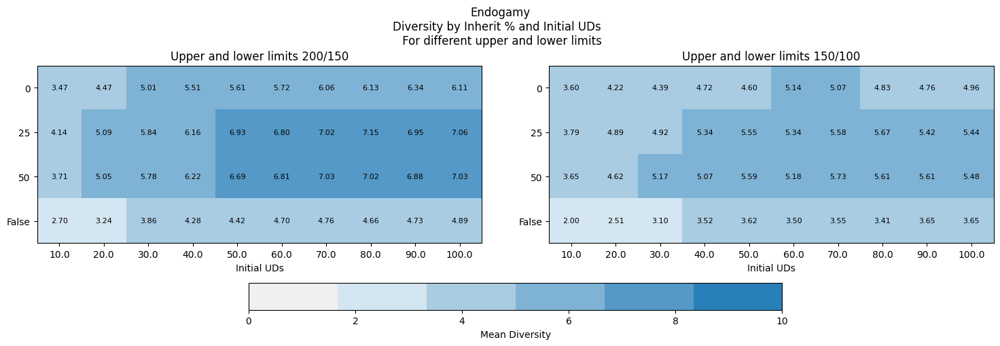

In [8]:
visualize_diversity(EmM_datos, inherits, Emalphas, 'Endogamy', up_low_limits, variable='Initial UDs', vis_type='heatmap')

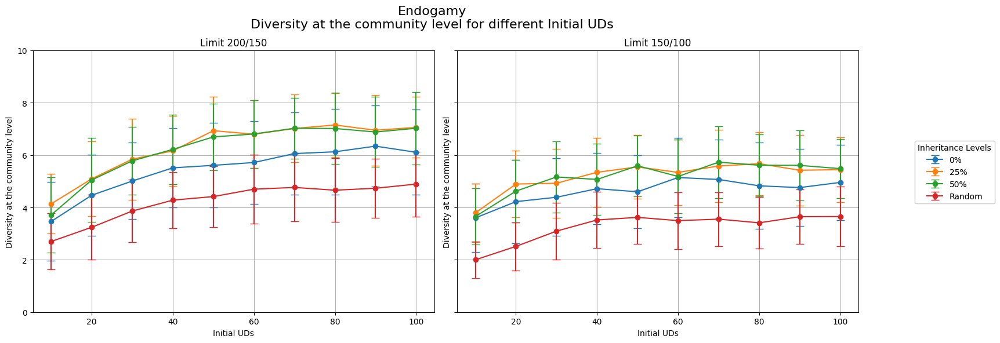

In [29]:
visualize_diversity(EmM_datos, inherits, Emalphas, 'Endogamy', up_low_limits, variable='Initial UDs', vis_type='transversal')

### Data and visualizations: population

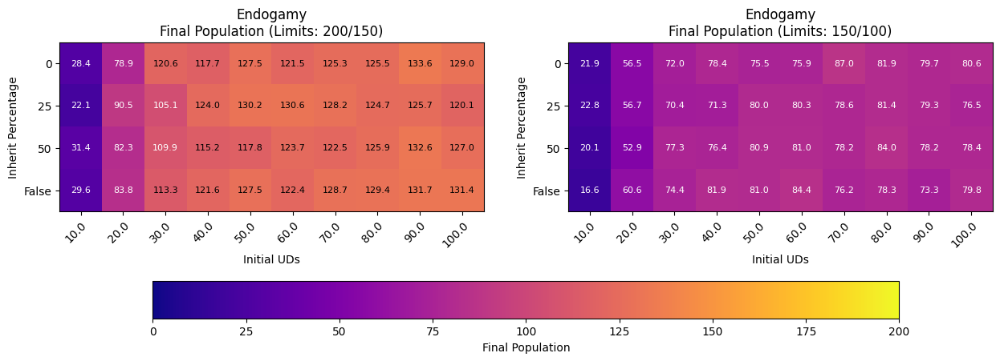

In [29]:
visualize_heatmap(EmM_datos, inherits, Emalphas, 'Endogamy', variable='Initial UDs', up_low_limits=up_low_limits, heatmap_type='alive')

## Initial Varieties

Here we try with different values for the initial varieties in the system.
We go from 10 to 100.

In [21]:
# This experiment has different values for Initial varieties VVVV
prob_morte = 0.06 #beta
media = 4 # Mean
m = 40
v = 100 # Initial varieties
inherits = [0,25,50, 'False']
# inherits = [0,25,50] #Values for inherit
# inherits = [0, 'False'] #Values for inherit
Evalphas = np.linspace(10,v,int(v/10)) # Initial Varieties: from 10 to v
up_low_limits = [[200, 150], [150, 100]]
# For data of behaviour
vM = np.empty((len(inherits), len(Evalphas), len(up_low_limits)), dtype=object) # alive, mean and diversity levels

punto_vista = 50
tiempo = 1000
tempo = list(range(0,tiempo+1,punto_vista))
experiments = 120


print(vM.shape)
start = time.time()
print(f"started at:  {datetime.now()}")
for i, inherit in enumerate(inherits):
    for j, varieties  in enumerate(Evalphas):
        for k, (upper_limit, lower_limit) in enumerate(up_low_limits):
            star_configuration = time.time()
            #For population dynamics
            list_alive_UDs = []
            list_vivas_puntos_vista = []
            tasas_crecimiento = []
            #For diversity dynamics
            data_step_mean_var_ud = []
            data_step_var_system = []
            data_step_unique_system = []
            print(f"Experiments with inheritance {inherit} Initial UDs {m} and Initial varieties {varieties}")
            #Lists to store experiments' diversity data
            data_endo_mean_ud = []
            data_endo_com_level = []
            data_endo_total_varieties = []
            original_media = media
            #To see how frequent goes to extintion
            contador = 0
            for experiment in range(1, experiments+1):
                print(f'experimento {experiment}')
                if inherit != 'False':

                    #### Initialization
                    UD_endogamy.uds = {}
                    instancias_ud = []
                    for id_ud in range(1, int(m) + 1):
                        instancias_ud.append(UD_endogamy(id_ud, media))
                    ## Varieties
                    limited_varieties = True
                    if limited_varieties == False:
                        for id_ud, ud in UD_endogamy.uds.items():
                            for _ in range(3):
                                ud.varieties.append(Variety())
                    else:
                        initial_varieties = [Variety() for _ in range (int(varieties))]
                        for ud in UD_endogamy.uds.values():
                            for _ in range(3):
                                ud.varieties.append(random.choice(initial_varieties))   
                    # Lists for graphs
                    vivas_puntos_vista = [int(m)]
                    vivas_tasa_crecimiento = [int(m)]
            #             mortas_puntos_vista = [0]
                    #For diversity
                    mean_var_ud = []
                    var_system = []
                    unique_system = []
                    var_ud = []
                    var_total = []
                    for ud in [ud for ud in UD_endogamy.uds.values() if ud.activa ==True]:
                        var_ud.append(len(ud.varieties))
                        for variety in ud.varieties:
                            var_total.append(variety.variety_id)
                    mean_var_ud.append(np.mean(var_ud))
                    var_system.append(len(var_total))
                    unique_system.append(len(set(var_total)))
                    # Simulation
                    for t in range(1, tiempo):
                        uds_copy = {id_ud: ud for id_ud, ud in UD_endogamy.uds.items() if ud.activa}
                        items = list(uds_copy.items())
                        random.shuffle(items)
                        uds_copy = dict(items)
                        alive = len(uds_copy)
                        if alive > upper_limit and (media == original_media):
                            media -= media//2
                            if media >= 4:
                                media = media //2
                        elif alive < lower_limit and media < original_media:
                            media = original_media
                        if not uds_copy: #Extintion
                            # Only 0
                            print(f"acabó en 0 el experimento {experiment} con herencia {inherits[i]} con unidades {Evalphas[j]}")
                            vivas_puntos_vista.extend([0] * (int((tiempo/punto_vista)-(len(vivas_puntos_vista)))))
                            vivas_tasa_crecimiento.extend([0] * (int((tiempo)-(len(vivas_tasa_crecimiento)))))
                            contador += 1
                            break         
                        # Cycle:
                        for id_ud, ud in uds_copy.items():
                            ud.ter_filho()
                            ud.buscar_ud(uds_copy, int(media), inherit)
                            ud.incrementar_idade()
                            ud.death_probability(prob_morte)
                        # Collecting data
                        vivas_tasa_crecimiento.append(len([ud for id, ud in uds_copy.items() if ud.activa]))
                        if t % punto_vista == 0:
                            viv = len([ud for id, ud in uds_copy.items() if ud.activa])
                            #mort = len([ud for id, ud in uds_copy.items() if not ud.activa])
                            vivas_puntos_vista.append(viv)
                            # For diversity
                            var_ud = []
                            var_total = []
                            for ud in [ud for ud in UD_endogamy.uds.values() if ud.activa ==True]:
                                var_ud.append(len(ud.varieties))
                                for variety in ud.varieties:
                                    var_total.append(variety.variety_id)
                            mean_var_ud.append(np.mean(var_ud))
                            var_system.append(len(var_total))
                            unique_system.append(len(set(var_total))) 
                    viv = len([ud for id, ud in UD_endogamy.uds.items() if ud.activa])
                    vivas_puntos_vista.append(viv)
                    # For diversity
                    var_ud = []
                    var_total = []
                    for ud in [ud for ud in UD_endogamy.uds.values() if ud.activa ==True]:
                        var_ud.append(len(ud.varieties))
                        for variety in ud.varieties:
                            var_total.append(variety.variety_id)
                    mean_var_ud.append(np.mean(var_ud))
                    var_system.append(len(var_total))
                    unique_system.append(len(set(var_total)))
                    alive = (len([ud for id, ud in uds_copy.items() if ud.activa]))
                    if alive >= 1:   
                        total_varieties = []
                        varieties_per_UD = []
                        for ud in [ud for ud in UD_endogamy.uds.values() if ud.activa ==True]:
                            varieties_per_UD.append(len(ud.varieties))
                            for variety in ud.varieties:
                                total_varieties.append(variety.variety_id)
                        data_endo_mean_ud.append(np.mean(varieties_per_UD))
                        data_endo_com_level.append(len(set(total_varieties)))
                        data_endo_total_varieties.append(total_varieties)

                else:# Now with inherit == False
                    #### Initialization
                    UD_endogamy_al_inh.uds = {}
                    instancias_ud = []
                    for id_ud in range(1, int(m) + 1):
                        instancias_ud.append(UD_endogamy_al_inh(id_ud, media))
                    ## Varieties
                    limited_varieties = True
                    if limited_varieties == False:
                        for id_ud, ud in UD_endogamy_al_inh.uds.items():
                            for _ in range(3):
                                ud.varieties.append(Variety())
                    else:
                        initial_varieties = [Variety() for _ in range (int(varieties))]
                        for ud in UD_endogamy_al_inh.uds.values():
                            for _ in range(3):
                                ud.varieties.append(random.choice(initial_varieties))   
                    # Lists for graphs
                    vivas_puntos_vista = [int(m)]
                    vivas_tasa_crecimiento = [int(m)]
            #             mortas_puntos_vista = [0]
                    #For diversity
                    mean_var_ud = []
                    var_system = []
                    unique_system = []
                    var_ud = []
                    var_total = []
                    for ud in [ud for ud in UD_endogamy_al_inh.uds.values() if ud.activa ==True]:
                        var_ud.append(len(ud.varieties))
                        for variety in ud.varieties:
                            var_total.append(variety.variety_id)
                    mean_var_ud.append(np.mean(var_ud))
                    var_system.append(len(var_total))
                    unique_system.append(len(set(var_total)))
                    # Simulation
                    for t in range(1, tiempo):
                        uds_copy = {id_ud: ud for id_ud, ud in UD_endogamy_al_inh.uds.items() if ud.activa}
                        items = list(uds_copy.items())
                        random.shuffle(items)
                        uds_copy = dict(items)
                        alive = len(uds_copy)
                        if alive > upper_limit and (media == original_media):
                            media -= media//2
                            if media >= 4:
                                media = media //2
                        elif alive < lower_limit and media < original_media:
                            media = original_media
                        if not uds_copy: #Extintion
                            # Only 0
                            print(f"acabó en 0 el experimento {experiment} con herencia {inherits[i]} con unidades {Evalphas[j]}")
                            vivas_puntos_vista.extend([0] * (int((tiempo/punto_vista)-(len(vivas_puntos_vista)))))
                            vivas_tasa_crecimiento.extend([0] * (int((tiempo)-(len(vivas_tasa_crecimiento)))))
                            contador += 1
                            break         
                        # Cycle:
                        varieties_list = [var for ud in uds_copy.values() for var in ud.varieties]
                        for id_ud, ud in uds_copy.items():
                            ud.ter_filho()
                            ud.buscar_ud(uds_copy, int(media), varieties_list, 3)
                            ud.incrementar_idade()
                            ud.death_probability(prob_morte)
                        # Collecting data
                        vivas_tasa_crecimiento.append(len([ud for id, ud in uds_copy.items() if ud.activa]))
                        if t % punto_vista == 0:
                            viv = len([ud for id, ud in uds_copy.items() if ud.activa])
                            #mort = len([ud for id, ud in uds_copy.items() if not ud.activa])
                            vivas_puntos_vista.append(viv)
                            # For diversity
                            var_ud = []
                            var_total = []
                            for ud in [ud for ud in UD_endogamy_al_inh.uds.values() if ud.activa ==True]:
                                var_ud.append(len(ud.varieties))
                                for variety in ud.varieties:
                                    var_total.append(variety.variety_id)
                            mean_var_ud.append(np.mean(var_ud))
                            var_system.append(len(var_total))
                            unique_system.append(len(set(var_total))) 
                    viv = len([ud for id, ud in UD_endogamy_al_inh.uds.items() if ud.activa])
                    vivas_puntos_vista.append(viv)
                    # For diversity
                    var_ud = []
                    var_total = []
                    for ud in [ud for ud in UD_endogamy_al_inh.uds.values() if ud.activa ==True]:
                        var_ud.append(len(ud.varieties))
                        for variety in ud.varieties:
                            var_total.append(variety.variety_id)
                    mean_var_ud.append(np.mean(var_ud))
                    var_system.append(len(var_total))
                    unique_system.append(len(set(var_total)))
                    alive = (len([ud for id, ud in uds_copy.items() if ud.activa]))
                    if alive >= 1:   
                        total_varieties = []
                        varieties_per_UD = []
                        for ud in [ud for ud in UD_endogamy_al_inh.uds.values() if ud.activa ==True]:
                            varieties_per_UD.append(len(ud.varieties))
                            for variety in ud.varieties:
                                total_varieties.append(variety.variety_id)
                        data_endo_mean_ud.append(np.mean(varieties_per_UD))
                        data_endo_com_level.append(len(set(total_varieties)))
                        data_endo_total_varieties.append(total_varieties)


                #Final colect of the data after the simulation!
                indice_primer_cero = np.where(np.array(vivas_tasa_crecimiento) == 0)[0]            
                if len(indice_primer_cero) > 0:
                    # Get growth rate before the 0
                    tasas_crecimiento.append(np.diff(vivas_tasa_crecimiento[:indice_primer_cero[0] - 1]) / vivas_tasa_crecimiento[:-1][:indice_primer_cero[0] - 2] * 100)
                else:
                    # Growth rate
                    tasas_crecimiento.append(np.diff(vivas_tasa_crecimiento) / vivas_tasa_crecimiento[:-1] * 100)
                # Collect the data
                list_alive_UDs.append(len([ud for id, ud in uds_copy.items() if ud.activa == True])) #For heatmap
                list_vivas_puntos_vista.append(vivas_puntos_vista)
                if alive >= 1:
                    if len(mean_var_ud) == len(tempo):        
                        data_step_var_system.append(var_system)
                        data_step_unique_system.append(unique_system)
                        data_step_mean_var_ud.append(mean_var_ud)
            
                data_inherit_endo = [data_endo_mean_ud, data_endo_com_level, data_endo_total_varieties]
            data_steps_inherit_endo = [data_step_var_system, data_step_unique_system, data_step_mean_var_ud]
            media = original_media
            end_config = time.time()
            vM[i][j][k] = {'alive': np.mean(list_alive_UDs),
                        'std': np.std(list_alive_UDs),
                        'time used': end_config - star_configuration,
                        'porcentage_extintion': contador/experiments,
                        'tempo': tempo, 
                        'mean': np.mean(list_vivas_puntos_vista, axis=0), 
                        'std':  np.std(list_vivas_puntos_vista, axis=0),
                        'growth rate': np.mean([np.mean(lista) for lista in tasas_crecimiento]),
                        'diversity_info': data_inherit_endo,
                        'diversity_info_steps': data_steps_inherit_endo}
            print(f"""
    The total time of the configuration of inherit percentage {inherit}, limits {upper_limit}/{lower_limit},
      initial UDs {m} and Initial varieties {varieties} is  {end_config - star_configuration}
            """)
# Folder
folder_name = 'Experiments_kinship_inheritance_parameters_limits'
if not os.path.exists(folder_name):
    os.makedirs(folder_name)
# Heatmap and std
heat_std = os.path.join(folder_name, 'Endo_Initial_Varieties.npy')
np.save(heat_std, vM)
now = datetime.now()
finish = time.time()
print(f"""
It finished at: {now}
It lasted {finish-start}
""")
print("done")

(4, 10, 2)
started at:  2024-11-06 06:03:02.022823
Experiments with inheritance 0 Initial UDs 40 and Initial varieties 10.0
experimento 1
experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
experimento 38
experimento 39
experimento 40
experimento 41
experimento 42
experimento 43
experimento 44
experimento 45
experimento 46
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59


C:\Users\jsolm\Juancho\Juancho\Maestrías\Modelage en Sistemas Complejos\Tesis\Projecto\Modelo\modelo_mio\Agrobiodiversity-model\venv\lib\site-packages\numpy\_core\fromnumeric.py:3596: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\jsolm\Juancho\Juancho\Maestrías\Modelage en Sistemas Complejos\Tesis\Projecto\Modelo\modelo_mio\Agrobiodiversity-model\venv\lib\site-packages\numpy\_core\_methods.py:138: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


experimento 66
experimento 67
experimento 68
experimento 69
experimento 70
experimento 71
experimento 72
experimento 73
experimento 74
experimento 75
experimento 76
experimento 77
experimento 78
experimento 79
experimento 80
experimento 81
experimento 82
acabó en 0 el experimento 82 con herencia 0 con unidades 10.0
experimento 83
experimento 84
experimento 85
experimento 86
experimento 87
experimento 88
experimento 89
experimento 90
experimento 91
experimento 92
experimento 93
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100
acabó en 0 el experimento 100 con herencia 0 con unidades 10.0
experimento 101
experimento 102
experimento 103
experimento 104
experimento 105
experimento 106
experimento 107
experimento 108
experimento 109
experimento 110
experimento 111
experimento 112
experimento 113
experimento 114
experimento 115
experimento 116
experimento 117
experimento 118
experimento 119
experimento 120

    The total time of the co

experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
acabó en 0 el experimento 15 con herencia 0 con unidades 30.0
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
experimento 38
experimento 39
experimento 40
experimento 41
experimento 42
experimento 43
experimento 44
experimento 45
acabó en 0 el experimento 45 con herencia 0 con unidades 30.0
experimento 46
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
acabó en 0 el experimento 55 con herencia 0 con unidades 30.0
experimento 

experimento 73
acabó en 0 el experimento 73 con herencia 0 con unidades 40.0
experimento 74
experimento 75
experimento 76
experimento 77
acabó en 0 el experimento 77 con herencia 0 con unidades 40.0
experimento 78
experimento 79
experimento 80
acabó en 0 el experimento 80 con herencia 0 con unidades 40.0
experimento 81
experimento 82
acabó en 0 el experimento 82 con herencia 0 con unidades 40.0
experimento 83
acabó en 0 el experimento 83 con herencia 0 con unidades 40.0
experimento 84
experimento 85
experimento 86
experimento 87
experimento 88
experimento 89
experimento 90
experimento 91
experimento 92
experimento 93
acabó en 0 el experimento 93 con herencia 0 con unidades 40.0
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100
experimento 101
experimento 102
experimento 103
experimento 104
experimento 105
experimento 106
experimento 107
experimento 108
experimento 109
acabó en 0 el experimento 109 con herencia 0 con unidades 40.0


experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
acabó en 0 el experimento 28 con herencia 0 con unidades 60.0
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
experimento 38
experimento 39
experimento 40
experimento 41
experimento 42
experimento 43
experimento 44
experimento 45
experimento 46
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
acabó en 0 el experimento 55 con herencia 0 con unidades 60.0
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60

experimento 52
acabó en 0 el experimento 52 con herencia 0 con unidades 80.0
experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
experimento 67
experimento 68
experimento 69
experimento 70
experimento 71
experimento 72
experimento 73
experimento 74
experimento 75
experimento 76
experimento 77
experimento 78
experimento 79
experimento 80
experimento 81
experimento 82
experimento 83
experimento 84
experimento 85
experimento 86
experimento 87
experimento 88
experimento 89
acabó en 0 el experimento 89 con herencia 0 con unidades 80.0
experimento 90
experimento 91
experimento 92
experimento 93
experimento 94
experimento 95
acabó en 0 el experimento 95 con herencia 0 con unidades 80.0
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100
experimento 101
experimento 102
experimento 103
experimento 104
experimento 10

experimento 91
experimento 92
experimento 93
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100
experimento 101
experimento 102
experimento 103
experimento 104
experimento 105
experimento 106
experimento 107
experimento 108
experimento 109
experimento 110
experimento 111
experimento 112
experimento 113
experimento 114
experimento 115
experimento 116
experimento 117
experimento 118
experimento 119
acabó en 0 el experimento 119 con herencia 0 con unidades 90.0
experimento 120

    The total time of the configuration of inherit percentage 0, limits 150/100,
      initial UDs 40 and Initial varieties 90.0 is  461.3378655910492
            
Experiments with inheritance 0 Initial UDs 40 and Initial varieties 100.0
experimento 1
experimento 2
experimento 3
experimento 4
acabó en 0 el experimento 4 con herencia 0 con unidades 100.0
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimen

experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
experimento 38
experimento 39
experimento 40
experimento 41
experimento 42
experimento 43
experimento 44
experimento 45
experimento 46
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
acabó en 0 el experimento 64 con herencia 25 con unidades 10.0
experimento 65
experimento 66
experimento 67
experimento 68
experimento 69
experimento 70
experimento 71
experimento 72
experimento 73
experimento 74
experimento 75
experimento 76
experimento 77
experimento 78
experimento 79
experim

experimento 66
experimento 67
experimento 68
experimento 69
experimento 70
experimento 71
experimento 72
experimento 73
experimento 74
experimento 75
experimento 76
experimento 77
experimento 78
experimento 79
experimento 80
experimento 81
experimento 82
experimento 83
experimento 84
acabó en 0 el experimento 84 con herencia 25 con unidades 30.0
experimento 85
experimento 86
experimento 87
experimento 88
experimento 89
experimento 90
experimento 91
experimento 92
experimento 93
acabó en 0 el experimento 93 con herencia 25 con unidades 30.0
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100
experimento 101
experimento 102
experimento 103
experimento 104
experimento 105
experimento 106
experimento 107
experimento 108
experimento 109
experimento 110
experimento 111
experimento 112
experimento 113
experimento 114
experimento 115
experimento 116
experimento 117
experimento 118
experimento 119
experimento 120

    The total time of the c

experimento 105
experimento 106
experimento 107
experimento 108
experimento 109
experimento 110
experimento 111
experimento 112
experimento 113
experimento 114
experimento 115
experimento 116
experimento 117
experimento 118
experimento 119
experimento 120

    The total time of the configuration of inherit percentage 25, limits 150/100,
      initial UDs 40 and Initial varieties 40.0 is  410.14999985694885
            
Experiments with inheritance 25 Initial UDs 40 and Initial varieties 50.0
experimento 1
experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
experimento 34
ex

experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
experimento 38
experimento 39
experimento 40
experimento 41
experimento 42
experimento 43
experimento 44
experimento 45
experimento 46
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
acabó en 0 el experimento 65 con herencia 25 con unidades 60.0
experimento 66
experimento 67
experimento 68
experimento 69
experimento 70
experimento 71
experimento 72
experimento 73
acabó en 0 el experimento 73 con herencia 25 con unidades 60.0
expe

experimento 68
experimento 69
experimento 70
experimento 71
experimento 72
experimento 73
experimento 74
experimento 75
experimento 76
experimento 77
experimento 78
experimento 79
acabó en 0 el experimento 79 con herencia 25 con unidades 80.0
experimento 80
experimento 81
experimento 82
experimento 83
experimento 84
experimento 85
experimento 86
experimento 87
experimento 88
experimento 89
experimento 90
experimento 91
experimento 92
acabó en 0 el experimento 92 con herencia 25 con unidades 80.0
experimento 93
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100
experimento 101
experimento 102
experimento 103
experimento 104
experimento 105
experimento 106
experimento 107
experimento 108
experimento 109
experimento 110
experimento 111
experimento 112
experimento 113
experimento 114
experimento 115
experimento 116
experimento 117
experimento 118
experimento 119
experimento 120

    The total time of the configuration of inherit percen

experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
acabó en 0 el experimento 8 con herencia 25 con unidades 100.0
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
acabó en 0 el experimento 29 con herencia 25 con unidades 100.0
experimento 30
experimento 31
experimento 32
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
experimento 38
experimento 39
experimento 40
experimento 41
experimento 42
experimento 43
experimento 44
experimento 45
experimento 46
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
experimento

experimento 75
experimento 76
experimento 77
experimento 78
experimento 79
experimento 80
experimento 81
experimento 82
experimento 83
experimento 84
experimento 85
experimento 86
experimento 87
experimento 88
experimento 89
experimento 90
experimento 91
acabó en 0 el experimento 91 con herencia 50 con unidades 10.0
experimento 92
experimento 93
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100
experimento 101
experimento 102
experimento 103
experimento 104
experimento 105
experimento 106
experimento 107
acabó en 0 el experimento 107 con herencia 50 con unidades 10.0
experimento 108
experimento 109
experimento 110
experimento 111
experimento 112
experimento 113
experimento 114
experimento 115
experimento 116
experimento 117
experimento 118
experimento 119
experimento 120

    The total time of the configuration of inherit percentage 50, limits 150/100,
      initial UDs 40 and Initial varieties 10.0 is  380.81023383140564
        

experimento 110
experimento 111
experimento 112
experimento 113
experimento 114
experimento 115
experimento 116
experimento 117
experimento 118
experimento 119
experimento 120

    The total time of the configuration of inherit percentage 50, limits 200/150,
      initial UDs 40 and Initial varieties 30.0 is  628.054322719574
            
Experiments with inheritance 50 Initial UDs 40 and Initial varieties 30.0
experimento 1
experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
acabó en 0 el experimento 16 con herencia 50 con unidades 30.0
experimento 17
experimento 18
experimento 19
experimento 20
acabó en 0 el experimento 20 con herencia 50 con unidades 30.0
experimento 21
experimento 22
acabó en 0 el experimento 22 con herencia 50 con unidades 30.0
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27


experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
acabó en 0 el experimento 31 con herencia 50 con unidades 50.0
experimento 32
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
experimento 38
experimento 39
experimento 40
experimento 41
experimento 42
experimento 43
experimento 44
experimento 45
experimento 46
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
experimento 67
experimento 68
experimento 69
experimento 70
experime

experimento 59
experimento 60
acabó en 0 el experimento 60 con herencia 50 con unidades 60.0
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
experimento 67
experimento 68
experimento 69
experimento 70
experimento 71
experimento 72
experimento 73
experimento 74
acabó en 0 el experimento 74 con herencia 50 con unidades 60.0
experimento 75
experimento 76
acabó en 0 el experimento 76 con herencia 50 con unidades 60.0
experimento 77
experimento 78
experimento 79
experimento 80
experimento 81
experimento 82
experimento 83
experimento 84
experimento 85
experimento 86
experimento 87
experimento 88
experimento 89
experimento 90
experimento 91
acabó en 0 el experimento 91 con herencia 50 con unidades 60.0
experimento 92
experimento 93
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100
experimento 101
experimento 102
experimento 103
experimento 104
experimento 105
experimento 106
experimento 107
exper

experimento 118
experimento 119
experimento 120

    The total time of the configuration of inherit percentage 50, limits 200/150,
      initial UDs 40 and Initial varieties 80.0 is  867.0919263362885
            
Experiments with inheritance 50 Initial UDs 40 and Initial varieties 80.0
experimento 1
experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
acabó en 0 el experimento 30 con herencia 50 con unidades 80.0
experimento 31
acabó en 0 el experimento 31 con herencia 50 con unidades 80.0
experimento 32
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
experimento 38
experimento 39
experiment

experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
experimento 67
experimento 68
experimento 69
experimento 70
experimento 71
acabó en 0 el experimento 71 con herencia 50 con unidades 100.0
experimento 72
experimento 73
experimento 74
experimento 75
experimento 76
experimento 77
experimento 78
experimento 79
experimento 80
experimento 81
experimento 82
experimento 83
experimento 84
experimento 85
experimento 86
experimento 87
experimento 88
experimento 89
experimento 90
experimento 91
experimento 92
experimento 93
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100
experimento 101
experimento 102
experimento 103
experimento 104
experimento 105
experimento 106
experimento 107
experimento 108
experimento 109
experimento 110
experimento 111
experimento 112
experimento 113
experimento 114
acabó en 0 el experimento 114 con herencia 50 con u

experimento 96
experimento 97
experimento 98
experimento 99
experimento 100
experimento 101
experimento 102
experimento 103
experimento 104
experimento 105
experimento 106
experimento 107
experimento 108
experimento 109
experimento 110
experimento 111
experimento 112
experimento 113
experimento 114
experimento 115
acabó en 0 el experimento 115 con herencia False con unidades 10.0
experimento 116
experimento 117
experimento 118
experimento 119
experimento 120

    The total time of the configuration of inherit percentage False, limits 150/100,
      initial UDs 40 and Initial varieties 10.0 is  471.248419046402
            
Experiments with inheritance False Initial UDs 40 and Initial varieties 20.0
experimento 1
experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
e

experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
acabó en 0 el experimento 22 con herencia False con unidades 30.0
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
experimento 38
experimento 39
experimento 40
experimento 41
experimento 42
experimento 43
experimento 44
experimento 45
acabó en 0 el experimento 45 con herencia False con unidades 30.0
experimento 46
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
experi

experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
experimento 67
experimento 68
acabó en 0 el experimento 68 con herencia False con unidades 50.0
experimento 69
experimento 70
experimento 71
experimento 72
experimento 73
experimento 74
experimento 75
experimento 76
experimento 77
experimento 78
experimento 79
experimento 80
experimento 81
experimento 82
experimento 83
experimento 84
experimento 85
experimento 86
experimento 87
experimento 88
experimento 89
experimento 90
experimento 91
experimento 92
experimento 93
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100
experimento 101
experimento 102
experimento 103
experimento 104
acabó en 0 el experimento 104 con herencia False con unidades 50.0
experimento 105
experi

experimento 96
experimento 97
experimento 98
experimento 99
experimento 100
experimento 101
experimento 102
experimento 103
experimento 104
experimento 105
experimento 106
experimento 107
experimento 108
experimento 109
experimento 110
experimento 111
experimento 112
experimento 113
experimento 114
experimento 115
experimento 116
experimento 117
experimento 118
experimento 119
experimento 120

    The total time of the configuration of inherit percentage False, limits 150/100,
      initial UDs 40 and Initial varieties 60.0 is  407.83632135391235
            
Experiments with inheritance False Initial UDs 40 and Initial varieties 70.0
experimento 1
experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
acabó en 0 el experimento 9 con herencia False con unidades 70.0
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
e

experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
acabó en 0 el experimento 24 con herencia False con unidades 80.0
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
experimento 38
experimento 39
experimento 40
experimento 41
experimento 42
experimento 43
experimento 44
experimento 45
experimento 46
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
experimento 67
experimento 68
experimento 69
experimento 70
experimento 71
experimento 72
experimento 73
experimento 74
experimento 75
experimento 76
experimento 77
expe

experimento 45
acabó en 0 el experimento 45 con herencia False con unidades 100.0
experimento 46
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
experimento 67
experimento 68
experimento 69
experimento 70
experimento 71
experimento 72
experimento 73
experimento 74
experimento 75
experimento 76
acabó en 0 el experimento 76 con herencia False con unidades 100.0
experimento 77
experimento 78
experimento 79
experimento 80
experimento 81
experimento 82
experimento 83
experimento 84
experimento 85
experimento 86
experimento 87
acabó en 0 el experimento 87 con herencia False con unidades 100.0
experimento 88
experimento 89
experimento 90
experimento 91
experimento 92
experimento 93
experimento 94
experimento 95
experimento 96
experimento 97
expe

In [17]:
# Dowload the documents
#As a reference
v = 100
inherits = [0,25,50, 'False']#Values for inherit
# inherits = [0, 'False'] #Values for inherit
Evalphas = np.linspace(10,v,int(v/10)) # Initial UDs: from 10 to m
up_low_limits = [[200, 150], [150, 100]]
punto_vista = 50
tiempo = 1000
tempo = list(range(0,tiempo+1,punto_vista))

#Folders
folder_name = 'Experiments_kinship_inheritance_parameters_limits'
heat_std = os.path.join(folder_name, 'Endo_Initial_Varieties.npy')
## heatmap and mean
EvM_datos = np.load(heat_std, allow_pickle=True)

## Diversity dynamics

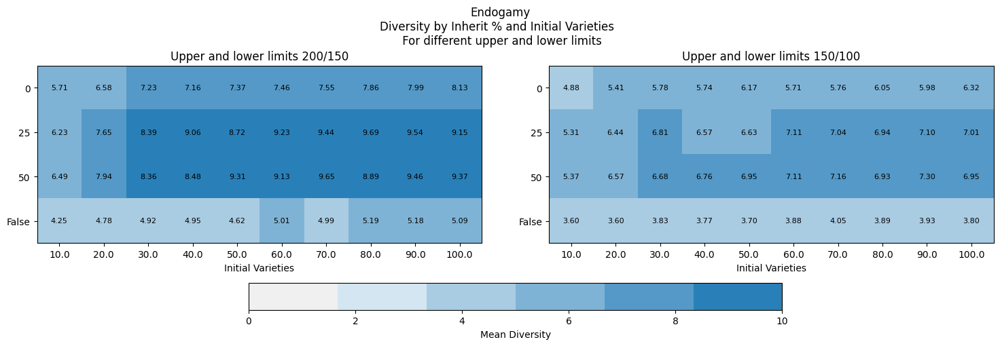

In [31]:
visualize_diversity(EvM_datos, inherits, Evalphas, 'Endogamy', up_low_limits, variable='Initial Varieties', vis_type='heatmap')

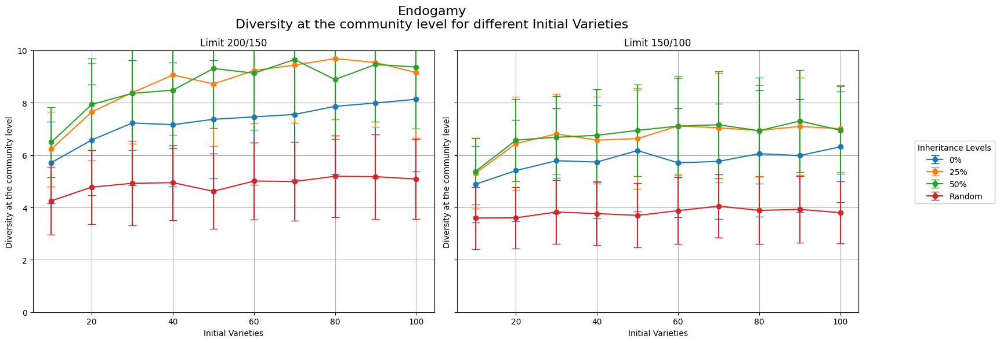

In [18]:
visualize_diversity(EvM_datos, inherits, Evalphas, 'Endogamy', up_low_limits, variable='Initial Varieties', vis_type='transversal')

## Pop dynamics

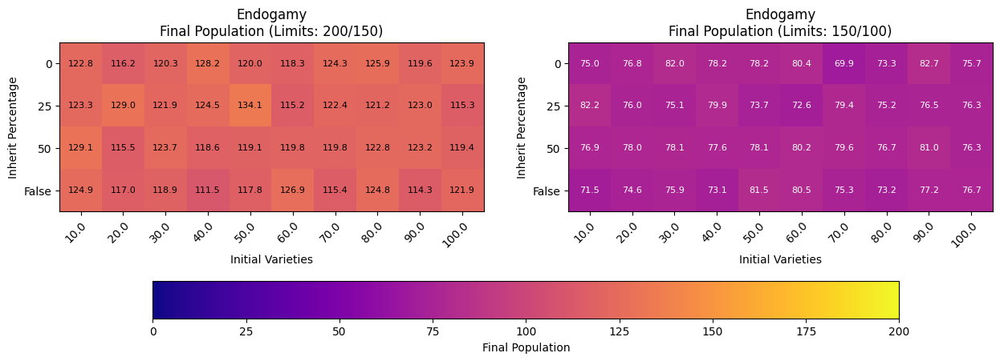

In [22]:
visualize_heatmap(EvM_datos, inherits, Evalphas, 'Endogamy', variable='Initial Varieties', up_low_limits=up_low_limits, heatmap_type='alive')

## Mean of children 


In [6]:
# This experiment has different values for Mean of children
prob_morte = 0.06 #beta
n = 10 # Mean
m = 40 # Initial UDs
inherits = [0,25,50, 'False']
Ecalphas = np.linspace(1,n,n) # Mean of children from 1 to n
up_low_limits = [[200, 150], [150, 100]]
# For data of behaviour
cM = np.empty((len(inherits), len(Ecalphas), len(up_low_limits)), dtype=object) # alive, mean and diversity levels

punto_vista = 50
tiempo = 1000
tempo = list(range(0,tiempo+1,punto_vista))
experiments = 120


print(cM.shape)
start = time.time()
print(f"started at:  {datetime.now()}")
for i, inherit in enumerate(inherits):
    for j, media  in enumerate(Ecalphas):
        for k, (upper_limit, lower_limit) in enumerate(up_low_limits):
            star_configuration = time.time()
            #For population dynamics
            list_alive_UDs = []
            list_vivas_puntos_vista = []
            tasas_crecimiento = []
            #For diversity dynamics
            data_step_mean_var_ud = []
            data_step_var_system = []
            data_step_unique_system = []
            print(f"Experiments with inheritance {inherit} and Mean of Children {media}")
            #Lists to store experiments' diversity data
            data_endo_mean_ud = []
            data_endo_com_level = []
            data_endo_total_varieties = []
            original_media = media
            #To see how frequent goes to extintion
            contador = 0
            for experiment in range(1, experiments+1):
                print(f'experimento {experiment}')
                if inherit != 'False':

                    #### Initialization
                    UD_endogamy.uds = {}
                    instancias_ud = []
                    for id_ud in range(1, int(m) + 1):
                        instancias_ud.append(UD_endogamy(id_ud, media))
                    ## Varieties
                    limited_varieties = True
                    if limited_varieties == False:
                        for id_ud, ud in UD_endogamy.uds.items():
                            for _ in range(3):
                                ud.varieties.append(Variety())
                    else:
                        initial_varieties = [Variety() for _ in range (10)]
                        for ud in UD_endogamy.uds.values():
                            for _ in range(3):
                                ud.varieties.append(random.choice(initial_varieties))   
                    # Lists for graphs
                    vivas_puntos_vista = [int(m)]
                    vivas_tasa_crecimiento = [int(m)]
            #             mortas_puntos_vista = [0]
                    #For diversity
                    mean_var_ud = []
                    var_system = []
                    unique_system = []
                    var_ud = []
                    var_total = []
                    for ud in [ud for ud in UD_endogamy.uds.values() if ud.activa ==True]:
                        var_ud.append(len(ud.varieties))
                        for variety in ud.varieties:
                            var_total.append(variety.variety_id)
                    mean_var_ud.append(np.mean(var_ud))
                    var_system.append(len(var_total))
                    unique_system.append(len(set(var_total)))
                    # Simulation
                    for t in range(1, tiempo):
                        uds_copy = {id_ud: ud for id_ud, ud in UD_endogamy.uds.items() if ud.activa}
                        items = list(uds_copy.items())
                        random.shuffle(items)
                        uds_copy = dict(items)
                        alive = len(uds_copy)
                        if alive > upper_limit and (media == original_media):
                            media -= media//2
                            if media >= 4:
                                media = media //2
                        elif alive < lower_limit and media < original_media:
                            media = original_media
                        if not uds_copy: #Extintion
                            # Only 0
                            print(f"acabó en 0 el experimento {experiment} con herencia {inherits[i]} con mean {Ecalphas[j]}")
                            vivas_puntos_vista.extend([0] * (int((tiempo/punto_vista)-(len(vivas_puntos_vista)))))
                            vivas_tasa_crecimiento.extend([0] * (int((tiempo)-(len(vivas_tasa_crecimiento)))))
                            contador += 1
                            break         
                        # Cycle:
                        for id_ud, ud in uds_copy.items():
                            ud.ter_filho()
                            ud.buscar_ud(uds_copy, int(media), inherit)
                            ud.incrementar_idade()
                            ud.death_probability(prob_morte)
                        # Collecting data
                        vivas_tasa_crecimiento.append(len([ud for id, ud in uds_copy.items() if ud.activa]))
                        if t % punto_vista == 0:
                            viv = len([ud for id, ud in uds_copy.items() if ud.activa])
                            #mort = len([ud for id, ud in uds_copy.items() if not ud.activa])
                            vivas_puntos_vista.append(viv)
                            # For diversity
                            var_ud = []
                            var_total = []
                            for ud in [ud for ud in UD_endogamy.uds.values() if ud.activa ==True]:
                                var_ud.append(len(ud.varieties))
                                for variety in ud.varieties:
                                    var_total.append(variety.variety_id)
                            mean_var_ud.append(np.mean(var_ud))
                            var_system.append(len(var_total))
                            unique_system.append(len(set(var_total))) 
                    viv = len([ud for id, ud in UD_endogamy.uds.items() if ud.activa])
                    vivas_puntos_vista.append(viv)
                    # For diversity
                    var_ud = []
                    var_total = []
                    for ud in [ud for ud in UD_endogamy.uds.values() if ud.activa ==True]:
                        var_ud.append(len(ud.varieties))
                        for variety in ud.varieties:
                            var_total.append(variety.variety_id)
                    mean_var_ud.append(np.mean(var_ud))
                    var_system.append(len(var_total))
                    unique_system.append(len(set(var_total)))
                    alive = (len([ud for id, ud in uds_copy.items() if ud.activa]))
                    if alive >= 1:   
                        total_varieties = []
                        varieties_per_UD = []
                        for ud in [ud for ud in UD_endogamy.uds.values() if ud.activa ==True]:
                            varieties_per_UD.append(len(ud.varieties))
                            for variety in ud.varieties:
                                total_varieties.append(variety.variety_id)
                        data_endo_mean_ud.append(np.mean(varieties_per_UD))
                        data_endo_com_level.append(len(set(total_varieties)))
                        data_endo_total_varieties.append(total_varieties)

                else:# Now with inherit == False
                    #### Initialization
                    UD_endogamy_al_inh.uds = {}
                    instancias_ud = []
                    for id_ud in range(1, int(m) + 1):
                        instancias_ud.append(UD_endogamy_al_inh(id_ud, media))
                    ## Varieties
                    limited_varieties = True
                    if limited_varieties == False:
                        for id_ud, ud in UD_endogamy_al_inh.uds.items():
                            for _ in range(3):
                                ud.varieties.append(Variety())
                    else:
                        initial_varieties = [Variety() for _ in range (10)]
                        for ud in UD_endogamy_al_inh.uds.values():
                            for _ in range(3):
                                ud.varieties.append(random.choice(initial_varieties))   
                    # Lists for graphs
                    vivas_puntos_vista = [int(m)]
                    vivas_tasa_crecimiento = [int(m)]
            #             mortas_puntos_vista = [0]
                    #For diversity
                    mean_var_ud = []
                    var_system = []
                    unique_system = []
                    var_ud = []
                    var_total = []
                    for ud in [ud for ud in UD_endogamy_al_inh.uds.values() if ud.activa ==True]:
                        var_ud.append(len(ud.varieties))
                        for variety in ud.varieties:
                            var_total.append(variety.variety_id)
                    mean_var_ud.append(np.mean(var_ud))
                    var_system.append(len(var_total))
                    unique_system.append(len(set(var_total)))
                    # Simulation
                    for t in range(1, tiempo):
                        uds_copy = {id_ud: ud for id_ud, ud in UD_endogamy_al_inh.uds.items() if ud.activa}
                        items = list(uds_copy.items())
                        random.shuffle(items)
                        uds_copy = dict(items)
                        alive = len(uds_copy)
                        if alive > upper_limit and (media == original_media):
                            media -= media//2
                            if media >= 4:
                                media = media //2
                        elif alive < lower_limit and media < original_media:
                            media = original_media
                        if not uds_copy: #Extintion
                            # Only 0
                            print(f"acabó en 0 el experimento {experiment} con herencia {inherits[i]} con mean {Ecalphas[j]}")
                            vivas_puntos_vista.extend([0] * (int((tiempo/punto_vista)-(len(vivas_puntos_vista)))))
                            vivas_tasa_crecimiento.extend([0] * (int((tiempo)-(len(vivas_tasa_crecimiento)))))
                            contador += 1
                            break         
                        # Cycle:
                        varieties_list = [var for ud in uds_copy.values() for var in ud.varieties]
                        for id_ud, ud in uds_copy.items():
                            ud.ter_filho()
                            ud.buscar_ud(uds_copy, int(media), varieties_list, 3)
                            ud.incrementar_idade()
                            ud.death_probability(prob_morte)
                        # Collecting data
                        vivas_tasa_crecimiento.append(len([ud for id, ud in uds_copy.items() if ud.activa]))
                        if t % punto_vista == 0:
                            viv = len([ud for id, ud in uds_copy.items() if ud.activa])
                            #mort = len([ud for id, ud in uds_copy.items() if not ud.activa])
                            vivas_puntos_vista.append(viv)
                            # For diversity
                            var_ud = []
                            var_total = []
                            for ud in [ud for ud in UD_endogamy_al_inh.uds.values() if ud.activa ==True]:
                                var_ud.append(len(ud.varieties))
                                for variety in ud.varieties:
                                    var_total.append(variety.variety_id)
                            mean_var_ud.append(np.mean(var_ud))
                            var_system.append(len(var_total))
                            unique_system.append(len(set(var_total))) 
                    viv = len([ud for id, ud in UD_endogamy_al_inh.uds.items() if ud.activa])
                    vivas_puntos_vista.append(viv)
                    # For diversity
                    var_ud = []
                    var_total = []
                    for ud in [ud for ud in UD_endogamy_al_inh.uds.values() if ud.activa ==True]:
                        var_ud.append(len(ud.varieties))
                        for variety in ud.varieties:
                            var_total.append(variety.variety_id)
                    mean_var_ud.append(np.mean(var_ud))
                    var_system.append(len(var_total))
                    unique_system.append(len(set(var_total)))
                    alive = (len([ud for id, ud in uds_copy.items() if ud.activa]))
                    if alive >= 1:   
                        total_varieties = []
                        varieties_per_UD = []
                        for ud in [ud for ud in UD_endogamy_al_inh.uds.values() if ud.activa ==True]:
                            varieties_per_UD.append(len(ud.varieties))
                            for variety in ud.varieties:
                                total_varieties.append(variety.variety_id)
                        data_endo_mean_ud.append(np.mean(varieties_per_UD))
                        data_endo_com_level.append(len(set(total_varieties)))
                        data_endo_total_varieties.append(total_varieties)


                #Final colect of the data after the simulation!
                indice_primer_cero = np.where(np.array(vivas_tasa_crecimiento) == 0)[0]            
                if len(indice_primer_cero) > 0:
                    # Get growth rate before the 0
                    tasas_crecimiento.append(np.diff(vivas_tasa_crecimiento[:indice_primer_cero[0] - 1]) / vivas_tasa_crecimiento[:-1][:indice_primer_cero[0] - 2] * 100)
                else:
                    # Growth rate
                    tasas_crecimiento.append(np.diff(vivas_tasa_crecimiento) / vivas_tasa_crecimiento[:-1] * 100)
                # Collect the data
                list_alive_UDs.append(len([ud for id, ud in uds_copy.items() if ud.activa == True])) #For heatmap
                list_vivas_puntos_vista.append(vivas_puntos_vista)
                if alive >= 1:
                    if len(mean_var_ud) == len(tempo):        
                        data_step_var_system.append(var_system)
                        data_step_unique_system.append(unique_system)
                        data_step_mean_var_ud.append(mean_var_ud)
            
                data_inherit_endo = [data_endo_mean_ud, data_endo_com_level, data_endo_total_varieties]
            data_steps_inherit_endo = [data_step_var_system, data_step_unique_system, data_step_mean_var_ud]
            media = original_media
            end_config = time.time()
            cM[i][j][k] = {'alive': np.mean(list_alive_UDs),
                        'std': np.std(list_alive_UDs),
                        'time used': end_config - star_configuration,
                        'porcentage_extintion': contador/experiments,
                        'tempo': tempo, 
                        'mean': np.mean(list_vivas_puntos_vista, axis=0), 
                        'std':  np.std(list_vivas_puntos_vista, axis=0),
                        'growth rate': np.mean([np.mean(lista) for lista in tasas_crecimiento]),
                        'diversity_info': data_inherit_endo,
                        'diversity_info_steps': data_steps_inherit_endo}
            print(f"""
    The total time of the configuration of inherit percentage {inherit} and initial UDs {m} and mean {media} is  {end_config - star_configuration}
            """)
# Folder
folder_name = 'Experiments_kinship_inheritance_parameters_limits'
if not os.path.exists(folder_name):
    os.makedirs(folder_name)
# Data
heat_std = os.path.join(folder_name, 'Endo_Mean_children.npy')
np.save(heat_std, cM)
now = datetime.now()
finish = time.time()
print(f"""
It finished at: {now}
It lasted {finish-start}
""")
print("done")

(4, 10, 2)
started at:  2024-11-07 11:51:12.670281
Experiments with inheritance 0 and Mean of Children 1.0
experimento 1
acabó en 0 el experimento 1 con herencia 0 con mean 1.0
experimento 2
acabó en 0 el experimento 2 con herencia 0 con mean 1.0
experimento 3
acabó en 0 el experimento 3 con herencia 0 con mean 1.0
experimento 4
acabó en 0 el experimento 4 con herencia 0 con mean 1.0
experimento 5
acabó en 0 el experimento 5 con herencia 0 con mean 1.0
experimento 6
acabó en 0 el experimento 6 con herencia 0 con mean 1.0
experimento 7
acabó en 0 el experimento 7 con herencia 0 con mean 1.0
experimento 8
acabó en 0 el experimento 8 con herencia 0 con mean 1.0
experimento 9
acabó en 0 el experimento 9 con herencia 0 con mean 1.0
experimento 10
acabó en 0 el experimento 10 con herencia 0 con mean 1.0
experimento 11
acabó en 0 el experimento 11 con herencia 0 con mean 1.0
experimento 12
acabó en 0 el experimento 12 con herencia 0 con mean 1.0
experimento 13
acabó en 0 el experimento 13 con

C:\Users\jsolm\Juancho\Juancho\Maestrías\Modelage en Sistemas Complejos\Tesis\Projecto\Modelo\modelo_mio\Agrobiodiversity-model\venv\lib\site-packages\numpy\_core\fromnumeric.py:3596: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\jsolm\Juancho\Juancho\Maestrías\Modelage en Sistemas Complejos\Tesis\Projecto\Modelo\modelo_mio\Agrobiodiversity-model\venv\lib\site-packages\numpy\_core\_methods.py:138: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


acabó en 0 el experimento 15 con herencia 0 con mean 1.0
experimento 16
acabó en 0 el experimento 16 con herencia 0 con mean 1.0
experimento 17
acabó en 0 el experimento 17 con herencia 0 con mean 1.0
experimento 18
acabó en 0 el experimento 18 con herencia 0 con mean 1.0
experimento 19
acabó en 0 el experimento 19 con herencia 0 con mean 1.0
experimento 20
acabó en 0 el experimento 20 con herencia 0 con mean 1.0
experimento 21
acabó en 0 el experimento 21 con herencia 0 con mean 1.0
experimento 22
acabó en 0 el experimento 22 con herencia 0 con mean 1.0
experimento 23
acabó en 0 el experimento 23 con herencia 0 con mean 1.0
experimento 24
acabó en 0 el experimento 24 con herencia 0 con mean 1.0
experimento 25
acabó en 0 el experimento 25 con herencia 0 con mean 1.0
experimento 26
acabó en 0 el experimento 26 con herencia 0 con mean 1.0
experimento 27
acabó en 0 el experimento 27 con herencia 0 con mean 1.0
experimento 28
acabó en 0 el experimento 28 con herencia 0 con mean 1.0
experim

acabó en 0 el experimento 19 con herencia 0 con mean 1.0
experimento 20
acabó en 0 el experimento 20 con herencia 0 con mean 1.0
experimento 21
acabó en 0 el experimento 21 con herencia 0 con mean 1.0
experimento 22
acabó en 0 el experimento 22 con herencia 0 con mean 1.0
experimento 23
acabó en 0 el experimento 23 con herencia 0 con mean 1.0
experimento 24
acabó en 0 el experimento 24 con herencia 0 con mean 1.0
experimento 25
acabó en 0 el experimento 25 con herencia 0 con mean 1.0
experimento 26
acabó en 0 el experimento 26 con herencia 0 con mean 1.0
experimento 27
acabó en 0 el experimento 27 con herencia 0 con mean 1.0
experimento 28
acabó en 0 el experimento 28 con herencia 0 con mean 1.0
experimento 29
acabó en 0 el experimento 29 con herencia 0 con mean 1.0
experimento 30
acabó en 0 el experimento 30 con herencia 0 con mean 1.0
experimento 31
acabó en 0 el experimento 31 con herencia 0 con mean 1.0
experimento 32
acabó en 0 el experimento 32 con herencia 0 con mean 1.0
experim

acabó en 0 el experimento 11 con herencia 0 con mean 2.0
experimento 12
acabó en 0 el experimento 12 con herencia 0 con mean 2.0
experimento 13
acabó en 0 el experimento 13 con herencia 0 con mean 2.0
experimento 14
acabó en 0 el experimento 14 con herencia 0 con mean 2.0
experimento 15
acabó en 0 el experimento 15 con herencia 0 con mean 2.0
experimento 16
acabó en 0 el experimento 16 con herencia 0 con mean 2.0
experimento 17
acabó en 0 el experimento 17 con herencia 0 con mean 2.0
experimento 18
acabó en 0 el experimento 18 con herencia 0 con mean 2.0
experimento 19
acabó en 0 el experimento 19 con herencia 0 con mean 2.0
experimento 20
acabó en 0 el experimento 20 con herencia 0 con mean 2.0
experimento 21
acabó en 0 el experimento 21 con herencia 0 con mean 2.0
experimento 22
acabó en 0 el experimento 22 con herencia 0 con mean 2.0
experimento 23
acabó en 0 el experimento 23 con herencia 0 con mean 2.0
experimento 24
acabó en 0 el experimento 24 con herencia 0 con mean 2.0
experim

acabó en 0 el experimento 5 con herencia 0 con mean 2.0
experimento 6
acabó en 0 el experimento 6 con herencia 0 con mean 2.0
experimento 7
acabó en 0 el experimento 7 con herencia 0 con mean 2.0
experimento 8
acabó en 0 el experimento 8 con herencia 0 con mean 2.0
experimento 9
acabó en 0 el experimento 9 con herencia 0 con mean 2.0
experimento 10
acabó en 0 el experimento 10 con herencia 0 con mean 2.0
experimento 11
acabó en 0 el experimento 11 con herencia 0 con mean 2.0
experimento 12
acabó en 0 el experimento 12 con herencia 0 con mean 2.0
experimento 13
acabó en 0 el experimento 13 con herencia 0 con mean 2.0
experimento 14
acabó en 0 el experimento 14 con herencia 0 con mean 2.0
experimento 15
acabó en 0 el experimento 15 con herencia 0 con mean 2.0
experimento 16
acabó en 0 el experimento 16 con herencia 0 con mean 2.0
experimento 17
acabó en 0 el experimento 17 con herencia 0 con mean 2.0
experimento 18
acabó en 0 el experimento 18 con herencia 0 con mean 2.0
experimento 19
a

acabó en 0 el experimento 2 con herencia 0 con mean 3.0
experimento 3
acabó en 0 el experimento 3 con herencia 0 con mean 3.0
experimento 4
acabó en 0 el experimento 4 con herencia 0 con mean 3.0
experimento 5
acabó en 0 el experimento 5 con herencia 0 con mean 3.0
experimento 6
acabó en 0 el experimento 6 con herencia 0 con mean 3.0
experimento 7
acabó en 0 el experimento 7 con herencia 0 con mean 3.0
experimento 8
acabó en 0 el experimento 8 con herencia 0 con mean 3.0
experimento 9
acabó en 0 el experimento 9 con herencia 0 con mean 3.0
experimento 10
acabó en 0 el experimento 10 con herencia 0 con mean 3.0
experimento 11
acabó en 0 el experimento 11 con herencia 0 con mean 3.0
experimento 12
acabó en 0 el experimento 12 con herencia 0 con mean 3.0
experimento 13
acabó en 0 el experimento 13 con herencia 0 con mean 3.0
experimento 14
acabó en 0 el experimento 14 con herencia 0 con mean 3.0
experimento 15
acabó en 0 el experimento 15 con herencia 0 con mean 3.0
experimento 16
acabó e

acabó en 0 el experimento 117 con herencia 0 con mean 3.0
experimento 118
acabó en 0 el experimento 118 con herencia 0 con mean 3.0
experimento 119
acabó en 0 el experimento 119 con herencia 0 con mean 3.0
experimento 120
acabó en 0 el experimento 120 con herencia 0 con mean 3.0

    The total time of the configuration of inherit percentage 0 and initial UDs 40 and mean 3.0 is  16.95561671257019
            
Experiments with inheritance 0 and Mean of Children 3.0
experimento 1
acabó en 0 el experimento 1 con herencia 0 con mean 3.0
experimento 2
acabó en 0 el experimento 2 con herencia 0 con mean 3.0
experimento 3
acabó en 0 el experimento 3 con herencia 0 con mean 3.0
experimento 4
acabó en 0 el experimento 4 con herencia 0 con mean 3.0
experimento 5
acabó en 0 el experimento 5 con herencia 0 con mean 3.0
experimento 6
acabó en 0 el experimento 6 con herencia 0 con mean 3.0
experimento 7
acabó en 0 el experimento 7 con herencia 0 con mean 3.0
experimento 8
acabó en 0 el experimento 8 

acabó en 0 el experimento 110 con herencia 0 con mean 3.0
experimento 111
acabó en 0 el experimento 111 con herencia 0 con mean 3.0
experimento 112
acabó en 0 el experimento 112 con herencia 0 con mean 3.0
experimento 113
acabó en 0 el experimento 113 con herencia 0 con mean 3.0
experimento 114
acabó en 0 el experimento 114 con herencia 0 con mean 3.0
experimento 115
acabó en 0 el experimento 115 con herencia 0 con mean 3.0
experimento 116
acabó en 0 el experimento 116 con herencia 0 con mean 3.0
experimento 117
acabó en 0 el experimento 117 con herencia 0 con mean 3.0
experimento 118
acabó en 0 el experimento 118 con herencia 0 con mean 3.0
experimento 119
acabó en 0 el experimento 119 con herencia 0 con mean 3.0
experimento 120
acabó en 0 el experimento 120 con herencia 0 con mean 3.0

    The total time of the configuration of inherit percentage 0 and initial UDs 40 and mean 3.0 is  18.789584636688232
            
Experiments with inheritance 0 and Mean of Children 4.0
experimento 1

experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
experimento 38
experimento 39
experimento 40
experimento 41
experimento 42
experimento 43
experimento 44
experimento 45
experimento 46
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
experimento 67
experimento 68
experimento 69
experimento 70
experimento 71
experimento 72
experimento 73
experimento 74
experimento 75
experimento 76
experimento 77
experimento 78
experimento 79
experimento 80
experimento 81
experimento 82
experimento 83
experimento 84
experimento 85
experimento 86
experiment

experimento 34
experimento 35
experimento 36
experimento 37
experimento 38
experimento 39
experimento 40
experimento 41
experimento 42
experimento 43
experimento 44
experimento 45
experimento 46
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
experimento 67
experimento 68
experimento 69
experimento 70
experimento 71
experimento 72
experimento 73
experimento 74
experimento 75
experimento 76
experimento 77
experimento 78
experimento 79
experimento 80
experimento 81
experimento 82
experimento 83
experimento 84
experimento 85
experimento 86
experimento 87
experimento 88
experimento 89
experimento 90
experimento 91
experimento 92
experimento 93
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
experiment

experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
experimento 67
experimento 68
experimento 69
experimento 70
experimento 71
experimento 72
experimento 73
experimento 74
experimento 75
experimento 76
experimento 77
experimento 78
experimento 79
experimento 80
experimento 81
experimento 82
experimento 83
experimento 84
experimento 85
experimento 86
experimento 87
experimento 88
experimento 89
experimento 90
experimento 91
experimento 92
experimento 93
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100
experimento 101
experimento 102
experimento 103
experimento 104
experimento 105
experimento 106
experimento 107
experimento 108
experimento 109
experimento 110
experimento 111
experimento 1

acabó en 0 el experimento 58 con herencia 25 con mean 1.0
experimento 59
acabó en 0 el experimento 59 con herencia 25 con mean 1.0
experimento 60
acabó en 0 el experimento 60 con herencia 25 con mean 1.0
experimento 61
acabó en 0 el experimento 61 con herencia 25 con mean 1.0
experimento 62
acabó en 0 el experimento 62 con herencia 25 con mean 1.0
experimento 63
acabó en 0 el experimento 63 con herencia 25 con mean 1.0
experimento 64
acabó en 0 el experimento 64 con herencia 25 con mean 1.0
experimento 65
acabó en 0 el experimento 65 con herencia 25 con mean 1.0
experimento 66
acabó en 0 el experimento 66 con herencia 25 con mean 1.0
experimento 67
acabó en 0 el experimento 67 con herencia 25 con mean 1.0
experimento 68
acabó en 0 el experimento 68 con herencia 25 con mean 1.0
experimento 69
acabó en 0 el experimento 69 con herencia 25 con mean 1.0
experimento 70
acabó en 0 el experimento 70 con herencia 25 con mean 1.0
experimento 71
acabó en 0 el experimento 71 con herencia 25 con me

acabó en 0 el experimento 64 con herencia 25 con mean 1.0
experimento 65
acabó en 0 el experimento 65 con herencia 25 con mean 1.0
experimento 66
acabó en 0 el experimento 66 con herencia 25 con mean 1.0
experimento 67
acabó en 0 el experimento 67 con herencia 25 con mean 1.0
experimento 68
acabó en 0 el experimento 68 con herencia 25 con mean 1.0
experimento 69
acabó en 0 el experimento 69 con herencia 25 con mean 1.0
experimento 70
acabó en 0 el experimento 70 con herencia 25 con mean 1.0
experimento 71
acabó en 0 el experimento 71 con herencia 25 con mean 1.0
experimento 72
acabó en 0 el experimento 72 con herencia 25 con mean 1.0
experimento 73
acabó en 0 el experimento 73 con herencia 25 con mean 1.0
experimento 74
acabó en 0 el experimento 74 con herencia 25 con mean 1.0
experimento 75
acabó en 0 el experimento 75 con herencia 25 con mean 1.0
experimento 76
acabó en 0 el experimento 76 con herencia 25 con mean 1.0
experimento 77
acabó en 0 el experimento 77 con herencia 25 con me

acabó en 0 el experimento 60 con herencia 25 con mean 2.0
experimento 61
acabó en 0 el experimento 61 con herencia 25 con mean 2.0
experimento 62
acabó en 0 el experimento 62 con herencia 25 con mean 2.0
experimento 63
acabó en 0 el experimento 63 con herencia 25 con mean 2.0
experimento 64
acabó en 0 el experimento 64 con herencia 25 con mean 2.0
experimento 65
acabó en 0 el experimento 65 con herencia 25 con mean 2.0
experimento 66
acabó en 0 el experimento 66 con herencia 25 con mean 2.0
experimento 67
acabó en 0 el experimento 67 con herencia 25 con mean 2.0
experimento 68
acabó en 0 el experimento 68 con herencia 25 con mean 2.0
experimento 69
acabó en 0 el experimento 69 con herencia 25 con mean 2.0
experimento 70
acabó en 0 el experimento 70 con herencia 25 con mean 2.0
experimento 71
acabó en 0 el experimento 71 con herencia 25 con mean 2.0
experimento 72
acabó en 0 el experimento 72 con herencia 25 con mean 2.0
experimento 73
acabó en 0 el experimento 73 con herencia 25 con me

acabó en 0 el experimento 52 con herencia 25 con mean 2.0
experimento 53
acabó en 0 el experimento 53 con herencia 25 con mean 2.0
experimento 54
acabó en 0 el experimento 54 con herencia 25 con mean 2.0
experimento 55
acabó en 0 el experimento 55 con herencia 25 con mean 2.0
experimento 56
acabó en 0 el experimento 56 con herencia 25 con mean 2.0
experimento 57
acabó en 0 el experimento 57 con herencia 25 con mean 2.0
experimento 58
acabó en 0 el experimento 58 con herencia 25 con mean 2.0
experimento 59
acabó en 0 el experimento 59 con herencia 25 con mean 2.0
experimento 60
acabó en 0 el experimento 60 con herencia 25 con mean 2.0
experimento 61
acabó en 0 el experimento 61 con herencia 25 con mean 2.0
experimento 62
acabó en 0 el experimento 62 con herencia 25 con mean 2.0
experimento 63
acabó en 0 el experimento 63 con herencia 25 con mean 2.0
experimento 64
acabó en 0 el experimento 64 con herencia 25 con mean 2.0
experimento 65
acabó en 0 el experimento 65 con herencia 25 con me

acabó en 0 el experimento 44 con herencia 25 con mean 3.0
experimento 45
acabó en 0 el experimento 45 con herencia 25 con mean 3.0
experimento 46
acabó en 0 el experimento 46 con herencia 25 con mean 3.0
experimento 47
acabó en 0 el experimento 47 con herencia 25 con mean 3.0
experimento 48
acabó en 0 el experimento 48 con herencia 25 con mean 3.0
experimento 49
acabó en 0 el experimento 49 con herencia 25 con mean 3.0
experimento 50
acabó en 0 el experimento 50 con herencia 25 con mean 3.0
experimento 51
acabó en 0 el experimento 51 con herencia 25 con mean 3.0
experimento 52
acabó en 0 el experimento 52 con herencia 25 con mean 3.0
experimento 53
acabó en 0 el experimento 53 con herencia 25 con mean 3.0
experimento 54
acabó en 0 el experimento 54 con herencia 25 con mean 3.0
experimento 55
acabó en 0 el experimento 55 con herencia 25 con mean 3.0
experimento 56
acabó en 0 el experimento 56 con herencia 25 con mean 3.0
experimento 57
acabó en 0 el experimento 57 con herencia 25 con me

acabó en 0 el experimento 38 con herencia 25 con mean 3.0
experimento 39
acabó en 0 el experimento 39 con herencia 25 con mean 3.0
experimento 40
acabó en 0 el experimento 40 con herencia 25 con mean 3.0
experimento 41
acabó en 0 el experimento 41 con herencia 25 con mean 3.0
experimento 42
acabó en 0 el experimento 42 con herencia 25 con mean 3.0
experimento 43
acabó en 0 el experimento 43 con herencia 25 con mean 3.0
experimento 44
acabó en 0 el experimento 44 con herencia 25 con mean 3.0
experimento 45
acabó en 0 el experimento 45 con herencia 25 con mean 3.0
experimento 46
acabó en 0 el experimento 46 con herencia 25 con mean 3.0
experimento 47
acabó en 0 el experimento 47 con herencia 25 con mean 3.0
experimento 48
acabó en 0 el experimento 48 con herencia 25 con mean 3.0
experimento 49
acabó en 0 el experimento 49 con herencia 25 con mean 3.0
experimento 50
acabó en 0 el experimento 50 con herencia 25 con mean 3.0
experimento 51
acabó en 0 el experimento 51 con herencia 25 con me

experimento 110
experimento 111
experimento 112
experimento 113
experimento 114
experimento 115
experimento 116
experimento 117
experimento 118
experimento 119
experimento 120

    The total time of the configuration of inherit percentage 25 and initial UDs 40 and mean 4.0 is  681.1960654258728
            
Experiments with inheritance 25 and Mean of Children 4.0
experimento 1
experimento 2
experimento 3
experimento 4
experimento 5
acabó en 0 el experimento 5 con herencia 25 con mean 4.0
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
acabó en 0 el experimento 17 con herencia 25 con mean 4.0
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
experimento 34
experimento 35
exp

experimento 81
experimento 82
experimento 83
experimento 84
experimento 85
experimento 86
experimento 87
experimento 88
experimento 89
experimento 90
experimento 91
experimento 92
experimento 93
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100
experimento 101
experimento 102
experimento 103
experimento 104
experimento 105
experimento 106
experimento 107
experimento 108
experimento 109
experimento 110
experimento 111
experimento 112
experimento 113
experimento 114
experimento 115
experimento 116
experimento 117
experimento 118
experimento 119
experimento 120

    The total time of the configuration of inherit percentage 25 and initial UDs 40 and mean 6.0 is  1985.181777715683
            
Experiments with inheritance 25 and Mean of Children 6.0
experimento 1
experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
exp

experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100
experimento 101
experimento 102
experimento 103
experimento 104
experimento 105
experimento 106
experimento 107
experimento 108
experimento 109
experimento 110
experimento 111
experimento 112
experimento 113
experimento 114
experimento 115
experimento 116
experimento 117
experimento 118
experimento 119
experimento 120

    The total time of the configuration of inherit percentage 25 and initial UDs 40 and mean 8.0 is  1364.8685846328735
            
Experiments with inheritance 25 and Mean of Children 8.0
experimento 1
experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
ex

experimento 106
experimento 107
experimento 108
experimento 109
experimento 110
experimento 111
experimento 112
experimento 113
experimento 114
experimento 115
experimento 116
experimento 117
experimento 118
experimento 119
experimento 120

    The total time of the configuration of inherit percentage 25 and initial UDs 40 and mean 10.0 is  1483.6704506874084
            
Experiments with inheritance 25 and Mean of Children 10.0
experimento 1
experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
experimento 38
experi

acabó en 0 el experimento 97 con herencia 50 con mean 1.0
experimento 98
acabó en 0 el experimento 98 con herencia 50 con mean 1.0
experimento 99
acabó en 0 el experimento 99 con herencia 50 con mean 1.0
experimento 100
acabó en 0 el experimento 100 con herencia 50 con mean 1.0
experimento 101
acabó en 0 el experimento 101 con herencia 50 con mean 1.0
experimento 102
acabó en 0 el experimento 102 con herencia 50 con mean 1.0
experimento 103
acabó en 0 el experimento 103 con herencia 50 con mean 1.0
experimento 104
acabó en 0 el experimento 104 con herencia 50 con mean 1.0
experimento 105
acabó en 0 el experimento 105 con herencia 50 con mean 1.0
experimento 106
acabó en 0 el experimento 106 con herencia 50 con mean 1.0
experimento 107
acabó en 0 el experimento 107 con herencia 50 con mean 1.0
experimento 108
acabó en 0 el experimento 108 con herencia 50 con mean 1.0
experimento 109
acabó en 0 el experimento 109 con herencia 50 con mean 1.0
experimento 110
acabó en 0 el experimento 110 

acabó en 0 el experimento 89 con herencia 50 con mean 1.0
experimento 90
acabó en 0 el experimento 90 con herencia 50 con mean 1.0
experimento 91
acabó en 0 el experimento 91 con herencia 50 con mean 1.0
experimento 92
acabó en 0 el experimento 92 con herencia 50 con mean 1.0
experimento 93
acabó en 0 el experimento 93 con herencia 50 con mean 1.0
experimento 94
acabó en 0 el experimento 94 con herencia 50 con mean 1.0
experimento 95
acabó en 0 el experimento 95 con herencia 50 con mean 1.0
experimento 96
acabó en 0 el experimento 96 con herencia 50 con mean 1.0
experimento 97
acabó en 0 el experimento 97 con herencia 50 con mean 1.0
experimento 98
acabó en 0 el experimento 98 con herencia 50 con mean 1.0
experimento 99
acabó en 0 el experimento 99 con herencia 50 con mean 1.0
experimento 100
acabó en 0 el experimento 100 con herencia 50 con mean 1.0
experimento 101
acabó en 0 el experimento 101 con herencia 50 con mean 1.0
experimento 102
acabó en 0 el experimento 102 con herencia 50 

acabó en 0 el experimento 85 con herencia 50 con mean 2.0
experimento 86
acabó en 0 el experimento 86 con herencia 50 con mean 2.0
experimento 87
acabó en 0 el experimento 87 con herencia 50 con mean 2.0
experimento 88
acabó en 0 el experimento 88 con herencia 50 con mean 2.0
experimento 89
acabó en 0 el experimento 89 con herencia 50 con mean 2.0
experimento 90
acabó en 0 el experimento 90 con herencia 50 con mean 2.0
experimento 91
acabó en 0 el experimento 91 con herencia 50 con mean 2.0
experimento 92
acabó en 0 el experimento 92 con herencia 50 con mean 2.0
experimento 93
acabó en 0 el experimento 93 con herencia 50 con mean 2.0
experimento 94
acabó en 0 el experimento 94 con herencia 50 con mean 2.0
experimento 95
acabó en 0 el experimento 95 con herencia 50 con mean 2.0
experimento 96
acabó en 0 el experimento 96 con herencia 50 con mean 2.0
experimento 97
acabó en 0 el experimento 97 con herencia 50 con mean 2.0
experimento 98
acabó en 0 el experimento 98 con herencia 50 con me

acabó en 0 el experimento 85 con herencia 50 con mean 2.0
experimento 86
acabó en 0 el experimento 86 con herencia 50 con mean 2.0
experimento 87
acabó en 0 el experimento 87 con herencia 50 con mean 2.0
experimento 88
acabó en 0 el experimento 88 con herencia 50 con mean 2.0
experimento 89
acabó en 0 el experimento 89 con herencia 50 con mean 2.0
experimento 90
acabó en 0 el experimento 90 con herencia 50 con mean 2.0
experimento 91
acabó en 0 el experimento 91 con herencia 50 con mean 2.0
experimento 92
acabó en 0 el experimento 92 con herencia 50 con mean 2.0
experimento 93
acabó en 0 el experimento 93 con herencia 50 con mean 2.0
experimento 94
acabó en 0 el experimento 94 con herencia 50 con mean 2.0
experimento 95
acabó en 0 el experimento 95 con herencia 50 con mean 2.0
experimento 96
acabó en 0 el experimento 96 con herencia 50 con mean 2.0
experimento 97
acabó en 0 el experimento 97 con herencia 50 con mean 2.0
experimento 98
acabó en 0 el experimento 98 con herencia 50 con me

acabó en 0 el experimento 76 con herencia 50 con mean 3.0
experimento 77
acabó en 0 el experimento 77 con herencia 50 con mean 3.0
experimento 78
acabó en 0 el experimento 78 con herencia 50 con mean 3.0
experimento 79
acabó en 0 el experimento 79 con herencia 50 con mean 3.0
experimento 80
acabó en 0 el experimento 80 con herencia 50 con mean 3.0
experimento 81
acabó en 0 el experimento 81 con herencia 50 con mean 3.0
experimento 82
acabó en 0 el experimento 82 con herencia 50 con mean 3.0
experimento 83
acabó en 0 el experimento 83 con herencia 50 con mean 3.0
experimento 84
acabó en 0 el experimento 84 con herencia 50 con mean 3.0
experimento 85
acabó en 0 el experimento 85 con herencia 50 con mean 3.0
experimento 86
acabó en 0 el experimento 86 con herencia 50 con mean 3.0
experimento 87
acabó en 0 el experimento 87 con herencia 50 con mean 3.0
experimento 88
acabó en 0 el experimento 88 con herencia 50 con mean 3.0
experimento 89
acabó en 0 el experimento 89 con herencia 50 con me

acabó en 0 el experimento 67 con herencia 50 con mean 3.0
experimento 68
acabó en 0 el experimento 68 con herencia 50 con mean 3.0
experimento 69
acabó en 0 el experimento 69 con herencia 50 con mean 3.0
experimento 70
acabó en 0 el experimento 70 con herencia 50 con mean 3.0
experimento 71
acabó en 0 el experimento 71 con herencia 50 con mean 3.0
experimento 72
acabó en 0 el experimento 72 con herencia 50 con mean 3.0
experimento 73
acabó en 0 el experimento 73 con herencia 50 con mean 3.0
experimento 74
acabó en 0 el experimento 74 con herencia 50 con mean 3.0
experimento 75
acabó en 0 el experimento 75 con herencia 50 con mean 3.0
experimento 76
acabó en 0 el experimento 76 con herencia 50 con mean 3.0
experimento 77
acabó en 0 el experimento 77 con herencia 50 con mean 3.0
experimento 78
acabó en 0 el experimento 78 con herencia 50 con mean 3.0
experimento 79
acabó en 0 el experimento 79 con herencia 50 con mean 3.0
experimento 80
acabó en 0 el experimento 80 con herencia 50 con me

experimento 91
experimento 92
experimento 93
experimento 94
experimento 95
experimento 96
experimento 97
acabó en 0 el experimento 97 con herencia 50 con mean 4.0
experimento 98
experimento 99
experimento 100
experimento 101
acabó en 0 el experimento 101 con herencia 50 con mean 4.0
experimento 102
experimento 103
experimento 104
experimento 105
experimento 106
experimento 107
experimento 108
experimento 109
experimento 110
experimento 111
experimento 112
experimento 113
experimento 114
experimento 115
experimento 116
experimento 117
experimento 118
experimento 119
experimento 120

    The total time of the configuration of inherit percentage 50 and initial UDs 40 and mean 4.0 is  329.40865659713745
            
Experiments with inheritance 50 and Mean of Children 5.0
experimento 1
experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
exper

experimento 96
experimento 97
experimento 98
experimento 99
experimento 100
experimento 101
experimento 102
experimento 103
experimento 104
experimento 105
experimento 106
experimento 107
experimento 108
experimento 109
experimento 110
experimento 111
experimento 112
experimento 113
experimento 114
experimento 115
experimento 116
experimento 117
experimento 118
experimento 119
experimento 120

    The total time of the configuration of inherit percentage 50 and initial UDs 40 and mean 6.0 is  958.9680321216583
            
Experiments with inheritance 50 and Mean of Children 7.0
experimento 1
experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
exp

experimento 108
experimento 109
experimento 110
experimento 111
experimento 112
experimento 113
experimento 114
experimento 115
experimento 116
experimento 117
experimento 118
experimento 119
experimento 120

    The total time of the configuration of inherit percentage 50 and initial UDs 40 and mean 8.0 is  775.7802233695984
            
Experiments with inheritance 50 and Mean of Children 9.0
experimento 1
experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
experimento 38
experimento 39
experimento 40
experimento

experimento 120

    The total time of the configuration of inherit percentage 50 and initial UDs 40 and mean 10.0 is  891.7448751926422
            
Experiments with inheritance False and Mean of Children 1.0
experimento 1
acabó en 0 el experimento 1 con herencia False con mean 1.0
experimento 2
acabó en 0 el experimento 2 con herencia False con mean 1.0
experimento 3
acabó en 0 el experimento 3 con herencia False con mean 1.0
experimento 4
acabó en 0 el experimento 4 con herencia False con mean 1.0
experimento 5
acabó en 0 el experimento 5 con herencia False con mean 1.0
experimento 6
acabó en 0 el experimento 6 con herencia False con mean 1.0
experimento 7
acabó en 0 el experimento 7 con herencia False con mean 1.0
experimento 8
acabó en 0 el experimento 8 con herencia False con mean 1.0
experimento 9
acabó en 0 el experimento 9 con herencia False con mean 1.0
experimento 10
acabó en 0 el experimento 10 con herencia False con mean 1.0
experimento 11
acabó en 0 el experimento 11 con 

acabó en 0 el experimento 7 con herencia False con mean 1.0
experimento 8
acabó en 0 el experimento 8 con herencia False con mean 1.0
experimento 9
acabó en 0 el experimento 9 con herencia False con mean 1.0
experimento 10
acabó en 0 el experimento 10 con herencia False con mean 1.0
experimento 11
acabó en 0 el experimento 11 con herencia False con mean 1.0
experimento 12
acabó en 0 el experimento 12 con herencia False con mean 1.0
experimento 13
acabó en 0 el experimento 13 con herencia False con mean 1.0
experimento 14
acabó en 0 el experimento 14 con herencia False con mean 1.0
experimento 15
acabó en 0 el experimento 15 con herencia False con mean 1.0
experimento 16
acabó en 0 el experimento 16 con herencia False con mean 1.0
experimento 17
acabó en 0 el experimento 17 con herencia False con mean 1.0
experimento 18
acabó en 0 el experimento 18 con herencia False con mean 1.0
experimento 19
acabó en 0 el experimento 19 con herencia False con mean 1.0
experimento 20
acabó en 0 el exp

acabó en 0 el experimento 7 con herencia False con mean 2.0
experimento 8
acabó en 0 el experimento 8 con herencia False con mean 2.0
experimento 9
acabó en 0 el experimento 9 con herencia False con mean 2.0
experimento 10
acabó en 0 el experimento 10 con herencia False con mean 2.0
experimento 11
acabó en 0 el experimento 11 con herencia False con mean 2.0
experimento 12
acabó en 0 el experimento 12 con herencia False con mean 2.0
experimento 13
acabó en 0 el experimento 13 con herencia False con mean 2.0
experimento 14
acabó en 0 el experimento 14 con herencia False con mean 2.0
experimento 15
acabó en 0 el experimento 15 con herencia False con mean 2.0
experimento 16
acabó en 0 el experimento 16 con herencia False con mean 2.0
experimento 17
acabó en 0 el experimento 17 con herencia False con mean 2.0
experimento 18
acabó en 0 el experimento 18 con herencia False con mean 2.0
experimento 19
acabó en 0 el experimento 19 con herencia False con mean 2.0
experimento 20
acabó en 0 el exp

acabó en 0 el experimento 119 con herencia False con mean 2.0
experimento 120
acabó en 0 el experimento 120 con herencia False con mean 2.0

    The total time of the configuration of inherit percentage False and initial UDs 40 and mean 2.0 is  3.2372324466705322
            
Experiments with inheritance False and Mean of Children 2.0
experimento 1
acabó en 0 el experimento 1 con herencia False con mean 2.0
experimento 2
acabó en 0 el experimento 2 con herencia False con mean 2.0
experimento 3
acabó en 0 el experimento 3 con herencia False con mean 2.0
experimento 4
acabó en 0 el experimento 4 con herencia False con mean 2.0
experimento 5
acabó en 0 el experimento 5 con herencia False con mean 2.0
experimento 6
acabó en 0 el experimento 6 con herencia False con mean 2.0
experimento 7
acabó en 0 el experimento 7 con herencia False con mean 2.0
experimento 8
acabó en 0 el experimento 8 con herencia False con mean 2.0
experimento 9
acabó en 0 el experimento 9 con herencia False con mean 2

acabó en 0 el experimento 108 con herencia False con mean 2.0
experimento 109
acabó en 0 el experimento 109 con herencia False con mean 2.0
experimento 110
acabó en 0 el experimento 110 con herencia False con mean 2.0
experimento 111
acabó en 0 el experimento 111 con herencia False con mean 2.0
experimento 112
acabó en 0 el experimento 112 con herencia False con mean 2.0
experimento 113
acabó en 0 el experimento 113 con herencia False con mean 2.0
experimento 114
acabó en 0 el experimento 114 con herencia False con mean 2.0
experimento 115
acabó en 0 el experimento 115 con herencia False con mean 2.0
experimento 116
acabó en 0 el experimento 116 con herencia False con mean 2.0
experimento 117
acabó en 0 el experimento 117 con herencia False con mean 2.0
experimento 118
acabó en 0 el experimento 118 con herencia False con mean 2.0
experimento 119
acabó en 0 el experimento 119 con herencia False con mean 2.0
experimento 120
acabó en 0 el experimento 120 con herencia False con mean 2.0

 

acabó en 0 el experimento 95 con herencia False con mean 3.0
experimento 96
acabó en 0 el experimento 96 con herencia False con mean 3.0
experimento 97
acabó en 0 el experimento 97 con herencia False con mean 3.0
experimento 98
acabó en 0 el experimento 98 con herencia False con mean 3.0
experimento 99
acabó en 0 el experimento 99 con herencia False con mean 3.0
experimento 100
acabó en 0 el experimento 100 con herencia False con mean 3.0
experimento 101
acabó en 0 el experimento 101 con herencia False con mean 3.0
experimento 102
acabó en 0 el experimento 102 con herencia False con mean 3.0
experimento 103
acabó en 0 el experimento 103 con herencia False con mean 3.0
experimento 104
acabó en 0 el experimento 104 con herencia False con mean 3.0
experimento 105
acabó en 0 el experimento 105 con herencia False con mean 3.0
experimento 106
acabó en 0 el experimento 106 con herencia False con mean 3.0
experimento 107
acabó en 0 el experimento 107 con herencia False con mean 3.0
experimento

acabó en 0 el experimento 82 con herencia False con mean 3.0
experimento 83
acabó en 0 el experimento 83 con herencia False con mean 3.0
experimento 84
acabó en 0 el experimento 84 con herencia False con mean 3.0
experimento 85
acabó en 0 el experimento 85 con herencia False con mean 3.0
experimento 86
acabó en 0 el experimento 86 con herencia False con mean 3.0
experimento 87
acabó en 0 el experimento 87 con herencia False con mean 3.0
experimento 88
acabó en 0 el experimento 88 con herencia False con mean 3.0
experimento 89
acabó en 0 el experimento 89 con herencia False con mean 3.0
experimento 90
acabó en 0 el experimento 90 con herencia False con mean 3.0
experimento 91
acabó en 0 el experimento 91 con herencia False con mean 3.0
experimento 92
acabó en 0 el experimento 92 con herencia False con mean 3.0
experimento 93
acabó en 0 el experimento 93 con herencia False con mean 3.0
experimento 94
acabó en 0 el experimento 94 con herencia False con mean 3.0
experimento 95
acabó en 0 e

experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
experimento 38
experimento 39
experimento 40
experimento 41
experimento 42
experimento 43
experimento 44
experimento 45
experimento 46
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
experimento 67
experimento 68
experimento 69
experimento 70
experimento 71
experimento 72
experimento 73
experimento 74
experimento 75
experimento 76
experimento 77
experimento 78
experimento 79
experimento 80
experimento 81
experimento 82
experimento 83
experimento 84
experimento 85
experimento 86
experimento 87
experimento 88
experimento 89
experimento 90
experimento 91
experimento 92
experiment

experimento 38
experimento 39
experimento 40
experimento 41
experimento 42
experimento 43
experimento 44
experimento 45
experimento 46
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
experimento 67
experimento 68
experimento 69
experimento 70
experimento 71
experimento 72
experimento 73
experimento 74
experimento 75
experimento 76
experimento 77
experimento 78
experimento 79
experimento 80
experimento 81
experimento 82
experimento 83
experimento 84
experimento 85
experimento 86
experimento 87
experimento 88
experimento 89
experimento 90
experimento 91
experimento 92
experimento 93
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100
experimento 101
experimento 102
experimento 103
experi

experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
experimento 67
experimento 68
experimento 69
experimento 70
experimento 71
experimento 72
experimento 73
experimento 74
experimento 75
experimento 76
experimento 77
experimento 78
experimento 79
experimento 80
experimento 81
experimento 82
experimento 83
experimento 84
experimento 85
experimento 86
experimento 87
experimento 88
experimento 89
experimento 90
experimento 91
experimento 92
experimento 93
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100
experimento 101
experimento 102
experimento 103
experimento 104
experimento 105
experimento 106
experimento 107
experimento 108
experimento 109
experimento 110
experimento 111
experimento 112
experimento 113
experimento

In [4]:
# Dowload the documents
#As a reference
n = 10 # Mean
# m = 40 # Initial UDs
inherits = [0,25,50, 'False']
Ecalphas = np.linspace(1,n,n) # Mean of children from 1 to n
up_low_limits = [[200, 150], [150, 100]]
punto_vista = 50
tiempo = 1000
tempo = list(range(0,tiempo+1,punto_vista))

#Folders
folder_name = 'Experiments_kinship_inheritance_parameters_limits'
heat_std = os.path.join(folder_name, 'Endo_Mean_children.npy')

## General Data
EcM_datos = np.load(heat_std, allow_pickle=True)

### Data and visualizations: diversity

C:\Users\jsolm\Juancho\Juancho\Maestrías\Modelage en Sistemas Complejos\Tesis\Projecto\Modelo\modelo_mio\Agrobiodiversity-model\venv\lib\site-packages\numpy\_core\fromnumeric.py:3596: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\jsolm\Juancho\Juancho\Maestrías\Modelage en Sistemas Complejos\Tesis\Projecto\Modelo\modelo_mio\Agrobiodiversity-model\venv\lib\site-packages\numpy\_core\_methods.py:138: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\jsolm\Juancho\Juancho\Maestrías\Modelage en Sistemas Complejos\Tesis\Projecto\Modelo\modelo_mio\Agrobiodiversity-model\venv\lib\site-packages\numpy\_core\fromnumeric.py:3596: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\jsolm\Juancho\Juancho\Maestrías\Modelage en Sistemas Complejos\Tesis\Projecto\Modelo\modelo_mio\Agrobiodiversity-model\venv\lib\site-packages\numpy\_core\_methods.py:138: 

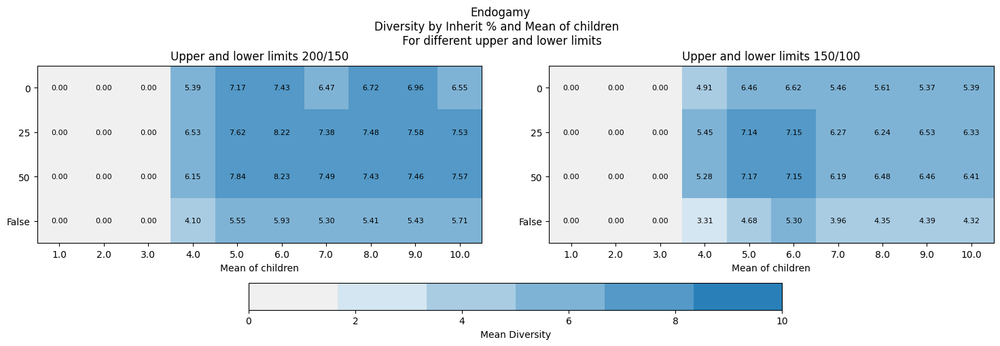

In [5]:
visualize_diversity(EcM_datos, inherits, Ecalphas, 'Endogamy', up_low_limits, variable='Mean of children', vis_type='heatmap')

C:\Users\jsolm\Juancho\Juancho\Maestrías\Modelage en Sistemas Complejos\Tesis\Projecto\Modelo\modelo_mio\Agrobiodiversity-model\venv\lib\site-packages\numpy\_core\fromnumeric.py:3596: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\jsolm\Juancho\Juancho\Maestrías\Modelage en Sistemas Complejos\Tesis\Projecto\Modelo\modelo_mio\Agrobiodiversity-model\venv\lib\site-packages\numpy\_core\_methods.py:138: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\jsolm\Juancho\Juancho\Maestrías\Modelage en Sistemas Complejos\Tesis\Projecto\Modelo\modelo_mio\Agrobiodiversity-model\venv\lib\site-packages\numpy\_core\_methods.py:218: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\jsolm\Juancho\Juancho\Maestrías\Modelage en Sistemas Complejos\Tesis\Projecto\Modelo\modelo_mio\Agrobiodiversity-model\venv\lib\site-packages\numpy\_core

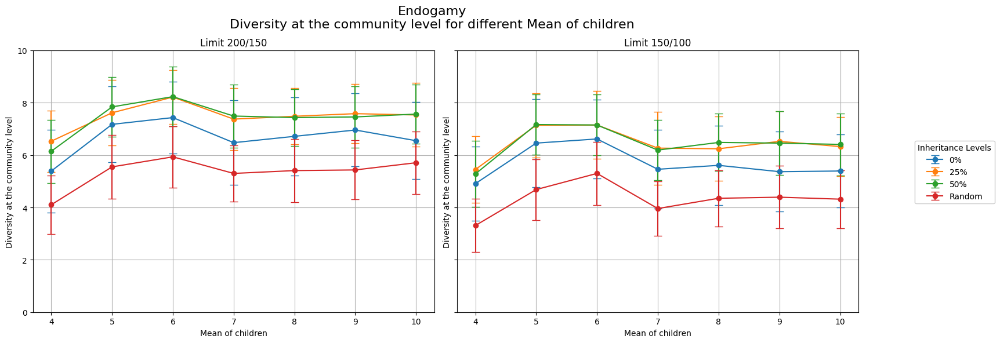

In [38]:
visualize_diversity(EcM_datos, inherits, Ecalphas, 'Endogamy', up_low_limits, variable='Mean of children', vis_type='transversal')

### Data and visualizations: population

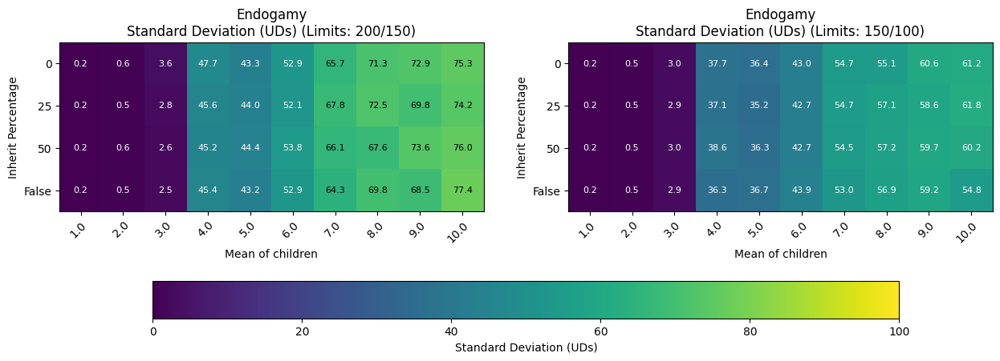

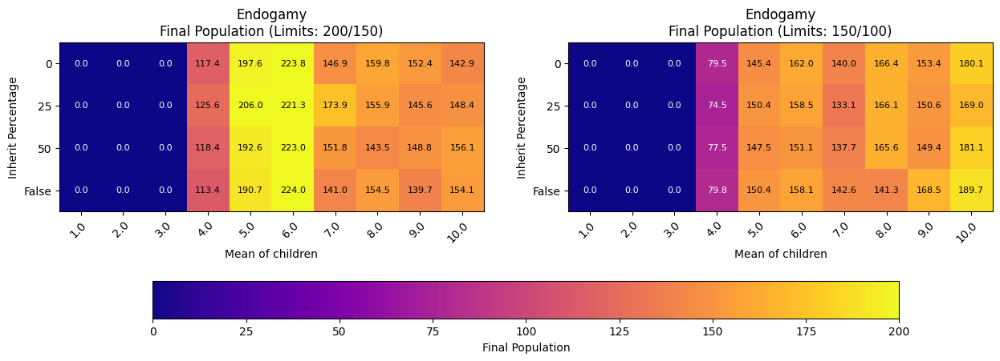

In [21]:
visualize_heatmap(EcM_datos, inherits, Ecalphas, 'Endogamy', variable='Mean of children', up_low_limits=up_low_limits, heatmap_type='std')
visualize_heatmap(EcM_datos, inherits, Ecalphas, 'Endogamy', variable='Mean of children', up_low_limits=up_low_limits, heatmap_type='alive')

## Mean varieties

In [9]:
# This experiment has different values for Initial varieties mv
prob_morte = 0.06 #beta
media = 4 # Mean
m = 40
mv = 10
inherits = [0,25,50, 'False']
# inherits = [0,25,50] #Values for inherit
# inherits = [0, 'False'] #Values for inherit
Emvalphas = np.linspace(1,mv,mv)# Mean varieties from 1 to mv
up_low_limits = [[200, 150], [150, 100]]
# For data of behaviour
vM = np.empty((len(inherits), len(Emvalphas), len(up_low_limits)), dtype=object) # alive, mean and diversity levels

punto_vista = 50
tiempo = 1000
tempo = list(range(0,tiempo+1,punto_vista))
experiments = 100


print(vM.shape)
start = time.time()
print(f"started at:  {datetime.now()}")
for i, inherit in enumerate(inherits):
    for j, mvarieties  in enumerate(Emvalphas):
        for k, (upper_limit, lower_limit) in enumerate(up_low_limits):
            star_configuration = time.time()
            #For population dynamics
            list_alive_UDs = []
            list_vivas_puntos_vista = []
            tasas_crecimiento = []
            #For diversity dynamics
            data_step_mean_var_ud = []
            data_step_var_system = []
            data_step_unique_system = []
            print(f"Experiments with inheritance {inherit} Initial UDs {m} and Mean varieties {mvarieties}")
            #Lists to store experiments' diversity data
            data_endo_mean_ud = []
            data_endo_com_level = []
            data_endo_total_varieties = []
            original_media = media
            #To see how frequent goes to extintion
            contador = 0
            for experiment in range(1, experiments+1):
                print(f'experimento {experiment}')
                if inherit != 'False':

                    #### Initialization
                    UD_endogamy.uds = {}
                    instancias_ud = []
                    for id_ud in range(1, int(m) + 1):
                        instancias_ud.append(UD_endogamy(id_ud, media))
                    ## Varieties
                    limited_varieties = True
                    if limited_varieties == False:
                        for id_ud, ud in UD_endogamy.uds.items():
                            for _ in range(3):
                                ud.varieties.append(Variety())
                    else:
                        initial_varieties = [Variety() for _ in range (int(10))]
                        for ud in UD_endogamy.uds.values():
                            for _ in range(int(mvarieties)):
                                ud.varieties.append(random.choice(initial_varieties))   
                    # Lists for graphs
                    vivas_puntos_vista = [int(m)]
                    vivas_tasa_crecimiento = [int(m)]
            #             mortas_puntos_vista = [0]
                    #For diversity
                    mean_var_ud = []
                    var_system = []
                    unique_system = []
                    var_ud = []
                    var_total = []
                    for ud in [ud for ud in UD_endogamy.uds.values() if ud.activa ==True]:
                        var_ud.append(len(ud.varieties))
                        for variety in ud.varieties:
                            var_total.append(variety.variety_id)
                    mean_var_ud.append(np.mean(var_ud))
                    var_system.append(len(var_total))
                    unique_system.append(len(set(var_total)))
                    # Simulation
                    for t in range(1, tiempo):
                        uds_copy = {id_ud: ud for id_ud, ud in UD_endogamy.uds.items() if ud.activa}
                        items = list(uds_copy.items())
                        random.shuffle(items)
                        uds_copy = dict(items)
                        alive = len(uds_copy)
                        if alive > upper_limit and (media == original_media):
                            media -= media//2
                            if media >= 4:
                                media = media //2
                        elif alive < lower_limit and media < original_media:
                            media = original_media
                        if not uds_copy: #Extintion
                            # Only 0
                            print(f"acabó en 0 el experimento {experiment} con herencia {inherits[i]} con unidades {Emvalphas[j]}")
                            vivas_puntos_vista.extend([0] * (int((tiempo/punto_vista)-(len(vivas_puntos_vista)))))
                            vivas_tasa_crecimiento.extend([0] * (int((tiempo)-(len(vivas_tasa_crecimiento)))))
                            contador += 1
                            break         
                        # Cycle:
                        for id_ud, ud in uds_copy.items():
                            ud.ter_filho()
                            ud.buscar_ud(uds_copy, int(media), inherit)
                            ud.incrementar_idade()
                            ud.death_probability(prob_morte)
                        # Collecting data
                        vivas_tasa_crecimiento.append(len([ud for id, ud in uds_copy.items() if ud.activa]))
                        if t % punto_vista == 0:
                            viv = len([ud for id, ud in uds_copy.items() if ud.activa])
                            #mort = len([ud for id, ud in uds_copy.items() if not ud.activa])
                            vivas_puntos_vista.append(viv)
                            # For diversity
                            var_ud = []
                            var_total = []
                            for ud in [ud for ud in UD_endogamy.uds.values() if ud.activa ==True]:
                                var_ud.append(len(ud.varieties))
                                for variety in ud.varieties:
                                    var_total.append(variety.variety_id)
                            mean_var_ud.append(np.mean(var_ud))
                            var_system.append(len(var_total))
                            unique_system.append(len(set(var_total))) 
                    viv = len([ud for id, ud in UD_endogamy.uds.items() if ud.activa])
                    vivas_puntos_vista.append(viv)
                    # For diversity
                    var_ud = []
                    var_total = []
                    for ud in [ud for ud in UD_endogamy.uds.values() if ud.activa ==True]:
                        var_ud.append(len(ud.varieties))
                        for variety in ud.varieties:
                            var_total.append(variety.variety_id)
                    mean_var_ud.append(np.mean(var_ud))
                    var_system.append(len(var_total))
                    unique_system.append(len(set(var_total)))
                    alive = (len([ud for id, ud in uds_copy.items() if ud.activa]))
                    if alive >= 1:   
                        total_varieties = []
                        varieties_per_UD = []
                        for ud in [ud for ud in UD_endogamy.uds.values() if ud.activa ==True]:
                            varieties_per_UD.append(len(ud.varieties))
                            for variety in ud.varieties:
                                total_varieties.append(variety.variety_id)
                        data_endo_mean_ud.append(np.mean(varieties_per_UD))
                        data_endo_com_level.append(len(set(total_varieties)))
                        data_endo_total_varieties.append(total_varieties)

                else:# Now with inherit == False
                    #### Initialization
                    UD_endogamy_al_inh.uds = {}
                    instancias_ud = []
                    for id_ud in range(1, int(m) + 1):
                        instancias_ud.append(UD_endogamy_al_inh(id_ud, media))
                    ## Varieties
                    limited_varieties = True
                    if limited_varieties == False:
                        for id_ud, ud in UD_endogamy_al_inh.uds.items():
                            for _ in range(3):
                                ud.varieties.append(Variety())
                    else:
                        initial_varieties = [Variety() for _ in range (int(10))]
                        for ud in UD_endogamy_al_inh.uds.values():
                            for _ in range(int(mvarieties)):
                                ud.varieties.append(random.choice(initial_varieties))   
                    # Lists for graphs
                    vivas_puntos_vista = [int(m)]
                    vivas_tasa_crecimiento = [int(m)]
            #             mortas_puntos_vista = [0]
                    #For diversity
                    mean_var_ud = []
                    var_system = []
                    unique_system = []
                    var_ud = []
                    var_total = []
                    for ud in [ud for ud in UD_endogamy_al_inh.uds.values() if ud.activa ==True]:
                        var_ud.append(len(ud.varieties))
                        for variety in ud.varieties:
                            var_total.append(variety.variety_id)
                    mean_var_ud.append(np.mean(var_ud))
                    var_system.append(len(var_total))
                    unique_system.append(len(set(var_total)))
                    # Simulation
                    for t in range(1, tiempo):
                        uds_copy = {id_ud: ud for id_ud, ud in UD_endogamy_al_inh.uds.items() if ud.activa}
                        items = list(uds_copy.items())
                        random.shuffle(items)
                        uds_copy = dict(items)
                        alive = len(uds_copy)
                        if alive > upper_limit and (media == original_media):
                            media -= media//2
                            if media >= 4:
                                media = media //2
                        elif alive < lower_limit and media < original_media:
                            media = original_media
                        if not uds_copy: #Extintion
                            # Only 0
                            print(f"acabó en 0 el experimento {experiment} con herencia {inherits[i]} con unidades {Emvalphas[j]}")
                            vivas_puntos_vista.extend([0] * (int((tiempo/punto_vista)-(len(vivas_puntos_vista)))))
                            vivas_tasa_crecimiento.extend([0] * (int((tiempo)-(len(vivas_tasa_crecimiento)))))
                            contador += 1
                            break         
                        # Cycle:
                        varieties_list = [var for ud in uds_copy.values() for var in ud.varieties]
                        for id_ud, ud in uds_copy.items():
                            ud.ter_filho()
                            ud.buscar_ud(uds_copy, int(media), varieties_list, int(mvarieties))
                            ud.incrementar_idade()
                            ud.death_probability(prob_morte)
                        # Collecting data
                        vivas_tasa_crecimiento.append(len([ud for id, ud in uds_copy.items() if ud.activa]))
                        if t % punto_vista == 0:
                            viv = len([ud for id, ud in uds_copy.items() if ud.activa])
                            #mort = len([ud for id, ud in uds_copy.items() if not ud.activa])
                            vivas_puntos_vista.append(viv)
                            # For diversity
                            var_ud = []
                            var_total = []
                            for ud in [ud for ud in UD_endogamy_al_inh.uds.values() if ud.activa ==True]:
                                var_ud.append(len(ud.varieties))
                                for variety in ud.varieties:
                                    var_total.append(variety.variety_id)
                            mean_var_ud.append(np.mean(var_ud))
                            var_system.append(len(var_total))
                            unique_system.append(len(set(var_total))) 
                    viv = len([ud for id, ud in UD_endogamy_al_inh.uds.items() if ud.activa])
                    vivas_puntos_vista.append(viv)
                    # For diversity
                    var_ud = []
                    var_total = []
                    for ud in [ud for ud in UD_endogamy_al_inh.uds.values() if ud.activa ==True]:
                        var_ud.append(len(ud.varieties))
                        for variety in ud.varieties:
                            var_total.append(variety.variety_id)
                    mean_var_ud.append(np.mean(var_ud))
                    var_system.append(len(var_total))
                    unique_system.append(len(set(var_total)))
                    alive = (len([ud for id, ud in uds_copy.items() if ud.activa]))
                    if alive >= 1:   
                        total_varieties = []
                        varieties_per_UD = []
                        for ud in [ud for ud in UD_endogamy_al_inh.uds.values() if ud.activa ==True]:
                            varieties_per_UD.append(len(ud.varieties))
                            for variety in ud.varieties:
                                total_varieties.append(variety.variety_id)
                        data_endo_mean_ud.append(np.mean(varieties_per_UD))
                        data_endo_com_level.append(len(set(total_varieties)))
                        data_endo_total_varieties.append(total_varieties)


                #Final colect of the data after the simulation!
                indice_primer_cero = np.where(np.array(vivas_tasa_crecimiento) == 0)[0]            
                if len(indice_primer_cero) > 0:
                    # Get growth rate before the 0
                    tasas_crecimiento.append(np.diff(vivas_tasa_crecimiento[:indice_primer_cero[0] - 1]) / vivas_tasa_crecimiento[:-1][:indice_primer_cero[0] - 2] * 100)
                else:
                    # Growth rate
                    tasas_crecimiento.append(np.diff(vivas_tasa_crecimiento) / vivas_tasa_crecimiento[:-1] * 100)
                # Collect the data
                list_alive_UDs.append(len([ud for id, ud in uds_copy.items() if ud.activa == True])) #For heatmap
                list_vivas_puntos_vista.append(vivas_puntos_vista)
                if alive >= 1:
                    if len(mean_var_ud) == len(tempo):        
                        data_step_var_system.append(var_system)
                        data_step_unique_system.append(unique_system)
                        data_step_mean_var_ud.append(mean_var_ud)
            
                data_inherit_endo = [data_endo_mean_ud, data_endo_com_level, data_endo_total_varieties]
            data_steps_inherit_endo = [data_step_var_system, data_step_unique_system, data_step_mean_var_ud]
            media = original_media
            end_config = time.time()
            vM[i][j][k] = {'alive': np.mean(list_alive_UDs),
                        'std': np.std(list_alive_UDs),
                        'time used': end_config - star_configuration,
                        'porcentage_extintion': contador/experiments,
                        'tempo': tempo, 
                        'mean': np.mean(list_vivas_puntos_vista, axis=0), 
                        'std':  np.std(list_vivas_puntos_vista, axis=0),
                        'growth rate': np.mean([np.mean(lista) for lista in tasas_crecimiento]),
                        'diversity_info': data_inherit_endo,
                        'diversity_info_steps': data_steps_inherit_endo}
            print(f"""
    The total time of the configuration of inherit percentage {inherit}, 
      initial UDs {m} and Mean varieties {mvarieties} is  {end_config - star_configuration}
            """)
# Folder
folder_name = 'Experiments_kinship_inheritance_parameters_limits'
if not os.path.exists(folder_name):
    os.makedirs(folder_name)
# Heatmap and std
heat_std = os.path.join(folder_name, 'Endo_Initial_Mean_varieties.npy')
np.save(heat_std, vM)
now = datetime.now()
finish = time.time()
print(f"""
It finished at: {now}
It lasted {finish-start}
""")
print("done")

(4, 10, 2)
started at:  2024-11-08 04:41:14.560352
Experiments with inheritance 0 Initial UDs 40 and Mean varieties 1.0
experimento 1
experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
experimento 38
experimento 39
experimento 40
experimento 41
experimento 42
experimento 43
experimento 44
experimento 45
experimento 46
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
expe

C:\Users\jsolm\Juancho\Juancho\Maestrías\Modelage en Sistemas Complejos\Tesis\Projecto\Modelo\modelo_mio\Agrobiodiversity-model\venv\lib\site-packages\numpy\_core\fromnumeric.py:3596: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\jsolm\Juancho\Juancho\Maestrías\Modelage en Sistemas Complejos\Tesis\Projecto\Modelo\modelo_mio\Agrobiodiversity-model\venv\lib\site-packages\numpy\_core\_methods.py:138: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


experimento 66
experimento 67
experimento 68
experimento 69
experimento 70
experimento 71
experimento 72
experimento 73
experimento 74
experimento 75
experimento 76
experimento 77
experimento 78
experimento 79
experimento 80
experimento 81
experimento 82
experimento 83
experimento 84
experimento 85
experimento 86
experimento 87
experimento 88
experimento 89
experimento 90
experimento 91
experimento 92
experimento 93
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100

    The total time of the configuration of inherit percentage 0, 
      initial UDs 40 and Mean varieties 1.0 is  467.37903213500977
            
Experiments with inheritance 0 Initial UDs 40 and Mean varieties 1.0
experimento 1
experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 

experimento 72
experimento 73
experimento 74
experimento 75
experimento 76
experimento 77
experimento 78
experimento 79
experimento 80
experimento 81
experimento 82
experimento 83
acabó en 0 el experimento 83 con herencia 0 con unidades 3.0
experimento 84
experimento 85
experimento 86
experimento 87
experimento 88
experimento 89
experimento 90
experimento 91
experimento 92
experimento 93
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100

    The total time of the configuration of inherit percentage 0, 
      initial UDs 40 and Mean varieties 3.0 is  464.63862586021423
            
Experiments with inheritance 0 Initial UDs 40 and Mean varieties 3.0
experimento 1
experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
acabó en 0 

experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100

    The total time of the configuration of inherit percentage 0, 
      initial UDs 40 and Mean varieties 5.0 is  465.5894033908844
            
Experiments with inheritance 0 Initial UDs 40 and Mean varieties 5.0
experimento 1
experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
acabó en 0 el experimento 18 con herencia 0 con unidades 5.0
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
experimento 38
experimento 39
experimento 40
experimento 41
experimento 

experimento 2
experimento 3
acabó en 0 el experimento 3 con herencia 0 con unidades 7.0
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
acabó en 0 el experimento 10 con herencia 0 con unidades 7.0
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
acabó en 0 el experimento 16 con herencia 0 con unidades 7.0
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
acabó en 0 el experimento 28 con herencia 0 con unidades 7.0
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
experimento 38
acabó en 0 el experimento 38 con herencia 0 con unidades 7.0
experimento 39
experimento 40
experimento 41
experimento 42
experimento 43
experimento 44
experimento 45
experimento 46
experimento 47
experimento 48

experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
acabó en 0 el experimento 37 con herencia 0 con unidades 9.0
experimento 38
experimento 39
experimento 40
experimento 41
experimento 42
experimento 43
experimento 44
experimento 45
experimento 46
acabó en 0 el experimento 46 con herencia 0 con unidades 9.0
experimento 47
experimento 48
acabó en 0 el experimento 48 con herencia 0 con unidades 9.0
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
experimento 56


experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
acabó en 0 el experimento 18 con herencia 25 con unidades 1.0
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
acabó en 0 el experimento 23 con herencia 25 con unidades 1.0
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
experimento 38
experimento 39
experimento 40
experimento 41
experimento 42
experimento 43
experimento 44
acabó en 0 el experimento 44 con herencia 25 con unidades 1.0
experimento 45
experimento 46
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
acabó en 0 el experimento 53 con herencia 25 con unidade

experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
acabó en 0 el experimento 17 con herencia 25 con unidades 3.0
experimento 18
experimento 19
acabó en 0 el experimento 19 con herencia 25 con unidades 3.0
experimento 20
experimento 21
acabó en 0 el experimento 21 con herencia 25 con unidades 3.0
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
acabó en 0 el experimento 33 con herencia 25 con unidades 3.0
experimento 34
experimento 35
experimento 36
experimento 37
experimento 38
experimento 39
experimento 40
experimento 41
acabó en 0 el experimento 41 con herencia 25 con unidades 3.0
experimento 42
experimento 43
experimento 44
experimento 45
experimento 46
acabó en 0 el experimen

experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
acabó en 0 el experimento 11 con herencia 25 con unidades 5.0
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
acabó en 0 el experimento 37 con herencia 25 con unidades 5.0
experimento 38
experimento 39
experimento 40
acabó en 0 el experimento 40 con herencia 25 con unidades 5.0
experimento 41
experimento 42
experimento 43
experimento 44
experimento 45
experimento 46
experimento 47
experimento 48
experimento 49
experimento 50
acabó en 0 el experimento 50 con herencia 25 con unidades 5.0
experimento 51
experiment

experimento 79
experimento 80
experimento 81
experimento 82
experimento 83
experimento 84
experimento 85
experimento 86
experimento 87
experimento 88
experimento 89
experimento 90
experimento 91
experimento 92
experimento 93
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
acabó en 0 el experimento 98 con herencia 25 con unidades 7.0
experimento 99
experimento 100

    The total time of the configuration of inherit percentage 25, 
      initial UDs 40 and Mean varieties 7.0 is  543.1601502895355
            
Experiments with inheritance 25 Initial UDs 40 and Mean varieties 7.0
experimento 1
experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimen

experimento 100

    The total time of the configuration of inherit percentage 25, 
      initial UDs 40 and Mean varieties 9.0 is  513.7142522335052
            
Experiments with inheritance 25 Initial UDs 40 and Mean varieties 9.0
experimento 1
experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
acabó en 0 el experimento 24 con herencia 25 con unidades 9.0
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
experimento 34
experimento 35
acabó en 0 el experimento 35 con herencia 25 con unidades 9.0
experimento 36
experimento 37
experimento 38
experimento 39
acabó en 0 el experimento 39 con herencia 25 con unidades 9.0
exper

experimento 2
acabó en 0 el experimento 2 con herencia 50 con unidades 1.0
experimento 3
acabó en 0 el experimento 3 con herencia 50 con unidades 1.0
experimento 4
experimento 5
experimento 6
experimento 7
acabó en 0 el experimento 7 con herencia 50 con unidades 1.0
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
acabó en 0 el experimento 12 con herencia 50 con unidades 1.0
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
experimento 38
experimento 39
experimento 40
experimento 41
experimento 42
experimento 43
experimento 44
experimento 45
experimento 46
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 5

experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
acabó en 0 el experimento 17 con herencia 50 con unidades 3.0
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
acabó en 0 el experimento 37 con herencia 50 con unidades 3.0
experimento 38
experimento 39
experimento 40
experimento 41
experimento 42
experimento 43
experimento 44
experimento 45
acabó en 0 el experimento 45 con herencia 50 con unidades 3.0
experimento 46
experimento 47
acabó en 0 el experimento 47 con herencia 50 con unidades 3.0
experimento 48
experimento 49
experimento 50
acabó en 0 el experimento

experimento 88
experimento 89
experimento 90
experimento 91
experimento 92
experimento 93
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100

    The total time of the configuration of inherit percentage 50, 
      initial UDs 40 and Mean varieties 5.0 is  487.3905816078186
            
Experiments with inheritance 50 Initial UDs 40 and Mean varieties 5.0
experimento 1
experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
experimento 38
acabó en 0 el experimento 

experimento 92
experimento 93
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100

    The total time of the configuration of inherit percentage 50, 
      initial UDs 40 and Mean varieties 7.0 is  475.9082398414612
            
Experiments with inheritance 50 Initial UDs 40 and Mean varieties 7.0
experimento 1
experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
acabó en 0 el experimento 12 con herencia 50 con unidades 7.0
experimento 13
experimento 14
acabó en 0 el experimento 14 con herencia 50 con unidades 7.0
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
acabó en 0 el experimento 23 con herencia 50 con unidades 7.0
experimento 24
experimento 25
experimento 26
experimento 27
acabó en 0 el experimento 27 con herencia 50 con unidades 7.0
exp

experimento 67
experimento 68
experimento 69
experimento 70
experimento 71
experimento 72
experimento 73
experimento 74
experimento 75
experimento 76
experimento 77
experimento 78
acabó en 0 el experimento 78 con herencia 50 con unidades 9.0
experimento 79
experimento 80
experimento 81
experimento 82
experimento 83
experimento 84
experimento 85
experimento 86
experimento 87
experimento 88
experimento 89
experimento 90
experimento 91
experimento 92
experimento 93
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100

    The total time of the configuration of inherit percentage 50, 
      initial UDs 40 and Mean varieties 9.0 is  479.9300682544708
            
Experiments with inheritance 50 Initial UDs 40 and Mean varieties 9.0
experimento 1
experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimen

experimento 44
experimento 45
experimento 46
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
acabó en 0 el experimento 58 con herencia False con unidades 1.0
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
experimento 67
experimento 68
experimento 69
experimento 70
experimento 71
experimento 72
experimento 73
experimento 74
experimento 75
experimento 76
experimento 77
experimento 78
experimento 79
experimento 80
experimento 81
experimento 82
experimento 83
experimento 84
experimento 85
experimento 86
experimento 87
experimento 88
experimento 89
experimento 90
experimento 91
experimento 92
experimento 93
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100

    The total time of the configuration of inherit percentage False, 
      in

experimento 42
experimento 43
experimento 44
experimento 45
experimento 46
acabó en 0 el experimento 46 con herencia False con unidades 3.0
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
experimento 67
experimento 68
experimento 69
experimento 70
experimento 71
experimento 72
experimento 73
experimento 74
acabó en 0 el experimento 74 con herencia False con unidades 3.0
experimento 75
experimento 76
acabó en 0 el experimento 76 con herencia False con unidades 3.0
experimento 77
experimento 78
experimento 79
experimento 80
experimento 81
experimento 82
experimento 83
experimento 84
experimento 85
experimento 86
experimento 87
experimento 88
experimento 89
experimento 90
experimento 91
experimento 92
experimento 93
experimento 94
experiment

experimento 45
experimento 46
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
experimento 67
experimento 68
experimento 69
experimento 70
experimento 71
experimento 72
experimento 73
experimento 74
experimento 75
experimento 76
experimento 77
experimento 78
experimento 79
experimento 80
experimento 81
experimento 82
experimento 83
experimento 84
experimento 85
experimento 86
experimento 87
experimento 88
experimento 89
experimento 90
experimento 91
experimento 92
experimento 93
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100

    The total time of the configuration of inherit percentage False, 
      initial UDs 40 and Mean varieties 5.0 is  487.0568335056305
            
Experimen

experimento 69
experimento 70
experimento 71
experimento 72
experimento 73
experimento 74
experimento 75
experimento 76
experimento 77
experimento 78
experimento 79
experimento 80
experimento 81
experimento 82
experimento 83
experimento 84
experimento 85
experimento 86
experimento 87
experimento 88
experimento 89
experimento 90
experimento 91
experimento 92
experimento 93
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100

    The total time of the configuration of inherit percentage False, 
      initial UDs 40 and Mean varieties 7.0 is  502.59389448165894
            
Experiments with inheritance False Initial UDs 40 and Mean varieties 7.0
experimento 1
experimento 2
experimento 3
experimento 4
acabó en 0 el experimento 4 con herencia False con unidades 7.0
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
acabó en 0 el experimento 12 con herencia False con unidades

experimento 76
experimento 77
experimento 78
experimento 79
experimento 80
acabó en 0 el experimento 80 con herencia False con unidades 9.0
experimento 81
experimento 82
experimento 83
experimento 84
experimento 85
experimento 86
experimento 87
experimento 88
experimento 89
experimento 90
experimento 91
experimento 92
experimento 93
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100

    The total time of the configuration of inherit percentage False, 
      initial UDs 40 and Mean varieties 9.0 is  493.7572989463806
            
Experiments with inheritance False Initial UDs 40 and Mean varieties 9.0
experimento 1
experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
acabó en 0 el experimento 7 con herencia False con unidades 9.0
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento

In [34]:
# Dowload the documents
#As a reference
mv = 10 # Mean
inherits = [0,25,50, 'False']
Emvalphas = np.linspace(1,mv,mv) # Mean of children from 1 to n
up_low_limits = [[200, 150], [150, 100]]
punto_vista = 50
tiempo = 1000
tempo = list(range(0,tiempo+1,punto_vista))

#Folders
folder_name = 'Experiments_kinship_inheritance_parameters_limits'
heat_std = os.path.join(folder_name, 'Endo_Initial_Mean_varieties.npy')

## General Data
EmvM_datos = np.load(heat_std, allow_pickle=True)

### Diversity dynamics

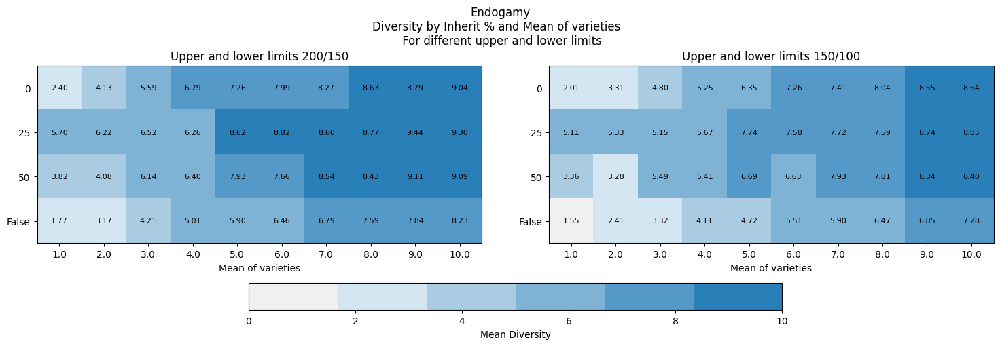

In [41]:
visualize_diversity(EmvM_datos, inherits, Emvalphas, 'Endogamy', up_low_limits, variable='Mean of varieties', vis_type='heatmap')

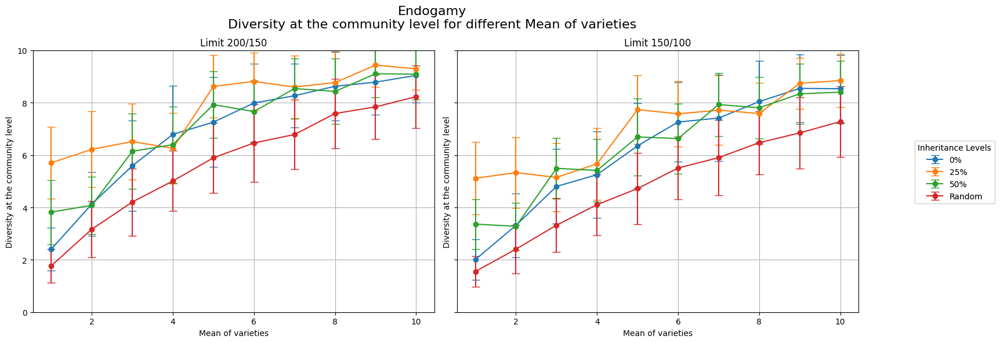

In [35]:
visualize_diversity(EmvM_datos, inherits, Emvalphas, 'Endogamy', up_low_limits, variable='Mean of varieties', vis_type='transversal')

### Population dynamics

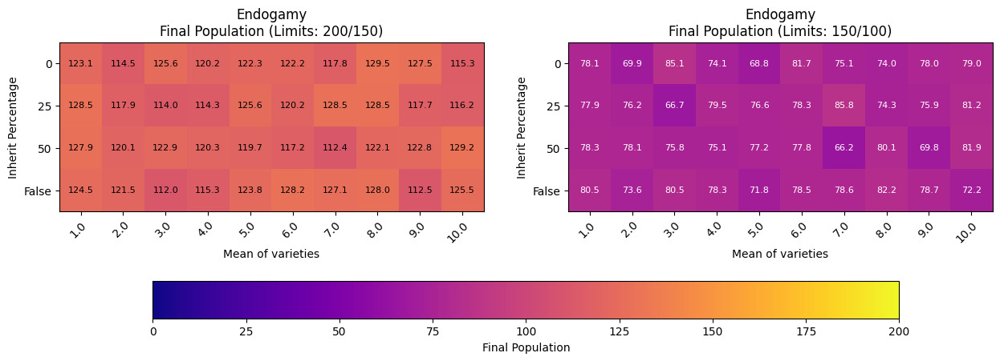

In [43]:
visualize_heatmap(EmvM_datos, inherits, Emvalphas, 'Endogamy', variable='Mean of varieties', up_low_limits=up_low_limits, heatmap_type='alive')

# Dual Organization

## Initial UDs

Here we experimento with Initial UDs. We try from 10 to 100

In [21]:
# This experiment has different values for Initial UDs
prob_morte = 0.06 #beta
media = 4 # Mean
m = 100 # Initial UDs
inherits = [0,25,50, 'False']
# inherits = [0,25,50] #Values for inherit
# inherits = [0, 'False'] #Values for inherit
Dmalphas = np.linspace(10,m,int(m/10)) # Initial UDs: from 10 to m
up_low_limits = [[200, 150], [150, 100]]
# For data of behaviour
mM = np.empty((len(inherits), len(Dmalphas), len(up_low_limits)), dtype=object) # alive, mean and diversity levels

punto_vista = 50
tiempo = 1000
tempo = list(range(0,tiempo+1,punto_vista))
experiments = 130


print(mM.shape)
start = time.time()
print(f"started at:  {datetime.now()}")
for i, inherit in enumerate(inherits):
    for j, iniciais  in enumerate(Dmalphas):
        for k, (upper_limit, lower_limit) in enumerate(up_low_limits):
            star_configuration = time.time()
            #For population dynamics
            list_alive_UDs = []
            list_vivas_puntos_vista = []
            tasas_crecimiento = []
            #For diversity dynamics
            data_step_mean_var_ud = []
            data_step_var_system = []
            data_step_unique_system = []
            print(f"Experiments with inheritance {inherit} and Initial UDs {iniciais}")
            #Lists to store experiments' diversity data
            data_endo_mean_ud = []
            data_endo_com_level = []
            data_endo_total_varieties = []
            original_media = media
            #To see how frequent goes to extintion
            contador = 0
            for experiment in range(1, experiments+1):
                print(f'experimento {experiment}')
                ## Clans
                clans = (list(range(1, 2 + 1)) * (int(iniciais) // 2)) # Just 2 clans
                random.shuffle(clans)
                if inherit != 'False':          
                    #### Initialization
                    UD_dual_organization.uds = {}
                    instancias_ud = []
                    for id_ud in range(1, int(iniciais) + 1):
                        instancias_ud.append(UD_dual_organization(id_ud, media,clans.pop()))
                    ## Varieties
                    limited_varieties = True
                    if limited_varieties == False:
                        for id_ud, ud in UD_dual_organization.uds.items():
                            for _ in range(3):
                                ud.varieties.append(Variety())
                    else:
                        initial_varieties = [Variety() for _ in range (10)]
                        for ud in UD_dual_organization.uds.values():
                            for _ in range(3):
                                ud.varieties.append(random.choice(initial_varieties))   
                    # Lists for graphs
                    vivas_puntos_vista = [int(iniciais)]
                    vivas_tasa_crecimiento = [int(iniciais)]
            #             mortas_puntos_vista = [0]
                    #For diversity
                    mean_var_ud = []
                    var_system = []
                    unique_system = []
                    var_ud = []
                    var_total = []
                    for ud in [ud for ud in UD_dual_organization.uds.values() if ud.activa ==True]:
                        var_ud.append(len(ud.varieties))
                        for variety in ud.varieties:
                            var_total.append(variety.variety_id)
                    mean_var_ud.append(np.mean(var_ud))
                    var_system.append(len(var_total))
                    unique_system.append(len(set(var_total)))
                    # Simulation
                    for t in range(1, tiempo):
                        uds_copy = {id_ud: ud for id_ud, ud in UD_dual_organization.uds.items() if ud.activa}
                        items = list(uds_copy.items())
                        random.shuffle(items)
                        uds_copy = dict(items)
                        alive = len(uds_copy)
                        if alive > upper_limit and (media == original_media):
                            media -= media//2
                            if media >= 4:
                                media = media //2
                        elif alive < lower_limit and media < original_media:
                            media = original_media
                        if not uds_copy: #Extintion
                            # Only 0
                            print(f"acabó en 0 el experimento {experiment} con herencia {inherits[i]} con unidades {Dmalphas[j]}")
                            vivas_puntos_vista.extend([0] * (int((tiempo/punto_vista)-(len(vivas_puntos_vista)))))
                            vivas_tasa_crecimiento.extend([0] * (int((tiempo)-(len(vivas_tasa_crecimiento)))))
                            #mortas_puntos_vista.extend([unidades_iniciais] * (tiempo - t))
                            contador += 1
                            break         
                        # Cycle:
                        for id_ud, ud in uds_copy.items():
                            ud.ter_filho()
                            ud.buscar_ud(uds_copy, int(media), inherit, True, 0.2)
                            ud.incrementar_idade()
                            ud.death_probability(prob_morte)
                        # Collecting data
                        vivas_tasa_crecimiento.append(len([ud for id, ud in uds_copy.items() if ud.activa]))
                        if t % punto_vista == 0:
                            viv = len([ud for id, ud in uds_copy.items() if ud.activa])
                            #mort = len([ud for id, ud in uds_copy.items() if not ud.activa])
                            vivas_puntos_vista.append(viv)
                            # For diversity
                            var_ud = []
                            var_total = []
                            for ud in [ud for ud in UD_dual_organization.uds.values() if ud.activa ==True]:
                                var_ud.append(len(ud.varieties))
                                for variety in ud.varieties:
                                    var_total.append(variety.variety_id)
                            mean_var_ud.append(np.mean(var_ud))
                            var_system.append(len(var_total))
                            unique_system.append(len(set(var_total))) 
                    viv = len([ud for id, ud in UD_dual_organization.uds.items() if ud.activa])
                    vivas_puntos_vista.append(viv)
                    # For diversity
                    var_ud = []
                    var_total = []
                    for ud in [ud for ud in UD_dual_organization.uds.values() if ud.activa ==True]:
                        var_ud.append(len(ud.varieties))
                        for variety in ud.varieties:
                            var_total.append(variety.variety_id)
                    mean_var_ud.append(np.mean(var_ud))
                    var_system.append(len(var_total))
                    unique_system.append(len(set(var_total)))
                    alive = (len([ud for id, ud in uds_copy.items() if ud.activa]))
                    if alive >= 1:   
                        total_varieties = []
                        varieties_per_UD = []
                        for ud in [ud for ud in UD_dual_organization.uds.values() if ud.activa ==True]:
                            varieties_per_UD.append(len(ud.varieties))
                            for variety in ud.varieties:
                                total_varieties.append(variety.variety_id)
                        data_endo_mean_ud.append(np.mean(varieties_per_UD))
                        data_endo_com_level.append(len(set(total_varieties)))
                        data_endo_total_varieties.append(total_varieties)

                else:# Now with inherit == False
                    #### Initialization
                    UD_dual_organization_al_inh.uds = {}
                    instancias_ud = []
                    for id_ud in range(1, int(iniciais) + 1):
                        instancias_ud.append(UD_dual_organization_al_inh(id_ud, media, clans.pop()))
                    ## Varieties
                    limited_varieties = True
                    if limited_varieties == False:
                        for id_ud, ud in UD_dual_organization_al_inh.uds.items():
                            for _ in range(3):
                                ud.varieties.append(Variety())
                    else:
                        initial_varieties = [Variety() for _ in range (10)]
                        for ud in UD_dual_organization_al_inh.uds.values():
                            for _ in range(3):
                                ud.varieties.append(random.choice(initial_varieties))   
                    # Lists for graphs
                    vivas_puntos_vista = [int(iniciais)]
                    vivas_tasa_crecimiento = [int(iniciais)]
            #             mortas_puntos_vista = [0]
                    #For diversity
                    mean_var_ud = []
                    var_system = []
                    unique_system = []
                    var_ud = []
                    var_total = []
                    for ud in [ud for ud in UD_dual_organization_al_inh.uds.values() if ud.activa ==True]:
                        var_ud.append(len(ud.varieties))
                        for variety in ud.varieties:
                            var_total.append(variety.variety_id)
                    mean_var_ud.append(np.mean(var_ud))
                    var_system.append(len(var_total))
                    unique_system.append(len(set(var_total)))
                    # Simulation
                    for t in range(1, tiempo):
                        uds_copy = {id_ud: ud for id_ud, ud in UD_dual_organization_al_inh.uds.items() if ud.activa}
                        items = list(uds_copy.items())
                        random.shuffle(items)
                        uds_copy = dict(items)
                        alive = len(uds_copy)
                        if alive > upper_limit and (media == original_media):
                            media -= media//2
                            if media >= 4:
                                media = media //2
                        elif alive < lower_limit and media < original_media:
                            media = original_media
                        if not uds_copy: #Extintion
                            # Only 0
                            print(f"acabó en 0 el experimento {experiment} con herencia {inherits[i]} con unidades {Dmalphas[j]}")
                            vivas_puntos_vista.extend([0] * (int((tiempo/punto_vista)-(len(vivas_puntos_vista)))))
                            vivas_tasa_crecimiento.extend([0] * (int((tiempo)-(len(vivas_tasa_crecimiento)))))
                            #mortas_puntos_vista.extend([unidades_iniciais] * (tiempo - t))
                            contador += 1
                            break         
                        # Cycle:
                        varieties_list = [var for ud in uds_copy.values() for var in ud.varieties]
                        for id_ud, ud in uds_copy.items():
                            ud.ter_filho()
                            ud.buscar_ud(uds_copy, int(media), varieties_list, True, 3, 0.2)
                            ud.incrementar_idade()
                            ud.death_probability(prob_morte)
                        # Collecting data
                        vivas_tasa_crecimiento.append(len([ud for id, ud in uds_copy.items() if ud.activa]))
                        if t % punto_vista == 0:
                            viv = len([ud for id, ud in uds_copy.items() if ud.activa])
                            #mort = len([ud for id, ud in uds_copy.items() if not ud.activa])
                            vivas_puntos_vista.append(viv)
                            # For diversity
                            var_ud = []
                            var_total = []
                            for ud in [ud for ud in UD_dual_organization_al_inh.uds.values() if ud.activa ==True]:
                                var_ud.append(len(ud.varieties))
                                for variety in ud.varieties:
                                    var_total.append(variety.variety_id)
                            mean_var_ud.append(np.mean(var_ud))
                            var_system.append(len(var_total))
                            unique_system.append(len(set(var_total))) 
                    viv = len([ud for id, ud in UD_dual_organization_al_inh.uds.items() if ud.activa])
                    vivas_puntos_vista.append(viv)
                    # For diversity
                    var_ud = []
                    var_total = []
                    for ud in [ud for ud in UD_dual_organization_al_inh.uds.values() if ud.activa ==True]:
                        var_ud.append(len(ud.varieties))
                        for variety in ud.varieties:
                            var_total.append(variety.variety_id)
                    mean_var_ud.append(np.mean(var_ud))
                    var_system.append(len(var_total))
                    unique_system.append(len(set(var_total)))
                    alive = (len([ud for id, ud in uds_copy.items() if ud.activa]))
                    if alive >= 1:   
                        total_varieties = []
                        varieties_per_UD = []
                        for ud in [ud for ud in UD_dual_organization_al_inh.uds.values() if ud.activa ==True]:
                            varieties_per_UD.append(len(ud.varieties))
                            for variety in ud.varieties:
                                total_varieties.append(variety.variety_id)
                        data_endo_mean_ud.append(np.mean(varieties_per_UD))
                        data_endo_com_level.append(len(set(total_varieties)))
                        data_endo_total_varieties.append(total_varieties)


                #Final colect of the data after the simulation!
                indice_primer_cero = np.where(np.array(vivas_tasa_crecimiento) == 0)[0]            
                if len(indice_primer_cero) > 0:
                    # Get growth rate before the 0
                    tasas_crecimiento.append(np.diff(vivas_tasa_crecimiento[:indice_primer_cero[0] - 1]) / vivas_tasa_crecimiento[:-1][:indice_primer_cero[0] - 2] * 100)
                else:
                    # Growth rate
                    tasas_crecimiento.append(np.diff(vivas_tasa_crecimiento) / vivas_tasa_crecimiento[:-1] * 100)
                # Collect the data
                list_alive_UDs.append(len([ud for id, ud in uds_copy.items() if ud.activa == True])) #For heatmap
                list_vivas_puntos_vista.append(vivas_puntos_vista)
                if alive >= 1:
                    if len(mean_var_ud) == len(tempo):        
                        data_step_var_system.append(var_system)
                        data_step_unique_system.append(unique_system)
                        data_step_mean_var_ud.append(mean_var_ud)

                data_inherit_endo = [data_endo_mean_ud, data_endo_com_level, data_endo_total_varieties]
            data_steps_inherit_endo = [data_step_var_system, data_step_unique_system, data_step_mean_var_ud]
            media = original_media
            end_config = time.time()
            mM[i][j][k] = {'alive': np.mean(list_alive_UDs),
                        'std': np.std(list_alive_UDs),
                        'time used': end_config - star_configuration,
                        'porcentage_extintion': contador/experiments,
                        'tempo': tempo, 
                        'mean': np.mean(list_vivas_puntos_vista, axis=0), 
                        'std':  np.std(list_vivas_puntos_vista, axis=0),
                        'growth rate': np.mean([np.mean(lista) for lista in tasas_crecimiento]),
                        'diversity_info': data_inherit_endo,
                        'diversity_info_steps': data_steps_inherit_endo}
            print(f"""
    The total time of the configuration of inherit percentage {inherit} and initial UDs {iniciais} is  {end_config - star_configuration}
            """)
# Folder
folder_name = 'Experiments_kinship_inheritance_parameters_limits'
if not os.path.exists(folder_name):
    os.makedirs(folder_name)
# Data
heat_std = os.path.join(folder_name, 'Dual_Initial_UDs.npy')
np.save(heat_std, mM)
now = datetime.now()
finish = time.time()
print(f"""
It finished at: {now}
It lasted {finish-start}
""")
print("done")

(4, 10, 2)
started at:  2024-11-09 12:57:32.003846
Experiments with inheritance 0 and Initial UDs 10.0
experimento 1
acabó en 0 el experimento 1 con herencia 0 con unidades 10.0
experimento 2
acabó en 0 el experimento 2 con herencia 0 con unidades 10.0
experimento 3
acabó en 0 el experimento 3 con herencia 0 con unidades 10.0
experimento 4
acabó en 0 el experimento 4 con herencia 0 con unidades 10.0
experimento 5
acabó en 0 el experimento 5 con herencia 0 con unidades 10.0
experimento 6
acabó en 0 el experimento 6 con herencia 0 con unidades 10.0
experimento 7
acabó en 0 el experimento 7 con herencia 0 con unidades 10.0


C:\Users\jsolm\Juancho\Juancho\Maestrías\Modelage en Sistemas Complejos\Tesis\Projecto\Modelo\modelo_mio\Agrobiodiversity-model\venv\lib\site-packages\numpy\_core\fromnumeric.py:3596: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\jsolm\Juancho\Juancho\Maestrías\Modelage en Sistemas Complejos\Tesis\Projecto\Modelo\modelo_mio\Agrobiodiversity-model\venv\lib\site-packages\numpy\_core\_methods.py:138: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


experimento 8
acabó en 0 el experimento 8 con herencia 0 con unidades 10.0
experimento 9
acabó en 0 el experimento 9 con herencia 0 con unidades 10.0
experimento 10
acabó en 0 el experimento 10 con herencia 0 con unidades 10.0
experimento 11
acabó en 0 el experimento 11 con herencia 0 con unidades 10.0
experimento 12
acabó en 0 el experimento 12 con herencia 0 con unidades 10.0
experimento 13
acabó en 0 el experimento 13 con herencia 0 con unidades 10.0
experimento 14
acabó en 0 el experimento 14 con herencia 0 con unidades 10.0
experimento 15
acabó en 0 el experimento 15 con herencia 0 con unidades 10.0
experimento 16
acabó en 0 el experimento 16 con herencia 0 con unidades 10.0
experimento 17
acabó en 0 el experimento 17 con herencia 0 con unidades 10.0
experimento 18
acabó en 0 el experimento 18 con herencia 0 con unidades 10.0
experimento 19
acabó en 0 el experimento 19 con herencia 0 con unidades 10.0
experimento 20
acabó en 0 el experimento 20 con herencia 0 con unidades 10.0
exp

acabó en 0 el experimento 119 con herencia 0 con unidades 10.0
experimento 120
acabó en 0 el experimento 120 con herencia 0 con unidades 10.0
experimento 121
acabó en 0 el experimento 121 con herencia 0 con unidades 10.0
experimento 122
acabó en 0 el experimento 122 con herencia 0 con unidades 10.0
experimento 123
acabó en 0 el experimento 123 con herencia 0 con unidades 10.0
experimento 124
acabó en 0 el experimento 124 con herencia 0 con unidades 10.0
experimento 125
acabó en 0 el experimento 125 con herencia 0 con unidades 10.0
experimento 126
acabó en 0 el experimento 126 con herencia 0 con unidades 10.0
experimento 127
acabó en 0 el experimento 127 con herencia 0 con unidades 10.0
experimento 128
acabó en 0 el experimento 128 con herencia 0 con unidades 10.0
experimento 129
acabó en 0 el experimento 129 con herencia 0 con unidades 10.0
experimento 130
acabó en 0 el experimento 130 con herencia 0 con unidades 10.0

    The total time of the configuration of inherit percentage 0 and

acabó en 0 el experimento 100 con herencia 0 con unidades 10.0
experimento 101
acabó en 0 el experimento 101 con herencia 0 con unidades 10.0
experimento 102
acabó en 0 el experimento 102 con herencia 0 con unidades 10.0
experimento 103
acabó en 0 el experimento 103 con herencia 0 con unidades 10.0
experimento 104
acabó en 0 el experimento 104 con herencia 0 con unidades 10.0
experimento 105
acabó en 0 el experimento 105 con herencia 0 con unidades 10.0
experimento 106
acabó en 0 el experimento 106 con herencia 0 con unidades 10.0
experimento 107
acabó en 0 el experimento 107 con herencia 0 con unidades 10.0
experimento 108
acabó en 0 el experimento 108 con herencia 0 con unidades 10.0
experimento 109
acabó en 0 el experimento 109 con herencia 0 con unidades 10.0
experimento 110
acabó en 0 el experimento 110 con herencia 0 con unidades 10.0
experimento 111
acabó en 0 el experimento 111 con herencia 0 con unidades 10.0
experimento 112
acabó en 0 el experimento 112 con herencia 0 con uni

acabó en 0 el experimento 101 con herencia 0 con unidades 20.0
experimento 102
acabó en 0 el experimento 102 con herencia 0 con unidades 20.0
experimento 103
acabó en 0 el experimento 103 con herencia 0 con unidades 20.0
experimento 104
experimento 105
acabó en 0 el experimento 105 con herencia 0 con unidades 20.0
experimento 106
acabó en 0 el experimento 106 con herencia 0 con unidades 20.0
experimento 107
acabó en 0 el experimento 107 con herencia 0 con unidades 20.0
experimento 108
acabó en 0 el experimento 108 con herencia 0 con unidades 20.0
experimento 109
experimento 110
acabó en 0 el experimento 110 con herencia 0 con unidades 20.0
experimento 111
acabó en 0 el experimento 111 con herencia 0 con unidades 20.0
experimento 112
experimento 113
experimento 114
acabó en 0 el experimento 114 con herencia 0 con unidades 20.0
experimento 115
experimento 116
experimento 117
acabó en 0 el experimento 117 con herencia 0 con unidades 20.0
experimento 118
experimento 119
acabó en 0 el exper

experimento 106
acabó en 0 el experimento 106 con herencia 0 con unidades 20.0
experimento 107
acabó en 0 el experimento 107 con herencia 0 con unidades 20.0
experimento 108
experimento 109
acabó en 0 el experimento 109 con herencia 0 con unidades 20.0
experimento 110
acabó en 0 el experimento 110 con herencia 0 con unidades 20.0
experimento 111
acabó en 0 el experimento 111 con herencia 0 con unidades 20.0
experimento 112
experimento 113
experimento 114
acabó en 0 el experimento 114 con herencia 0 con unidades 20.0
experimento 115
acabó en 0 el experimento 115 con herencia 0 con unidades 20.0
experimento 116
acabó en 0 el experimento 116 con herencia 0 con unidades 20.0
experimento 117
experimento 118
acabó en 0 el experimento 118 con herencia 0 con unidades 20.0
experimento 119
experimento 120
experimento 121
acabó en 0 el experimento 121 con herencia 0 con unidades 20.0
experimento 122
experimento 123
acabó en 0 el experimento 123 con herencia 0 con unidades 20.0
experimento 124
aca

experimento 39
acabó en 0 el experimento 39 con herencia 0 con unidades 30.0
experimento 40
experimento 41
experimento 42
acabó en 0 el experimento 42 con herencia 0 con unidades 30.0
experimento 43
experimento 44
experimento 45
acabó en 0 el experimento 45 con herencia 0 con unidades 30.0
experimento 46
acabó en 0 el experimento 46 con herencia 0 con unidades 30.0
experimento 47
experimento 48
experimento 49
experimento 50
acabó en 0 el experimento 50 con herencia 0 con unidades 30.0
experimento 51
experimento 52
experimento 53
experimento 54
acabó en 0 el experimento 54 con herencia 0 con unidades 30.0
experimento 55
acabó en 0 el experimento 55 con herencia 0 con unidades 30.0
experimento 56
experimento 57
experimento 58
experimento 59
acabó en 0 el experimento 59 con herencia 0 con unidades 30.0
experimento 60
acabó en 0 el experimento 60 con herencia 0 con unidades 30.0
experimento 61
experimento 62
experimento 63
acabó en 0 el experimento 63 con herencia 0 con unidades 30.0
exper

experimento 19
experimento 20
experimento 21
acabó en 0 el experimento 21 con herencia 0 con unidades 40.0
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
acabó en 0 el experimento 28 con herencia 0 con unidades 40.0
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
experimento 34
acabó en 0 el experimento 34 con herencia 0 con unidades 40.0
experimento 35
experimento 36
experimento 37
acabó en 0 el experimento 37 con herencia 0 con unidades 40.0
experimento 38
experimento 39
acabó en 0 el experimento 39 con herencia 0 con unidades 40.0
experimento 40
experimento 41
acabó en 0 el experimento 41 con herencia 0 con unidades 40.0
experimento 42
experimento 43
acabó en 0 el experimento 43 con herencia 0 con unidades 40.0
experimento 44
experimento 45
experimento 46
experimento 47
experimento 48
acabó en 0 el experimento 48 con herencia 0 con unidades 40.0
experimento 49
experimento 50
acabó en 0 el experiment

experimento 89
experimento 90
experimento 91
experimento 92
experimento 93
experimento 94
experimento 95
acabó en 0 el experimento 95 con herencia 0 con unidades 50.0
experimento 96
experimento 97
experimento 98
experimento 99
acabó en 0 el experimento 99 con herencia 0 con unidades 50.0
experimento 100
experimento 101
experimento 102
experimento 103
experimento 104
experimento 105
experimento 106
experimento 107
experimento 108
experimento 109
acabó en 0 el experimento 109 con herencia 0 con unidades 50.0
experimento 110
experimento 111
experimento 112
experimento 113
acabó en 0 el experimento 113 con herencia 0 con unidades 50.0
experimento 114
experimento 115
experimento 116
experimento 117
experimento 118
acabó en 0 el experimento 118 con herencia 0 con unidades 50.0
experimento 119
experimento 120
experimento 121
experimento 122
experimento 123
experimento 124
acabó en 0 el experimento 124 con herencia 0 con unidades 50.0
experimento 125
experimento 126
experimento 127
acabó en 0 

experimento 32
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
experimento 38
experimento 39
experimento 40
experimento 41
experimento 42
experimento 43
experimento 44
experimento 45
experimento 46
experimento 47
experimento 48
experimento 49
experimento 50
acabó en 0 el experimento 50 con herencia 0 con unidades 70.0
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
experimento 67
experimento 68
experimento 69
experimento 70
experimento 71
experimento 72
experimento 73
experimento 74
experimento 75
acabó en 0 el experimento 75 con herencia 0 con unidades 70.0
experimento 76
experimento 77
experimento 78
experimento 79
experimento 80
experimento 81
experimento 82
experimento 83
experimento 84
experimento 85
experimento 86
experimento 87
experimento 88
experimento 89
experi

experimento 113
experimento 114
experimento 115
experimento 116
experimento 117
experimento 118
experimento 119
experimento 120
experimento 121
experimento 122
experimento 123
experimento 124
experimento 125
experimento 126
experimento 127
experimento 128
experimento 129
experimento 130

    The total time of the configuration of inherit percentage 0 and initial UDs 80.0 is  719.8842482566833
            
Experiments with inheritance 0 and Initial UDs 80.0
experimento 1
experimento 2
acabó en 0 el experimento 2 con herencia 0 con unidades 80.0
experimento 3
experimento 4
experimento 5
experimento 6
acabó en 0 el experimento 6 con herencia 0 con unidades 80.0
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
acabó en 0 el experimento 11 con herencia 0 con unidades 80.0
experimento 12
experimento 13
acabó en 0 el experimento 13 con herencia 0 con unidades 80.0
experimento 14
acabó en 0 el experimento 14 con herencia 0 con unidades 80.0
experimento 15
experimento 16


experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
experimento 67
experimento 68
experimento 69
acabó en 0 el experimento 69 con herencia 0 con unidades 90.0
experimento 70
experimento 71
experimento 72
experimento 73
experimento 74
experimento 75
acabó en 0 el experimento 75 con herencia 0 con unidades 90.0
experimento 76
acabó en 0 el experimento 76 con herencia 0 con unidades 90.0
experimento 77
experimento 78
acabó en 0 el experimento 78 con herencia 0 con unidades 90.0
experimento 79
acabó en 0 el experimento 79 con herencia 0 con unidades 90.0
experimento 80
experimento 81
experimento 82
experimento 83
experimento 84
experimento 85
experimento 86
experimento 87
experimento 88
experimento 89
acabó en 0 el experimento 89 con herencia 0 c

acabó en 0 el experimento 113 con herencia 0 con unidades 100.0
experimento 114
experimento 115
experimento 116
experimento 117
acabó en 0 el experimento 117 con herencia 0 con unidades 100.0
experimento 118
experimento 119
acabó en 0 el experimento 119 con herencia 0 con unidades 100.0
experimento 120
experimento 121
experimento 122
experimento 123
experimento 124
experimento 125
acabó en 0 el experimento 125 con herencia 0 con unidades 100.0
experimento 126
experimento 127
acabó en 0 el experimento 127 con herencia 0 con unidades 100.0
experimento 128
experimento 129
experimento 130
acabó en 0 el experimento 130 con herencia 0 con unidades 100.0

    The total time of the configuration of inherit percentage 0 and initial UDs 100.0 is  298.7901530265808
            
Experiments with inheritance 25 and Initial UDs 10.0
experimento 1
acabó en 0 el experimento 1 con herencia 25 con unidades 10.0
experimento 2
acabó en 0 el experimento 2 con herencia 25 con unidades 10.0
experimento 3
aca

acabó en 0 el experimento 108 con herencia 25 con unidades 10.0
experimento 109
acabó en 0 el experimento 109 con herencia 25 con unidades 10.0
experimento 110
acabó en 0 el experimento 110 con herencia 25 con unidades 10.0
experimento 111
acabó en 0 el experimento 111 con herencia 25 con unidades 10.0
experimento 112
acabó en 0 el experimento 112 con herencia 25 con unidades 10.0
experimento 113
experimento 114
acabó en 0 el experimento 114 con herencia 25 con unidades 10.0
experimento 115
acabó en 0 el experimento 115 con herencia 25 con unidades 10.0
experimento 116
acabó en 0 el experimento 116 con herencia 25 con unidades 10.0
experimento 117
acabó en 0 el experimento 117 con herencia 25 con unidades 10.0
experimento 118
acabó en 0 el experimento 118 con herencia 25 con unidades 10.0
experimento 119
acabó en 0 el experimento 119 con herencia 25 con unidades 10.0
experimento 120
acabó en 0 el experimento 120 con herencia 25 con unidades 10.0
experimento 121
acabó en 0 el experiment

experimento 87
acabó en 0 el experimento 87 con herencia 25 con unidades 10.0
experimento 88
acabó en 0 el experimento 88 con herencia 25 con unidades 10.0
experimento 89
acabó en 0 el experimento 89 con herencia 25 con unidades 10.0
experimento 90
acabó en 0 el experimento 90 con herencia 25 con unidades 10.0
experimento 91
acabó en 0 el experimento 91 con herencia 25 con unidades 10.0
experimento 92
acabó en 0 el experimento 92 con herencia 25 con unidades 10.0
experimento 93
acabó en 0 el experimento 93 con herencia 25 con unidades 10.0
experimento 94
acabó en 0 el experimento 94 con herencia 25 con unidades 10.0
experimento 95
acabó en 0 el experimento 95 con herencia 25 con unidades 10.0
experimento 96
acabó en 0 el experimento 96 con herencia 25 con unidades 10.0
experimento 97
acabó en 0 el experimento 97 con herencia 25 con unidades 10.0
experimento 98
acabó en 0 el experimento 98 con herencia 25 con unidades 10.0
experimento 99
acabó en 0 el experimento 99 con herencia 25 con 

experimento 77
acabó en 0 el experimento 77 con herencia 25 con unidades 20.0
experimento 78
acabó en 0 el experimento 78 con herencia 25 con unidades 20.0
experimento 79
experimento 80
acabó en 0 el experimento 80 con herencia 25 con unidades 20.0
experimento 81
experimento 82
acabó en 0 el experimento 82 con herencia 25 con unidades 20.0
experimento 83
acabó en 0 el experimento 83 con herencia 25 con unidades 20.0
experimento 84
acabó en 0 el experimento 84 con herencia 25 con unidades 20.0
experimento 85
experimento 86
acabó en 0 el experimento 86 con herencia 25 con unidades 20.0
experimento 87
acabó en 0 el experimento 87 con herencia 25 con unidades 20.0
experimento 88
acabó en 0 el experimento 88 con herencia 25 con unidades 20.0
experimento 89
acabó en 0 el experimento 89 con herencia 25 con unidades 20.0
experimento 90
acabó en 0 el experimento 90 con herencia 25 con unidades 20.0
experimento 91
acabó en 0 el experimento 91 con herencia 25 con unidades 20.0
experimento 92
expe

experimento 89
acabó en 0 el experimento 89 con herencia 25 con unidades 20.0
experimento 90
acabó en 0 el experimento 90 con herencia 25 con unidades 20.0
experimento 91
experimento 92
acabó en 0 el experimento 92 con herencia 25 con unidades 20.0
experimento 93
experimento 94
acabó en 0 el experimento 94 con herencia 25 con unidades 20.0
experimento 95
experimento 96
experimento 97
acabó en 0 el experimento 97 con herencia 25 con unidades 20.0
experimento 98
acabó en 0 el experimento 98 con herencia 25 con unidades 20.0
experimento 99
acabó en 0 el experimento 99 con herencia 25 con unidades 20.0
experimento 100
acabó en 0 el experimento 100 con herencia 25 con unidades 20.0
experimento 101
acabó en 0 el experimento 101 con herencia 25 con unidades 20.0
experimento 102
experimento 103
experimento 104
acabó en 0 el experimento 104 con herencia 25 con unidades 20.0
experimento 105
experimento 106
acabó en 0 el experimento 106 con herencia 25 con unidades 20.0
experimento 107
acabó en 0

experimento 23
experimento 24
experimento 25
acabó en 0 el experimento 25 con herencia 25 con unidades 30.0
experimento 26
experimento 27
experimento 28
acabó en 0 el experimento 28 con herencia 25 con unidades 30.0
experimento 29
acabó en 0 el experimento 29 con herencia 25 con unidades 30.0
experimento 30
experimento 31
experimento 32
experimento 33
acabó en 0 el experimento 33 con herencia 25 con unidades 30.0
experimento 34
experimento 35
experimento 36
experimento 37
acabó en 0 el experimento 37 con herencia 25 con unidades 30.0
experimento 38
acabó en 0 el experimento 38 con herencia 25 con unidades 30.0
experimento 39
experimento 40
acabó en 0 el experimento 40 con herencia 25 con unidades 30.0
experimento 41
acabó en 0 el experimento 41 con herencia 25 con unidades 30.0
experimento 42
acabó en 0 el experimento 42 con herencia 25 con unidades 30.0
experimento 43
acabó en 0 el experimento 43 con herencia 25 con unidades 30.0
experimento 44
experimento 45
experimento 46
experiment

experimento 9
experimento 10
acabó en 0 el experimento 10 con herencia 25 con unidades 40.0
experimento 11
acabó en 0 el experimento 11 con herencia 25 con unidades 40.0
experimento 12
experimento 13
experimento 14
experimento 15
acabó en 0 el experimento 15 con herencia 25 con unidades 40.0
experimento 16
experimento 17
experimento 18
acabó en 0 el experimento 18 con herencia 25 con unidades 40.0
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
acabó en 0 el experimento 25 con herencia 25 con unidades 40.0
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
acabó en 0 el experimento 32 con herencia 25 con unidades 40.0
experimento 33
experimento 34
acabó en 0 el experimento 34 con herencia 25 con unidades 40.0
experimento 35
experimento 36
experimento 37
experimento 38
experimento 39
acabó en 0 el experimento 39 con herencia 25 con unidades 40.0
experimento 40
experimento 41
ac

experimento 22
experimento 23
acabó en 0 el experimento 23 con herencia 25 con unidades 50.0
experimento 24
experimento 25
experimento 26
acabó en 0 el experimento 26 con herencia 25 con unidades 50.0
experimento 27
acabó en 0 el experimento 27 con herencia 25 con unidades 50.0
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
acabó en 0 el experimento 32 con herencia 25 con unidades 50.0
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
acabó en 0 el experimento 37 con herencia 25 con unidades 50.0
experimento 38
experimento 39
acabó en 0 el experimento 39 con herencia 25 con unidades 50.0
experimento 40
experimento 41
experimento 42
experimento 43
acabó en 0 el experimento 43 con herencia 25 con unidades 50.0
experimento 44
experimento 45
experimento 46
experimento 47
experimento 48
experimento 49
acabó en 0 el experimento 49 con herencia 25 con unidades 50.0
experimento 50
experimento 51
experimento 52
acabó en 0 el experimento 52 co

experimento 64
acabó en 0 el experimento 64 con herencia 25 con unidades 60.0
experimento 65
experimento 66
acabó en 0 el experimento 66 con herencia 25 con unidades 60.0
experimento 67
experimento 68
experimento 69
experimento 70
experimento 71
experimento 72
experimento 73
acabó en 0 el experimento 73 con herencia 25 con unidades 60.0
experimento 74
experimento 75
acabó en 0 el experimento 75 con herencia 25 con unidades 60.0
experimento 76
experimento 77
experimento 78
experimento 79
experimento 80
acabó en 0 el experimento 80 con herencia 25 con unidades 60.0
experimento 81
experimento 82
experimento 83
experimento 84
acabó en 0 el experimento 84 con herencia 25 con unidades 60.0
experimento 85
experimento 86
experimento 87
experimento 88
experimento 89
experimento 90
experimento 91
experimento 92
experimento 93
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100
experimento 101
experimento 102
acabó en 0 el experimento 102 con 

experimento 124
experimento 125
acabó en 0 el experimento 125 con herencia 25 con unidades 70.0
experimento 126
experimento 127
experimento 128
experimento 129
experimento 130

    The total time of the configuration of inherit percentage 25 and initial UDs 70.0 is  326.7927756309509
            
Experiments with inheritance 25 and Initial UDs 80.0
experimento 1
experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
acabó en 0 el experimento 18 con herencia 25 con unidades 80.0
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
experimento 38
experimento 39
experiment

experimento 95
experimento 96
acabó en 0 el experimento 96 con herencia 25 con unidades 90.0
experimento 97
experimento 98
experimento 99
experimento 100
experimento 101
experimento 102
experimento 103
experimento 104
experimento 105
experimento 106
experimento 107
experimento 108
experimento 109
experimento 110
experimento 111
experimento 112
experimento 113
experimento 114
experimento 115
experimento 116
experimento 117
experimento 118
experimento 119
experimento 120
experimento 121
experimento 122
experimento 123
experimento 124
experimento 125
experimento 126
experimento 127
experimento 128
experimento 129
experimento 130

    The total time of the configuration of inherit percentage 25 and initial UDs 90.0 is  648.1824843883514
            
Experiments with inheritance 25 and Initial UDs 90.0
experimento 1
experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
acabó en 0 el experimento 9 con herencia 25 con unidades 90.0
exp

experimento 48
acabó en 0 el experimento 48 con herencia 25 con unidades 100.0
experimento 49
experimento 50
acabó en 0 el experimento 50 con herencia 25 con unidades 100.0
experimento 51
experimento 52
experimento 53
acabó en 0 el experimento 53 con herencia 25 con unidades 100.0
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
acabó en 0 el experimento 58 con herencia 25 con unidades 100.0
experimento 59
experimento 60
experimento 61
acabó en 0 el experimento 61 con herencia 25 con unidades 100.0
experimento 62
acabó en 0 el experimento 62 con herencia 25 con unidades 100.0
experimento 63
acabó en 0 el experimento 63 con herencia 25 con unidades 100.0
experimento 64
experimento 65
experimento 66
experimento 67
experimento 68
acabó en 0 el experimento 68 con herencia 25 con unidades 100.0
experimento 69
experimento 70
experimento 71
acabó en 0 el experimento 71 con herencia 25 con unidades 100.0
experimento 72
experimento 73
experimento 74
acabó en 0 el exper

acabó en 0 el experimento 83 con herencia 50 con unidades 10.0
experimento 84
acabó en 0 el experimento 84 con herencia 50 con unidades 10.0
experimento 85
experimento 86
acabó en 0 el experimento 86 con herencia 50 con unidades 10.0
experimento 87
acabó en 0 el experimento 87 con herencia 50 con unidades 10.0
experimento 88
acabó en 0 el experimento 88 con herencia 50 con unidades 10.0
experimento 89
experimento 90
acabó en 0 el experimento 90 con herencia 50 con unidades 10.0
experimento 91
acabó en 0 el experimento 91 con herencia 50 con unidades 10.0
experimento 92
acabó en 0 el experimento 92 con herencia 50 con unidades 10.0
experimento 93
acabó en 0 el experimento 93 con herencia 50 con unidades 10.0
experimento 94
acabó en 0 el experimento 94 con herencia 50 con unidades 10.0
experimento 95
acabó en 0 el experimento 95 con herencia 50 con unidades 10.0
experimento 96
acabó en 0 el experimento 96 con herencia 50 con unidades 10.0
experimento 97
acabó en 0 el experimento 97 con h

experimento 61
acabó en 0 el experimento 61 con herencia 50 con unidades 10.0
experimento 62
acabó en 0 el experimento 62 con herencia 50 con unidades 10.0
experimento 63
acabó en 0 el experimento 63 con herencia 50 con unidades 10.0
experimento 64
acabó en 0 el experimento 64 con herencia 50 con unidades 10.0
experimento 65
acabó en 0 el experimento 65 con herencia 50 con unidades 10.0
experimento 66
acabó en 0 el experimento 66 con herencia 50 con unidades 10.0
experimento 67
acabó en 0 el experimento 67 con herencia 50 con unidades 10.0
experimento 68
acabó en 0 el experimento 68 con herencia 50 con unidades 10.0
experimento 69
acabó en 0 el experimento 69 con herencia 50 con unidades 10.0
experimento 70
acabó en 0 el experimento 70 con herencia 50 con unidades 10.0
experimento 71
acabó en 0 el experimento 71 con herencia 50 con unidades 10.0
experimento 72
acabó en 0 el experimento 72 con herencia 50 con unidades 10.0
experimento 73
acabó en 0 el experimento 73 con herencia 50 con 

acabó en 0 el experimento 53 con herencia 50 con unidades 20.0
experimento 54
acabó en 0 el experimento 54 con herencia 50 con unidades 20.0
experimento 55
acabó en 0 el experimento 55 con herencia 50 con unidades 20.0
experimento 56
acabó en 0 el experimento 56 con herencia 50 con unidades 20.0
experimento 57
experimento 58
acabó en 0 el experimento 58 con herencia 50 con unidades 20.0
experimento 59
acabó en 0 el experimento 59 con herencia 50 con unidades 20.0
experimento 60
acabó en 0 el experimento 60 con herencia 50 con unidades 20.0
experimento 61
experimento 62
acabó en 0 el experimento 62 con herencia 50 con unidades 20.0
experimento 63
experimento 64
acabó en 0 el experimento 64 con herencia 50 con unidades 20.0
experimento 65
experimento 66
acabó en 0 el experimento 66 con herencia 50 con unidades 20.0
experimento 67
acabó en 0 el experimento 67 con herencia 50 con unidades 20.0
experimento 68
acabó en 0 el experimento 68 con herencia 50 con unidades 20.0
experimento 69
expe

experimento 59
experimento 60
acabó en 0 el experimento 60 con herencia 50 con unidades 20.0
experimento 61
acabó en 0 el experimento 61 con herencia 50 con unidades 20.0
experimento 62
acabó en 0 el experimento 62 con herencia 50 con unidades 20.0
experimento 63
acabó en 0 el experimento 63 con herencia 50 con unidades 20.0
experimento 64
acabó en 0 el experimento 64 con herencia 50 con unidades 20.0
experimento 65
experimento 66
acabó en 0 el experimento 66 con herencia 50 con unidades 20.0
experimento 67
acabó en 0 el experimento 67 con herencia 50 con unidades 20.0
experimento 68
acabó en 0 el experimento 68 con herencia 50 con unidades 20.0
experimento 69
acabó en 0 el experimento 69 con herencia 50 con unidades 20.0
experimento 70
acabó en 0 el experimento 70 con herencia 50 con unidades 20.0
experimento 71
acabó en 0 el experimento 71 con herencia 50 con unidades 20.0
experimento 72
acabó en 0 el experimento 72 con herencia 50 con unidades 20.0
experimento 73
experimento 74
acab

experimento 112
acabó en 0 el experimento 112 con herencia 50 con unidades 30.0
experimento 113
acabó en 0 el experimento 113 con herencia 50 con unidades 30.0
experimento 114
experimento 115
experimento 116
experimento 117
acabó en 0 el experimento 117 con herencia 50 con unidades 30.0
experimento 118
acabó en 0 el experimento 118 con herencia 50 con unidades 30.0
experimento 119
experimento 120
experimento 121
acabó en 0 el experimento 121 con herencia 50 con unidades 30.0
experimento 122
experimento 123
experimento 124
experimento 125
experimento 126
experimento 127
acabó en 0 el experimento 127 con herencia 50 con unidades 30.0
experimento 128
experimento 129
experimento 130

    The total time of the configuration of inherit percentage 50 and initial UDs 30.0 is  346.37611269950867
            
Experiments with inheritance 50 and Initial UDs 30.0
experimento 1
experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
acabó en 0 el experimento 7 con herenc

experimento 96
experimento 97
experimento 98
experimento 99
experimento 100
experimento 101
experimento 102
experimento 103
experimento 104
experimento 105
experimento 106
experimento 107
experimento 108
experimento 109
acabó en 0 el experimento 109 con herencia 50 con unidades 40.0
experimento 110
experimento 111
acabó en 0 el experimento 111 con herencia 50 con unidades 40.0
experimento 112
experimento 113
experimento 114
experimento 115
experimento 116
experimento 117
experimento 118
acabó en 0 el experimento 118 con herencia 50 con unidades 40.0
experimento 119
acabó en 0 el experimento 119 con herencia 50 con unidades 40.0
experimento 120
experimento 121
acabó en 0 el experimento 121 con herencia 50 con unidades 40.0
experimento 122
experimento 123
experimento 124
experimento 125
experimento 126
experimento 127
experimento 128
acabó en 0 el experimento 128 con herencia 50 con unidades 40.0
experimento 129
experimento 130

    The total time of the configuration of inherit percenta

experimento 2
experimento 3
acabó en 0 el experimento 3 con herencia 50 con unidades 50.0
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
acabó en 0 el experimento 11 con herencia 50 con unidades 50.0
experimento 12
experimento 13
acabó en 0 el experimento 13 con herencia 50 con unidades 50.0
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
acabó en 0 el experimento 19 con herencia 50 con unidades 50.0
experimento 20
experimento 21
experimento 22
acabó en 0 el experimento 22 con herencia 50 con unidades 50.0
experimento 23
acabó en 0 el experimento 23 con herencia 50 con unidades 50.0
experimento 24
experimento 25
acabó en 0 el experimento 25 con herencia 50 con unidades 50.0
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
experimento 34
acabó en 0 el experimento 34 con herencia 50 con unidades 50.0
experiment

acabó en 0 el experimento 39 con herencia 50 con unidades 60.0
experimento 40
experimento 41
experimento 42
experimento 43
experimento 44
experimento 45
acabó en 0 el experimento 45 con herencia 50 con unidades 60.0
experimento 46
experimento 47
acabó en 0 el experimento 47 con herencia 50 con unidades 60.0
experimento 48
acabó en 0 el experimento 48 con herencia 50 con unidades 60.0
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
acabó en 0 el experimento 66 con herencia 50 con unidades 60.0
experimento 67
experimento 68
experimento 69
experimento 70
experimento 71
experimento 72
acabó en 0 el experimento 72 con herencia 50 con unidades 60.0
experimento 73
experimento 74
acabó en 0 el experimento 74 con herencia 50 con unidades 60.0
experimento 75
experimento 76
expe

experimento 110
experimento 111
experimento 112
experimento 113
experimento 114
experimento 115
experimento 116
experimento 117
experimento 118
experimento 119
experimento 120
experimento 121
experimento 122
experimento 123
acabó en 0 el experimento 123 con herencia 50 con unidades 70.0
experimento 124
acabó en 0 el experimento 124 con herencia 50 con unidades 70.0
experimento 125
experimento 126
experimento 127
experimento 128
experimento 129
experimento 130

    The total time of the configuration of inherit percentage 50 and initial UDs 70.0 is  343.706668138504
            
Experiments with inheritance 50 and Initial UDs 80.0
experimento 1
experimento 2
experimento 3
experimento 4
experimento 5
acabó en 0 el experimento 5 con herencia 50 con unidades 80.0
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
acabó en 0 el experimento 14 con herencia 50 con unidades 80.0
experimento 15
experimento 16
experi

experimento 64
experimento 65
experimento 66
experimento 67
experimento 68
experimento 69
experimento 70
experimento 71
experimento 72
experimento 73
experimento 74
experimento 75
experimento 76
experimento 77
experimento 78
experimento 79
experimento 80
experimento 81
experimento 82
experimento 83
experimento 84
experimento 85
experimento 86
experimento 87
experimento 88
experimento 89
experimento 90
experimento 91
experimento 92
experimento 93
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100
experimento 101
experimento 102
experimento 103
experimento 104
experimento 105
experimento 106
experimento 107
experimento 108
experimento 109
experimento 110
experimento 111
experimento 112
experimento 113
experimento 114
experimento 115
experimento 116
experimento 117
experimento 118
experimento 119
experimento 120
experimento 121
experimento 122
experimento 123
experimento 124
experimento 125
experimento 126
experimento 127
experimento 

acabó en 0 el experimento 25 con herencia 50 con unidades 100.0
experimento 26
experimento 27
acabó en 0 el experimento 27 con herencia 50 con unidades 100.0
experimento 28
acabó en 0 el experimento 28 con herencia 50 con unidades 100.0
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
acabó en 0 el experimento 33 con herencia 50 con unidades 100.0
experimento 34
experimento 35
acabó en 0 el experimento 35 con herencia 50 con unidades 100.0
experimento 36
experimento 37
experimento 38
acabó en 0 el experimento 38 con herencia 50 con unidades 100.0
experimento 39
experimento 40
experimento 41
experimento 42
experimento 43
acabó en 0 el experimento 43 con herencia 50 con unidades 100.0
experimento 44
experimento 45
acabó en 0 el experimento 45 con herencia 50 con unidades 100.0
experimento 46
experimento 47
acabó en 0 el experimento 47 con herencia 50 con unidades 100.0
experimento 48
acabó en 0 el experimento 48 con herencia 50 con unidades 100.0
experimento 49


experimento 70
acabó en 0 el experimento 70 con herencia False con unidades 10.0
experimento 71
acabó en 0 el experimento 71 con herencia False con unidades 10.0
experimento 72
acabó en 0 el experimento 72 con herencia False con unidades 10.0
experimento 73
acabó en 0 el experimento 73 con herencia False con unidades 10.0
experimento 74
acabó en 0 el experimento 74 con herencia False con unidades 10.0
experimento 75
acabó en 0 el experimento 75 con herencia False con unidades 10.0
experimento 76
acabó en 0 el experimento 76 con herencia False con unidades 10.0
experimento 77
acabó en 0 el experimento 77 con herencia False con unidades 10.0
experimento 78
acabó en 0 el experimento 78 con herencia False con unidades 10.0
experimento 79
acabó en 0 el experimento 79 con herencia False con unidades 10.0
experimento 80
acabó en 0 el experimento 80 con herencia False con unidades 10.0
experimento 81
acabó en 0 el experimento 81 con herencia False con unidades 10.0
experimento 82
acabó en 0 el

acabó en 0 el experimento 46 con herencia False con unidades 10.0
experimento 47
acabó en 0 el experimento 47 con herencia False con unidades 10.0
experimento 48
acabó en 0 el experimento 48 con herencia False con unidades 10.0
experimento 49
acabó en 0 el experimento 49 con herencia False con unidades 10.0
experimento 50
acabó en 0 el experimento 50 con herencia False con unidades 10.0
experimento 51
acabó en 0 el experimento 51 con herencia False con unidades 10.0
experimento 52
acabó en 0 el experimento 52 con herencia False con unidades 10.0
experimento 53
acabó en 0 el experimento 53 con herencia False con unidades 10.0
experimento 54
acabó en 0 el experimento 54 con herencia False con unidades 10.0
experimento 55
acabó en 0 el experimento 55 con herencia False con unidades 10.0
experimento 56
acabó en 0 el experimento 56 con herencia False con unidades 10.0
experimento 57
acabó en 0 el experimento 57 con herencia False con unidades 10.0
experimento 58
acabó en 0 el experimento 58

experimento 25
acabó en 0 el experimento 25 con herencia False con unidades 20.0
experimento 26
experimento 27
acabó en 0 el experimento 27 con herencia False con unidades 20.0
experimento 28
acabó en 0 el experimento 28 con herencia False con unidades 20.0
experimento 29
acabó en 0 el experimento 29 con herencia False con unidades 20.0
experimento 30
acabó en 0 el experimento 30 con herencia False con unidades 20.0
experimento 31
experimento 32
acabó en 0 el experimento 32 con herencia False con unidades 20.0
experimento 33
acabó en 0 el experimento 33 con herencia False con unidades 20.0
experimento 34
acabó en 0 el experimento 34 con herencia False con unidades 20.0
experimento 35
acabó en 0 el experimento 35 con herencia False con unidades 20.0
experimento 36
acabó en 0 el experimento 36 con herencia False con unidades 20.0
experimento 37
acabó en 0 el experimento 37 con herencia False con unidades 20.0
experimento 38
acabó en 0 el experimento 38 con herencia False con unidades 20.

experimento 34
experimento 35
acabó en 0 el experimento 35 con herencia False con unidades 20.0
experimento 36
acabó en 0 el experimento 36 con herencia False con unidades 20.0
experimento 37
experimento 38
acabó en 0 el experimento 38 con herencia False con unidades 20.0
experimento 39
acabó en 0 el experimento 39 con herencia False con unidades 20.0
experimento 40
acabó en 0 el experimento 40 con herencia False con unidades 20.0
experimento 41
experimento 42
experimento 43
experimento 44
acabó en 0 el experimento 44 con herencia False con unidades 20.0
experimento 45
acabó en 0 el experimento 45 con herencia False con unidades 20.0
experimento 46
acabó en 0 el experimento 46 con herencia False con unidades 20.0
experimento 47
acabó en 0 el experimento 47 con herencia False con unidades 20.0
experimento 48
acabó en 0 el experimento 48 con herencia False con unidades 20.0
experimento 49
acabó en 0 el experimento 49 con herencia False con unidades 20.0
experimento 50
experimento 51
acab

experimento 66
experimento 67
experimento 68
experimento 69
acabó en 0 el experimento 69 con herencia False con unidades 30.0
experimento 70
experimento 71
experimento 72
acabó en 0 el experimento 72 con herencia False con unidades 30.0
experimento 73
experimento 74
experimento 75
acabó en 0 el experimento 75 con herencia False con unidades 30.0
experimento 76
experimento 77
experimento 78
acabó en 0 el experimento 78 con herencia False con unidades 30.0
experimento 79
experimento 80
experimento 81
experimento 82
acabó en 0 el experimento 82 con herencia False con unidades 30.0
experimento 83
experimento 84
experimento 85
experimento 86
experimento 87
acabó en 0 el experimento 87 con herencia False con unidades 30.0
experimento 88
experimento 89
experimento 90
experimento 91
experimento 92
experimento 93
experimento 94
acabó en 0 el experimento 94 con herencia False con unidades 30.0
experimento 95
experimento 96
acabó en 0 el experimento 96 con herencia False con unidades 30.0
experim

experimento 127
experimento 128
experimento 129
acabó en 0 el experimento 129 con herencia False con unidades 30.0
experimento 130

    The total time of the configuration of inherit percentage False and initial UDs 30.0 is  253.45253491401672
            
Experiments with inheritance False and Initial UDs 40.0
experimento 1
experimento 2
acabó en 0 el experimento 2 con herencia False con unidades 40.0
experimento 3
experimento 4
acabó en 0 el experimento 4 con herencia False con unidades 40.0
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
acabó en 0 el experimento 10 con herencia False con unidades 40.0
experimento 11
experimento 12
experimento 13
experimento 14
acabó en 0 el experimento 14 con herencia False con unidades 40.0
experimento 15
experimento 16
acabó en 0 el experimento 16 con herencia False con unidades 40.0
experimento 17
acabó en 0 el experimento 17 con herencia False con unidades 40.0
experimento 18
experimento 19
experimento 20
ex

experimento 117
experimento 118
experimento 119
acabó en 0 el experimento 119 con herencia False con unidades 40.0
experimento 120
experimento 121
experimento 122
acabó en 0 el experimento 122 con herencia False con unidades 40.0
experimento 123
experimento 124
acabó en 0 el experimento 124 con herencia False con unidades 40.0
experimento 125
experimento 126
experimento 127
acabó en 0 el experimento 127 con herencia False con unidades 40.0
experimento 128
experimento 129
experimento 130
acabó en 0 el experimento 130 con herencia False con unidades 40.0

    The total time of the configuration of inherit percentage False and initial UDs 40.0 is  336.2955985069275
            
Experiments with inheritance False and Initial UDs 50.0
experimento 1
experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
acabó en 0 el experimento 8 con herencia False con unidades 50.0
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimen

experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
experimento 38
experimento 39
experimento 40
experimento 41
experimento 42
acabó en 0 el experimento 42 con herencia False con unidades 60.0
experimento 43
experimento 44
experimento 45
experimento 46
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
acabó en 0 el experimento 58 con herencia False con unidades 60.0
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
experimento 67
experimento 68
experimento 69
experimento 70
acabó en 0 el experimento 70 con herencia False con unidades 60.0
experim

experimento 97
acabó en 0 el experimento 97 con herencia False con unidades 70.0
experimento 98
experimento 99
experimento 100
experimento 101
experimento 102
experimento 103
experimento 104
experimento 105
experimento 106
experimento 107
experimento 108
experimento 109
experimento 110
experimento 111
experimento 112
experimento 113
experimento 114
experimento 115
experimento 116
experimento 117
experimento 118
experimento 119
experimento 120
experimento 121
experimento 122
experimento 123
experimento 124
experimento 125
experimento 126
experimento 127
acabó en 0 el experimento 127 con herencia False con unidades 70.0
experimento 128
experimento 129
experimento 130
acabó en 0 el experimento 130 con herencia False con unidades 70.0

    The total time of the configuration of inherit percentage False and initial UDs 70.0 is  909.733136177063
            
Experiments with inheritance False and Initial UDs 70.0
experimento 1
experimento 2
experimento 3
experimento 4
experimento 5
experimen

acabó en 0 el experimento 31 con herencia False con unidades 80.0
experimento 32
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
experimento 38
experimento 39
experimento 40
experimento 41
acabó en 0 el experimento 41 con herencia False con unidades 80.0
experimento 42
experimento 43
experimento 44
acabó en 0 el experimento 44 con herencia False con unidades 80.0
experimento 45
experimento 46
experimento 47
experimento 48
experimento 49
experimento 50
acabó en 0 el experimento 50 con herencia False con unidades 80.0
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
acabó en 0 el experimento 58 con herencia False con unidades 80.0
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
experimento 67
experimento 68
experimento 69
experimento 70
experimento 71
experimento 72
experimento 73
experimento 74
acabó en 0 el experimento

experimento 88
experimento 89
experimento 90
acabó en 0 el experimento 90 con herencia False con unidades 90.0
experimento 91
acabó en 0 el experimento 91 con herencia False con unidades 90.0
experimento 92
experimento 93
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100
experimento 101
experimento 102
experimento 103
acabó en 0 el experimento 103 con herencia False con unidades 90.0
experimento 104
experimento 105
experimento 106
acabó en 0 el experimento 106 con herencia False con unidades 90.0
experimento 107
experimento 108
experimento 109
experimento 110
experimento 111
experimento 112
experimento 113
acabó en 0 el experimento 113 con herencia False con unidades 90.0
experimento 114
experimento 115
experimento 116
acabó en 0 el experimento 116 con herencia False con unidades 90.0
experimento 117
experimento 118
experimento 119
acabó en 0 el experimento 119 con herencia False con unidades 90.0
experimento 120
experimento 121
e


    The total time of the configuration of inherit percentage False and initial UDs 100.0 is  430.10124349594116
            

It finished at: 2024-11-09 22:23:38.199874
It lasted 33966.196028232574

done


In [44]:
# Dowload the documents
#As a reference
m = 100
inherits = [0,25,50, 'False']#Values for inherit
# inherits = [0, 'False'] #Values for inherit
Dmalphas = np.linspace(10,m,int(m/10)) # Initial UDs: from 10 to m
up_low_limits = [[200, 150], [150, 100]]
punto_vista = 50
tiempo = 1000
tempo = list(range(0,tiempo+1,punto_vista))

#Folders
folder_name = 'Experiments_kinship_inheritance_parameters_limits'
heat_std = os.path.join(folder_name, 'Dual_Initial_UDs.npy')

## General Data
DmM_datos = np.load(heat_std, allow_pickle=True)

## Data and visualizations: diversity

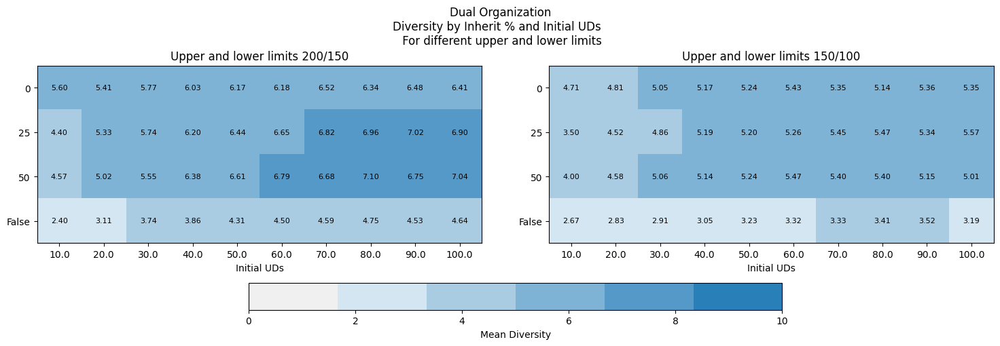

In [45]:
visualize_diversity(DmM_datos, inherits, Dmalphas, 'Dual Organization', up_low_limits, variable='Initial UDs', vis_type='heatmap')

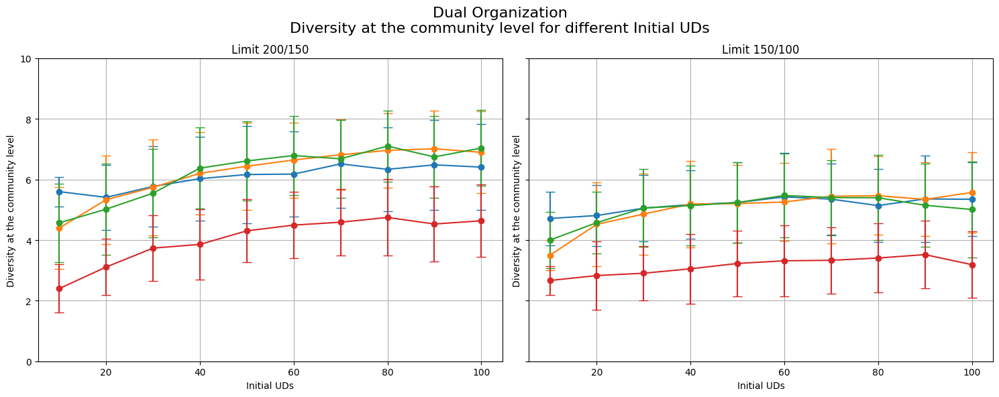

In [46]:
visualize_diversity(DmM_datos, inherits, Dmalphas, 'Dual Organization', up_low_limits, variable='Initial UDs', vis_type='transversal')

## Data and visualizations: pop

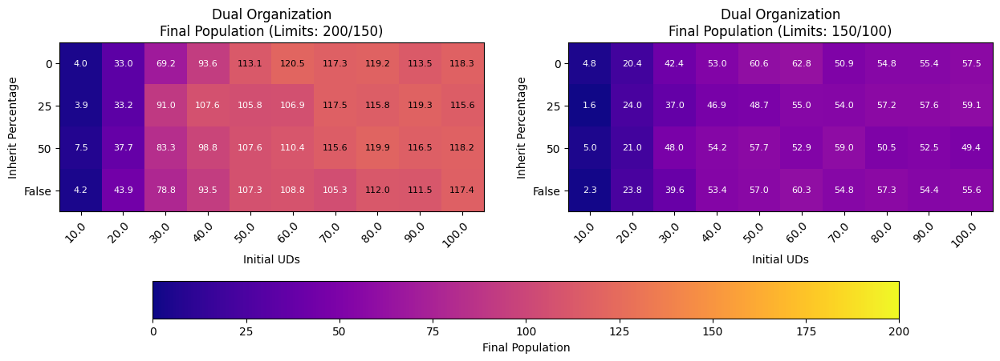

In [47]:
visualize_heatmap(DmM_datos, inherits, Dmalphas, 'Dual Organization', variable='Initial UDs', up_low_limits=up_low_limits, heatmap_type='alive')

## Initial Varieties

Here we try with different values for the initial varieties in the system.
We go from 10 to 100.

In [24]:
# This experiment has different values for Initial varieties VVVV
prob_morte = 0.06 #beta
media = 4 # Mean
iniciais = 40
v = 100 # Initial varieties
inherits = [0,25,50, 'False']
# inherits = [0,25,50] #Values for inherit
# inherits = [0, 'False'] #Values for inherit
Dvalphas = np.linspace(10,v,int(v/10)) # Initial Varieties: from 10 to v
up_low_limits = [[200, 150], [150, 100]]
# For data of behaviour
vM = np.empty((len(inherits), len(Dvalphas), len(up_low_limits)), dtype=object) # alive, mean and diversity levels

punto_vista = 50
tiempo = 1000
tempo = list(range(0,tiempo+1,punto_vista))
experiments = 130


print(vM.shape)
start = time.time()
print(f"started at:  {datetime.now()}")
for i, inherit in enumerate(inherits):
    for j, varieties  in enumerate(Dvalphas):
        for k, (upper_limit, lower_limit) in enumerate(up_low_limits):
            star_configuration = time.time()
            #For population dynamics
            list_alive_UDs = []
            list_vivas_puntos_vista = []
            tasas_crecimiento = []
            #For diversity dynamics
            data_step_mean_var_ud = []
            data_step_var_system = []
            data_step_unique_system = []
            print(f"Experiments with inheritance {inherit} Initial UDs {iniciais} and Initial varieties {varieties}")
            #Lists to store experiments' diversity data
            data_endo_mean_ud = []
            data_endo_com_level = []
            data_endo_total_varieties = []
            original_media = media
            #To see how frequent goes to extintion
            contador = 0
            for experiment in range(1, experiments+1):
                print(f'experimento {experiment}')
                ## Clans
                clans = (list(range(1, 2 + 1)) * (int(iniciais) // 2)) # Just 2 clans
                random.shuffle(clans)
                if inherit != 'False':    
                    #### Initialization
                    UD_dual_organization.uds = {}
                    instancias_ud = []
                    for id_ud in range(1, int(iniciais) + 1):
                        instancias_ud.append(UD_dual_organization(id_ud, media, clans.pop()))
                    ## Varieties
                    limited_varieties = True
                    if limited_varieties == False:
                        for id_ud, ud in UD_dual_organization.uds.items():
                            for _ in range(3):
                                ud.varieties.append(Variety())
                    else:
                        initial_varieties = [Variety() for _ in range (int(varieties))]
                        for ud in UD_dual_organization.uds.values():
                            for _ in range(3):
                                ud.varieties.append(random.choice(initial_varieties))   
                    # Lists for graphs
                    vivas_puntos_vista = [int(iniciais)]
                    vivas_tasa_crecimiento = [int(iniciais)]
            #             mortas_puntos_vista = [0]
                    #For diversity
                    mean_var_ud = []
                    var_system = []
                    unique_system = []
                    var_ud = []
                    var_total = []
                    for ud in [ud for ud in UD_dual_organization.uds.values() if ud.activa ==True]:
                        var_ud.append(len(ud.varieties))
                        for variety in ud.varieties:
                            var_total.append(variety.variety_id)
                    mean_var_ud.append(np.mean(var_ud))
                    var_system.append(len(var_total))
                    unique_system.append(len(set(var_total)))
                    # Simulation
                    for t in range(1, tiempo):
                        uds_copy = {id_ud: ud for id_ud, ud in UD_dual_organization.uds.items() if ud.activa}
                        items = list(uds_copy.items())
                        random.shuffle(items)
                        uds_copy = dict(items)
                        alive = len(uds_copy)
                        if alive > upper_limit and (media == original_media):
                            media -= media//2
                            if media >= 4:
                                media = media //2
                        elif alive < lower_limit and media < original_media:
                            media = original_media
                        if not uds_copy: #Extintion
                            # Only 0
                            print(f"acabó en 0 el experimento {experiment} con herencia {inherits[i]} con unidades {Dvalphas[j]}")
                            vivas_puntos_vista.extend([0] * (int((tiempo/punto_vista)-(len(vivas_puntos_vista)))))
                            vivas_tasa_crecimiento.extend([0] * (int((tiempo)-(len(vivas_tasa_crecimiento)))))
                            contador += 1
                            break         
                        # Cycle:
                        for id_ud, ud in uds_copy.items():
                            ud.ter_filho()
                            ud.buscar_ud(uds_copy, int(media), inherit, True, 0.2)
                            ud.incrementar_idade()
                            ud.death_probability(prob_morte)
                        # Collecting data
                        vivas_tasa_crecimiento.append(len([ud for id, ud in uds_copy.items() if ud.activa]))
                        if t % punto_vista == 0:
                            viv = len([ud for id, ud in uds_copy.items() if ud.activa])
                            #mort = len([ud for id, ud in uds_copy.items() if not ud.activa])
                            vivas_puntos_vista.append(viv)
                            # For diversity
                            var_ud = []
                            var_total = []
                            for ud in [ud for ud in UD_dual_organization.uds.values() if ud.activa ==True]:
                                var_ud.append(len(ud.varieties))
                                for variety in ud.varieties:
                                    var_total.append(variety.variety_id)
                            mean_var_ud.append(np.mean(var_ud))
                            var_system.append(len(var_total))
                            unique_system.append(len(set(var_total))) 
                    viv = len([ud for id, ud in UD_dual_organization.uds.items() if ud.activa])
                    vivas_puntos_vista.append(viv)
                    # For diversity
                    var_ud = []
                    var_total = []
                    for ud in [ud for ud in UD_dual_organization.uds.values() if ud.activa ==True]:
                        var_ud.append(len(ud.varieties))
                        for variety in ud.varieties:
                            var_total.append(variety.variety_id)
                    mean_var_ud.append(np.mean(var_ud))
                    var_system.append(len(var_total))
                    unique_system.append(len(set(var_total)))
                    alive = (len([ud for id, ud in uds_copy.items() if ud.activa]))
                    if alive >= 1:   
                        total_varieties = []
                        varieties_per_UD = []
                        for ud in [ud for ud in UD_dual_organization.uds.values() if ud.activa ==True]:
                            varieties_per_UD.append(len(ud.varieties))
                            for variety in ud.varieties:
                                total_varieties.append(variety.variety_id)
                        data_endo_mean_ud.append(np.mean(varieties_per_UD))
                        data_endo_com_level.append(len(set(total_varieties)))
                        data_endo_total_varieties.append(total_varieties)

                else:# Now with inherit == False
                    #### Initialization
                    UD_dual_organization_al_inh.uds = {}
                    instancias_ud = []
                    for id_ud in range(1, int(iniciais) + 1):
                        instancias_ud.append(UD_dual_organization_al_inh(id_ud, media, clans.pop()))
                    ## Varieties
                    limited_varieties = True
                    if limited_varieties == False:
                        for id_ud, ud in UD_dual_organization_al_inh.uds.items():
                            for _ in range(3):
                                ud.varieties.append(Variety())
                    else:
                        initial_varieties = [Variety() for _ in range (int(varieties))]
                        for ud in UD_dual_organization_al_inh.uds.values():
                            for _ in range(3):
                                ud.varieties.append(random.choice(initial_varieties))   
                    # Lists for graphs
                    vivas_puntos_vista = [int(iniciais)]
                    vivas_tasa_crecimiento = [int(iniciais)]
            #             mortas_puntos_vista = [0]
                    #For diversity
                    mean_var_ud = []
                    var_system = []
                    unique_system = []
                    var_ud = []
                    var_total = []
                    for ud in [ud for ud in UD_dual_organization_al_inh.uds.values() if ud.activa ==True]:
                        var_ud.append(len(ud.varieties))
                        for variety in ud.varieties:
                            var_total.append(variety.variety_id)
                    mean_var_ud.append(np.mean(var_ud))
                    var_system.append(len(var_total))
                    unique_system.append(len(set(var_total)))
                    # Simulation
                    for t in range(1, tiempo):
                        uds_copy = {id_ud: ud for id_ud, ud in UD_dual_organization_al_inh.uds.items() if ud.activa}
                        items = list(uds_copy.items())
                        random.shuffle(items)
                        uds_copy = dict(items)
                        alive = len(uds_copy)
                        if alive > upper_limit and (media == original_media):
                            media -= media//2
                            if media >= 4:
                                media = media //2
                        elif alive < lower_limit and media < original_media:
                            media = original_media
                        if not uds_copy: #Extintion
                            # Only 0
                            print(f"acabó en 0 el experimento {experiment} con herencia {inherits[i]} con unidades {Dvalphas[j]}")
                            vivas_puntos_vista.extend([0] * (int((tiempo/punto_vista)-(len(vivas_puntos_vista)))))
                            vivas_tasa_crecimiento.extend([0] * (int((tiempo)-(len(vivas_tasa_crecimiento)))))
                            contador += 1
                            break         
                        # Cycle:
                        varieties_list = [var for ud in uds_copy.values() for var in ud.varieties]
                        for id_ud, ud in uds_copy.items():
                            ud.ter_filho()
                            ud.buscar_ud(uds_copy, int(media), varieties_list, True, 3, 0.2)
                            ud.incrementar_idade()
                            ud.death_probability(prob_morte)
                        # Collecting data
                        vivas_tasa_crecimiento.append(len([ud for id, ud in uds_copy.items() if ud.activa]))
                        if t % punto_vista == 0:
                            viv = len([ud for id, ud in uds_copy.items() if ud.activa])
                            #mort = len([ud for id, ud in uds_copy.items() if not ud.activa])
                            vivas_puntos_vista.append(viv)
                            # For diversity
                            var_ud = []
                            var_total = []
                            for ud in [ud for ud in UD_dual_organization_al_inh.uds.values() if ud.activa ==True]:
                                var_ud.append(len(ud.varieties))
                                for variety in ud.varieties:
                                    var_total.append(variety.variety_id)
                            mean_var_ud.append(np.mean(var_ud))
                            var_system.append(len(var_total))
                            unique_system.append(len(set(var_total))) 
                    viv = len([ud for id, ud in UD_dual_organization_al_inh.uds.items() if ud.activa])
                    vivas_puntos_vista.append(viv)
                    # For diversity
                    var_ud = []
                    var_total = []
                    for ud in [ud for ud in UD_dual_organization_al_inh.uds.values() if ud.activa ==True]:
                        var_ud.append(len(ud.varieties))
                        for variety in ud.varieties:
                            var_total.append(variety.variety_id)
                    mean_var_ud.append(np.mean(var_ud))
                    var_system.append(len(var_total))
                    unique_system.append(len(set(var_total)))
                    alive = (len([ud for id, ud in uds_copy.items() if ud.activa]))
                    if alive >= 1:   
                        total_varieties = []
                        varieties_per_UD = []
                        for ud in [ud for ud in UD_dual_organization_al_inh.uds.values() if ud.activa ==True]:
                            varieties_per_UD.append(len(ud.varieties))
                            for variety in ud.varieties:
                                total_varieties.append(variety.variety_id)
                        data_endo_mean_ud.append(np.mean(varieties_per_UD))
                        data_endo_com_level.append(len(set(total_varieties)))
                        data_endo_total_varieties.append(total_varieties)


                #Final colect of the data after the simulation!
                indice_primer_cero = np.where(np.array(vivas_tasa_crecimiento) == 0)[0]            
                if len(indice_primer_cero) > 0:
                    # Get growth rate before the 0
                    tasas_crecimiento.append(np.diff(vivas_tasa_crecimiento[:indice_primer_cero[0] - 1]) / vivas_tasa_crecimiento[:-1][:indice_primer_cero[0] - 2] * 100)
                else:
                    # Growth rate
                    tasas_crecimiento.append(np.diff(vivas_tasa_crecimiento) / vivas_tasa_crecimiento[:-1] * 100)
                # Collect the data
                list_alive_UDs.append(len([ud for id, ud in uds_copy.items() if ud.activa == True])) #For heatmap
                list_vivas_puntos_vista.append(vivas_puntos_vista)
                if alive >= 1:
                    if len(mean_var_ud) == len(tempo):        
                        data_step_var_system.append(var_system)
                        data_step_unique_system.append(unique_system)
                        data_step_mean_var_ud.append(mean_var_ud)

                data_inherit_endo = [data_endo_mean_ud, data_endo_com_level, data_endo_total_varieties]
            data_steps_inherit_endo = [data_step_var_system, data_step_unique_system, data_step_mean_var_ud]
            media = original_media
            end_config = time.time()
            vM[i][j][k] = {'alive': np.mean(list_alive_UDs),
                        'std': np.std(list_alive_UDs),
                        'time used': end_config - star_configuration,
                        'porcentage_extintion': contador/experiments,
                        'tempo': tempo, 
                        'mean': np.mean(list_vivas_puntos_vista, axis=0), 
                        'std':  np.std(list_vivas_puntos_vista, axis=0),
                        'growth rate': np.mean([np.mean(lista) for lista in tasas_crecimiento]),
                        'diversity_info': data_inherit_endo,
                        'diversity_info_steps': data_steps_inherit_endo}
            print(f"""
    The total time of the configuration of inherit percentage {inherit}, 
      initial UDs {iniciais} and Initial varieties {varieties} is  {end_config - star_configuration}
            """)
# Folder
folder_name = 'Experiments_kinship_inheritance_parameters_limits'
if not os.path.exists(folder_name):
    os.makedirs(folder_name)
# Heatmap and std
heat_std = os.path.join(folder_name, 'Dual_Initial_Varieties.npy')
np.save(heat_std, vM)
now = datetime.now()
finish = time.time()
print(f"""
It finished at: {now}
It lasted {finish-start}
""")
print("done")

(4, 10, 2)
started at:  2024-11-09 22:23:40.932872
Experiments with inheritance 0 Initial UDs 40 and Initial varieties 10.0
experimento 1
experimento 2
acabó en 0 el experimento 2 con herencia 0 con unidades 10.0


C:\Users\jsolm\Juancho\Juancho\Maestrías\Modelage en Sistemas Complejos\Tesis\Projecto\Modelo\modelo_mio\Agrobiodiversity-model\venv\lib\site-packages\numpy\_core\fromnumeric.py:3596: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\jsolm\Juancho\Juancho\Maestrías\Modelage en Sistemas Complejos\Tesis\Projecto\Modelo\modelo_mio\Agrobiodiversity-model\venv\lib\site-packages\numpy\_core\_methods.py:138: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
acabó en 0 el experimento 11 con herencia 0 con unidades 10.0
experimento 12
experimento 13
experimento 14
acabó en 0 el experimento 14 con herencia 0 con unidades 10.0
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
acabó en 0 el experimento 21 con herencia 0 con unidades 10.0
experimento 22
experimento 23
acabó en 0 el experimento 23 con herencia 0 con unidades 10.0
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
acabó en 0 el experimento 32 con herencia 0 con unidades 10.0
experimento 33
experimento 34
experimento 35
experimento 36
acabó en 0 el experimento 36 con herencia 0 con unidades 10.0
experimento 37
experimento 38
experimento 39
experimento 40
experimento 41
experimento 42
experimento 43
experimento 44
exper

experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
experimento 38
experimento 39
experimento 40
experimento 41
experimento 42
experimento 43
experimento 44
experimento 45
experimento 46
experimento 47
experimento 48
acabó en 0 el experimento 48 con herencia 0 con unidades 20.0
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
acabó en 0 el experimento 55 con herencia 0 con unidades 20.0
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
experimento 67
experimento 68
experimento 69
experimento 70
experimento 71
experimento 72
experimento 73
experimento 74
experimento 75
experimento 76
experimento 77
experimento 78
experimento 79
acabó en 0 el experimento 79 con herencia 0 con unidades 20.0
experimento 80
experimento 81
expe

experimento 51
experimento 52
experimento 53
experimento 54
acabó en 0 el experimento 54 con herencia 0 con unidades 30.0
experimento 55
acabó en 0 el experimento 55 con herencia 0 con unidades 30.0
experimento 56
experimento 57
acabó en 0 el experimento 57 con herencia 0 con unidades 30.0
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
experimento 67
experimento 68
experimento 69
experimento 70
experimento 71
experimento 72
acabó en 0 el experimento 72 con herencia 0 con unidades 30.0
experimento 73
acabó en 0 el experimento 73 con herencia 0 con unidades 30.0
experimento 74
experimento 75
experimento 76
experimento 77
experimento 78
experimento 79
experimento 80
experimento 81
experimento 82
experimento 83
acabó en 0 el experimento 83 con herencia 0 con unidades 30.0
experimento 84
experimento 85
experimento 86
experimento 87
acabó en 0 el experimento 87 con herencia 0 con unidades 30.0
experimento

experimento 81
experimento 82
experimento 83
experimento 84
acabó en 0 el experimento 84 con herencia 0 con unidades 40.0
experimento 85
experimento 86
experimento 87
experimento 88
experimento 89
experimento 90
experimento 91
experimento 92
experimento 93
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
acabó en 0 el experimento 98 con herencia 0 con unidades 40.0
experimento 99
experimento 100
acabó en 0 el experimento 100 con herencia 0 con unidades 40.0
experimento 101
experimento 102
acabó en 0 el experimento 102 con herencia 0 con unidades 40.0
experimento 103
experimento 104
experimento 105
experimento 106
experimento 107
acabó en 0 el experimento 107 con herencia 0 con unidades 40.0
experimento 108
experimento 109
acabó en 0 el experimento 109 con herencia 0 con unidades 40.0
experimento 110
acabó en 0 el experimento 110 con herencia 0 con unidades 40.0
experimento 111
acabó en 0 el experimento 111 con herencia 0 con unidades 40.0
experimento 112
exper

experimento 99
acabó en 0 el experimento 99 con herencia 0 con unidades 50.0
experimento 100
experimento 101
experimento 102
acabó en 0 el experimento 102 con herencia 0 con unidades 50.0
experimento 103
experimento 104
experimento 105
experimento 106
experimento 107
acabó en 0 el experimento 107 con herencia 0 con unidades 50.0
experimento 108
acabó en 0 el experimento 108 con herencia 0 con unidades 50.0
experimento 109
experimento 110
experimento 111
experimento 112
experimento 113
experimento 114
acabó en 0 el experimento 114 con herencia 0 con unidades 50.0
experimento 115
experimento 116
experimento 117
experimento 118
acabó en 0 el experimento 118 con herencia 0 con unidades 50.0
experimento 119
experimento 120
experimento 121
acabó en 0 el experimento 121 con herencia 0 con unidades 50.0
experimento 122
experimento 123
experimento 124
experimento 125
experimento 126
experimento 127
experimento 128
acabó en 0 el experimento 128 con herencia 0 con unidades 50.0
experimento 129
ex

experimento 103
experimento 104
experimento 105
experimento 106
experimento 107
experimento 108
experimento 109
experimento 110
experimento 111
experimento 112
experimento 113
experimento 114
acabó en 0 el experimento 114 con herencia 0 con unidades 60.0
experimento 115
experimento 116
experimento 117
experimento 118
experimento 119
experimento 120
experimento 121
experimento 122
experimento 123
experimento 124
experimento 125
experimento 126
experimento 127
experimento 128
experimento 129
experimento 130

    The total time of the configuration of inherit percentage 0, 
      initial UDs 40 and Initial varieties 60.0 is  645.5060951709747
            
Experiments with inheritance 0 Initial UDs 40 and Initial varieties 60.0
experimento 1
experimento 2
acabó en 0 el experimento 2 con herencia 0 con unidades 60.0
experimento 3
experimento 4
acabó en 0 el experimento 4 con herencia 0 con unidades 60.0
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
acabó en 0 el expe

experimento 120
experimento 121
experimento 122
experimento 123
acabó en 0 el experimento 123 con herencia 0 con unidades 70.0
experimento 124
experimento 125
experimento 126
experimento 127
acabó en 0 el experimento 127 con herencia 0 con unidades 70.0
experimento 128
experimento 129
acabó en 0 el experimento 129 con herencia 0 con unidades 70.0
experimento 130

    The total time of the configuration of inherit percentage 0, 
      initial UDs 40 and Initial varieties 70.0 is  641.0817980766296
            
Experiments with inheritance 0 Initial UDs 40 and Initial varieties 70.0
experimento 1
acabó en 0 el experimento 1 con herencia 0 con unidades 70.0
experimento 2
experimento 3
acabó en 0 el experimento 3 con herencia 0 con unidades 70.0
experimento 4
experimento 5
acabó en 0 el experimento 5 con herencia 0 con unidades 70.0
experimento 6
experimento 7
acabó en 0 el experimento 7 con herencia 0 con unidades 70.0
experimento 8
acabó en 0 el experimento 8 con herencia 0 con unidades 

experimento 98
experimento 99
acabó en 0 el experimento 99 con herencia 0 con unidades 80.0
experimento 100
experimento 101
experimento 102
acabó en 0 el experimento 102 con herencia 0 con unidades 80.0
experimento 103
experimento 104
experimento 105
experimento 106
experimento 107
experimento 108
experimento 109
experimento 110
experimento 111
experimento 112
experimento 113
experimento 114
experimento 115
experimento 116
experimento 117
acabó en 0 el experimento 117 con herencia 0 con unidades 80.0
experimento 118
experimento 119
experimento 120
experimento 121
experimento 122
experimento 123
experimento 124
experimento 125
experimento 126
acabó en 0 el experimento 126 con herencia 0 con unidades 80.0
experimento 127
experimento 128
experimento 129
acabó en 0 el experimento 129 con herencia 0 con unidades 80.0
experimento 130

    The total time of the configuration of inherit percentage 0, 
      initial UDs 40 and Initial varieties 80.0 is  635.0105772018433
            
Experiment

experimento 95
experimento 96
experimento 97
acabó en 0 el experimento 97 con herencia 0 con unidades 90.0
experimento 98
experimento 99
experimento 100
experimento 101
experimento 102
experimento 103
experimento 104
experimento 105
experimento 106
experimento 107
acabó en 0 el experimento 107 con herencia 0 con unidades 90.0
experimento 108
acabó en 0 el experimento 108 con herencia 0 con unidades 90.0
experimento 109
experimento 110
acabó en 0 el experimento 110 con herencia 0 con unidades 90.0
experimento 111
acabó en 0 el experimento 111 con herencia 0 con unidades 90.0
experimento 112
experimento 113
experimento 114
experimento 115
experimento 116
acabó en 0 el experimento 116 con herencia 0 con unidades 90.0
experimento 117
experimento 118
experimento 119
experimento 120
acabó en 0 el experimento 120 con herencia 0 con unidades 90.0
experimento 121
experimento 122
experimento 123
acabó en 0 el experimento 123 con herencia 0 con unidades 90.0
experimento 124
experimento 125
experi

experimento 110
experimento 111
experimento 112
experimento 113
experimento 114
experimento 115
experimento 116
experimento 117
experimento 118
experimento 119
experimento 120
experimento 121
experimento 122
acabó en 0 el experimento 122 con herencia 0 con unidades 100.0
experimento 123
experimento 124
experimento 125
acabó en 0 el experimento 125 con herencia 0 con unidades 100.0
experimento 126
experimento 127
experimento 128
experimento 129
acabó en 0 el experimento 129 con herencia 0 con unidades 100.0
experimento 130

    The total time of the configuration of inherit percentage 0, 
      initial UDs 40 and Initial varieties 100.0 is  674.2483992576599
            
Experiments with inheritance 0 Initial UDs 40 and Initial varieties 100.0
experimento 1
experimento 2
acabó en 0 el experimento 2 con herencia 0 con unidades 100.0
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
acabó en 0 el experimento 8 con herencia 0 con unidades 100.0
experimento

experimento 112
experimento 113
experimento 114
experimento 115
experimento 116
acabó en 0 el experimento 116 con herencia 25 con unidades 10.0
experimento 117
experimento 118
experimento 119
experimento 120
experimento 121
experimento 122
experimento 123
experimento 124
experimento 125
experimento 126
experimento 127
acabó en 0 el experimento 127 con herencia 25 con unidades 10.0
experimento 128
experimento 129
experimento 130
acabó en 0 el experimento 130 con herencia 25 con unidades 10.0

    The total time of the configuration of inherit percentage 25, 
      initial UDs 40 and Initial varieties 10.0 is  642.1207344532013
            
Experiments with inheritance 25 Initial UDs 40 and Initial varieties 10.0
experimento 1
acabó en 0 el experimento 1 con herencia 25 con unidades 10.0
experimento 2
acabó en 0 el experimento 2 con herencia 25 con unidades 10.0
experimento 3
experimento 4
acabó en 0 el experimento 4 con herencia 25 con unidades 10.0
experimento 5
experimento 6
acabó en 

experimento 110
experimento 111
experimento 112
experimento 113
experimento 114
experimento 115
experimento 116
acabó en 0 el experimento 116 con herencia 25 con unidades 20.0
experimento 117
experimento 118
experimento 119
experimento 120
experimento 121
experimento 122
experimento 123
experimento 124
experimento 125
experimento 126
experimento 127
experimento 128
experimento 129
experimento 130
acabó en 0 el experimento 130 con herencia 25 con unidades 20.0

    The total time of the configuration of inherit percentage 25, 
      initial UDs 40 and Initial varieties 20.0 is  669.9198760986328
            
Experiments with inheritance 25 Initial UDs 40 and Initial varieties 20.0
experimento 1
experimento 2
acabó en 0 el experimento 2 con herencia 25 con unidades 20.0
experimento 3
experimento 4
acabó en 0 el experimento 4 con herencia 25 con unidades 20.0
experimento 5
experimento 6
experimento 7
acabó en 0 el experimento 7 con herencia 25 con unidades 20.0
experimento 8
experimento 9

experimento 127
experimento 128
acabó en 0 el experimento 128 con herencia 25 con unidades 30.0
experimento 129
experimento 130

    The total time of the configuration of inherit percentage 25, 
      initial UDs 40 and Initial varieties 30.0 is  636.4233558177948
            
Experiments with inheritance 25 Initial UDs 40 and Initial varieties 30.0
experimento 1
experimento 2
experimento 3
acabó en 0 el experimento 3 con herencia 25 con unidades 30.0
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
acabó en 0 el experimento 8 con herencia 25 con unidades 30.0
experimento 9
acabó en 0 el experimento 9 con herencia 25 con unidades 30.0
experimento 10
acabó en 0 el experimento 10 con herencia 25 con unidades 30.0
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
acabó en 0 el exp

experimento 2
experimento 3
acabó en 0 el experimento 3 con herencia 25 con unidades 40.0
experimento 4
experimento 5
acabó en 0 el experimento 5 con herencia 25 con unidades 40.0
experimento 6
experimento 7
experimento 8
acabó en 0 el experimento 8 con herencia 25 con unidades 40.0
experimento 9
experimento 10
acabó en 0 el experimento 10 con herencia 25 con unidades 40.0
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
acabó en 0 el experimento 16 con herencia 25 con unidades 40.0
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
acabó en 0 el experimento 25 con herencia 25 con unidades 40.0
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
acabó en 0 el experimento 32 con herencia 25 con unidades 40.0
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
experimento 38
acabó en 0 el e

experimento 2
acabó en 0 el experimento 2 con herencia 25 con unidades 50.0
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
acabó en 0 el experimento 15 con herencia 25 con unidades 50.0
experimento 16
experimento 17
experimento 18
experimento 19
acabó en 0 el experimento 19 con herencia 25 con unidades 50.0
experimento 20
experimento 21
acabó en 0 el experimento 21 con herencia 25 con unidades 50.0
experimento 22
experimento 23
acabó en 0 el experimento 23 con herencia 25 con unidades 50.0
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
experimento 34
experimento 35
experimento 36
acabó en 0 el experimento 36 con herencia 25 con unidades 50.0
experimento 37
experimento 38
acabó en 0 el experimento 38 con herencia 25 con unidades 50.0
experimento 3

acabó en 0 el experimento 2 con herencia 25 con unidades 60.0
experimento 3
experimento 4
experimento 5
experimento 6
acabó en 0 el experimento 6 con herencia 25 con unidades 60.0
experimento 7
experimento 8
acabó en 0 el experimento 8 con herencia 25 con unidades 60.0
experimento 9
experimento 10
acabó en 0 el experimento 10 con herencia 25 con unidades 60.0
experimento 11
acabó en 0 el experimento 11 con herencia 25 con unidades 60.0
experimento 12
acabó en 0 el experimento 12 con herencia 25 con unidades 60.0
experimento 13
experimento 14
experimento 15
acabó en 0 el experimento 15 con herencia 25 con unidades 60.0
experimento 16
experimento 17
experimento 18
acabó en 0 el experimento 18 con herencia 25 con unidades 60.0
experimento 19
experimento 20
experimento 21
experimento 22
acabó en 0 el experimento 22 con herencia 25 con unidades 60.0
experimento 23
experimento 24
acabó en 0 el experimento 24 con herencia 25 con unidades 60.0
experimento 25
experimento 26
experimento 27
acabó

experimento 2
acabó en 0 el experimento 2 con herencia 25 con unidades 70.0
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
acabó en 0 el experimento 10 con herencia 25 con unidades 70.0
experimento 11
acabó en 0 el experimento 11 con herencia 25 con unidades 70.0
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
acabó en 0 el experimento 26 con herencia 25 con unidades 70.0
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
experimento 34
experimento 35
experimento 36
acabó en 0 el experimento 36 con herencia 25 con unidades 70.0
experimento 37
experimento 38
acabó en 0 el experimento 38 con herencia 25 con unidades 70.0
experimento 39
experimento 40
experimento 41
experimento 42
acabó en 0 el ex

acabó en 0 el experimento 24 con herencia 25 con unidades 80.0
experimento 25
experimento 26
acabó en 0 el experimento 26 con herencia 25 con unidades 80.0
experimento 27
experimento 28
experimento 29
acabó en 0 el experimento 29 con herencia 25 con unidades 80.0
experimento 30
experimento 31
experimento 32
experimento 33
acabó en 0 el experimento 33 con herencia 25 con unidades 80.0
experimento 34
experimento 35
acabó en 0 el experimento 35 con herencia 25 con unidades 80.0
experimento 36
experimento 37
acabó en 0 el experimento 37 con herencia 25 con unidades 80.0
experimento 38
acabó en 0 el experimento 38 con herencia 25 con unidades 80.0
experimento 39
experimento 40
experimento 41
experimento 42
experimento 43
experimento 44
experimento 45
experimento 46
acabó en 0 el experimento 46 con herencia 25 con unidades 80.0
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
experimento 56
acabó en 0 el ex

experimento 32
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
experimento 38
acabó en 0 el experimento 38 con herencia 25 con unidades 90.0
experimento 39
experimento 40
experimento 41
acabó en 0 el experimento 41 con herencia 25 con unidades 90.0
experimento 42
experimento 43
experimento 44
experimento 45
experimento 46
acabó en 0 el experimento 46 con herencia 25 con unidades 90.0
experimento 47
experimento 48
experimento 49
acabó en 0 el experimento 49 con herencia 25 con unidades 90.0
experimento 50
experimento 51
experimento 52
experimento 53
acabó en 0 el experimento 53 con herencia 25 con unidades 90.0
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
acabó en 0 el experimento 59 con herencia 25 con unidades 90.0
experimento 60
experimento 61
experimento 62
acabó en 0 el experimento 62 con herencia 25 con unidades 90.0
experimento 63
acabó en 0 el experimento 63 con herencia 25 con unidades 90.0
experimento 64
e

experimento 39
acabó en 0 el experimento 39 con herencia 25 con unidades 100.0
experimento 40
experimento 41
acabó en 0 el experimento 41 con herencia 25 con unidades 100.0
experimento 42
experimento 43
acabó en 0 el experimento 43 con herencia 25 con unidades 100.0
experimento 44
experimento 45
experimento 46
experimento 47
experimento 48
acabó en 0 el experimento 48 con herencia 25 con unidades 100.0
experimento 49
experimento 50
experimento 51
experimento 52
acabó en 0 el experimento 52 con herencia 25 con unidades 100.0
experimento 53
acabó en 0 el experimento 53 con herencia 25 con unidades 100.0
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
acabó en 0 el experimento 59 con herencia 25 con unidades 100.0
experimento 60
acabó en 0 el experimento 60 con herencia 25 con unidades 100.0
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
experimento 67
experimento 68
experimento 69
experimento 70
experime

experimento 38
experimento 39
acabó en 0 el experimento 39 con herencia 50 con unidades 10.0
experimento 40
experimento 41
acabó en 0 el experimento 41 con herencia 50 con unidades 10.0
experimento 42
experimento 43
experimento 44
experimento 45
experimento 46
acabó en 0 el experimento 46 con herencia 50 con unidades 10.0
experimento 47
experimento 48
acabó en 0 el experimento 48 con herencia 50 con unidades 10.0
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
acabó en 0 el experimento 54 con herencia 50 con unidades 10.0
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
acabó en 0 el experimento 59 con herencia 50 con unidades 10.0
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
experimento 67
experimento 68
experimento 69
experimento 70
acabó en 0 el experimento 70 con herencia 50 con unidades 10.0
experimento 71
experimento 72
experimento 73
experimento 74
acab

experimento 30
experimento 31
experimento 32
experimento 33
acabó en 0 el experimento 33 con herencia 50 con unidades 20.0
experimento 34
experimento 35
experimento 36
acabó en 0 el experimento 36 con herencia 50 con unidades 20.0
experimento 37
experimento 38
experimento 39
experimento 40
experimento 41
experimento 42
experimento 43
experimento 44
experimento 45
experimento 46
acabó en 0 el experimento 46 con herencia 50 con unidades 20.0
experimento 47
experimento 48
acabó en 0 el experimento 48 con herencia 50 con unidades 20.0
experimento 49
experimento 50
acabó en 0 el experimento 50 con herencia 50 con unidades 20.0
experimento 51
acabó en 0 el experimento 51 con herencia 50 con unidades 20.0
experimento 52
experimento 53
acabó en 0 el experimento 53 con herencia 50 con unidades 20.0
experimento 54
experimento 55
experimento 56
acabó en 0 el experimento 56 con herencia 50 con unidades 20.0
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
e

acabó en 0 el experimento 51 con herencia 50 con unidades 30.0
experimento 52
experimento 53
acabó en 0 el experimento 53 con herencia 50 con unidades 30.0
experimento 54
experimento 55
acabó en 0 el experimento 55 con herencia 50 con unidades 30.0
experimento 56
experimento 57
experimento 58
experimento 59
acabó en 0 el experimento 59 con herencia 50 con unidades 30.0
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
acabó en 0 el experimento 65 con herencia 50 con unidades 30.0
experimento 66
acabó en 0 el experimento 66 con herencia 50 con unidades 30.0
experimento 67
experimento 68
acabó en 0 el experimento 68 con herencia 50 con unidades 30.0
experimento 69
experimento 70
acabó en 0 el experimento 70 con herencia 50 con unidades 30.0
experimento 71
experimento 72
experimento 73
experimento 74
experimento 75
experimento 76
experimento 77
experimento 78
experimento 79
experimento 80
acabó en 0 el experimento 80 con herencia 50 con unidades 30.

experimento 82
experimento 83
experimento 84
experimento 85
experimento 86
experimento 87
acabó en 0 el experimento 87 con herencia 50 con unidades 40.0
experimento 88
experimento 89
experimento 90
experimento 91
experimento 92
experimento 93
experimento 94
experimento 95
acabó en 0 el experimento 95 con herencia 50 con unidades 40.0
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100
experimento 101
experimento 102
acabó en 0 el experimento 102 con herencia 50 con unidades 40.0
experimento 103
experimento 104
experimento 105
acabó en 0 el experimento 105 con herencia 50 con unidades 40.0
experimento 106
experimento 107
experimento 108
experimento 109
experimento 110
experimento 111
experimento 112
experimento 113
acabó en 0 el experimento 113 con herencia 50 con unidades 40.0
experimento 114
experimento 115
experimento 116
experimento 117
experimento 118
experimento 119
acabó en 0 el experimento 119 con herencia 50 con unidades 40.0
experimento 120
experimento 

experimento 87
experimento 88
acabó en 0 el experimento 88 con herencia 50 con unidades 50.0
experimento 89
experimento 90
experimento 91
acabó en 0 el experimento 91 con herencia 50 con unidades 50.0
experimento 92
experimento 93
experimento 94
acabó en 0 el experimento 94 con herencia 50 con unidades 50.0
experimento 95
experimento 96
experimento 97
acabó en 0 el experimento 97 con herencia 50 con unidades 50.0
experimento 98
experimento 99
experimento 100
experimento 101
acabó en 0 el experimento 101 con herencia 50 con unidades 50.0
experimento 102
experimento 103
experimento 104
acabó en 0 el experimento 104 con herencia 50 con unidades 50.0
experimento 105
acabó en 0 el experimento 105 con herencia 50 con unidades 50.0
experimento 106
acabó en 0 el experimento 106 con herencia 50 con unidades 50.0
experimento 107
experimento 108
acabó en 0 el experimento 108 con herencia 50 con unidades 50.0
experimento 109
experimento 110
experimento 111
experimento 112
experimento 113
experimen

experimento 88
experimento 89
experimento 90
experimento 91
experimento 92
acabó en 0 el experimento 92 con herencia 50 con unidades 60.0
experimento 93
experimento 94
acabó en 0 el experimento 94 con herencia 50 con unidades 60.0
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
acabó en 0 el experimento 99 con herencia 50 con unidades 60.0
experimento 100
acabó en 0 el experimento 100 con herencia 50 con unidades 60.0
experimento 101
experimento 102
acabó en 0 el experimento 102 con herencia 50 con unidades 60.0
experimento 103
acabó en 0 el experimento 103 con herencia 50 con unidades 60.0
experimento 104
acabó en 0 el experimento 104 con herencia 50 con unidades 60.0
experimento 105
experimento 106
experimento 107
acabó en 0 el experimento 107 con herencia 50 con unidades 60.0
experimento 108
experimento 109
experimento 110
experimento 111
experimento 112
experimento 113
experimento 114
experimento 115
experimento 116
acabó en 0 el experimento 116 con heren

experimento 93
experimento 94
experimento 95
acabó en 0 el experimento 95 con herencia 50 con unidades 70.0
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100
experimento 101
experimento 102
experimento 103
experimento 104
experimento 105
experimento 106
acabó en 0 el experimento 106 con herencia 50 con unidades 70.0
experimento 107
acabó en 0 el experimento 107 con herencia 50 con unidades 70.0
experimento 108
experimento 109
acabó en 0 el experimento 109 con herencia 50 con unidades 70.0
experimento 110
experimento 111
experimento 112
acabó en 0 el experimento 112 con herencia 50 con unidades 70.0
experimento 113
acabó en 0 el experimento 113 con herencia 50 con unidades 70.0
experimento 114
experimento 115
experimento 116
experimento 117
experimento 118
experimento 119
experimento 120
acabó en 0 el experimento 120 con herencia 50 con unidades 70.0
experimento 121
experimento 122
experimento 123
acabó en 0 el experimento 123 con herencia 50 con unidades 70.0


experimento 84
experimento 85
experimento 86
acabó en 0 el experimento 86 con herencia 50 con unidades 80.0
experimento 87
experimento 88
experimento 89
experimento 90
acabó en 0 el experimento 90 con herencia 50 con unidades 80.0
experimento 91
acabó en 0 el experimento 91 con herencia 50 con unidades 80.0
experimento 92
experimento 93
experimento 94
experimento 95
acabó en 0 el experimento 95 con herencia 50 con unidades 80.0
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100
experimento 101
experimento 102
experimento 103
experimento 104
acabó en 0 el experimento 104 con herencia 50 con unidades 80.0
experimento 105
experimento 106
acabó en 0 el experimento 106 con herencia 50 con unidades 80.0
experimento 107
acabó en 0 el experimento 107 con herencia 50 con unidades 80.0
experimento 108
experimento 109
experimento 110
experimento 111
experimento 112
experimento 113
experimento 114
experimento 115
experimento 116
acabó en 0 el experimento 116 con herencia 5

experimento 114
acabó en 0 el experimento 114 con herencia 50 con unidades 90.0
experimento 115
experimento 116
experimento 117
acabó en 0 el experimento 117 con herencia 50 con unidades 90.0
experimento 118
experimento 119
acabó en 0 el experimento 119 con herencia 50 con unidades 90.0
experimento 120
experimento 121
experimento 122
acabó en 0 el experimento 122 con herencia 50 con unidades 90.0
experimento 123
experimento 124
experimento 125
acabó en 0 el experimento 125 con herencia 50 con unidades 90.0
experimento 126
experimento 127
experimento 128
experimento 129
acabó en 0 el experimento 129 con herencia 50 con unidades 90.0
experimento 130

    The total time of the configuration of inherit percentage 50, 
      initial UDs 40 and Initial varieties 90.0 is  389.41219902038574
            
Experiments with inheritance 50 Initial UDs 40 and Initial varieties 100.0
experimento 1
experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
acabó

experimento 127
experimento 128
experimento 129
experimento 130
acabó en 0 el experimento 130 con herencia 50 con unidades 100.0

    The total time of the configuration of inherit percentage 50, 
      initial UDs 40 and Initial varieties 100.0 is  395.62489581108093
            
Experiments with inheritance False Initial UDs 40 and Initial varieties 10.0
experimento 1
experimento 2
experimento 3
acabó en 0 el experimento 3 con herencia False con unidades 10.0
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
acabó en 0 el experimento 14 con herencia False con unidades 10.0
experimento 15
experimento 16
experimento 17
acabó en 0 el experimento 17 con herencia False con unidades 10.0
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
acabó en 0 el experimento 26 con herencia False con unidades 10

experimento 128
acabó en 0 el experimento 128 con herencia False con unidades 10.0
experimento 129
experimento 130

    The total time of the configuration of inherit percentage False, 
      initial UDs 40 and Initial varieties 10.0 is  390.2228889465332
            
Experiments with inheritance False Initial UDs 40 and Initial varieties 20.0
experimento 1
experimento 2
experimento 3
experimento 4
experimento 5
acabó en 0 el experimento 5 con herencia False con unidades 20.0
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
acabó en 0 el experimento 15 con herencia False con unidades 20.0
experimento 16
experimento 17
experimento 18
experimento 19
acabó en 0 el experimento 19 con herencia False con unidades 20.0
experimento 20
experimento 21
experimento 22
acabó en 0 el experimento 22 con herencia False con unidades 20.0
experimento 23
experimento 24
experimento 25
acabó en 0 el experimento

acabó en 0 el experimento 122 con herencia False con unidades 20.0
experimento 123
acabó en 0 el experimento 123 con herencia False con unidades 20.0
experimento 124
experimento 125
acabó en 0 el experimento 125 con herencia False con unidades 20.0
experimento 126
experimento 127
experimento 128
experimento 129
acabó en 0 el experimento 129 con herencia False con unidades 20.0
experimento 130

    The total time of the configuration of inherit percentage False, 
      initial UDs 40 and Initial varieties 20.0 is  380.49938893318176
            
Experiments with inheritance False Initial UDs 40 and Initial varieties 30.0
experimento 1
experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
acabó en 0 el experimento 15 con herencia False con unidades 30.0
experimento 16
experimento 17
experimento 18
experimento 19
acabó en 0 el experimento 19 c

experimento 127
experimento 128
experimento 129
experimento 130

    The total time of the configuration of inherit percentage False, 
      initial UDs 40 and Initial varieties 30.0 is  380.868150472641
            
Experiments with inheritance False Initial UDs 40 and Initial varieties 40.0
experimento 1
acabó en 0 el experimento 1 con herencia False con unidades 40.0
experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
acabó en 0 el experimento 7 con herencia False con unidades 40.0
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
acabó en 0 el experimento 13 con herencia False con unidades 40.0
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
acabó en 0 el experimento 18 con herencia False con unidades 40.0
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
acabó en 0 el experimento 26 con herencia False con unidades 40

experimento 2
experimento 3
acabó en 0 el experimento 3 con herencia False con unidades 50.0
experimento 4
experimento 5
acabó en 0 el experimento 5 con herencia False con unidades 50.0
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
acabó en 0 el experimento 15 con herencia False con unidades 50.0
experimento 16
experimento 17
experimento 18
acabó en 0 el experimento 18 con herencia False con unidades 50.0
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
acabó en 0 el experimento 27 con herencia False con unidades 50.0
experimento 28
experimento 29
acabó en 0 el experimento 29 con herencia False con unidades 50.0
experimento 30
experimento 31
experimento 32
acabó en 0 el experimento 32 con herencia False con unidades 50.0
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
experime

acabó en 0 el experimento 24 con herencia False con unidades 60.0
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
experimento 34
experimento 35
acabó en 0 el experimento 35 con herencia False con unidades 60.0
experimento 36
experimento 37
experimento 38
experimento 39
experimento 40
experimento 41
experimento 42
experimento 43
acabó en 0 el experimento 43 con herencia False con unidades 60.0
experimento 44
experimento 45
experimento 46
experimento 47
acabó en 0 el experimento 47 con herencia False con unidades 60.0
experimento 48
experimento 49
acabó en 0 el experimento 49 con herencia False con unidades 60.0
experimento 50
experimento 51
acabó en 0 el experimento 51 con herencia False con unidades 60.0
experimento 52
experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
acabó en 0 el experimento 61 con herencia False c

experimento 18
experimento 19
acabó en 0 el experimento 19 con herencia False con unidades 70.0
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
acabó en 0 el experimento 30 con herencia False con unidades 70.0
experimento 31
experimento 32
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
experimento 38
acabó en 0 el experimento 38 con herencia False con unidades 70.0
experimento 39
experimento 40
experimento 41
experimento 42
acabó en 0 el experimento 42 con herencia False con unidades 70.0
experimento 43
experimento 44
experimento 45
experimento 46
acabó en 0 el experimento 46 con herencia False con unidades 70.0
experimento 47
experimento 48
experimento 49
acabó en 0 el experimento 49 con herencia False con unidades 70.0
experimento 50
acabó en 0 el experimento 50 con herencia False con unidades 70.0
experimento 51
acabó en 0 el experimento 51

experimento 21
experimento 22
experimento 23
experimento 24
acabó en 0 el experimento 24 con herencia False con unidades 80.0
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
acabó en 0 el experimento 31 con herencia False con unidades 80.0
experimento 32
experimento 33
experimento 34
experimento 35
acabó en 0 el experimento 35 con herencia False con unidades 80.0
experimento 36
experimento 37
experimento 38
experimento 39
experimento 40
experimento 41
experimento 42
experimento 43
experimento 44
acabó en 0 el experimento 44 con herencia False con unidades 80.0
experimento 45
experimento 46
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
acabó en 0 el experimento 51 con herencia False con unidades 80.0
experimento 52
experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
acabó en 0 el experimento 61 con herencia False con uni

experimento 19
acabó en 0 el experimento 19 con herencia False con unidades 90.0
experimento 20
acabó en 0 el experimento 20 con herencia False con unidades 90.0
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
acabó en 0 el experimento 30 con herencia False con unidades 90.0
experimento 31
experimento 32
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
experimento 38
acabó en 0 el experimento 38 con herencia False con unidades 90.0
experimento 39
experimento 40
experimento 41
acabó en 0 el experimento 41 con herencia False con unidades 90.0
experimento 42
experimento 43
experimento 44
experimento 45
experimento 46
experimento 47
experimento 48
experimento 49
acabó en 0 el experimento 49 con herencia False con unidades 90.0
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
acabó en 0 el experimento 55 con herencia False c

experimento 2
experimento 3
experimento 4
experimento 5
acabó en 0 el experimento 5 con herencia False con unidades 100.0
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
acabó en 0 el experimento 13 con herencia False con unidades 100.0
experimento 14
experimento 15
acabó en 0 el experimento 15 con herencia False con unidades 100.0
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
acabó en 0 el experimento 25 con herencia False con unidades 100.0
experimento 26
experimento 27
acabó en 0 el experimento 27 con herencia False con unidades 100.0
experimento 28
experimento 29
acabó en 0 el experimento 29 con herencia False con unidades 100.0
experimento 30
experimento 31
experimento 32
experimento 33
acabó en 0 el experimento 33 con herencia False con unidades 100.0
experimento 34
experimento 35
experimento 36
experimento 37



It finished at: 2024-11-10 09:55:36.886803
It lasted 41515.954931259155

done


In [49]:
# Dowload the documents
#As a reference
v = 100
inherits = [0,25,50, 'False']#Values for inherit
# inherits = [0, 'False'] #Values for inherit
Dvalphas = np.linspace(10,v,int(v/10)) # Initial UDs: from 10 to m
up_low_limits = [[200, 150], [150, 100]]
punto_vista = 50
tiempo = 1000
tempo = list(range(0,tiempo+1,punto_vista))

#Folders
folder_name = 'Experiments_kinship_inheritance_parameters_limits'
heat_std = os.path.join(folder_name, 'Dual_Initial_Varieties.npy')
## heatmap and mean
DvM_datos = np.load(heat_std, allow_pickle=True)

## Diversity dynamics

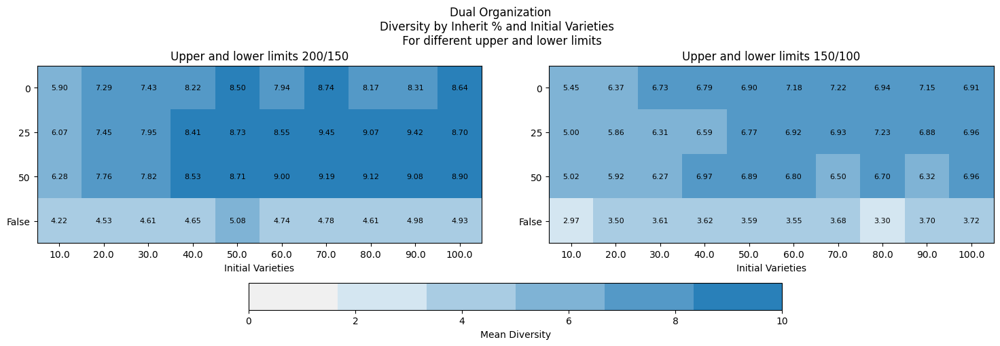

In [50]:
visualize_diversity(DvM_datos, inherits, Dvalphas, 'Dual Organization', up_low_limits, variable='Initial Varieties', vis_type='heatmap')

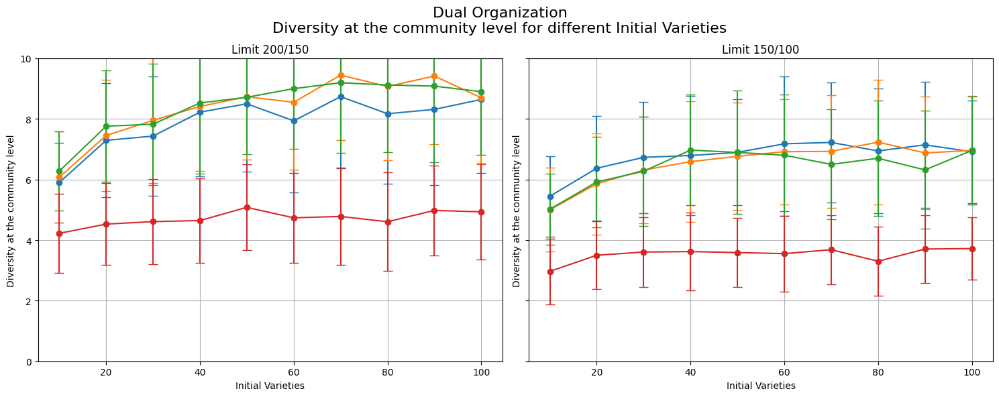

In [51]:
visualize_diversity(DvM_datos, inherits, Dvalphas, 'Dual Organization', up_low_limits, variable='Initial Varieties', vis_type='transversal')

## Pop dynamics

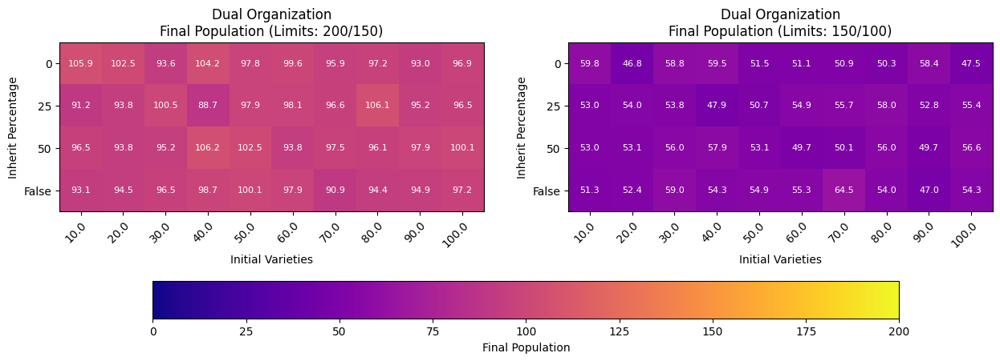

In [52]:
visualize_heatmap(DvM_datos, inherits, Dvalphas, 'Dual Organization', variable='Initial Varieties', up_low_limits=up_low_limits, heatmap_type='alive')

## Mean of children

In [3]:
# This experiment has different values for Mean of children
prob_morte = 0.06 #beta
n = 10 # Mean
m = 40 # Initial UDs
inherits = [0,25,50, 'False']
Dcalphas = np.linspace(1,n,n) # Mean of children from 1 to n
up_low_limits = [[200, 150], [150, 100]]
# For data of behaviour
cM = np.empty((len(inherits), len(Dcalphas), len(up_low_limits)), dtype=object) # alive, mean and diversity levels

punto_vista = 50
tiempo = 1000
tempo = list(range(0,tiempo+1,punto_vista))
experiments = 130


print(cM.shape)
start = time.time()
print(f"started at:  {datetime.now()}")
for i, inherit in enumerate(inherits):
    for j, media  in enumerate(Dcalphas):
        for k, (upper_limit, lower_limit) in enumerate(up_low_limits):
            star_configuration = time.time()
            #For population dynamics
            list_alive_UDs = []
            list_vivas_puntos_vista = []
            tasas_crecimiento = []
            #For diversity dynamics
            data_step_mean_var_ud = []
            data_step_var_system = []
            data_step_unique_system = []
            print(f"Experiments with inheritance {inherit} and Mean of Children {media}")
            #Lists to store experiments' diversity data
            data_endo_mean_ud = []
            data_endo_com_level = []
            data_endo_total_varieties = []
            original_media = media
            #To see how frequent goes to extintion
            contador = 0
            for experiment in range(1, experiments+1):
                print(f'experimento {experiment}')
                ## Clans
                clans = (list(range(1, 2 + 1)) * (int(m) // 2)) # Just 2 clans
                random.shuffle(clans)
                if inherit != 'False':
                    #### Initialization
                    UD_dual_organization.uds = {}
                    instancias_ud = []
                    for id_ud in range(1, int(m) + 1):
                        instancias_ud.append(UD_dual_organization(id_ud, media, clans.pop()))
                    ## Varieties
                    limited_varieties = True
                    if limited_varieties == False:
                        for id_ud, ud in UD_dual_organization.uds.items():
                            for _ in range(3):
                                ud.varieties.append(Variety())
                    else:
                        initial_varieties = [Variety() for _ in range (10)]
                        for ud in UD_dual_organization.uds.values():
                            for _ in range(3):
                                ud.varieties.append(random.choice(initial_varieties))   
                    # Lists for graphs
                    vivas_puntos_vista = [int(m)]
                    vivas_tasa_crecimiento = [int(m)]
            #             mortas_puntos_vista = [0]
                    #For diversity
                    mean_var_ud = []
                    var_system = []
                    unique_system = []
                    var_ud = []
                    var_total = []
                    for ud in [ud for ud in UD_dual_organization.uds.values() if ud.activa ==True]:
                        var_ud.append(len(ud.varieties))
                        for variety in ud.varieties:
                            var_total.append(variety.variety_id)
                    mean_var_ud.append(np.mean(var_ud))
                    var_system.append(len(var_total))
                    unique_system.append(len(set(var_total)))
                    # Simulation
                    for t in range(1, tiempo):
                        uds_copy = {id_ud: ud for id_ud, ud in UD_dual_organization.uds.items() if ud.activa}
                        items = list(uds_copy.items())
                        random.shuffle(items)
                        uds_copy = dict(items)
                        alive = len(uds_copy)
                        if alive > upper_limit and (media == original_media):
                            media -= media//2
                            if media >= 4:
                                media = media //2
                        elif alive < lower_limit and media < original_media:
                            media = original_media
                        if not uds_copy: #Extintion
                            # Only 0
                            print(f"acabó en 0 el experimento {experiment} con herencia {inherits[i]} con mean {Dcalphas[j]}")
                            vivas_puntos_vista.extend([0] * (int((tiempo/punto_vista)-(len(vivas_puntos_vista)))))
                            vivas_tasa_crecimiento.extend([0] * (int((tiempo)-(len(vivas_tasa_crecimiento)))))
                            contador += 1
                            break         
                        # Cycle:
                        for id_ud, ud in uds_copy.items():
                            ud.ter_filho()
                            ud.buscar_ud(uds_copy, int(media), inherit, True, 0.2)
                            ud.incrementar_idade()
                            ud.death_probability(prob_morte)
                        # Collecting data
                        vivas_tasa_crecimiento.append(len([ud for id, ud in uds_copy.items() if ud.activa]))
                        if t % punto_vista == 0:
                            viv = len([ud for id, ud in uds_copy.items() if ud.activa])
                            #mort = len([ud for id, ud in uds_copy.items() if not ud.activa])
                            vivas_puntos_vista.append(viv)
                            # For diversity
                            var_ud = []
                            var_total = []
                            for ud in [ud for ud in UD_dual_organization.uds.values() if ud.activa ==True]:
                                var_ud.append(len(ud.varieties))
                                for variety in ud.varieties:
                                    var_total.append(variety.variety_id)
                            mean_var_ud.append(np.mean(var_ud))
                            var_system.append(len(var_total))
                            unique_system.append(len(set(var_total))) 
                    viv = len([ud for id, ud in UD_dual_organization.uds.items() if ud.activa])
                    vivas_puntos_vista.append(viv)
                    # For diversity
                    var_ud = []
                    var_total = []
                    for ud in [ud for ud in UD_dual_organization.uds.values() if ud.activa ==True]:
                        var_ud.append(len(ud.varieties))
                        for variety in ud.varieties:
                            var_total.append(variety.variety_id)
                    mean_var_ud.append(np.mean(var_ud))
                    var_system.append(len(var_total))
                    unique_system.append(len(set(var_total)))
                    alive = (len([ud for id, ud in uds_copy.items() if ud.activa]))
                    if alive >= 1:   
                        total_varieties = []
                        varieties_per_UD = []
                        for ud in [ud for ud in UD_dual_organization.uds.values() if ud.activa ==True]:
                            varieties_per_UD.append(len(ud.varieties))
                            for variety in ud.varieties:
                                total_varieties.append(variety.variety_id)
                        data_endo_mean_ud.append(np.mean(varieties_per_UD))
                        data_endo_com_level.append(len(set(total_varieties)))
                        data_endo_total_varieties.append(total_varieties)

                else:# Now with inherit == False
                    #### Initialization
                    UD_dual_organization_al_inh.uds = {}
                    instancias_ud = []
                    for id_ud in range(1, int(m) + 1):
                        instancias_ud.append(UD_dual_organization_al_inh(id_ud, media, clans.pop()))
                    ## Varieties
                    limited_varieties = True
                    if limited_varieties == False:
                        for id_ud, ud in UD_dual_organization_al_inh.uds.items():
                            for _ in range(3):
                                ud.varieties.append(Variety())
                    else:
                        initial_varieties = [Variety() for _ in range (10)]
                        for ud in UD_dual_organization_al_inh.uds.values():
                            for _ in range(3):
                                ud.varieties.append(random.choice(initial_varieties))   
                    # Lists for graphs
                    vivas_puntos_vista = [int(m)]
                    vivas_tasa_crecimiento = [int(m)]
            #             mortas_puntos_vista = [0]
                    #For diversity
                    mean_var_ud = []
                    var_system = []
                    unique_system = []
                    var_ud = []
                    var_total = []
                    for ud in [ud for ud in UD_dual_organization_al_inh.uds.values() if ud.activa ==True]:
                        var_ud.append(len(ud.varieties))
                        for variety in ud.varieties:
                            var_total.append(variety.variety_id)
                    mean_var_ud.append(np.mean(var_ud))
                    var_system.append(len(var_total))
                    unique_system.append(len(set(var_total)))
                    # Simulation
                    for t in range(1, tiempo):
                        uds_copy = {id_ud: ud for id_ud, ud in UD_dual_organization_al_inh.uds.items() if ud.activa}
                        items = list(uds_copy.items())
                        random.shuffle(items)
                        uds_copy = dict(items)
                        alive = len(uds_copy)
                        if alive > upper_limit and (media == original_media):
                            media -= media//2
                            if media >= 4:
                                media = media //2
                        elif alive < lower_limit and media < original_media:
                            media = original_media
                        if not uds_copy: #Extintion
                            # Only 0
                            print(f"acabó en 0 el experimento {experiment} con herencia {inherits[i]} con mean {Dcalphas[j]}")
                            vivas_puntos_vista.extend([0] * (int((tiempo/punto_vista)-(len(vivas_puntos_vista)))))
                            vivas_tasa_crecimiento.extend([0] * (int((tiempo)-(len(vivas_tasa_crecimiento)))))
                            contador += 1
                            break         
                        # Cycle:
                        varieties_list = [var for ud in uds_copy.values() for var in ud.varieties]
                        for id_ud, ud in uds_copy.items():
                            ud.ter_filho()
                            ud.buscar_ud(uds_copy, int(media), varieties_list, True, 3, 0.2)
                            ud.incrementar_idade()
                            ud.death_probability(prob_morte)
                        # Collecting data
                        vivas_tasa_crecimiento.append(len([ud for id, ud in uds_copy.items() if ud.activa]))
                        if t % punto_vista == 0:
                            viv = len([ud for id, ud in uds_copy.items() if ud.activa])
                            #mort = len([ud for id, ud in uds_copy.items() if not ud.activa])
                            vivas_puntos_vista.append(viv)
                            # For diversity
                            var_ud = []
                            var_total = []
                            for ud in [ud for ud in UD_dual_organization_al_inh.uds.values() if ud.activa ==True]:
                                var_ud.append(len(ud.varieties))
                                for variety in ud.varieties:
                                    var_total.append(variety.variety_id)
                            mean_var_ud.append(np.mean(var_ud))
                            var_system.append(len(var_total))
                            unique_system.append(len(set(var_total))) 
                    viv = len([ud for id, ud in UD_dual_organization_al_inh.uds.items() if ud.activa])
                    vivas_puntos_vista.append(viv)
                    # For diversity
                    var_ud = []
                    var_total = []
                    for ud in [ud for ud in UD_dual_organization_al_inh.uds.values() if ud.activa ==True]:
                        var_ud.append(len(ud.varieties))
                        for variety in ud.varieties:
                            var_total.append(variety.variety_id)
                    mean_var_ud.append(np.mean(var_ud))
                    var_system.append(len(var_total))
                    unique_system.append(len(set(var_total)))
                    alive = (len([ud for id, ud in uds_copy.items() if ud.activa]))
                    if alive >= 1:   
                        total_varieties = []
                        varieties_per_UD = []
                        for ud in [ud for ud in UD_dual_organization_al_inh.uds.values() if ud.activa ==True]:
                            varieties_per_UD.append(len(ud.varieties))
                            for variety in ud.varieties:
                                total_varieties.append(variety.variety_id)
                        data_endo_mean_ud.append(np.mean(varieties_per_UD))
                        data_endo_com_level.append(len(set(total_varieties)))
                        data_endo_total_varieties.append(total_varieties)


                #Final colect of the data after the simulation!
                indice_primer_cero = np.where(np.array(vivas_tasa_crecimiento) == 0)[0]            
                if len(indice_primer_cero) > 0:
                    # Get growth rate before the 0
                    tasas_crecimiento.append(np.diff(vivas_tasa_crecimiento[:indice_primer_cero[0] - 1]) / vivas_tasa_crecimiento[:-1][:indice_primer_cero[0] - 2] * 100)
                else:
                    # Growth rate
                    tasas_crecimiento.append(np.diff(vivas_tasa_crecimiento) / vivas_tasa_crecimiento[:-1] * 100)
                # Collect the data
                list_alive_UDs.append(len([ud for id, ud in uds_copy.items() if ud.activa == True])) #For heatmap
                list_vivas_puntos_vista.append(vivas_puntos_vista)
                if alive >= 1:
                    if len(mean_var_ud) == len(tempo):        
                        data_step_var_system.append(var_system)
                        data_step_unique_system.append(unique_system)
                        data_step_mean_var_ud.append(mean_var_ud)

                data_inherit_endo = [data_endo_mean_ud, data_endo_com_level, data_endo_total_varieties]
            data_steps_inherit_endo = [data_step_var_system, data_step_unique_system, data_step_mean_var_ud]
            media = original_media
            end_config = time.time()
            cM[i][j][k] = {'alive': np.mean(list_alive_UDs),
                        'std': np.std(list_alive_UDs),
                        'time used': end_config - star_configuration,
                        'porcentage_extintion': contador/experiments,
                        'tempo': tempo, 
                        'mean': np.mean(list_vivas_puntos_vista, axis=0), 
                        'std':  np.std(list_vivas_puntos_vista, axis=0),
                        'growth rate': np.mean([np.mean(lista) for lista in tasas_crecimiento]),
                        'diversity_info': data_inherit_endo,
                        'diversity_info_steps': data_steps_inherit_endo}
            print(f"""
    The total time of the configuration of inherit percentage {inherit} and initial UDs {m} and mean {media} is  {end_config - star_configuration}
            """)
# Folder
folder_name = 'Experiments_kinship_inheritance_parameters_limits'
if not os.path.exists(folder_name):
    os.makedirs(folder_name)
# Data
heat_std = os.path.join(folder_name, 'Dual_Mean_children.npy')
np.save(heat_std, cM)
now = datetime.now()
finish = time.time()
print(f"""
It finished at: {now}
It lasted {finish-start}
""")
print("done")

(4, 10, 2)
started at:  2024-11-15 09:48:14.390070
Experiments with inheritance 0 and Mean of Children 1.0
experimento 1
acabó en 0 el experimento 1 con herencia 0 con mean 1.0
experimento 2
acabó en 0 el experimento 2 con herencia 0 con mean 1.0
experimento 3
acabó en 0 el experimento 3 con herencia 0 con mean 1.0
experimento 4
acabó en 0 el experimento 4 con herencia 0 con mean 1.0
experimento 5
acabó en 0 el experimento 5 con herencia 0 con mean 1.0
experimento 6
acabó en 0 el experimento 6 con herencia 0 con mean 1.0
experimento 7
acabó en 0 el experimento 7 con herencia 0 con mean 1.0
experimento 8
acabó en 0 el experimento 8 con herencia 0 con mean 1.0
experimento 9
acabó en 0 el experimento 9 con herencia 0 con mean 1.0
experimento 10
acabó en 0 el experimento 10 con herencia 0 con mean 1.0
experimento 11
acabó en 0 el experimento 11 con herencia 0 con mean 1.0
experimento 12


C:\Users\jsolm\Juancho\Juancho\Maestrías\Modelage en Sistemas Complejos\Tesis\Projecto\Modelo\modelo_mio\Agrobiodiversity-model\venv\lib\site-packages\numpy\_core\fromnumeric.py:3596: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\jsolm\Juancho\Juancho\Maestrías\Modelage en Sistemas Complejos\Tesis\Projecto\Modelo\modelo_mio\Agrobiodiversity-model\venv\lib\site-packages\numpy\_core\_methods.py:138: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


acabó en 0 el experimento 12 con herencia 0 con mean 1.0
experimento 13
acabó en 0 el experimento 13 con herencia 0 con mean 1.0
experimento 14
acabó en 0 el experimento 14 con herencia 0 con mean 1.0
experimento 15
acabó en 0 el experimento 15 con herencia 0 con mean 1.0
experimento 16
acabó en 0 el experimento 16 con herencia 0 con mean 1.0
experimento 17
acabó en 0 el experimento 17 con herencia 0 con mean 1.0
experimento 18
acabó en 0 el experimento 18 con herencia 0 con mean 1.0
experimento 19
acabó en 0 el experimento 19 con herencia 0 con mean 1.0
experimento 20
acabó en 0 el experimento 20 con herencia 0 con mean 1.0
experimento 21
acabó en 0 el experimento 21 con herencia 0 con mean 1.0
experimento 22
acabó en 0 el experimento 22 con herencia 0 con mean 1.0
experimento 23
acabó en 0 el experimento 23 con herencia 0 con mean 1.0
experimento 24
acabó en 0 el experimento 24 con herencia 0 con mean 1.0
experimento 25
acabó en 0 el experimento 25 con herencia 0 con mean 1.0
experim

acabó en 0 el experimento 4 con herencia 0 con mean 1.0
experimento 5
acabó en 0 el experimento 5 con herencia 0 con mean 1.0
experimento 6
acabó en 0 el experimento 6 con herencia 0 con mean 1.0
experimento 7
acabó en 0 el experimento 7 con herencia 0 con mean 1.0
experimento 8
acabó en 0 el experimento 8 con herencia 0 con mean 1.0
experimento 9
acabó en 0 el experimento 9 con herencia 0 con mean 1.0
experimento 10
acabó en 0 el experimento 10 con herencia 0 con mean 1.0
experimento 11
acabó en 0 el experimento 11 con herencia 0 con mean 1.0
experimento 12
acabó en 0 el experimento 12 con herencia 0 con mean 1.0
experimento 13
acabó en 0 el experimento 13 con herencia 0 con mean 1.0
experimento 14
acabó en 0 el experimento 14 con herencia 0 con mean 1.0
experimento 15
acabó en 0 el experimento 15 con herencia 0 con mean 1.0
experimento 16
acabó en 0 el experimento 16 con herencia 0 con mean 1.0
experimento 17
acabó en 0 el experimento 17 con herencia 0 con mean 1.0
experimento 18
aca

experimento 118
acabó en 0 el experimento 118 con herencia 0 con mean 1.0
experimento 119
acabó en 0 el experimento 119 con herencia 0 con mean 1.0
experimento 120
acabó en 0 el experimento 120 con herencia 0 con mean 1.0
experimento 121
acabó en 0 el experimento 121 con herencia 0 con mean 1.0
experimento 122
acabó en 0 el experimento 122 con herencia 0 con mean 1.0
experimento 123
acabó en 0 el experimento 123 con herencia 0 con mean 1.0
experimento 124
acabó en 0 el experimento 124 con herencia 0 con mean 1.0
experimento 125
acabó en 0 el experimento 125 con herencia 0 con mean 1.0
experimento 126
acabó en 0 el experimento 126 con herencia 0 con mean 1.0
experimento 127
acabó en 0 el experimento 127 con herencia 0 con mean 1.0
experimento 128
acabó en 0 el experimento 128 con herencia 0 con mean 1.0
experimento 129
acabó en 0 el experimento 129 con herencia 0 con mean 1.0
experimento 130
acabó en 0 el experimento 130 con herencia 0 con mean 1.0

    The total time of the configurati

experimento 100
acabó en 0 el experimento 100 con herencia 0 con mean 2.0
experimento 101
acabó en 0 el experimento 101 con herencia 0 con mean 2.0
experimento 102
acabó en 0 el experimento 102 con herencia 0 con mean 2.0
experimento 103
acabó en 0 el experimento 103 con herencia 0 con mean 2.0
experimento 104
acabó en 0 el experimento 104 con herencia 0 con mean 2.0
experimento 105
acabó en 0 el experimento 105 con herencia 0 con mean 2.0
experimento 106
acabó en 0 el experimento 106 con herencia 0 con mean 2.0
experimento 107
acabó en 0 el experimento 107 con herencia 0 con mean 2.0
experimento 108
acabó en 0 el experimento 108 con herencia 0 con mean 2.0
experimento 109
acabó en 0 el experimento 109 con herencia 0 con mean 2.0
experimento 110
acabó en 0 el experimento 110 con herencia 0 con mean 2.0
experimento 111
acabó en 0 el experimento 111 con herencia 0 con mean 2.0
experimento 112
acabó en 0 el experimento 112 con herencia 0 con mean 2.0
experimento 113
acabó en 0 el experime

acabó en 0 el experimento 98 con herencia 0 con mean 2.0
experimento 99
acabó en 0 el experimento 99 con herencia 0 con mean 2.0
experimento 100
acabó en 0 el experimento 100 con herencia 0 con mean 2.0
experimento 101
acabó en 0 el experimento 101 con herencia 0 con mean 2.0
experimento 102
acabó en 0 el experimento 102 con herencia 0 con mean 2.0
experimento 103
acabó en 0 el experimento 103 con herencia 0 con mean 2.0
experimento 104
acabó en 0 el experimento 104 con herencia 0 con mean 2.0
experimento 105
acabó en 0 el experimento 105 con herencia 0 con mean 2.0
experimento 106
acabó en 0 el experimento 106 con herencia 0 con mean 2.0
experimento 107
acabó en 0 el experimento 107 con herencia 0 con mean 2.0
experimento 108
acabó en 0 el experimento 108 con herencia 0 con mean 2.0
experimento 109
acabó en 0 el experimento 109 con herencia 0 con mean 2.0
experimento 110
acabó en 0 el experimento 110 con herencia 0 con mean 2.0
experimento 111
acabó en 0 el experimento 111 con herenci

acabó en 0 el experimento 79 con herencia 0 con mean 3.0
experimento 80
acabó en 0 el experimento 80 con herencia 0 con mean 3.0
experimento 81
acabó en 0 el experimento 81 con herencia 0 con mean 3.0
experimento 82
acabó en 0 el experimento 82 con herencia 0 con mean 3.0
experimento 83
acabó en 0 el experimento 83 con herencia 0 con mean 3.0
experimento 84
acabó en 0 el experimento 84 con herencia 0 con mean 3.0
experimento 85
acabó en 0 el experimento 85 con herencia 0 con mean 3.0
experimento 86
acabó en 0 el experimento 86 con herencia 0 con mean 3.0
experimento 87
acabó en 0 el experimento 87 con herencia 0 con mean 3.0
experimento 88
acabó en 0 el experimento 88 con herencia 0 con mean 3.0
experimento 89
acabó en 0 el experimento 89 con herencia 0 con mean 3.0
experimento 90
acabó en 0 el experimento 90 con herencia 0 con mean 3.0
experimento 91
acabó en 0 el experimento 91 con herencia 0 con mean 3.0
experimento 92
acabó en 0 el experimento 92 con herencia 0 con mean 3.0
experim

acabó en 0 el experimento 61 con herencia 0 con mean 3.0
experimento 62
acabó en 0 el experimento 62 con herencia 0 con mean 3.0
experimento 63
acabó en 0 el experimento 63 con herencia 0 con mean 3.0
experimento 64
acabó en 0 el experimento 64 con herencia 0 con mean 3.0
experimento 65
acabó en 0 el experimento 65 con herencia 0 con mean 3.0
experimento 66
acabó en 0 el experimento 66 con herencia 0 con mean 3.0
experimento 67
acabó en 0 el experimento 67 con herencia 0 con mean 3.0
experimento 68
acabó en 0 el experimento 68 con herencia 0 con mean 3.0
experimento 69
acabó en 0 el experimento 69 con herencia 0 con mean 3.0
experimento 70
acabó en 0 el experimento 70 con herencia 0 con mean 3.0
experimento 71
acabó en 0 el experimento 71 con herencia 0 con mean 3.0
experimento 72
acabó en 0 el experimento 72 con herencia 0 con mean 3.0
experimento 73
acabó en 0 el experimento 73 con herencia 0 con mean 3.0
experimento 74
acabó en 0 el experimento 74 con herencia 0 con mean 3.0
experim

experimento 123
experimento 124
experimento 125
experimento 126
experimento 127
acabó en 0 el experimento 127 con herencia 0 con mean 4.0
experimento 128
experimento 129
experimento 130

    The total time of the configuration of inherit percentage 0 and initial UDs 40 and mean 4.0 is  479.63756585121155
            
Experiments with inheritance 0 and Mean of Children 4.0
experimento 1
experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
acabó en 0 el experimento 7 con herencia 0 con mean 4.0
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
acabó en 0 el experimento 13 con herencia 0 con mean 4.0
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
acabó en 0 el experimento 24 con herencia 0 con mean 4.0
experimento 25
experimento 26
experimento 27
experimento 28
acabó en 0 el experimento 28 con herencia 0 

experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
experimento 38
experimento 39
experimento 40
experimento 41
experimento 42
experimento 43
experimento 44
experimento 45
experimento 46
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
experimento 67
experimento 68
exp

experimento 109
experimento 110
experimento 111
experimento 112
experimento 113
experimento 114
experimento 115
experimento 116
experimento 117
experimento 118
experimento 119
experimento 120
experimento 121
experimento 122
experimento 123
experimento 124
experimento 125
experimento 126
experimento 127
experimento 128
experimento 129
experimento 130

    The total time of the configuration of inherit percentage 0 and initial UDs 40 and mean 7.0 is  639.2882032394409
            
Experiments with inheritance 0 and Mean of Children 8.0
experimento 1
experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
acabó en 0 el experimento 11 con herencia 0 con mean 8.0
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experim

experimento 76
experimento 77
experimento 78
experimento 79
experimento 80
experimento 81
experimento 82
experimento 83
experimento 84
experimento 85
experimento 86
experimento 87
experimento 88
experimento 89
experimento 90
experimento 91
experimento 92
experimento 93
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100
experimento 101
experimento 102
experimento 103
experimento 104
experimento 105
experimento 106
experimento 107
experimento 108
experimento 109
experimento 110
experimento 111
experimento 112
experimento 113
experimento 114
experimento 115
experimento 116
experimento 117
experimento 118
experimento 119
experimento 120
experimento 121
experimento 122
experimento 123
experimento 124
experimento 125
experimento 126
experimento 127
experimento 128
experimento 129
experimento 130

    The total time of the configuration of inherit percentage 0 and initial UDs 40 and mean 9.0 is  763.5676651000977
            
Experiments 

acabó en 0 el experimento 42 con herencia 25 con mean 1.0
experimento 43
acabó en 0 el experimento 43 con herencia 25 con mean 1.0
experimento 44
acabó en 0 el experimento 44 con herencia 25 con mean 1.0
experimento 45
acabó en 0 el experimento 45 con herencia 25 con mean 1.0
experimento 46
acabó en 0 el experimento 46 con herencia 25 con mean 1.0
experimento 47
acabó en 0 el experimento 47 con herencia 25 con mean 1.0
experimento 48
acabó en 0 el experimento 48 con herencia 25 con mean 1.0
experimento 49
acabó en 0 el experimento 49 con herencia 25 con mean 1.0
experimento 50
acabó en 0 el experimento 50 con herencia 25 con mean 1.0
experimento 51
acabó en 0 el experimento 51 con herencia 25 con mean 1.0
experimento 52
acabó en 0 el experimento 52 con herencia 25 con mean 1.0
experimento 53
acabó en 0 el experimento 53 con herencia 25 con mean 1.0
experimento 54
acabó en 0 el experimento 54 con herencia 25 con mean 1.0
experimento 55
acabó en 0 el experimento 55 con herencia 25 con me

acabó en 0 el experimento 39 con herencia 25 con mean 1.0
experimento 40
acabó en 0 el experimento 40 con herencia 25 con mean 1.0
experimento 41
acabó en 0 el experimento 41 con herencia 25 con mean 1.0
experimento 42
acabó en 0 el experimento 42 con herencia 25 con mean 1.0
experimento 43
acabó en 0 el experimento 43 con herencia 25 con mean 1.0
experimento 44
acabó en 0 el experimento 44 con herencia 25 con mean 1.0
experimento 45
acabó en 0 el experimento 45 con herencia 25 con mean 1.0
experimento 46
acabó en 0 el experimento 46 con herencia 25 con mean 1.0
experimento 47
acabó en 0 el experimento 47 con herencia 25 con mean 1.0
experimento 48
acabó en 0 el experimento 48 con herencia 25 con mean 1.0
experimento 49
acabó en 0 el experimento 49 con herencia 25 con mean 1.0
experimento 50
acabó en 0 el experimento 50 con herencia 25 con mean 1.0
experimento 51
acabó en 0 el experimento 51 con herencia 25 con mean 1.0
experimento 52
acabó en 0 el experimento 52 con herencia 25 con me

acabó en 0 el experimento 19 con herencia 25 con mean 2.0
experimento 20
acabó en 0 el experimento 20 con herencia 25 con mean 2.0
experimento 21
acabó en 0 el experimento 21 con herencia 25 con mean 2.0
experimento 22
acabó en 0 el experimento 22 con herencia 25 con mean 2.0
experimento 23
acabó en 0 el experimento 23 con herencia 25 con mean 2.0
experimento 24
acabó en 0 el experimento 24 con herencia 25 con mean 2.0
experimento 25
acabó en 0 el experimento 25 con herencia 25 con mean 2.0
experimento 26
acabó en 0 el experimento 26 con herencia 25 con mean 2.0
experimento 27
acabó en 0 el experimento 27 con herencia 25 con mean 2.0
experimento 28
acabó en 0 el experimento 28 con herencia 25 con mean 2.0
experimento 29
acabó en 0 el experimento 29 con herencia 25 con mean 2.0
experimento 30
acabó en 0 el experimento 30 con herencia 25 con mean 2.0
experimento 31
acabó en 0 el experimento 31 con herencia 25 con mean 2.0
experimento 32
acabó en 0 el experimento 32 con herencia 25 con me


    The total time of the configuration of inherit percentage 25 and initial UDs 40 and mean 2.0 is  3.2960360050201416
            
Experiments with inheritance 25 and Mean of Children 2.0
experimento 1
acabó en 0 el experimento 1 con herencia 25 con mean 2.0
experimento 2
acabó en 0 el experimento 2 con herencia 25 con mean 2.0
experimento 3
acabó en 0 el experimento 3 con herencia 25 con mean 2.0
experimento 4
acabó en 0 el experimento 4 con herencia 25 con mean 2.0
experimento 5
acabó en 0 el experimento 5 con herencia 25 con mean 2.0
experimento 6
acabó en 0 el experimento 6 con herencia 25 con mean 2.0
experimento 7
acabó en 0 el experimento 7 con herencia 25 con mean 2.0
experimento 8
acabó en 0 el experimento 8 con herencia 25 con mean 2.0
experimento 9
acabó en 0 el experimento 9 con herencia 25 con mean 2.0
experimento 10
acabó en 0 el experimento 10 con herencia 25 con mean 2.0
experimento 11
acabó en 0 el experimento 11 con herencia 25 con mean 2.0
experimento 12
acabó en 

acabó en 0 el experimento 111 con herencia 25 con mean 2.0
experimento 112
acabó en 0 el experimento 112 con herencia 25 con mean 2.0
experimento 113
acabó en 0 el experimento 113 con herencia 25 con mean 2.0
experimento 114
acabó en 0 el experimento 114 con herencia 25 con mean 2.0
experimento 115
acabó en 0 el experimento 115 con herencia 25 con mean 2.0
experimento 116
acabó en 0 el experimento 116 con herencia 25 con mean 2.0
experimento 117
acabó en 0 el experimento 117 con herencia 25 con mean 2.0
experimento 118
acabó en 0 el experimento 118 con herencia 25 con mean 2.0
experimento 119
acabó en 0 el experimento 119 con herencia 25 con mean 2.0
experimento 120
acabó en 0 el experimento 120 con herencia 25 con mean 2.0
experimento 121
acabó en 0 el experimento 121 con herencia 25 con mean 2.0
experimento 122
acabó en 0 el experimento 122 con herencia 25 con mean 2.0
experimento 123
acabó en 0 el experimento 123 con herencia 25 con mean 2.0
experimento 124
acabó en 0 el experimento

acabó en 0 el experimento 94 con herencia 25 con mean 3.0
experimento 95
acabó en 0 el experimento 95 con herencia 25 con mean 3.0
experimento 96
acabó en 0 el experimento 96 con herencia 25 con mean 3.0
experimento 97
acabó en 0 el experimento 97 con herencia 25 con mean 3.0
experimento 98
acabó en 0 el experimento 98 con herencia 25 con mean 3.0
experimento 99
acabó en 0 el experimento 99 con herencia 25 con mean 3.0
experimento 100
acabó en 0 el experimento 100 con herencia 25 con mean 3.0
experimento 101
acabó en 0 el experimento 101 con herencia 25 con mean 3.0
experimento 102
acabó en 0 el experimento 102 con herencia 25 con mean 3.0
experimento 103
acabó en 0 el experimento 103 con herencia 25 con mean 3.0
experimento 104
acabó en 0 el experimento 104 con herencia 25 con mean 3.0
experimento 105
acabó en 0 el experimento 105 con herencia 25 con mean 3.0
experimento 106
acabó en 0 el experimento 106 con herencia 25 con mean 3.0
experimento 107
acabó en 0 el experimento 107 con he

acabó en 0 el experimento 74 con herencia 25 con mean 3.0
experimento 75
acabó en 0 el experimento 75 con herencia 25 con mean 3.0
experimento 76
acabó en 0 el experimento 76 con herencia 25 con mean 3.0
experimento 77
acabó en 0 el experimento 77 con herencia 25 con mean 3.0
experimento 78
acabó en 0 el experimento 78 con herencia 25 con mean 3.0
experimento 79
acabó en 0 el experimento 79 con herencia 25 con mean 3.0
experimento 80
acabó en 0 el experimento 80 con herencia 25 con mean 3.0
experimento 81
acabó en 0 el experimento 81 con herencia 25 con mean 3.0
experimento 82
acabó en 0 el experimento 82 con herencia 25 con mean 3.0
experimento 83
acabó en 0 el experimento 83 con herencia 25 con mean 3.0
experimento 84
acabó en 0 el experimento 84 con herencia 25 con mean 3.0
experimento 85
acabó en 0 el experimento 85 con herencia 25 con mean 3.0
experimento 86
acabó en 0 el experimento 86 con herencia 25 con mean 3.0
experimento 87
acabó en 0 el experimento 87 con herencia 25 con me

experimento 2
acabó en 0 el experimento 2 con herencia 25 con mean 4.0
experimento 3
experimento 4
acabó en 0 el experimento 4 con herencia 25 con mean 4.0
experimento 5
experimento 6
experimento 7
experimento 8
acabó en 0 el experimento 8 con herencia 25 con mean 4.0
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
acabó en 0 el experimento 13 con herencia 25 con mean 4.0
experimento 14
acabó en 0 el experimento 14 con herencia 25 con mean 4.0
experimento 15
acabó en 0 el experimento 15 con herencia 25 con mean 4.0
experimento 16
acabó en 0 el experimento 16 con herencia 25 con mean 4.0
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
acabó en 0 el experimento 25 con herencia 25 con mean 4.0
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
acabó en 0 el experimento 31 con herencia 25 con mean 4.0
experimento 32
experimento 33
experimen


    The total time of the configuration of inherit percentage 25 and initial UDs 40 and mean 5.0 is  687.784152507782
            
Experiments with inheritance 25 and Mean of Children 6.0
experimento 1
experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
experimento 38
experimento 39
experimento 40
experimento 41
experimento 42
experimento 43
experimento 44
experimento 45
experimento 46
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experiment

experimento 99
experimento 100
experimento 101
experimento 102
experimento 103
experimento 104
experimento 105
experimento 106
experimento 107
experimento 108
experimento 109
experimento 110
experimento 111
experimento 112
experimento 113
experimento 114
experimento 115
experimento 116
experimento 117
experimento 118
experimento 119
experimento 120
experimento 121
experimento 122
experimento 123
experimento 124
experimento 125
experimento 126
experimento 127
experimento 128
experimento 129
experimento 130

    The total time of the configuration of inherit percentage 25 and initial UDs 40 and mean 7.0 is  650.5077900886536
            
Experiments with inheritance 25 and Mean of Children 8.0
experimento 1
experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experime

experimento 69
experimento 70
experimento 71
experimento 72
experimento 73
experimento 74
experimento 75
experimento 76
experimento 77
experimento 78
experimento 79
experimento 80
experimento 81
experimento 82
experimento 83
experimento 84
experimento 85
experimento 86
experimento 87
experimento 88
experimento 89
experimento 90
experimento 91
experimento 92
experimento 93
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100
experimento 101
experimento 102
experimento 103
experimento 104
experimento 105
experimento 106
experimento 107
experimento 108
experimento 109
experimento 110
experimento 111
experimento 112
experimento 113
experimento 114
experimento 115
experimento 116
experimento 117
experimento 118
experimento 119
experimento 120
experimento 121
experimento 122
experimento 123
experimento 124
experimento 125
experimento 126
experimento 127
experimento 128
experimento 129
experimento 130

    The total time of the configuratio

acabó en 0 el experimento 53 con herencia 50 con mean 1.0
experimento 54
acabó en 0 el experimento 54 con herencia 50 con mean 1.0
experimento 55
acabó en 0 el experimento 55 con herencia 50 con mean 1.0
experimento 56
acabó en 0 el experimento 56 con herencia 50 con mean 1.0
experimento 57
acabó en 0 el experimento 57 con herencia 50 con mean 1.0
experimento 58
acabó en 0 el experimento 58 con herencia 50 con mean 1.0
experimento 59
acabó en 0 el experimento 59 con herencia 50 con mean 1.0
experimento 60
acabó en 0 el experimento 60 con herencia 50 con mean 1.0
experimento 61
acabó en 0 el experimento 61 con herencia 50 con mean 1.0
experimento 62
acabó en 0 el experimento 62 con herencia 50 con mean 1.0
experimento 63
acabó en 0 el experimento 63 con herencia 50 con mean 1.0
experimento 64
acabó en 0 el experimento 64 con herencia 50 con mean 1.0
experimento 65
acabó en 0 el experimento 65 con herencia 50 con mean 1.0
experimento 66
acabó en 0 el experimento 66 con herencia 50 con me

acabó en 0 el experimento 47 con herencia 50 con mean 1.0
experimento 48
acabó en 0 el experimento 48 con herencia 50 con mean 1.0
experimento 49
acabó en 0 el experimento 49 con herencia 50 con mean 1.0
experimento 50
acabó en 0 el experimento 50 con herencia 50 con mean 1.0
experimento 51
acabó en 0 el experimento 51 con herencia 50 con mean 1.0
experimento 52
acabó en 0 el experimento 52 con herencia 50 con mean 1.0
experimento 53
acabó en 0 el experimento 53 con herencia 50 con mean 1.0
experimento 54
acabó en 0 el experimento 54 con herencia 50 con mean 1.0
experimento 55
acabó en 0 el experimento 55 con herencia 50 con mean 1.0
experimento 56
acabó en 0 el experimento 56 con herencia 50 con mean 1.0
experimento 57
acabó en 0 el experimento 57 con herencia 50 con mean 1.0
experimento 58
acabó en 0 el experimento 58 con herencia 50 con mean 1.0
experimento 59
acabó en 0 el experimento 59 con herencia 50 con mean 1.0
experimento 60
acabó en 0 el experimento 60 con herencia 50 con me

acabó en 0 el experimento 28 con herencia 50 con mean 2.0
experimento 29
acabó en 0 el experimento 29 con herencia 50 con mean 2.0
experimento 30
acabó en 0 el experimento 30 con herencia 50 con mean 2.0
experimento 31
acabó en 0 el experimento 31 con herencia 50 con mean 2.0
experimento 32
acabó en 0 el experimento 32 con herencia 50 con mean 2.0
experimento 33
acabó en 0 el experimento 33 con herencia 50 con mean 2.0
experimento 34
acabó en 0 el experimento 34 con herencia 50 con mean 2.0
experimento 35
acabó en 0 el experimento 35 con herencia 50 con mean 2.0
experimento 36
acabó en 0 el experimento 36 con herencia 50 con mean 2.0
experimento 37
acabó en 0 el experimento 37 con herencia 50 con mean 2.0
experimento 38
acabó en 0 el experimento 38 con herencia 50 con mean 2.0
experimento 39
acabó en 0 el experimento 39 con herencia 50 con mean 2.0
experimento 40
acabó en 0 el experimento 40 con herencia 50 con mean 2.0
experimento 41
acabó en 0 el experimento 41 con herencia 50 con me

acabó en 0 el experimento 7 con herencia 50 con mean 2.0
experimento 8
acabó en 0 el experimento 8 con herencia 50 con mean 2.0
experimento 9
acabó en 0 el experimento 9 con herencia 50 con mean 2.0
experimento 10
acabó en 0 el experimento 10 con herencia 50 con mean 2.0
experimento 11
acabó en 0 el experimento 11 con herencia 50 con mean 2.0
experimento 12
acabó en 0 el experimento 12 con herencia 50 con mean 2.0
experimento 13
acabó en 0 el experimento 13 con herencia 50 con mean 2.0
experimento 14
acabó en 0 el experimento 14 con herencia 50 con mean 2.0
experimento 15
acabó en 0 el experimento 15 con herencia 50 con mean 2.0
experimento 16
acabó en 0 el experimento 16 con herencia 50 con mean 2.0
experimento 17
acabó en 0 el experimento 17 con herencia 50 con mean 2.0
experimento 18
acabó en 0 el experimento 18 con herencia 50 con mean 2.0
experimento 19
acabó en 0 el experimento 19 con herencia 50 con mean 2.0
experimento 20
acabó en 0 el experimento 20 con herencia 50 con mean 2.

acabó en 0 el experimento 126 con herencia 50 con mean 2.0
experimento 127
acabó en 0 el experimento 127 con herencia 50 con mean 2.0
experimento 128
acabó en 0 el experimento 128 con herencia 50 con mean 2.0
experimento 129
acabó en 0 el experimento 129 con herencia 50 con mean 2.0
experimento 130
acabó en 0 el experimento 130 con herencia 50 con mean 2.0

    The total time of the configuration of inherit percentage 50 and initial UDs 40 and mean 2.0 is  3.173659086227417
            
Experiments with inheritance 50 and Mean of Children 3.0
experimento 1
acabó en 0 el experimento 1 con herencia 50 con mean 3.0
experimento 2
acabó en 0 el experimento 2 con herencia 50 con mean 3.0
experimento 3
acabó en 0 el experimento 3 con herencia 50 con mean 3.0
experimento 4
acabó en 0 el experimento 4 con herencia 50 con mean 3.0
experimento 5
acabó en 0 el experimento 5 con herencia 50 con mean 3.0
experimento 6
acabó en 0 el experimento 6 con herencia 50 con mean 3.0
experimento 7
acabó en 0 

acabó en 0 el experimento 106 con herencia 50 con mean 3.0
experimento 107
acabó en 0 el experimento 107 con herencia 50 con mean 3.0
experimento 108
acabó en 0 el experimento 108 con herencia 50 con mean 3.0
experimento 109
acabó en 0 el experimento 109 con herencia 50 con mean 3.0
experimento 110
acabó en 0 el experimento 110 con herencia 50 con mean 3.0
experimento 111
acabó en 0 el experimento 111 con herencia 50 con mean 3.0
experimento 112
acabó en 0 el experimento 112 con herencia 50 con mean 3.0
experimento 113
acabó en 0 el experimento 113 con herencia 50 con mean 3.0
experimento 114
acabó en 0 el experimento 114 con herencia 50 con mean 3.0
experimento 115
acabó en 0 el experimento 115 con herencia 50 con mean 3.0
experimento 116
acabó en 0 el experimento 116 con herencia 50 con mean 3.0
experimento 117
acabó en 0 el experimento 117 con herencia 50 con mean 3.0
experimento 118
acabó en 0 el experimento 118 con herencia 50 con mean 3.0
experimento 119
acabó en 0 el experimento

acabó en 0 el experimento 86 con herencia 50 con mean 3.0
experimento 87
acabó en 0 el experimento 87 con herencia 50 con mean 3.0
experimento 88
acabó en 0 el experimento 88 con herencia 50 con mean 3.0
experimento 89
acabó en 0 el experimento 89 con herencia 50 con mean 3.0
experimento 90
acabó en 0 el experimento 90 con herencia 50 con mean 3.0
experimento 91
acabó en 0 el experimento 91 con herencia 50 con mean 3.0
experimento 92
acabó en 0 el experimento 92 con herencia 50 con mean 3.0
experimento 93
acabó en 0 el experimento 93 con herencia 50 con mean 3.0
experimento 94
acabó en 0 el experimento 94 con herencia 50 con mean 3.0
experimento 95
acabó en 0 el experimento 95 con herencia 50 con mean 3.0
experimento 96
acabó en 0 el experimento 96 con herencia 50 con mean 3.0
experimento 97
acabó en 0 el experimento 97 con herencia 50 con mean 3.0
experimento 98
acabó en 0 el experimento 98 con herencia 50 con mean 3.0
experimento 99
acabó en 0 el experimento 99 con herencia 50 con me

experimento 37
acabó en 0 el experimento 37 con herencia 50 con mean 4.0
experimento 38
acabó en 0 el experimento 38 con herencia 50 con mean 4.0
experimento 39
experimento 40
acabó en 0 el experimento 40 con herencia 50 con mean 4.0
experimento 41
experimento 42
experimento 43
experimento 44
experimento 45
acabó en 0 el experimento 45 con herencia 50 con mean 4.0
experimento 46
acabó en 0 el experimento 46 con herencia 50 con mean 4.0
experimento 47
experimento 48
experimento 49
acabó en 0 el experimento 49 con herencia 50 con mean 4.0
experimento 50
experimento 51
experimento 52
acabó en 0 el experimento 52 con herencia 50 con mean 4.0
experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
acabó en 0 el experimento 57 con herencia 50 con mean 4.0
experimento 58
acabó en 0 el experimento 58 con herencia 50 con mean 4.0
experimento 59
experimento 60
experimento 61
acabó en 0 el experimento 61 con herencia 50 con mean 4.0
experimento 62
experimento 63
acabó en 0 el e

experimento 35
experimento 36
experimento 37
experimento 38
experimento 39
experimento 40
experimento 41
experimento 42
experimento 43
experimento 44
experimento 45
experimento 46
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
experimento 67
experimento 68
experimento 69
experimento 70
experimento 71
experimento 72
experimento 73
experimento 74
experimento 75
experimento 76
experimento 77
experimento 78
experimento 79
experimento 80
experimento 81
experimento 82
experimento 83
experimento 84
experimento 85
experimento 86
experimento 87
experimento 88
experimento 89
experimento 90
experimento 91
experimento 92
experimento 93
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100
experimen

experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
experimento 38
experimento 39
acabó en 0 el experimento 39 con herencia 50 con mean 8.0
experimento 40
experimento 41
experimento 42
experimento 43
experimento 44
experimento 45
experimento 46
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
acabó en 0 el experimento 54 con herencia 50 con mean 8.0
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
expe

experimento 111
experimento 112
experimento 113
experimento 114
experimento 115
experimento 116
experimento 117
experimento 118
experimento 119
experimento 120
experimento 121
experimento 122
experimento 123
experimento 124
experimento 125
experimento 126
experimento 127
experimento 128
experimento 129
experimento 130

    The total time of the configuration of inherit percentage 50 and initial UDs 40 and mean 9.0 is  791.2513182163239
            
Experiments with inheritance 50 and Mean of Children 10.0
experimento 1
experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
exp

acabó en 0 el experimento 59 con herencia False con mean 1.0
experimento 60
acabó en 0 el experimento 60 con herencia False con mean 1.0
experimento 61
acabó en 0 el experimento 61 con herencia False con mean 1.0
experimento 62
acabó en 0 el experimento 62 con herencia False con mean 1.0
experimento 63
acabó en 0 el experimento 63 con herencia False con mean 1.0
experimento 64
acabó en 0 el experimento 64 con herencia False con mean 1.0
experimento 65
acabó en 0 el experimento 65 con herencia False con mean 1.0
experimento 66
acabó en 0 el experimento 66 con herencia False con mean 1.0
experimento 67
acabó en 0 el experimento 67 con herencia False con mean 1.0
experimento 68
acabó en 0 el experimento 68 con herencia False con mean 1.0
experimento 69
acabó en 0 el experimento 69 con herencia False con mean 1.0
experimento 70
acabó en 0 el experimento 70 con herencia False con mean 1.0
experimento 71
acabó en 0 el experimento 71 con herencia False con mean 1.0
experimento 72
acabó en 0 e

acabó en 0 el experimento 48 con herencia False con mean 1.0
experimento 49
acabó en 0 el experimento 49 con herencia False con mean 1.0
experimento 50
acabó en 0 el experimento 50 con herencia False con mean 1.0
experimento 51
acabó en 0 el experimento 51 con herencia False con mean 1.0
experimento 52
acabó en 0 el experimento 52 con herencia False con mean 1.0
experimento 53
acabó en 0 el experimento 53 con herencia False con mean 1.0
experimento 54
acabó en 0 el experimento 54 con herencia False con mean 1.0
experimento 55
acabó en 0 el experimento 55 con herencia False con mean 1.0
experimento 56
acabó en 0 el experimento 56 con herencia False con mean 1.0
experimento 57
acabó en 0 el experimento 57 con herencia False con mean 1.0
experimento 58
acabó en 0 el experimento 58 con herencia False con mean 1.0
experimento 59
acabó en 0 el experimento 59 con herencia False con mean 1.0
experimento 60
acabó en 0 el experimento 60 con herencia False con mean 1.0
experimento 61
acabó en 0 e

acabó en 0 el experimento 23 con herencia False con mean 2.0
experimento 24
acabó en 0 el experimento 24 con herencia False con mean 2.0
experimento 25
acabó en 0 el experimento 25 con herencia False con mean 2.0
experimento 26
acabó en 0 el experimento 26 con herencia False con mean 2.0
experimento 27
acabó en 0 el experimento 27 con herencia False con mean 2.0
experimento 28
acabó en 0 el experimento 28 con herencia False con mean 2.0
experimento 29
acabó en 0 el experimento 29 con herencia False con mean 2.0
experimento 30
acabó en 0 el experimento 30 con herencia False con mean 2.0
experimento 31
acabó en 0 el experimento 31 con herencia False con mean 2.0
experimento 32
acabó en 0 el experimento 32 con herencia False con mean 2.0
experimento 33
acabó en 0 el experimento 33 con herencia False con mean 2.0
experimento 34
acabó en 0 el experimento 34 con herencia False con mean 2.0
experimento 35
acabó en 0 el experimento 35 con herencia False con mean 2.0
experimento 36
acabó en 0 e

acabó en 0 el experimento 12 con herencia False con mean 2.0
experimento 13
acabó en 0 el experimento 13 con herencia False con mean 2.0
experimento 14
acabó en 0 el experimento 14 con herencia False con mean 2.0
experimento 15
acabó en 0 el experimento 15 con herencia False con mean 2.0
experimento 16
acabó en 0 el experimento 16 con herencia False con mean 2.0
experimento 17
acabó en 0 el experimento 17 con herencia False con mean 2.0
experimento 18
acabó en 0 el experimento 18 con herencia False con mean 2.0
experimento 19
acabó en 0 el experimento 19 con herencia False con mean 2.0
experimento 20
acabó en 0 el experimento 20 con herencia False con mean 2.0
experimento 21
acabó en 0 el experimento 21 con herencia False con mean 2.0
experimento 22
acabó en 0 el experimento 22 con herencia False con mean 2.0
experimento 23
acabó en 0 el experimento 23 con herencia False con mean 2.0
experimento 24
acabó en 0 el experimento 24 con herencia False con mean 2.0
experimento 25
acabó en 0 e

acabó en 0 el experimento 130 con herencia False con mean 2.0

    The total time of the configuration of inherit percentage False and initial UDs 40 and mean 2.0 is  3.2856223583221436
            
Experiments with inheritance False and Mean of Children 3.0
experimento 1
acabó en 0 el experimento 1 con herencia False con mean 3.0
experimento 2
acabó en 0 el experimento 2 con herencia False con mean 3.0
experimento 3
acabó en 0 el experimento 3 con herencia False con mean 3.0
experimento 4
acabó en 0 el experimento 4 con herencia False con mean 3.0
experimento 5
acabó en 0 el experimento 5 con herencia False con mean 3.0
experimento 6
acabó en 0 el experimento 6 con herencia False con mean 3.0
experimento 7
acabó en 0 el experimento 7 con herencia False con mean 3.0
experimento 8
acabó en 0 el experimento 8 con herencia False con mean 3.0
experimento 9
acabó en 0 el experimento 9 con herencia False con mean 3.0
experimento 10
acabó en 0 el experimento 10 con herencia False con mean 3.0

acabó en 0 el experimento 106 con herencia False con mean 3.0
experimento 107
acabó en 0 el experimento 107 con herencia False con mean 3.0
experimento 108
acabó en 0 el experimento 108 con herencia False con mean 3.0
experimento 109
acabó en 0 el experimento 109 con herencia False con mean 3.0
experimento 110
acabó en 0 el experimento 110 con herencia False con mean 3.0
experimento 111
acabó en 0 el experimento 111 con herencia False con mean 3.0
experimento 112
acabó en 0 el experimento 112 con herencia False con mean 3.0
experimento 113
acabó en 0 el experimento 113 con herencia False con mean 3.0
experimento 114
acabó en 0 el experimento 114 con herencia False con mean 3.0
experimento 115
acabó en 0 el experimento 115 con herencia False con mean 3.0
experimento 116
acabó en 0 el experimento 116 con herencia False con mean 3.0
experimento 117
acabó en 0 el experimento 117 con herencia False con mean 3.0
experimento 118
acabó en 0 el experimento 118 con herencia False con mean 3.0
ex

acabó en 0 el experimento 83 con herencia False con mean 3.0
experimento 84
acabó en 0 el experimento 84 con herencia False con mean 3.0
experimento 85
acabó en 0 el experimento 85 con herencia False con mean 3.0
experimento 86
acabó en 0 el experimento 86 con herencia False con mean 3.0
experimento 87
acabó en 0 el experimento 87 con herencia False con mean 3.0
experimento 88
acabó en 0 el experimento 88 con herencia False con mean 3.0
experimento 89
acabó en 0 el experimento 89 con herencia False con mean 3.0
experimento 90
acabó en 0 el experimento 90 con herencia False con mean 3.0
experimento 91
acabó en 0 el experimento 91 con herencia False con mean 3.0
experimento 92
acabó en 0 el experimento 92 con herencia False con mean 3.0
experimento 93
acabó en 0 el experimento 93 con herencia False con mean 3.0
experimento 94
acabó en 0 el experimento 94 con herencia False con mean 3.0
experimento 95
acabó en 0 el experimento 95 con herencia False con mean 3.0
experimento 96
acabó en 0 e

experimento 30
acabó en 0 el experimento 30 con herencia False con mean 4.0
experimento 31
experimento 32
experimento 33
acabó en 0 el experimento 33 con herencia False con mean 4.0
experimento 34
acabó en 0 el experimento 34 con herencia False con mean 4.0
experimento 35
experimento 36
experimento 37
experimento 38
experimento 39
experimento 40
experimento 41
acabó en 0 el experimento 41 con herencia False con mean 4.0
experimento 42
experimento 43
acabó en 0 el experimento 43 con herencia False con mean 4.0
experimento 44
acabó en 0 el experimento 44 con herencia False con mean 4.0
experimento 45
experimento 46
acabó en 0 el experimento 46 con herencia False con mean 4.0
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
acabó en 0 el experimento 53 con herencia False con mean 4.0
experimento 54
acabó en 0 el experimento 54 con herencia False con mean 4.0
experimento 55
experimento 56
experimento 57
acabó en 0 el experimento 57 co

experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
experimento 38
experimento 39
experimento 40
experimento 41
experimento 42
experimento 43
experimento 44
experimento 45
experimento 46
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
experimento 67
experimento 68
experimento 69
experimento 70
e

experimento 112
experimento 113
experimento 114
experimento 115
experimento 116
experimento 117
experimento 118
experimento 119
experimento 120
experimento 121
experimento 122
experimento 123
experimento 124
experimento 125
experimento 126
experimento 127
experimento 128
experimento 129
experimento 130

    The total time of the configuration of inherit percentage False and initial UDs 40 and mean 7.0 is  651.7402989864349
            
Experiments with inheritance False and Mean of Children 8.0
experimento 1
experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
experimento 34

experimento 81
experimento 82
experimento 83
experimento 84
experimento 85
experimento 86
experimento 87
experimento 88
experimento 89
experimento 90
experimento 91
experimento 92
experimento 93
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100
experimento 101
experimento 102
experimento 103
experimento 104
experimento 105
experimento 106
experimento 107
experimento 108
experimento 109
experimento 110
experimento 111
experimento 112
experimento 113
experimento 114
experimento 115
experimento 116
experimento 117
experimento 118
experimento 119
experimento 120
experimento 121
experimento 122
experimento 123
experimento 124
experimento 125
experimento 126
experimento 127
experimento 128
experimento 129
experimento 130

    The total time of the configuration of inherit percentage False and initial UDs 40 and mean 9.0 is  773.0766820907593
            
Experiments with inheritance False and Mean of Children 10.0
experimento 1
experime

In [13]:
# Dowload the documents
#As a reference
n = 10 # Mean
# m = 40 # Initial UDs
inherits = [0,25,50, 'False']
Dcalphas = np.linspace(1,n,n) # Mean of children from 1 to n
up_low_limits = [[200, 150], [150, 100]]
punto_vista = 50
tiempo = 1000
tempo = list(range(0,tiempo+1,punto_vista))

#Folders
folder_name = 'Experiments_kinship_inheritance_parameters_limits'
heat_std = os.path.join(folder_name, 'Dual_Mean_children.npy')

## General Data
DcM_datos = np.load(heat_std, allow_pickle=True)

## Diversity dynamics

C:\Users\jsolm\Juancho\Juancho\Maestrías\Modelage en Sistemas Complejos\Tesis\Projecto\Modelo\modelo_mio\Agrobiodiversity-model\venv\lib\site-packages\numpy\_core\fromnumeric.py:3596: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\jsolm\Juancho\Juancho\Maestrías\Modelage en Sistemas Complejos\Tesis\Projecto\Modelo\modelo_mio\Agrobiodiversity-model\venv\lib\site-packages\numpy\_core\_methods.py:138: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\jsolm\Juancho\Juancho\Maestrías\Modelage en Sistemas Complejos\Tesis\Projecto\Modelo\modelo_mio\Agrobiodiversity-model\venv\lib\site-packages\numpy\_core\fromnumeric.py:3596: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\jsolm\Juancho\Juancho\Maestrías\Modelage en Sistemas Complejos\Tesis\Projecto\Modelo\modelo_mio\Agrobiodiversity-model\venv\lib\site-packages\numpy\_core\_methods.py:138: 

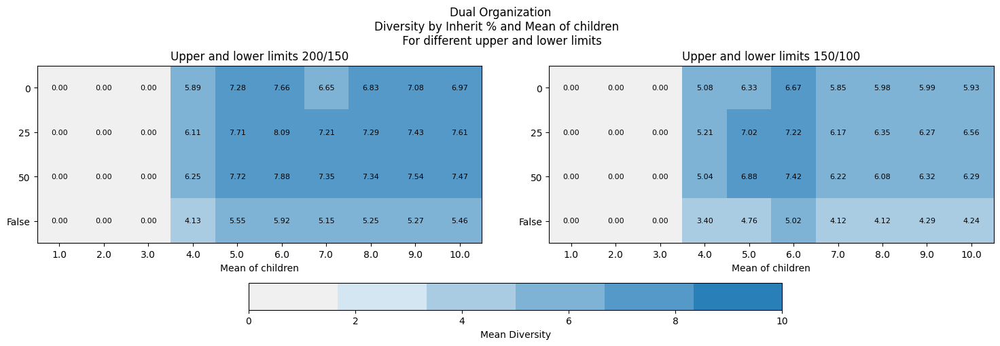

In [54]:
visualize_diversity(DcM_datos, inherits, Dcalphas, 'Dual Organization', up_low_limits, variable='Mean of children', vis_type='heatmap')

C:\Users\jsolm\Juancho\Juancho\Maestrías\Modelage en Sistemas Complejos\Tesis\Projecto\Modelo\modelo_mio\Agrobiodiversity-model\venv\lib\site-packages\numpy\_core\fromnumeric.py:3596: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\jsolm\Juancho\Juancho\Maestrías\Modelage en Sistemas Complejos\Tesis\Projecto\Modelo\modelo_mio\Agrobiodiversity-model\venv\lib\site-packages\numpy\_core\_methods.py:138: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\jsolm\Juancho\Juancho\Maestrías\Modelage en Sistemas Complejos\Tesis\Projecto\Modelo\modelo_mio\Agrobiodiversity-model\venv\lib\site-packages\numpy\_core\_methods.py:218: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\jsolm\Juancho\Juancho\Maestrías\Modelage en Sistemas Complejos\Tesis\Projecto\Modelo\modelo_mio\Agrobiodiversity-model\venv\lib\site-packages\numpy\_core

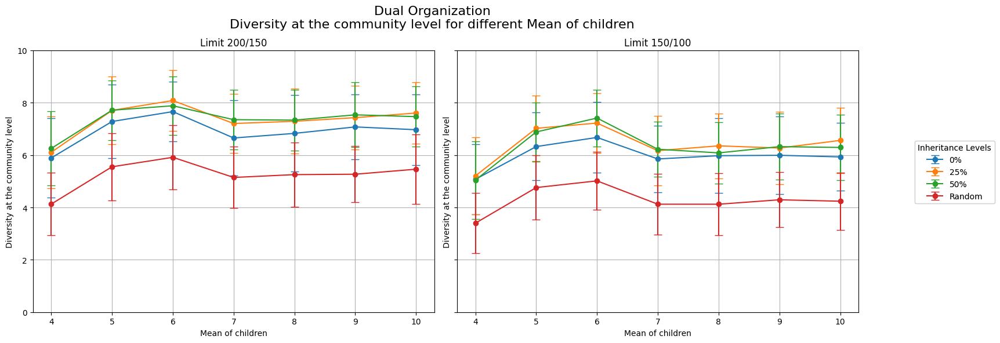

In [14]:
visualize_diversity(DcM_datos, inherits, Dcalphas, 'Dual Organization', up_low_limits, variable='Mean of children', vis_type='transversal')

## Pop dynamics

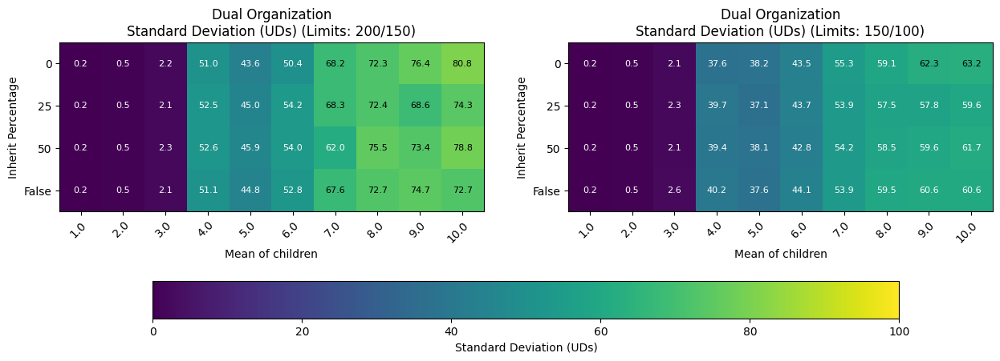

In [15]:
visualize_heatmap(DcM_datos, inherits, Dcalphas, 'Dual Organization', variable='Mean of children', up_low_limits=up_low_limits, heatmap_type='std')

## Mean varieties

In [6]:
# This experiment has different values for Initial varieties mv
prob_morte = 0.06 #beta
media = 4 # Mean
m = 40
mv = 10
inherits = [0,25,50, 'False'] #Values for inherit
# inherits = [0,25,50] #Values for inherit
Dmvalphas = np.linspace(1,mv,mv)# Mean varieties from 1 to mv
up_low_limits = [[200, 150], [150, 100]]
# For data of behaviour
vM = np.empty((len(inherits), len(Dmvalphas), len(up_low_limits)), dtype=object) # alive, mean and diversity levels

punto_vista = 50
tiempo = 1000
tempo = list(range(0,tiempo+1,punto_vista))
experiments = 130


print(vM.shape)
start = time.time()
print(f"started at:  {datetime.now()}")
for i, inherit in enumerate(inherits):
    for j, mvarieties  in enumerate(Dmvalphas):
        for k, (upper_limit, lower_limit) in enumerate(up_low_limits):
            star_configuration = time.time()
            #For population dynamics
            list_alive_UDs = []
            list_vivas_puntos_vista = []
            tasas_crecimiento = []
            #For diversity dynamics
            data_step_mean_var_ud = []
            data_step_var_system = []
            data_step_unique_system = []
            print(f"Experiments with inheritance {inherit} Initial UDs {m} and Mean varieties {mvarieties}")
            #Lists to store experiments' diversity data
            data_endo_mean_ud = []
            data_endo_com_level = []
            data_endo_total_varieties = []
            original_media = media
            #To see how frequent goes to extintion
            contador = 0
            for experiment in range(1, experiments+1):
                print(f'experimento {experiment}')
                ## Clans
                clans = (list(range(1, 2 + 1)) * (int(m) // 2)) # Just 2 clans
                random.shuffle(clans)
                if inherit != 'False':
                    #### Initialization
                    UD_dual_organization.uds = {}
                    instancias_ud = []
                    for id_ud in range(1, int(m) + 1):
                        instancias_ud.append(UD_dual_organization(id_ud, media, clans.pop()))
                    ## Varieties
                    limited_varieties = True
                    if limited_varieties == False:
                        for id_ud, ud in UD_dual_organization.uds.items():
                            for _ in range(3):
                                ud.varieties.append(Variety())
                    else:
                        initial_varieties = [Variety() for _ in range (int(10))]
                        for ud in UD_dual_organization.uds.values():
                            for _ in range(int(mvarieties)):
                                ud.varieties.append(random.choice(initial_varieties))   
                    # Lists for graphs
                    vivas_puntos_vista = [int(m)]
                    vivas_tasa_crecimiento = [int(m)]
            #             mortas_puntos_vista = [0]
                    #For diversity
                    mean_var_ud = []
                    var_system = []
                    unique_system = []
                    var_ud = []
                    var_total = []
                    for ud in [ud for ud in UD_dual_organization.uds.values() if ud.activa ==True]:
                        var_ud.append(len(ud.varieties))
                        for variety in ud.varieties:
                            var_total.append(variety.variety_id)
                    mean_var_ud.append(np.mean(var_ud))
                    var_system.append(len(var_total))
                    unique_system.append(len(set(var_total)))
                    # Simulation
                    for t in range(1, tiempo):
                        uds_copy = {id_ud: ud for id_ud, ud in UD_dual_organization.uds.items() if ud.activa}
                        items = list(uds_copy.items())
                        random.shuffle(items)
                        uds_copy = dict(items)
                        alive = len(uds_copy)
                        if alive > upper_limit and (media == original_media):
                            media -= media//2
                            if media >= 4:
                                media = media //2
                        elif alive < lower_limit and media < original_media:
                            media = original_media
                        if not uds_copy: #Extintion
                            # Only 0
                            print(f"acabó en 0 el experimento {experiment} con herencia {inherits[i]} con unidades {Dmvalphas[j]}")
                            vivas_puntos_vista.extend([0] * (int((tiempo/punto_vista)-(len(vivas_puntos_vista)))))
                            vivas_tasa_crecimiento.extend([0] * (int((tiempo)-(len(vivas_tasa_crecimiento)))))
                            contador += 1
                            break         
                        # Cycle:
                        for id_ud, ud in uds_copy.items():
                            ud.ter_filho()
                            ud.buscar_ud(uds_copy, int(media), inherit, True, 0.2)
                            ud.incrementar_idade()
                            ud.death_probability(prob_morte)
                        # Collecting data
                        vivas_tasa_crecimiento.append(len([ud for id, ud in uds_copy.items() if ud.activa]))
                        if t % punto_vista == 0:
                            viv = len([ud for id, ud in uds_copy.items() if ud.activa])
                            #mort = len([ud for id, ud in uds_copy.items() if not ud.activa])
                            vivas_puntos_vista.append(viv)
                            # For diversity
                            var_ud = []
                            var_total = []
                            for ud in [ud for ud in UD_dual_organization.uds.values() if ud.activa ==True]:
                                var_ud.append(len(ud.varieties))
                                for variety in ud.varieties:
                                    var_total.append(variety.variety_id)
                            mean_var_ud.append(np.mean(var_ud))
                            var_system.append(len(var_total))
                            unique_system.append(len(set(var_total))) 
                    viv = len([ud for id, ud in UD_dual_organization.uds.items() if ud.activa])
                    vivas_puntos_vista.append(viv)
                    # For diversity
                    var_ud = []
                    var_total = []
                    for ud in [ud for ud in UD_dual_organization.uds.values() if ud.activa ==True]:
                        var_ud.append(len(ud.varieties))
                        for variety in ud.varieties:
                            var_total.append(variety.variety_id)
                    mean_var_ud.append(np.mean(var_ud))
                    var_system.append(len(var_total))
                    unique_system.append(len(set(var_total)))
                    alive = (len([ud for id, ud in uds_copy.items() if ud.activa]))
                    if alive >= 1:   
                        total_varieties = []
                        varieties_per_UD = []
                        for ud in [ud for ud in UD_dual_organization.uds.values() if ud.activa ==True]:
                            varieties_per_UD.append(len(ud.varieties))
                            for variety in ud.varieties:
                                total_varieties.append(variety.variety_id)
                        data_endo_mean_ud.append(np.mean(varieties_per_UD))
                        data_endo_com_level.append(len(set(total_varieties)))
                        data_endo_total_varieties.append(total_varieties)

                else:# Now with inherit == False
                    #### Initialization
                    UD_dual_organization_al_inh.uds = {}
                    instancias_ud = []
                    for id_ud in range(1, int(m) + 1):
                        instancias_ud.append(UD_dual_organization_al_inh(id_ud, media, clans.pop()))
                    ## Varieties
                    limited_varieties = True
                    if limited_varieties == False:
                        for id_ud, ud in UD_dual_organization_al_inh.uds.items():
                            for _ in range(3):
                                ud.varieties.append(Variety())
                    else:
                        initial_varieties = [Variety() for _ in range (int(10))]
                        for ud in UD_dual_organization_al_inh.uds.values():
                            for _ in range(int(mvarieties)):
                                ud.varieties.append(random.choice(initial_varieties))   
                    # Lists for graphs
                    vivas_puntos_vista = [int(m)]
                    vivas_tasa_crecimiento = [int(m)]
            #             mortas_puntos_vista = [0]
                    #For diversity
                    mean_var_ud = []
                    var_system = []
                    unique_system = []
                    var_ud = []
                    var_total = []
                    for ud in [ud for ud in UD_dual_organization_al_inh.uds.values() if ud.activa ==True]:
                        var_ud.append(len(ud.varieties))
                        for variety in ud.varieties:
                            var_total.append(variety.variety_id)
                    mean_var_ud.append(np.mean(var_ud))
                    var_system.append(len(var_total))
                    unique_system.append(len(set(var_total)))
                    # Simulation
                    for t in range(1, tiempo):
                        uds_copy = {id_ud: ud for id_ud, ud in UD_dual_organization_al_inh.uds.items() if ud.activa}
                        items = list(uds_copy.items())
                        random.shuffle(items)
                        uds_copy = dict(items)
                        alive = len(uds_copy)
                        if alive > upper_limit and (media == original_media):
                            media -= media//2
                            if media >= 4:
                                media = media //2
                        elif alive < lower_limit and media < original_media:
                            media = original_media
                        if not uds_copy: #Extintion
                            # Only 0
                            print(f"acabó en 0 el experimento {experiment} con herencia {inherits[i]} con unidades {Dmvalphas[j]}")
                            vivas_puntos_vista.extend([0] * (int((tiempo/punto_vista)-(len(vivas_puntos_vista)))))
                            vivas_tasa_crecimiento.extend([0] * (int((tiempo)-(len(vivas_tasa_crecimiento)))))
                            contador += 1
                            break         
                        # Cycle:
                        varieties_list = [var for ud in uds_copy.values() for var in ud.varieties]
                        for id_ud, ud in uds_copy.items():
                            ud.ter_filho()
                            ud.buscar_ud(uds_copy, int(media), varieties_list, True, int(mvarieties), 0.2)
                            ud.incrementar_idade()
                            ud.death_probability(prob_morte)
                        # Collecting data
                        vivas_tasa_crecimiento.append(len([ud for id, ud in uds_copy.items() if ud.activa]))
                        if t % punto_vista == 0:
                            viv = len([ud for id, ud in uds_copy.items() if ud.activa])
                            #mort = len([ud for id, ud in uds_copy.items() if not ud.activa])
                            vivas_puntos_vista.append(viv)
                            # For diversity
                            var_ud = []
                            var_total = []
                            for ud in [ud for ud in UD_dual_organization_al_inh.uds.values() if ud.activa ==True]:
                                var_ud.append(len(ud.varieties))
                                for variety in ud.varieties:
                                    var_total.append(variety.variety_id)
                            mean_var_ud.append(np.mean(var_ud))
                            var_system.append(len(var_total))
                            unique_system.append(len(set(var_total))) 
                    viv = len([ud for id, ud in UD_dual_organization_al_inh.uds.items() if ud.activa])
                    vivas_puntos_vista.append(viv)
                    # For diversity
                    var_ud = []
                    var_total = []
                    for ud in [ud for ud in UD_dual_organization_al_inh.uds.values() if ud.activa ==True]:
                        var_ud.append(len(ud.varieties))
                        for variety in ud.varieties:
                            var_total.append(variety.variety_id)
                    mean_var_ud.append(np.mean(var_ud))
                    var_system.append(len(var_total))
                    unique_system.append(len(set(var_total)))
                    alive = (len([ud for id, ud in uds_copy.items() if ud.activa]))
                    if alive >= 1:   
                        total_varieties = []
                        varieties_per_UD = []
                        for ud in [ud for ud in UD_dual_organization_al_inh.uds.values() if ud.activa ==True]:
                            varieties_per_UD.append(len(ud.varieties))
                            for variety in ud.varieties:
                                total_varieties.append(variety.variety_id)
                        data_endo_mean_ud.append(np.mean(varieties_per_UD))
                        data_endo_com_level.append(len(set(total_varieties)))
                        data_endo_total_varieties.append(total_varieties)


                #Final colect of the data after the simulation!
                indice_primer_cero = np.where(np.array(vivas_tasa_crecimiento) == 0)[0]            
                if len(indice_primer_cero) > 0:
                    # Get growth rate before the 0
                    tasas_crecimiento.append(np.diff(vivas_tasa_crecimiento[:indice_primer_cero[0] - 1]) / vivas_tasa_crecimiento[:-1][:indice_primer_cero[0] - 2] * 100)
                else:
                    # Growth rate
                    tasas_crecimiento.append(np.diff(vivas_tasa_crecimiento) / vivas_tasa_crecimiento[:-1] * 100)
                # Collect the data
                list_alive_UDs.append(len([ud for id, ud in uds_copy.items() if ud.activa == True])) #For heatmap
                list_vivas_puntos_vista.append(vivas_puntos_vista)
                if alive >= 1:
                    if len(mean_var_ud) == len(tempo):        
                        data_step_var_system.append(var_system)
                        data_step_unique_system.append(unique_system)
                        data_step_mean_var_ud.append(mean_var_ud)

                data_inherit_endo = [data_endo_mean_ud, data_endo_com_level, data_endo_total_varieties]
            data_steps_inherit_endo = [data_step_var_system, data_step_unique_system, data_step_mean_var_ud]
            media = original_media
            end_config = time.time()
            vM[i][j][k] = {'alive': np.mean(list_alive_UDs),
                        'std': np.std(list_alive_UDs),
                        'time used': end_config - star_configuration,
                        'porcentage_extintion': contador/experiments,
                        'tempo': tempo, 
                        'mean': np.mean(list_vivas_puntos_vista, axis=0), 
                        'std':  np.std(list_vivas_puntos_vista, axis=0),
                        'growth rate': np.mean([np.mean(lista) for lista in tasas_crecimiento]),
                        'diversity_info': data_inherit_endo,
                        'diversity_info_steps': data_steps_inherit_endo}
            print(f"""
    The total time of the configuration of inherit percentage {inherit}, 
      initial UDs {m} and Mean varieties {mvarieties} is  {end_config - star_configuration}
            """)
# Folder
folder_name = 'Experiments_kinship_inheritance_parameters_limits'
if not os.path.exists(folder_name):
    os.makedirs(folder_name)
# Heatmap and std
heat_std = os.path.join(folder_name, 'Dual_Initial_Mean_varieties.npy')
np.save(heat_std, vM)
now = datetime.now()
finish = time.time()
print(f"""
It finished at: {now}
It lasted {finish-start}
""")
print("done")

(4, 10, 2)
started at:  2024-11-16 00:08:57.520026
Experiments with inheritance 0 Initial UDs 40 and Mean varieties 1.0
experimento 1
experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
acabó en 0 el experimento 7 con herencia 0 con unidades 1.0


C:\Users\jsolm\Juancho\Juancho\Maestrías\Modelage en Sistemas Complejos\Tesis\Projecto\Modelo\modelo_mio\Agrobiodiversity-model\venv\lib\site-packages\numpy\_core\fromnumeric.py:3596: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\jsolm\Juancho\Juancho\Maestrías\Modelage en Sistemas Complejos\Tesis\Projecto\Modelo\modelo_mio\Agrobiodiversity-model\venv\lib\site-packages\numpy\_core\_methods.py:138: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
acabó en 0 el experimento 13 con herencia 0 con unidades 1.0
experimento 14
experimento 15
acabó en 0 el experimento 15 con herencia 0 con unidades 1.0
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
acabó en 0 el experimento 27 con herencia 0 con unidades 1.0
experimento 28
experimento 29
acabó en 0 el experimento 29 con herencia 0 con unidades 1.0
experimento 30
acabó en 0 el experimento 30 con herencia 0 con unidades 1.0
experimento 31
experimento 32
experimento 33
experimento 34
acabó en 0 el experimento 34 con herencia 0 con unidades 1.0
experimento 35
experimento 36
experimento 37
experimento 38
experimento 39
acabó en 0 el experimento 39 con herencia 0 con unidades 1.0
experimento 40
experimento 41
experimento 42
experimento 43
experimento 44
experimento 45
exper

experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
acabó en 0 el experimento 27 con herencia 0 con unidades 2.0
experimento 28
experimento 29
acabó en 0 el experimento 29 con herencia 0 con unidades 2.0
experimento 30
experimento 31
experimento 32
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
experimento 38
experimento 39
experimento 40
experimento 41
acabó en 0 el experimento 41 con herencia 0 con unidades 2.0
experimento 42
experimento 43
experimento 44
acabó en 0 el experimento 44 con herencia 0 con unidades 2.0
experimento 45
experimento 46
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52

experimento 44
experimento 45
acabó en 0 el experimento 45 con herencia 0 con unidades 3.0
experimento 46
acabó en 0 el experimento 46 con herencia 0 con unidades 3.0
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
acabó en 0 el experimento 53 con herencia 0 con unidades 3.0
experimento 54
experimento 55
experimento 56
experimento 57
acabó en 0 el experimento 57 con herencia 0 con unidades 3.0
experimento 58
experimento 59
acabó en 0 el experimento 59 con herencia 0 con unidades 3.0
experimento 60
experimento 61
experimento 62
acabó en 0 el experimento 62 con herencia 0 con unidades 3.0
experimento 63
experimento 64
experimento 65
experimento 66
experimento 67
experimento 68
experimento 69
experimento 70
experimento 71
experimento 72
experimento 73
experimento 74
experimento 75
acabó en 0 el experimento 75 con herencia 0 con unidades 3.0
experimento 76
experimento 77
experimento 78
experimento 79
experimento 80
experimento 81
exp

experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
experimento 67
experimento 68
experimento 69
experimento 70
experimento 71
acabó en 0 el experimento 71 con herencia 0 con unidades 4.0
experimento 72
experimento 73
experimento 74
experimento 75
experimento 76
acabó en 0 el experimento 76 con herencia 0 con unidades 4.0
experimento 77
experimento 78
experimento 79
acabó en 0 el experimento 79 con herencia 0 con unidades 4.0
experimento 80
experimento 81
experimento 82
acabó en 0 el experimento 82 con herencia 0 con unidades 4.0
experimento 83
experimento 84
acabó en 0 el experimento 84 con herencia 0 con unidades 4.0
experimento 85
experimento 86
experimento 87
experimento 88
experimento 89
experimento 90
experimento 91
acabó en 0 el experimento 91 con herencia 0 con unidades 4.0
experimento 92
experimento 93
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
expe

experimento 60
acabó en 0 el experimento 60 con herencia 0 con unidades 5.0
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
experimento 67
experimento 68
experimento 69
acabó en 0 el experimento 69 con herencia 0 con unidades 5.0
experimento 70
experimento 71
experimento 72
experimento 73
experimento 74
experimento 75
acabó en 0 el experimento 75 con herencia 0 con unidades 5.0
experimento 76
experimento 77
experimento 78
experimento 79
acabó en 0 el experimento 79 con herencia 0 con unidades 5.0
experimento 80
experimento 81
experimento 82
acabó en 0 el experimento 82 con herencia 0 con unidades 5.0
experimento 83
experimento 84
experimento 85
experimento 86
experimento 87
experimento 88
experimento 89
acabó en 0 el experimento 89 con herencia 0 con unidades 5.0
experimento 90
experimento 91
experimento 92
experimento 93
acabó en 0 el experimento 93 con herencia 0 con unidades 5.0
experimento 94
experimento 95
acabó en 0 el experimento 95 con 

experimento 90
experimento 91
experimento 92
experimento 93
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
acabó en 0 el experimento 98 con herencia 0 con unidades 6.0
experimento 99
experimento 100
experimento 101
experimento 102
experimento 103
experimento 104
experimento 105
experimento 106
experimento 107
experimento 108
experimento 109
experimento 110
experimento 111
experimento 112
experimento 113
acabó en 0 el experimento 113 con herencia 0 con unidades 6.0
experimento 114
experimento 115
experimento 116
experimento 117
experimento 118
experimento 119
experimento 120
experimento 121
acabó en 0 el experimento 121 con herencia 0 con unidades 6.0
experimento 122
experimento 123
acabó en 0 el experimento 123 con herencia 0 con unidades 6.0
experimento 124
experimento 125
experimento 126
experimento 127
experimento 128
experimento 129
experimento 130

    The total time of the configuration of inherit percentage 0, 
      initial UDs 40 and Mean varieties 

acabó en 0 el experimento 119 con herencia 0 con unidades 7.0
experimento 120
acabó en 0 el experimento 120 con herencia 0 con unidades 7.0
experimento 121
experimento 122
experimento 123
experimento 124
acabó en 0 el experimento 124 con herencia 0 con unidades 7.0
experimento 125
experimento 126
experimento 127
experimento 128
experimento 129
experimento 130
acabó en 0 el experimento 130 con herencia 0 con unidades 7.0

    The total time of the configuration of inherit percentage 0, 
      initial UDs 40 and Mean varieties 7.0 is  420.0034885406494
            
Experiments with inheritance 0 Initial UDs 40 and Mean varieties 7.0
experimento 1
experimento 2
experimento 3
acabó en 0 el experimento 3 con herencia 0 con unidades 7.0
experimento 4
experimento 5
experimento 6
experimento 7
acabó en 0 el experimento 7 con herencia 0 con unidades 7.0
experimento 8
experimento 9
experimento 10
acabó en 0 el experimento 10 con herencia 0 con unidades 7.0
experimento 11
experimento 12
experimen

experimento 122
experimento 123
acabó en 0 el experimento 123 con herencia 0 con unidades 8.0
experimento 124
experimento 125
acabó en 0 el experimento 125 con herencia 0 con unidades 8.0
experimento 126
experimento 127
experimento 128
experimento 129
acabó en 0 el experimento 129 con herencia 0 con unidades 8.0
experimento 130
acabó en 0 el experimento 130 con herencia 0 con unidades 8.0

    The total time of the configuration of inherit percentage 0, 
      initial UDs 40 and Mean varieties 8.0 is  421.8531560897827
            
Experiments with inheritance 0 Initial UDs 40 and Mean varieties 8.0
experimento 1
experimento 2
experimento 3
experimento 4
acabó en 0 el experimento 4 con herencia 0 con unidades 8.0
experimento 5
acabó en 0 el experimento 5 con herencia 0 con unidades 8.0
experimento 6
experimento 7
experimento 8
experimento 9
acabó en 0 el experimento 9 con herencia 0 con unidades 8.0
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 

acabó en 0 el experimento 3 con herencia 0 con unidades 9.0
experimento 4
acabó en 0 el experimento 4 con herencia 0 con unidades 9.0
experimento 5
experimento 6
experimento 7
acabó en 0 el experimento 7 con herencia 0 con unidades 9.0
experimento 8
acabó en 0 el experimento 8 con herencia 0 con unidades 9.0
experimento 9
acabó en 0 el experimento 9 con herencia 0 con unidades 9.0
experimento 10
experimento 11
experimento 12
acabó en 0 el experimento 12 con herencia 0 con unidades 9.0
experimento 13
experimento 14
acabó en 0 el experimento 14 con herencia 0 con unidades 9.0
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
acabó en 0 el experimento 20 con herencia 0 con unidades 9.0
experimento 21
experimento 22
experimento 23
acabó en 0 el experimento 23 con herencia 0 con unidades 9.0
experimento 24
experimento 25
experimento 26
experimento 27
acabó en 0 el experimento 27 con herencia 0 con unidades 9.0
experimento 28
experimento 29
experimento

experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
acabó en 0 el experimento 8 con herencia 0 con unidades 10.0
experimento 9
experimento 10
experimento 11
acabó en 0 el experimento 11 con herencia 0 con unidades 10.0
experimento 12
experimento 13
experimento 14
acabó en 0 el experimento 14 con herencia 0 con unidades 10.0
experimento 15
experimento 16
experimento 17
acabó en 0 el experimento 17 con herencia 0 con unidades 10.0
experimento 18
experimento 19
acabó en 0 el experimento 19 con herencia 0 con unidades 10.0
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
acabó en 0 el experimento 25 con herencia 0 con unidades 10.0
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
acabó en 0 el experimento 31 con herencia 0 con unidades 10.0
experimento 32
acabó en 0 el experimento 32 con herencia 0 con unidades 10.0
experimento 33
acabó en 0 el experimento 33 con herencia 0 con unidades 10.0

acabó en 0 el experimento 13 con herencia 25 con unidades 1.0
experimento 14
experimento 15
experimento 16
experimento 17
acabó en 0 el experimento 17 con herencia 25 con unidades 1.0
experimento 18
acabó en 0 el experimento 18 con herencia 25 con unidades 1.0
experimento 19
experimento 20
experimento 21
acabó en 0 el experimento 21 con herencia 25 con unidades 1.0
experimento 22
acabó en 0 el experimento 22 con herencia 25 con unidades 1.0
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
acabó en 0 el experimento 29 con herencia 25 con unidades 1.0
experimento 30
experimento 31
experimento 32
acabó en 0 el experimento 32 con herencia 25 con unidades 1.0
experimento 33
experimento 34
acabó en 0 el experimento 34 con herencia 25 con unidades 1.0
experimento 35
experimento 36
acabó en 0 el experimento 36 con herencia 25 con unidades 1.0
experimento 37
experimento 38
experimento 39
experimento 40
experimento 41
experimento 42
experim

acabó en 0 el experimento 12 con herencia 25 con unidades 2.0
experimento 13
experimento 14
experimento 15
experimento 16
acabó en 0 el experimento 16 con herencia 25 con unidades 2.0
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
acabó en 0 el experimento 22 con herencia 25 con unidades 2.0
experimento 23
acabó en 0 el experimento 23 con herencia 25 con unidades 2.0
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
acabó en 0 el experimento 29 con herencia 25 con unidades 2.0
experimento 30
experimento 31
experimento 32
experimento 33
acabó en 0 el experimento 33 con herencia 25 con unidades 2.0
experimento 34
experimento 35
experimento 36
experimento 37
acabó en 0 el experimento 37 con herencia 25 con unidades 2.0
experimento 38
experimento 39
acabó en 0 el experimento 39 con herencia 25 con unidades 2.0
experimento 40
acabó en 0 el experimento 40 con herencia 25 con unidades 2.0
experimento 41
experim

experimento 15
experimento 16
experimento 17
experimento 18
acabó en 0 el experimento 18 con herencia 25 con unidades 3.0
experimento 19
experimento 20
acabó en 0 el experimento 20 con herencia 25 con unidades 3.0
experimento 21
experimento 22
acabó en 0 el experimento 22 con herencia 25 con unidades 3.0
experimento 23
acabó en 0 el experimento 23 con herencia 25 con unidades 3.0
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
acabó en 0 el experimento 29 con herencia 25 con unidades 3.0
experimento 30
experimento 31
acabó en 0 el experimento 31 con herencia 25 con unidades 3.0
experimento 32
experimento 33
experimento 34
acabó en 0 el experimento 34 con herencia 25 con unidades 3.0
experimento 35
acabó en 0 el experimento 35 con herencia 25 con unidades 3.0
experimento 36
acabó en 0 el experimento 36 con herencia 25 con unidades 3.0
experimento 37
acabó en 0 el experimento 37 con herencia 25 con unidades 3.0
experimento 38
experimento 39
exper

experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
acabó en 0 el experimento 29 con herencia 25 con unidades 4.0
experimento 30
experimento 31
experimento 32
experimento 33
experimento 34
acabó en 0 el experimento 34 con herencia 25 con unidades 4.0
experimento 35
acabó en 0 el experimento 35 con herencia 25 con unidades 4.0
experimento 36
acabó en 0 el experimento 36 con herencia 25 con unidades 4.0
experimento 37
experimento 38
experimento 39
experimento 40
experimento 41
experimento 42
experimento 43
experimento 44
experimento 45
experimento 46
acabó en 0 el experimento 46 con herencia 25 con unidades 4.0
experimento 47
acabó en 0 el experimento 47 con herencia 25 con unidades 4.0
experimento 48
experimento 49
acabó en 0 el experimento 49 con herencia 25 con unidades 4.0
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
acabó en 0 el experimento 55 con herencia 25 con unidades 4.0
experimento 56
experimento 57
experimen

experimento 40
experimento 41
experimento 42
acabó en 0 el experimento 42 con herencia 25 con unidades 5.0
experimento 43
acabó en 0 el experimento 43 con herencia 25 con unidades 5.0
experimento 44
experimento 45
experimento 46
experimento 47
experimento 48
acabó en 0 el experimento 48 con herencia 25 con unidades 5.0
experimento 49
experimento 50
experimento 51
experimento 52
acabó en 0 el experimento 52 con herencia 25 con unidades 5.0
experimento 53
acabó en 0 el experimento 53 con herencia 25 con unidades 5.0
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
acabó en 0 el experimento 62 con herencia 25 con unidades 5.0
experimento 63
experimento 64
experimento 65
experimento 66
experimento 67
experimento 68
experimento 69
experimento 70
experimento 71
experimento 72
acabó en 0 el experimento 72 con herencia 25 con unidades 5.0
experimento 73
experimento 74
experimento 75
experimento 76
experimento

experimento 61
acabó en 0 el experimento 61 con herencia 25 con unidades 6.0
experimento 62
acabó en 0 el experimento 62 con herencia 25 con unidades 6.0
experimento 63
acabó en 0 el experimento 63 con herencia 25 con unidades 6.0
experimento 64
experimento 65
acabó en 0 el experimento 65 con herencia 25 con unidades 6.0
experimento 66
experimento 67
experimento 68
experimento 69
experimento 70
experimento 71
acabó en 0 el experimento 71 con herencia 25 con unidades 6.0
experimento 72
experimento 73
acabó en 0 el experimento 73 con herencia 25 con unidades 6.0
experimento 74
acabó en 0 el experimento 74 con herencia 25 con unidades 6.0
experimento 75
experimento 76
experimento 77
experimento 78
acabó en 0 el experimento 78 con herencia 25 con unidades 6.0
experimento 79
experimento 80
experimento 81
experimento 82
experimento 83
acabó en 0 el experimento 83 con herencia 25 con unidades 6.0
experimento 84
experimento 85
experimento 86
experimento 87
acabó en 0 el experimento 87 con here

experimento 73
experimento 74
experimento 75
acabó en 0 el experimento 75 con herencia 25 con unidades 7.0
experimento 76
experimento 77
experimento 78
experimento 79
experimento 80
acabó en 0 el experimento 80 con herencia 25 con unidades 7.0
experimento 81
acabó en 0 el experimento 81 con herencia 25 con unidades 7.0
experimento 82
acabó en 0 el experimento 82 con herencia 25 con unidades 7.0
experimento 83
acabó en 0 el experimento 83 con herencia 25 con unidades 7.0
experimento 84
experimento 85
acabó en 0 el experimento 85 con herencia 25 con unidades 7.0
experimento 86
experimento 87
experimento 88
experimento 89
experimento 90
experimento 91
experimento 92
experimento 93
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100
experimento 101
acabó en 0 el experimento 101 con herencia 25 con unidades 7.0
experimento 102
experimento 103
experimento 104
experimento 105
experimento 106
acabó en 0 el experimento 106 con herencia 25 co

acabó en 0 el experimento 99 con herencia 25 con unidades 8.0
experimento 100
experimento 101
experimento 102
acabó en 0 el experimento 102 con herencia 25 con unidades 8.0
experimento 103
experimento 104
acabó en 0 el experimento 104 con herencia 25 con unidades 8.0
experimento 105
experimento 106
experimento 107
experimento 108
experimento 109
experimento 110
experimento 111
experimento 112
experimento 113
experimento 114
experimento 115
experimento 116
acabó en 0 el experimento 116 con herencia 25 con unidades 8.0
experimento 117
acabó en 0 el experimento 117 con herencia 25 con unidades 8.0
experimento 118
experimento 119
experimento 120
acabó en 0 el experimento 120 con herencia 25 con unidades 8.0
experimento 121
acabó en 0 el experimento 121 con herencia 25 con unidades 8.0
experimento 122
experimento 123
experimento 124
experimento 125
acabó en 0 el experimento 125 con herencia 25 con unidades 8.0
experimento 126
experimento 127
experimento 128
experimento 129
experimento 130



experimento 122
experimento 123
acabó en 0 el experimento 123 con herencia 25 con unidades 9.0
experimento 124
experimento 125
experimento 126
acabó en 0 el experimento 126 con herencia 25 con unidades 9.0
experimento 127
experimento 128
experimento 129
experimento 130

    The total time of the configuration of inherit percentage 25, 
      initial UDs 40 and Mean varieties 9.0 is  280.2817814350128
            
Experiments with inheritance 25 Initial UDs 40 and Mean varieties 10.0
experimento 1
experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
acabó en 0 el experimento 21 con herencia 25 con unidades 10.0
experimento 22
experimento 23
acabó en 0 el experimento 23 con herencia 25 con unidades 10.0
experimento 24
experimento 25
experimento 26
exper

experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
acabó en 0 el experimento 27 con herencia 50 con unidades 1.0
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
experimento 34
acabó en 0 el experimento 34 con herencia 50 con unidades 1.0
experimento 35
experimento 36
experimento 37
acabó en 0 el experimento 37 con herencia 50 con unidades 1.0
experimento 38
experimento 39
experimento 40
experimento 41
experimento 42
experimento 43
experimento 44
experimento 45
experimento 46
experimento 47
experimento 48
experimento 49
acabó en 0 el experimento 49 con herencia 50 con unidades 1.0
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
acabó en 0 el experimento 60 con herencia 50 con unidades 1.0
experimento 61
experimento 62
experimento 63


experimento 53
acabó en 0 el experimento 53 con herencia 50 con unidades 2.0
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
acabó en 0 el experimento 60 con herencia 50 con unidades 2.0
experimento 61
experimento 62
experimento 63
experimento 64
acabó en 0 el experimento 64 con herencia 50 con unidades 2.0
experimento 65
experimento 66
acabó en 0 el experimento 66 con herencia 50 con unidades 2.0
experimento 67
experimento 68
experimento 69
experimento 70
acabó en 0 el experimento 70 con herencia 50 con unidades 2.0
experimento 71
experimento 72
experimento 73
experimento 74
acabó en 0 el experimento 74 con herencia 50 con unidades 2.0
experimento 75
experimento 76
acabó en 0 el experimento 76 con herencia 50 con unidades 2.0
experimento 77
experimento 78
acabó en 0 el experimento 78 con herencia 50 con unidades 2.0
experimento 79
experimento 80
acabó en 0 el experimento 80 con herencia 50 con unidades 2.0
experimento 81
experim

experimento 51
acabó en 0 el experimento 51 con herencia 50 con unidades 3.0
experimento 52
experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
acabó en 0 el experimento 59 con herencia 50 con unidades 3.0
experimento 60
experimento 61
experimento 62
acabó en 0 el experimento 62 con herencia 50 con unidades 3.0
experimento 63
experimento 64
experimento 65
acabó en 0 el experimento 65 con herencia 50 con unidades 3.0
experimento 66
acabó en 0 el experimento 66 con herencia 50 con unidades 3.0
experimento 67
experimento 68
experimento 69
experimento 70
experimento 71
experimento 72
experimento 73
experimento 74
experimento 75
experimento 76
acabó en 0 el experimento 76 con herencia 50 con unidades 3.0
experimento 77
experimento 78
experimento 79
experimento 80
experimento 81
experimento 82
experimento 83
acabó en 0 el experimento 83 con herencia 50 con unidades 3.0
experimento 84
experimento 85
experimento 86
experimento 87
experimento

experimento 69
experimento 70
experimento 71
experimento 72
experimento 73
experimento 74
acabó en 0 el experimento 74 con herencia 50 con unidades 4.0
experimento 75
experimento 76
acabó en 0 el experimento 76 con herencia 50 con unidades 4.0
experimento 77
acabó en 0 el experimento 77 con herencia 50 con unidades 4.0
experimento 78
acabó en 0 el experimento 78 con herencia 50 con unidades 4.0
experimento 79
experimento 80
experimento 81
acabó en 0 el experimento 81 con herencia 50 con unidades 4.0
experimento 82
experimento 83
acabó en 0 el experimento 83 con herencia 50 con unidades 4.0
experimento 84
experimento 85
experimento 86
experimento 87
experimento 88
experimento 89
experimento 90
experimento 91
experimento 92
experimento 93
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100
experimento 101
experimento 102
experimento 103
experimento 104
acabó en 0 el experimento 104 con herencia 50 con unidades 4.0
experimento 105
expe

experimento 75
experimento 76
experimento 77
experimento 78
experimento 79
experimento 80
experimento 81
experimento 82
acabó en 0 el experimento 82 con herencia 50 con unidades 5.0
experimento 83
experimento 84
experimento 85
experimento 86
experimento 87
experimento 88
experimento 89
experimento 90
experimento 91
experimento 92
acabó en 0 el experimento 92 con herencia 50 con unidades 5.0
experimento 93
experimento 94
experimento 95
acabó en 0 el experimento 95 con herencia 50 con unidades 5.0
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100
experimento 101
experimento 102
acabó en 0 el experimento 102 con herencia 50 con unidades 5.0
experimento 103
experimento 104
experimento 105
experimento 106
acabó en 0 el experimento 106 con herencia 50 con unidades 5.0
experimento 107
experimento 108
experimento 109
experimento 110
experimento 111
experimento 112
acabó en 0 el experimento 112 con herencia 50 con unidades 5.0
experimento 113
experimento 114
experiment

experimento 91
experimento 92
acabó en 0 el experimento 92 con herencia 50 con unidades 6.0
experimento 93
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100
experimento 101
acabó en 0 el experimento 101 con herencia 50 con unidades 6.0
experimento 102
experimento 103
experimento 104
experimento 105
experimento 106
experimento 107
experimento 108
experimento 109
acabó en 0 el experimento 109 con herencia 50 con unidades 6.0
experimento 110
experimento 111
acabó en 0 el experimento 111 con herencia 50 con unidades 6.0
experimento 112
experimento 113
experimento 114
acabó en 0 el experimento 114 con herencia 50 con unidades 6.0
experimento 115
experimento 116
experimento 117
acabó en 0 el experimento 117 con herencia 50 con unidades 6.0
experimento 118
experimento 119
experimento 120
experimento 121
experimento 122
experimento 123
experimento 124
experimento 125
experimento 126
experimento 127
experimento 128
experimento 129
experime

experimento 86
experimento 87
experimento 88
experimento 89
experimento 90
experimento 91
experimento 92
experimento 93
experimento 94
acabó en 0 el experimento 94 con herencia 50 con unidades 7.0
experimento 95
experimento 96
acabó en 0 el experimento 96 con herencia 50 con unidades 7.0
experimento 97
experimento 98
experimento 99
experimento 100
acabó en 0 el experimento 100 con herencia 50 con unidades 7.0
experimento 101
experimento 102
experimento 103
acabó en 0 el experimento 103 con herencia 50 con unidades 7.0
experimento 104
experimento 105
acabó en 0 el experimento 105 con herencia 50 con unidades 7.0
experimento 106
experimento 107
acabó en 0 el experimento 107 con herencia 50 con unidades 7.0
experimento 108
experimento 109
experimento 110
experimento 111
experimento 112
experimento 113
experimento 114
experimento 115
experimento 116
experimento 117
experimento 118
acabó en 0 el experimento 118 con herencia 50 con unidades 7.0
experimento 119
experimento 120
experimento 121

experimento 87
experimento 88
experimento 89
experimento 90
acabó en 0 el experimento 90 con herencia 50 con unidades 8.0
experimento 91
experimento 92
experimento 93
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100
acabó en 0 el experimento 100 con herencia 50 con unidades 8.0
experimento 101
experimento 102
experimento 103
experimento 104
experimento 105
experimento 106
experimento 107
experimento 108
acabó en 0 el experimento 108 con herencia 50 con unidades 8.0
experimento 109
experimento 110
experimento 111
experimento 112
acabó en 0 el experimento 112 con herencia 50 con unidades 8.0
experimento 113
experimento 114
experimento 115
experimento 116
experimento 117
experimento 118
experimento 119
experimento 120
experimento 121
experimento 122
experimento 123
experimento 124
experimento 125
experimento 126
acabó en 0 el experimento 126 con herencia 50 con unidades 8.0
experimento 127
experimento 128
experimento 129
experimento

experimento 93
experimento 94
acabó en 0 el experimento 94 con herencia 50 con unidades 9.0
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100
experimento 101
experimento 102
experimento 103
experimento 104
experimento 105
experimento 106
experimento 107
experimento 108
experimento 109
acabó en 0 el experimento 109 con herencia 50 con unidades 9.0
experimento 110
experimento 111
acabó en 0 el experimento 111 con herencia 50 con unidades 9.0
experimento 112
experimento 113
experimento 114
experimento 115
acabó en 0 el experimento 115 con herencia 50 con unidades 9.0
experimento 116
experimento 117
experimento 118
experimento 119
experimento 120
experimento 121
experimento 122
acabó en 0 el experimento 122 con herencia 50 con unidades 9.0
experimento 123
experimento 124
experimento 125
experimento 126
experimento 127
acabó en 0 el experimento 127 con herencia 50 con unidades 9.0
experimento 128
experimento 129
acabó en 0 el experimento 129 con here

experimento 117
acabó en 0 el experimento 117 con herencia 50 con unidades 10.0
experimento 118
experimento 119
experimento 120
experimento 121
experimento 122
experimento 123
experimento 124
experimento 125
experimento 126
experimento 127
experimento 128
experimento 129
experimento 130
acabó en 0 el experimento 130 con herencia 50 con unidades 10.0

    The total time of the configuration of inherit percentage 50, 
      initial UDs 40 and Mean varieties 10.0 is  493.14176058769226
            
Experiments with inheritance 50 Initial UDs 40 and Mean varieties 10.0
experimento 1
acabó en 0 el experimento 1 con herencia 50 con unidades 10.0
experimento 2
experimento 3
experimento 4
experimento 5
acabó en 0 el experimento 5 con herencia 50 con unidades 10.0
experimento 6
experimento 7
experimento 8
experimento 9
acabó en 0 el experimento 9 con herencia 50 con unidades 10.0
experimento 10
experimento 11
acabó en 0 el experimento 11 con herencia 50 con unidades 10.0
experimento 12
experime

experimento 109
experimento 110
experimento 111
experimento 112
acabó en 0 el experimento 112 con herencia False con unidades 1.0
experimento 113
experimento 114
acabó en 0 el experimento 114 con herencia False con unidades 1.0
experimento 115
acabó en 0 el experimento 115 con herencia False con unidades 1.0
experimento 116
experimento 117
experimento 118
acabó en 0 el experimento 118 con herencia False con unidades 1.0
experimento 119
experimento 120
experimento 121
experimento 122
acabó en 0 el experimento 122 con herencia False con unidades 1.0
experimento 123
experimento 124
experimento 125
experimento 126
experimento 127
experimento 128
experimento 129
experimento 130

    The total time of the configuration of inherit percentage False, 
      initial UDs 40 and Mean varieties 1.0 is  452.7671916484833
            
Experiments with inheritance False Initial UDs 40 and Mean varieties 1.0
experimento 1
experimento 2
experimento 3
experimento 4
acabó en 0 el experimento 4 con herenci

experimento 85
experimento 86
acabó en 0 el experimento 86 con herencia False con unidades 2.0
experimento 87
experimento 88
experimento 89
experimento 90
experimento 91
experimento 92
experimento 93
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100
experimento 101
acabó en 0 el experimento 101 con herencia False con unidades 2.0
experimento 102
experimento 103
acabó en 0 el experimento 103 con herencia False con unidades 2.0
experimento 104
experimento 105
acabó en 0 el experimento 105 con herencia False con unidades 2.0
experimento 106
experimento 107
acabó en 0 el experimento 107 con herencia False con unidades 2.0
experimento 108
experimento 109
experimento 110
experimento 111
experimento 112
acabó en 0 el experimento 112 con herencia False con unidades 2.0
experimento 113
experimento 114
experimento 115
experimento 116
experimento 117
acabó en 0 el experimento 117 con herencia False con unidades 2.0
experimento 118
experiment

experimento 74
experimento 75
experimento 76
experimento 77
experimento 78
experimento 79
experimento 80
experimento 81
experimento 82
experimento 83
experimento 84
experimento 85
experimento 86
experimento 87
experimento 88
experimento 89
experimento 90
experimento 91
experimento 92
acabó en 0 el experimento 92 con herencia False con unidades 3.0
experimento 93
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100
experimento 101
experimento 102
experimento 103
experimento 104
experimento 105
experimento 106
experimento 107
experimento 108
experimento 109
experimento 110
experimento 111
experimento 112
acabó en 0 el experimento 112 con herencia False con unidades 3.0
experimento 113
experimento 114
experimento 115
experimento 116
experimento 117
experimento 118
experimento 119
acabó en 0 el experimento 119 con herencia False con unidades 3.0
experimento 120
experimento 121
experimento 122
acabó en 0 el experimento 122 con herencia Fa

experimento 102
experimento 103
experimento 104
acabó en 0 el experimento 104 con herencia False con unidades 4.0
experimento 105
experimento 106
experimento 107
experimento 108
acabó en 0 el experimento 108 con herencia False con unidades 4.0
experimento 109
experimento 110
experimento 111
experimento 112
experimento 113
experimento 114
experimento 115
experimento 116
experimento 117
experimento 118
experimento 119
experimento 120
experimento 121
experimento 122
experimento 123
experimento 124
experimento 125
experimento 126
experimento 127
experimento 128
acabó en 0 el experimento 128 con herencia False con unidades 4.0
experimento 129
experimento 130

    The total time of the configuration of inherit percentage False, 
      initial UDs 40 and Mean varieties 4.0 is  453.5288498401642
            
Experiments with inheritance False Initial UDs 40 and Mean varieties 4.0
experimento 1
acabó en 0 el experimento 1 con herencia False con unidades 4.0
experimento 2
experimento 3
experimen

experimento 124
acabó en 0 el experimento 124 con herencia False con unidades 5.0
experimento 125
experimento 126
acabó en 0 el experimento 126 con herencia False con unidades 5.0
experimento 127
experimento 128
experimento 129
experimento 130
acabó en 0 el experimento 130 con herencia False con unidades 5.0

    The total time of the configuration of inherit percentage False, 
      initial UDs 40 and Mean varieties 5.0 is  470.6059856414795
            
Experiments with inheritance False Initial UDs 40 and Mean varieties 5.0
experimento 1
acabó en 0 el experimento 1 con herencia False con unidades 5.0
experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
acabó en 0 el experimento 6 con herencia False con unidades 5.0
experimento 7
experimento 8
experimento 9
acabó en 0 el experimento 9 con herencia False con unidades 5.0
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19

experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
acabó en 0 el experimento 10 con herencia False con unidades 6.0
experimento 11
experimento 12
acabó en 0 el experimento 12 con herencia False con unidades 6.0
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
acabó en 0 el experimento 22 con herencia False con unidades 6.0
experimento 23
experimento 24
experimento 25
acabó en 0 el experimento 25 con herencia False con unidades 6.0
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
acabó en 0 el experimento 30 con herencia False con unidades 6.0
experimento 31
experimento 32
experimento 33
experimento 34
acabó en 0 el experimento 34 con herencia False con unidades 6.0
experimento 35
experimento 36
experimento 37
experimento 38
experimento 39
experimento 40
experimento 41
experimento 42
experimento 43
ac

experimento 2
experimento 3
acabó en 0 el experimento 3 con herencia False con unidades 7.0
experimento 4
experimento 5
acabó en 0 el experimento 5 con herencia False con unidades 7.0
experimento 6
experimento 7
acabó en 0 el experimento 7 con herencia False con unidades 7.0
experimento 8
experimento 9
experimento 10
experimento 11
acabó en 0 el experimento 11 con herencia False con unidades 7.0
experimento 12
experimento 13
acabó en 0 el experimento 13 con herencia False con unidades 7.0
experimento 14
experimento 15
experimento 16
experimento 17
acabó en 0 el experimento 17 con herencia False con unidades 7.0
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
acabó en 0 el experimento 26 con herencia False con unidades 7.0
experimento 27
experimento 28
experimento 29
experimento 30
acabó en 0 el experimento 30 con herencia False con unidades 7.0
experimento 31
experimento 32
experimento 33
experimento

experimento 9
experimento 10
acabó en 0 el experimento 10 con herencia False con unidades 8.0
experimento 11
acabó en 0 el experimento 11 con herencia False con unidades 8.0
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
acabó en 0 el experimento 22 con herencia False con unidades 8.0
experimento 23
experimento 24
experimento 25
acabó en 0 el experimento 25 con herencia False con unidades 8.0
experimento 26
acabó en 0 el experimento 26 con herencia False con unidades 8.0
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
experimento 38
experimento 39
experimento 40
experimento 41
experimento 42
experimento 43
experimento 44
experimento 45
acabó en 0 el experimento 45 con herencia False con unidades 8.0
experimento 46
acabó en 0 el experimento 46 con herencia

acabó en 0 el experimento 22 con herencia False con unidades 9.0
experimento 23
acabó en 0 el experimento 23 con herencia False con unidades 9.0
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
acabó en 0 el experimento 28 con herencia False con unidades 9.0
experimento 29
acabó en 0 el experimento 29 con herencia False con unidades 9.0
experimento 30
experimento 31
experimento 32
experimento 33
acabó en 0 el experimento 33 con herencia False con unidades 9.0
experimento 34
experimento 35
experimento 36
experimento 37
experimento 38
experimento 39
acabó en 0 el experimento 39 con herencia False con unidades 9.0
experimento 40
experimento 41
acabó en 0 el experimento 41 con herencia False con unidades 9.0
experimento 42
acabó en 0 el experimento 42 con herencia False con unidades 9.0
experimento 43
experimento 44
acabó en 0 el experimento 44 con herencia False con unidades 9.0
experimento 45
acabó en 0 el experimento 45 con herencia False con unidades 9.0
exper

experimento 41
acabó en 0 el experimento 41 con herencia False con unidades 10.0
experimento 42
acabó en 0 el experimento 42 con herencia False con unidades 10.0
experimento 43
acabó en 0 el experimento 43 con herencia False con unidades 10.0
experimento 44
experimento 45
experimento 46
experimento 47
experimento 48
acabó en 0 el experimento 48 con herencia False con unidades 10.0
experimento 49
experimento 50
experimento 51
acabó en 0 el experimento 51 con herencia False con unidades 10.0
experimento 52
experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
acabó en 0 el experimento 58 con herencia False con unidades 10.0
experimento 59
acabó en 0 el experimento 59 con herencia False con unidades 10.0
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
acabó en 0 el experimento 66 con herencia False con unidades 10.0
experimento 67
experimento 68
experimento 69
experimento 70
experimento 71
experim

In [58]:
# Dowload the documents
#As a reference
mv = 10 # Mean
inherits = [0,25,50, 'False']
#inherits = [0,'False']
Dmvalphas = np.linspace(1,mv,mv) # Mean of children from 1 to n
up_low_limits = [[200, 150], [150, 100]]
punto_vista = 50
tiempo = 1000
tempo = list(range(0,tiempo+1,punto_vista))

#Folders
folder_name = 'Experiments_kinship_inheritance_parameters_limits'
heat_std = os.path.join(folder_name, 'Dual_Initial_Mean_varieties.npy')

## General Data
DmvM_datos = np.load(heat_std, allow_pickle=True)

## Diversity dynamics

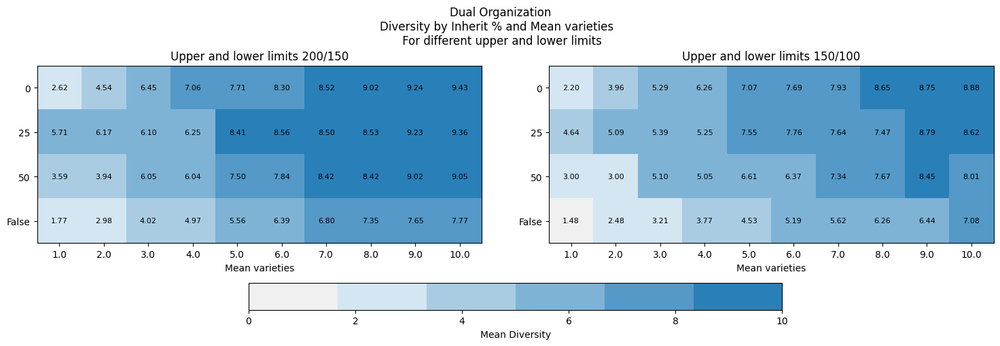

In [59]:
visualize_diversity(DmvM_datos, inherits, Dmvalphas, 'Dual Organization', up_low_limits, variable='Mean varieties', vis_type='heatmap')

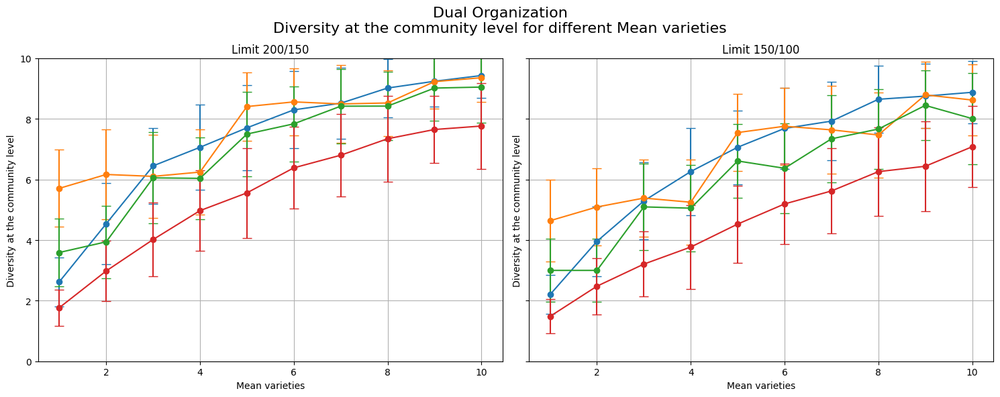

In [60]:
visualize_diversity(DmvM_datos, inherits, Dmvalphas, 'Dual Organization', up_low_limits, variable='Mean varieties', vis_type='transversal')

## Population dynamics

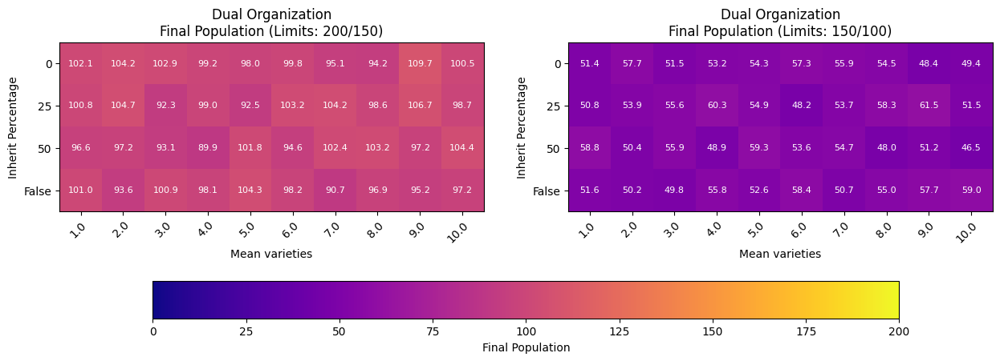

In [61]:
visualize_heatmap(DmvM_datos, inherits, Dmvalphas, 'Dual Organization', variable='Mean varieties', up_low_limits=up_low_limits, heatmap_type='alive')

# Generalized

## Initial UDs

Here we experimento with Initial UDs. We try from 10 to 100

In [10]:
# This experiment has different values for Initial UDs
prob_morte = 0.06 #beta
media = 4 # Mean
m = 100 # Initial UDs
inherits = [0,25,50, 'False']
# inherits = [0,25,50] #Values for inherit
#inherits = ['False'] #Values for inherit
Gmalphas = np.linspace(10,m,int(m/10)) # Initial UDs: from 10 to m
up_low_limits = [[200, 150], [150, 100]]
# For data of behaviour
mM = np.empty((len(inherits), len(Gmalphas), len(up_low_limits)), dtype=object) # alive, mean and diversity levels

punto_vista = 50
tiempo = 1000
tempo = list(range(0,tiempo+1,punto_vista))
experiments = 300

print(mM.shape)
start = time.time()
print(f"started at:  {datetime.now()}")
for i, inherit in enumerate(inherits):
    for j, iniciais  in enumerate(Gmalphas):
        for k, (upper_limit, lower_limit) in enumerate(up_low_limits):
            star_configuration = time.time()
            #For population dynamics
            list_alive_UDs = []
            list_vivas_puntos_vista = []
            tasas_crecimiento = []
            #For diversity dynamics
            data_step_mean_var_ud = []
            data_step_var_system = []
            data_step_unique_system = []
            print(f"Experiments with inheritance {inherit} and Initial UDs {iniciais}")
            #Lists to store experiments' diversity data
            data_endo_mean_ud = []
            data_endo_com_level = []
            data_endo_total_varieties = []
            original_media = media
            #To see how frequent goes to extintion
            contador = 0
            for experiment in range(1, experiments+1):
                print(f'experimento {experiment}')
                ## Clans
                clans = (list(range(1, 4)) * (int(iniciais) // 3 + 1))[:int(iniciais)] # Just 3 clans
                random.shuffle(clans)
                if inherit != 'False':          
                    #### Initialization
                    UD_generalized.uds = {}
                    instancias_ud = []
                    for id_ud in range(1, int(iniciais) + 1):
                        instancias_ud.append(UD_generalized(id_ud, media,clans.pop()))
                    ## Varieties
                    limited_varieties = True
                    if limited_varieties == False:
                        for id_ud, ud in UD_generalized.uds.items():
                            for _ in range(3):
                                ud.varieties.append(Variety())
                    else:
                        initial_varieties = [Variety() for _ in range (10)]
                        for ud in UD_generalized.uds.values():
                            for _ in range(3):
                                ud.varieties.append(random.choice(initial_varieties))   
                    # Lists for graphs
                    vivas_puntos_vista = [int(iniciais)]
                    vivas_tasa_crecimiento = [int(iniciais)]
            #             mortas_puntos_vista = [0]
                    #For diversity
                    mean_var_ud = []
                    var_system = []
                    unique_system = []
                    var_ud = []
                    var_total = []
                    for ud in [ud for ud in UD_generalized.uds.values() if ud.activa ==True]:
                        var_ud.append(len(ud.varieties))
                        for variety in ud.varieties:
                            var_total.append(variety.variety_id)
                    mean_var_ud.append(np.mean(var_ud))
                    var_system.append(len(var_total))
                    unique_system.append(len(set(var_total)))
                    # Simulation
                    for t in range(1, tiempo):
                        uds_copy = {id_ud: ud for id_ud, ud in UD_generalized.uds.items() if ud.activa}
                        items = list(uds_copy.items())
                        random.shuffle(items)
                        uds_copy = dict(items)
                        alive = len(uds_copy)
                        if alive > upper_limit and (media == original_media):
                            media -= media//2
                            if media >= 4:
                                media = media //2
                        elif alive < lower_limit and media < original_media:
                            media = original_media
                        if not uds_copy: #Extintion
                            # Only 0
                            print(f"acabó en 0 el experimento {experiment} con herencia {inherits[i]} con unidades {Gmalphas[j]}")
                            vivas_puntos_vista.extend([0] * (int((tiempo/punto_vista)-(len(vivas_puntos_vista)))))
                            vivas_tasa_crecimiento.extend([0] * (int((tiempo)-(len(vivas_tasa_crecimiento)))))
                            #mortas_puntos_vista.extend([unidades_iniciais] * (tiempo - t))
                            contador += 1
                            break         
                        # Cycle:
                        for id_ud, ud in uds_copy.items():
                            ud.ter_filho()
                            ud.buscar_ud(uds_copy, int(media), inherit, True, 0.2)
                            ud.incrementar_idade()
                            ud.death_probability(prob_morte)
                        # Collecting data
                        vivas_tasa_crecimiento.append(len([ud for id, ud in uds_copy.items() if ud.activa]))
                        if t % punto_vista == 0:
                            viv = len([ud for id, ud in uds_copy.items() if ud.activa])
                            #mort = len([ud for id, ud in uds_copy.items() if not ud.activa])
                            vivas_puntos_vista.append(viv)
                            # For diversity
                            var_ud = []
                            var_total = []
                            for ud in [ud for ud in UD_generalized.uds.values() if ud.activa ==True]:
                                var_ud.append(len(ud.varieties))
                                for variety in ud.varieties:
                                    var_total.append(variety.variety_id)
                            mean_var_ud.append(np.mean(var_ud))
                            var_system.append(len(var_total))
                            unique_system.append(len(set(var_total))) 
                    viv = len([ud for id, ud in UD_generalized.uds.items() if ud.activa])
                    vivas_puntos_vista.append(viv)
                    # For diversity
                    var_ud = []
                    var_total = []
                    for ud in [ud for ud in UD_generalized.uds.values() if ud.activa ==True]:
                        var_ud.append(len(ud.varieties))
                        for variety in ud.varieties:
                            var_total.append(variety.variety_id)
                    mean_var_ud.append(np.mean(var_ud))
                    var_system.append(len(var_total))
                    unique_system.append(len(set(var_total)))
                    alive = (len([ud for id, ud in uds_copy.items() if ud.activa]))
                    if alive >= 1:   
                        total_varieties = []
                        varieties_per_UD = []
                        for ud in [ud for ud in UD_generalized.uds.values() if ud.activa ==True]:
                            varieties_per_UD.append(len(ud.varieties))
                            for variety in ud.varieties:
                                total_varieties.append(variety.variety_id)
                        data_endo_mean_ud.append(np.mean(varieties_per_UD))
                        data_endo_com_level.append(len(set(total_varieties)))
                        data_endo_total_varieties.append(total_varieties)

                else:# Now with inherit == False
                    #### Initialization
                    UD_generalized_al_inh.uds = {}
                    instancias_ud = []
                    for id_ud in range(1, int(iniciais) + 1):
                        instancias_ud.append(UD_generalized_al_inh(id_ud, media, clans.pop()))
                    ## Varieties
                    limited_varieties = True
                    if limited_varieties == False:
                        for id_ud, ud in UD_generalized_al_inh.uds.items():
                            for _ in range(3):
                                ud.varieties.append(Variety())
                    else:
                        initial_varieties = [Variety() for _ in range (10)]
                        for ud in UD_generalized_al_inh.uds.values():
                            for _ in range(3):
                                ud.varieties.append(random.choice(initial_varieties))   
                    # Lists for graphs
                    vivas_puntos_vista = [int(iniciais)]
                    vivas_tasa_crecimiento = [int(iniciais)]
            #             mortas_puntos_vista = [0]
                    #For diversity
                    mean_var_ud = []
                    var_system = []
                    unique_system = []
                    var_ud = []
                    var_total = []
                    for ud in [ud for ud in UD_generalized_al_inh.uds.values() if ud.activa ==True]:
                        var_ud.append(len(ud.varieties))
                        for variety in ud.varieties:
                            var_total.append(variety.variety_id)
                    mean_var_ud.append(np.mean(var_ud))
                    var_system.append(len(var_total))
                    unique_system.append(len(set(var_total)))
                    # Simulation
                    for t in range(1, tiempo):
                        uds_copy = {id_ud: ud for id_ud, ud in UD_generalized_al_inh.uds.items() if ud.activa}
                        items = list(uds_copy.items())
                        random.shuffle(items)
                        uds_copy = dict(items)
                        alive = len(uds_copy)
                        if alive > upper_limit and (media == original_media):
                            media -= media//2
                            if media >= 4:
                                media = media //2
                        elif alive < lower_limit and media < original_media:
                            media = original_media
                        if not uds_copy: #Extintion
                            # Only 0
                            print(f"acabó en 0 el experimento {experiment} con herencia {inherits[i]} con unidades {Gmalphas[j]}")
                            vivas_puntos_vista.extend([0] * (int((tiempo/punto_vista)-(len(vivas_puntos_vista)))))
                            vivas_tasa_crecimiento.extend([0] * (int((tiempo)-(len(vivas_tasa_crecimiento)))))
                            #mortas_puntos_vista.extend([unidades_iniciais] * (tiempo - t))
                            contador += 1
                            break         
                        # Cycle:
                        varieties_list = [var for ud in uds_copy.values() for var in ud.varieties]
                        for id_ud, ud in uds_copy.items():
                            ud.ter_filho()
                            ud.buscar_ud(uds_copy, int(media), varieties_list, True, 3, 0.2)
                            ud.incrementar_idade()
                            ud.death_probability(prob_morte)
                        # Collecting data
                        vivas_tasa_crecimiento.append(len([ud for id, ud in uds_copy.items() if ud.activa]))
                        if t % punto_vista == 0:
                            viv = len([ud for id, ud in uds_copy.items() if ud.activa])
                            #mort = len([ud for id, ud in uds_copy.items() if not ud.activa])
                            vivas_puntos_vista.append(viv)
                            # For diversity
                            var_ud = []
                            var_total = []
                            for ud in [ud for ud in UD_generalized_al_inh.uds.values() if ud.activa ==True]:
                                var_ud.append(len(ud.varieties))
                                for variety in ud.varieties:
                                    var_total.append(variety.variety_id)
                            mean_var_ud.append(np.mean(var_ud))
                            var_system.append(len(var_total))
                            unique_system.append(len(set(var_total))) 
                    viv = len([ud for id, ud in UD_generalized_al_inh.uds.items() if ud.activa])
                    vivas_puntos_vista.append(viv)
                    # For diversity
                    var_ud = []
                    var_total = []
                    for ud in [ud for ud in UD_generalized_al_inh.uds.values() if ud.activa ==True]:
                        var_ud.append(len(ud.varieties))
                        for variety in ud.varieties:
                            var_total.append(variety.variety_id)
                    mean_var_ud.append(np.mean(var_ud))
                    var_system.append(len(var_total))
                    unique_system.append(len(set(var_total)))
                    alive = (len([ud for id, ud in uds_copy.items() if ud.activa]))
                    if alive >= 1:   
                        total_varieties = []
                        varieties_per_UD = []
                        for ud in [ud for ud in UD_generalized_al_inh.uds.values() if ud.activa ==True]:
                            varieties_per_UD.append(len(ud.varieties))
                            for variety in ud.varieties:
                                total_varieties.append(variety.variety_id)
                        data_endo_mean_ud.append(np.mean(varieties_per_UD))
                        data_endo_com_level.append(len(set(total_varieties)))
                        data_endo_total_varieties.append(total_varieties)


                #Final colect of the data after the simulation!
                indice_primer_cero = np.where(np.array(vivas_tasa_crecimiento) == 0)[0]            
                if len(indice_primer_cero) > 0:
                    # Get growth rate before the 0
                    tasas_crecimiento.append(np.diff(vivas_tasa_crecimiento[:indice_primer_cero[0] - 1]) / vivas_tasa_crecimiento[:-1][:indice_primer_cero[0] - 2] * 100)
                else:
                    # Growth rate
                    tasas_crecimiento.append(np.diff(vivas_tasa_crecimiento) / vivas_tasa_crecimiento[:-1] * 100)
                # Collect the data
                list_alive_UDs.append(len([ud for id, ud in uds_copy.items() if ud.activa == True])) #For heatmap
                list_vivas_puntos_vista.append(vivas_puntos_vista)
                if alive >= 1:
                    if len(mean_var_ud) == len(tempo):        
                        data_step_var_system.append(var_system)
                        data_step_unique_system.append(unique_system)
                        data_step_mean_var_ud.append(mean_var_ud)

                data_inherit_endo = [data_endo_mean_ud, data_endo_com_level, data_endo_total_varieties]
            data_steps_inherit_endo = [data_step_var_system, data_step_unique_system, data_step_mean_var_ud]
            media = original_media
            end_config = time.time()
            mM[i][j][k] = {'alive': np.mean(list_alive_UDs),
                        'std': np.std(list_alive_UDs),
                        'time used': end_config - star_configuration,
                        'porcentage_extintion': contador/experiments,
                        'tempo': tempo, 
                        'mean': np.mean(list_vivas_puntos_vista, axis=0), 
                        'std':  np.std(list_vivas_puntos_vista, axis=0),
                        'growth rate': np.mean([np.mean(lista) for lista in tasas_crecimiento]),
                        'diversity_info': data_inherit_endo,
                        'diversity_info_steps': data_steps_inherit_endo}
            print(f"""
    The total time of the configuration of inherit percentage {inherit} and initial UDs {iniciais} is  {end_config - star_configuration}
            """)
# Folder
folder_name = 'Experiments_kinship_inheritance_parameters_limits'
if not os.path.exists(folder_name):
    os.makedirs(folder_name)
# Data
heat_std = os.path.join(folder_name, 'Generalized_Initial_UDs.npy')
np.save(heat_std, mM)
now = datetime.now()
finish = time.time()
print(f"""
It finished at: {now}
It lasted {finish-start}
""")
print("done")

(4, 10, 2)
started at:  2024-11-16 11:48:21.922603
Experiments with inheritance 0 and Initial UDs 10.0
experimento 1
acabó en 0 el experimento 1 con herencia 0 con unidades 10.0
experimento 2
acabó en 0 el experimento 2 con herencia 0 con unidades 10.0
experimento 3
acabó en 0 el experimento 3 con herencia 0 con unidades 10.0
experimento 4
acabó en 0 el experimento 4 con herencia 0 con unidades 10.0
experimento 5
acabó en 0 el experimento 5 con herencia 0 con unidades 10.0
experimento 6
acabó en 0 el experimento 6 con herencia 0 con unidades 10.0
experimento 7
acabó en 0 el experimento 7 con herencia 0 con unidades 10.0
experimento 8
acabó en 0 el experimento 8 con herencia 0 con unidades 10.0
experimento 9
acabó en 0 el experimento 9 con herencia 0 con unidades 10.0
experimento 10
acabó en 0 el experimento 10 con herencia 0 con unidades 10.0
experimento 11
acabó en 0 el experimento 11 con herencia 0 con unidades 10.0
experimento 12
acabó en 0 el experimento 12 con herencia 0 con unida

experimento 109
acabó en 0 el experimento 109 con herencia 0 con unidades 10.0
experimento 110
acabó en 0 el experimento 110 con herencia 0 con unidades 10.0
experimento 111
acabó en 0 el experimento 111 con herencia 0 con unidades 10.0
experimento 112
acabó en 0 el experimento 112 con herencia 0 con unidades 10.0
experimento 113
acabó en 0 el experimento 113 con herencia 0 con unidades 10.0
experimento 114
acabó en 0 el experimento 114 con herencia 0 con unidades 10.0
experimento 115
acabó en 0 el experimento 115 con herencia 0 con unidades 10.0
experimento 116
acabó en 0 el experimento 116 con herencia 0 con unidades 10.0
experimento 117
acabó en 0 el experimento 117 con herencia 0 con unidades 10.0
experimento 118
acabó en 0 el experimento 118 con herencia 0 con unidades 10.0
experimento 119
acabó en 0 el experimento 119 con herencia 0 con unidades 10.0
experimento 120
acabó en 0 el experimento 120 con herencia 0 con unidades 10.0
experimento 121
acabó en 0 el experimento 121 con he

acabó en 0 el experimento 216 con herencia 0 con unidades 10.0
experimento 217
acabó en 0 el experimento 217 con herencia 0 con unidades 10.0
experimento 218
acabó en 0 el experimento 218 con herencia 0 con unidades 10.0
experimento 219
acabó en 0 el experimento 219 con herencia 0 con unidades 10.0
experimento 220
acabó en 0 el experimento 220 con herencia 0 con unidades 10.0
experimento 221
acabó en 0 el experimento 221 con herencia 0 con unidades 10.0
experimento 222
acabó en 0 el experimento 222 con herencia 0 con unidades 10.0
experimento 223
acabó en 0 el experimento 223 con herencia 0 con unidades 10.0
experimento 224
acabó en 0 el experimento 224 con herencia 0 con unidades 10.0
experimento 225
acabó en 0 el experimento 225 con herencia 0 con unidades 10.0
experimento 226
acabó en 0 el experimento 226 con herencia 0 con unidades 10.0
experimento 227
acabó en 0 el experimento 227 con herencia 0 con unidades 10.0
experimento 228
acabó en 0 el experimento 228 con herencia 0 con uni

acabó en 0 el experimento 24 con herencia 0 con unidades 10.0
experimento 25
acabó en 0 el experimento 25 con herencia 0 con unidades 10.0
experimento 26
acabó en 0 el experimento 26 con herencia 0 con unidades 10.0
experimento 27
acabó en 0 el experimento 27 con herencia 0 con unidades 10.0
experimento 28
acabó en 0 el experimento 28 con herencia 0 con unidades 10.0
experimento 29
acabó en 0 el experimento 29 con herencia 0 con unidades 10.0
experimento 30
acabó en 0 el experimento 30 con herencia 0 con unidades 10.0
experimento 31
acabó en 0 el experimento 31 con herencia 0 con unidades 10.0
experimento 32
acabó en 0 el experimento 32 con herencia 0 con unidades 10.0
experimento 33
acabó en 0 el experimento 33 con herencia 0 con unidades 10.0
experimento 34
acabó en 0 el experimento 34 con herencia 0 con unidades 10.0
experimento 35
acabó en 0 el experimento 35 con herencia 0 con unidades 10.0
experimento 36
acabó en 0 el experimento 36 con herencia 0 con unidades 10.0
experimento 37

acabó en 0 el experimento 140 con herencia 0 con unidades 10.0
experimento 141
acabó en 0 el experimento 141 con herencia 0 con unidades 10.0
experimento 142
acabó en 0 el experimento 142 con herencia 0 con unidades 10.0
experimento 143
acabó en 0 el experimento 143 con herencia 0 con unidades 10.0
experimento 144
acabó en 0 el experimento 144 con herencia 0 con unidades 10.0
experimento 145
acabó en 0 el experimento 145 con herencia 0 con unidades 10.0
experimento 146
acabó en 0 el experimento 146 con herencia 0 con unidades 10.0
experimento 147
acabó en 0 el experimento 147 con herencia 0 con unidades 10.0
experimento 148
acabó en 0 el experimento 148 con herencia 0 con unidades 10.0
experimento 149
acabó en 0 el experimento 149 con herencia 0 con unidades 10.0
experimento 150
acabó en 0 el experimento 150 con herencia 0 con unidades 10.0
experimento 151
acabó en 0 el experimento 151 con herencia 0 con unidades 10.0
experimento 152
acabó en 0 el experimento 152 con herencia 0 con uni

experimento 271
acabó en 0 el experimento 271 con herencia 0 con unidades 10.0
experimento 272
acabó en 0 el experimento 272 con herencia 0 con unidades 10.0
experimento 273
acabó en 0 el experimento 273 con herencia 0 con unidades 10.0
experimento 274
acabó en 0 el experimento 274 con herencia 0 con unidades 10.0
experimento 275
acabó en 0 el experimento 275 con herencia 0 con unidades 10.0
experimento 276
acabó en 0 el experimento 276 con herencia 0 con unidades 10.0
experimento 277
acabó en 0 el experimento 277 con herencia 0 con unidades 10.0
experimento 278
acabó en 0 el experimento 278 con herencia 0 con unidades 10.0
experimento 279
acabó en 0 el experimento 279 con herencia 0 con unidades 10.0
experimento 280
acabó en 0 el experimento 280 con herencia 0 con unidades 10.0
experimento 281
acabó en 0 el experimento 281 con herencia 0 con unidades 10.0
experimento 282
acabó en 0 el experimento 282 con herencia 0 con unidades 10.0
experimento 283
acabó en 0 el experimento 283 con he

acabó en 0 el experimento 83 con herencia 0 con unidades 20.0
experimento 84
acabó en 0 el experimento 84 con herencia 0 con unidades 20.0
experimento 85
acabó en 0 el experimento 85 con herencia 0 con unidades 20.0
experimento 86
acabó en 0 el experimento 86 con herencia 0 con unidades 20.0
experimento 87
acabó en 0 el experimento 87 con herencia 0 con unidades 20.0
experimento 88
acabó en 0 el experimento 88 con herencia 0 con unidades 20.0
experimento 89
acabó en 0 el experimento 89 con herencia 0 con unidades 20.0
experimento 90
acabó en 0 el experimento 90 con herencia 0 con unidades 20.0
experimento 91
acabó en 0 el experimento 91 con herencia 0 con unidades 20.0
experimento 92
acabó en 0 el experimento 92 con herencia 0 con unidades 20.0
experimento 93
acabó en 0 el experimento 93 con herencia 0 con unidades 20.0
experimento 94
acabó en 0 el experimento 94 con herencia 0 con unidades 20.0
experimento 95
acabó en 0 el experimento 95 con herencia 0 con unidades 20.0
experimento 96

acabó en 0 el experimento 193 con herencia 0 con unidades 20.0
experimento 194
acabó en 0 el experimento 194 con herencia 0 con unidades 20.0
experimento 195
acabó en 0 el experimento 195 con herencia 0 con unidades 20.0
experimento 196
experimento 197
acabó en 0 el experimento 197 con herencia 0 con unidades 20.0
experimento 198
acabó en 0 el experimento 198 con herencia 0 con unidades 20.0
experimento 199
acabó en 0 el experimento 199 con herencia 0 con unidades 20.0
experimento 200
acabó en 0 el experimento 200 con herencia 0 con unidades 20.0
experimento 201
acabó en 0 el experimento 201 con herencia 0 con unidades 20.0
experimento 202
acabó en 0 el experimento 202 con herencia 0 con unidades 20.0
experimento 203
acabó en 0 el experimento 203 con herencia 0 con unidades 20.0
experimento 204
acabó en 0 el experimento 204 con herencia 0 con unidades 20.0
experimento 205
acabó en 0 el experimento 205 con herencia 0 con unidades 20.0
experimento 206
acabó en 0 el experimento 206 con he

acabó en 0 el experimento 2 con herencia 0 con unidades 20.0
experimento 3
acabó en 0 el experimento 3 con herencia 0 con unidades 20.0
experimento 4
acabó en 0 el experimento 4 con herencia 0 con unidades 20.0
experimento 5
acabó en 0 el experimento 5 con herencia 0 con unidades 20.0
experimento 6
acabó en 0 el experimento 6 con herencia 0 con unidades 20.0
experimento 7
acabó en 0 el experimento 7 con herencia 0 con unidades 20.0
experimento 8
acabó en 0 el experimento 8 con herencia 0 con unidades 20.0
experimento 9
acabó en 0 el experimento 9 con herencia 0 con unidades 20.0
experimento 10
acabó en 0 el experimento 10 con herencia 0 con unidades 20.0
experimento 11
acabó en 0 el experimento 11 con herencia 0 con unidades 20.0
experimento 12
acabó en 0 el experimento 12 con herencia 0 con unidades 20.0
experimento 13
experimento 14
acabó en 0 el experimento 14 con herencia 0 con unidades 20.0
experimento 15
acabó en 0 el experimento 15 con herencia 0 con unidades 20.0
experimento 16

acabó en 0 el experimento 119 con herencia 0 con unidades 20.0
experimento 120
acabó en 0 el experimento 120 con herencia 0 con unidades 20.0
experimento 121
acabó en 0 el experimento 121 con herencia 0 con unidades 20.0
experimento 122
acabó en 0 el experimento 122 con herencia 0 con unidades 20.0
experimento 123
acabó en 0 el experimento 123 con herencia 0 con unidades 20.0
experimento 124
acabó en 0 el experimento 124 con herencia 0 con unidades 20.0
experimento 125
acabó en 0 el experimento 125 con herencia 0 con unidades 20.0
experimento 126
acabó en 0 el experimento 126 con herencia 0 con unidades 20.0
experimento 127
acabó en 0 el experimento 127 con herencia 0 con unidades 20.0
experimento 128
acabó en 0 el experimento 128 con herencia 0 con unidades 20.0
experimento 129
acabó en 0 el experimento 129 con herencia 0 con unidades 20.0
experimento 130
acabó en 0 el experimento 130 con herencia 0 con unidades 20.0
experimento 131
acabó en 0 el experimento 131 con herencia 0 con uni

acabó en 0 el experimento 232 con herencia 0 con unidades 20.0
experimento 233
acabó en 0 el experimento 233 con herencia 0 con unidades 20.0
experimento 234
acabó en 0 el experimento 234 con herencia 0 con unidades 20.0
experimento 235
acabó en 0 el experimento 235 con herencia 0 con unidades 20.0
experimento 236
acabó en 0 el experimento 236 con herencia 0 con unidades 20.0
experimento 237
acabó en 0 el experimento 237 con herencia 0 con unidades 20.0
experimento 238
acabó en 0 el experimento 238 con herencia 0 con unidades 20.0
experimento 239
acabó en 0 el experimento 239 con herencia 0 con unidades 20.0
experimento 240
acabó en 0 el experimento 240 con herencia 0 con unidades 20.0
experimento 241
acabó en 0 el experimento 241 con herencia 0 con unidades 20.0
experimento 242
experimento 243
acabó en 0 el experimento 243 con herencia 0 con unidades 20.0
experimento 244
acabó en 0 el experimento 244 con herencia 0 con unidades 20.0
experimento 245
acabó en 0 el experimento 245 con he

acabó en 0 el experimento 45 con herencia 0 con unidades 30.0
experimento 46
acabó en 0 el experimento 46 con herencia 0 con unidades 30.0
experimento 47
experimento 48
acabó en 0 el experimento 48 con herencia 0 con unidades 30.0
experimento 49
acabó en 0 el experimento 49 con herencia 0 con unidades 30.0
experimento 50
experimento 51
acabó en 0 el experimento 51 con herencia 0 con unidades 30.0
experimento 52
experimento 53
experimento 54
acabó en 0 el experimento 54 con herencia 0 con unidades 30.0
experimento 55
acabó en 0 el experimento 55 con herencia 0 con unidades 30.0
experimento 56
experimento 57
acabó en 0 el experimento 57 con herencia 0 con unidades 30.0
experimento 58
acabó en 0 el experimento 58 con herencia 0 con unidades 30.0
experimento 59
acabó en 0 el experimento 59 con herencia 0 con unidades 30.0
experimento 60
acabó en 0 el experimento 60 con herencia 0 con unidades 30.0
experimento 61
acabó en 0 el experimento 61 con herencia 0 con unidades 30.0
experimento 62
a

acabó en 0 el experimento 193 con herencia 0 con unidades 30.0
experimento 194
acabó en 0 el experimento 194 con herencia 0 con unidades 30.0
experimento 195
acabó en 0 el experimento 195 con herencia 0 con unidades 30.0
experimento 196
acabó en 0 el experimento 196 con herencia 0 con unidades 30.0
experimento 197
acabó en 0 el experimento 197 con herencia 0 con unidades 30.0
experimento 198
acabó en 0 el experimento 198 con herencia 0 con unidades 30.0
experimento 199
acabó en 0 el experimento 199 con herencia 0 con unidades 30.0
experimento 200
acabó en 0 el experimento 200 con herencia 0 con unidades 30.0
experimento 201
experimento 202
experimento 203
acabó en 0 el experimento 203 con herencia 0 con unidades 30.0
experimento 204
acabó en 0 el experimento 204 con herencia 0 con unidades 30.0
experimento 205
acabó en 0 el experimento 205 con herencia 0 con unidades 30.0
experimento 206
acabó en 0 el experimento 206 con herencia 0 con unidades 30.0
experimento 207
acabó en 0 el experi

acabó en 0 el experimento 15 con herencia 0 con unidades 30.0
experimento 16
experimento 17
experimento 18
acabó en 0 el experimento 18 con herencia 0 con unidades 30.0
experimento 19
acabó en 0 el experimento 19 con herencia 0 con unidades 30.0
experimento 20
acabó en 0 el experimento 20 con herencia 0 con unidades 30.0
experimento 21
acabó en 0 el experimento 21 con herencia 0 con unidades 30.0
experimento 22
acabó en 0 el experimento 22 con herencia 0 con unidades 30.0
experimento 23
acabó en 0 el experimento 23 con herencia 0 con unidades 30.0
experimento 24
acabó en 0 el experimento 24 con herencia 0 con unidades 30.0
experimento 25
acabó en 0 el experimento 25 con herencia 0 con unidades 30.0
experimento 26
acabó en 0 el experimento 26 con herencia 0 con unidades 30.0
experimento 27
acabó en 0 el experimento 27 con herencia 0 con unidades 30.0
experimento 28
acabó en 0 el experimento 28 con herencia 0 con unidades 30.0
experimento 29
experimento 30
acabó en 0 el experimento 30 co

acabó en 0 el experimento 140 con herencia 0 con unidades 30.0
experimento 141
acabó en 0 el experimento 141 con herencia 0 con unidades 30.0
experimento 142
acabó en 0 el experimento 142 con herencia 0 con unidades 30.0
experimento 143
experimento 144
acabó en 0 el experimento 144 con herencia 0 con unidades 30.0
experimento 145
acabó en 0 el experimento 145 con herencia 0 con unidades 30.0
experimento 146
acabó en 0 el experimento 146 con herencia 0 con unidades 30.0
experimento 147
acabó en 0 el experimento 147 con herencia 0 con unidades 30.0
experimento 148
acabó en 0 el experimento 148 con herencia 0 con unidades 30.0
experimento 149
acabó en 0 el experimento 149 con herencia 0 con unidades 30.0
experimento 150
acabó en 0 el experimento 150 con herencia 0 con unidades 30.0
experimento 151
experimento 152
experimento 153
acabó en 0 el experimento 153 con herencia 0 con unidades 30.0
experimento 154
experimento 155
acabó en 0 el experimento 155 con herencia 0 con unidades 30.0
expe

acabó en 0 el experimento 267 con herencia 0 con unidades 30.0
experimento 268
acabó en 0 el experimento 268 con herencia 0 con unidades 30.0
experimento 269
acabó en 0 el experimento 269 con herencia 0 con unidades 30.0
experimento 270
acabó en 0 el experimento 270 con herencia 0 con unidades 30.0
experimento 271
acabó en 0 el experimento 271 con herencia 0 con unidades 30.0
experimento 272
acabó en 0 el experimento 272 con herencia 0 con unidades 30.0
experimento 273
acabó en 0 el experimento 273 con herencia 0 con unidades 30.0
experimento 274
experimento 275
acabó en 0 el experimento 275 con herencia 0 con unidades 30.0
experimento 276
acabó en 0 el experimento 276 con herencia 0 con unidades 30.0
experimento 277
acabó en 0 el experimento 277 con herencia 0 con unidades 30.0
experimento 278
acabó en 0 el experimento 278 con herencia 0 con unidades 30.0
experimento 279
acabó en 0 el experimento 279 con herencia 0 con unidades 30.0
experimento 280
acabó en 0 el experimento 280 con he

experimento 134
acabó en 0 el experimento 134 con herencia 0 con unidades 40.0
experimento 135
acabó en 0 el experimento 135 con herencia 0 con unidades 40.0
experimento 136
acabó en 0 el experimento 136 con herencia 0 con unidades 40.0
experimento 137
acabó en 0 el experimento 137 con herencia 0 con unidades 40.0
experimento 138
acabó en 0 el experimento 138 con herencia 0 con unidades 40.0
experimento 139
acabó en 0 el experimento 139 con herencia 0 con unidades 40.0
experimento 140
experimento 141
experimento 142
experimento 143
experimento 144
experimento 145
acabó en 0 el experimento 145 con herencia 0 con unidades 40.0
experimento 146
acabó en 0 el experimento 146 con herencia 0 con unidades 40.0
experimento 147
experimento 148
acabó en 0 el experimento 148 con herencia 0 con unidades 40.0
experimento 149
acabó en 0 el experimento 149 con herencia 0 con unidades 40.0
experimento 150
experimento 151
experimento 152
experimento 153
experimento 154
experimento 155
acabó en 0 el expe

experimento 6
acabó en 0 el experimento 6 con herencia 0 con unidades 40.0
experimento 7
acabó en 0 el experimento 7 con herencia 0 con unidades 40.0
experimento 8
experimento 9
acabó en 0 el experimento 9 con herencia 0 con unidades 40.0
experimento 10
experimento 11
acabó en 0 el experimento 11 con herencia 0 con unidades 40.0
experimento 12
acabó en 0 el experimento 12 con herencia 0 con unidades 40.0
experimento 13
acabó en 0 el experimento 13 con herencia 0 con unidades 40.0
experimento 14
acabó en 0 el experimento 14 con herencia 0 con unidades 40.0
experimento 15
experimento 16
acabó en 0 el experimento 16 con herencia 0 con unidades 40.0
experimento 17
experimento 18
acabó en 0 el experimento 18 con herencia 0 con unidades 40.0
experimento 19
acabó en 0 el experimento 19 con herencia 0 con unidades 40.0
experimento 20
acabó en 0 el experimento 20 con herencia 0 con unidades 40.0
experimento 21
experimento 22
experimento 23
experimento 24
acabó en 0 el experimento 24 con herenci

experimento 144
acabó en 0 el experimento 144 con herencia 0 con unidades 40.0
experimento 145
acabó en 0 el experimento 145 con herencia 0 con unidades 40.0
experimento 146
acabó en 0 el experimento 146 con herencia 0 con unidades 40.0
experimento 147
experimento 148
acabó en 0 el experimento 148 con herencia 0 con unidades 40.0
experimento 149
acabó en 0 el experimento 149 con herencia 0 con unidades 40.0
experimento 150
experimento 151
experimento 152
acabó en 0 el experimento 152 con herencia 0 con unidades 40.0
experimento 153
acabó en 0 el experimento 153 con herencia 0 con unidades 40.0
experimento 154
acabó en 0 el experimento 154 con herencia 0 con unidades 40.0
experimento 155
acabó en 0 el experimento 155 con herencia 0 con unidades 40.0
experimento 156
experimento 157
acabó en 0 el experimento 157 con herencia 0 con unidades 40.0
experimento 158
acabó en 0 el experimento 158 con herencia 0 con unidades 40.0
experimento 159
experimento 160
experimento 161
acabó en 0 el exper

acabó en 0 el experimento 280 con herencia 0 con unidades 40.0
experimento 281
acabó en 0 el experimento 281 con herencia 0 con unidades 40.0
experimento 282
acabó en 0 el experimento 282 con herencia 0 con unidades 40.0
experimento 283
acabó en 0 el experimento 283 con herencia 0 con unidades 40.0
experimento 284
acabó en 0 el experimento 284 con herencia 0 con unidades 40.0
experimento 285
acabó en 0 el experimento 285 con herencia 0 con unidades 40.0
experimento 286
experimento 287
acabó en 0 el experimento 287 con herencia 0 con unidades 40.0
experimento 288
acabó en 0 el experimento 288 con herencia 0 con unidades 40.0
experimento 289
acabó en 0 el experimento 289 con herencia 0 con unidades 40.0
experimento 290
acabó en 0 el experimento 290 con herencia 0 con unidades 40.0
experimento 291
acabó en 0 el experimento 291 con herencia 0 con unidades 40.0
experimento 292
acabó en 0 el experimento 292 con herencia 0 con unidades 40.0
experimento 293
acabó en 0 el experimento 293 con he

experimento 192
experimento 193
acabó en 0 el experimento 193 con herencia 0 con unidades 50.0
experimento 194
experimento 195
experimento 196
experimento 197
experimento 198
experimento 199
acabó en 0 el experimento 199 con herencia 0 con unidades 50.0
experimento 200
experimento 201
experimento 202
acabó en 0 el experimento 202 con herencia 0 con unidades 50.0
experimento 203
experimento 204
experimento 205
experimento 206
acabó en 0 el experimento 206 con herencia 0 con unidades 50.0
experimento 207
acabó en 0 el experimento 207 con herencia 0 con unidades 50.0
experimento 208
experimento 209
experimento 210
experimento 211
experimento 212
experimento 213
acabó en 0 el experimento 213 con herencia 0 con unidades 50.0
experimento 214
experimento 215
acabó en 0 el experimento 215 con herencia 0 con unidades 50.0
experimento 216
experimento 217
acabó en 0 el experimento 217 con herencia 0 con unidades 50.0
experimento 218
experimento 219
acabó en 0 el experimento 219 con herencia 0 con

acabó en 0 el experimento 83 con herencia 0 con unidades 50.0
experimento 84
acabó en 0 el experimento 84 con herencia 0 con unidades 50.0
experimento 85
acabó en 0 el experimento 85 con herencia 0 con unidades 50.0
experimento 86
experimento 87
acabó en 0 el experimento 87 con herencia 0 con unidades 50.0
experimento 88
experimento 89
acabó en 0 el experimento 89 con herencia 0 con unidades 50.0
experimento 90
experimento 91
experimento 92
acabó en 0 el experimento 92 con herencia 0 con unidades 50.0
experimento 93
experimento 94
acabó en 0 el experimento 94 con herencia 0 con unidades 50.0
experimento 95
acabó en 0 el experimento 95 con herencia 0 con unidades 50.0
experimento 96
experimento 97
acabó en 0 el experimento 97 con herencia 0 con unidades 50.0
experimento 98
acabó en 0 el experimento 98 con herencia 0 con unidades 50.0
experimento 99
acabó en 0 el experimento 99 con herencia 0 con unidades 50.0
experimento 100
experimento 101
acabó en 0 el experimento 101 con herencia 0 c

acabó en 0 el experimento 236 con herencia 0 con unidades 50.0
experimento 237
acabó en 0 el experimento 237 con herencia 0 con unidades 50.0
experimento 238
acabó en 0 el experimento 238 con herencia 0 con unidades 50.0
experimento 239
acabó en 0 el experimento 239 con herencia 0 con unidades 50.0
experimento 240
acabó en 0 el experimento 240 con herencia 0 con unidades 50.0
experimento 241
acabó en 0 el experimento 241 con herencia 0 con unidades 50.0
experimento 242
experimento 243
acabó en 0 el experimento 243 con herencia 0 con unidades 50.0
experimento 244
acabó en 0 el experimento 244 con herencia 0 con unidades 50.0
experimento 245
acabó en 0 el experimento 245 con herencia 0 con unidades 50.0
experimento 246
acabó en 0 el experimento 246 con herencia 0 con unidades 50.0
experimento 247
acabó en 0 el experimento 247 con herencia 0 con unidades 50.0
experimento 248
acabó en 0 el experimento 248 con herencia 0 con unidades 50.0
experimento 249
acabó en 0 el experimento 249 con he

experimento 153
experimento 154
acabó en 0 el experimento 154 con herencia 0 con unidades 60.0
experimento 155
experimento 156
experimento 157
experimento 158
experimento 159
experimento 160
acabó en 0 el experimento 160 con herencia 0 con unidades 60.0
experimento 161
acabó en 0 el experimento 161 con herencia 0 con unidades 60.0
experimento 162
acabó en 0 el experimento 162 con herencia 0 con unidades 60.0
experimento 163
experimento 164
experimento 165
experimento 166
acabó en 0 el experimento 166 con herencia 0 con unidades 60.0
experimento 167
experimento 168
experimento 169
acabó en 0 el experimento 169 con herencia 0 con unidades 60.0
experimento 170
experimento 171
acabó en 0 el experimento 171 con herencia 0 con unidades 60.0
experimento 172
experimento 173
experimento 174
experimento 175
experimento 176
experimento 177
experimento 178
experimento 179
experimento 180
acabó en 0 el experimento 180 con herencia 0 con unidades 60.0
experimento 181
experimento 182
experimento 183


experimento 67
experimento 68
acabó en 0 el experimento 68 con herencia 0 con unidades 60.0
experimento 69
experimento 70
experimento 71
acabó en 0 el experimento 71 con herencia 0 con unidades 60.0
experimento 72
experimento 73
experimento 74
acabó en 0 el experimento 74 con herencia 0 con unidades 60.0
experimento 75
acabó en 0 el experimento 75 con herencia 0 con unidades 60.0
experimento 76
acabó en 0 el experimento 76 con herencia 0 con unidades 60.0
experimento 77
acabó en 0 el experimento 77 con herencia 0 con unidades 60.0
experimento 78
acabó en 0 el experimento 78 con herencia 0 con unidades 60.0
experimento 79
experimento 80
acabó en 0 el experimento 80 con herencia 0 con unidades 60.0
experimento 81
acabó en 0 el experimento 81 con herencia 0 con unidades 60.0
experimento 82
experimento 83
acabó en 0 el experimento 83 con herencia 0 con unidades 60.0
experimento 84
experimento 85
experimento 86
acabó en 0 el experimento 86 con herencia 0 con unidades 60.0
experimento 87
aca

acabó en 0 el experimento 227 con herencia 0 con unidades 60.0
experimento 228
experimento 229
experimento 230
acabó en 0 el experimento 230 con herencia 0 con unidades 60.0
experimento 231
acabó en 0 el experimento 231 con herencia 0 con unidades 60.0
experimento 232
acabó en 0 el experimento 232 con herencia 0 con unidades 60.0
experimento 233
experimento 234
acabó en 0 el experimento 234 con herencia 0 con unidades 60.0
experimento 235
acabó en 0 el experimento 235 con herencia 0 con unidades 60.0
experimento 236
acabó en 0 el experimento 236 con herencia 0 con unidades 60.0
experimento 237
experimento 238
experimento 239
acabó en 0 el experimento 239 con herencia 0 con unidades 60.0
experimento 240
acabó en 0 el experimento 240 con herencia 0 con unidades 60.0
experimento 241
acabó en 0 el experimento 241 con herencia 0 con unidades 60.0
experimento 242
experimento 243
experimento 244
acabó en 0 el experimento 244 con herencia 0 con unidades 60.0
experimento 245
acabó en 0 el exper

experimento 144
experimento 145
experimento 146
acabó en 0 el experimento 146 con herencia 0 con unidades 70.0
experimento 147
experimento 148
experimento 149
experimento 150
experimento 151
experimento 152
experimento 153
experimento 154
experimento 155
experimento 156
experimento 157
experimento 158
experimento 159
experimento 160
experimento 161
experimento 162
acabó en 0 el experimento 162 con herencia 0 con unidades 70.0
experimento 163
experimento 164
experimento 165
acabó en 0 el experimento 165 con herencia 0 con unidades 70.0
experimento 166
experimento 167
experimento 168
experimento 169
experimento 170
acabó en 0 el experimento 170 con herencia 0 con unidades 70.0
experimento 171
experimento 172
experimento 173
experimento 174
experimento 175
experimento 176
experimento 177
experimento 178
experimento 179
experimento 180
experimento 181
experimento 182
acabó en 0 el experimento 182 con herencia 0 con unidades 70.0
experimento 183
experimento 184
acabó en 0 el experimento 184

experimento 78
acabó en 0 el experimento 78 con herencia 0 con unidades 70.0
experimento 79
acabó en 0 el experimento 79 con herencia 0 con unidades 70.0
experimento 80
acabó en 0 el experimento 80 con herencia 0 con unidades 70.0
experimento 81
acabó en 0 el experimento 81 con herencia 0 con unidades 70.0
experimento 82
experimento 83
acabó en 0 el experimento 83 con herencia 0 con unidades 70.0
experimento 84
experimento 85
acabó en 0 el experimento 85 con herencia 0 con unidades 70.0
experimento 86
acabó en 0 el experimento 86 con herencia 0 con unidades 70.0
experimento 87
experimento 88
experimento 89
experimento 90
acabó en 0 el experimento 90 con herencia 0 con unidades 70.0
experimento 91
acabó en 0 el experimento 91 con herencia 0 con unidades 70.0
experimento 92
experimento 93
experimento 94
acabó en 0 el experimento 94 con herencia 0 con unidades 70.0
experimento 95
experimento 96
acabó en 0 el experimento 96 con herencia 0 con unidades 70.0
experimento 97
acabó en 0 el expe

acabó en 0 el experimento 217 con herencia 0 con unidades 70.0
experimento 218
experimento 219
experimento 220
acabó en 0 el experimento 220 con herencia 0 con unidades 70.0
experimento 221
acabó en 0 el experimento 221 con herencia 0 con unidades 70.0
experimento 222
experimento 223
acabó en 0 el experimento 223 con herencia 0 con unidades 70.0
experimento 224
experimento 225
experimento 226
acabó en 0 el experimento 226 con herencia 0 con unidades 70.0
experimento 227
acabó en 0 el experimento 227 con herencia 0 con unidades 70.0
experimento 228
acabó en 0 el experimento 228 con herencia 0 con unidades 70.0
experimento 229
experimento 230
acabó en 0 el experimento 230 con herencia 0 con unidades 70.0
experimento 231
acabó en 0 el experimento 231 con herencia 0 con unidades 70.0
experimento 232
acabó en 0 el experimento 232 con herencia 0 con unidades 70.0
experimento 233
acabó en 0 el experimento 233 con herencia 0 con unidades 70.0
experimento 234
experimento 235
experimento 236
exp

experimento 129
experimento 130
acabó en 0 el experimento 130 con herencia 0 con unidades 80.0
experimento 131
experimento 132
experimento 133
experimento 134
acabó en 0 el experimento 134 con herencia 0 con unidades 80.0
experimento 135
experimento 136
experimento 137
acabó en 0 el experimento 137 con herencia 0 con unidades 80.0
experimento 138
experimento 139
experimento 140
experimento 141
experimento 142
experimento 143
experimento 144
experimento 145
acabó en 0 el experimento 145 con herencia 0 con unidades 80.0
experimento 146
experimento 147
experimento 148
experimento 149
experimento 150
experimento 151
acabó en 0 el experimento 151 con herencia 0 con unidades 80.0
experimento 152
acabó en 0 el experimento 152 con herencia 0 con unidades 80.0
experimento 153
experimento 154
experimento 155
experimento 156
acabó en 0 el experimento 156 con herencia 0 con unidades 80.0
experimento 157
experimento 158
experimento 159
experimento 160
acabó en 0 el experimento 160 con herencia 0 co

acabó en 0 el experimento 62 con herencia 0 con unidades 80.0
experimento 63
experimento 64
acabó en 0 el experimento 64 con herencia 0 con unidades 80.0
experimento 65
acabó en 0 el experimento 65 con herencia 0 con unidades 80.0
experimento 66
acabó en 0 el experimento 66 con herencia 0 con unidades 80.0
experimento 67
acabó en 0 el experimento 67 con herencia 0 con unidades 80.0
experimento 68
experimento 69
acabó en 0 el experimento 69 con herencia 0 con unidades 80.0
experimento 70
acabó en 0 el experimento 70 con herencia 0 con unidades 80.0
experimento 71
acabó en 0 el experimento 71 con herencia 0 con unidades 80.0
experimento 72
experimento 73
acabó en 0 el experimento 73 con herencia 0 con unidades 80.0
experimento 74
acabó en 0 el experimento 74 con herencia 0 con unidades 80.0
experimento 75
acabó en 0 el experimento 75 con herencia 0 con unidades 80.0
experimento 76
experimento 77
acabó en 0 el experimento 77 con herencia 0 con unidades 80.0
experimento 78
acabó en 0 el ex

acabó en 0 el experimento 215 con herencia 0 con unidades 80.0
experimento 216
acabó en 0 el experimento 216 con herencia 0 con unidades 80.0
experimento 217
experimento 218
acabó en 0 el experimento 218 con herencia 0 con unidades 80.0
experimento 219
acabó en 0 el experimento 219 con herencia 0 con unidades 80.0
experimento 220
acabó en 0 el experimento 220 con herencia 0 con unidades 80.0
experimento 221
acabó en 0 el experimento 221 con herencia 0 con unidades 80.0
experimento 222
acabó en 0 el experimento 222 con herencia 0 con unidades 80.0
experimento 223
acabó en 0 el experimento 223 con herencia 0 con unidades 80.0
experimento 224
experimento 225
experimento 226
experimento 227
experimento 228
experimento 229
acabó en 0 el experimento 229 con herencia 0 con unidades 80.0
experimento 230
experimento 231
acabó en 0 el experimento 231 con herencia 0 con unidades 80.0
experimento 232
acabó en 0 el experimento 232 con herencia 0 con unidades 80.0
experimento 233
experimento 234
aca

experimento 127
experimento 128
acabó en 0 el experimento 128 con herencia 0 con unidades 90.0
experimento 129
experimento 130
experimento 131
experimento 132
experimento 133
experimento 134
experimento 135
acabó en 0 el experimento 135 con herencia 0 con unidades 90.0
experimento 136
acabó en 0 el experimento 136 con herencia 0 con unidades 90.0
experimento 137
experimento 138
acabó en 0 el experimento 138 con herencia 0 con unidades 90.0
experimento 139
acabó en 0 el experimento 139 con herencia 0 con unidades 90.0
experimento 140
experimento 141
experimento 142
experimento 143
experimento 144
experimento 145
experimento 146
experimento 147
experimento 148
experimento 149
experimento 150
experimento 151
experimento 152
acabó en 0 el experimento 152 con herencia 0 con unidades 90.0
experimento 153
experimento 154
experimento 155
experimento 156
experimento 157
experimento 158
experimento 159
experimento 160
experimento 161
experimento 162
experimento 163
experimento 164
experimento 16

acabó en 0 el experimento 63 con herencia 0 con unidades 90.0
experimento 64
acabó en 0 el experimento 64 con herencia 0 con unidades 90.0
experimento 65
acabó en 0 el experimento 65 con herencia 0 con unidades 90.0
experimento 66
experimento 67
experimento 68
experimento 69
experimento 70
acabó en 0 el experimento 70 con herencia 0 con unidades 90.0
experimento 71
acabó en 0 el experimento 71 con herencia 0 con unidades 90.0
experimento 72
experimento 73
acabó en 0 el experimento 73 con herencia 0 con unidades 90.0
experimento 74
experimento 75
acabó en 0 el experimento 75 con herencia 0 con unidades 90.0
experimento 76
experimento 77
acabó en 0 el experimento 77 con herencia 0 con unidades 90.0
experimento 78
acabó en 0 el experimento 78 con herencia 0 con unidades 90.0
experimento 79
acabó en 0 el experimento 79 con herencia 0 con unidades 90.0
experimento 80
experimento 81
experimento 82
acabó en 0 el experimento 82 con herencia 0 con unidades 90.0
experimento 83
acabó en 0 el expe

acabó en 0 el experimento 207 con herencia 0 con unidades 90.0
experimento 208
acabó en 0 el experimento 208 con herencia 0 con unidades 90.0
experimento 209
acabó en 0 el experimento 209 con herencia 0 con unidades 90.0
experimento 210
acabó en 0 el experimento 210 con herencia 0 con unidades 90.0
experimento 211
acabó en 0 el experimento 211 con herencia 0 con unidades 90.0
experimento 212
experimento 213
acabó en 0 el experimento 213 con herencia 0 con unidades 90.0
experimento 214
acabó en 0 el experimento 214 con herencia 0 con unidades 90.0
experimento 215
experimento 216
acabó en 0 el experimento 216 con herencia 0 con unidades 90.0
experimento 217
experimento 218
acabó en 0 el experimento 218 con herencia 0 con unidades 90.0
experimento 219
acabó en 0 el experimento 219 con herencia 0 con unidades 90.0
experimento 220
acabó en 0 el experimento 220 con herencia 0 con unidades 90.0
experimento 221
experimento 222
experimento 223
acabó en 0 el experimento 223 con herencia 0 con un

experimento 109
experimento 110
experimento 111
experimento 112
experimento 113
experimento 114
experimento 115
experimento 116
experimento 117
acabó en 0 el experimento 117 con herencia 0 con unidades 100.0
experimento 118
acabó en 0 el experimento 118 con herencia 0 con unidades 100.0
experimento 119
experimento 120
acabó en 0 el experimento 120 con herencia 0 con unidades 100.0
experimento 121
acabó en 0 el experimento 121 con herencia 0 con unidades 100.0
experimento 122
experimento 123
experimento 124
experimento 125
experimento 126
acabó en 0 el experimento 126 con herencia 0 con unidades 100.0
experimento 127
experimento 128
acabó en 0 el experimento 128 con herencia 0 con unidades 100.0
experimento 129
experimento 130
experimento 131
experimento 132
experimento 133
experimento 134
acabó en 0 el experimento 134 con herencia 0 con unidades 100.0
experimento 135
experimento 136
experimento 137
experimento 138
experimento 139
acabó en 0 el experimento 139 con herencia 0 con unidade

acabó en 0 el experimento 44 con herencia 0 con unidades 100.0
experimento 45
acabó en 0 el experimento 45 con herencia 0 con unidades 100.0
experimento 46
acabó en 0 el experimento 46 con herencia 0 con unidades 100.0
experimento 47
acabó en 0 el experimento 47 con herencia 0 con unidades 100.0
experimento 48
experimento 49
acabó en 0 el experimento 49 con herencia 0 con unidades 100.0
experimento 50
experimento 51
acabó en 0 el experimento 51 con herencia 0 con unidades 100.0
experimento 52
acabó en 0 el experimento 52 con herencia 0 con unidades 100.0
experimento 53
acabó en 0 el experimento 53 con herencia 0 con unidades 100.0
experimento 54
experimento 55
acabó en 0 el experimento 55 con herencia 0 con unidades 100.0
experimento 56
acabó en 0 el experimento 56 con herencia 0 con unidades 100.0
experimento 57
experimento 58
acabó en 0 el experimento 58 con herencia 0 con unidades 100.0
experimento 59
experimento 60
acabó en 0 el experimento 60 con herencia 0 con unidades 100.0
expe

acabó en 0 el experimento 200 con herencia 0 con unidades 100.0
experimento 201
acabó en 0 el experimento 201 con herencia 0 con unidades 100.0
experimento 202
acabó en 0 el experimento 202 con herencia 0 con unidades 100.0
experimento 203
acabó en 0 el experimento 203 con herencia 0 con unidades 100.0
experimento 204
acabó en 0 el experimento 204 con herencia 0 con unidades 100.0
experimento 205
acabó en 0 el experimento 205 con herencia 0 con unidades 100.0
experimento 206
experimento 207
acabó en 0 el experimento 207 con herencia 0 con unidades 100.0
experimento 208
acabó en 0 el experimento 208 con herencia 0 con unidades 100.0
experimento 209
acabó en 0 el experimento 209 con herencia 0 con unidades 100.0
experimento 210
acabó en 0 el experimento 210 con herencia 0 con unidades 100.0
experimento 211
acabó en 0 el experimento 211 con herencia 0 con unidades 100.0
experimento 212
acabó en 0 el experimento 212 con herencia 0 con unidades 100.0
experimento 213
acabó en 0 el experiment

acabó en 0 el experimento 36 con herencia 25 con unidades 10.0
experimento 37
acabó en 0 el experimento 37 con herencia 25 con unidades 10.0
experimento 38
acabó en 0 el experimento 38 con herencia 25 con unidades 10.0
experimento 39
acabó en 0 el experimento 39 con herencia 25 con unidades 10.0
experimento 40
acabó en 0 el experimento 40 con herencia 25 con unidades 10.0
experimento 41
acabó en 0 el experimento 41 con herencia 25 con unidades 10.0
experimento 42
acabó en 0 el experimento 42 con herencia 25 con unidades 10.0
experimento 43
acabó en 0 el experimento 43 con herencia 25 con unidades 10.0
experimento 44
acabó en 0 el experimento 44 con herencia 25 con unidades 10.0
experimento 45
acabó en 0 el experimento 45 con herencia 25 con unidades 10.0
experimento 46
acabó en 0 el experimento 46 con herencia 25 con unidades 10.0
experimento 47
acabó en 0 el experimento 47 con herencia 25 con unidades 10.0
experimento 48
acabó en 0 el experimento 48 con herencia 25 con unidades 10.0
e

acabó en 0 el experimento 150 con herencia 25 con unidades 10.0
experimento 151
acabó en 0 el experimento 151 con herencia 25 con unidades 10.0
experimento 152
acabó en 0 el experimento 152 con herencia 25 con unidades 10.0
experimento 153
acabó en 0 el experimento 153 con herencia 25 con unidades 10.0
experimento 154
acabó en 0 el experimento 154 con herencia 25 con unidades 10.0
experimento 155
acabó en 0 el experimento 155 con herencia 25 con unidades 10.0
experimento 156
acabó en 0 el experimento 156 con herencia 25 con unidades 10.0
experimento 157
acabó en 0 el experimento 157 con herencia 25 con unidades 10.0
experimento 158
acabó en 0 el experimento 158 con herencia 25 con unidades 10.0
experimento 159
acabó en 0 el experimento 159 con herencia 25 con unidades 10.0
experimento 160
acabó en 0 el experimento 160 con herencia 25 con unidades 10.0
experimento 161
acabó en 0 el experimento 161 con herencia 25 con unidades 10.0
experimento 162
acabó en 0 el experimento 162 con herenc

acabó en 0 el experimento 253 con herencia 25 con unidades 10.0
experimento 254
acabó en 0 el experimento 254 con herencia 25 con unidades 10.0
experimento 255
acabó en 0 el experimento 255 con herencia 25 con unidades 10.0
experimento 256
acabó en 0 el experimento 256 con herencia 25 con unidades 10.0
experimento 257
acabó en 0 el experimento 257 con herencia 25 con unidades 10.0
experimento 258
acabó en 0 el experimento 258 con herencia 25 con unidades 10.0
experimento 259
acabó en 0 el experimento 259 con herencia 25 con unidades 10.0
experimento 260
acabó en 0 el experimento 260 con herencia 25 con unidades 10.0
experimento 261
acabó en 0 el experimento 261 con herencia 25 con unidades 10.0
experimento 262
acabó en 0 el experimento 262 con herencia 25 con unidades 10.0
experimento 263
acabó en 0 el experimento 263 con herencia 25 con unidades 10.0
experimento 264
acabó en 0 el experimento 264 con herencia 25 con unidades 10.0
experimento 265
acabó en 0 el experimento 265 con herenc

acabó en 0 el experimento 71 con herencia 25 con unidades 10.0
experimento 72
acabó en 0 el experimento 72 con herencia 25 con unidades 10.0
experimento 73
acabó en 0 el experimento 73 con herencia 25 con unidades 10.0
experimento 74
acabó en 0 el experimento 74 con herencia 25 con unidades 10.0
experimento 75
experimento 76
acabó en 0 el experimento 76 con herencia 25 con unidades 10.0
experimento 77
acabó en 0 el experimento 77 con herencia 25 con unidades 10.0
experimento 78
acabó en 0 el experimento 78 con herencia 25 con unidades 10.0
experimento 79
acabó en 0 el experimento 79 con herencia 25 con unidades 10.0
experimento 80
acabó en 0 el experimento 80 con herencia 25 con unidades 10.0
experimento 81
acabó en 0 el experimento 81 con herencia 25 con unidades 10.0
experimento 82
acabó en 0 el experimento 82 con herencia 25 con unidades 10.0
experimento 83
acabó en 0 el experimento 83 con herencia 25 con unidades 10.0
experimento 84
acabó en 0 el experimento 84 con herencia 25 con 

acabó en 0 el experimento 179 con herencia 25 con unidades 10.0
experimento 180
acabó en 0 el experimento 180 con herencia 25 con unidades 10.0
experimento 181
acabó en 0 el experimento 181 con herencia 25 con unidades 10.0
experimento 182
acabó en 0 el experimento 182 con herencia 25 con unidades 10.0
experimento 183
acabó en 0 el experimento 183 con herencia 25 con unidades 10.0
experimento 184
acabó en 0 el experimento 184 con herencia 25 con unidades 10.0
experimento 185
acabó en 0 el experimento 185 con herencia 25 con unidades 10.0
experimento 186
acabó en 0 el experimento 186 con herencia 25 con unidades 10.0
experimento 187
acabó en 0 el experimento 187 con herencia 25 con unidades 10.0
experimento 188
acabó en 0 el experimento 188 con herencia 25 con unidades 10.0
experimento 189
acabó en 0 el experimento 189 con herencia 25 con unidades 10.0
experimento 190
acabó en 0 el experimento 190 con herencia 25 con unidades 10.0
experimento 191
acabó en 0 el experimento 191 con herenc

acabó en 0 el experimento 1 con herencia 25 con unidades 20.0
experimento 2
acabó en 0 el experimento 2 con herencia 25 con unidades 20.0
experimento 3
acabó en 0 el experimento 3 con herencia 25 con unidades 20.0
experimento 4
acabó en 0 el experimento 4 con herencia 25 con unidades 20.0
experimento 5
acabó en 0 el experimento 5 con herencia 25 con unidades 20.0
experimento 6
acabó en 0 el experimento 6 con herencia 25 con unidades 20.0
experimento 7
acabó en 0 el experimento 7 con herencia 25 con unidades 20.0
experimento 8
acabó en 0 el experimento 8 con herencia 25 con unidades 20.0
experimento 9
acabó en 0 el experimento 9 con herencia 25 con unidades 20.0
experimento 10
acabó en 0 el experimento 10 con herencia 25 con unidades 20.0
experimento 11
acabó en 0 el experimento 11 con herencia 25 con unidades 20.0
experimento 12
acabó en 0 el experimento 12 con herencia 25 con unidades 20.0
experimento 13
acabó en 0 el experimento 13 con herencia 25 con unidades 20.0
experimento 14
aca

experimento 109
acabó en 0 el experimento 109 con herencia 25 con unidades 20.0
experimento 110
acabó en 0 el experimento 110 con herencia 25 con unidades 20.0
experimento 111
experimento 112
acabó en 0 el experimento 112 con herencia 25 con unidades 20.0
experimento 113
acabó en 0 el experimento 113 con herencia 25 con unidades 20.0
experimento 114
acabó en 0 el experimento 114 con herencia 25 con unidades 20.0
experimento 115
acabó en 0 el experimento 115 con herencia 25 con unidades 20.0
experimento 116
acabó en 0 el experimento 116 con herencia 25 con unidades 20.0
experimento 117
experimento 118
acabó en 0 el experimento 118 con herencia 25 con unidades 20.0
experimento 119
acabó en 0 el experimento 119 con herencia 25 con unidades 20.0
experimento 120
acabó en 0 el experimento 120 con herencia 25 con unidades 20.0
experimento 121
acabó en 0 el experimento 121 con herencia 25 con unidades 20.0
experimento 122
acabó en 0 el experimento 122 con herencia 25 con unidades 20.0
experime

acabó en 0 el experimento 221 con herencia 25 con unidades 20.0
experimento 222
experimento 223
acabó en 0 el experimento 223 con herencia 25 con unidades 20.0
experimento 224
acabó en 0 el experimento 224 con herencia 25 con unidades 20.0
experimento 225
acabó en 0 el experimento 225 con herencia 25 con unidades 20.0
experimento 226
acabó en 0 el experimento 226 con herencia 25 con unidades 20.0
experimento 227
acabó en 0 el experimento 227 con herencia 25 con unidades 20.0
experimento 228
acabó en 0 el experimento 228 con herencia 25 con unidades 20.0
experimento 229
acabó en 0 el experimento 229 con herencia 25 con unidades 20.0
experimento 230
acabó en 0 el experimento 230 con herencia 25 con unidades 20.0
experimento 231
acabó en 0 el experimento 231 con herencia 25 con unidades 20.0
experimento 232
acabó en 0 el experimento 232 con herencia 25 con unidades 20.0
experimento 233
experimento 234
acabó en 0 el experimento 234 con herencia 25 con unidades 20.0
experimento 235
acabó en

experimento 29
acabó en 0 el experimento 29 con herencia 25 con unidades 20.0
experimento 30
acabó en 0 el experimento 30 con herencia 25 con unidades 20.0
experimento 31
acabó en 0 el experimento 31 con herencia 25 con unidades 20.0
experimento 32
acabó en 0 el experimento 32 con herencia 25 con unidades 20.0
experimento 33
acabó en 0 el experimento 33 con herencia 25 con unidades 20.0
experimento 34
acabó en 0 el experimento 34 con herencia 25 con unidades 20.0
experimento 35
acabó en 0 el experimento 35 con herencia 25 con unidades 20.0
experimento 36
acabó en 0 el experimento 36 con herencia 25 con unidades 20.0
experimento 37
acabó en 0 el experimento 37 con herencia 25 con unidades 20.0
experimento 38
acabó en 0 el experimento 38 con herencia 25 con unidades 20.0
experimento 39
acabó en 0 el experimento 39 con herencia 25 con unidades 20.0
experimento 40
acabó en 0 el experimento 40 con herencia 25 con unidades 20.0
experimento 41
acabó en 0 el experimento 41 con herencia 25 con 

acabó en 0 el experimento 140 con herencia 25 con unidades 20.0
experimento 141
acabó en 0 el experimento 141 con herencia 25 con unidades 20.0
experimento 142
acabó en 0 el experimento 142 con herencia 25 con unidades 20.0
experimento 143
acabó en 0 el experimento 143 con herencia 25 con unidades 20.0
experimento 144
acabó en 0 el experimento 144 con herencia 25 con unidades 20.0
experimento 145
acabó en 0 el experimento 145 con herencia 25 con unidades 20.0
experimento 146
acabó en 0 el experimento 146 con herencia 25 con unidades 20.0
experimento 147
acabó en 0 el experimento 147 con herencia 25 con unidades 20.0
experimento 148
acabó en 0 el experimento 148 con herencia 25 con unidades 20.0
experimento 149
acabó en 0 el experimento 149 con herencia 25 con unidades 20.0
experimento 150
acabó en 0 el experimento 150 con herencia 25 con unidades 20.0
experimento 151
acabó en 0 el experimento 151 con herencia 25 con unidades 20.0
experimento 152
acabó en 0 el experimento 152 con herenc

acabó en 0 el experimento 248 con herencia 25 con unidades 20.0
experimento 249
acabó en 0 el experimento 249 con herencia 25 con unidades 20.0
experimento 250
acabó en 0 el experimento 250 con herencia 25 con unidades 20.0
experimento 251
acabó en 0 el experimento 251 con herencia 25 con unidades 20.0
experimento 252
acabó en 0 el experimento 252 con herencia 25 con unidades 20.0
experimento 253
acabó en 0 el experimento 253 con herencia 25 con unidades 20.0
experimento 254
acabó en 0 el experimento 254 con herencia 25 con unidades 20.0
experimento 255
acabó en 0 el experimento 255 con herencia 25 con unidades 20.0
experimento 256
acabó en 0 el experimento 256 con herencia 25 con unidades 20.0
experimento 257
acabó en 0 el experimento 257 con herencia 25 con unidades 20.0
experimento 258
acabó en 0 el experimento 258 con herencia 25 con unidades 20.0
experimento 259
acabó en 0 el experimento 259 con herencia 25 con unidades 20.0
experimento 260
acabó en 0 el experimento 260 con herenc

acabó en 0 el experimento 63 con herencia 25 con unidades 30.0
experimento 64
experimento 65
acabó en 0 el experimento 65 con herencia 25 con unidades 30.0
experimento 66
acabó en 0 el experimento 66 con herencia 25 con unidades 30.0
experimento 67
acabó en 0 el experimento 67 con herencia 25 con unidades 30.0
experimento 68
acabó en 0 el experimento 68 con herencia 25 con unidades 30.0
experimento 69
acabó en 0 el experimento 69 con herencia 25 con unidades 30.0
experimento 70
acabó en 0 el experimento 70 con herencia 25 con unidades 30.0
experimento 71
acabó en 0 el experimento 71 con herencia 25 con unidades 30.0
experimento 72
experimento 73
acabó en 0 el experimento 73 con herencia 25 con unidades 30.0
experimento 74
acabó en 0 el experimento 74 con herencia 25 con unidades 30.0
experimento 75
experimento 76
acabó en 0 el experimento 76 con herencia 25 con unidades 30.0
experimento 77
acabó en 0 el experimento 77 con herencia 25 con unidades 30.0
experimento 78
acabó en 0 el exper

acabó en 0 el experimento 198 con herencia 25 con unidades 30.0
experimento 199
acabó en 0 el experimento 199 con herencia 25 con unidades 30.0
experimento 200
experimento 201
experimento 202
experimento 203
acabó en 0 el experimento 203 con herencia 25 con unidades 30.0
experimento 204
acabó en 0 el experimento 204 con herencia 25 con unidades 30.0
experimento 205
experimento 206
experimento 207
acabó en 0 el experimento 207 con herencia 25 con unidades 30.0
experimento 208
experimento 209
acabó en 0 el experimento 209 con herencia 25 con unidades 30.0
experimento 210
acabó en 0 el experimento 210 con herencia 25 con unidades 30.0
experimento 211
experimento 212
experimento 213
experimento 214
acabó en 0 el experimento 214 con herencia 25 con unidades 30.0
experimento 215
experimento 216
acabó en 0 el experimento 216 con herencia 25 con unidades 30.0
experimento 217
acabó en 0 el experimento 217 con herencia 25 con unidades 30.0
experimento 218
experimento 219
acabó en 0 el experiment

acabó en 0 el experimento 28 con herencia 25 con unidades 30.0
experimento 29
experimento 30
acabó en 0 el experimento 30 con herencia 25 con unidades 30.0
experimento 31
acabó en 0 el experimento 31 con herencia 25 con unidades 30.0
experimento 32
experimento 33
acabó en 0 el experimento 33 con herencia 25 con unidades 30.0
experimento 34
acabó en 0 el experimento 34 con herencia 25 con unidades 30.0
experimento 35
acabó en 0 el experimento 35 con herencia 25 con unidades 30.0
experimento 36
acabó en 0 el experimento 36 con herencia 25 con unidades 30.0
experimento 37
acabó en 0 el experimento 37 con herencia 25 con unidades 30.0
experimento 38
acabó en 0 el experimento 38 con herencia 25 con unidades 30.0
experimento 39
experimento 40
acabó en 0 el experimento 40 con herencia 25 con unidades 30.0
experimento 41
acabó en 0 el experimento 41 con herencia 25 con unidades 30.0
experimento 42
acabó en 0 el experimento 42 con herencia 25 con unidades 30.0
experimento 43
experimento 44
acab

acabó en 0 el experimento 153 con herencia 25 con unidades 30.0
experimento 154
acabó en 0 el experimento 154 con herencia 25 con unidades 30.0
experimento 155
acabó en 0 el experimento 155 con herencia 25 con unidades 30.0
experimento 156
acabó en 0 el experimento 156 con herencia 25 con unidades 30.0
experimento 157
acabó en 0 el experimento 157 con herencia 25 con unidades 30.0
experimento 158
acabó en 0 el experimento 158 con herencia 25 con unidades 30.0
experimento 159
acabó en 0 el experimento 159 con herencia 25 con unidades 30.0
experimento 160
acabó en 0 el experimento 160 con herencia 25 con unidades 30.0
experimento 161
acabó en 0 el experimento 161 con herencia 25 con unidades 30.0
experimento 162
acabó en 0 el experimento 162 con herencia 25 con unidades 30.0
experimento 163
acabó en 0 el experimento 163 con herencia 25 con unidades 30.0
experimento 164
acabó en 0 el experimento 164 con herencia 25 con unidades 30.0
experimento 165
acabó en 0 el experimento 165 con herenc

experimento 271
acabó en 0 el experimento 271 con herencia 25 con unidades 30.0
experimento 272
experimento 273
acabó en 0 el experimento 273 con herencia 25 con unidades 30.0
experimento 274
acabó en 0 el experimento 274 con herencia 25 con unidades 30.0
experimento 275
acabó en 0 el experimento 275 con herencia 25 con unidades 30.0
experimento 276
acabó en 0 el experimento 276 con herencia 25 con unidades 30.0
experimento 277
acabó en 0 el experimento 277 con herencia 25 con unidades 30.0
experimento 278
experimento 279
acabó en 0 el experimento 279 con herencia 25 con unidades 30.0
experimento 280
acabó en 0 el experimento 280 con herencia 25 con unidades 30.0
experimento 281
acabó en 0 el experimento 281 con herencia 25 con unidades 30.0
experimento 282
acabó en 0 el experimento 282 con herencia 25 con unidades 30.0
experimento 283
acabó en 0 el experimento 283 con herencia 25 con unidades 30.0
experimento 284
acabó en 0 el experimento 284 con herencia 25 con unidades 30.0
experime

acabó en 0 el experimento 130 con herencia 25 con unidades 40.0
experimento 131
acabó en 0 el experimento 131 con herencia 25 con unidades 40.0
experimento 132
experimento 133
experimento 134
experimento 135
experimento 136
acabó en 0 el experimento 136 con herencia 25 con unidades 40.0
experimento 137
experimento 138
experimento 139
experimento 140
experimento 141
acabó en 0 el experimento 141 con herencia 25 con unidades 40.0
experimento 142
acabó en 0 el experimento 142 con herencia 25 con unidades 40.0
experimento 143
experimento 144
experimento 145
experimento 146
experimento 147
experimento 148
experimento 149
acabó en 0 el experimento 149 con herencia 25 con unidades 40.0
experimento 150
acabó en 0 el experimento 150 con herencia 25 con unidades 40.0
experimento 151
acabó en 0 el experimento 151 con herencia 25 con unidades 40.0
experimento 152
experimento 153
acabó en 0 el experimento 153 con herencia 25 con unidades 40.0
experimento 154
experimento 155
experimento 156
acabó en

experimento 9
experimento 10
acabó en 0 el experimento 10 con herencia 25 con unidades 40.0
experimento 11
experimento 12
acabó en 0 el experimento 12 con herencia 25 con unidades 40.0
experimento 13
experimento 14
acabó en 0 el experimento 14 con herencia 25 con unidades 40.0
experimento 15
acabó en 0 el experimento 15 con herencia 25 con unidades 40.0
experimento 16
acabó en 0 el experimento 16 con herencia 25 con unidades 40.0
experimento 17
acabó en 0 el experimento 17 con herencia 25 con unidades 40.0
experimento 18
acabó en 0 el experimento 18 con herencia 25 con unidades 40.0
experimento 19
acabó en 0 el experimento 19 con herencia 25 con unidades 40.0
experimento 20
experimento 21
acabó en 0 el experimento 21 con herencia 25 con unidades 40.0
experimento 22
experimento 23
acabó en 0 el experimento 23 con herencia 25 con unidades 40.0
experimento 24
experimento 25
experimento 26
acabó en 0 el experimento 26 con herencia 25 con unidades 40.0
experimento 27
experimento 28
experime

acabó en 0 el experimento 147 con herencia 25 con unidades 40.0
experimento 148
experimento 149
acabó en 0 el experimento 149 con herencia 25 con unidades 40.0
experimento 150
acabó en 0 el experimento 150 con herencia 25 con unidades 40.0
experimento 151
acabó en 0 el experimento 151 con herencia 25 con unidades 40.0
experimento 152
acabó en 0 el experimento 152 con herencia 25 con unidades 40.0
experimento 153
experimento 154
experimento 155
experimento 156
acabó en 0 el experimento 156 con herencia 25 con unidades 40.0
experimento 157
acabó en 0 el experimento 157 con herencia 25 con unidades 40.0
experimento 158
acabó en 0 el experimento 158 con herencia 25 con unidades 40.0
experimento 159
acabó en 0 el experimento 159 con herencia 25 con unidades 40.0
experimento 160
experimento 161
experimento 162
acabó en 0 el experimento 162 con herencia 25 con unidades 40.0
experimento 163
acabó en 0 el experimento 163 con herencia 25 con unidades 40.0
experimento 164
experimento 165
experime

acabó en 0 el experimento 293 con herencia 25 con unidades 40.0
experimento 294
acabó en 0 el experimento 294 con herencia 25 con unidades 40.0
experimento 295
acabó en 0 el experimento 295 con herencia 25 con unidades 40.0
experimento 296
acabó en 0 el experimento 296 con herencia 25 con unidades 40.0
experimento 297
experimento 298
acabó en 0 el experimento 298 con herencia 25 con unidades 40.0
experimento 299
experimento 300

    The total time of the configuration of inherit percentage 25 and initial UDs 40.0 is  399.8573486804962
            
Experiments with inheritance 25 and Initial UDs 50.0
experimento 1
acabó en 0 el experimento 1 con herencia 25 con unidades 50.0
experimento 2
acabó en 0 el experimento 2 con herencia 25 con unidades 50.0
experimento 3
experimento 4
acabó en 0 el experimento 4 con herencia 25 con unidades 50.0
experimento 5
experimento 6
experimento 7
experimento 8
acabó en 0 el experimento 8 con herencia 25 con unidades 50.0
experimento 9
experimento 10
expe

experimento 192
acabó en 0 el experimento 192 con herencia 25 con unidades 50.0
experimento 193
experimento 194
acabó en 0 el experimento 194 con herencia 25 con unidades 50.0
experimento 195
experimento 196
acabó en 0 el experimento 196 con herencia 25 con unidades 50.0
experimento 197
experimento 198
acabó en 0 el experimento 198 con herencia 25 con unidades 50.0
experimento 199
experimento 200
experimento 201
acabó en 0 el experimento 201 con herencia 25 con unidades 50.0
experimento 202
experimento 203
experimento 204
acabó en 0 el experimento 204 con herencia 25 con unidades 50.0
experimento 205
experimento 206
acabó en 0 el experimento 206 con herencia 25 con unidades 50.0
experimento 207
experimento 208
experimento 209
experimento 210
experimento 211
experimento 212
experimento 213
experimento 214
acabó en 0 el experimento 214 con herencia 25 con unidades 50.0
experimento 215
experimento 216
experimento 217
acabó en 0 el experimento 217 con herencia 25 con unidades 50.0
experime

experimento 88
acabó en 0 el experimento 88 con herencia 25 con unidades 50.0
experimento 89
experimento 90
experimento 91
experimento 92
experimento 93
experimento 94
acabó en 0 el experimento 94 con herencia 25 con unidades 50.0
experimento 95
experimento 96
acabó en 0 el experimento 96 con herencia 25 con unidades 50.0
experimento 97
acabó en 0 el experimento 97 con herencia 25 con unidades 50.0
experimento 98
acabó en 0 el experimento 98 con herencia 25 con unidades 50.0
experimento 99
experimento 100
acabó en 0 el experimento 100 con herencia 25 con unidades 50.0
experimento 101
acabó en 0 el experimento 101 con herencia 25 con unidades 50.0
experimento 102
experimento 103
acabó en 0 el experimento 103 con herencia 25 con unidades 50.0
experimento 104
acabó en 0 el experimento 104 con herencia 25 con unidades 50.0
experimento 105
acabó en 0 el experimento 105 con herencia 25 con unidades 50.0
experimento 106
experimento 107
acabó en 0 el experimento 107 con herencia 25 con unidade

acabó en 0 el experimento 233 con herencia 25 con unidades 50.0
experimento 234
acabó en 0 el experimento 234 con herencia 25 con unidades 50.0
experimento 235
acabó en 0 el experimento 235 con herencia 25 con unidades 50.0
experimento 236
acabó en 0 el experimento 236 con herencia 25 con unidades 50.0
experimento 237
acabó en 0 el experimento 237 con herencia 25 con unidades 50.0
experimento 238
acabó en 0 el experimento 238 con herencia 25 con unidades 50.0
experimento 239
experimento 240
acabó en 0 el experimento 240 con herencia 25 con unidades 50.0
experimento 241
acabó en 0 el experimento 241 con herencia 25 con unidades 50.0
experimento 242
acabó en 0 el experimento 242 con herencia 25 con unidades 50.0
experimento 243
acabó en 0 el experimento 243 con herencia 25 con unidades 50.0
experimento 244
acabó en 0 el experimento 244 con herencia 25 con unidades 50.0
experimento 245
acabó en 0 el experimento 245 con herencia 25 con unidades 50.0
experimento 246
acabó en 0 el experiment

experimento 138
acabó en 0 el experimento 138 con herencia 25 con unidades 60.0
experimento 139
experimento 140
experimento 141
experimento 142
experimento 143
experimento 144
experimento 145
acabó en 0 el experimento 145 con herencia 25 con unidades 60.0
experimento 146
experimento 147
experimento 148
experimento 149
experimento 150
experimento 151
experimento 152
experimento 153
experimento 154
acabó en 0 el experimento 154 con herencia 25 con unidades 60.0
experimento 155
experimento 156
experimento 157
experimento 158
acabó en 0 el experimento 158 con herencia 25 con unidades 60.0
experimento 159
experimento 160
experimento 161
experimento 162
experimento 163
acabó en 0 el experimento 163 con herencia 25 con unidades 60.0
experimento 164
experimento 165
experimento 166
experimento 167
experimento 168
acabó en 0 el experimento 168 con herencia 25 con unidades 60.0
experimento 169
experimento 170
acabó en 0 el experimento 170 con herencia 25 con unidades 60.0
experimento 171
experime

acabó en 0 el experimento 57 con herencia 25 con unidades 60.0
experimento 58
acabó en 0 el experimento 58 con herencia 25 con unidades 60.0
experimento 59
acabó en 0 el experimento 59 con herencia 25 con unidades 60.0
experimento 60
acabó en 0 el experimento 60 con herencia 25 con unidades 60.0
experimento 61
experimento 62
acabó en 0 el experimento 62 con herencia 25 con unidades 60.0
experimento 63
acabó en 0 el experimento 63 con herencia 25 con unidades 60.0
experimento 64
acabó en 0 el experimento 64 con herencia 25 con unidades 60.0
experimento 65
experimento 66
acabó en 0 el experimento 66 con herencia 25 con unidades 60.0
experimento 67
acabó en 0 el experimento 67 con herencia 25 con unidades 60.0
experimento 68
acabó en 0 el experimento 68 con herencia 25 con unidades 60.0
experimento 69
acabó en 0 el experimento 69 con herencia 25 con unidades 60.0
experimento 70
acabó en 0 el experimento 70 con herencia 25 con unidades 60.0
experimento 71
acabó en 0 el experimento 71 con h

acabó en 0 el experimento 210 con herencia 25 con unidades 60.0
experimento 211
experimento 212
acabó en 0 el experimento 212 con herencia 25 con unidades 60.0
experimento 213
acabó en 0 el experimento 213 con herencia 25 con unidades 60.0
experimento 214
experimento 215
acabó en 0 el experimento 215 con herencia 25 con unidades 60.0
experimento 216
experimento 217
experimento 218
acabó en 0 el experimento 218 con herencia 25 con unidades 60.0
experimento 219
experimento 220
acabó en 0 el experimento 220 con herencia 25 con unidades 60.0
experimento 221
experimento 222
acabó en 0 el experimento 222 con herencia 25 con unidades 60.0
experimento 223
acabó en 0 el experimento 223 con herencia 25 con unidades 60.0
experimento 224
acabó en 0 el experimento 224 con herencia 25 con unidades 60.0
experimento 225
acabó en 0 el experimento 225 con herencia 25 con unidades 60.0
experimento 226
acabó en 0 el experimento 226 con herencia 25 con unidades 60.0
experimento 227
acabó en 0 el experiment

experimento 129
experimento 130
experimento 131
experimento 132
experimento 133
experimento 134
acabó en 0 el experimento 134 con herencia 25 con unidades 70.0
experimento 135
acabó en 0 el experimento 135 con herencia 25 con unidades 70.0
experimento 136
acabó en 0 el experimento 136 con herencia 25 con unidades 70.0
experimento 137
experimento 138
experimento 139
experimento 140
experimento 141
experimento 142
experimento 143
experimento 144
experimento 145
acabó en 0 el experimento 145 con herencia 25 con unidades 70.0
experimento 146
experimento 147
experimento 148
experimento 149
experimento 150
experimento 151
experimento 152
experimento 153
acabó en 0 el experimento 153 con herencia 25 con unidades 70.0
experimento 154
experimento 155
acabó en 0 el experimento 155 con herencia 25 con unidades 70.0
experimento 156
experimento 157
experimento 158
experimento 159
acabó en 0 el experimento 159 con herencia 25 con unidades 70.0
experimento 160
acabó en 0 el experimento 160 con herenc

experimento 65
acabó en 0 el experimento 65 con herencia 25 con unidades 70.0
experimento 66
acabó en 0 el experimento 66 con herencia 25 con unidades 70.0
experimento 67
acabó en 0 el experimento 67 con herencia 25 con unidades 70.0
experimento 68
experimento 69
experimento 70
acabó en 0 el experimento 70 con herencia 25 con unidades 70.0
experimento 71
experimento 72
acabó en 0 el experimento 72 con herencia 25 con unidades 70.0
experimento 73
experimento 74
experimento 75
acabó en 0 el experimento 75 con herencia 25 con unidades 70.0
experimento 76
experimento 77
experimento 78
experimento 79
acabó en 0 el experimento 79 con herencia 25 con unidades 70.0
experimento 80
experimento 81
experimento 82
acabó en 0 el experimento 82 con herencia 25 con unidades 70.0
experimento 83
acabó en 0 el experimento 83 con herencia 25 con unidades 70.0
experimento 84
experimento 85
experimento 86
experimento 87
acabó en 0 el experimento 87 con herencia 25 con unidades 70.0
experimento 88
acabó en 0

acabó en 0 el experimento 221 con herencia 25 con unidades 70.0
experimento 222
acabó en 0 el experimento 222 con herencia 25 con unidades 70.0
experimento 223
acabó en 0 el experimento 223 con herencia 25 con unidades 70.0
experimento 224
experimento 225
acabó en 0 el experimento 225 con herencia 25 con unidades 70.0
experimento 226
acabó en 0 el experimento 226 con herencia 25 con unidades 70.0
experimento 227
experimento 228
experimento 229
acabó en 0 el experimento 229 con herencia 25 con unidades 70.0
experimento 230
acabó en 0 el experimento 230 con herencia 25 con unidades 70.0
experimento 231
acabó en 0 el experimento 231 con herencia 25 con unidades 70.0
experimento 232
acabó en 0 el experimento 232 con herencia 25 con unidades 70.0
experimento 233
acabó en 0 el experimento 233 con herencia 25 con unidades 70.0
experimento 234
acabó en 0 el experimento 234 con herencia 25 con unidades 70.0
experimento 235
experimento 236
experimento 237
experimento 238
experimento 239
acabó en

experimento 145
experimento 146
experimento 147
experimento 148
acabó en 0 el experimento 148 con herencia 25 con unidades 80.0
experimento 149
experimento 150
acabó en 0 el experimento 150 con herencia 25 con unidades 80.0
experimento 151
experimento 152
acabó en 0 el experimento 152 con herencia 25 con unidades 80.0
experimento 153
experimento 154
experimento 155
experimento 156
acabó en 0 el experimento 156 con herencia 25 con unidades 80.0
experimento 157
acabó en 0 el experimento 157 con herencia 25 con unidades 80.0
experimento 158
acabó en 0 el experimento 158 con herencia 25 con unidades 80.0
experimento 159
experimento 160
experimento 161
experimento 162
experimento 163
acabó en 0 el experimento 163 con herencia 25 con unidades 80.0
experimento 164
experimento 165
experimento 166
acabó en 0 el experimento 166 con herencia 25 con unidades 80.0
experimento 167
experimento 168
experimento 169
experimento 170
experimento 171
experimento 172
experimento 173
experimento 174
experime

acabó en 0 el experimento 81 con herencia 25 con unidades 80.0
experimento 82
acabó en 0 el experimento 82 con herencia 25 con unidades 80.0
experimento 83
experimento 84
experimento 85
acabó en 0 el experimento 85 con herencia 25 con unidades 80.0
experimento 86
acabó en 0 el experimento 86 con herencia 25 con unidades 80.0
experimento 87
acabó en 0 el experimento 87 con herencia 25 con unidades 80.0
experimento 88
acabó en 0 el experimento 88 con herencia 25 con unidades 80.0
experimento 89
acabó en 0 el experimento 89 con herencia 25 con unidades 80.0
experimento 90
experimento 91
experimento 92
acabó en 0 el experimento 92 con herencia 25 con unidades 80.0
experimento 93
acabó en 0 el experimento 93 con herencia 25 con unidades 80.0
experimento 94
acabó en 0 el experimento 94 con herencia 25 con unidades 80.0
experimento 95
acabó en 0 el experimento 95 con herencia 25 con unidades 80.0
experimento 96
acabó en 0 el experimento 96 con herencia 25 con unidades 80.0
experimento 97
expe

experimento 224
acabó en 0 el experimento 224 con herencia 25 con unidades 80.0
experimento 225
acabó en 0 el experimento 225 con herencia 25 con unidades 80.0
experimento 226
experimento 227
acabó en 0 el experimento 227 con herencia 25 con unidades 80.0
experimento 228
experimento 229
acabó en 0 el experimento 229 con herencia 25 con unidades 80.0
experimento 230
acabó en 0 el experimento 230 con herencia 25 con unidades 80.0
experimento 231
acabó en 0 el experimento 231 con herencia 25 con unidades 80.0
experimento 232
experimento 233
experimento 234
acabó en 0 el experimento 234 con herencia 25 con unidades 80.0
experimento 235
experimento 236
experimento 237
experimento 238
experimento 239
acabó en 0 el experimento 239 con herencia 25 con unidades 80.0
experimento 240
acabó en 0 el experimento 240 con herencia 25 con unidades 80.0
experimento 241
experimento 242
acabó en 0 el experimento 242 con herencia 25 con unidades 80.0
experimento 243
acabó en 0 el experimento 243 con herenc

experimento 148
experimento 149
experimento 150
experimento 151
experimento 152
experimento 153
acabó en 0 el experimento 153 con herencia 25 con unidades 90.0
experimento 154
acabó en 0 el experimento 154 con herencia 25 con unidades 90.0
experimento 155
experimento 156
acabó en 0 el experimento 156 con herencia 25 con unidades 90.0
experimento 157
experimento 158
experimento 159
acabó en 0 el experimento 159 con herencia 25 con unidades 90.0
experimento 160
experimento 161
experimento 162
experimento 163
acabó en 0 el experimento 163 con herencia 25 con unidades 90.0
experimento 164
experimento 165
experimento 166
experimento 167
experimento 168
experimento 169
experimento 170
experimento 171
experimento 172
experimento 173
experimento 174
experimento 175
experimento 176
acabó en 0 el experimento 176 con herencia 25 con unidades 90.0
experimento 177
acabó en 0 el experimento 177 con herencia 25 con unidades 90.0
experimento 178
experimento 179
experimento 180
experimento 181
experime

acabó en 0 el experimento 65 con herencia 25 con unidades 90.0
experimento 66
acabó en 0 el experimento 66 con herencia 25 con unidades 90.0
experimento 67
acabó en 0 el experimento 67 con herencia 25 con unidades 90.0
experimento 68
acabó en 0 el experimento 68 con herencia 25 con unidades 90.0
experimento 69
experimento 70
experimento 71
acabó en 0 el experimento 71 con herencia 25 con unidades 90.0
experimento 72
experimento 73
acabó en 0 el experimento 73 con herencia 25 con unidades 90.0
experimento 74
acabó en 0 el experimento 74 con herencia 25 con unidades 90.0
experimento 75
acabó en 0 el experimento 75 con herencia 25 con unidades 90.0
experimento 76
acabó en 0 el experimento 76 con herencia 25 con unidades 90.0
experimento 77
acabó en 0 el experimento 77 con herencia 25 con unidades 90.0
experimento 78
acabó en 0 el experimento 78 con herencia 25 con unidades 90.0
experimento 79
acabó en 0 el experimento 79 con herencia 25 con unidades 90.0
experimento 80
experimento 81
expe

acabó en 0 el experimento 203 con herencia 25 con unidades 90.0
experimento 204
experimento 205
acabó en 0 el experimento 205 con herencia 25 con unidades 90.0
experimento 206
acabó en 0 el experimento 206 con herencia 25 con unidades 90.0
experimento 207
experimento 208
acabó en 0 el experimento 208 con herencia 25 con unidades 90.0
experimento 209
experimento 210
acabó en 0 el experimento 210 con herencia 25 con unidades 90.0
experimento 211
experimento 212
acabó en 0 el experimento 212 con herencia 25 con unidades 90.0
experimento 213
acabó en 0 el experimento 213 con herencia 25 con unidades 90.0
experimento 214
experimento 215
acabó en 0 el experimento 215 con herencia 25 con unidades 90.0
experimento 216
acabó en 0 el experimento 216 con herencia 25 con unidades 90.0
experimento 217
acabó en 0 el experimento 217 con herencia 25 con unidades 90.0
experimento 218
experimento 219
experimento 220
acabó en 0 el experimento 220 con herencia 25 con unidades 90.0
experimento 221
acabó en

acabó en 0 el experimento 87 con herencia 25 con unidades 100.0
experimento 88
experimento 89
acabó en 0 el experimento 89 con herencia 25 con unidades 100.0
experimento 90
experimento 91
acabó en 0 el experimento 91 con herencia 25 con unidades 100.0
experimento 92
experimento 93
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
acabó en 0 el experimento 98 con herencia 25 con unidades 100.0
experimento 99
experimento 100
experimento 101
acabó en 0 el experimento 101 con herencia 25 con unidades 100.0
experimento 102
experimento 103
acabó en 0 el experimento 103 con herencia 25 con unidades 100.0
experimento 104
experimento 105
acabó en 0 el experimento 105 con herencia 25 con unidades 100.0
experimento 106
experimento 107
experimento 108
experimento 109
experimento 110
experimento 111
experimento 112
experimento 113
experimento 114
experimento 115
acabó en 0 el experimento 115 con herencia 25 con unidades 100.0
experimento 116
acabó en 0 el experimento 116 co

experimento 34
acabó en 0 el experimento 34 con herencia 25 con unidades 100.0
experimento 35
experimento 36
acabó en 0 el experimento 36 con herencia 25 con unidades 100.0
experimento 37
acabó en 0 el experimento 37 con herencia 25 con unidades 100.0
experimento 38
acabó en 0 el experimento 38 con herencia 25 con unidades 100.0
experimento 39
acabó en 0 el experimento 39 con herencia 25 con unidades 100.0
experimento 40
acabó en 0 el experimento 40 con herencia 25 con unidades 100.0
experimento 41
acabó en 0 el experimento 41 con herencia 25 con unidades 100.0
experimento 42
acabó en 0 el experimento 42 con herencia 25 con unidades 100.0
experimento 43
acabó en 0 el experimento 43 con herencia 25 con unidades 100.0
experimento 44
acabó en 0 el experimento 44 con herencia 25 con unidades 100.0
experimento 45
acabó en 0 el experimento 45 con herencia 25 con unidades 100.0
experimento 46
acabó en 0 el experimento 46 con herencia 25 con unidades 100.0
experimento 47
acabó en 0 el experime

experimento 168
experimento 169
acabó en 0 el experimento 169 con herencia 25 con unidades 100.0
experimento 170
acabó en 0 el experimento 170 con herencia 25 con unidades 100.0
experimento 171
acabó en 0 el experimento 171 con herencia 25 con unidades 100.0
experimento 172
experimento 173
acabó en 0 el experimento 173 con herencia 25 con unidades 100.0
experimento 174
acabó en 0 el experimento 174 con herencia 25 con unidades 100.0
experimento 175
experimento 176
experimento 177
experimento 178
experimento 179
acabó en 0 el experimento 179 con herencia 25 con unidades 100.0
experimento 180
acabó en 0 el experimento 180 con herencia 25 con unidades 100.0
experimento 181
acabó en 0 el experimento 181 con herencia 25 con unidades 100.0
experimento 182
experimento 183
acabó en 0 el experimento 183 con herencia 25 con unidades 100.0
experimento 184
acabó en 0 el experimento 184 con herencia 25 con unidades 100.0
experimento 185
acabó en 0 el experimento 185 con herencia 25 con unidades 100

acabó en 0 el experimento 11 con herencia 50 con unidades 10.0
experimento 12
acabó en 0 el experimento 12 con herencia 50 con unidades 10.0
experimento 13
acabó en 0 el experimento 13 con herencia 50 con unidades 10.0
experimento 14
acabó en 0 el experimento 14 con herencia 50 con unidades 10.0
experimento 15
acabó en 0 el experimento 15 con herencia 50 con unidades 10.0
experimento 16
acabó en 0 el experimento 16 con herencia 50 con unidades 10.0
experimento 17
acabó en 0 el experimento 17 con herencia 50 con unidades 10.0
experimento 18
acabó en 0 el experimento 18 con herencia 50 con unidades 10.0
experimento 19
acabó en 0 el experimento 19 con herencia 50 con unidades 10.0
experimento 20
acabó en 0 el experimento 20 con herencia 50 con unidades 10.0
experimento 21
acabó en 0 el experimento 21 con herencia 50 con unidades 10.0
experimento 22
acabó en 0 el experimento 22 con herencia 50 con unidades 10.0
experimento 23
acabó en 0 el experimento 23 con herencia 50 con unidades 10.0
e

acabó en 0 el experimento 125 con herencia 50 con unidades 10.0
experimento 126
acabó en 0 el experimento 126 con herencia 50 con unidades 10.0
experimento 127
acabó en 0 el experimento 127 con herencia 50 con unidades 10.0
experimento 128
acabó en 0 el experimento 128 con herencia 50 con unidades 10.0
experimento 129
acabó en 0 el experimento 129 con herencia 50 con unidades 10.0
experimento 130
acabó en 0 el experimento 130 con herencia 50 con unidades 10.0
experimento 131
acabó en 0 el experimento 131 con herencia 50 con unidades 10.0
experimento 132
acabó en 0 el experimento 132 con herencia 50 con unidades 10.0
experimento 133
acabó en 0 el experimento 133 con herencia 50 con unidades 10.0
experimento 134
acabó en 0 el experimento 134 con herencia 50 con unidades 10.0
experimento 135
acabó en 0 el experimento 135 con herencia 50 con unidades 10.0
experimento 136
acabó en 0 el experimento 136 con herencia 50 con unidades 10.0
experimento 137
acabó en 0 el experimento 137 con herenc

experimento 230
acabó en 0 el experimento 230 con herencia 50 con unidades 10.0
experimento 231
acabó en 0 el experimento 231 con herencia 50 con unidades 10.0
experimento 232
acabó en 0 el experimento 232 con herencia 50 con unidades 10.0
experimento 233
acabó en 0 el experimento 233 con herencia 50 con unidades 10.0
experimento 234
acabó en 0 el experimento 234 con herencia 50 con unidades 10.0
experimento 235
acabó en 0 el experimento 235 con herencia 50 con unidades 10.0
experimento 236
acabó en 0 el experimento 236 con herencia 50 con unidades 10.0
experimento 237
acabó en 0 el experimento 237 con herencia 50 con unidades 10.0
experimento 238
acabó en 0 el experimento 238 con herencia 50 con unidades 10.0
experimento 239
acabó en 0 el experimento 239 con herencia 50 con unidades 10.0
experimento 240
acabó en 0 el experimento 240 con herencia 50 con unidades 10.0
experimento 241
acabó en 0 el experimento 241 con herencia 50 con unidades 10.0
experimento 242
acabó en 0 el experiment

experimento 34
acabó en 0 el experimento 34 con herencia 50 con unidades 10.0
experimento 35
acabó en 0 el experimento 35 con herencia 50 con unidades 10.0
experimento 36
acabó en 0 el experimento 36 con herencia 50 con unidades 10.0
experimento 37
acabó en 0 el experimento 37 con herencia 50 con unidades 10.0
experimento 38
acabó en 0 el experimento 38 con herencia 50 con unidades 10.0
experimento 39
acabó en 0 el experimento 39 con herencia 50 con unidades 10.0
experimento 40
acabó en 0 el experimento 40 con herencia 50 con unidades 10.0
experimento 41
acabó en 0 el experimento 41 con herencia 50 con unidades 10.0
experimento 42
acabó en 0 el experimento 42 con herencia 50 con unidades 10.0
experimento 43
acabó en 0 el experimento 43 con herencia 50 con unidades 10.0
experimento 44
acabó en 0 el experimento 44 con herencia 50 con unidades 10.0
experimento 45
acabó en 0 el experimento 45 con herencia 50 con unidades 10.0
experimento 46
acabó en 0 el experimento 46 con herencia 50 con 

acabó en 0 el experimento 149 con herencia 50 con unidades 10.0
experimento 150
acabó en 0 el experimento 150 con herencia 50 con unidades 10.0
experimento 151
acabó en 0 el experimento 151 con herencia 50 con unidades 10.0
experimento 152
acabó en 0 el experimento 152 con herencia 50 con unidades 10.0
experimento 153
acabó en 0 el experimento 153 con herencia 50 con unidades 10.0
experimento 154
acabó en 0 el experimento 154 con herencia 50 con unidades 10.0
experimento 155
acabó en 0 el experimento 155 con herencia 50 con unidades 10.0
experimento 156
acabó en 0 el experimento 156 con herencia 50 con unidades 10.0
experimento 157
acabó en 0 el experimento 157 con herencia 50 con unidades 10.0
experimento 158
acabó en 0 el experimento 158 con herencia 50 con unidades 10.0
experimento 159
acabó en 0 el experimento 159 con herencia 50 con unidades 10.0
experimento 160
acabó en 0 el experimento 160 con herencia 50 con unidades 10.0
experimento 161
acabó en 0 el experimento 161 con herenc

acabó en 0 el experimento 254 con herencia 50 con unidades 10.0
experimento 255
acabó en 0 el experimento 255 con herencia 50 con unidades 10.0
experimento 256
acabó en 0 el experimento 256 con herencia 50 con unidades 10.0
experimento 257
acabó en 0 el experimento 257 con herencia 50 con unidades 10.0
experimento 258
acabó en 0 el experimento 258 con herencia 50 con unidades 10.0
experimento 259
acabó en 0 el experimento 259 con herencia 50 con unidades 10.0
experimento 260
acabó en 0 el experimento 260 con herencia 50 con unidades 10.0
experimento 261
acabó en 0 el experimento 261 con herencia 50 con unidades 10.0
experimento 262
acabó en 0 el experimento 262 con herencia 50 con unidades 10.0
experimento 263
acabó en 0 el experimento 263 con herencia 50 con unidades 10.0
experimento 264
acabó en 0 el experimento 264 con herencia 50 con unidades 10.0
experimento 265
acabó en 0 el experimento 265 con herencia 50 con unidades 10.0
experimento 266
acabó en 0 el experimento 266 con herenc

acabó en 0 el experimento 60 con herencia 50 con unidades 20.0
experimento 61
acabó en 0 el experimento 61 con herencia 50 con unidades 20.0
experimento 62
acabó en 0 el experimento 62 con herencia 50 con unidades 20.0
experimento 63
acabó en 0 el experimento 63 con herencia 50 con unidades 20.0
experimento 64
acabó en 0 el experimento 64 con herencia 50 con unidades 20.0
experimento 65
acabó en 0 el experimento 65 con herencia 50 con unidades 20.0
experimento 66
acabó en 0 el experimento 66 con herencia 50 con unidades 20.0
experimento 67
acabó en 0 el experimento 67 con herencia 50 con unidades 20.0
experimento 68
acabó en 0 el experimento 68 con herencia 50 con unidades 20.0
experimento 69
acabó en 0 el experimento 69 con herencia 50 con unidades 20.0
experimento 70
acabó en 0 el experimento 70 con herencia 50 con unidades 20.0
experimento 71
acabó en 0 el experimento 71 con herencia 50 con unidades 20.0
experimento 72
acabó en 0 el experimento 72 con herencia 50 con unidades 20.0
e

experimento 170
experimento 171
experimento 172
acabó en 0 el experimento 172 con herencia 50 con unidades 20.0
experimento 173
experimento 174
acabó en 0 el experimento 174 con herencia 50 con unidades 20.0
experimento 175
acabó en 0 el experimento 175 con herencia 50 con unidades 20.0
experimento 176
acabó en 0 el experimento 176 con herencia 50 con unidades 20.0
experimento 177
acabó en 0 el experimento 177 con herencia 50 con unidades 20.0
experimento 178
experimento 179
acabó en 0 el experimento 179 con herencia 50 con unidades 20.0
experimento 180
acabó en 0 el experimento 180 con herencia 50 con unidades 20.0
experimento 181
acabó en 0 el experimento 181 con herencia 50 con unidades 20.0
experimento 182
acabó en 0 el experimento 182 con herencia 50 con unidades 20.0
experimento 183
acabó en 0 el experimento 183 con herencia 50 con unidades 20.0
experimento 184
acabó en 0 el experimento 184 con herencia 50 con unidades 20.0
experimento 185
acabó en 0 el experimento 185 con herenc

acabó en 0 el experimento 281 con herencia 50 con unidades 20.0
experimento 282
acabó en 0 el experimento 282 con herencia 50 con unidades 20.0
experimento 283
acabó en 0 el experimento 283 con herencia 50 con unidades 20.0
experimento 284
acabó en 0 el experimento 284 con herencia 50 con unidades 20.0
experimento 285
acabó en 0 el experimento 285 con herencia 50 con unidades 20.0
experimento 286
acabó en 0 el experimento 286 con herencia 50 con unidades 20.0
experimento 287
acabó en 0 el experimento 287 con herencia 50 con unidades 20.0
experimento 288
acabó en 0 el experimento 288 con herencia 50 con unidades 20.0
experimento 289
experimento 290
acabó en 0 el experimento 290 con herencia 50 con unidades 20.0
experimento 291
acabó en 0 el experimento 291 con herencia 50 con unidades 20.0
experimento 292
acabó en 0 el experimento 292 con herencia 50 con unidades 20.0
experimento 293
acabó en 0 el experimento 293 con herencia 50 con unidades 20.0
experimento 294
acabó en 0 el experiment

acabó en 0 el experimento 94 con herencia 50 con unidades 20.0
experimento 95
acabó en 0 el experimento 95 con herencia 50 con unidades 20.0
experimento 96
acabó en 0 el experimento 96 con herencia 50 con unidades 20.0
experimento 97
acabó en 0 el experimento 97 con herencia 50 con unidades 20.0
experimento 98
acabó en 0 el experimento 98 con herencia 50 con unidades 20.0
experimento 99
acabó en 0 el experimento 99 con herencia 50 con unidades 20.0
experimento 100
acabó en 0 el experimento 100 con herencia 50 con unidades 20.0
experimento 101
acabó en 0 el experimento 101 con herencia 50 con unidades 20.0
experimento 102
acabó en 0 el experimento 102 con herencia 50 con unidades 20.0
experimento 103
acabó en 0 el experimento 103 con herencia 50 con unidades 20.0
experimento 104
acabó en 0 el experimento 104 con herencia 50 con unidades 20.0
experimento 105
acabó en 0 el experimento 105 con herencia 50 con unidades 20.0
experimento 106
acabó en 0 el experimento 106 con herencia 50 con u

acabó en 0 el experimento 203 con herencia 50 con unidades 20.0
experimento 204
acabó en 0 el experimento 204 con herencia 50 con unidades 20.0
experimento 205
acabó en 0 el experimento 205 con herencia 50 con unidades 20.0
experimento 206
acabó en 0 el experimento 206 con herencia 50 con unidades 20.0
experimento 207
acabó en 0 el experimento 207 con herencia 50 con unidades 20.0
experimento 208
acabó en 0 el experimento 208 con herencia 50 con unidades 20.0
experimento 209
acabó en 0 el experimento 209 con herencia 50 con unidades 20.0
experimento 210
acabó en 0 el experimento 210 con herencia 50 con unidades 20.0
experimento 211
experimento 212
acabó en 0 el experimento 212 con herencia 50 con unidades 20.0
experimento 213
acabó en 0 el experimento 213 con herencia 50 con unidades 20.0
experimento 214
acabó en 0 el experimento 214 con herencia 50 con unidades 20.0
experimento 215
acabó en 0 el experimento 215 con herencia 50 con unidades 20.0
experimento 216
acabó en 0 el experiment

experimento 7
acabó en 0 el experimento 7 con herencia 50 con unidades 30.0
experimento 8
acabó en 0 el experimento 8 con herencia 50 con unidades 30.0
experimento 9
acabó en 0 el experimento 9 con herencia 50 con unidades 30.0
experimento 10
acabó en 0 el experimento 10 con herencia 50 con unidades 30.0
experimento 11
acabó en 0 el experimento 11 con herencia 50 con unidades 30.0
experimento 12
acabó en 0 el experimento 12 con herencia 50 con unidades 30.0
experimento 13
acabó en 0 el experimento 13 con herencia 50 con unidades 30.0
experimento 14
acabó en 0 el experimento 14 con herencia 50 con unidades 30.0
experimento 15
acabó en 0 el experimento 15 con herencia 50 con unidades 30.0
experimento 16
acabó en 0 el experimento 16 con herencia 50 con unidades 30.0
experimento 17
experimento 18
acabó en 0 el experimento 18 con herencia 50 con unidades 30.0
experimento 19
acabó en 0 el experimento 19 con herencia 50 con unidades 30.0
experimento 20
acabó en 0 el experimento 20 con herenci

acabó en 0 el experimento 141 con herencia 50 con unidades 30.0
experimento 142
experimento 143
acabó en 0 el experimento 143 con herencia 50 con unidades 30.0
experimento 144
acabó en 0 el experimento 144 con herencia 50 con unidades 30.0
experimento 145
acabó en 0 el experimento 145 con herencia 50 con unidades 30.0
experimento 146
acabó en 0 el experimento 146 con herencia 50 con unidades 30.0
experimento 147
acabó en 0 el experimento 147 con herencia 50 con unidades 30.0
experimento 148
acabó en 0 el experimento 148 con herencia 50 con unidades 30.0
experimento 149
acabó en 0 el experimento 149 con herencia 50 con unidades 30.0
experimento 150
experimento 151
experimento 152
acabó en 0 el experimento 152 con herencia 50 con unidades 30.0
experimento 153
acabó en 0 el experimento 153 con herencia 50 con unidades 30.0
experimento 154
experimento 155
acabó en 0 el experimento 155 con herencia 50 con unidades 30.0
experimento 156
acabó en 0 el experimento 156 con herencia 50 con unidad

acabó en 0 el experimento 273 con herencia 50 con unidades 30.0
experimento 274
experimento 275
experimento 276
acabó en 0 el experimento 276 con herencia 50 con unidades 30.0
experimento 277
acabó en 0 el experimento 277 con herencia 50 con unidades 30.0
experimento 278
acabó en 0 el experimento 278 con herencia 50 con unidades 30.0
experimento 279
experimento 280
experimento 281
acabó en 0 el experimento 281 con herencia 50 con unidades 30.0
experimento 282
acabó en 0 el experimento 282 con herencia 50 con unidades 30.0
experimento 283
acabó en 0 el experimento 283 con herencia 50 con unidades 30.0
experimento 284
experimento 285
acabó en 0 el experimento 285 con herencia 50 con unidades 30.0
experimento 286
experimento 287
acabó en 0 el experimento 287 con herencia 50 con unidades 30.0
experimento 288
acabó en 0 el experimento 288 con herencia 50 con unidades 30.0
experimento 289
acabó en 0 el experimento 289 con herencia 50 con unidades 30.0
experimento 290
experimento 291
experime

experimento 98
experimento 99
acabó en 0 el experimento 99 con herencia 50 con unidades 30.0
experimento 100
acabó en 0 el experimento 100 con herencia 50 con unidades 30.0
experimento 101
acabó en 0 el experimento 101 con herencia 50 con unidades 30.0
experimento 102
acabó en 0 el experimento 102 con herencia 50 con unidades 30.0
experimento 103
acabó en 0 el experimento 103 con herencia 50 con unidades 30.0
experimento 104
acabó en 0 el experimento 104 con herencia 50 con unidades 30.0
experimento 105
acabó en 0 el experimento 105 con herencia 50 con unidades 30.0
experimento 106
experimento 107
acabó en 0 el experimento 107 con herencia 50 con unidades 30.0
experimento 108
acabó en 0 el experimento 108 con herencia 50 con unidades 30.0
experimento 109
acabó en 0 el experimento 109 con herencia 50 con unidades 30.0
experimento 110
experimento 111
acabó en 0 el experimento 111 con herencia 50 con unidades 30.0
experimento 112
acabó en 0 el experimento 112 con herencia 50 con unidades 

acabó en 0 el experimento 216 con herencia 50 con unidades 30.0
experimento 217
acabó en 0 el experimento 217 con herencia 50 con unidades 30.0
experimento 218
experimento 219
acabó en 0 el experimento 219 con herencia 50 con unidades 30.0
experimento 220
acabó en 0 el experimento 220 con herencia 50 con unidades 30.0
experimento 221
acabó en 0 el experimento 221 con herencia 50 con unidades 30.0
experimento 222
acabó en 0 el experimento 222 con herencia 50 con unidades 30.0
experimento 223
acabó en 0 el experimento 223 con herencia 50 con unidades 30.0
experimento 224
acabó en 0 el experimento 224 con herencia 50 con unidades 30.0
experimento 225
acabó en 0 el experimento 225 con herencia 50 con unidades 30.0
experimento 226
acabó en 0 el experimento 226 con herencia 50 con unidades 30.0
experimento 227
acabó en 0 el experimento 227 con herencia 50 con unidades 30.0
experimento 228
acabó en 0 el experimento 228 con herencia 50 con unidades 30.0
experimento 229
acabó en 0 el experiment

acabó en 0 el experimento 51 con herencia 50 con unidades 40.0
experimento 52
acabó en 0 el experimento 52 con herencia 50 con unidades 40.0
experimento 53
experimento 54
acabó en 0 el experimento 54 con herencia 50 con unidades 40.0
experimento 55
experimento 56
acabó en 0 el experimento 56 con herencia 50 con unidades 40.0
experimento 57
acabó en 0 el experimento 57 con herencia 50 con unidades 40.0
experimento 58
experimento 59
acabó en 0 el experimento 59 con herencia 50 con unidades 40.0
experimento 60
acabó en 0 el experimento 60 con herencia 50 con unidades 40.0
experimento 61
acabó en 0 el experimento 61 con herencia 50 con unidades 40.0
experimento 62
acabó en 0 el experimento 62 con herencia 50 con unidades 40.0
experimento 63
acabó en 0 el experimento 63 con herencia 50 con unidades 40.0
experimento 64
acabó en 0 el experimento 64 con herencia 50 con unidades 40.0
experimento 65
acabó en 0 el experimento 65 con herencia 50 con unidades 40.0
experimento 66
acabó en 0 el exper

acabó en 0 el experimento 210 con herencia 50 con unidades 40.0
experimento 211
experimento 212
experimento 213
experimento 214
acabó en 0 el experimento 214 con herencia 50 con unidades 40.0
experimento 215
acabó en 0 el experimento 215 con herencia 50 con unidades 40.0
experimento 216
experimento 217
acabó en 0 el experimento 217 con herencia 50 con unidades 40.0
experimento 218
acabó en 0 el experimento 218 con herencia 50 con unidades 40.0
experimento 219
experimento 220
experimento 221
acabó en 0 el experimento 221 con herencia 50 con unidades 40.0
experimento 222
experimento 223
experimento 224
experimento 225
acabó en 0 el experimento 225 con herencia 50 con unidades 40.0
experimento 226
acabó en 0 el experimento 226 con herencia 50 con unidades 40.0
experimento 227
experimento 228
experimento 229
acabó en 0 el experimento 229 con herencia 50 con unidades 40.0
experimento 230
experimento 231
experimento 232
experimento 233
experimento 234
acabó en 0 el experimento 234 con herenc

acabó en 0 el experimento 68 con herencia 50 con unidades 40.0
experimento 69
acabó en 0 el experimento 69 con herencia 50 con unidades 40.0
experimento 70
acabó en 0 el experimento 70 con herencia 50 con unidades 40.0
experimento 71
acabó en 0 el experimento 71 con herencia 50 con unidades 40.0
experimento 72
experimento 73
acabó en 0 el experimento 73 con herencia 50 con unidades 40.0
experimento 74
experimento 75
acabó en 0 el experimento 75 con herencia 50 con unidades 40.0
experimento 76
acabó en 0 el experimento 76 con herencia 50 con unidades 40.0
experimento 77
experimento 78
experimento 79
acabó en 0 el experimento 79 con herencia 50 con unidades 40.0
experimento 80
acabó en 0 el experimento 80 con herencia 50 con unidades 40.0
experimento 81
acabó en 0 el experimento 81 con herencia 50 con unidades 40.0
experimento 82
acabó en 0 el experimento 82 con herencia 50 con unidades 40.0
experimento 83
acabó en 0 el experimento 83 con herencia 50 con unidades 40.0
experimento 84
acab

acabó en 0 el experimento 205 con herencia 50 con unidades 40.0
experimento 206
experimento 207
acabó en 0 el experimento 207 con herencia 50 con unidades 40.0
experimento 208
acabó en 0 el experimento 208 con herencia 50 con unidades 40.0
experimento 209
acabó en 0 el experimento 209 con herencia 50 con unidades 40.0
experimento 210
acabó en 0 el experimento 210 con herencia 50 con unidades 40.0
experimento 211
experimento 212
experimento 213
experimento 214
acabó en 0 el experimento 214 con herencia 50 con unidades 40.0
experimento 215
acabó en 0 el experimento 215 con herencia 50 con unidades 40.0
experimento 216
acabó en 0 el experimento 216 con herencia 50 con unidades 40.0
experimento 217
acabó en 0 el experimento 217 con herencia 50 con unidades 40.0
experimento 218
acabó en 0 el experimento 218 con herencia 50 con unidades 40.0
experimento 219
acabó en 0 el experimento 219 con herencia 50 con unidades 40.0
experimento 220
experimento 221
experimento 222
experimento 223
acabó en

acabó en 0 el experimento 72 con herencia 50 con unidades 50.0
experimento 73
experimento 74
experimento 75
acabó en 0 el experimento 75 con herencia 50 con unidades 50.0
experimento 76
experimento 77
experimento 78
acabó en 0 el experimento 78 con herencia 50 con unidades 50.0
experimento 79
acabó en 0 el experimento 79 con herencia 50 con unidades 50.0
experimento 80
experimento 81
experimento 82
experimento 83
experimento 84
acabó en 0 el experimento 84 con herencia 50 con unidades 50.0
experimento 85
acabó en 0 el experimento 85 con herencia 50 con unidades 50.0
experimento 86
acabó en 0 el experimento 86 con herencia 50 con unidades 50.0
experimento 87
experimento 88
experimento 89
experimento 90
acabó en 0 el experimento 90 con herencia 50 con unidades 50.0
experimento 91
experimento 92
experimento 93
experimento 94
experimento 95
acabó en 0 el experimento 95 con herencia 50 con unidades 50.0
experimento 96
experimento 97
experimento 98
acabó en 0 el experimento 98 con herencia 5

acabó en 0 el experimento 6 con herencia 50 con unidades 50.0
experimento 7
acabó en 0 el experimento 7 con herencia 50 con unidades 50.0
experimento 8
acabó en 0 el experimento 8 con herencia 50 con unidades 50.0
experimento 9
acabó en 0 el experimento 9 con herencia 50 con unidades 50.0
experimento 10
acabó en 0 el experimento 10 con herencia 50 con unidades 50.0
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
acabó en 0 el experimento 15 con herencia 50 con unidades 50.0
experimento 16
acabó en 0 el experimento 16 con herencia 50 con unidades 50.0
experimento 17
experimento 18
acabó en 0 el experimento 18 con herencia 50 con unidades 50.0
experimento 19
acabó en 0 el experimento 19 con herencia 50 con unidades 50.0
experimento 20
acabó en 0 el experimento 20 con herencia 50 con unidades 50.0
experimento 21
experimento 22
acabó en 0 el experimento 22 con herencia 50 con unidades 50.0
experimento 23
experimento 24
experimento 25
acabó en 0 el experimento 25 

acabó en 0 el experimento 153 con herencia 50 con unidades 50.0
experimento 154
acabó en 0 el experimento 154 con herencia 50 con unidades 50.0
experimento 155
acabó en 0 el experimento 155 con herencia 50 con unidades 50.0
experimento 156
experimento 157
acabó en 0 el experimento 157 con herencia 50 con unidades 50.0
experimento 158
experimento 159
acabó en 0 el experimento 159 con herencia 50 con unidades 50.0
experimento 160
acabó en 0 el experimento 160 con herencia 50 con unidades 50.0
experimento 161
experimento 162
acabó en 0 el experimento 162 con herencia 50 con unidades 50.0
experimento 163
acabó en 0 el experimento 163 con herencia 50 con unidades 50.0
experimento 164
acabó en 0 el experimento 164 con herencia 50 con unidades 50.0
experimento 165
experimento 166
acabó en 0 el experimento 166 con herencia 50 con unidades 50.0
experimento 167
experimento 168
experimento 169
experimento 170
acabó en 0 el experimento 170 con herencia 50 con unidades 50.0
experimento 171
acabó en

experimento 296
acabó en 0 el experimento 296 con herencia 50 con unidades 50.0
experimento 297
acabó en 0 el experimento 297 con herencia 50 con unidades 50.0
experimento 298
experimento 299
acabó en 0 el experimento 299 con herencia 50 con unidades 50.0
experimento 300
acabó en 0 el experimento 300 con herencia 50 con unidades 50.0

    The total time of the configuration of inherit percentage 50 and initial UDs 50.0 is  502.401837348938
            
Experiments with inheritance 50 and Initial UDs 60.0
experimento 1
experimento 2
experimento 3
experimento 4
acabó en 0 el experimento 4 con herencia 50 con unidades 60.0
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
acabó en 0 el experimento 14 con herencia 50 con unidades 60.0
experimento 15
acabó en 0 el experimento 15 con herencia 50 con unidades 60.0
experimento 16
experimento 17
experimento 18
experimento 19
acabó en 0 el experimento 

experimento 246
experimento 247
experimento 248
experimento 249
experimento 250
acabó en 0 el experimento 250 con herencia 50 con unidades 60.0
experimento 251
experimento 252
acabó en 0 el experimento 252 con herencia 50 con unidades 60.0
experimento 253
experimento 254
acabó en 0 el experimento 254 con herencia 50 con unidades 60.0
experimento 255
experimento 256
experimento 257
experimento 258
experimento 259
experimento 260
acabó en 0 el experimento 260 con herencia 50 con unidades 60.0
experimento 261
experimento 262
experimento 263
experimento 264
experimento 265
experimento 266
experimento 267
experimento 268
experimento 269
acabó en 0 el experimento 269 con herencia 50 con unidades 60.0
experimento 270
acabó en 0 el experimento 270 con herencia 50 con unidades 60.0
experimento 271
experimento 272
experimento 273
experimento 274
experimento 275
acabó en 0 el experimento 275 con herencia 50 con unidades 60.0
experimento 276
experimento 277
experimento 278
acabó en 0 el experiment

experimento 127
acabó en 0 el experimento 127 con herencia 50 con unidades 60.0
experimento 128
experimento 129
acabó en 0 el experimento 129 con herencia 50 con unidades 60.0
experimento 130
experimento 131
experimento 132
acabó en 0 el experimento 132 con herencia 50 con unidades 60.0
experimento 133
acabó en 0 el experimento 133 con herencia 50 con unidades 60.0
experimento 134
acabó en 0 el experimento 134 con herencia 50 con unidades 60.0
experimento 135
experimento 136
acabó en 0 el experimento 136 con herencia 50 con unidades 60.0
experimento 137
acabó en 0 el experimento 137 con herencia 50 con unidades 60.0
experimento 138
experimento 139
acabó en 0 el experimento 139 con herencia 50 con unidades 60.0
experimento 140
experimento 141
acabó en 0 el experimento 141 con herencia 50 con unidades 60.0
experimento 142
experimento 143
experimento 144
acabó en 0 el experimento 144 con herencia 50 con unidades 60.0
experimento 145
experimento 146
experimento 147
acabó en 0 el experiment

experimento 274
acabó en 0 el experimento 274 con herencia 50 con unidades 60.0
experimento 275
acabó en 0 el experimento 275 con herencia 50 con unidades 60.0
experimento 276
experimento 277
experimento 278
experimento 279
experimento 280
acabó en 0 el experimento 280 con herencia 50 con unidades 60.0
experimento 281
experimento 282
acabó en 0 el experimento 282 con herencia 50 con unidades 60.0
experimento 283
experimento 284
acabó en 0 el experimento 284 con herencia 50 con unidades 60.0
experimento 285
acabó en 0 el experimento 285 con herencia 50 con unidades 60.0
experimento 286
experimento 287
acabó en 0 el experimento 287 con herencia 50 con unidades 60.0
experimento 288
acabó en 0 el experimento 288 con herencia 50 con unidades 60.0
experimento 289
acabó en 0 el experimento 289 con herencia 50 con unidades 60.0
experimento 290
experimento 291
acabó en 0 el experimento 291 con herencia 50 con unidades 60.0
experimento 292
acabó en 0 el experimento 292 con herencia 50 con unidad

experimento 264
experimento 265
experimento 266
acabó en 0 el experimento 266 con herencia 50 con unidades 70.0
experimento 267
experimento 268
experimento 269
experimento 270
experimento 271
experimento 272
experimento 273
experimento 274
experimento 275
experimento 276
experimento 277
experimento 278
experimento 279
experimento 280
experimento 281
experimento 282
experimento 283
experimento 284
experimento 285
experimento 286
acabó en 0 el experimento 286 con herencia 50 con unidades 70.0
experimento 287
experimento 288
experimento 289
experimento 290
experimento 291
experimento 292
experimento 293
experimento 294
experimento 295
experimento 296
experimento 297
experimento 298
experimento 299
acabó en 0 el experimento 299 con herencia 50 con unidades 70.0
experimento 300

    The total time of the configuration of inherit percentage 50 and initial UDs 70.0 is  1352.3889610767365
            
Experiments with inheritance 50 and Initial UDs 70.0
experimento 1
acabó en 0 el experimento 

acabó en 0 el experimento 132 con herencia 50 con unidades 70.0
experimento 133
acabó en 0 el experimento 133 con herencia 50 con unidades 70.0
experimento 134
acabó en 0 el experimento 134 con herencia 50 con unidades 70.0
experimento 135
acabó en 0 el experimento 135 con herencia 50 con unidades 70.0
experimento 136
acabó en 0 el experimento 136 con herencia 50 con unidades 70.0
experimento 137
experimento 138
acabó en 0 el experimento 138 con herencia 50 con unidades 70.0
experimento 139
acabó en 0 el experimento 139 con herencia 50 con unidades 70.0
experimento 140
acabó en 0 el experimento 140 con herencia 50 con unidades 70.0
experimento 141
acabó en 0 el experimento 141 con herencia 50 con unidades 70.0
experimento 142
acabó en 0 el experimento 142 con herencia 50 con unidades 70.0
experimento 143
experimento 144
acabó en 0 el experimento 144 con herencia 50 con unidades 70.0
experimento 145
experimento 146
acabó en 0 el experimento 146 con herencia 50 con unidades 70.0
experime

acabó en 0 el experimento 266 con herencia 50 con unidades 70.0
experimento 267
experimento 268
experimento 269
acabó en 0 el experimento 269 con herencia 50 con unidades 70.0
experimento 270
experimento 271
acabó en 0 el experimento 271 con herencia 50 con unidades 70.0
experimento 272
acabó en 0 el experimento 272 con herencia 50 con unidades 70.0
experimento 273
experimento 274
experimento 275
acabó en 0 el experimento 275 con herencia 50 con unidades 70.0
experimento 276
experimento 277
acabó en 0 el experimento 277 con herencia 50 con unidades 70.0
experimento 278
experimento 279
acabó en 0 el experimento 279 con herencia 50 con unidades 70.0
experimento 280
acabó en 0 el experimento 280 con herencia 50 con unidades 70.0
experimento 281
acabó en 0 el experimento 281 con herencia 50 con unidades 70.0
experimento 282
acabó en 0 el experimento 282 con herencia 50 con unidades 70.0
experimento 283
experimento 284
experimento 285
experimento 286
acabó en 0 el experimento 286 con herenc

experimento 228
experimento 229
experimento 230
experimento 231
experimento 232
experimento 233
experimento 234
experimento 235
acabó en 0 el experimento 235 con herencia 50 con unidades 80.0
experimento 236
experimento 237
experimento 238
acabó en 0 el experimento 238 con herencia 50 con unidades 80.0
experimento 239
experimento 240
experimento 241
experimento 242
experimento 243
experimento 244
experimento 245
experimento 246
experimento 247
experimento 248
experimento 249
experimento 250
experimento 251
experimento 252
acabó en 0 el experimento 252 con herencia 50 con unidades 80.0
experimento 253
experimento 254
experimento 255
experimento 256
experimento 257
experimento 258
experimento 259
experimento 260
experimento 261
experimento 262
experimento 263
experimento 264
acabó en 0 el experimento 264 con herencia 50 con unidades 80.0
experimento 265
experimento 266
acabó en 0 el experimento 266 con herencia 50 con unidades 80.0
experimento 267
experimento 268
experimento 269
experime

acabó en 0 el experimento 120 con herencia 50 con unidades 80.0
experimento 121
acabó en 0 el experimento 121 con herencia 50 con unidades 80.0
experimento 122
acabó en 0 el experimento 122 con herencia 50 con unidades 80.0
experimento 123
experimento 124
acabó en 0 el experimento 124 con herencia 50 con unidades 80.0
experimento 125
experimento 126
acabó en 0 el experimento 126 con herencia 50 con unidades 80.0
experimento 127
acabó en 0 el experimento 127 con herencia 50 con unidades 80.0
experimento 128
experimento 129
acabó en 0 el experimento 129 con herencia 50 con unidades 80.0
experimento 130
acabó en 0 el experimento 130 con herencia 50 con unidades 80.0
experimento 131
experimento 132
experimento 133
acabó en 0 el experimento 133 con herencia 50 con unidades 80.0
experimento 134
acabó en 0 el experimento 134 con herencia 50 con unidades 80.0
experimento 135
experimento 136
acabó en 0 el experimento 136 con herencia 50 con unidades 80.0
experimento 137
acabó en 0 el experiment

acabó en 0 el experimento 268 con herencia 50 con unidades 80.0
experimento 269
acabó en 0 el experimento 269 con herencia 50 con unidades 80.0
experimento 270
acabó en 0 el experimento 270 con herencia 50 con unidades 80.0
experimento 271
acabó en 0 el experimento 271 con herencia 50 con unidades 80.0
experimento 272
acabó en 0 el experimento 272 con herencia 50 con unidades 80.0
experimento 273
acabó en 0 el experimento 273 con herencia 50 con unidades 80.0
experimento 274
acabó en 0 el experimento 274 con herencia 50 con unidades 80.0
experimento 275
experimento 276
acabó en 0 el experimento 276 con herencia 50 con unidades 80.0
experimento 277
acabó en 0 el experimento 277 con herencia 50 con unidades 80.0
experimento 278
acabó en 0 el experimento 278 con herencia 50 con unidades 80.0
experimento 279
acabó en 0 el experimento 279 con herencia 50 con unidades 80.0
experimento 280
experimento 281
acabó en 0 el experimento 281 con herencia 50 con unidades 80.0
experimento 282
acabó en

experimento 220
experimento 221
experimento 222
acabó en 0 el experimento 222 con herencia 50 con unidades 90.0
experimento 223
experimento 224
acabó en 0 el experimento 224 con herencia 50 con unidades 90.0
experimento 225
experimento 226
acabó en 0 el experimento 226 con herencia 50 con unidades 90.0
experimento 227
experimento 228
acabó en 0 el experimento 228 con herencia 50 con unidades 90.0
experimento 229
experimento 230
acabó en 0 el experimento 230 con herencia 50 con unidades 90.0
experimento 231
acabó en 0 el experimento 231 con herencia 50 con unidades 90.0
experimento 232
experimento 233
experimento 234
experimento 235
experimento 236
experimento 237
acabó en 0 el experimento 237 con herencia 50 con unidades 90.0
experimento 238
experimento 239
experimento 240
experimento 241
experimento 242
experimento 243
experimento 244
experimento 245
acabó en 0 el experimento 245 con herencia 50 con unidades 90.0
experimento 246
experimento 247
experimento 248
acabó en 0 el experiment

acabó en 0 el experimento 105 con herencia 50 con unidades 90.0
experimento 106
acabó en 0 el experimento 106 con herencia 50 con unidades 90.0
experimento 107
acabó en 0 el experimento 107 con herencia 50 con unidades 90.0
experimento 108
acabó en 0 el experimento 108 con herencia 50 con unidades 90.0
experimento 109
acabó en 0 el experimento 109 con herencia 50 con unidades 90.0
experimento 110
acabó en 0 el experimento 110 con herencia 50 con unidades 90.0
experimento 111
experimento 112
acabó en 0 el experimento 112 con herencia 50 con unidades 90.0
experimento 113
acabó en 0 el experimento 113 con herencia 50 con unidades 90.0
experimento 114
experimento 115
acabó en 0 el experimento 115 con herencia 50 con unidades 90.0
experimento 116
experimento 117
acabó en 0 el experimento 117 con herencia 50 con unidades 90.0
experimento 118
experimento 119
acabó en 0 el experimento 119 con herencia 50 con unidades 90.0
experimento 120
acabó en 0 el experimento 120 con herencia 50 con unidad

acabó en 0 el experimento 248 con herencia 50 con unidades 90.0
experimento 249
acabó en 0 el experimento 249 con herencia 50 con unidades 90.0
experimento 250
experimento 251
acabó en 0 el experimento 251 con herencia 50 con unidades 90.0
experimento 252
acabó en 0 el experimento 252 con herencia 50 con unidades 90.0
experimento 253
experimento 254
experimento 255
acabó en 0 el experimento 255 con herencia 50 con unidades 90.0
experimento 256
acabó en 0 el experimento 256 con herencia 50 con unidades 90.0
experimento 257
acabó en 0 el experimento 257 con herencia 50 con unidades 90.0
experimento 258
acabó en 0 el experimento 258 con herencia 50 con unidades 90.0
experimento 259
acabó en 0 el experimento 259 con herencia 50 con unidades 90.0
experimento 260
experimento 261
acabó en 0 el experimento 261 con herencia 50 con unidades 90.0
experimento 262
acabó en 0 el experimento 262 con herencia 50 con unidades 90.0
experimento 263
experimento 264
experimento 265
acabó en 0 el experiment

acabó en 0 el experimento 180 con herencia 50 con unidades 100.0
experimento 181
experimento 182
acabó en 0 el experimento 182 con herencia 50 con unidades 100.0
experimento 183
experimento 184
experimento 185
experimento 186
experimento 187
experimento 188
experimento 189
experimento 190
experimento 191
experimento 192
experimento 193
experimento 194
experimento 195
acabó en 0 el experimento 195 con herencia 50 con unidades 100.0
experimento 196
experimento 197
experimento 198
experimento 199
experimento 200
experimento 201
experimento 202
experimento 203
experimento 204
experimento 205
experimento 206
experimento 207
experimento 208
experimento 209
experimento 210
acabó en 0 el experimento 210 con herencia 50 con unidades 100.0
experimento 211
acabó en 0 el experimento 211 con herencia 50 con unidades 100.0
experimento 212
experimento 213
experimento 214
experimento 215
experimento 216
experimento 217
experimento 218
experimento 219
acabó en 0 el experimento 219 con herencia 50 con u

acabó en 0 el experimento 95 con herencia 50 con unidades 100.0
experimento 96
acabó en 0 el experimento 96 con herencia 50 con unidades 100.0
experimento 97
acabó en 0 el experimento 97 con herencia 50 con unidades 100.0
experimento 98
acabó en 0 el experimento 98 con herencia 50 con unidades 100.0
experimento 99
acabó en 0 el experimento 99 con herencia 50 con unidades 100.0
experimento 100
acabó en 0 el experimento 100 con herencia 50 con unidades 100.0
experimento 101
acabó en 0 el experimento 101 con herencia 50 con unidades 100.0
experimento 102
acabó en 0 el experimento 102 con herencia 50 con unidades 100.0
experimento 103
acabó en 0 el experimento 103 con herencia 50 con unidades 100.0
experimento 104
acabó en 0 el experimento 104 con herencia 50 con unidades 100.0
experimento 105
experimento 106
acabó en 0 el experimento 106 con herencia 50 con unidades 100.0
experimento 107
acabó en 0 el experimento 107 con herencia 50 con unidades 100.0
experimento 108
experimento 109
exper

experimento 239
acabó en 0 el experimento 239 con herencia 50 con unidades 100.0
experimento 240
acabó en 0 el experimento 240 con herencia 50 con unidades 100.0
experimento 241
acabó en 0 el experimento 241 con herencia 50 con unidades 100.0
experimento 242
acabó en 0 el experimento 242 con herencia 50 con unidades 100.0
experimento 243
acabó en 0 el experimento 243 con herencia 50 con unidades 100.0
experimento 244
experimento 245
acabó en 0 el experimento 245 con herencia 50 con unidades 100.0
experimento 246
experimento 247
acabó en 0 el experimento 247 con herencia 50 con unidades 100.0
experimento 248
experimento 249
experimento 250
experimento 251
acabó en 0 el experimento 251 con herencia 50 con unidades 100.0
experimento 252
experimento 253
experimento 254
experimento 255
acabó en 0 el experimento 255 con herencia 50 con unidades 100.0
experimento 256
acabó en 0 el experimento 256 con herencia 50 con unidades 100.0
experimento 257
experimento 258
experimento 259
acabó en 0 el 

experimento 65
acabó en 0 el experimento 65 con herencia False con unidades 10.0
experimento 66
acabó en 0 el experimento 66 con herencia False con unidades 10.0
experimento 67
acabó en 0 el experimento 67 con herencia False con unidades 10.0
experimento 68
acabó en 0 el experimento 68 con herencia False con unidades 10.0
experimento 69
acabó en 0 el experimento 69 con herencia False con unidades 10.0
experimento 70
acabó en 0 el experimento 70 con herencia False con unidades 10.0
experimento 71
acabó en 0 el experimento 71 con herencia False con unidades 10.0
experimento 72
acabó en 0 el experimento 72 con herencia False con unidades 10.0
experimento 73
acabó en 0 el experimento 73 con herencia False con unidades 10.0
experimento 74
acabó en 0 el experimento 74 con herencia False con unidades 10.0
experimento 75
acabó en 0 el experimento 75 con herencia False con unidades 10.0
experimento 76
acabó en 0 el experimento 76 con herencia False con unidades 10.0
experimento 77
acabó en 0 el

acabó en 0 el experimento 166 con herencia False con unidades 10.0
experimento 167
acabó en 0 el experimento 167 con herencia False con unidades 10.0
experimento 168
acabó en 0 el experimento 168 con herencia False con unidades 10.0
experimento 169
acabó en 0 el experimento 169 con herencia False con unidades 10.0
experimento 170
acabó en 0 el experimento 170 con herencia False con unidades 10.0
experimento 171
acabó en 0 el experimento 171 con herencia False con unidades 10.0
experimento 172
acabó en 0 el experimento 172 con herencia False con unidades 10.0
experimento 173
acabó en 0 el experimento 173 con herencia False con unidades 10.0
experimento 174
acabó en 0 el experimento 174 con herencia False con unidades 10.0
experimento 175
acabó en 0 el experimento 175 con herencia False con unidades 10.0
experimento 176
acabó en 0 el experimento 176 con herencia False con unidades 10.0
experimento 177
acabó en 0 el experimento 177 con herencia False con unidades 10.0
experimento 178
acab

acabó en 0 el experimento 290 con herencia False con unidades 10.0
experimento 291
acabó en 0 el experimento 291 con herencia False con unidades 10.0
experimento 292
acabó en 0 el experimento 292 con herencia False con unidades 10.0
experimento 293
acabó en 0 el experimento 293 con herencia False con unidades 10.0
experimento 294
acabó en 0 el experimento 294 con herencia False con unidades 10.0
experimento 295
acabó en 0 el experimento 295 con herencia False con unidades 10.0
experimento 296
acabó en 0 el experimento 296 con herencia False con unidades 10.0
experimento 297
acabó en 0 el experimento 297 con herencia False con unidades 10.0
experimento 298
acabó en 0 el experimento 298 con herencia False con unidades 10.0
experimento 299
acabó en 0 el experimento 299 con herencia False con unidades 10.0
experimento 300
acabó en 0 el experimento 300 con herencia False con unidades 10.0

    The total time of the configuration of inherit percentage False and initial UDs 10.0 is  8.0957062

acabó en 0 el experimento 97 con herencia False con unidades 10.0
experimento 98
acabó en 0 el experimento 98 con herencia False con unidades 10.0
experimento 99
acabó en 0 el experimento 99 con herencia False con unidades 10.0
experimento 100
acabó en 0 el experimento 100 con herencia False con unidades 10.0
experimento 101
acabó en 0 el experimento 101 con herencia False con unidades 10.0
experimento 102
acabó en 0 el experimento 102 con herencia False con unidades 10.0
experimento 103
acabó en 0 el experimento 103 con herencia False con unidades 10.0
experimento 104
acabó en 0 el experimento 104 con herencia False con unidades 10.0
experimento 105
acabó en 0 el experimento 105 con herencia False con unidades 10.0
experimento 106
acabó en 0 el experimento 106 con herencia False con unidades 10.0
experimento 107
acabó en 0 el experimento 107 con herencia False con unidades 10.0
experimento 108
acabó en 0 el experimento 108 con herencia False con unidades 10.0
experimento 109
acabó en 

acabó en 0 el experimento 202 con herencia False con unidades 10.0
experimento 203
acabó en 0 el experimento 203 con herencia False con unidades 10.0
experimento 204
acabó en 0 el experimento 204 con herencia False con unidades 10.0
experimento 205
acabó en 0 el experimento 205 con herencia False con unidades 10.0
experimento 206
acabó en 0 el experimento 206 con herencia False con unidades 10.0
experimento 207
acabó en 0 el experimento 207 con herencia False con unidades 10.0
experimento 208
acabó en 0 el experimento 208 con herencia False con unidades 10.0
experimento 209
acabó en 0 el experimento 209 con herencia False con unidades 10.0
experimento 210
acabó en 0 el experimento 210 con herencia False con unidades 10.0
experimento 211
acabó en 0 el experimento 211 con herencia False con unidades 10.0
experimento 212
acabó en 0 el experimento 212 con herencia False con unidades 10.0
experimento 213
acabó en 0 el experimento 213 con herencia False con unidades 10.0
experimento 214
acab

experimento 2
acabó en 0 el experimento 2 con herencia False con unidades 20.0
experimento 3
acabó en 0 el experimento 3 con herencia False con unidades 20.0
experimento 4
acabó en 0 el experimento 4 con herencia False con unidades 20.0
experimento 5
acabó en 0 el experimento 5 con herencia False con unidades 20.0
experimento 6
acabó en 0 el experimento 6 con herencia False con unidades 20.0
experimento 7
acabó en 0 el experimento 7 con herencia False con unidades 20.0
experimento 8
acabó en 0 el experimento 8 con herencia False con unidades 20.0
experimento 9
acabó en 0 el experimento 9 con herencia False con unidades 20.0
experimento 10
acabó en 0 el experimento 10 con herencia False con unidades 20.0
experimento 11
experimento 12
acabó en 0 el experimento 12 con herencia False con unidades 20.0
experimento 13
acabó en 0 el experimento 13 con herencia False con unidades 20.0
experimento 14
acabó en 0 el experimento 14 con herencia False con unidades 20.0
experimento 15
acabó en 0 el 

acabó en 0 el experimento 108 con herencia False con unidades 20.0
experimento 109
acabó en 0 el experimento 109 con herencia False con unidades 20.0
experimento 110
acabó en 0 el experimento 110 con herencia False con unidades 20.0
experimento 111
acabó en 0 el experimento 111 con herencia False con unidades 20.0
experimento 112
acabó en 0 el experimento 112 con herencia False con unidades 20.0
experimento 113
acabó en 0 el experimento 113 con herencia False con unidades 20.0
experimento 114
acabó en 0 el experimento 114 con herencia False con unidades 20.0
experimento 115
experimento 116
acabó en 0 el experimento 116 con herencia False con unidades 20.0
experimento 117
acabó en 0 el experimento 117 con herencia False con unidades 20.0
experimento 118
acabó en 0 el experimento 118 con herencia False con unidades 20.0
experimento 119
acabó en 0 el experimento 119 con herencia False con unidades 20.0
experimento 120
acabó en 0 el experimento 120 con herencia False con unidades 20.0
expe

acabó en 0 el experimento 213 con herencia False con unidades 20.0
experimento 214
acabó en 0 el experimento 214 con herencia False con unidades 20.0
experimento 215
acabó en 0 el experimento 215 con herencia False con unidades 20.0
experimento 216
acabó en 0 el experimento 216 con herencia False con unidades 20.0
experimento 217
acabó en 0 el experimento 217 con herencia False con unidades 20.0
experimento 218
acabó en 0 el experimento 218 con herencia False con unidades 20.0
experimento 219
acabó en 0 el experimento 219 con herencia False con unidades 20.0
experimento 220
acabó en 0 el experimento 220 con herencia False con unidades 20.0
experimento 221
acabó en 0 el experimento 221 con herencia False con unidades 20.0
experimento 222
acabó en 0 el experimento 222 con herencia False con unidades 20.0
experimento 223
acabó en 0 el experimento 223 con herencia False con unidades 20.0
experimento 224
acabó en 0 el experimento 224 con herencia False con unidades 20.0
experimento 225
acab

acabó en 0 el experimento 12 con herencia False con unidades 20.0
experimento 13
acabó en 0 el experimento 13 con herencia False con unidades 20.0
experimento 14
acabó en 0 el experimento 14 con herencia False con unidades 20.0
experimento 15
acabó en 0 el experimento 15 con herencia False con unidades 20.0
experimento 16
acabó en 0 el experimento 16 con herencia False con unidades 20.0
experimento 17
acabó en 0 el experimento 17 con herencia False con unidades 20.0
experimento 18
experimento 19
acabó en 0 el experimento 19 con herencia False con unidades 20.0
experimento 20
acabó en 0 el experimento 20 con herencia False con unidades 20.0
experimento 21
acabó en 0 el experimento 21 con herencia False con unidades 20.0
experimento 22
acabó en 0 el experimento 22 con herencia False con unidades 20.0
experimento 23
acabó en 0 el experimento 23 con herencia False con unidades 20.0
experimento 24
acabó en 0 el experimento 24 con herencia False con unidades 20.0
experimento 25
acabó en 0 el

acabó en 0 el experimento 122 con herencia False con unidades 20.0
experimento 123
acabó en 0 el experimento 123 con herencia False con unidades 20.0
experimento 124
acabó en 0 el experimento 124 con herencia False con unidades 20.0
experimento 125
experimento 126
acabó en 0 el experimento 126 con herencia False con unidades 20.0
experimento 127
acabó en 0 el experimento 127 con herencia False con unidades 20.0
experimento 128
acabó en 0 el experimento 128 con herencia False con unidades 20.0
experimento 129
acabó en 0 el experimento 129 con herencia False con unidades 20.0
experimento 130
acabó en 0 el experimento 130 con herencia False con unidades 20.0
experimento 131
acabó en 0 el experimento 131 con herencia False con unidades 20.0
experimento 132
acabó en 0 el experimento 132 con herencia False con unidades 20.0
experimento 133
acabó en 0 el experimento 133 con herencia False con unidades 20.0
experimento 134
acabó en 0 el experimento 134 con herencia False con unidades 20.0
expe

acabó en 0 el experimento 223 con herencia False con unidades 20.0
experimento 224
acabó en 0 el experimento 224 con herencia False con unidades 20.0
experimento 225
acabó en 0 el experimento 225 con herencia False con unidades 20.0
experimento 226
acabó en 0 el experimento 226 con herencia False con unidades 20.0
experimento 227
acabó en 0 el experimento 227 con herencia False con unidades 20.0
experimento 228
acabó en 0 el experimento 228 con herencia False con unidades 20.0
experimento 229
experimento 230
acabó en 0 el experimento 230 con herencia False con unidades 20.0
experimento 231
acabó en 0 el experimento 231 con herencia False con unidades 20.0
experimento 232
acabó en 0 el experimento 232 con herencia False con unidades 20.0
experimento 233
acabó en 0 el experimento 233 con herencia False con unidades 20.0
experimento 234
acabó en 0 el experimento 234 con herencia False con unidades 20.0
experimento 235
acabó en 0 el experimento 235 con herencia False con unidades 20.0
expe

acabó en 0 el experimento 30 con herencia False con unidades 30.0
experimento 31
acabó en 0 el experimento 31 con herencia False con unidades 30.0
experimento 32
experimento 33
acabó en 0 el experimento 33 con herencia False con unidades 30.0
experimento 34
acabó en 0 el experimento 34 con herencia False con unidades 30.0
experimento 35
acabó en 0 el experimento 35 con herencia False con unidades 30.0
experimento 36
acabó en 0 el experimento 36 con herencia False con unidades 30.0
experimento 37
acabó en 0 el experimento 37 con herencia False con unidades 30.0
experimento 38
acabó en 0 el experimento 38 con herencia False con unidades 30.0
experimento 39
experimento 40
experimento 41
acabó en 0 el experimento 41 con herencia False con unidades 30.0
experimento 42
experimento 43
acabó en 0 el experimento 43 con herencia False con unidades 30.0
experimento 44
experimento 45
acabó en 0 el experimento 45 con herencia False con unidades 30.0
experimento 46
acabó en 0 el experimento 46 con h

experimento 159
experimento 160
acabó en 0 el experimento 160 con herencia False con unidades 30.0
experimento 161
acabó en 0 el experimento 161 con herencia False con unidades 30.0
experimento 162
acabó en 0 el experimento 162 con herencia False con unidades 30.0
experimento 163
acabó en 0 el experimento 163 con herencia False con unidades 30.0
experimento 164
acabó en 0 el experimento 164 con herencia False con unidades 30.0
experimento 165
acabó en 0 el experimento 165 con herencia False con unidades 30.0
experimento 166
experimento 167
acabó en 0 el experimento 167 con herencia False con unidades 30.0
experimento 168
acabó en 0 el experimento 168 con herencia False con unidades 30.0
experimento 169
acabó en 0 el experimento 169 con herencia False con unidades 30.0
experimento 170
acabó en 0 el experimento 170 con herencia False con unidades 30.0
experimento 171
acabó en 0 el experimento 171 con herencia False con unidades 30.0
experimento 172
acabó en 0 el experimento 172 con heren

acabó en 0 el experimento 278 con herencia False con unidades 30.0
experimento 279
experimento 280
acabó en 0 el experimento 280 con herencia False con unidades 30.0
experimento 281
acabó en 0 el experimento 281 con herencia False con unidades 30.0
experimento 282
acabó en 0 el experimento 282 con herencia False con unidades 30.0
experimento 283
acabó en 0 el experimento 283 con herencia False con unidades 30.0
experimento 284
acabó en 0 el experimento 284 con herencia False con unidades 30.0
experimento 285
acabó en 0 el experimento 285 con herencia False con unidades 30.0
experimento 286
experimento 287
acabó en 0 el experimento 287 con herencia False con unidades 30.0
experimento 288
experimento 289
acabó en 0 el experimento 289 con herencia False con unidades 30.0
experimento 290
acabó en 0 el experimento 290 con herencia False con unidades 30.0
experimento 291
acabó en 0 el experimento 291 con herencia False con unidades 30.0
experimento 292
experimento 293
acabó en 0 el experimen

acabó en 0 el experimento 93 con herencia False con unidades 30.0
experimento 94
experimento 95
acabó en 0 el experimento 95 con herencia False con unidades 30.0
experimento 96
acabó en 0 el experimento 96 con herencia False con unidades 30.0
experimento 97
acabó en 0 el experimento 97 con herencia False con unidades 30.0
experimento 98
acabó en 0 el experimento 98 con herencia False con unidades 30.0
experimento 99
acabó en 0 el experimento 99 con herencia False con unidades 30.0
experimento 100
acabó en 0 el experimento 100 con herencia False con unidades 30.0
experimento 101
acabó en 0 el experimento 101 con herencia False con unidades 30.0
experimento 102
experimento 103
experimento 104
acabó en 0 el experimento 104 con herencia False con unidades 30.0
experimento 105
acabó en 0 el experimento 105 con herencia False con unidades 30.0
experimento 106
acabó en 0 el experimento 106 con herencia False con unidades 30.0
experimento 107
acabó en 0 el experimento 107 con herencia False co

acabó en 0 el experimento 208 con herencia False con unidades 30.0
experimento 209
acabó en 0 el experimento 209 con herencia False con unidades 30.0
experimento 210
acabó en 0 el experimento 210 con herencia False con unidades 30.0
experimento 211
acabó en 0 el experimento 211 con herencia False con unidades 30.0
experimento 212
acabó en 0 el experimento 212 con herencia False con unidades 30.0
experimento 213
experimento 214
acabó en 0 el experimento 214 con herencia False con unidades 30.0
experimento 215
acabó en 0 el experimento 215 con herencia False con unidades 30.0
experimento 216
acabó en 0 el experimento 216 con herencia False con unidades 30.0
experimento 217
acabó en 0 el experimento 217 con herencia False con unidades 30.0
experimento 218
acabó en 0 el experimento 218 con herencia False con unidades 30.0
experimento 219
acabó en 0 el experimento 219 con herencia False con unidades 30.0
experimento 220
acabó en 0 el experimento 220 con herencia False con unidades 30.0
expe

experimento 26
acabó en 0 el experimento 26 con herencia False con unidades 40.0
experimento 27
experimento 28
acabó en 0 el experimento 28 con herencia False con unidades 40.0
experimento 29
experimento 30
acabó en 0 el experimento 30 con herencia False con unidades 40.0
experimento 31
experimento 32
experimento 33
experimento 34
acabó en 0 el experimento 34 con herencia False con unidades 40.0
experimento 35
experimento 36
experimento 37
acabó en 0 el experimento 37 con herencia False con unidades 40.0
experimento 38
experimento 39
experimento 40
acabó en 0 el experimento 40 con herencia False con unidades 40.0
experimento 41
acabó en 0 el experimento 41 con herencia False con unidades 40.0
experimento 42
acabó en 0 el experimento 42 con herencia False con unidades 40.0
experimento 43
experimento 44
acabó en 0 el experimento 44 con herencia False con unidades 40.0
experimento 45
experimento 46
experimento 47
acabó en 0 el experimento 47 con herencia False con unidades 40.0
experiment

acabó en 0 el experimento 196 con herencia False con unidades 40.0
experimento 197
acabó en 0 el experimento 197 con herencia False con unidades 40.0
experimento 198
experimento 199
experimento 200
acabó en 0 el experimento 200 con herencia False con unidades 40.0
experimento 201
experimento 202
acabó en 0 el experimento 202 con herencia False con unidades 40.0
experimento 203
experimento 204
experimento 205
acabó en 0 el experimento 205 con herencia False con unidades 40.0
experimento 206
experimento 207
experimento 208
experimento 209
experimento 210
experimento 211
acabó en 0 el experimento 211 con herencia False con unidades 40.0
experimento 212
acabó en 0 el experimento 212 con herencia False con unidades 40.0
experimento 213
acabó en 0 el experimento 213 con herencia False con unidades 40.0
experimento 214
acabó en 0 el experimento 214 con herencia False con unidades 40.0
experimento 215
acabó en 0 el experimento 215 con herencia False con unidades 40.0
experimento 216
experiment

acabó en 0 el experimento 52 con herencia False con unidades 40.0
experimento 53
acabó en 0 el experimento 53 con herencia False con unidades 40.0
experimento 54
acabó en 0 el experimento 54 con herencia False con unidades 40.0
experimento 55
acabó en 0 el experimento 55 con herencia False con unidades 40.0
experimento 56
acabó en 0 el experimento 56 con herencia False con unidades 40.0
experimento 57
acabó en 0 el experimento 57 con herencia False con unidades 40.0
experimento 58
acabó en 0 el experimento 58 con herencia False con unidades 40.0
experimento 59
acabó en 0 el experimento 59 con herencia False con unidades 40.0
experimento 60
acabó en 0 el experimento 60 con herencia False con unidades 40.0
experimento 61
experimento 62
acabó en 0 el experimento 62 con herencia False con unidades 40.0
experimento 63
acabó en 0 el experimento 63 con herencia False con unidades 40.0
experimento 64
acabó en 0 el experimento 64 con herencia False con unidades 40.0
experimento 65
acabó en 0 el

acabó en 0 el experimento 176 con herencia False con unidades 40.0
experimento 177
experimento 178
acabó en 0 el experimento 178 con herencia False con unidades 40.0
experimento 179
acabó en 0 el experimento 179 con herencia False con unidades 40.0
experimento 180
acabó en 0 el experimento 180 con herencia False con unidades 40.0
experimento 181
experimento 182
acabó en 0 el experimento 182 con herencia False con unidades 40.0
experimento 183
acabó en 0 el experimento 183 con herencia False con unidades 40.0
experimento 184
acabó en 0 el experimento 184 con herencia False con unidades 40.0
experimento 185
acabó en 0 el experimento 185 con herencia False con unidades 40.0
experimento 186
acabó en 0 el experimento 186 con herencia False con unidades 40.0
experimento 187
experimento 188
acabó en 0 el experimento 188 con herencia False con unidades 40.0
experimento 189
experimento 190
acabó en 0 el experimento 190 con herencia False con unidades 40.0
experimento 191
experimento 192
acabó e

acabó en 0 el experimento 15 con herencia False con unidades 50.0
experimento 16
acabó en 0 el experimento 16 con herencia False con unidades 50.0
experimento 17
experimento 18
acabó en 0 el experimento 18 con herencia False con unidades 50.0
experimento 19
experimento 20
acabó en 0 el experimento 20 con herencia False con unidades 50.0
experimento 21
acabó en 0 el experimento 21 con herencia False con unidades 50.0
experimento 22
experimento 23
experimento 24
experimento 25
acabó en 0 el experimento 25 con herencia False con unidades 50.0
experimento 26
experimento 27
experimento 28
acabó en 0 el experimento 28 con herencia False con unidades 50.0
experimento 29
experimento 30
acabó en 0 el experimento 30 con herencia False con unidades 50.0
experimento 31
acabó en 0 el experimento 31 con herencia False con unidades 50.0
experimento 32
experimento 33
experimento 34
experimento 35
acabó en 0 el experimento 35 con herencia False con unidades 50.0
experimento 36
experimento 37
experiment

experimento 222
experimento 223
experimento 224
experimento 225
acabó en 0 el experimento 225 con herencia False con unidades 50.0
experimento 226
acabó en 0 el experimento 226 con herencia False con unidades 50.0
experimento 227
experimento 228
experimento 229
acabó en 0 el experimento 229 con herencia False con unidades 50.0
experimento 230
acabó en 0 el experimento 230 con herencia False con unidades 50.0
experimento 231
experimento 232
experimento 233
experimento 234
acabó en 0 el experimento 234 con herencia False con unidades 50.0
experimento 235
experimento 236
experimento 237
experimento 238
acabó en 0 el experimento 238 con herencia False con unidades 50.0
experimento 239
experimento 240
experimento 241
experimento 242
experimento 243
acabó en 0 el experimento 243 con herencia False con unidades 50.0
experimento 244
experimento 245
experimento 246
experimento 247
acabó en 0 el experimento 247 con herencia False con unidades 50.0
experimento 248
acabó en 0 el experimento 248 co

acabó en 0 el experimento 101 con herencia False con unidades 50.0
experimento 102
experimento 103
experimento 104
acabó en 0 el experimento 104 con herencia False con unidades 50.0
experimento 105
experimento 106
acabó en 0 el experimento 106 con herencia False con unidades 50.0
experimento 107
acabó en 0 el experimento 107 con herencia False con unidades 50.0
experimento 108
acabó en 0 el experimento 108 con herencia False con unidades 50.0
experimento 109
experimento 110
experimento 111
acabó en 0 el experimento 111 con herencia False con unidades 50.0
experimento 112
acabó en 0 el experimento 112 con herencia False con unidades 50.0
experimento 113
acabó en 0 el experimento 113 con herencia False con unidades 50.0
experimento 114
acabó en 0 el experimento 114 con herencia False con unidades 50.0
experimento 115
acabó en 0 el experimento 115 con herencia False con unidades 50.0
experimento 116
experimento 117
acabó en 0 el experimento 117 con herencia False con unidades 50.0
experim

acabó en 0 el experimento 250 con herencia False con unidades 50.0
experimento 251
experimento 252
acabó en 0 el experimento 252 con herencia False con unidades 50.0
experimento 253
acabó en 0 el experimento 253 con herencia False con unidades 50.0
experimento 254
experimento 255
experimento 256
experimento 257
experimento 258
experimento 259
acabó en 0 el experimento 259 con herencia False con unidades 50.0
experimento 260
acabó en 0 el experimento 260 con herencia False con unidades 50.0
experimento 261
experimento 262
experimento 263
acabó en 0 el experimento 263 con herencia False con unidades 50.0
experimento 264
acabó en 0 el experimento 264 con herencia False con unidades 50.0
experimento 265
acabó en 0 el experimento 265 con herencia False con unidades 50.0
experimento 266
acabó en 0 el experimento 266 con herencia False con unidades 50.0
experimento 267
experimento 268
acabó en 0 el experimento 268 con herencia False con unidades 50.0
experimento 269
acabó en 0 el experimento 

experimento 188
experimento 189
acabó en 0 el experimento 189 con herencia False con unidades 60.0
experimento 190
experimento 191
experimento 192
acabó en 0 el experimento 192 con herencia False con unidades 60.0
experimento 193
experimento 194
experimento 195
acabó en 0 el experimento 195 con herencia False con unidades 60.0
experimento 196
experimento 197
experimento 198
experimento 199
experimento 200
experimento 201
acabó en 0 el experimento 201 con herencia False con unidades 60.0
experimento 202
experimento 203
experimento 204
experimento 205
experimento 206
experimento 207
acabó en 0 el experimento 207 con herencia False con unidades 60.0
experimento 208
experimento 209
experimento 210
acabó en 0 el experimento 210 con herencia False con unidades 60.0
experimento 211
experimento 212
acabó en 0 el experimento 212 con herencia False con unidades 60.0
experimento 213
experimento 214
experimento 215
acabó en 0 el experimento 215 con herencia False con unidades 60.0
experimento 216


experimento 89
acabó en 0 el experimento 89 con herencia False con unidades 60.0
experimento 90
acabó en 0 el experimento 90 con herencia False con unidades 60.0
experimento 91
acabó en 0 el experimento 91 con herencia False con unidades 60.0
experimento 92
acabó en 0 el experimento 92 con herencia False con unidades 60.0
experimento 93
acabó en 0 el experimento 93 con herencia False con unidades 60.0
experimento 94
acabó en 0 el experimento 94 con herencia False con unidades 60.0
experimento 95
acabó en 0 el experimento 95 con herencia False con unidades 60.0
experimento 96
acabó en 0 el experimento 96 con herencia False con unidades 60.0
experimento 97
experimento 98
experimento 99
acabó en 0 el experimento 99 con herencia False con unidades 60.0
experimento 100
acabó en 0 el experimento 100 con herencia False con unidades 60.0
experimento 101
acabó en 0 el experimento 101 con herencia False con unidades 60.0
experimento 102
acabó en 0 el experimento 102 con herencia False con unidad

experimento 230
experimento 231
experimento 232
acabó en 0 el experimento 232 con herencia False con unidades 60.0
experimento 233
experimento 234
acabó en 0 el experimento 234 con herencia False con unidades 60.0
experimento 235
acabó en 0 el experimento 235 con herencia False con unidades 60.0
experimento 236
acabó en 0 el experimento 236 con herencia False con unidades 60.0
experimento 237
acabó en 0 el experimento 237 con herencia False con unidades 60.0
experimento 238
acabó en 0 el experimento 238 con herencia False con unidades 60.0
experimento 239
acabó en 0 el experimento 239 con herencia False con unidades 60.0
experimento 240
experimento 241
experimento 242
acabó en 0 el experimento 242 con herencia False con unidades 60.0
experimento 243
acabó en 0 el experimento 243 con herencia False con unidades 60.0
experimento 244
experimento 245
experimento 246
acabó en 0 el experimento 246 con herencia False con unidades 60.0
experimento 247
experimento 248
experimento 249
acabó en 0

experimento 139
experimento 140
acabó en 0 el experimento 140 con herencia False con unidades 70.0
experimento 141
experimento 142
experimento 143
experimento 144
acabó en 0 el experimento 144 con herencia False con unidades 70.0
experimento 145
experimento 146
experimento 147
experimento 148
experimento 149
experimento 150
experimento 151
experimento 152
acabó en 0 el experimento 152 con herencia False con unidades 70.0
experimento 153
experimento 154
experimento 155
acabó en 0 el experimento 155 con herencia False con unidades 70.0
experimento 156
experimento 157
experimento 158
experimento 159
experimento 160
experimento 161
acabó en 0 el experimento 161 con herencia False con unidades 70.0
experimento 162
experimento 163
experimento 164
experimento 165
acabó en 0 el experimento 165 con herencia False con unidades 70.0
experimento 166
experimento 167
experimento 168
experimento 169
experimento 170
experimento 171
experimento 172
experimento 173
experimento 174
acabó en 0 el experime

experimento 71
acabó en 0 el experimento 71 con herencia False con unidades 70.0
experimento 72
acabó en 0 el experimento 72 con herencia False con unidades 70.0
experimento 73
acabó en 0 el experimento 73 con herencia False con unidades 70.0
experimento 74
experimento 75
acabó en 0 el experimento 75 con herencia False con unidades 70.0
experimento 76
experimento 77
acabó en 0 el experimento 77 con herencia False con unidades 70.0
experimento 78
acabó en 0 el experimento 78 con herencia False con unidades 70.0
experimento 79
experimento 80
acabó en 0 el experimento 80 con herencia False con unidades 70.0
experimento 81
experimento 82
acabó en 0 el experimento 82 con herencia False con unidades 70.0
experimento 83
experimento 84
acabó en 0 el experimento 84 con herencia False con unidades 70.0
experimento 85
acabó en 0 el experimento 85 con herencia False con unidades 70.0
experimento 86
experimento 87
acabó en 0 el experimento 87 con herencia False con unidades 70.0
experimento 88
acab

acabó en 0 el experimento 213 con herencia False con unidades 70.0
experimento 214
acabó en 0 el experimento 214 con herencia False con unidades 70.0
experimento 215
acabó en 0 el experimento 215 con herencia False con unidades 70.0
experimento 216
experimento 217
experimento 218
experimento 219
acabó en 0 el experimento 219 con herencia False con unidades 70.0
experimento 220
acabó en 0 el experimento 220 con herencia False con unidades 70.0
experimento 221
acabó en 0 el experimento 221 con herencia False con unidades 70.0
experimento 222
acabó en 0 el experimento 222 con herencia False con unidades 70.0
experimento 223
experimento 224
acabó en 0 el experimento 224 con herencia False con unidades 70.0
experimento 225
acabó en 0 el experimento 225 con herencia False con unidades 70.0
experimento 226
experimento 227
acabó en 0 el experimento 227 con herencia False con unidades 70.0
experimento 228
acabó en 0 el experimento 228 con herencia False con unidades 70.0
experimento 229
acabó e

acabó en 0 el experimento 98 con herencia False con unidades 80.0
experimento 99
experimento 100
experimento 101
experimento 102
experimento 103
experimento 104
experimento 105
experimento 106
experimento 107
experimento 108
experimento 109
experimento 110
experimento 111
experimento 112
acabó en 0 el experimento 112 con herencia False con unidades 80.0
experimento 113
acabó en 0 el experimento 113 con herencia False con unidades 80.0
experimento 114
experimento 115
experimento 116
acabó en 0 el experimento 116 con herencia False con unidades 80.0
experimento 117
acabó en 0 el experimento 117 con herencia False con unidades 80.0
experimento 118
experimento 119
experimento 120
experimento 121
experimento 122
experimento 123
experimento 124
experimento 125
acabó en 0 el experimento 125 con herencia False con unidades 80.0
experimento 126
experimento 127
experimento 128
experimento 129
experimento 130
experimento 131
acabó en 0 el experimento 131 con herencia False con unidades 80.0
exper

acabó en 0 el experimento 38 con herencia False con unidades 80.0
experimento 39
experimento 40
acabó en 0 el experimento 40 con herencia False con unidades 80.0
experimento 41
acabó en 0 el experimento 41 con herencia False con unidades 80.0
experimento 42
acabó en 0 el experimento 42 con herencia False con unidades 80.0
experimento 43
experimento 44
acabó en 0 el experimento 44 con herencia False con unidades 80.0
experimento 45
acabó en 0 el experimento 45 con herencia False con unidades 80.0
experimento 46
acabó en 0 el experimento 46 con herencia False con unidades 80.0
experimento 47
acabó en 0 el experimento 47 con herencia False con unidades 80.0
experimento 48
experimento 49
acabó en 0 el experimento 49 con herencia False con unidades 80.0
experimento 50
acabó en 0 el experimento 50 con herencia False con unidades 80.0
experimento 51
acabó en 0 el experimento 51 con herencia False con unidades 80.0
experimento 52
acabó en 0 el experimento 52 con herencia False con unidades 80.

acabó en 0 el experimento 184 con herencia False con unidades 80.0
experimento 185
acabó en 0 el experimento 185 con herencia False con unidades 80.0
experimento 186
experimento 187
acabó en 0 el experimento 187 con herencia False con unidades 80.0
experimento 188
experimento 189
experimento 190
experimento 191
experimento 192
acabó en 0 el experimento 192 con herencia False con unidades 80.0
experimento 193
acabó en 0 el experimento 193 con herencia False con unidades 80.0
experimento 194
acabó en 0 el experimento 194 con herencia False con unidades 80.0
experimento 195
experimento 196
experimento 197
experimento 198
acabó en 0 el experimento 198 con herencia False con unidades 80.0
experimento 199
acabó en 0 el experimento 199 con herencia False con unidades 80.0
experimento 200
experimento 201
acabó en 0 el experimento 201 con herencia False con unidades 80.0
experimento 202
experimento 203
experimento 204
acabó en 0 el experimento 204 con herencia False con unidades 80.0
experiment

experimento 38
acabó en 0 el experimento 38 con herencia False con unidades 90.0
experimento 39
experimento 40
acabó en 0 el experimento 40 con herencia False con unidades 90.0
experimento 41
experimento 42
experimento 43
acabó en 0 el experimento 43 con herencia False con unidades 90.0
experimento 44
experimento 45
experimento 46
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
acabó en 0 el experimento 51 con herencia False con unidades 90.0
experimento 52
experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
acabó en 0 el experimento 65 con herencia False con unidades 90.0
experimento 66
experimento 67
experimento 68
experimento 69
acabó en 0 el experimento 69 con herencia False con unidades 90.0
experimento 70
acabó en 0 el experimento 70 con herencia False con unidades 90.0
experimento 71
experimento 72
experimento 7

acabó en 0 el experimento 4 con herencia False con unidades 90.0
experimento 5
acabó en 0 el experimento 5 con herencia False con unidades 90.0
experimento 6
experimento 7
acabó en 0 el experimento 7 con herencia False con unidades 90.0
experimento 8
acabó en 0 el experimento 8 con herencia False con unidades 90.0
experimento 9
acabó en 0 el experimento 9 con herencia False con unidades 90.0
experimento 10
acabó en 0 el experimento 10 con herencia False con unidades 90.0
experimento 11
acabó en 0 el experimento 11 con herencia False con unidades 90.0
experimento 12
experimento 13
acabó en 0 el experimento 13 con herencia False con unidades 90.0
experimento 14
acabó en 0 el experimento 14 con herencia False con unidades 90.0
experimento 15
experimento 16
acabó en 0 el experimento 16 con herencia False con unidades 90.0
experimento 17
experimento 18
acabó en 0 el experimento 18 con herencia False con unidades 90.0
experimento 19
acabó en 0 el experimento 19 con herencia False con unidade

experimento 148
experimento 149
experimento 150
experimento 151
experimento 152
acabó en 0 el experimento 152 con herencia False con unidades 90.0
experimento 153
experimento 154
acabó en 0 el experimento 154 con herencia False con unidades 90.0
experimento 155
acabó en 0 el experimento 155 con herencia False con unidades 90.0
experimento 156
experimento 157
experimento 158
acabó en 0 el experimento 158 con herencia False con unidades 90.0
experimento 159
acabó en 0 el experimento 159 con herencia False con unidades 90.0
experimento 160
acabó en 0 el experimento 160 con herencia False con unidades 90.0
experimento 161
acabó en 0 el experimento 161 con herencia False con unidades 90.0
experimento 162
acabó en 0 el experimento 162 con herencia False con unidades 90.0
experimento 163
acabó en 0 el experimento 163 con herencia False con unidades 90.0
experimento 164
experimento 165
experimento 166
acabó en 0 el experimento 166 con herencia False con unidades 90.0
experimento 167
experiment

experimento 289
acabó en 0 el experimento 289 con herencia False con unidades 90.0
experimento 290
experimento 291
acabó en 0 el experimento 291 con herencia False con unidades 90.0
experimento 292
experimento 293
experimento 294
acabó en 0 el experimento 294 con herencia False con unidades 90.0
experimento 295
experimento 296
experimento 297
experimento 298
acabó en 0 el experimento 298 con herencia False con unidades 90.0
experimento 299
acabó en 0 el experimento 299 con herencia False con unidades 90.0
experimento 300
acabó en 0 el experimento 300 con herencia False con unidades 90.0

    The total time of the configuration of inherit percentage False and initial UDs 90.0 is  576.9920756816864
            
Experiments with inheritance False and Initial UDs 100.0
experimento 1
experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
acabó en 0 el experimento 7 con herencia False con unidades 100.0
experimento 8
acabó en 0 el experimento 8 con herencia False

experimento 261
acabó en 0 el experimento 261 con herencia False con unidades 100.0
experimento 262
experimento 263
experimento 264
experimento 265
experimento 266
experimento 267
experimento 268
experimento 269
acabó en 0 el experimento 269 con herencia False con unidades 100.0
experimento 270
experimento 271
experimento 272
acabó en 0 el experimento 272 con herencia False con unidades 100.0
experimento 273
experimento 274
acabó en 0 el experimento 274 con herencia False con unidades 100.0
experimento 275
experimento 276
acabó en 0 el experimento 276 con herencia False con unidades 100.0
experimento 277
experimento 278
experimento 279
acabó en 0 el experimento 279 con herencia False con unidades 100.0
experimento 280
experimento 281
experimento 282
experimento 283
experimento 284
experimento 285
acabó en 0 el experimento 285 con herencia False con unidades 100.0
experimento 286
experimento 287
experimento 288
acabó en 0 el experimento 288 con herencia False con unidades 100.0
experime

acabó en 0 el experimento 119 con herencia False con unidades 100.0
experimento 120
acabó en 0 el experimento 120 con herencia False con unidades 100.0
experimento 121
experimento 122
experimento 123
acabó en 0 el experimento 123 con herencia False con unidades 100.0
experimento 124
experimento 125
acabó en 0 el experimento 125 con herencia False con unidades 100.0
experimento 126
experimento 127
acabó en 0 el experimento 127 con herencia False con unidades 100.0
experimento 128
experimento 129
acabó en 0 el experimento 129 con herencia False con unidades 100.0
experimento 130
experimento 131
acabó en 0 el experimento 131 con herencia False con unidades 100.0
experimento 132
experimento 133
experimento 134
acabó en 0 el experimento 134 con herencia False con unidades 100.0
experimento 135
experimento 136
experimento 137
acabó en 0 el experimento 137 con herencia False con unidades 100.0
experimento 138
acabó en 0 el experimento 138 con herencia False con unidades 100.0
experimento 139


acabó en 0 el experimento 251 con herencia False con unidades 100.0
experimento 252
acabó en 0 el experimento 252 con herencia False con unidades 100.0
experimento 253
acabó en 0 el experimento 253 con herencia False con unidades 100.0
experimento 254
experimento 255
acabó en 0 el experimento 255 con herencia False con unidades 100.0
experimento 256
acabó en 0 el experimento 256 con herencia False con unidades 100.0
experimento 257
acabó en 0 el experimento 257 con herencia False con unidades 100.0
experimento 258
acabó en 0 el experimento 258 con herencia False con unidades 100.0
experimento 259
acabó en 0 el experimento 259 con herencia False con unidades 100.0
experimento 260
acabó en 0 el experimento 260 con herencia False con unidades 100.0
experimento 261
acabó en 0 el experimento 261 con herencia False con unidades 100.0
experimento 262
experimento 263
experimento 264
acabó en 0 el experimento 264 con herencia False con unidades 100.0
experimento 265
acabó en 0 el experimento 26

In [62]:
# Dowload the documents
#As a reference
m = 100
inherits = [0,25,50, 'False']#Values for inherit
# inherits = [0, 'False'] #Values for inherit
Gmalphas = np.linspace(10,m,int(m/10)) # Initial UDs: from 10 to m
up_low_limits = [[200, 150], [150, 100]]
punto_vista = 50
tiempo = 1000
tempo = list(range(0,tiempo+1,punto_vista))

#Folders
folder_name = 'Experiments_kinship_inheritance_parameters_limits'
heat_std = os.path.join(folder_name, 'Generalized_Initial_UDs.npy')

## General Data
GmM_datos = np.load(heat_std, allow_pickle=True)

## Diversity dynamics

C:\Users\jsolm\Juancho\Juancho\Maestrías\Modelage en Sistemas Complejos\Tesis\Projecto\Modelo\modelo_mio\Agrobiodiversity-model\venv\lib\site-packages\numpy\_core\fromnumeric.py:3596: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\jsolm\Juancho\Juancho\Maestrías\Modelage en Sistemas Complejos\Tesis\Projecto\Modelo\modelo_mio\Agrobiodiversity-model\venv\lib\site-packages\numpy\_core\_methods.py:138: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\jsolm\Juancho\Juancho\Maestrías\Modelage en Sistemas Complejos\Tesis\Projecto\Modelo\modelo_mio\Agrobiodiversity-model\venv\lib\site-packages\numpy\_core\fromnumeric.py:3596: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\jsolm\Juancho\Juancho\Maestrías\Modelage en Sistemas Complejos\Tesis\Projecto\Modelo\modelo_mio\Agrobiodiversity-model\venv\lib\site-packages\numpy\_core\_methods.py:138: 

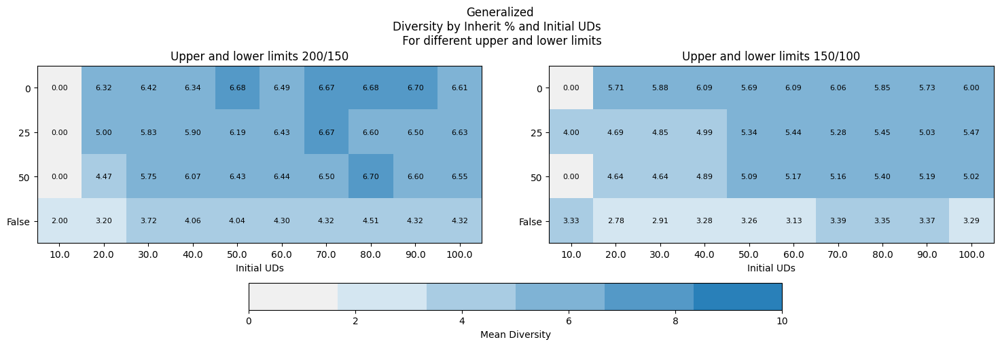

In [63]:
visualize_diversity(GmM_datos, inherits, Gmalphas, 'Generalized', up_low_limits, variable='Initial UDs', vis_type='heatmap')

C:\Users\jsolm\Juancho\Juancho\Maestrías\Modelage en Sistemas Complejos\Tesis\Projecto\Modelo\modelo_mio\Agrobiodiversity-model\venv\lib\site-packages\numpy\_core\fromnumeric.py:3596: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\jsolm\Juancho\Juancho\Maestrías\Modelage en Sistemas Complejos\Tesis\Projecto\Modelo\modelo_mio\Agrobiodiversity-model\venv\lib\site-packages\numpy\_core\_methods.py:138: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\jsolm\Juancho\Juancho\Maestrías\Modelage en Sistemas Complejos\Tesis\Projecto\Modelo\modelo_mio\Agrobiodiversity-model\venv\lib\site-packages\numpy\_core\_methods.py:218: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\jsolm\Juancho\Juancho\Maestrías\Modelage en Sistemas Complejos\Tesis\Projecto\Modelo\modelo_mio\Agrobiodiversity-model\venv\lib\site-packages\numpy\_core

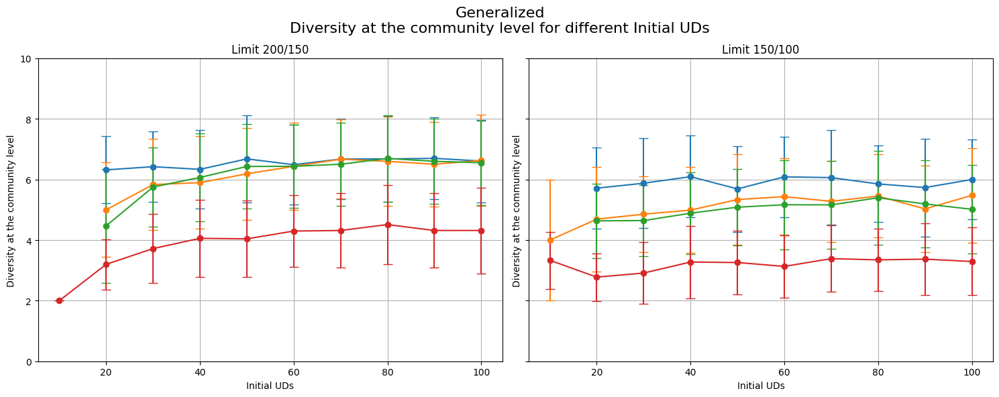

In [64]:
visualize_diversity(GmM_datos, inherits, Gmalphas, 'Generalized', up_low_limits, variable='Initial UDs', vis_type='transversal')

## Pop dynamics

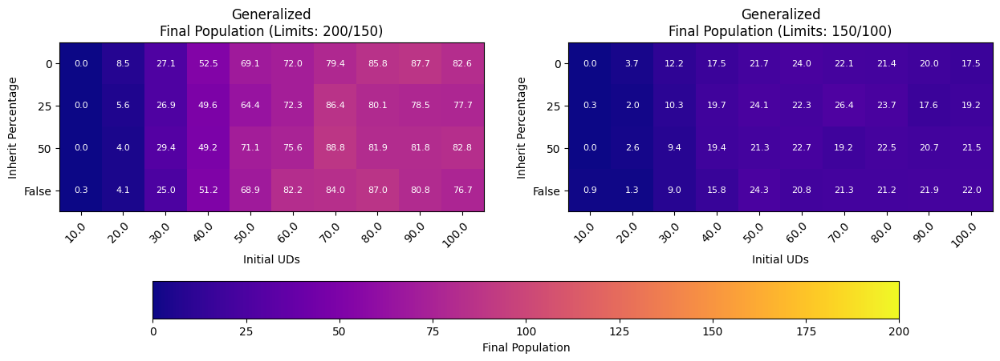

In [65]:
visualize_heatmap(GmM_datos, inherits, Gmalphas, 'Generalized', variable='Initial UDs', up_low_limits=up_low_limits, heatmap_type='alive')

## Initial Varieties

Here we try with different values for the initial varieties in the system.
We go from 10 to 100.

In [13]:
# This experiment has different values for Initial varieties VVVV
prob_morte = 0.06 #beta
media = 4 # Mean
m = 40
v = 100 # Initial varieties
inherits = [0,25,50, 'False']
# inherits = [0,25,50] #Values for inherit
#inherits = ['False'] #Values for inherit
Dvalphas = np.linspace(10,v,int(v/10)) # Initial Varieties: from 10 to v
up_low_limits = [[200, 150], [150, 100]]
# For data of behaviour
vM = np.empty((len(inherits), len(Dvalphas), len(up_low_limits)), dtype=object) # alive, mean and diversity levels

punto_vista = 50
tiempo = 1000
tempo = list(range(0,tiempo+1,punto_vista))
experiments = 300


print(vM.shape)
start = time.time()
print(f"started at:  {datetime.now()}")
for i, inherit in enumerate(inherits):
    for j, varieties  in enumerate(Dvalphas):
        for k, (upper_limit, lower_limit) in enumerate(up_low_limits):
            star_configuration = time.time()
            #For population dynamics
            list_alive_UDs = []
            list_vivas_puntos_vista = []
            tasas_crecimiento = []
            #For diversity dynamics
            data_step_mean_var_ud = []
            data_step_var_system = []
            data_step_unique_system = []
            print(f"Experiments with inheritance {inherit} Initial UDs {m} and Initial varieties {varieties}")
            #Lists to store experiments' diversity data
            data_endo_mean_ud = []
            data_endo_com_level = []
            data_endo_total_varieties = []
            original_media = media
            #To see how frequent goes to extintion
            contador = 0
            for experiment in range(1, experiments+1):
                print(f'experimento {experiment}')
                #### Initialization generalized_exchange
                ## Clans
                clans = (list(range(1, 4)) * (m // 3 + 1))[:m] # Just 3 clans
                random.shuffle(clans)
                if inherit != 'False':    
                    #### Initialization
                    UD_generalized.uds = {}
                    instancias_ud = []
                    for id_ud in range(1, int(m) + 1):
                        instancias_ud.append(UD_generalized(id_ud, media, clans.pop()))
                    ## Varieties
                    limited_varieties = True
                    if limited_varieties == False:
                        for id_ud, ud in UD_generalized.uds.items():
                            for _ in range(3):
                                ud.varieties.append(Variety())
                    else:
                        initial_varieties = [Variety() for _ in range (int(varieties))]
                        for ud in UD_generalized.uds.values():
                            for _ in range(3):
                                ud.varieties.append(random.choice(initial_varieties))   
                    # Lists for graphs
                    vivas_puntos_vista = [int(m)]
                    vivas_tasa_crecimiento = [int(m)]
            #             mortas_puntos_vista = [0]
                    #For diversity
                    mean_var_ud = []
                    var_system = []
                    unique_system = []
                    var_ud = []
                    var_total = []
                    for ud in [ud for ud in UD_generalized.uds.values() if ud.activa ==True]:
                        var_ud.append(len(ud.varieties))
                        for variety in ud.varieties:
                            var_total.append(variety.variety_id)
                    mean_var_ud.append(np.mean(var_ud))
                    var_system.append(len(var_total))
                    unique_system.append(len(set(var_total)))
                    # Simulation
                    for t in range(1, tiempo):
                        uds_copy = {id_ud: ud for id_ud, ud in UD_generalized.uds.items() if ud.activa}
                        items = list(uds_copy.items())
                        random.shuffle(items)
                        uds_copy = dict(items)
                        alive = len(uds_copy)
                        if alive > upper_limit and (media == original_media):
                            media -= media//2
                            if media >= 4:
                                media = media //2
                        elif alive < lower_limit and media < original_media:
                            media = original_media
                        if not uds_copy: #Extintion
                            # Only 0
                            print(f"acabó en 0 el experimento {experiment} con herencia {inherits[i]} con unidades {Dvalphas[j]}")
                            vivas_puntos_vista.extend([0] * (int((tiempo/punto_vista)-(len(vivas_puntos_vista)))))
                            vivas_tasa_crecimiento.extend([0] * (int((tiempo)-(len(vivas_tasa_crecimiento)))))
                            contador += 1
                            break         
                        # Cycle:
                        for id_ud, ud in uds_copy.items():
                            ud.ter_filho()
                            ud.buscar_ud(uds_copy, int(media), inherit, True, 0.2)
                            ud.incrementar_idade()
                            ud.death_probability(prob_morte)
                        # Collecting data
                        vivas_tasa_crecimiento.append(len([ud for id, ud in uds_copy.items() if ud.activa]))
                        if t % punto_vista == 0:
                            viv = len([ud for id, ud in uds_copy.items() if ud.activa])
                            #mort = len([ud for id, ud in uds_copy.items() if not ud.activa])
                            vivas_puntos_vista.append(viv)
                            # For diversity
                            var_ud = []
                            var_total = []
                            for ud in [ud for ud in UD_generalized.uds.values() if ud.activa ==True]:
                                var_ud.append(len(ud.varieties))
                                for variety in ud.varieties:
                                    var_total.append(variety.variety_id)
                            mean_var_ud.append(np.mean(var_ud))
                            var_system.append(len(var_total))
                            unique_system.append(len(set(var_total))) 
                    viv = len([ud for id, ud in UD_generalized.uds.items() if ud.activa])
                    vivas_puntos_vista.append(viv)
                    # For diversity
                    var_ud = []
                    var_total = []
                    for ud in [ud for ud in UD_generalized.uds.values() if ud.activa ==True]:
                        var_ud.append(len(ud.varieties))
                        for variety in ud.varieties:
                            var_total.append(variety.variety_id)
                    mean_var_ud.append(np.mean(var_ud))
                    var_system.append(len(var_total))
                    unique_system.append(len(set(var_total)))
                    alive = (len([ud for id, ud in uds_copy.items() if ud.activa]))
                    if alive >= 1:   
                        total_varieties = []
                        varieties_per_UD = []
                        for ud in [ud for ud in UD_generalized.uds.values() if ud.activa ==True]:
                            varieties_per_UD.append(len(ud.varieties))
                            for variety in ud.varieties:
                                total_varieties.append(variety.variety_id)
                        data_endo_mean_ud.append(np.mean(varieties_per_UD))
                        data_endo_com_level.append(len(set(total_varieties)))
                        data_endo_total_varieties.append(total_varieties)

                else:# Now with inherit == False
                    #### Initialization
                    UD_generalized_al_inh.uds = {}
                    instancias_ud = []
                    for id_ud in range(1, int(m) + 1):
                        instancias_ud.append(UD_generalized_al_inh(id_ud, media, clans.pop()))
                    ## Varieties
                    limited_varieties = True
                    if limited_varieties == False:
                        for id_ud, ud in UD_generalized_al_inh.uds.items():
                            for _ in range(3):
                                ud.varieties.append(Variety())
                    else:
                        initial_varieties = [Variety() for _ in range (int(varieties))]
                        for ud in UD_generalized_al_inh.uds.values():
                            for _ in range(3):
                                ud.varieties.append(random.choice(initial_varieties))   
                    # Lists for graphs
                    vivas_puntos_vista = [int(m)]
                    vivas_tasa_crecimiento = [int(m)]
            #             mortas_puntos_vista = [0]
                    #For diversity
                    mean_var_ud = []
                    var_system = []
                    unique_system = []
                    var_ud = []
                    var_total = []
                    for ud in [ud for ud in UD_generalized_al_inh.uds.values() if ud.activa ==True]:
                        var_ud.append(len(ud.varieties))
                        for variety in ud.varieties:
                            var_total.append(variety.variety_id)
                    mean_var_ud.append(np.mean(var_ud))
                    var_system.append(len(var_total))
                    unique_system.append(len(set(var_total)))
                    # Simulation
                    for t in range(1, tiempo):
                        uds_copy = {id_ud: ud for id_ud, ud in UD_generalized_al_inh.uds.items() if ud.activa}
                        items = list(uds_copy.items())
                        random.shuffle(items)
                        uds_copy = dict(items)
                        alive = len(uds_copy)
                        if alive > upper_limit and (media == original_media):
                            media -= media//2
                            if media >= 4:
                                media = media //2
                        elif alive < lower_limit and media < original_media:
                            media = original_media
                        if not uds_copy: #Extintion
                            # Only 0
                            print(f"acabó en 0 el experimento {experiment} con herencia {inherits[i]} con unidades {Dvalphas[j]}")
                            vivas_puntos_vista.extend([0] * (int((tiempo/punto_vista)-(len(vivas_puntos_vista)))))
                            vivas_tasa_crecimiento.extend([0] * (int((tiempo)-(len(vivas_tasa_crecimiento)))))
                            contador += 1
                            break         
                        # Cycle:
                        varieties_list = [var for ud in uds_copy.values() for var in ud.varieties]
                        for id_ud, ud in uds_copy.items():
                            ud.ter_filho()
                            ud.buscar_ud(uds_copy, int(media), varieties_list, True, 3, 0.2)
                            ud.incrementar_idade()
                            ud.death_probability(prob_morte)
                        # Collecting data
                        vivas_tasa_crecimiento.append(len([ud for id, ud in uds_copy.items() if ud.activa]))
                        if t % punto_vista == 0:
                            viv = len([ud for id, ud in uds_copy.items() if ud.activa])
                            #mort = len([ud for id, ud in uds_copy.items() if not ud.activa])
                            vivas_puntos_vista.append(viv)
                            # For diversity
                            var_ud = []
                            var_total = []
                            for ud in [ud for ud in UD_generalized_al_inh.uds.values() if ud.activa ==True]:
                                var_ud.append(len(ud.varieties))
                                for variety in ud.varieties:
                                    var_total.append(variety.variety_id)
                            mean_var_ud.append(np.mean(var_ud))
                            var_system.append(len(var_total))
                            unique_system.append(len(set(var_total))) 
                    viv = len([ud for id, ud in UD_generalized_al_inh.uds.items() if ud.activa])
                    vivas_puntos_vista.append(viv)
                    # For diversity
                    var_ud = []
                    var_total = []
                    for ud in [ud for ud in UD_generalized_al_inh.uds.values() if ud.activa ==True]:
                        var_ud.append(len(ud.varieties))
                        for variety in ud.varieties:
                            var_total.append(variety.variety_id)
                    mean_var_ud.append(np.mean(var_ud))
                    var_system.append(len(var_total))
                    unique_system.append(len(set(var_total)))
                    alive = (len([ud for id, ud in uds_copy.items() if ud.activa]))
                    if alive >= 1:   
                        total_varieties = []
                        varieties_per_UD = []
                        for ud in [ud for ud in UD_generalized_al_inh.uds.values() if ud.activa ==True]:
                            varieties_per_UD.append(len(ud.varieties))
                            for variety in ud.varieties:
                                total_varieties.append(variety.variety_id)
                        data_endo_mean_ud.append(np.mean(varieties_per_UD))
                        data_endo_com_level.append(len(set(total_varieties)))
                        data_endo_total_varieties.append(total_varieties)


                #Final colect of the data after the simulation!
                indice_primer_cero = np.where(np.array(vivas_tasa_crecimiento) == 0)[0]            
                if len(indice_primer_cero) > 0:
                    # Get growth rate before the 0
                    tasas_crecimiento.append(np.diff(vivas_tasa_crecimiento[:indice_primer_cero[0] - 1]) / vivas_tasa_crecimiento[:-1][:indice_primer_cero[0] - 2] * 100)
                else:
                    # Growth rate
                    tasas_crecimiento.append(np.diff(vivas_tasa_crecimiento) / vivas_tasa_crecimiento[:-1] * 100)
                # Collect the data
                list_alive_UDs.append(len([ud for id, ud in uds_copy.items() if ud.activa == True])) #For heatmap
                list_vivas_puntos_vista.append(vivas_puntos_vista)
                if alive >= 1:
                    if len(mean_var_ud) == len(tempo):        
                        data_step_var_system.append(var_system)
                        data_step_unique_system.append(unique_system)
                        data_step_mean_var_ud.append(mean_var_ud)

                data_inherit_endo = [data_endo_mean_ud, data_endo_com_level, data_endo_total_varieties]
            data_steps_inherit_endo = [data_step_var_system, data_step_unique_system, data_step_mean_var_ud]
            media = original_media
            end_config = time.time()
            vM[i][j][k] = {'alive': np.mean(list_alive_UDs),
                        'std': np.std(list_alive_UDs),
                        'time used': end_config - star_configuration,
                        'porcentage_extintion': contador/experiments,
                        'tempo': tempo, 
                        'mean': np.mean(list_vivas_puntos_vista, axis=0), 
                        'std':  np.std(list_vivas_puntos_vista, axis=0),
                        'growth rate': np.mean([np.mean(lista) for lista in tasas_crecimiento]),
                        'diversity_info': data_inherit_endo,
                        'diversity_info_steps': data_steps_inherit_endo}
            print(f"""
    The total time of the configuration of inherit percentage {inherit}, 
      initial UDs {m} and Initial varieties {varieties} is  {end_config - star_configuration}
            """)
# Folder
folder_name = 'Experiments_kinship_inheritance_parameters_limits'
if not os.path.exists(folder_name):
    os.makedirs(folder_name)
# Heatmap and std
heat_std = os.path.join(folder_name, 'Generalized_Initial_Varieties.npy')
np.save(heat_std, vM)
now = datetime.now()
finish = time.time()
print(f"""
It finished at: {now}
It lasted {finish-start}
""")
print("done")

(4, 10, 2)
started at:  2024-11-17 01:53:39.763715
Experiments with inheritance 0 Initial UDs 40 and Initial varieties 10.0
experimento 1
acabó en 0 el experimento 1 con herencia 0 con unidades 10.0
experimento 2
acabó en 0 el experimento 2 con herencia 0 con unidades 10.0
experimento 3


C:\Users\jsolm\Juancho\Juancho\Maestrías\Modelage en Sistemas Complejos\Tesis\Projecto\Modelo\modelo_mio\Agrobiodiversity-model\venv\lib\site-packages\numpy\_core\fromnumeric.py:3596: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\jsolm\Juancho\Juancho\Maestrías\Modelage en Sistemas Complejos\Tesis\Projecto\Modelo\modelo_mio\Agrobiodiversity-model\venv\lib\site-packages\numpy\_core\_methods.py:138: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


acabó en 0 el experimento 3 con herencia 0 con unidades 10.0
experimento 4
acabó en 0 el experimento 4 con herencia 0 con unidades 10.0
experimento 5
experimento 6
experimento 7
experimento 8
acabó en 0 el experimento 8 con herencia 0 con unidades 10.0
experimento 9
acabó en 0 el experimento 9 con herencia 0 con unidades 10.0
experimento 10
experimento 11
experimento 12
experimento 13
acabó en 0 el experimento 13 con herencia 0 con unidades 10.0
experimento 14
acabó en 0 el experimento 14 con herencia 0 con unidades 10.0
experimento 15
acabó en 0 el experimento 15 con herencia 0 con unidades 10.0
experimento 16
acabó en 0 el experimento 16 con herencia 0 con unidades 10.0
experimento 17
experimento 18
experimento 19
experimento 20
acabó en 0 el experimento 20 con herencia 0 con unidades 10.0
experimento 21
experimento 22
acabó en 0 el experimento 22 con herencia 0 con unidades 10.0
experimento 23
acabó en 0 el experimento 23 con herencia 0 con unidades 10.0
experimento 24
acabó en 0 el

acabó en 0 el experimento 187 con herencia 0 con unidades 10.0
experimento 188
experimento 189
acabó en 0 el experimento 189 con herencia 0 con unidades 10.0
experimento 190
acabó en 0 el experimento 190 con herencia 0 con unidades 10.0
experimento 191
experimento 192
acabó en 0 el experimento 192 con herencia 0 con unidades 10.0
experimento 193
acabó en 0 el experimento 193 con herencia 0 con unidades 10.0
experimento 194
experimento 195
experimento 196
acabó en 0 el experimento 196 con herencia 0 con unidades 10.0
experimento 197
experimento 198
experimento 199
acabó en 0 el experimento 199 con herencia 0 con unidades 10.0
experimento 200
experimento 201
experimento 202
experimento 203
experimento 204
acabó en 0 el experimento 204 con herencia 0 con unidades 10.0
experimento 205
acabó en 0 el experimento 205 con herencia 0 con unidades 10.0
experimento 206
experimento 207
experimento 208
acabó en 0 el experimento 208 con herencia 0 con unidades 10.0
experimento 209
experimento 210
ac

acabó en 0 el experimento 46 con herencia 0 con unidades 10.0
experimento 47
experimento 48
acabó en 0 el experimento 48 con herencia 0 con unidades 10.0
experimento 49
acabó en 0 el experimento 49 con herencia 0 con unidades 10.0
experimento 50
acabó en 0 el experimento 50 con herencia 0 con unidades 10.0
experimento 51
acabó en 0 el experimento 51 con herencia 0 con unidades 10.0
experimento 52
acabó en 0 el experimento 52 con herencia 0 con unidades 10.0
experimento 53
acabó en 0 el experimento 53 con herencia 0 con unidades 10.0
experimento 54
acabó en 0 el experimento 54 con herencia 0 con unidades 10.0
experimento 55
acabó en 0 el experimento 55 con herencia 0 con unidades 10.0
experimento 56
experimento 57
acabó en 0 el experimento 57 con herencia 0 con unidades 10.0
experimento 58
acabó en 0 el experimento 58 con herencia 0 con unidades 10.0
experimento 59
acabó en 0 el experimento 59 con herencia 0 con unidades 10.0
experimento 60
acabó en 0 el experimento 60 con herencia 0 co

acabó en 0 el experimento 189 con herencia 0 con unidades 10.0
experimento 190
acabó en 0 el experimento 190 con herencia 0 con unidades 10.0
experimento 191
acabó en 0 el experimento 191 con herencia 0 con unidades 10.0
experimento 192
acabó en 0 el experimento 192 con herencia 0 con unidades 10.0
experimento 193
acabó en 0 el experimento 193 con herencia 0 con unidades 10.0
experimento 194
experimento 195
acabó en 0 el experimento 195 con herencia 0 con unidades 10.0
experimento 196
acabó en 0 el experimento 196 con herencia 0 con unidades 10.0
experimento 197
acabó en 0 el experimento 197 con herencia 0 con unidades 10.0
experimento 198
acabó en 0 el experimento 198 con herencia 0 con unidades 10.0
experimento 199
acabó en 0 el experimento 199 con herencia 0 con unidades 10.0
experimento 200
experimento 201
acabó en 0 el experimento 201 con herencia 0 con unidades 10.0
experimento 202
acabó en 0 el experimento 202 con herencia 0 con unidades 10.0
experimento 203
acabó en 0 el experi

acabó en 0 el experimento 20 con herencia 0 con unidades 20.0
experimento 21
acabó en 0 el experimento 21 con herencia 0 con unidades 20.0
experimento 22
acabó en 0 el experimento 22 con herencia 0 con unidades 20.0
experimento 23
acabó en 0 el experimento 23 con herencia 0 con unidades 20.0
experimento 24
experimento 25
experimento 26
experimento 27
acabó en 0 el experimento 27 con herencia 0 con unidades 20.0
experimento 28
experimento 29
experimento 30
acabó en 0 el experimento 30 con herencia 0 con unidades 20.0
experimento 31
experimento 32
acabó en 0 el experimento 32 con herencia 0 con unidades 20.0
experimento 33
acabó en 0 el experimento 33 con herencia 0 con unidades 20.0
experimento 34
experimento 35
experimento 36
acabó en 0 el experimento 36 con herencia 0 con unidades 20.0
experimento 37
experimento 38
experimento 39
experimento 40
acabó en 0 el experimento 40 con herencia 0 con unidades 20.0
experimento 41
experimento 42
acabó en 0 el experimento 42 con herencia 0 con un

experimento 193
experimento 194
acabó en 0 el experimento 194 con herencia 0 con unidades 20.0
experimento 195
acabó en 0 el experimento 195 con herencia 0 con unidades 20.0
experimento 196
experimento 197
experimento 198
experimento 199
experimento 200
experimento 201
experimento 202
acabó en 0 el experimento 202 con herencia 0 con unidades 20.0
experimento 203
experimento 204
experimento 205
experimento 206
acabó en 0 el experimento 206 con herencia 0 con unidades 20.0
experimento 207
experimento 208
acabó en 0 el experimento 208 con herencia 0 con unidades 20.0
experimento 209
experimento 210
experimento 211
acabó en 0 el experimento 211 con herencia 0 con unidades 20.0
experimento 212
acabó en 0 el experimento 212 con herencia 0 con unidades 20.0
experimento 213
experimento 214
acabó en 0 el experimento 214 con herencia 0 con unidades 20.0
experimento 215
experimento 216
experimento 217
acabó en 0 el experimento 217 con herencia 0 con unidades 20.0
experimento 218
acabó en 0 el exp

acabó en 0 el experimento 44 con herencia 0 con unidades 20.0
experimento 45
acabó en 0 el experimento 45 con herencia 0 con unidades 20.0
experimento 46
acabó en 0 el experimento 46 con herencia 0 con unidades 20.0
experimento 47
acabó en 0 el experimento 47 con herencia 0 con unidades 20.0
experimento 48
acabó en 0 el experimento 48 con herencia 0 con unidades 20.0
experimento 49
acabó en 0 el experimento 49 con herencia 0 con unidades 20.0
experimento 50
acabó en 0 el experimento 50 con herencia 0 con unidades 20.0
experimento 51
experimento 52
acabó en 0 el experimento 52 con herencia 0 con unidades 20.0
experimento 53
acabó en 0 el experimento 53 con herencia 0 con unidades 20.0
experimento 54
experimento 55
acabó en 0 el experimento 55 con herencia 0 con unidades 20.0
experimento 56
experimento 57
acabó en 0 el experimento 57 con herencia 0 con unidades 20.0
experimento 58
acabó en 0 el experimento 58 con herencia 0 con unidades 20.0
experimento 59
experimento 60
acabó en 0 el ex

experimento 186
acabó en 0 el experimento 186 con herencia 0 con unidades 20.0
experimento 187
acabó en 0 el experimento 187 con herencia 0 con unidades 20.0
experimento 188
acabó en 0 el experimento 188 con herencia 0 con unidades 20.0
experimento 189
acabó en 0 el experimento 189 con herencia 0 con unidades 20.0
experimento 190
acabó en 0 el experimento 190 con herencia 0 con unidades 20.0
experimento 191
experimento 192
acabó en 0 el experimento 192 con herencia 0 con unidades 20.0
experimento 193
acabó en 0 el experimento 193 con herencia 0 con unidades 20.0
experimento 194
experimento 195
experimento 196
experimento 197
experimento 198
experimento 199
acabó en 0 el experimento 199 con herencia 0 con unidades 20.0
experimento 200
acabó en 0 el experimento 200 con herencia 0 con unidades 20.0
experimento 201
acabó en 0 el experimento 201 con herencia 0 con unidades 20.0
experimento 202
acabó en 0 el experimento 202 con herencia 0 con unidades 20.0
experimento 203
acabó en 0 el exper

acabó en 0 el experimento 30 con herencia 0 con unidades 30.0
experimento 31
acabó en 0 el experimento 31 con herencia 0 con unidades 30.0
experimento 32
experimento 33
experimento 34
acabó en 0 el experimento 34 con herencia 0 con unidades 30.0
experimento 35
acabó en 0 el experimento 35 con herencia 0 con unidades 30.0
experimento 36
acabó en 0 el experimento 36 con herencia 0 con unidades 30.0
experimento 37
experimento 38
experimento 39
acabó en 0 el experimento 39 con herencia 0 con unidades 30.0
experimento 40
experimento 41
experimento 42
acabó en 0 el experimento 42 con herencia 0 con unidades 30.0
experimento 43
experimento 44
acabó en 0 el experimento 44 con herencia 0 con unidades 30.0
experimento 45
acabó en 0 el experimento 45 con herencia 0 con unidades 30.0
experimento 46
acabó en 0 el experimento 46 con herencia 0 con unidades 30.0
experimento 47
acabó en 0 el experimento 47 con herencia 0 con unidades 30.0
experimento 48
acabó en 0 el experimento 48 con herencia 0 con 

experimento 189
experimento 190
acabó en 0 el experimento 190 con herencia 0 con unidades 30.0
experimento 191
experimento 192
experimento 193
acabó en 0 el experimento 193 con herencia 0 con unidades 30.0
experimento 194
experimento 195
acabó en 0 el experimento 195 con herencia 0 con unidades 30.0
experimento 196
experimento 197
acabó en 0 el experimento 197 con herencia 0 con unidades 30.0
experimento 198
experimento 199
acabó en 0 el experimento 199 con herencia 0 con unidades 30.0
experimento 200
experimento 201
acabó en 0 el experimento 201 con herencia 0 con unidades 30.0
experimento 202
experimento 203
acabó en 0 el experimento 203 con herencia 0 con unidades 30.0
experimento 204
acabó en 0 el experimento 204 con herencia 0 con unidades 30.0
experimento 205
experimento 206
acabó en 0 el experimento 206 con herencia 0 con unidades 30.0
experimento 207
experimento 208
experimento 209
acabó en 0 el experimento 209 con herencia 0 con unidades 30.0
experimento 210
acabó en 0 el expe

experimento 49
acabó en 0 el experimento 49 con herencia 0 con unidades 30.0
experimento 50
acabó en 0 el experimento 50 con herencia 0 con unidades 30.0
experimento 51
experimento 52
acabó en 0 el experimento 52 con herencia 0 con unidades 30.0
experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
acabó en 0 el experimento 57 con herencia 0 con unidades 30.0
experimento 58
acabó en 0 el experimento 58 con herencia 0 con unidades 30.0
experimento 59
experimento 60
experimento 61
acabó en 0 el experimento 61 con herencia 0 con unidades 30.0
experimento 62
acabó en 0 el experimento 62 con herencia 0 con unidades 30.0
experimento 63
acabó en 0 el experimento 63 con herencia 0 con unidades 30.0
experimento 64
acabó en 0 el experimento 64 con herencia 0 con unidades 30.0
experimento 65
experimento 66
experimento 67
acabó en 0 el experimento 67 con herencia 0 con unidades 30.0
experimento 68
acabó en 0 el experimento 68 con herencia 0 con unidades 30.0
experimento 69
aca

acabó en 0 el experimento 196 con herencia 0 con unidades 30.0
experimento 197
acabó en 0 el experimento 197 con herencia 0 con unidades 30.0
experimento 198
experimento 199
acabó en 0 el experimento 199 con herencia 0 con unidades 30.0
experimento 200
acabó en 0 el experimento 200 con herencia 0 con unidades 30.0
experimento 201
acabó en 0 el experimento 201 con herencia 0 con unidades 30.0
experimento 202
acabó en 0 el experimento 202 con herencia 0 con unidades 30.0
experimento 203
acabó en 0 el experimento 203 con herencia 0 con unidades 30.0
experimento 204
experimento 205
acabó en 0 el experimento 205 con herencia 0 con unidades 30.0
experimento 206
experimento 207
acabó en 0 el experimento 207 con herencia 0 con unidades 30.0
experimento 208
experimento 209
acabó en 0 el experimento 209 con herencia 0 con unidades 30.0
experimento 210
acabó en 0 el experimento 210 con herencia 0 con unidades 30.0
experimento 211
experimento 212
acabó en 0 el experimento 212 con herencia 0 con un

acabó en 0 el experimento 43 con herencia 0 con unidades 40.0
experimento 44
acabó en 0 el experimento 44 con herencia 0 con unidades 40.0
experimento 45
experimento 46
acabó en 0 el experimento 46 con herencia 0 con unidades 40.0
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
acabó en 0 el experimento 53 con herencia 0 con unidades 40.0
experimento 54
experimento 55
experimento 56
acabó en 0 el experimento 56 con herencia 0 con unidades 40.0
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
acabó en 0 el experimento 62 con herencia 0 con unidades 40.0
experimento 63
experimento 64
experimento 65
experimento 66
experimento 67
acabó en 0 el experimento 67 con herencia 0 con unidades 40.0
experimento 68
acabó en 0 el experimento 68 con herencia 0 con unidades 40.0
experimento 69
acabó en 0 el experimento 69 con herencia 0 con unidades 40.0
experimento 70
experimento 71
experimento 72
acabó e

experimento 223
experimento 224
experimento 225
acabó en 0 el experimento 225 con herencia 0 con unidades 40.0
experimento 226
experimento 227
experimento 228
experimento 229
experimento 230
acabó en 0 el experimento 230 con herencia 0 con unidades 40.0
experimento 231
experimento 232
experimento 233
experimento 234
experimento 235
acabó en 0 el experimento 235 con herencia 0 con unidades 40.0
experimento 236
experimento 237
acabó en 0 el experimento 237 con herencia 0 con unidades 40.0
experimento 238
acabó en 0 el experimento 238 con herencia 0 con unidades 40.0
experimento 239
experimento 240
acabó en 0 el experimento 240 con herencia 0 con unidades 40.0
experimento 241
experimento 242
acabó en 0 el experimento 242 con herencia 0 con unidades 40.0
experimento 243
experimento 244
experimento 245
acabó en 0 el experimento 245 con herencia 0 con unidades 40.0
experimento 246
acabó en 0 el experimento 246 con herencia 0 con unidades 40.0
experimento 247
experimento 248
experimento 249
a

experimento 74
experimento 75
acabó en 0 el experimento 75 con herencia 0 con unidades 40.0
experimento 76
acabó en 0 el experimento 76 con herencia 0 con unidades 40.0
experimento 77
acabó en 0 el experimento 77 con herencia 0 con unidades 40.0
experimento 78
experimento 79
experimento 80
acabó en 0 el experimento 80 con herencia 0 con unidades 40.0
experimento 81
experimento 82
acabó en 0 el experimento 82 con herencia 0 con unidades 40.0
experimento 83
experimento 84
acabó en 0 el experimento 84 con herencia 0 con unidades 40.0
experimento 85
acabó en 0 el experimento 85 con herencia 0 con unidades 40.0
experimento 86
experimento 87
experimento 88
experimento 89
acabó en 0 el experimento 89 con herencia 0 con unidades 40.0
experimento 90
acabó en 0 el experimento 90 con herencia 0 con unidades 40.0
experimento 91
acabó en 0 el experimento 91 con herencia 0 con unidades 40.0
experimento 92
acabó en 0 el experimento 92 con herencia 0 con unidades 40.0
experimento 93
acabó en 0 el expe

experimento 219
acabó en 0 el experimento 219 con herencia 0 con unidades 40.0
experimento 220
acabó en 0 el experimento 220 con herencia 0 con unidades 40.0
experimento 221
acabó en 0 el experimento 221 con herencia 0 con unidades 40.0
experimento 222
experimento 223
experimento 224
acabó en 0 el experimento 224 con herencia 0 con unidades 40.0
experimento 225
experimento 226
acabó en 0 el experimento 226 con herencia 0 con unidades 40.0
experimento 227
acabó en 0 el experimento 227 con herencia 0 con unidades 40.0
experimento 228
experimento 229
experimento 230
acabó en 0 el experimento 230 con herencia 0 con unidades 40.0
experimento 231
experimento 232
acabó en 0 el experimento 232 con herencia 0 con unidades 40.0
experimento 233
acabó en 0 el experimento 233 con herencia 0 con unidades 40.0
experimento 234
acabó en 0 el experimento 234 con herencia 0 con unidades 40.0
experimento 235
experimento 236
experimento 237
acabó en 0 el experimento 237 con herencia 0 con unidades 40.0
exp

experimento 66
acabó en 0 el experimento 66 con herencia 0 con unidades 50.0
experimento 67
experimento 68
experimento 69
experimento 70
experimento 71
experimento 72
acabó en 0 el experimento 72 con herencia 0 con unidades 50.0
experimento 73
acabó en 0 el experimento 73 con herencia 0 con unidades 50.0
experimento 74
acabó en 0 el experimento 74 con herencia 0 con unidades 50.0
experimento 75
acabó en 0 el experimento 75 con herencia 0 con unidades 50.0
experimento 76
experimento 77
experimento 78
acabó en 0 el experimento 78 con herencia 0 con unidades 50.0
experimento 79
experimento 80
acabó en 0 el experimento 80 con herencia 0 con unidades 50.0
experimento 81
experimento 82
experimento 83
acabó en 0 el experimento 83 con herencia 0 con unidades 50.0
experimento 84
acabó en 0 el experimento 84 con herencia 0 con unidades 50.0
experimento 85
experimento 86
acabó en 0 el experimento 86 con herencia 0 con unidades 50.0
experimento 87
experimento 88
experimento 89
acabó en 0 el experi

acabó en 0 el experimento 242 con herencia 0 con unidades 50.0
experimento 243
acabó en 0 el experimento 243 con herencia 0 con unidades 50.0
experimento 244
acabó en 0 el experimento 244 con herencia 0 con unidades 50.0
experimento 245
acabó en 0 el experimento 245 con herencia 0 con unidades 50.0
experimento 246
acabó en 0 el experimento 246 con herencia 0 con unidades 50.0
experimento 247
experimento 248
acabó en 0 el experimento 248 con herencia 0 con unidades 50.0
experimento 249
acabó en 0 el experimento 249 con herencia 0 con unidades 50.0
experimento 250
acabó en 0 el experimento 250 con herencia 0 con unidades 50.0
experimento 251
experimento 252
experimento 253
acabó en 0 el experimento 253 con herencia 0 con unidades 50.0
experimento 254
experimento 255
acabó en 0 el experimento 255 con herencia 0 con unidades 50.0
experimento 256
experimento 257
experimento 258
experimento 259
acabó en 0 el experimento 259 con herencia 0 con unidades 50.0
experimento 260
experimento 261
aca

acabó en 0 el experimento 81 con herencia 0 con unidades 50.0
experimento 82
experimento 83
experimento 84
acabó en 0 el experimento 84 con herencia 0 con unidades 50.0
experimento 85
acabó en 0 el experimento 85 con herencia 0 con unidades 50.0
experimento 86
acabó en 0 el experimento 86 con herencia 0 con unidades 50.0
experimento 87
acabó en 0 el experimento 87 con herencia 0 con unidades 50.0
experimento 88
acabó en 0 el experimento 88 con herencia 0 con unidades 50.0
experimento 89
acabó en 0 el experimento 89 con herencia 0 con unidades 50.0
experimento 90
acabó en 0 el experimento 90 con herencia 0 con unidades 50.0
experimento 91
experimento 92
experimento 93
acabó en 0 el experimento 93 con herencia 0 con unidades 50.0
experimento 94
experimento 95
acabó en 0 el experimento 95 con herencia 0 con unidades 50.0
experimento 96
experimento 97
acabó en 0 el experimento 97 con herencia 0 con unidades 50.0
experimento 98
experimento 99
acabó en 0 el experimento 99 con herencia 0 con 

experimento 227
acabó en 0 el experimento 227 con herencia 0 con unidades 50.0
experimento 228
acabó en 0 el experimento 228 con herencia 0 con unidades 50.0
experimento 229
acabó en 0 el experimento 229 con herencia 0 con unidades 50.0
experimento 230
experimento 231
acabó en 0 el experimento 231 con herencia 0 con unidades 50.0
experimento 232
experimento 233
acabó en 0 el experimento 233 con herencia 0 con unidades 50.0
experimento 234
acabó en 0 el experimento 234 con herencia 0 con unidades 50.0
experimento 235
acabó en 0 el experimento 235 con herencia 0 con unidades 50.0
experimento 236
experimento 237
experimento 238
experimento 239
acabó en 0 el experimento 239 con herencia 0 con unidades 50.0
experimento 240
acabó en 0 el experimento 240 con herencia 0 con unidades 50.0
experimento 241
acabó en 0 el experimento 241 con herencia 0 con unidades 50.0
experimento 242
acabó en 0 el experimento 242 con herencia 0 con unidades 50.0
experimento 243
acabó en 0 el experimento 243 con h

acabó en 0 el experimento 82 con herencia 0 con unidades 60.0
experimento 83
experimento 84
acabó en 0 el experimento 84 con herencia 0 con unidades 60.0
experimento 85
experimento 86
experimento 87
acabó en 0 el experimento 87 con herencia 0 con unidades 60.0
experimento 88
acabó en 0 el experimento 88 con herencia 0 con unidades 60.0
experimento 89
experimento 90
experimento 91
experimento 92
experimento 93
acabó en 0 el experimento 93 con herencia 0 con unidades 60.0
experimento 94
acabó en 0 el experimento 94 con herencia 0 con unidades 60.0
experimento 95
acabó en 0 el experimento 95 con herencia 0 con unidades 60.0
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100
experimento 101
acabó en 0 el experimento 101 con herencia 0 con unidades 60.0
experimento 102
acabó en 0 el experimento 102 con herencia 0 con unidades 60.0
experimento 103
experimento 104
experimento 105
acabó en 0 el experimento 105 con herencia 0 con unidades 60.0
experimento 106
experiment

acabó en 0 el experimento 252 con herencia 0 con unidades 60.0
experimento 253
experimento 254
experimento 255
acabó en 0 el experimento 255 con herencia 0 con unidades 60.0
experimento 256
acabó en 0 el experimento 256 con herencia 0 con unidades 60.0
experimento 257
experimento 258
experimento 259
experimento 260
acabó en 0 el experimento 260 con herencia 0 con unidades 60.0
experimento 261
experimento 262
experimento 263
acabó en 0 el experimento 263 con herencia 0 con unidades 60.0
experimento 264
experimento 265
experimento 266
acabó en 0 el experimento 266 con herencia 0 con unidades 60.0
experimento 267
acabó en 0 el experimento 267 con herencia 0 con unidades 60.0
experimento 268
acabó en 0 el experimento 268 con herencia 0 con unidades 60.0
experimento 269
acabó en 0 el experimento 269 con herencia 0 con unidades 60.0
experimento 270
experimento 271
acabó en 0 el experimento 271 con herencia 0 con unidades 60.0
experimento 272
experimento 273
acabó en 0 el experimento 273 con 

acabó en 0 el experimento 96 con herencia 0 con unidades 60.0
experimento 97
acabó en 0 el experimento 97 con herencia 0 con unidades 60.0
experimento 98
experimento 99
acabó en 0 el experimento 99 con herencia 0 con unidades 60.0
experimento 100
acabó en 0 el experimento 100 con herencia 0 con unidades 60.0
experimento 101
experimento 102
experimento 103
acabó en 0 el experimento 103 con herencia 0 con unidades 60.0
experimento 104
experimento 105
acabó en 0 el experimento 105 con herencia 0 con unidades 60.0
experimento 106
experimento 107
experimento 108
acabó en 0 el experimento 108 con herencia 0 con unidades 60.0
experimento 109
acabó en 0 el experimento 109 con herencia 0 con unidades 60.0
experimento 110
experimento 111
acabó en 0 el experimento 111 con herencia 0 con unidades 60.0
experimento 112
experimento 113
experimento 114
acabó en 0 el experimento 114 con herencia 0 con unidades 60.0
experimento 115
acabó en 0 el experimento 115 con herencia 0 con unidades 60.0
experimen

experimento 240
experimento 241
acabó en 0 el experimento 241 con herencia 0 con unidades 60.0
experimento 242
acabó en 0 el experimento 242 con herencia 0 con unidades 60.0
experimento 243
experimento 244
acabó en 0 el experimento 244 con herencia 0 con unidades 60.0
experimento 245
acabó en 0 el experimento 245 con herencia 0 con unidades 60.0
experimento 246
acabó en 0 el experimento 246 con herencia 0 con unidades 60.0
experimento 247
experimento 248
acabó en 0 el experimento 248 con herencia 0 con unidades 60.0
experimento 249
acabó en 0 el experimento 249 con herencia 0 con unidades 60.0
experimento 250
acabó en 0 el experimento 250 con herencia 0 con unidades 60.0
experimento 251
acabó en 0 el experimento 251 con herencia 0 con unidades 60.0
experimento 252
acabó en 0 el experimento 252 con herencia 0 con unidades 60.0
experimento 253
acabó en 0 el experimento 253 con herencia 0 con unidades 60.0
experimento 254
experimento 255
acabó en 0 el experimento 255 con herencia 0 con un

experimento 98
acabó en 0 el experimento 98 con herencia 0 con unidades 70.0
experimento 99
experimento 100
acabó en 0 el experimento 100 con herencia 0 con unidades 70.0
experimento 101
acabó en 0 el experimento 101 con herencia 0 con unidades 70.0
experimento 102
experimento 103
acabó en 0 el experimento 103 con herencia 0 con unidades 70.0
experimento 104
acabó en 0 el experimento 104 con herencia 0 con unidades 70.0
experimento 105
experimento 106
acabó en 0 el experimento 106 con herencia 0 con unidades 70.0
experimento 107
experimento 108
experimento 109
experimento 110
experimento 111
acabó en 0 el experimento 111 con herencia 0 con unidades 70.0
experimento 112
experimento 113
acabó en 0 el experimento 113 con herencia 0 con unidades 70.0
experimento 114
experimento 115
acabó en 0 el experimento 115 con herencia 0 con unidades 70.0
experimento 116
experimento 117
experimento 118
acabó en 0 el experimento 118 con herencia 0 con unidades 70.0
experimento 119
acabó en 0 el experim

acabó en 0 el experimento 276 con herencia 0 con unidades 70.0
experimento 277
acabó en 0 el experimento 277 con herencia 0 con unidades 70.0
experimento 278
experimento 279
acabó en 0 el experimento 279 con herencia 0 con unidades 70.0
experimento 280
experimento 281
acabó en 0 el experimento 281 con herencia 0 con unidades 70.0
experimento 282
acabó en 0 el experimento 282 con herencia 0 con unidades 70.0
experimento 283
acabó en 0 el experimento 283 con herencia 0 con unidades 70.0
experimento 284
acabó en 0 el experimento 284 con herencia 0 con unidades 70.0
experimento 285
acabó en 0 el experimento 285 con herencia 0 con unidades 70.0
experimento 286
acabó en 0 el experimento 286 con herencia 0 con unidades 70.0
experimento 287
acabó en 0 el experimento 287 con herencia 0 con unidades 70.0
experimento 288
experimento 289
experimento 290
acabó en 0 el experimento 290 con herencia 0 con unidades 70.0
experimento 291
acabó en 0 el experimento 291 con herencia 0 con unidades 70.0
expe

experimento 115
acabó en 0 el experimento 115 con herencia 0 con unidades 70.0
experimento 116
acabó en 0 el experimento 116 con herencia 0 con unidades 70.0
experimento 117
acabó en 0 el experimento 117 con herencia 0 con unidades 70.0
experimento 118
acabó en 0 el experimento 118 con herencia 0 con unidades 70.0
experimento 119
experimento 120
acabó en 0 el experimento 120 con herencia 0 con unidades 70.0
experimento 121
experimento 122
acabó en 0 el experimento 122 con herencia 0 con unidades 70.0
experimento 123
experimento 124
acabó en 0 el experimento 124 con herencia 0 con unidades 70.0
experimento 125
experimento 126
acabó en 0 el experimento 126 con herencia 0 con unidades 70.0
experimento 127
acabó en 0 el experimento 127 con herencia 0 con unidades 70.0
experimento 128
acabó en 0 el experimento 128 con herencia 0 con unidades 70.0
experimento 129
acabó en 0 el experimento 129 con herencia 0 con unidades 70.0
experimento 130
acabó en 0 el experimento 130 con herencia 0 con un

acabó en 0 el experimento 253 con herencia 0 con unidades 70.0
experimento 254
acabó en 0 el experimento 254 con herencia 0 con unidades 70.0
experimento 255
experimento 256
acabó en 0 el experimento 256 con herencia 0 con unidades 70.0
experimento 257
experimento 258
experimento 259
acabó en 0 el experimento 259 con herencia 0 con unidades 70.0
experimento 260
experimento 261
acabó en 0 el experimento 261 con herencia 0 con unidades 70.0
experimento 262
acabó en 0 el experimento 262 con herencia 0 con unidades 70.0
experimento 263
acabó en 0 el experimento 263 con herencia 0 con unidades 70.0
experimento 264
acabó en 0 el experimento 264 con herencia 0 con unidades 70.0
experimento 265
acabó en 0 el experimento 265 con herencia 0 con unidades 70.0
experimento 266
experimento 267
acabó en 0 el experimento 267 con herencia 0 con unidades 70.0
experimento 268
acabó en 0 el experimento 268 con herencia 0 con unidades 70.0
experimento 269
experimento 270
acabó en 0 el experimento 270 con h

experimento 106
experimento 107
acabó en 0 el experimento 107 con herencia 0 con unidades 80.0
experimento 108
experimento 109
experimento 110
acabó en 0 el experimento 110 con herencia 0 con unidades 80.0
experimento 111
acabó en 0 el experimento 111 con herencia 0 con unidades 80.0
experimento 112
acabó en 0 el experimento 112 con herencia 0 con unidades 80.0
experimento 113
acabó en 0 el experimento 113 con herencia 0 con unidades 80.0
experimento 114
acabó en 0 el experimento 114 con herencia 0 con unidades 80.0
experimento 115
experimento 116
experimento 117
experimento 118
acabó en 0 el experimento 118 con herencia 0 con unidades 80.0
experimento 119
acabó en 0 el experimento 119 con herencia 0 con unidades 80.0
experimento 120
acabó en 0 el experimento 120 con herencia 0 con unidades 80.0
experimento 121
experimento 122
experimento 123
acabó en 0 el experimento 123 con herencia 0 con unidades 80.0
experimento 124
acabó en 0 el experimento 124 con herencia 0 con unidades 80.0
exp

acabó en 0 el experimento 262 con herencia 0 con unidades 80.0
experimento 263
experimento 264
acabó en 0 el experimento 264 con herencia 0 con unidades 80.0
experimento 265
acabó en 0 el experimento 265 con herencia 0 con unidades 80.0
experimento 266
experimento 267
acabó en 0 el experimento 267 con herencia 0 con unidades 80.0
experimento 268
acabó en 0 el experimento 268 con herencia 0 con unidades 80.0
experimento 269
experimento 270
acabó en 0 el experimento 270 con herencia 0 con unidades 80.0
experimento 271
experimento 272
experimento 273
experimento 274
acabó en 0 el experimento 274 con herencia 0 con unidades 80.0
experimento 275
acabó en 0 el experimento 275 con herencia 0 con unidades 80.0
experimento 276
experimento 277
experimento 278
experimento 279
acabó en 0 el experimento 279 con herencia 0 con unidades 80.0
experimento 280
acabó en 0 el experimento 280 con herencia 0 con unidades 80.0
experimento 281
experimento 282
experimento 283
acabó en 0 el experimento 283 con 

acabó en 0 el experimento 108 con herencia 0 con unidades 80.0
experimento 109
acabó en 0 el experimento 109 con herencia 0 con unidades 80.0
experimento 110
acabó en 0 el experimento 110 con herencia 0 con unidades 80.0
experimento 111
acabó en 0 el experimento 111 con herencia 0 con unidades 80.0
experimento 112
acabó en 0 el experimento 112 con herencia 0 con unidades 80.0
experimento 113
experimento 114
acabó en 0 el experimento 114 con herencia 0 con unidades 80.0
experimento 115
acabó en 0 el experimento 115 con herencia 0 con unidades 80.0
experimento 116
acabó en 0 el experimento 116 con herencia 0 con unidades 80.0
experimento 117
acabó en 0 el experimento 117 con herencia 0 con unidades 80.0
experimento 118
acabó en 0 el experimento 118 con herencia 0 con unidades 80.0
experimento 119
acabó en 0 el experimento 119 con herencia 0 con unidades 80.0
experimento 120
acabó en 0 el experimento 120 con herencia 0 con unidades 80.0
experimento 121
experimento 122
acabó en 0 el experi

acabó en 0 el experimento 258 con herencia 0 con unidades 80.0
experimento 259
acabó en 0 el experimento 259 con herencia 0 con unidades 80.0
experimento 260
acabó en 0 el experimento 260 con herencia 0 con unidades 80.0
experimento 261
acabó en 0 el experimento 261 con herencia 0 con unidades 80.0
experimento 262
acabó en 0 el experimento 262 con herencia 0 con unidades 80.0
experimento 263
experimento 264
acabó en 0 el experimento 264 con herencia 0 con unidades 80.0
experimento 265
experimento 266
experimento 267
experimento 268
acabó en 0 el experimento 268 con herencia 0 con unidades 80.0
experimento 269
experimento 270
experimento 271
acabó en 0 el experimento 271 con herencia 0 con unidades 80.0
experimento 272
acabó en 0 el experimento 272 con herencia 0 con unidades 80.0
experimento 273
acabó en 0 el experimento 273 con herencia 0 con unidades 80.0
experimento 274
acabó en 0 el experimento 274 con herencia 0 con unidades 80.0
experimento 275
acabó en 0 el experimento 275 con h

experimento 123
experimento 124
acabó en 0 el experimento 124 con herencia 0 con unidades 90.0
experimento 125
acabó en 0 el experimento 125 con herencia 0 con unidades 90.0
experimento 126
experimento 127
experimento 128
experimento 129
acabó en 0 el experimento 129 con herencia 0 con unidades 90.0
experimento 130
experimento 131
experimento 132
acabó en 0 el experimento 132 con herencia 0 con unidades 90.0
experimento 133
experimento 134
acabó en 0 el experimento 134 con herencia 0 con unidades 90.0
experimento 135
acabó en 0 el experimento 135 con herencia 0 con unidades 90.0
experimento 136
acabó en 0 el experimento 136 con herencia 0 con unidades 90.0
experimento 137
experimento 138
acabó en 0 el experimento 138 con herencia 0 con unidades 90.0
experimento 139
experimento 140
acabó en 0 el experimento 140 con herencia 0 con unidades 90.0
experimento 141
acabó en 0 el experimento 141 con herencia 0 con unidades 90.0
experimento 142
experimento 143
experimento 144
experimento 145
ac

experimento 294
acabó en 0 el experimento 294 con herencia 0 con unidades 90.0
experimento 295
experimento 296
acabó en 0 el experimento 296 con herencia 0 con unidades 90.0
experimento 297
experimento 298
experimento 299
experimento 300
acabó en 0 el experimento 300 con herencia 0 con unidades 90.0

    The total time of the configuration of inherit percentage 0, 
      initial UDs 40 and Initial varieties 90.0 is  691.300404548645
            
Experiments with inheritance 0 Initial UDs 40 and Initial varieties 90.0
experimento 1
acabó en 0 el experimento 1 con herencia 0 con unidades 90.0
experimento 2
acabó en 0 el experimento 2 con herencia 0 con unidades 90.0
experimento 3
acabó en 0 el experimento 3 con herencia 0 con unidades 90.0
experimento 4
acabó en 0 el experimento 4 con herencia 0 con unidades 90.0
experimento 5
acabó en 0 el experimento 5 con herencia 0 con unidades 90.0
experimento 6
experimento 7
experimento 8
acabó en 0 el experimento 8 con herencia 0 con unidades 90.0

experimento 142
acabó en 0 el experimento 142 con herencia 0 con unidades 90.0
experimento 143
acabó en 0 el experimento 143 con herencia 0 con unidades 90.0
experimento 144
acabó en 0 el experimento 144 con herencia 0 con unidades 90.0
experimento 145
acabó en 0 el experimento 145 con herencia 0 con unidades 90.0
experimento 146
acabó en 0 el experimento 146 con herencia 0 con unidades 90.0
experimento 147
acabó en 0 el experimento 147 con herencia 0 con unidades 90.0
experimento 148
experimento 149
experimento 150
experimento 151
acabó en 0 el experimento 151 con herencia 0 con unidades 90.0
experimento 152
experimento 153
experimento 154
acabó en 0 el experimento 154 con herencia 0 con unidades 90.0
experimento 155
acabó en 0 el experimento 155 con herencia 0 con unidades 90.0
experimento 156
acabó en 0 el experimento 156 con herencia 0 con unidades 90.0
experimento 157
acabó en 0 el experimento 157 con herencia 0 con unidades 90.0
experimento 158
experimento 159
acabó en 0 el exper

experimento 280
acabó en 0 el experimento 280 con herencia 0 con unidades 90.0
experimento 281
experimento 282
acabó en 0 el experimento 282 con herencia 0 con unidades 90.0
experimento 283
experimento 284
experimento 285
acabó en 0 el experimento 285 con herencia 0 con unidades 90.0
experimento 286
experimento 287
acabó en 0 el experimento 287 con herencia 0 con unidades 90.0
experimento 288
acabó en 0 el experimento 288 con herencia 0 con unidades 90.0
experimento 289
acabó en 0 el experimento 289 con herencia 0 con unidades 90.0
experimento 290
experimento 291
acabó en 0 el experimento 291 con herencia 0 con unidades 90.0
experimento 292
acabó en 0 el experimento 292 con herencia 0 con unidades 90.0
experimento 293
acabó en 0 el experimento 293 con herencia 0 con unidades 90.0
experimento 294
acabó en 0 el experimento 294 con herencia 0 con unidades 90.0
experimento 295
acabó en 0 el experimento 295 con herencia 0 con unidades 90.0
experimento 296
acabó en 0 el experimento 296 con h

acabó en 0 el experimento 141 con herencia 0 con unidades 100.0
experimento 142
acabó en 0 el experimento 142 con herencia 0 con unidades 100.0
experimento 143
experimento 144
acabó en 0 el experimento 144 con herencia 0 con unidades 100.0
experimento 145
experimento 146
experimento 147
experimento 148
experimento 149
experimento 150
acabó en 0 el experimento 150 con herencia 0 con unidades 100.0
experimento 151
acabó en 0 el experimento 151 con herencia 0 con unidades 100.0
experimento 152
acabó en 0 el experimento 152 con herencia 0 con unidades 100.0
experimento 153
experimento 154
acabó en 0 el experimento 154 con herencia 0 con unidades 100.0
experimento 155
acabó en 0 el experimento 155 con herencia 0 con unidades 100.0
experimento 156
acabó en 0 el experimento 156 con herencia 0 con unidades 100.0
experimento 157
acabó en 0 el experimento 157 con herencia 0 con unidades 100.0
experimento 158
experimento 159
acabó en 0 el experimento 159 con herencia 0 con unidades 100.0
experime

acabó en 0 el experimento 6 con herencia 0 con unidades 100.0
experimento 7
acabó en 0 el experimento 7 con herencia 0 con unidades 100.0
experimento 8
experimento 9
acabó en 0 el experimento 9 con herencia 0 con unidades 100.0
experimento 10
experimento 11
acabó en 0 el experimento 11 con herencia 0 con unidades 100.0
experimento 12
acabó en 0 el experimento 12 con herencia 0 con unidades 100.0
experimento 13
acabó en 0 el experimento 13 con herencia 0 con unidades 100.0
experimento 14
acabó en 0 el experimento 14 con herencia 0 con unidades 100.0
experimento 15
acabó en 0 el experimento 15 con herencia 0 con unidades 100.0
experimento 16
experimento 17
acabó en 0 el experimento 17 con herencia 0 con unidades 100.0
experimento 18
acabó en 0 el experimento 18 con herencia 0 con unidades 100.0
experimento 19
experimento 20
acabó en 0 el experimento 20 con herencia 0 con unidades 100.0
experimento 21
acabó en 0 el experimento 21 con herencia 0 con unidades 100.0
experimento 22
acabó en 0

acabó en 0 el experimento 141 con herencia 0 con unidades 100.0
experimento 142
acabó en 0 el experimento 142 con herencia 0 con unidades 100.0
experimento 143
acabó en 0 el experimento 143 con herencia 0 con unidades 100.0
experimento 144
experimento 145
acabó en 0 el experimento 145 con herencia 0 con unidades 100.0
experimento 146
experimento 147
acabó en 0 el experimento 147 con herencia 0 con unidades 100.0
experimento 148
acabó en 0 el experimento 148 con herencia 0 con unidades 100.0
experimento 149
acabó en 0 el experimento 149 con herencia 0 con unidades 100.0
experimento 150
acabó en 0 el experimento 150 con herencia 0 con unidades 100.0
experimento 151
acabó en 0 el experimento 151 con herencia 0 con unidades 100.0
experimento 152
acabó en 0 el experimento 152 con herencia 0 con unidades 100.0
experimento 153
acabó en 0 el experimento 153 con herencia 0 con unidades 100.0
experimento 154
acabó en 0 el experimento 154 con herencia 0 con unidades 100.0
experimento 155
experime

acabó en 0 el experimento 272 con herencia 0 con unidades 100.0
experimento 273
experimento 274
acabó en 0 el experimento 274 con herencia 0 con unidades 100.0
experimento 275
acabó en 0 el experimento 275 con herencia 0 con unidades 100.0
experimento 276
experimento 277
acabó en 0 el experimento 277 con herencia 0 con unidades 100.0
experimento 278
acabó en 0 el experimento 278 con herencia 0 con unidades 100.0
experimento 279
experimento 280
acabó en 0 el experimento 280 con herencia 0 con unidades 100.0
experimento 281
acabó en 0 el experimento 281 con herencia 0 con unidades 100.0
experimento 282
experimento 283
acabó en 0 el experimento 283 con herencia 0 con unidades 100.0
experimento 284
experimento 285
experimento 286
acabó en 0 el experimento 286 con herencia 0 con unidades 100.0
experimento 287
experimento 288
acabó en 0 el experimento 288 con herencia 0 con unidades 100.0
experimento 289
acabó en 0 el experimento 289 con herencia 0 con unidades 100.0
experimento 290
experime

experimento 148
experimento 149
experimento 150
experimento 151
acabó en 0 el experimento 151 con herencia 25 con unidades 10.0
experimento 152
acabó en 0 el experimento 152 con herencia 25 con unidades 10.0
experimento 153
experimento 154
acabó en 0 el experimento 154 con herencia 25 con unidades 10.0
experimento 155
acabó en 0 el experimento 155 con herencia 25 con unidades 10.0
experimento 156
experimento 157
experimento 158
acabó en 0 el experimento 158 con herencia 25 con unidades 10.0
experimento 159
acabó en 0 el experimento 159 con herencia 25 con unidades 10.0
experimento 160
experimento 161
experimento 162
experimento 163
experimento 164
acabó en 0 el experimento 164 con herencia 25 con unidades 10.0
experimento 165
experimento 166
experimento 167
acabó en 0 el experimento 167 con herencia 25 con unidades 10.0
experimento 168
experimento 169
experimento 170
acabó en 0 el experimento 170 con herencia 25 con unidades 10.0
experimento 171
acabó en 0 el experimento 171 con herenc

experimento 12
acabó en 0 el experimento 12 con herencia 25 con unidades 10.0
experimento 13
acabó en 0 el experimento 13 con herencia 25 con unidades 10.0
experimento 14
acabó en 0 el experimento 14 con herencia 25 con unidades 10.0
experimento 15
acabó en 0 el experimento 15 con herencia 25 con unidades 10.0
experimento 16
acabó en 0 el experimento 16 con herencia 25 con unidades 10.0
experimento 17
acabó en 0 el experimento 17 con herencia 25 con unidades 10.0
experimento 18
acabó en 0 el experimento 18 con herencia 25 con unidades 10.0
experimento 19
acabó en 0 el experimento 19 con herencia 25 con unidades 10.0
experimento 20
acabó en 0 el experimento 20 con herencia 25 con unidades 10.0
experimento 21
acabó en 0 el experimento 21 con herencia 25 con unidades 10.0
experimento 22
acabó en 0 el experimento 22 con herencia 25 con unidades 10.0
experimento 23
acabó en 0 el experimento 23 con herencia 25 con unidades 10.0
experimento 24
acabó en 0 el experimento 24 con herencia 25 con 

acabó en 0 el experimento 152 con herencia 25 con unidades 10.0
experimento 153
acabó en 0 el experimento 153 con herencia 25 con unidades 10.0
experimento 154
acabó en 0 el experimento 154 con herencia 25 con unidades 10.0
experimento 155
experimento 156
acabó en 0 el experimento 156 con herencia 25 con unidades 10.0
experimento 157
experimento 158
acabó en 0 el experimento 158 con herencia 25 con unidades 10.0
experimento 159
experimento 160
experimento 161
acabó en 0 el experimento 161 con herencia 25 con unidades 10.0
experimento 162
acabó en 0 el experimento 162 con herencia 25 con unidades 10.0
experimento 163
experimento 164
experimento 165
experimento 166
acabó en 0 el experimento 166 con herencia 25 con unidades 10.0
experimento 167
experimento 168
acabó en 0 el experimento 168 con herencia 25 con unidades 10.0
experimento 169
acabó en 0 el experimento 169 con herencia 25 con unidades 10.0
experimento 170
experimento 171
acabó en 0 el experimento 171 con herencia 25 con unidad

acabó en 0 el experimento 297 con herencia 25 con unidades 10.0
experimento 298
acabó en 0 el experimento 298 con herencia 25 con unidades 10.0
experimento 299
experimento 300
acabó en 0 el experimento 300 con herencia 25 con unidades 10.0

    The total time of the configuration of inherit percentage 25, 
      initial UDs 40 and Initial varieties 10.0 is  406.4982261657715
            
Experiments with inheritance 25 Initial UDs 40 and Initial varieties 20.0
experimento 1
acabó en 0 el experimento 1 con herencia 25 con unidades 20.0
experimento 2
acabó en 0 el experimento 2 con herencia 25 con unidades 20.0
experimento 3
acabó en 0 el experimento 3 con herencia 25 con unidades 20.0
experimento 4
experimento 5
experimento 6
experimento 7
acabó en 0 el experimento 7 con herencia 25 con unidades 20.0
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
acabó en 0 el experimento 12 con herencia 25 con unidades 20.0
experimento 13
acabó en 0 el experimento 13 con heren

experimento 160
acabó en 0 el experimento 160 con herencia 25 con unidades 20.0
experimento 161
experimento 162
experimento 163
experimento 164
acabó en 0 el experimento 164 con herencia 25 con unidades 20.0
experimento 165
acabó en 0 el experimento 165 con herencia 25 con unidades 20.0
experimento 166
experimento 167
experimento 168
experimento 169
acabó en 0 el experimento 169 con herencia 25 con unidades 20.0
experimento 170
experimento 171
experimento 172
acabó en 0 el experimento 172 con herencia 25 con unidades 20.0
experimento 173
acabó en 0 el experimento 173 con herencia 25 con unidades 20.0
experimento 174
experimento 175
acabó en 0 el experimento 175 con herencia 25 con unidades 20.0
experimento 176
experimento 177
experimento 178
acabó en 0 el experimento 178 con herencia 25 con unidades 20.0
experimento 179
acabó en 0 el experimento 179 con herencia 25 con unidades 20.0
experimento 180
experimento 181
experimento 182
acabó en 0 el experimento 182 con herencia 25 con unidad

acabó en 0 el experimento 29 con herencia 25 con unidades 20.0
experimento 30
experimento 31
acabó en 0 el experimento 31 con herencia 25 con unidades 20.0
experimento 32
acabó en 0 el experimento 32 con herencia 25 con unidades 20.0
experimento 33
acabó en 0 el experimento 33 con herencia 25 con unidades 20.0
experimento 34
experimento 35
acabó en 0 el experimento 35 con herencia 25 con unidades 20.0
experimento 36
acabó en 0 el experimento 36 con herencia 25 con unidades 20.0
experimento 37
acabó en 0 el experimento 37 con herencia 25 con unidades 20.0
experimento 38
acabó en 0 el experimento 38 con herencia 25 con unidades 20.0
experimento 39
experimento 40
acabó en 0 el experimento 40 con herencia 25 con unidades 20.0
experimento 41
acabó en 0 el experimento 41 con herencia 25 con unidades 20.0
experimento 42
acabó en 0 el experimento 42 con herencia 25 con unidades 20.0
experimento 43
acabó en 0 el experimento 43 con herencia 25 con unidades 20.0
experimento 44
acabó en 0 el exper

experimento 168
acabó en 0 el experimento 168 con herencia 25 con unidades 20.0
experimento 169
acabó en 0 el experimento 169 con herencia 25 con unidades 20.0
experimento 170
acabó en 0 el experimento 170 con herencia 25 con unidades 20.0
experimento 171
experimento 172
acabó en 0 el experimento 172 con herencia 25 con unidades 20.0
experimento 173
experimento 174
acabó en 0 el experimento 174 con herencia 25 con unidades 20.0
experimento 175
acabó en 0 el experimento 175 con herencia 25 con unidades 20.0
experimento 176
acabó en 0 el experimento 176 con herencia 25 con unidades 20.0
experimento 177
acabó en 0 el experimento 177 con herencia 25 con unidades 20.0
experimento 178
experimento 179
experimento 180
acabó en 0 el experimento 180 con herencia 25 con unidades 20.0
experimento 181
acabó en 0 el experimento 181 con herencia 25 con unidades 20.0
experimento 182
experimento 183
acabó en 0 el experimento 183 con herencia 25 con unidades 20.0
experimento 184
acabó en 0 el experiment

experimento 300
acabó en 0 el experimento 300 con herencia 25 con unidades 20.0

    The total time of the configuration of inherit percentage 25, 
      initial UDs 40 and Initial varieties 20.0 is  381.1152789592743
            
Experiments with inheritance 25 Initial UDs 40 and Initial varieties 30.0
experimento 1
experimento 2
acabó en 0 el experimento 2 con herencia 25 con unidades 30.0
experimento 3
acabó en 0 el experimento 3 con herencia 25 con unidades 30.0
experimento 4
experimento 5
acabó en 0 el experimento 5 con herencia 25 con unidades 30.0
experimento 6
experimento 7
experimento 8
acabó en 0 el experimento 8 con herencia 25 con unidades 30.0
experimento 9
experimento 10
acabó en 0 el experimento 10 con herencia 25 con unidades 30.0
experimento 11
experimento 12
acabó en 0 el experimento 12 con herencia 25 con unidades 30.0
experimento 13
acabó en 0 el experimento 13 con herencia 25 con unidades 30.0
experimento 14
acabó en 0 el experimento 14 con herencia 25 con unidades

experimento 174
experimento 175
experimento 176
acabó en 0 el experimento 176 con herencia 25 con unidades 30.0
experimento 177
experimento 178
acabó en 0 el experimento 178 con herencia 25 con unidades 30.0
experimento 179
acabó en 0 el experimento 179 con herencia 25 con unidades 30.0
experimento 180
experimento 181
experimento 182
experimento 183
acabó en 0 el experimento 183 con herencia 25 con unidades 30.0
experimento 184
experimento 185
experimento 186
acabó en 0 el experimento 186 con herencia 25 con unidades 30.0
experimento 187
acabó en 0 el experimento 187 con herencia 25 con unidades 30.0
experimento 188
acabó en 0 el experimento 188 con herencia 25 con unidades 30.0
experimento 189
experimento 190
experimento 191
acabó en 0 el experimento 191 con herencia 25 con unidades 30.0
experimento 192
acabó en 0 el experimento 192 con herencia 25 con unidades 30.0
experimento 193
experimento 194
experimento 195
acabó en 0 el experimento 195 con herencia 25 con unidades 30.0
experime

acabó en 0 el experimento 35 con herencia 25 con unidades 30.0
experimento 36
acabó en 0 el experimento 36 con herencia 25 con unidades 30.0
experimento 37
acabó en 0 el experimento 37 con herencia 25 con unidades 30.0
experimento 38
acabó en 0 el experimento 38 con herencia 25 con unidades 30.0
experimento 39
acabó en 0 el experimento 39 con herencia 25 con unidades 30.0
experimento 40
experimento 41
acabó en 0 el experimento 41 con herencia 25 con unidades 30.0
experimento 42
acabó en 0 el experimento 42 con herencia 25 con unidades 30.0
experimento 43
acabó en 0 el experimento 43 con herencia 25 con unidades 30.0
experimento 44
acabó en 0 el experimento 44 con herencia 25 con unidades 30.0
experimento 45
acabó en 0 el experimento 45 con herencia 25 con unidades 30.0
experimento 46
experimento 47
acabó en 0 el experimento 47 con herencia 25 con unidades 30.0
experimento 48
acabó en 0 el experimento 48 con herencia 25 con unidades 30.0
experimento 49
experimento 50
experimento 51
acab

acabó en 0 el experimento 163 con herencia 25 con unidades 30.0
experimento 164
acabó en 0 el experimento 164 con herencia 25 con unidades 30.0
experimento 165
experimento 166
acabó en 0 el experimento 166 con herencia 25 con unidades 30.0
experimento 167
experimento 168
acabó en 0 el experimento 168 con herencia 25 con unidades 30.0
experimento 169
acabó en 0 el experimento 169 con herencia 25 con unidades 30.0
experimento 170
acabó en 0 el experimento 170 con herencia 25 con unidades 30.0
experimento 171
acabó en 0 el experimento 171 con herencia 25 con unidades 30.0
experimento 172
acabó en 0 el experimento 172 con herencia 25 con unidades 30.0
experimento 173
experimento 174
acabó en 0 el experimento 174 con herencia 25 con unidades 30.0
experimento 175
experimento 176
acabó en 0 el experimento 176 con herencia 25 con unidades 30.0
experimento 177
experimento 178
acabó en 0 el experimento 178 con herencia 25 con unidades 30.0
experimento 179
acabó en 0 el experimento 179 con herenc

acabó en 0 el experimento 2 con herencia 25 con unidades 40.0
experimento 3
acabó en 0 el experimento 3 con herencia 25 con unidades 40.0
experimento 4
experimento 5
experimento 6
experimento 7
acabó en 0 el experimento 7 con herencia 25 con unidades 40.0
experimento 8
acabó en 0 el experimento 8 con herencia 25 con unidades 40.0
experimento 9
acabó en 0 el experimento 9 con herencia 25 con unidades 40.0
experimento 10
experimento 11
acabó en 0 el experimento 11 con herencia 25 con unidades 40.0
experimento 12
acabó en 0 el experimento 12 con herencia 25 con unidades 40.0
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
acabó en 0 el experimento 18 con herencia 25 con unidades 40.0
experimento 19
acabó en 0 el experimento 19 con herencia 25 con unidades 40.0
experimento 20
acabó en 0 el experimento 20 con herencia 25 con unidades 40.0
experimento 21
experimento 22
acabó en 0 el experimento 22 con herencia 25 con unidades 40.0
experimento 23
acab

experimento 169
acabó en 0 el experimento 169 con herencia 25 con unidades 40.0
experimento 170
acabó en 0 el experimento 170 con herencia 25 con unidades 40.0
experimento 171
acabó en 0 el experimento 171 con herencia 25 con unidades 40.0
experimento 172
experimento 173
acabó en 0 el experimento 173 con herencia 25 con unidades 40.0
experimento 174
acabó en 0 el experimento 174 con herencia 25 con unidades 40.0
experimento 175
acabó en 0 el experimento 175 con herencia 25 con unidades 40.0
experimento 176
acabó en 0 el experimento 176 con herencia 25 con unidades 40.0
experimento 177
acabó en 0 el experimento 177 con herencia 25 con unidades 40.0
experimento 178
experimento 179
experimento 180
acabó en 0 el experimento 180 con herencia 25 con unidades 40.0
experimento 181
acabó en 0 el experimento 181 con herencia 25 con unidades 40.0
experimento 182
acabó en 0 el experimento 182 con herencia 25 con unidades 40.0
experimento 183
acabó en 0 el experimento 183 con herencia 25 con unidad

experimento 23
acabó en 0 el experimento 23 con herencia 25 con unidades 40.0
experimento 24
experimento 25
acabó en 0 el experimento 25 con herencia 25 con unidades 40.0
experimento 26
experimento 27
experimento 28
experimento 29
acabó en 0 el experimento 29 con herencia 25 con unidades 40.0
experimento 30
acabó en 0 el experimento 30 con herencia 25 con unidades 40.0
experimento 31
experimento 32
experimento 33
acabó en 0 el experimento 33 con herencia 25 con unidades 40.0
experimento 34
acabó en 0 el experimento 34 con herencia 25 con unidades 40.0
experimento 35
experimento 36
experimento 37
acabó en 0 el experimento 37 con herencia 25 con unidades 40.0
experimento 38
acabó en 0 el experimento 38 con herencia 25 con unidades 40.0
experimento 39
experimento 40
experimento 41
acabó en 0 el experimento 41 con herencia 25 con unidades 40.0
experimento 42
experimento 43
acabó en 0 el experimento 43 con herencia 25 con unidades 40.0
experimento 44
acabó en 0 el experimento 44 con herenci

acabó en 0 el experimento 158 con herencia 25 con unidades 40.0
experimento 159
acabó en 0 el experimento 159 con herencia 25 con unidades 40.0
experimento 160
acabó en 0 el experimento 160 con herencia 25 con unidades 40.0
experimento 161
acabó en 0 el experimento 161 con herencia 25 con unidades 40.0
experimento 162
acabó en 0 el experimento 162 con herencia 25 con unidades 40.0
experimento 163
acabó en 0 el experimento 163 con herencia 25 con unidades 40.0
experimento 164
experimento 165
acabó en 0 el experimento 165 con herencia 25 con unidades 40.0
experimento 166
acabó en 0 el experimento 166 con herencia 25 con unidades 40.0
experimento 167
acabó en 0 el experimento 167 con herencia 25 con unidades 40.0
experimento 168
acabó en 0 el experimento 168 con herencia 25 con unidades 40.0
experimento 169
acabó en 0 el experimento 169 con herencia 25 con unidades 40.0
experimento 170
experimento 171
experimento 172
experimento 173
acabó en 0 el experimento 173 con herencia 25 con unidad

acabó en 0 el experimento 293 con herencia 25 con unidades 40.0
experimento 294
acabó en 0 el experimento 294 con herencia 25 con unidades 40.0
experimento 295
acabó en 0 el experimento 295 con herencia 25 con unidades 40.0
experimento 296
acabó en 0 el experimento 296 con herencia 25 con unidades 40.0
experimento 297
experimento 298
experimento 299
acabó en 0 el experimento 299 con herencia 25 con unidades 40.0
experimento 300
acabó en 0 el experimento 300 con herencia 25 con unidades 40.0

    The total time of the configuration of inherit percentage 25, 
      initial UDs 40 and Initial varieties 40.0 is  366.10779547691345
            
Experiments with inheritance 25 Initial UDs 40 and Initial varieties 50.0
experimento 1
acabó en 0 el experimento 1 con herencia 25 con unidades 50.0
experimento 2
experimento 3
experimento 4
acabó en 0 el experimento 4 con herencia 25 con unidades 50.0
experimento 5
acabó en 0 el experimento 5 con herencia 25 con unidades 50.0
experimento 6
experime

experimento 162
experimento 163
experimento 164
experimento 165
experimento 166
acabó en 0 el experimento 166 con herencia 25 con unidades 50.0
experimento 167
acabó en 0 el experimento 167 con herencia 25 con unidades 50.0
experimento 168
acabó en 0 el experimento 168 con herencia 25 con unidades 50.0
experimento 169
experimento 170
experimento 171
acabó en 0 el experimento 171 con herencia 25 con unidades 50.0
experimento 172
acabó en 0 el experimento 172 con herencia 25 con unidades 50.0
experimento 173
experimento 174
acabó en 0 el experimento 174 con herencia 25 con unidades 50.0
experimento 175
experimento 176
acabó en 0 el experimento 176 con herencia 25 con unidades 50.0
experimento 177
acabó en 0 el experimento 177 con herencia 25 con unidades 50.0
experimento 178
experimento 179
experimento 180
experimento 181
acabó en 0 el experimento 181 con herencia 25 con unidades 50.0
experimento 182
experimento 183
acabó en 0 el experimento 183 con herencia 25 con unidades 50.0
experime

acabó en 0 el experimento 31 con herencia 25 con unidades 50.0
experimento 32
experimento 33
acabó en 0 el experimento 33 con herencia 25 con unidades 50.0
experimento 34
experimento 35
experimento 36
experimento 37
experimento 38
acabó en 0 el experimento 38 con herencia 25 con unidades 50.0
experimento 39
acabó en 0 el experimento 39 con herencia 25 con unidades 50.0
experimento 40
experimento 41
experimento 42
acabó en 0 el experimento 42 con herencia 25 con unidades 50.0
experimento 43
acabó en 0 el experimento 43 con herencia 25 con unidades 50.0
experimento 44
experimento 45
acabó en 0 el experimento 45 con herencia 25 con unidades 50.0
experimento 46
acabó en 0 el experimento 46 con herencia 25 con unidades 50.0
experimento 47
experimento 48
acabó en 0 el experimento 48 con herencia 25 con unidades 50.0
experimento 49
acabó en 0 el experimento 49 con herencia 25 con unidades 50.0
experimento 50
acabó en 0 el experimento 50 con herencia 25 con unidades 50.0
experimento 51
experim

experimento 177
acabó en 0 el experimento 177 con herencia 25 con unidades 50.0
experimento 178
acabó en 0 el experimento 178 con herencia 25 con unidades 50.0
experimento 179
acabó en 0 el experimento 179 con herencia 25 con unidades 50.0
experimento 180
acabó en 0 el experimento 180 con herencia 25 con unidades 50.0
experimento 181
acabó en 0 el experimento 181 con herencia 25 con unidades 50.0
experimento 182
acabó en 0 el experimento 182 con herencia 25 con unidades 50.0
experimento 183
acabó en 0 el experimento 183 con herencia 25 con unidades 50.0
experimento 184
acabó en 0 el experimento 184 con herencia 25 con unidades 50.0
experimento 185
experimento 186
acabó en 0 el experimento 186 con herencia 25 con unidades 50.0
experimento 187
experimento 188
acabó en 0 el experimento 188 con herencia 25 con unidades 50.0
experimento 189
experimento 190
acabó en 0 el experimento 190 con herencia 25 con unidades 50.0
experimento 191
experimento 192
experimento 193
experimento 194
acabó en

experimento 27
acabó en 0 el experimento 27 con herencia 25 con unidades 60.0
experimento 28
acabó en 0 el experimento 28 con herencia 25 con unidades 60.0
experimento 29
experimento 30
experimento 31
experimento 32
acabó en 0 el experimento 32 con herencia 25 con unidades 60.0
experimento 33
experimento 34
acabó en 0 el experimento 34 con herencia 25 con unidades 60.0
experimento 35
acabó en 0 el experimento 35 con herencia 25 con unidades 60.0
experimento 36
experimento 37
experimento 38
experimento 39
experimento 40
acabó en 0 el experimento 40 con herencia 25 con unidades 60.0
experimento 41
experimento 42
experimento 43
acabó en 0 el experimento 43 con herencia 25 con unidades 60.0
experimento 44
experimento 45
experimento 46
experimento 47
experimento 48
acabó en 0 el experimento 48 con herencia 25 con unidades 60.0
experimento 49
acabó en 0 el experimento 49 con herencia 25 con unidades 60.0
experimento 50
experimento 51
acabó en 0 el experimento 51 con herencia 25 con unidades 

experimento 200
acabó en 0 el experimento 200 con herencia 25 con unidades 60.0
experimento 201
acabó en 0 el experimento 201 con herencia 25 con unidades 60.0
experimento 202
experimento 203
experimento 204
acabó en 0 el experimento 204 con herencia 25 con unidades 60.0
experimento 205
experimento 206
acabó en 0 el experimento 206 con herencia 25 con unidades 60.0
experimento 207
experimento 208
experimento 209
acabó en 0 el experimento 209 con herencia 25 con unidades 60.0
experimento 210
experimento 211
acabó en 0 el experimento 211 con herencia 25 con unidades 60.0
experimento 212
experimento 213
acabó en 0 el experimento 213 con herencia 25 con unidades 60.0
experimento 214
acabó en 0 el experimento 214 con herencia 25 con unidades 60.0
experimento 215
acabó en 0 el experimento 215 con herencia 25 con unidades 60.0
experimento 216
acabó en 0 el experimento 216 con herencia 25 con unidades 60.0
experimento 217
experimento 218
acabó en 0 el experimento 218 con herencia 25 con unidad

experimento 50
acabó en 0 el experimento 50 con herencia 25 con unidades 60.0
experimento 51
acabó en 0 el experimento 51 con herencia 25 con unidades 60.0
experimento 52
acabó en 0 el experimento 52 con herencia 25 con unidades 60.0
experimento 53
acabó en 0 el experimento 53 con herencia 25 con unidades 60.0
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
acabó en 0 el experimento 58 con herencia 25 con unidades 60.0
experimento 59
acabó en 0 el experimento 59 con herencia 25 con unidades 60.0
experimento 60
experimento 61
acabó en 0 el experimento 61 con herencia 25 con unidades 60.0
experimento 62
acabó en 0 el experimento 62 con herencia 25 con unidades 60.0
experimento 63
acabó en 0 el experimento 63 con herencia 25 con unidades 60.0
experimento 64
acabó en 0 el experimento 64 con herencia 25 con unidades 60.0
experimento 65
experimento 66
acabó en 0 el experimento 66 con herencia 25 con unidades 60.0
experimento 67
experimento 68
acabó en 0 el experime

acabó en 0 el experimento 188 con herencia 25 con unidades 60.0
experimento 189
acabó en 0 el experimento 189 con herencia 25 con unidades 60.0
experimento 190
acabó en 0 el experimento 190 con herencia 25 con unidades 60.0
experimento 191
acabó en 0 el experimento 191 con herencia 25 con unidades 60.0
experimento 192
acabó en 0 el experimento 192 con herencia 25 con unidades 60.0
experimento 193
experimento 194
acabó en 0 el experimento 194 con herencia 25 con unidades 60.0
experimento 195
acabó en 0 el experimento 195 con herencia 25 con unidades 60.0
experimento 196
acabó en 0 el experimento 196 con herencia 25 con unidades 60.0
experimento 197
acabó en 0 el experimento 197 con herencia 25 con unidades 60.0
experimento 198
acabó en 0 el experimento 198 con herencia 25 con unidades 60.0
experimento 199
experimento 200
experimento 201
acabó en 0 el experimento 201 con herencia 25 con unidades 60.0
experimento 202
experimento 203
acabó en 0 el experimento 203 con herencia 25 con unidad

experimento 23
experimento 24
acabó en 0 el experimento 24 con herencia 25 con unidades 70.0
experimento 25
acabó en 0 el experimento 25 con herencia 25 con unidades 70.0
experimento 26
experimento 27
acabó en 0 el experimento 27 con herencia 25 con unidades 70.0
experimento 28
acabó en 0 el experimento 28 con herencia 25 con unidades 70.0
experimento 29
experimento 30
experimento 31
acabó en 0 el experimento 31 con herencia 25 con unidades 70.0
experimento 32
experimento 33
experimento 34
acabó en 0 el experimento 34 con herencia 25 con unidades 70.0
experimento 35
experimento 36
acabó en 0 el experimento 36 con herencia 25 con unidades 70.0
experimento 37
acabó en 0 el experimento 37 con herencia 25 con unidades 70.0
experimento 38
acabó en 0 el experimento 38 con herencia 25 con unidades 70.0
experimento 39
experimento 40
acabó en 0 el experimento 40 con herencia 25 con unidades 70.0
experimento 41
experimento 42
experimento 43
experimento 44
experimento 45
experimento 46
experiment

acabó en 0 el experimento 218 con herencia 25 con unidades 70.0
experimento 219
acabó en 0 el experimento 219 con herencia 25 con unidades 70.0
experimento 220
acabó en 0 el experimento 220 con herencia 25 con unidades 70.0
experimento 221
experimento 222
acabó en 0 el experimento 222 con herencia 25 con unidades 70.0
experimento 223
acabó en 0 el experimento 223 con herencia 25 con unidades 70.0
experimento 224
experimento 225
experimento 226
experimento 227
acabó en 0 el experimento 227 con herencia 25 con unidades 70.0
experimento 228
acabó en 0 el experimento 228 con herencia 25 con unidades 70.0
experimento 229
acabó en 0 el experimento 229 con herencia 25 con unidades 70.0
experimento 230
experimento 231
acabó en 0 el experimento 231 con herencia 25 con unidades 70.0
experimento 232
experimento 233
acabó en 0 el experimento 233 con herencia 25 con unidades 70.0
experimento 234
experimento 235
acabó en 0 el experimento 235 con herencia 25 con unidades 70.0
experimento 236
acabó en

acabó en 0 el experimento 66 con herencia 25 con unidades 70.0
experimento 67
acabó en 0 el experimento 67 con herencia 25 con unidades 70.0
experimento 68
experimento 69
acabó en 0 el experimento 69 con herencia 25 con unidades 70.0
experimento 70
acabó en 0 el experimento 70 con herencia 25 con unidades 70.0
experimento 71
experimento 72
experimento 73
acabó en 0 el experimento 73 con herencia 25 con unidades 70.0
experimento 74
acabó en 0 el experimento 74 con herencia 25 con unidades 70.0
experimento 75
acabó en 0 el experimento 75 con herencia 25 con unidades 70.0
experimento 76
experimento 77
acabó en 0 el experimento 77 con herencia 25 con unidades 70.0
experimento 78
acabó en 0 el experimento 78 con herencia 25 con unidades 70.0
experimento 79
acabó en 0 el experimento 79 con herencia 25 con unidades 70.0
experimento 80
experimento 81
experimento 82
acabó en 0 el experimento 82 con herencia 25 con unidades 70.0
experimento 83
acabó en 0 el experimento 83 con herencia 25 con uni

experimento 204
acabó en 0 el experimento 204 con herencia 25 con unidades 70.0
experimento 205
acabó en 0 el experimento 205 con herencia 25 con unidades 70.0
experimento 206
experimento 207
acabó en 0 el experimento 207 con herencia 25 con unidades 70.0
experimento 208
acabó en 0 el experimento 208 con herencia 25 con unidades 70.0
experimento 209
acabó en 0 el experimento 209 con herencia 25 con unidades 70.0
experimento 210
experimento 211
acabó en 0 el experimento 211 con herencia 25 con unidades 70.0
experimento 212
experimento 213
acabó en 0 el experimento 213 con herencia 25 con unidades 70.0
experimento 214
acabó en 0 el experimento 214 con herencia 25 con unidades 70.0
experimento 215
acabó en 0 el experimento 215 con herencia 25 con unidades 70.0
experimento 216
acabó en 0 el experimento 216 con herencia 25 con unidades 70.0
experimento 217
experimento 218
acabó en 0 el experimento 218 con herencia 25 con unidades 70.0
experimento 219
acabó en 0 el experimento 219 con herenc

experimento 48
acabó en 0 el experimento 48 con herencia 25 con unidades 80.0
experimento 49
acabó en 0 el experimento 49 con herencia 25 con unidades 80.0
experimento 50
acabó en 0 el experimento 50 con herencia 25 con unidades 80.0
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
acabó en 0 el experimento 55 con herencia 25 con unidades 80.0
experimento 56
acabó en 0 el experimento 56 con herencia 25 con unidades 80.0
experimento 57
experimento 58
experimento 59
acabó en 0 el experimento 59 con herencia 25 con unidades 80.0
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
acabó en 0 el experimento 65 con herencia 25 con unidades 80.0
experimento 66
acabó en 0 el experimento 66 con herencia 25 con unidades 80.0
experimento 67
acabó en 0 el experimento 67 con herencia 25 con unidades 80.0
experimento 68
experimento 69
experimento 70
acabó en 0 el experimento 70 con herencia 25 con unidades 80.0
experimento 71
experiment

experimento 223
acabó en 0 el experimento 223 con herencia 25 con unidades 80.0
experimento 224
acabó en 0 el experimento 224 con herencia 25 con unidades 80.0
experimento 225
experimento 226
experimento 227
experimento 228
experimento 229
acabó en 0 el experimento 229 con herencia 25 con unidades 80.0
experimento 230
acabó en 0 el experimento 230 con herencia 25 con unidades 80.0
experimento 231
acabó en 0 el experimento 231 con herencia 25 con unidades 80.0
experimento 232
acabó en 0 el experimento 232 con herencia 25 con unidades 80.0
experimento 233
acabó en 0 el experimento 233 con herencia 25 con unidades 80.0
experimento 234
acabó en 0 el experimento 234 con herencia 25 con unidades 80.0
experimento 235
experimento 236
experimento 237
experimento 238
acabó en 0 el experimento 238 con herencia 25 con unidades 80.0
experimento 239
experimento 240
experimento 241
acabó en 0 el experimento 241 con herencia 25 con unidades 80.0
experimento 242
experimento 243
experimento 244
acabó en

experimento 81
experimento 82
acabó en 0 el experimento 82 con herencia 25 con unidades 80.0
experimento 83
experimento 84
acabó en 0 el experimento 84 con herencia 25 con unidades 80.0
experimento 85
acabó en 0 el experimento 85 con herencia 25 con unidades 80.0
experimento 86
acabó en 0 el experimento 86 con herencia 25 con unidades 80.0
experimento 87
acabó en 0 el experimento 87 con herencia 25 con unidades 80.0
experimento 88
acabó en 0 el experimento 88 con herencia 25 con unidades 80.0
experimento 89
acabó en 0 el experimento 89 con herencia 25 con unidades 80.0
experimento 90
acabó en 0 el experimento 90 con herencia 25 con unidades 80.0
experimento 91
experimento 92
experimento 93
acabó en 0 el experimento 93 con herencia 25 con unidades 80.0
experimento 94
acabó en 0 el experimento 94 con herencia 25 con unidades 80.0
experimento 95
acabó en 0 el experimento 95 con herencia 25 con unidades 80.0
experimento 96
experimento 97
acabó en 0 el experimento 97 con herencia 25 con uni

experimento 217
acabó en 0 el experimento 217 con herencia 25 con unidades 80.0
experimento 218
acabó en 0 el experimento 218 con herencia 25 con unidades 80.0
experimento 219
acabó en 0 el experimento 219 con herencia 25 con unidades 80.0
experimento 220
acabó en 0 el experimento 220 con herencia 25 con unidades 80.0
experimento 221
acabó en 0 el experimento 221 con herencia 25 con unidades 80.0
experimento 222
acabó en 0 el experimento 222 con herencia 25 con unidades 80.0
experimento 223
acabó en 0 el experimento 223 con herencia 25 con unidades 80.0
experimento 224
acabó en 0 el experimento 224 con herencia 25 con unidades 80.0
experimento 225
experimento 226
acabó en 0 el experimento 226 con herencia 25 con unidades 80.0
experimento 227
experimento 228
acabó en 0 el experimento 228 con herencia 25 con unidades 80.0
experimento 229
acabó en 0 el experimento 229 con herencia 25 con unidades 80.0
experimento 230
acabó en 0 el experimento 230 con herencia 25 con unidades 80.0
experime

acabó en 0 el experimento 65 con herencia 25 con unidades 90.0
experimento 66
experimento 67
experimento 68
acabó en 0 el experimento 68 con herencia 25 con unidades 90.0
experimento 69
acabó en 0 el experimento 69 con herencia 25 con unidades 90.0
experimento 70
acabó en 0 el experimento 70 con herencia 25 con unidades 90.0
experimento 71
experimento 72
acabó en 0 el experimento 72 con herencia 25 con unidades 90.0
experimento 73
acabó en 0 el experimento 73 con herencia 25 con unidades 90.0
experimento 74
acabó en 0 el experimento 74 con herencia 25 con unidades 90.0
experimento 75
experimento 76
experimento 77
acabó en 0 el experimento 77 con herencia 25 con unidades 90.0
experimento 78
acabó en 0 el experimento 78 con herencia 25 con unidades 90.0
experimento 79
experimento 80
experimento 81
experimento 82
experimento 83
acabó en 0 el experimento 83 con herencia 25 con unidades 90.0
experimento 84
experimento 85
acabó en 0 el experimento 85 con herencia 25 con unidades 90.0
experim

experimento 238
acabó en 0 el experimento 238 con herencia 25 con unidades 90.0
experimento 239
experimento 240
experimento 241
experimento 242
experimento 243
acabó en 0 el experimento 243 con herencia 25 con unidades 90.0
experimento 244
experimento 245
acabó en 0 el experimento 245 con herencia 25 con unidades 90.0
experimento 246
acabó en 0 el experimento 246 con herencia 25 con unidades 90.0
experimento 247
acabó en 0 el experimento 247 con herencia 25 con unidades 90.0
experimento 248
experimento 249
experimento 250
acabó en 0 el experimento 250 con herencia 25 con unidades 90.0
experimento 251
acabó en 0 el experimento 251 con herencia 25 con unidades 90.0
experimento 252
acabó en 0 el experimento 252 con herencia 25 con unidades 90.0
experimento 253
experimento 254
acabó en 0 el experimento 254 con herencia 25 con unidades 90.0
experimento 255
experimento 256
acabó en 0 el experimento 256 con herencia 25 con unidades 90.0
experimento 257
acabó en 0 el experimento 257 con herenc

acabó en 0 el experimento 80 con herencia 25 con unidades 90.0
experimento 81
acabó en 0 el experimento 81 con herencia 25 con unidades 90.0
experimento 82
acabó en 0 el experimento 82 con herencia 25 con unidades 90.0
experimento 83
acabó en 0 el experimento 83 con herencia 25 con unidades 90.0
experimento 84
acabó en 0 el experimento 84 con herencia 25 con unidades 90.0
experimento 85
experimento 86
acabó en 0 el experimento 86 con herencia 25 con unidades 90.0
experimento 87
acabó en 0 el experimento 87 con herencia 25 con unidades 90.0
experimento 88
experimento 89
acabó en 0 el experimento 89 con herencia 25 con unidades 90.0
experimento 90
acabó en 0 el experimento 90 con herencia 25 con unidades 90.0
experimento 91
acabó en 0 el experimento 91 con herencia 25 con unidades 90.0
experimento 92
acabó en 0 el experimento 92 con herencia 25 con unidades 90.0
experimento 93
acabó en 0 el experimento 93 con herencia 25 con unidades 90.0
experimento 94
acabó en 0 el experimento 94 con h

acabó en 0 el experimento 216 con herencia 25 con unidades 90.0
experimento 217
experimento 218
acabó en 0 el experimento 218 con herencia 25 con unidades 90.0
experimento 219
experimento 220
acabó en 0 el experimento 220 con herencia 25 con unidades 90.0
experimento 221
experimento 222
acabó en 0 el experimento 222 con herencia 25 con unidades 90.0
experimento 223
experimento 224
experimento 225
experimento 226
acabó en 0 el experimento 226 con herencia 25 con unidades 90.0
experimento 227
experimento 228
acabó en 0 el experimento 228 con herencia 25 con unidades 90.0
experimento 229
acabó en 0 el experimento 229 con herencia 25 con unidades 90.0
experimento 230
acabó en 0 el experimento 230 con herencia 25 con unidades 90.0
experimento 231
acabó en 0 el experimento 231 con herencia 25 con unidades 90.0
experimento 232
acabó en 0 el experimento 232 con herencia 25 con unidades 90.0
experimento 233
experimento 234
acabó en 0 el experimento 234 con herencia 25 con unidades 90.0
experime

acabó en 0 el experimento 58 con herencia 25 con unidades 100.0
experimento 59
experimento 60
acabó en 0 el experimento 60 con herencia 25 con unidades 100.0
experimento 61
acabó en 0 el experimento 61 con herencia 25 con unidades 100.0
experimento 62
experimento 63
acabó en 0 el experimento 63 con herencia 25 con unidades 100.0
experimento 64
acabó en 0 el experimento 64 con herencia 25 con unidades 100.0
experimento 65
experimento 66
acabó en 0 el experimento 66 con herencia 25 con unidades 100.0
experimento 67
experimento 68
experimento 69
experimento 70
acabó en 0 el experimento 70 con herencia 25 con unidades 100.0
experimento 71
acabó en 0 el experimento 71 con herencia 25 con unidades 100.0
experimento 72
experimento 73
acabó en 0 el experimento 73 con herencia 25 con unidades 100.0
experimento 74
experimento 75
acabó en 0 el experimento 75 con herencia 25 con unidades 100.0
experimento 76
acabó en 0 el experimento 76 con herencia 25 con unidades 100.0
experimento 77
acabó en 0 

experimento 228
experimento 229
acabó en 0 el experimento 229 con herencia 25 con unidades 100.0
experimento 230
experimento 231
experimento 232
experimento 233
experimento 234
acabó en 0 el experimento 234 con herencia 25 con unidades 100.0
experimento 235
acabó en 0 el experimento 235 con herencia 25 con unidades 100.0
experimento 236
acabó en 0 el experimento 236 con herencia 25 con unidades 100.0
experimento 237
experimento 238
experimento 239
experimento 240
experimento 241
acabó en 0 el experimento 241 con herencia 25 con unidades 100.0
experimento 242
acabó en 0 el experimento 242 con herencia 25 con unidades 100.0
experimento 243
acabó en 0 el experimento 243 con herencia 25 con unidades 100.0
experimento 244
experimento 245
acabó en 0 el experimento 245 con herencia 25 con unidades 100.0
experimento 246
experimento 247
acabó en 0 el experimento 247 con herencia 25 con unidades 100.0
experimento 248
experimento 249
acabó en 0 el experimento 249 con herencia 25 con unidades 100.

acabó en 0 el experimento 82 con herencia 25 con unidades 100.0
experimento 83
experimento 84
acabó en 0 el experimento 84 con herencia 25 con unidades 100.0
experimento 85
acabó en 0 el experimento 85 con herencia 25 con unidades 100.0
experimento 86
acabó en 0 el experimento 86 con herencia 25 con unidades 100.0
experimento 87
experimento 88
acabó en 0 el experimento 88 con herencia 25 con unidades 100.0
experimento 89
experimento 90
acabó en 0 el experimento 90 con herencia 25 con unidades 100.0
experimento 91
acabó en 0 el experimento 91 con herencia 25 con unidades 100.0
experimento 92
experimento 93
experimento 94
acabó en 0 el experimento 94 con herencia 25 con unidades 100.0
experimento 95
acabó en 0 el experimento 95 con herencia 25 con unidades 100.0
experimento 96
experimento 97
experimento 98
acabó en 0 el experimento 98 con herencia 25 con unidades 100.0
experimento 99
acabó en 0 el experimento 99 con herencia 25 con unidades 100.0
experimento 100
experimento 101
acabó en 

acabó en 0 el experimento 227 con herencia 25 con unidades 100.0
experimento 228
acabó en 0 el experimento 228 con herencia 25 con unidades 100.0
experimento 229
acabó en 0 el experimento 229 con herencia 25 con unidades 100.0
experimento 230
acabó en 0 el experimento 230 con herencia 25 con unidades 100.0
experimento 231
acabó en 0 el experimento 231 con herencia 25 con unidades 100.0
experimento 232
experimento 233
acabó en 0 el experimento 233 con herencia 25 con unidades 100.0
experimento 234
acabó en 0 el experimento 234 con herencia 25 con unidades 100.0
experimento 235
acabó en 0 el experimento 235 con herencia 25 con unidades 100.0
experimento 236
acabó en 0 el experimento 236 con herencia 25 con unidades 100.0
experimento 237
acabó en 0 el experimento 237 con herencia 25 con unidades 100.0
experimento 238
experimento 239
acabó en 0 el experimento 239 con herencia 25 con unidades 100.0
experimento 240
experimento 241
acabó en 0 el experimento 241 con herencia 25 con unidades 10

experimento 78
experimento 79
acabó en 0 el experimento 79 con herencia 50 con unidades 10.0
experimento 80
experimento 81
acabó en 0 el experimento 81 con herencia 50 con unidades 10.0
experimento 82
experimento 83
acabó en 0 el experimento 83 con herencia 50 con unidades 10.0
experimento 84
acabó en 0 el experimento 84 con herencia 50 con unidades 10.0
experimento 85
experimento 86
experimento 87
acabó en 0 el experimento 87 con herencia 50 con unidades 10.0
experimento 88
experimento 89
experimento 90
acabó en 0 el experimento 90 con herencia 50 con unidades 10.0
experimento 91
acabó en 0 el experimento 91 con herencia 50 con unidades 10.0
experimento 92
acabó en 0 el experimento 92 con herencia 50 con unidades 10.0
experimento 93
experimento 94
experimento 95
experimento 96
acabó en 0 el experimento 96 con herencia 50 con unidades 10.0
experimento 97
experimento 98
experimento 99
acabó en 0 el experimento 99 con herencia 50 con unidades 10.0
experimento 100
experimento 101
experime

acabó en 0 el experimento 249 con herencia 50 con unidades 10.0
experimento 250
acabó en 0 el experimento 250 con herencia 50 con unidades 10.0
experimento 251
experimento 252
experimento 253
acabó en 0 el experimento 253 con herencia 50 con unidades 10.0
experimento 254
acabó en 0 el experimento 254 con herencia 50 con unidades 10.0
experimento 255
acabó en 0 el experimento 255 con herencia 50 con unidades 10.0
experimento 256
acabó en 0 el experimento 256 con herencia 50 con unidades 10.0
experimento 257
acabó en 0 el experimento 257 con herencia 50 con unidades 10.0
experimento 258
experimento 259
acabó en 0 el experimento 259 con herencia 50 con unidades 10.0
experimento 260
experimento 261
acabó en 0 el experimento 261 con herencia 50 con unidades 10.0
experimento 262
acabó en 0 el experimento 262 con herencia 50 con unidades 10.0
experimento 263
experimento 264
acabó en 0 el experimento 264 con herencia 50 con unidades 10.0
experimento 265
acabó en 0 el experimento 265 con herenc

acabó en 0 el experimento 87 con herencia 50 con unidades 10.0
experimento 88
acabó en 0 el experimento 88 con herencia 50 con unidades 10.0
experimento 89
experimento 90
experimento 91
acabó en 0 el experimento 91 con herencia 50 con unidades 10.0
experimento 92
acabó en 0 el experimento 92 con herencia 50 con unidades 10.0
experimento 93
acabó en 0 el experimento 93 con herencia 50 con unidades 10.0
experimento 94
acabó en 0 el experimento 94 con herencia 50 con unidades 10.0
experimento 95
acabó en 0 el experimento 95 con herencia 50 con unidades 10.0
experimento 96
experimento 97
acabó en 0 el experimento 97 con herencia 50 con unidades 10.0
experimento 98
acabó en 0 el experimento 98 con herencia 50 con unidades 10.0
experimento 99
acabó en 0 el experimento 99 con herencia 50 con unidades 10.0
experimento 100
experimento 101
acabó en 0 el experimento 101 con herencia 50 con unidades 10.0
experimento 102
acabó en 0 el experimento 102 con herencia 50 con unidades 10.0
experimento 10

acabó en 0 el experimento 222 con herencia 50 con unidades 10.0
experimento 223
experimento 224
acabó en 0 el experimento 224 con herencia 50 con unidades 10.0
experimento 225
acabó en 0 el experimento 225 con herencia 50 con unidades 10.0
experimento 226
acabó en 0 el experimento 226 con herencia 50 con unidades 10.0
experimento 227
acabó en 0 el experimento 227 con herencia 50 con unidades 10.0
experimento 228
acabó en 0 el experimento 228 con herencia 50 con unidades 10.0
experimento 229
acabó en 0 el experimento 229 con herencia 50 con unidades 10.0
experimento 230
acabó en 0 el experimento 230 con herencia 50 con unidades 10.0
experimento 231
experimento 232
acabó en 0 el experimento 232 con herencia 50 con unidades 10.0
experimento 233
acabó en 0 el experimento 233 con herencia 50 con unidades 10.0
experimento 234
experimento 235
acabó en 0 el experimento 235 con herencia 50 con unidades 10.0
experimento 236
acabó en 0 el experimento 236 con herencia 50 con unidades 10.0
experime

experimento 68
experimento 69
experimento 70
experimento 71
experimento 72
experimento 73
acabó en 0 el experimento 73 con herencia 50 con unidades 20.0
experimento 74
acabó en 0 el experimento 74 con herencia 50 con unidades 20.0
experimento 75
acabó en 0 el experimento 75 con herencia 50 con unidades 20.0
experimento 76
acabó en 0 el experimento 76 con herencia 50 con unidades 20.0
experimento 77
experimento 78
experimento 79
experimento 80
acabó en 0 el experimento 80 con herencia 50 con unidades 20.0
experimento 81
experimento 82
experimento 83
experimento 84
experimento 85
experimento 86
acabó en 0 el experimento 86 con herencia 50 con unidades 20.0
experimento 87
experimento 88
experimento 89
acabó en 0 el experimento 89 con herencia 50 con unidades 20.0
experimento 90
acabó en 0 el experimento 90 con herencia 50 con unidades 20.0
experimento 91
experimento 92
experimento 93
acabó en 0 el experimento 93 con herencia 50 con unidades 20.0
experimento 94
experimento 95
acabó en 0 el

acabó en 0 el experimento 237 con herencia 50 con unidades 20.0
experimento 238
experimento 239
acabó en 0 el experimento 239 con herencia 50 con unidades 20.0
experimento 240
acabó en 0 el experimento 240 con herencia 50 con unidades 20.0
experimento 241
acabó en 0 el experimento 241 con herencia 50 con unidades 20.0
experimento 242
experimento 243
acabó en 0 el experimento 243 con herencia 50 con unidades 20.0
experimento 244
experimento 245
acabó en 0 el experimento 245 con herencia 50 con unidades 20.0
experimento 246
acabó en 0 el experimento 246 con herencia 50 con unidades 20.0
experimento 247
acabó en 0 el experimento 247 con herencia 50 con unidades 20.0
experimento 248
experimento 249
experimento 250
acabó en 0 el experimento 250 con herencia 50 con unidades 20.0
experimento 251
acabó en 0 el experimento 251 con herencia 50 con unidades 20.0
experimento 252
acabó en 0 el experimento 252 con herencia 50 con unidades 20.0
experimento 253
acabó en 0 el experimento 253 con herenc

experimento 83
acabó en 0 el experimento 83 con herencia 50 con unidades 20.0
experimento 84
experimento 85
experimento 86
acabó en 0 el experimento 86 con herencia 50 con unidades 20.0
experimento 87
acabó en 0 el experimento 87 con herencia 50 con unidades 20.0
experimento 88
acabó en 0 el experimento 88 con herencia 50 con unidades 20.0
experimento 89
acabó en 0 el experimento 89 con herencia 50 con unidades 20.0
experimento 90
experimento 91
acabó en 0 el experimento 91 con herencia 50 con unidades 20.0
experimento 92
experimento 93
experimento 94
acabó en 0 el experimento 94 con herencia 50 con unidades 20.0
experimento 95
acabó en 0 el experimento 95 con herencia 50 con unidades 20.0
experimento 96
acabó en 0 el experimento 96 con herencia 50 con unidades 20.0
experimento 97
acabó en 0 el experimento 97 con herencia 50 con unidades 20.0
experimento 98
experimento 99
acabó en 0 el experimento 99 con herencia 50 con unidades 20.0
experimento 100
acabó en 0 el experimento 100 con he

acabó en 0 el experimento 219 con herencia 50 con unidades 20.0
experimento 220
acabó en 0 el experimento 220 con herencia 50 con unidades 20.0
experimento 221
experimento 222
experimento 223
acabó en 0 el experimento 223 con herencia 50 con unidades 20.0
experimento 224
acabó en 0 el experimento 224 con herencia 50 con unidades 20.0
experimento 225
acabó en 0 el experimento 225 con herencia 50 con unidades 20.0
experimento 226
acabó en 0 el experimento 226 con herencia 50 con unidades 20.0
experimento 227
acabó en 0 el experimento 227 con herencia 50 con unidades 20.0
experimento 228
acabó en 0 el experimento 228 con herencia 50 con unidades 20.0
experimento 229
acabó en 0 el experimento 229 con herencia 50 con unidades 20.0
experimento 230
acabó en 0 el experimento 230 con herencia 50 con unidades 20.0
experimento 231
acabó en 0 el experimento 231 con herencia 50 con unidades 20.0
experimento 232
acabó en 0 el experimento 232 con herencia 50 con unidades 20.0
experimento 233
experime

experimento 54
acabó en 0 el experimento 54 con herencia 50 con unidades 30.0
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
acabó en 0 el experimento 62 con herencia 50 con unidades 30.0
experimento 63
experimento 64
experimento 65
acabó en 0 el experimento 65 con herencia 50 con unidades 30.0
experimento 66
experimento 67
experimento 68
acabó en 0 el experimento 68 con herencia 50 con unidades 30.0
experimento 69
acabó en 0 el experimento 69 con herencia 50 con unidades 30.0
experimento 70
acabó en 0 el experimento 70 con herencia 50 con unidades 30.0
experimento 71
experimento 72
acabó en 0 el experimento 72 con herencia 50 con unidades 30.0
experimento 73
acabó en 0 el experimento 73 con herencia 50 con unidades 30.0
experimento 74
experimento 75
acabó en 0 el experimento 75 con herencia 50 con unidades 30.0
experimento 76
experimento 77
acabó en 0 el experimento 77 con herencia 50 con unidades 30.0
experiment

acabó en 0 el experimento 242 con herencia 50 con unidades 30.0
experimento 243
acabó en 0 el experimento 243 con herencia 50 con unidades 30.0
experimento 244
acabó en 0 el experimento 244 con herencia 50 con unidades 30.0
experimento 245
acabó en 0 el experimento 245 con herencia 50 con unidades 30.0
experimento 246
experimento 247
experimento 248
experimento 249
acabó en 0 el experimento 249 con herencia 50 con unidades 30.0
experimento 250
acabó en 0 el experimento 250 con herencia 50 con unidades 30.0
experimento 251
acabó en 0 el experimento 251 con herencia 50 con unidades 30.0
experimento 252
experimento 253
acabó en 0 el experimento 253 con herencia 50 con unidades 30.0
experimento 254
acabó en 0 el experimento 254 con herencia 50 con unidades 30.0
experimento 255
acabó en 0 el experimento 255 con herencia 50 con unidades 30.0
experimento 256
experimento 257
acabó en 0 el experimento 257 con herencia 50 con unidades 30.0
experimento 258
experimento 259
experimento 260
experime

acabó en 0 el experimento 98 con herencia 50 con unidades 30.0
experimento 99
acabó en 0 el experimento 99 con herencia 50 con unidades 30.0
experimento 100
acabó en 0 el experimento 100 con herencia 50 con unidades 30.0
experimento 101
acabó en 0 el experimento 101 con herencia 50 con unidades 30.0
experimento 102
acabó en 0 el experimento 102 con herencia 50 con unidades 30.0
experimento 103
acabó en 0 el experimento 103 con herencia 50 con unidades 30.0
experimento 104
acabó en 0 el experimento 104 con herencia 50 con unidades 30.0
experimento 105
experimento 106
acabó en 0 el experimento 106 con herencia 50 con unidades 30.0
experimento 107
acabó en 0 el experimento 107 con herencia 50 con unidades 30.0
experimento 108
acabó en 0 el experimento 108 con herencia 50 con unidades 30.0
experimento 109
experimento 110
acabó en 0 el experimento 110 con herencia 50 con unidades 30.0
experimento 111
acabó en 0 el experimento 111 con herencia 50 con unidades 30.0
experimento 112
acabó en 0 

experimento 240
acabó en 0 el experimento 240 con herencia 50 con unidades 30.0
experimento 241
experimento 242
experimento 243
experimento 244
experimento 245
acabó en 0 el experimento 245 con herencia 50 con unidades 30.0
experimento 246
experimento 247
experimento 248
acabó en 0 el experimento 248 con herencia 50 con unidades 30.0
experimento 249
experimento 250
acabó en 0 el experimento 250 con herencia 50 con unidades 30.0
experimento 251
experimento 252
acabó en 0 el experimento 252 con herencia 50 con unidades 30.0
experimento 253
experimento 254
acabó en 0 el experimento 254 con herencia 50 con unidades 30.0
experimento 255
acabó en 0 el experimento 255 con herencia 50 con unidades 30.0
experimento 256
experimento 257
acabó en 0 el experimento 257 con herencia 50 con unidades 30.0
experimento 258
experimento 259
experimento 260
experimento 261
acabó en 0 el experimento 261 con herencia 50 con unidades 30.0
experimento 262
experimento 263
acabó en 0 el experimento 263 con herenc

experimento 100
acabó en 0 el experimento 100 con herencia 50 con unidades 40.0
experimento 101
acabó en 0 el experimento 101 con herencia 50 con unidades 40.0
experimento 102
acabó en 0 el experimento 102 con herencia 50 con unidades 40.0
experimento 103
acabó en 0 el experimento 103 con herencia 50 con unidades 40.0
experimento 104
experimento 105
experimento 106
acabó en 0 el experimento 106 con herencia 50 con unidades 40.0
experimento 107
acabó en 0 el experimento 107 con herencia 50 con unidades 40.0
experimento 108
acabó en 0 el experimento 108 con herencia 50 con unidades 40.0
experimento 109
acabó en 0 el experimento 109 con herencia 50 con unidades 40.0
experimento 110
experimento 111
experimento 112
acabó en 0 el experimento 112 con herencia 50 con unidades 40.0
experimento 113
acabó en 0 el experimento 113 con herencia 50 con unidades 40.0
experimento 114
experimento 115
experimento 116
acabó en 0 el experimento 116 con herencia 50 con unidades 40.0
experimento 117
experime

experimento 266
acabó en 0 el experimento 266 con herencia 50 con unidades 40.0
experimento 267
acabó en 0 el experimento 267 con herencia 50 con unidades 40.0
experimento 268
experimento 269
experimento 270
acabó en 0 el experimento 270 con herencia 50 con unidades 40.0
experimento 271
acabó en 0 el experimento 271 con herencia 50 con unidades 40.0
experimento 272
acabó en 0 el experimento 272 con herencia 50 con unidades 40.0
experimento 273
acabó en 0 el experimento 273 con herencia 50 con unidades 40.0
experimento 274
acabó en 0 el experimento 274 con herencia 50 con unidades 40.0
experimento 275
experimento 276
experimento 277
experimento 278
experimento 279
acabó en 0 el experimento 279 con herencia 50 con unidades 40.0
experimento 280
experimento 281
experimento 282
experimento 283
experimento 284
acabó en 0 el experimento 284 con herencia 50 con unidades 40.0
experimento 285
experimento 286
experimento 287
experimento 288
experimento 289
acabó en 0 el experimento 289 con herenc

acabó en 0 el experimento 114 con herencia 50 con unidades 40.0
experimento 115
experimento 116
acabó en 0 el experimento 116 con herencia 50 con unidades 40.0
experimento 117
acabó en 0 el experimento 117 con herencia 50 con unidades 40.0
experimento 118
acabó en 0 el experimento 118 con herencia 50 con unidades 40.0
experimento 119
acabó en 0 el experimento 119 con herencia 50 con unidades 40.0
experimento 120
acabó en 0 el experimento 120 con herencia 50 con unidades 40.0
experimento 121
acabó en 0 el experimento 121 con herencia 50 con unidades 40.0
experimento 122
acabó en 0 el experimento 122 con herencia 50 con unidades 40.0
experimento 123
acabó en 0 el experimento 123 con herencia 50 con unidades 40.0
experimento 124
experimento 125
experimento 126
acabó en 0 el experimento 126 con herencia 50 con unidades 40.0
experimento 127
acabó en 0 el experimento 127 con herencia 50 con unidades 40.0
experimento 128
experimento 129
experimento 130
experimento 131
acabó en 0 el experiment

acabó en 0 el experimento 259 con herencia 50 con unidades 40.0
experimento 260
acabó en 0 el experimento 260 con herencia 50 con unidades 40.0
experimento 261
acabó en 0 el experimento 261 con herencia 50 con unidades 40.0
experimento 262
acabó en 0 el experimento 262 con herencia 50 con unidades 40.0
experimento 263
acabó en 0 el experimento 263 con herencia 50 con unidades 40.0
experimento 264
acabó en 0 el experimento 264 con herencia 50 con unidades 40.0
experimento 265
acabó en 0 el experimento 265 con herencia 50 con unidades 40.0
experimento 266
experimento 267
acabó en 0 el experimento 267 con herencia 50 con unidades 40.0
experimento 268
acabó en 0 el experimento 268 con herencia 50 con unidades 40.0
experimento 269
experimento 270
acabó en 0 el experimento 270 con herencia 50 con unidades 40.0
experimento 271
acabó en 0 el experimento 271 con herencia 50 con unidades 40.0
experimento 272
acabó en 0 el experimento 272 con herencia 50 con unidades 40.0
experimento 273
acabó en

acabó en 0 el experimento 117 con herencia 50 con unidades 50.0
experimento 118
experimento 119
acabó en 0 el experimento 119 con herencia 50 con unidades 50.0
experimento 120
experimento 121
acabó en 0 el experimento 121 con herencia 50 con unidades 50.0
experimento 122
acabó en 0 el experimento 122 con herencia 50 con unidades 50.0
experimento 123
experimento 124
acabó en 0 el experimento 124 con herencia 50 con unidades 50.0
experimento 125
experimento 126
acabó en 0 el experimento 126 con herencia 50 con unidades 50.0
experimento 127
experimento 128
acabó en 0 el experimento 128 con herencia 50 con unidades 50.0
experimento 129
acabó en 0 el experimento 129 con herencia 50 con unidades 50.0
experimento 130
experimento 131
acabó en 0 el experimento 131 con herencia 50 con unidades 50.0
experimento 132
acabó en 0 el experimento 132 con herencia 50 con unidades 50.0
experimento 133
acabó en 0 el experimento 133 con herencia 50 con unidades 50.0
experimento 134
experimento 135
acabó en

experimento 279
experimento 280
acabó en 0 el experimento 280 con herencia 50 con unidades 50.0
experimento 281
acabó en 0 el experimento 281 con herencia 50 con unidades 50.0
experimento 282
acabó en 0 el experimento 282 con herencia 50 con unidades 50.0
experimento 283
acabó en 0 el experimento 283 con herencia 50 con unidades 50.0
experimento 284
acabó en 0 el experimento 284 con herencia 50 con unidades 50.0
experimento 285
acabó en 0 el experimento 285 con herencia 50 con unidades 50.0
experimento 286
acabó en 0 el experimento 286 con herencia 50 con unidades 50.0
experimento 287
acabó en 0 el experimento 287 con herencia 50 con unidades 50.0
experimento 288
acabó en 0 el experimento 288 con herencia 50 con unidades 50.0
experimento 289
experimento 290
experimento 291
experimento 292
acabó en 0 el experimento 292 con herencia 50 con unidades 50.0
experimento 293
experimento 294
experimento 295
experimento 296
experimento 297
acabó en 0 el experimento 297 con herencia 50 con unidad

acabó en 0 el experimento 124 con herencia 50 con unidades 50.0
experimento 125
acabó en 0 el experimento 125 con herencia 50 con unidades 50.0
experimento 126
acabó en 0 el experimento 126 con herencia 50 con unidades 50.0
experimento 127
acabó en 0 el experimento 127 con herencia 50 con unidades 50.0
experimento 128
experimento 129
acabó en 0 el experimento 129 con herencia 50 con unidades 50.0
experimento 130
experimento 131
acabó en 0 el experimento 131 con herencia 50 con unidades 50.0
experimento 132
acabó en 0 el experimento 132 con herencia 50 con unidades 50.0
experimento 133
acabó en 0 el experimento 133 con herencia 50 con unidades 50.0
experimento 134
acabó en 0 el experimento 134 con herencia 50 con unidades 50.0
experimento 135
experimento 136
acabó en 0 el experimento 136 con herencia 50 con unidades 50.0
experimento 137
experimento 138
experimento 139
experimento 140
acabó en 0 el experimento 140 con herencia 50 con unidades 50.0
experimento 141
acabó en 0 el experiment

acabó en 0 el experimento 265 con herencia 50 con unidades 50.0
experimento 266
acabó en 0 el experimento 266 con herencia 50 con unidades 50.0
experimento 267
acabó en 0 el experimento 267 con herencia 50 con unidades 50.0
experimento 268
experimento 269
acabó en 0 el experimento 269 con herencia 50 con unidades 50.0
experimento 270
acabó en 0 el experimento 270 con herencia 50 con unidades 50.0
experimento 271
experimento 272
acabó en 0 el experimento 272 con herencia 50 con unidades 50.0
experimento 273
acabó en 0 el experimento 273 con herencia 50 con unidades 50.0
experimento 274
experimento 275
acabó en 0 el experimento 275 con herencia 50 con unidades 50.0
experimento 276
acabó en 0 el experimento 276 con herencia 50 con unidades 50.0
experimento 277
acabó en 0 el experimento 277 con herencia 50 con unidades 50.0
experimento 278
acabó en 0 el experimento 278 con herencia 50 con unidades 50.0
experimento 279
experimento 280
experimento 281
experimento 282
acabó en 0 el experiment

experimento 143
acabó en 0 el experimento 143 con herencia 50 con unidades 60.0
experimento 144
acabó en 0 el experimento 144 con herencia 50 con unidades 60.0
experimento 145
acabó en 0 el experimento 145 con herencia 50 con unidades 60.0
experimento 146
acabó en 0 el experimento 146 con herencia 50 con unidades 60.0
experimento 147
acabó en 0 el experimento 147 con herencia 50 con unidades 60.0
experimento 148
experimento 149
acabó en 0 el experimento 149 con herencia 50 con unidades 60.0
experimento 150
experimento 151
acabó en 0 el experimento 151 con herencia 50 con unidades 60.0
experimento 152
acabó en 0 el experimento 152 con herencia 50 con unidades 60.0
experimento 153
acabó en 0 el experimento 153 con herencia 50 con unidades 60.0
experimento 154
experimento 155
acabó en 0 el experimento 155 con herencia 50 con unidades 60.0
experimento 156
experimento 157
acabó en 0 el experimento 157 con herencia 50 con unidades 60.0
experimento 158
experimento 159
acabó en 0 el experiment

acabó en 0 el experimento 2 con herencia 50 con unidades 60.0
experimento 3
acabó en 0 el experimento 3 con herencia 50 con unidades 60.0
experimento 4
acabó en 0 el experimento 4 con herencia 50 con unidades 60.0
experimento 5
acabó en 0 el experimento 5 con herencia 50 con unidades 60.0
experimento 6
acabó en 0 el experimento 6 con herencia 50 con unidades 60.0
experimento 7
acabó en 0 el experimento 7 con herencia 50 con unidades 60.0
experimento 8
acabó en 0 el experimento 8 con herencia 50 con unidades 60.0
experimento 9
acabó en 0 el experimento 9 con herencia 50 con unidades 60.0
experimento 10
acabó en 0 el experimento 10 con herencia 50 con unidades 60.0
experimento 11
experimento 12
experimento 13
experimento 14
acabó en 0 el experimento 14 con herencia 50 con unidades 60.0
experimento 15
acabó en 0 el experimento 15 con herencia 50 con unidades 60.0
experimento 16
acabó en 0 el experimento 16 con herencia 50 con unidades 60.0
experimento 17
experimento 18
acabó en 0 el exper

experimento 139
acabó en 0 el experimento 139 con herencia 50 con unidades 60.0
experimento 140
acabó en 0 el experimento 140 con herencia 50 con unidades 60.0
experimento 141
experimento 142
acabó en 0 el experimento 142 con herencia 50 con unidades 60.0
experimento 143
acabó en 0 el experimento 143 con herencia 50 con unidades 60.0
experimento 144
acabó en 0 el experimento 144 con herencia 50 con unidades 60.0
experimento 145
acabó en 0 el experimento 145 con herencia 50 con unidades 60.0
experimento 146
experimento 147
experimento 148
acabó en 0 el experimento 148 con herencia 50 con unidades 60.0
experimento 149
acabó en 0 el experimento 149 con herencia 50 con unidades 60.0
experimento 150
acabó en 0 el experimento 150 con herencia 50 con unidades 60.0
experimento 151
experimento 152
acabó en 0 el experimento 152 con herencia 50 con unidades 60.0
experimento 153
experimento 154
acabó en 0 el experimento 154 con herencia 50 con unidades 60.0
experimento 155
acabó en 0 el experiment

experimento 279
experimento 280
acabó en 0 el experimento 280 con herencia 50 con unidades 60.0
experimento 281
experimento 282
acabó en 0 el experimento 282 con herencia 50 con unidades 60.0
experimento 283
acabó en 0 el experimento 283 con herencia 50 con unidades 60.0
experimento 284
experimento 285
acabó en 0 el experimento 285 con herencia 50 con unidades 60.0
experimento 286
experimento 287
experimento 288
acabó en 0 el experimento 288 con herencia 50 con unidades 60.0
experimento 289
acabó en 0 el experimento 289 con herencia 50 con unidades 60.0
experimento 290
acabó en 0 el experimento 290 con herencia 50 con unidades 60.0
experimento 291
experimento 292
acabó en 0 el experimento 292 con herencia 50 con unidades 60.0
experimento 293
experimento 294
acabó en 0 el experimento 294 con herencia 50 con unidades 60.0
experimento 295
acabó en 0 el experimento 295 con herencia 50 con unidades 60.0
experimento 296
experimento 297
acabó en 0 el experimento 297 con herencia 50 con unidad

acabó en 0 el experimento 151 con herencia 50 con unidades 70.0
experimento 152
experimento 153
acabó en 0 el experimento 153 con herencia 50 con unidades 70.0
experimento 154
acabó en 0 el experimento 154 con herencia 50 con unidades 70.0
experimento 155
experimento 156
experimento 157
acabó en 0 el experimento 157 con herencia 50 con unidades 70.0
experimento 158
experimento 159
acabó en 0 el experimento 159 con herencia 50 con unidades 70.0
experimento 160
acabó en 0 el experimento 160 con herencia 50 con unidades 70.0
experimento 161
acabó en 0 el experimento 161 con herencia 50 con unidades 70.0
experimento 162
experimento 163
acabó en 0 el experimento 163 con herencia 50 con unidades 70.0
experimento 164
experimento 165
experimento 166
experimento 167
experimento 168
acabó en 0 el experimento 168 con herencia 50 con unidades 70.0
experimento 169
acabó en 0 el experimento 169 con herencia 50 con unidades 70.0
experimento 170
acabó en 0 el experimento 170 con herencia 50 con unidad

acabó en 0 el experimento 12 con herencia 50 con unidades 70.0
experimento 13
experimento 14
acabó en 0 el experimento 14 con herencia 50 con unidades 70.0
experimento 15
experimento 16
acabó en 0 el experimento 16 con herencia 50 con unidades 70.0
experimento 17
acabó en 0 el experimento 17 con herencia 50 con unidades 70.0
experimento 18
acabó en 0 el experimento 18 con herencia 50 con unidades 70.0
experimento 19
experimento 20
experimento 21
acabó en 0 el experimento 21 con herencia 50 con unidades 70.0
experimento 22
acabó en 0 el experimento 22 con herencia 50 con unidades 70.0
experimento 23
acabó en 0 el experimento 23 con herencia 50 con unidades 70.0
experimento 24
experimento 25
acabó en 0 el experimento 25 con herencia 50 con unidades 70.0
experimento 26
acabó en 0 el experimento 26 con herencia 50 con unidades 70.0
experimento 27
acabó en 0 el experimento 27 con herencia 50 con unidades 70.0
experimento 28
acabó en 0 el experimento 28 con herencia 50 con unidades 70.0
expe

experimento 147
acabó en 0 el experimento 147 con herencia 50 con unidades 70.0
experimento 148
acabó en 0 el experimento 148 con herencia 50 con unidades 70.0
experimento 149
acabó en 0 el experimento 149 con herencia 50 con unidades 70.0
experimento 150
acabó en 0 el experimento 150 con herencia 50 con unidades 70.0
experimento 151
acabó en 0 el experimento 151 con herencia 50 con unidades 70.0
experimento 152
acabó en 0 el experimento 152 con herencia 50 con unidades 70.0
experimento 153
acabó en 0 el experimento 153 con herencia 50 con unidades 70.0
experimento 154
acabó en 0 el experimento 154 con herencia 50 con unidades 70.0
experimento 155
acabó en 0 el experimento 155 con herencia 50 con unidades 70.0
experimento 156
acabó en 0 el experimento 156 con herencia 50 con unidades 70.0
experimento 157
acabó en 0 el experimento 157 con herencia 50 con unidades 70.0
experimento 158
experimento 159
acabó en 0 el experimento 159 con herencia 50 con unidades 70.0
experimento 160
acabó en

acabó en 0 el experimento 284 con herencia 50 con unidades 70.0
experimento 285
acabó en 0 el experimento 285 con herencia 50 con unidades 70.0
experimento 286
experimento 287
acabó en 0 el experimento 287 con herencia 50 con unidades 70.0
experimento 288
acabó en 0 el experimento 288 con herencia 50 con unidades 70.0
experimento 289
experimento 290
experimento 291
acabó en 0 el experimento 291 con herencia 50 con unidades 70.0
experimento 292
acabó en 0 el experimento 292 con herencia 50 con unidades 70.0
experimento 293
acabó en 0 el experimento 293 con herencia 50 con unidades 70.0
experimento 294
acabó en 0 el experimento 294 con herencia 50 con unidades 70.0
experimento 295
experimento 296
acabó en 0 el experimento 296 con herencia 50 con unidades 70.0
experimento 297
acabó en 0 el experimento 297 con herencia 50 con unidades 70.0
experimento 298
experimento 299
acabó en 0 el experimento 299 con herencia 50 con unidades 70.0
experimento 300
acabó en 0 el experimento 300 con herenc

experimento 144
acabó en 0 el experimento 144 con herencia 50 con unidades 80.0
experimento 145
acabó en 0 el experimento 145 con herencia 50 con unidades 80.0
experimento 146
acabó en 0 el experimento 146 con herencia 50 con unidades 80.0
experimento 147
experimento 148
acabó en 0 el experimento 148 con herencia 50 con unidades 80.0
experimento 149
acabó en 0 el experimento 149 con herencia 50 con unidades 80.0
experimento 150
acabó en 0 el experimento 150 con herencia 50 con unidades 80.0
experimento 151
acabó en 0 el experimento 151 con herencia 50 con unidades 80.0
experimento 152
acabó en 0 el experimento 152 con herencia 50 con unidades 80.0
experimento 153
experimento 154
acabó en 0 el experimento 154 con herencia 50 con unidades 80.0
experimento 155
acabó en 0 el experimento 155 con herencia 50 con unidades 80.0
experimento 156
experimento 157
acabó en 0 el experimento 157 con herencia 50 con unidades 80.0
experimento 158
acabó en 0 el experimento 158 con herencia 50 con unidad

acabó en 0 el experimento 13 con herencia 50 con unidades 80.0
experimento 14
acabó en 0 el experimento 14 con herencia 50 con unidades 80.0
experimento 15
experimento 16
acabó en 0 el experimento 16 con herencia 50 con unidades 80.0
experimento 17
experimento 18
acabó en 0 el experimento 18 con herencia 50 con unidades 80.0
experimento 19
experimento 20
acabó en 0 el experimento 20 con herencia 50 con unidades 80.0
experimento 21
acabó en 0 el experimento 21 con herencia 50 con unidades 80.0
experimento 22
experimento 23
experimento 24
experimento 25
acabó en 0 el experimento 25 con herencia 50 con unidades 80.0
experimento 26
experimento 27
experimento 28
acabó en 0 el experimento 28 con herencia 50 con unidades 80.0
experimento 29
experimento 30
acabó en 0 el experimento 30 con herencia 50 con unidades 80.0
experimento 31
experimento 32
acabó en 0 el experimento 32 con herencia 50 con unidades 80.0
experimento 33
experimento 34
acabó en 0 el experimento 34 con herencia 50 con unidad

experimento 162
acabó en 0 el experimento 162 con herencia 50 con unidades 80.0
experimento 163
experimento 164
acabó en 0 el experimento 164 con herencia 50 con unidades 80.0
experimento 165
acabó en 0 el experimento 165 con herencia 50 con unidades 80.0
experimento 166
acabó en 0 el experimento 166 con herencia 50 con unidades 80.0
experimento 167
acabó en 0 el experimento 167 con herencia 50 con unidades 80.0
experimento 168
acabó en 0 el experimento 168 con herencia 50 con unidades 80.0
experimento 169
acabó en 0 el experimento 169 con herencia 50 con unidades 80.0
experimento 170
experimento 171
acabó en 0 el experimento 171 con herencia 50 con unidades 80.0
experimento 172
acabó en 0 el experimento 172 con herencia 50 con unidades 80.0
experimento 173
experimento 174
acabó en 0 el experimento 174 con herencia 50 con unidades 80.0
experimento 175
acabó en 0 el experimento 175 con herencia 50 con unidades 80.0
experimento 176
experimento 177
acabó en 0 el experimento 177 con herenc

acabó en 0 el experimento 1 con herencia 50 con unidades 90.0
experimento 2
acabó en 0 el experimento 2 con herencia 50 con unidades 90.0
experimento 3
acabó en 0 el experimento 3 con herencia 50 con unidades 90.0
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
acabó en 0 el experimento 9 con herencia 50 con unidades 90.0
experimento 10
acabó en 0 el experimento 10 con herencia 50 con unidades 90.0
experimento 11
acabó en 0 el experimento 11 con herencia 50 con unidades 90.0
experimento 12
experimento 13
experimento 14
experimento 15
acabó en 0 el experimento 15 con herencia 50 con unidades 90.0
experimento 16
acabó en 0 el experimento 16 con herencia 50 con unidades 90.0
experimento 17
acabó en 0 el experimento 17 con herencia 50 con unidades 90.0
experimento 18
acabó en 0 el experimento 18 con herencia 50 con unidades 90.0
experimento 19
experimento 20
acabó en 0 el experimento 20 con herencia 50 con unidades 90.0
experimento 21
experimento 22
acab

experimento 169
acabó en 0 el experimento 169 con herencia 50 con unidades 90.0
experimento 170
acabó en 0 el experimento 170 con herencia 50 con unidades 90.0
experimento 171
acabó en 0 el experimento 171 con herencia 50 con unidades 90.0
experimento 172
acabó en 0 el experimento 172 con herencia 50 con unidades 90.0
experimento 173
experimento 174
acabó en 0 el experimento 174 con herencia 50 con unidades 90.0
experimento 175
experimento 176
experimento 177
experimento 178
acabó en 0 el experimento 178 con herencia 50 con unidades 90.0
experimento 179
experimento 180
acabó en 0 el experimento 180 con herencia 50 con unidades 90.0
experimento 181
experimento 182
experimento 183
experimento 184
acabó en 0 el experimento 184 con herencia 50 con unidades 90.0
experimento 185
experimento 186
acabó en 0 el experimento 186 con herencia 50 con unidades 90.0
experimento 187
experimento 188
acabó en 0 el experimento 188 con herencia 50 con unidades 90.0
experimento 189
experimento 190
experime

acabó en 0 el experimento 29 con herencia 50 con unidades 90.0
experimento 30
experimento 31
acabó en 0 el experimento 31 con herencia 50 con unidades 90.0
experimento 32
acabó en 0 el experimento 32 con herencia 50 con unidades 90.0
experimento 33
acabó en 0 el experimento 33 con herencia 50 con unidades 90.0
experimento 34
acabó en 0 el experimento 34 con herencia 50 con unidades 90.0
experimento 35
experimento 36
acabó en 0 el experimento 36 con herencia 50 con unidades 90.0
experimento 37
acabó en 0 el experimento 37 con herencia 50 con unidades 90.0
experimento 38
experimento 39
acabó en 0 el experimento 39 con herencia 50 con unidades 90.0
experimento 40
acabó en 0 el experimento 40 con herencia 50 con unidades 90.0
experimento 41
acabó en 0 el experimento 41 con herencia 50 con unidades 90.0
experimento 42
experimento 43
acabó en 0 el experimento 43 con herencia 50 con unidades 90.0
experimento 44
acabó en 0 el experimento 44 con herencia 50 con unidades 90.0
experimento 45
acab

experimento 164
acabó en 0 el experimento 164 con herencia 50 con unidades 90.0
experimento 165
acabó en 0 el experimento 165 con herencia 50 con unidades 90.0
experimento 166
acabó en 0 el experimento 166 con herencia 50 con unidades 90.0
experimento 167
acabó en 0 el experimento 167 con herencia 50 con unidades 90.0
experimento 168
experimento 169
acabó en 0 el experimento 169 con herencia 50 con unidades 90.0
experimento 170
acabó en 0 el experimento 170 con herencia 50 con unidades 90.0
experimento 171
acabó en 0 el experimento 171 con herencia 50 con unidades 90.0
experimento 172
experimento 173
acabó en 0 el experimento 173 con herencia 50 con unidades 90.0
experimento 174
acabó en 0 el experimento 174 con herencia 50 con unidades 90.0
experimento 175
acabó en 0 el experimento 175 con herencia 50 con unidades 90.0
experimento 176
acabó en 0 el experimento 176 con herencia 50 con unidades 90.0
experimento 177
acabó en 0 el experimento 177 con herencia 50 con unidades 90.0
experime

acabó en 0 el experimento 299 con herencia 50 con unidades 90.0
experimento 300
acabó en 0 el experimento 300 con herencia 50 con unidades 90.0

    The total time of the configuration of inherit percentage 50, 
      initial UDs 40 and Initial varieties 90.0 is  381.53527426719666
            
Experiments with inheritance 50 Initial UDs 40 and Initial varieties 100.0
experimento 1
acabó en 0 el experimento 1 con herencia 50 con unidades 100.0
experimento 2
acabó en 0 el experimento 2 con herencia 50 con unidades 100.0
experimento 3
acabó en 0 el experimento 3 con herencia 50 con unidades 100.0
experimento 4
experimento 5
experimento 6
acabó en 0 el experimento 6 con herencia 50 con unidades 100.0
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
acabó en 0 el experimento 12 con herencia 50 con unidades 100.0
experimento 13
acabó en 0 el experimento 13 con herencia 50 con unidades 100.0
experimento 14
acabó en 0 el experimento 14 con herencia 50 con

experimento 177
experimento 178
experimento 179
acabó en 0 el experimento 179 con herencia 50 con unidades 100.0
experimento 180
acabó en 0 el experimento 180 con herencia 50 con unidades 100.0
experimento 181
experimento 182
experimento 183
acabó en 0 el experimento 183 con herencia 50 con unidades 100.0
experimento 184
experimento 185
experimento 186
experimento 187
acabó en 0 el experimento 187 con herencia 50 con unidades 100.0
experimento 188
acabó en 0 el experimento 188 con herencia 50 con unidades 100.0
experimento 189
experimento 190
experimento 191
acabó en 0 el experimento 191 con herencia 50 con unidades 100.0
experimento 192
experimento 193
acabó en 0 el experimento 193 con herencia 50 con unidades 100.0
experimento 194
acabó en 0 el experimento 194 con herencia 50 con unidades 100.0
experimento 195
acabó en 0 el experimento 195 con herencia 50 con unidades 100.0
experimento 196
acabó en 0 el experimento 196 con herencia 50 con unidades 100.0
experimento 197
acabó en 0 el 

acabó en 0 el experimento 40 con herencia 50 con unidades 100.0
experimento 41
acabó en 0 el experimento 41 con herencia 50 con unidades 100.0
experimento 42
acabó en 0 el experimento 42 con herencia 50 con unidades 100.0
experimento 43
acabó en 0 el experimento 43 con herencia 50 con unidades 100.0
experimento 44
acabó en 0 el experimento 44 con herencia 50 con unidades 100.0
experimento 45
acabó en 0 el experimento 45 con herencia 50 con unidades 100.0
experimento 46
experimento 47
experimento 48
acabó en 0 el experimento 48 con herencia 50 con unidades 100.0
experimento 49
experimento 50
acabó en 0 el experimento 50 con herencia 50 con unidades 100.0
experimento 51
acabó en 0 el experimento 51 con herencia 50 con unidades 100.0
experimento 52
experimento 53
acabó en 0 el experimento 53 con herencia 50 con unidades 100.0
experimento 54
acabó en 0 el experimento 54 con herencia 50 con unidades 100.0
experimento 55
acabó en 0 el experimento 55 con herencia 50 con unidades 100.0
experim

acabó en 0 el experimento 183 con herencia 50 con unidades 100.0
experimento 184
acabó en 0 el experimento 184 con herencia 50 con unidades 100.0
experimento 185
acabó en 0 el experimento 185 con herencia 50 con unidades 100.0
experimento 186
acabó en 0 el experimento 186 con herencia 50 con unidades 100.0
experimento 187
acabó en 0 el experimento 187 con herencia 50 con unidades 100.0
experimento 188
acabó en 0 el experimento 188 con herencia 50 con unidades 100.0
experimento 189
acabó en 0 el experimento 189 con herencia 50 con unidades 100.0
experimento 190
acabó en 0 el experimento 190 con herencia 50 con unidades 100.0
experimento 191
experimento 192
experimento 193
acabó en 0 el experimento 193 con herencia 50 con unidades 100.0
experimento 194
acabó en 0 el experimento 194 con herencia 50 con unidades 100.0
experimento 195
experimento 196
acabó en 0 el experimento 196 con herencia 50 con unidades 100.0
experimento 197
acabó en 0 el experimento 197 con herencia 50 con unidades 10

experimento 18
acabó en 0 el experimento 18 con herencia False con unidades 10.0
experimento 19
acabó en 0 el experimento 19 con herencia False con unidades 10.0
experimento 20
experimento 21
experimento 22
experimento 23
acabó en 0 el experimento 23 con herencia False con unidades 10.0
experimento 24
experimento 25
experimento 26
experimento 27
acabó en 0 el experimento 27 con herencia False con unidades 10.0
experimento 28
acabó en 0 el experimento 28 con herencia False con unidades 10.0
experimento 29
acabó en 0 el experimento 29 con herencia False con unidades 10.0
experimento 30
acabó en 0 el experimento 30 con herencia False con unidades 10.0
experimento 31
experimento 32
acabó en 0 el experimento 32 con herencia False con unidades 10.0
experimento 33
acabó en 0 el experimento 33 con herencia False con unidades 10.0
experimento 34
experimento 35
acabó en 0 el experimento 35 con herencia False con unidades 10.0
experimento 36
experimento 37
experimento 38
acabó en 0 el experimento

acabó en 0 el experimento 198 con herencia False con unidades 10.0
experimento 199
acabó en 0 el experimento 199 con herencia False con unidades 10.0
experimento 200
experimento 201
experimento 202
acabó en 0 el experimento 202 con herencia False con unidades 10.0
experimento 203
experimento 204
acabó en 0 el experimento 204 con herencia False con unidades 10.0
experimento 205
experimento 206
acabó en 0 el experimento 206 con herencia False con unidades 10.0
experimento 207
acabó en 0 el experimento 207 con herencia False con unidades 10.0
experimento 208
experimento 209
experimento 210
acabó en 0 el experimento 210 con herencia False con unidades 10.0
experimento 211
experimento 212
experimento 213
experimento 214
experimento 215
experimento 216
acabó en 0 el experimento 216 con herencia False con unidades 10.0
experimento 217
acabó en 0 el experimento 217 con herencia False con unidades 10.0
experimento 218
experimento 219
experimento 220
experimento 221
acabó en 0 el experimento 221

acabó en 0 el experimento 45 con herencia False con unidades 10.0
experimento 46
acabó en 0 el experimento 46 con herencia False con unidades 10.0
experimento 47
acabó en 0 el experimento 47 con herencia False con unidades 10.0
experimento 48
acabó en 0 el experimento 48 con herencia False con unidades 10.0
experimento 49
acabó en 0 el experimento 49 con herencia False con unidades 10.0
experimento 50
acabó en 0 el experimento 50 con herencia False con unidades 10.0
experimento 51
acabó en 0 el experimento 51 con herencia False con unidades 10.0
experimento 52
acabó en 0 el experimento 52 con herencia False con unidades 10.0
experimento 53
acabó en 0 el experimento 53 con herencia False con unidades 10.0
experimento 54
acabó en 0 el experimento 54 con herencia False con unidades 10.0
experimento 55
acabó en 0 el experimento 55 con herencia False con unidades 10.0
experimento 56
acabó en 0 el experimento 56 con herencia False con unidades 10.0
experimento 57
acabó en 0 el experimento 57

experimento 172
acabó en 0 el experimento 172 con herencia False con unidades 10.0
experimento 173
acabó en 0 el experimento 173 con herencia False con unidades 10.0
experimento 174
experimento 175
experimento 176
acabó en 0 el experimento 176 con herencia False con unidades 10.0
experimento 177
acabó en 0 el experimento 177 con herencia False con unidades 10.0
experimento 178
acabó en 0 el experimento 178 con herencia False con unidades 10.0
experimento 179
acabó en 0 el experimento 179 con herencia False con unidades 10.0
experimento 180
acabó en 0 el experimento 180 con herencia False con unidades 10.0
experimento 181
experimento 182
acabó en 0 el experimento 182 con herencia False con unidades 10.0
experimento 183
acabó en 0 el experimento 183 con herencia False con unidades 10.0
experimento 184
acabó en 0 el experimento 184 con herencia False con unidades 10.0
experimento 185
experimento 186
experimento 187
experimento 188
acabó en 0 el experimento 188 con herencia False con unida

experimento 2
acabó en 0 el experimento 2 con herencia False con unidades 20.0
experimento 3
acabó en 0 el experimento 3 con herencia False con unidades 20.0
experimento 4
acabó en 0 el experimento 4 con herencia False con unidades 20.0
experimento 5
acabó en 0 el experimento 5 con herencia False con unidades 20.0
experimento 6
experimento 7
experimento 8
acabó en 0 el experimento 8 con herencia False con unidades 20.0
experimento 9
experimento 10
experimento 11
acabó en 0 el experimento 11 con herencia False con unidades 20.0
experimento 12
acabó en 0 el experimento 12 con herencia False con unidades 20.0
experimento 13
acabó en 0 el experimento 13 con herencia False con unidades 20.0
experimento 14
acabó en 0 el experimento 14 con herencia False con unidades 20.0
experimento 15
experimento 16
experimento 17
experimento 18
acabó en 0 el experimento 18 con herencia False con unidades 20.0
experimento 19
experimento 20
acabó en 0 el experimento 20 con herencia False con unidades 20.0
ex

acabó en 0 el experimento 165 con herencia False con unidades 20.0
experimento 166
experimento 167
experimento 168
experimento 169
experimento 170
experimento 171
experimento 172
acabó en 0 el experimento 172 con herencia False con unidades 20.0
experimento 173
experimento 174
experimento 175
acabó en 0 el experimento 175 con herencia False con unidades 20.0
experimento 176
experimento 177
experimento 178
acabó en 0 el experimento 178 con herencia False con unidades 20.0
experimento 179
experimento 180
acabó en 0 el experimento 180 con herencia False con unidades 20.0
experimento 181
acabó en 0 el experimento 181 con herencia False con unidades 20.0
experimento 182
acabó en 0 el experimento 182 con herencia False con unidades 20.0
experimento 183
experimento 184
experimento 185
experimento 186
acabó en 0 el experimento 186 con herencia False con unidades 20.0
experimento 187
acabó en 0 el experimento 187 con herencia False con unidades 20.0
experimento 188
experimento 189
experimento 1

acabó en 0 el experimento 29 con herencia False con unidades 20.0
experimento 30
experimento 31
acabó en 0 el experimento 31 con herencia False con unidades 20.0
experimento 32
acabó en 0 el experimento 32 con herencia False con unidades 20.0
experimento 33
acabó en 0 el experimento 33 con herencia False con unidades 20.0
experimento 34
experimento 35
acabó en 0 el experimento 35 con herencia False con unidades 20.0
experimento 36
experimento 37
experimento 38
acabó en 0 el experimento 38 con herencia False con unidades 20.0
experimento 39
acabó en 0 el experimento 39 con herencia False con unidades 20.0
experimento 40
acabó en 0 el experimento 40 con herencia False con unidades 20.0
experimento 41
acabó en 0 el experimento 41 con herencia False con unidades 20.0
experimento 42
acabó en 0 el experimento 42 con herencia False con unidades 20.0
experimento 43
experimento 44
acabó en 0 el experimento 44 con herencia False con unidades 20.0
experimento 45
experimento 46
acabó en 0 el exper

acabó en 0 el experimento 163 con herencia False con unidades 20.0
experimento 164
acabó en 0 el experimento 164 con herencia False con unidades 20.0
experimento 165
experimento 166
experimento 167
acabó en 0 el experimento 167 con herencia False con unidades 20.0
experimento 168
experimento 169
acabó en 0 el experimento 169 con herencia False con unidades 20.0
experimento 170
acabó en 0 el experimento 170 con herencia False con unidades 20.0
experimento 171
acabó en 0 el experimento 171 con herencia False con unidades 20.0
experimento 172
experimento 173
experimento 174
acabó en 0 el experimento 174 con herencia False con unidades 20.0
experimento 175
experimento 176
experimento 177
experimento 178
acabó en 0 el experimento 178 con herencia False con unidades 20.0
experimento 179
experimento 180
acabó en 0 el experimento 180 con herencia False con unidades 20.0
experimento 181
acabó en 0 el experimento 181 con herencia False con unidades 20.0
experimento 182
acabó en 0 el experimento 

acabó en 0 el experimento 294 con herencia False con unidades 20.0
experimento 295
acabó en 0 el experimento 295 con herencia False con unidades 20.0
experimento 296
acabó en 0 el experimento 296 con herencia False con unidades 20.0
experimento 297
acabó en 0 el experimento 297 con herencia False con unidades 20.0
experimento 298
experimento 299
experimento 300
acabó en 0 el experimento 300 con herencia False con unidades 20.0

    The total time of the configuration of inherit percentage False, 
      initial UDs 40 and Initial varieties 20.0 is  423.97949719429016
            
Experiments with inheritance False Initial UDs 40 and Initial varieties 30.0
experimento 1
experimento 2
experimento 3
acabó en 0 el experimento 3 con herencia False con unidades 30.0
experimento 4
acabó en 0 el experimento 4 con herencia False con unidades 30.0
experimento 5
experimento 6
acabó en 0 el experimento 6 con herencia False con unidades 30.0
experimento 7
acabó en 0 el experimento 7 con herencia Fal

experimento 172
acabó en 0 el experimento 172 con herencia False con unidades 30.0
experimento 173
acabó en 0 el experimento 173 con herencia False con unidades 30.0
experimento 174
acabó en 0 el experimento 174 con herencia False con unidades 30.0
experimento 175
experimento 176
acabó en 0 el experimento 176 con herencia False con unidades 30.0
experimento 177
acabó en 0 el experimento 177 con herencia False con unidades 30.0
experimento 178
experimento 179
experimento 180
acabó en 0 el experimento 180 con herencia False con unidades 30.0
experimento 181
acabó en 0 el experimento 181 con herencia False con unidades 30.0
experimento 182
experimento 183
experimento 184
experimento 185
acabó en 0 el experimento 185 con herencia False con unidades 30.0
experimento 186
experimento 187
experimento 188
acabó en 0 el experimento 188 con herencia False con unidades 30.0
experimento 189
acabó en 0 el experimento 189 con herencia False con unidades 30.0
experimento 190
acabó en 0 el experimento 

experimento 27
experimento 28
acabó en 0 el experimento 28 con herencia False con unidades 30.0
experimento 29
experimento 30
acabó en 0 el experimento 30 con herencia False con unidades 30.0
experimento 31
experimento 32
acabó en 0 el experimento 32 con herencia False con unidades 30.0
experimento 33
acabó en 0 el experimento 33 con herencia False con unidades 30.0
experimento 34
experimento 35
acabó en 0 el experimento 35 con herencia False con unidades 30.0
experimento 36
acabó en 0 el experimento 36 con herencia False con unidades 30.0
experimento 37
acabó en 0 el experimento 37 con herencia False con unidades 30.0
experimento 38
acabó en 0 el experimento 38 con herencia False con unidades 30.0
experimento 39
acabó en 0 el experimento 39 con herencia False con unidades 30.0
experimento 40
experimento 41
experimento 42
acabó en 0 el experimento 42 con herencia False con unidades 30.0
experimento 43
acabó en 0 el experimento 43 con herencia False con unidades 30.0
experimento 44
acab

acabó en 0 el experimento 176 con herencia False con unidades 30.0
experimento 177
acabó en 0 el experimento 177 con herencia False con unidades 30.0
experimento 178
acabó en 0 el experimento 178 con herencia False con unidades 30.0
experimento 179
acabó en 0 el experimento 179 con herencia False con unidades 30.0
experimento 180
acabó en 0 el experimento 180 con herencia False con unidades 30.0
experimento 181
acabó en 0 el experimento 181 con herencia False con unidades 30.0
experimento 182
acabó en 0 el experimento 182 con herencia False con unidades 30.0
experimento 183
experimento 184
acabó en 0 el experimento 184 con herencia False con unidades 30.0
experimento 185
acabó en 0 el experimento 185 con herencia False con unidades 30.0
experimento 186
acabó en 0 el experimento 186 con herencia False con unidades 30.0
experimento 187
experimento 188
experimento 189
acabó en 0 el experimento 189 con herencia False con unidades 30.0
experimento 190
experimento 191
acabó en 0 el experimen

acabó en 0 el experimento 17 con herencia False con unidades 40.0
experimento 18
acabó en 0 el experimento 18 con herencia False con unidades 40.0
experimento 19
acabó en 0 el experimento 19 con herencia False con unidades 40.0
experimento 20
acabó en 0 el experimento 20 con herencia False con unidades 40.0
experimento 21
experimento 22
experimento 23
experimento 24
acabó en 0 el experimento 24 con herencia False con unidades 40.0
experimento 25
experimento 26
experimento 27
acabó en 0 el experimento 27 con herencia False con unidades 40.0
experimento 28
acabó en 0 el experimento 28 con herencia False con unidades 40.0
experimento 29
experimento 30
experimento 31
acabó en 0 el experimento 31 con herencia False con unidades 40.0
experimento 32
acabó en 0 el experimento 32 con herencia False con unidades 40.0
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
acabó en 0 el experimento 37 con herencia False con unidades 40.0
experimento 38
acabó en 0 el experimento

acabó en 0 el experimento 208 con herencia False con unidades 40.0
experimento 209
experimento 210
acabó en 0 el experimento 210 con herencia False con unidades 40.0
experimento 211
acabó en 0 el experimento 211 con herencia False con unidades 40.0
experimento 212
experimento 213
acabó en 0 el experimento 213 con herencia False con unidades 40.0
experimento 214
acabó en 0 el experimento 214 con herencia False con unidades 40.0
experimento 215
acabó en 0 el experimento 215 con herencia False con unidades 40.0
experimento 216
experimento 217
experimento 218
acabó en 0 el experimento 218 con herencia False con unidades 40.0
experimento 219
experimento 220
acabó en 0 el experimento 220 con herencia False con unidades 40.0
experimento 221
experimento 222
experimento 223
experimento 224
acabó en 0 el experimento 224 con herencia False con unidades 40.0
experimento 225
experimento 226
experimento 227
experimento 228
acabó en 0 el experimento 228 con herencia False con unidades 40.0
experiment

acabó en 0 el experimento 57 con herencia False con unidades 40.0
experimento 58
acabó en 0 el experimento 58 con herencia False con unidades 40.0
experimento 59
experimento 60
acabó en 0 el experimento 60 con herencia False con unidades 40.0
experimento 61
acabó en 0 el experimento 61 con herencia False con unidades 40.0
experimento 62
acabó en 0 el experimento 62 con herencia False con unidades 40.0
experimento 63
acabó en 0 el experimento 63 con herencia False con unidades 40.0
experimento 64
acabó en 0 el experimento 64 con herencia False con unidades 40.0
experimento 65
acabó en 0 el experimento 65 con herencia False con unidades 40.0
experimento 66
acabó en 0 el experimento 66 con herencia False con unidades 40.0
experimento 67
acabó en 0 el experimento 67 con herencia False con unidades 40.0
experimento 68
acabó en 0 el experimento 68 con herencia False con unidades 40.0
experimento 69
experimento 70
acabó en 0 el experimento 70 con herencia False con unidades 40.0
experimento 7

experimento 181
experimento 182
experimento 183
acabó en 0 el experimento 183 con herencia False con unidades 40.0
experimento 184
acabó en 0 el experimento 184 con herencia False con unidades 40.0
experimento 185
acabó en 0 el experimento 185 con herencia False con unidades 40.0
experimento 186
acabó en 0 el experimento 186 con herencia False con unidades 40.0
experimento 187
acabó en 0 el experimento 187 con herencia False con unidades 40.0
experimento 188
experimento 189
acabó en 0 el experimento 189 con herencia False con unidades 40.0
experimento 190
experimento 191
acabó en 0 el experimento 191 con herencia False con unidades 40.0
experimento 192
experimento 193
acabó en 0 el experimento 193 con herencia False con unidades 40.0
experimento 194
acabó en 0 el experimento 194 con herencia False con unidades 40.0
experimento 195
acabó en 0 el experimento 195 con herencia False con unidades 40.0
experimento 196
acabó en 0 el experimento 196 con herencia False con unidades 40.0
experim

experimento 19
experimento 20
acabó en 0 el experimento 20 con herencia False con unidades 50.0
experimento 21
acabó en 0 el experimento 21 con herencia False con unidades 50.0
experimento 22
experimento 23
experimento 24
acabó en 0 el experimento 24 con herencia False con unidades 50.0
experimento 25
acabó en 0 el experimento 25 con herencia False con unidades 50.0
experimento 26
experimento 27
acabó en 0 el experimento 27 con herencia False con unidades 50.0
experimento 28
acabó en 0 el experimento 28 con herencia False con unidades 50.0
experimento 29
acabó en 0 el experimento 29 con herencia False con unidades 50.0
experimento 30
experimento 31
acabó en 0 el experimento 31 con herencia False con unidades 50.0
experimento 32
experimento 33
acabó en 0 el experimento 33 con herencia False con unidades 50.0
experimento 34
acabó en 0 el experimento 34 con herencia False con unidades 50.0
experimento 35
experimento 36
experimento 37
experimento 38
acabó en 0 el experimento 38 con herenci

acabó en 0 el experimento 189 con herencia False con unidades 50.0
experimento 190
acabó en 0 el experimento 190 con herencia False con unidades 50.0
experimento 191
acabó en 0 el experimento 191 con herencia False con unidades 50.0
experimento 192
experimento 193
acabó en 0 el experimento 193 con herencia False con unidades 50.0
experimento 194
acabó en 0 el experimento 194 con herencia False con unidades 50.0
experimento 195
experimento 196
acabó en 0 el experimento 196 con herencia False con unidades 50.0
experimento 197
acabó en 0 el experimento 197 con herencia False con unidades 50.0
experimento 198
experimento 199
acabó en 0 el experimento 199 con herencia False con unidades 50.0
experimento 200
acabó en 0 el experimento 200 con herencia False con unidades 50.0
experimento 201
experimento 202
acabó en 0 el experimento 202 con herencia False con unidades 50.0
experimento 203
acabó en 0 el experimento 203 con herencia False con unidades 50.0
experimento 204
acabó en 0 el experimen

acabó en 0 el experimento 41 con herencia False con unidades 50.0
experimento 42
acabó en 0 el experimento 42 con herencia False con unidades 50.0
experimento 43
acabó en 0 el experimento 43 con herencia False con unidades 50.0
experimento 44
experimento 45
acabó en 0 el experimento 45 con herencia False con unidades 50.0
experimento 46
acabó en 0 el experimento 46 con herencia False con unidades 50.0
experimento 47
acabó en 0 el experimento 47 con herencia False con unidades 50.0
experimento 48
acabó en 0 el experimento 48 con herencia False con unidades 50.0
experimento 49
experimento 50
acabó en 0 el experimento 50 con herencia False con unidades 50.0
experimento 51
acabó en 0 el experimento 51 con herencia False con unidades 50.0
experimento 52
acabó en 0 el experimento 52 con herencia False con unidades 50.0
experimento 53
acabó en 0 el experimento 53 con herencia False con unidades 50.0
experimento 54
experimento 55
acabó en 0 el experimento 55 con herencia False con unidades 50.

experimento 176
experimento 177
acabó en 0 el experimento 177 con herencia False con unidades 50.0
experimento 178
acabó en 0 el experimento 178 con herencia False con unidades 50.0
experimento 179
acabó en 0 el experimento 179 con herencia False con unidades 50.0
experimento 180
experimento 181
acabó en 0 el experimento 181 con herencia False con unidades 50.0
experimento 182
acabó en 0 el experimento 182 con herencia False con unidades 50.0
experimento 183
acabó en 0 el experimento 183 con herencia False con unidades 50.0
experimento 184
acabó en 0 el experimento 184 con herencia False con unidades 50.0
experimento 185
experimento 186
acabó en 0 el experimento 186 con herencia False con unidades 50.0
experimento 187
acabó en 0 el experimento 187 con herencia False con unidades 50.0
experimento 188
acabó en 0 el experimento 188 con herencia False con unidades 50.0
experimento 189
experimento 190
acabó en 0 el experimento 190 con herencia False con unidades 50.0
experimento 191
experim

acabó en 0 el experimento 12 con herencia False con unidades 60.0
experimento 13
acabó en 0 el experimento 13 con herencia False con unidades 60.0
experimento 14
acabó en 0 el experimento 14 con herencia False con unidades 60.0
experimento 15
experimento 16
acabó en 0 el experimento 16 con herencia False con unidades 60.0
experimento 17
acabó en 0 el experimento 17 con herencia False con unidades 60.0
experimento 18
experimento 19
experimento 20
experimento 21
acabó en 0 el experimento 21 con herencia False con unidades 60.0
experimento 22
experimento 23
experimento 24
experimento 25
acabó en 0 el experimento 25 con herencia False con unidades 60.0
experimento 26
acabó en 0 el experimento 26 con herencia False con unidades 60.0
experimento 27
experimento 28
acabó en 0 el experimento 28 con herencia False con unidades 60.0
experimento 29
acabó en 0 el experimento 29 con herencia False con unidades 60.0
experimento 30
acabó en 0 el experimento 30 con herencia False con unidades 60.0
expe

experimento 170
acabó en 0 el experimento 170 con herencia False con unidades 60.0
experimento 171
experimento 172
experimento 173
acabó en 0 el experimento 173 con herencia False con unidades 60.0
experimento 174
experimento 175
experimento 176
acabó en 0 el experimento 176 con herencia False con unidades 60.0
experimento 177
experimento 178
acabó en 0 el experimento 178 con herencia False con unidades 60.0
experimento 179
experimento 180
experimento 181
experimento 182
experimento 183
acabó en 0 el experimento 183 con herencia False con unidades 60.0
experimento 184
experimento 185
acabó en 0 el experimento 185 con herencia False con unidades 60.0
experimento 186
experimento 187
experimento 188
acabó en 0 el experimento 188 con herencia False con unidades 60.0
experimento 189
experimento 190
experimento 191
experimento 192
acabó en 0 el experimento 192 con herencia False con unidades 60.0
experimento 193
acabó en 0 el experimento 193 con herencia False con unidades 60.0
experimento 1

acabó en 0 el experimento 28 con herencia False con unidades 60.0
experimento 29
acabó en 0 el experimento 29 con herencia False con unidades 60.0
experimento 30
acabó en 0 el experimento 30 con herencia False con unidades 60.0
experimento 31
experimento 32
acabó en 0 el experimento 32 con herencia False con unidades 60.0
experimento 33
acabó en 0 el experimento 33 con herencia False con unidades 60.0
experimento 34
acabó en 0 el experimento 34 con herencia False con unidades 60.0
experimento 35
experimento 36
acabó en 0 el experimento 36 con herencia False con unidades 60.0
experimento 37
acabó en 0 el experimento 37 con herencia False con unidades 60.0
experimento 38
acabó en 0 el experimento 38 con herencia False con unidades 60.0
experimento 39
acabó en 0 el experimento 39 con herencia False con unidades 60.0
experimento 40
acabó en 0 el experimento 40 con herencia False con unidades 60.0
experimento 41
acabó en 0 el experimento 41 con herencia False con unidades 60.0
experimento 4

acabó en 0 el experimento 165 con herencia False con unidades 60.0
experimento 166
acabó en 0 el experimento 166 con herencia False con unidades 60.0
experimento 167
acabó en 0 el experimento 167 con herencia False con unidades 60.0
experimento 168
acabó en 0 el experimento 168 con herencia False con unidades 60.0
experimento 169
experimento 170
acabó en 0 el experimento 170 con herencia False con unidades 60.0
experimento 171
experimento 172
acabó en 0 el experimento 172 con herencia False con unidades 60.0
experimento 173
acabó en 0 el experimento 173 con herencia False con unidades 60.0
experimento 174
experimento 175
acabó en 0 el experimento 175 con herencia False con unidades 60.0
experimento 176
acabó en 0 el experimento 176 con herencia False con unidades 60.0
experimento 177
acabó en 0 el experimento 177 con herencia False con unidades 60.0
experimento 178
experimento 179
acabó en 0 el experimento 179 con herencia False con unidades 60.0
experimento 180
experimento 181
experim

experimento 295
experimento 296
acabó en 0 el experimento 296 con herencia False con unidades 60.0
experimento 297
acabó en 0 el experimento 297 con herencia False con unidades 60.0
experimento 298
acabó en 0 el experimento 298 con herencia False con unidades 60.0
experimento 299
acabó en 0 el experimento 299 con herencia False con unidades 60.0
experimento 300
acabó en 0 el experimento 300 con herencia False con unidades 60.0

    The total time of the configuration of inherit percentage False, 
      initial UDs 40 and Initial varieties 60.0 is  380.4726610183716
            
Experiments with inheritance False Initial UDs 40 and Initial varieties 70.0
experimento 1
experimento 2
experimento 3
acabó en 0 el experimento 3 con herencia False con unidades 70.0
experimento 4
acabó en 0 el experimento 4 con herencia False con unidades 70.0
experimento 5
acabó en 0 el experimento 5 con herencia False con unidades 70.0
experimento 6
experimento 7
experimento 8
acabó en 0 el experimento 8 con

acabó en 0 el experimento 166 con herencia False con unidades 70.0
experimento 167
acabó en 0 el experimento 167 con herencia False con unidades 70.0
experimento 168
acabó en 0 el experimento 168 con herencia False con unidades 70.0
experimento 169
acabó en 0 el experimento 169 con herencia False con unidades 70.0
experimento 170
acabó en 0 el experimento 170 con herencia False con unidades 70.0
experimento 171
experimento 172
acabó en 0 el experimento 172 con herencia False con unidades 70.0
experimento 173
acabó en 0 el experimento 173 con herencia False con unidades 70.0
experimento 174
acabó en 0 el experimento 174 con herencia False con unidades 70.0
experimento 175
acabó en 0 el experimento 175 con herencia False con unidades 70.0
experimento 176
experimento 177
experimento 178
experimento 179
experimento 180
acabó en 0 el experimento 180 con herencia False con unidades 70.0
experimento 181
experimento 182
acabó en 0 el experimento 182 con herencia False con unidades 70.0
experim

experimento 19
acabó en 0 el experimento 19 con herencia False con unidades 70.0
experimento 20
acabó en 0 el experimento 20 con herencia False con unidades 70.0
experimento 21
acabó en 0 el experimento 21 con herencia False con unidades 70.0
experimento 22
acabó en 0 el experimento 22 con herencia False con unidades 70.0
experimento 23
experimento 24
acabó en 0 el experimento 24 con herencia False con unidades 70.0
experimento 25
acabó en 0 el experimento 25 con herencia False con unidades 70.0
experimento 26
acabó en 0 el experimento 26 con herencia False con unidades 70.0
experimento 27
acabó en 0 el experimento 27 con herencia False con unidades 70.0
experimento 28
acabó en 0 el experimento 28 con herencia False con unidades 70.0
experimento 29
acabó en 0 el experimento 29 con herencia False con unidades 70.0
experimento 30
experimento 31
acabó en 0 el experimento 31 con herencia False con unidades 70.0
experimento 32
experimento 33
experimento 34
acabó en 0 el experimento 34 con h

acabó en 0 el experimento 148 con herencia False con unidades 70.0
experimento 149
acabó en 0 el experimento 149 con herencia False con unidades 70.0
experimento 150
experimento 151
experimento 152
experimento 153
acabó en 0 el experimento 153 con herencia False con unidades 70.0
experimento 154
acabó en 0 el experimento 154 con herencia False con unidades 70.0
experimento 155
experimento 156
acabó en 0 el experimento 156 con herencia False con unidades 70.0
experimento 157
acabó en 0 el experimento 157 con herencia False con unidades 70.0
experimento 158
acabó en 0 el experimento 158 con herencia False con unidades 70.0
experimento 159
acabó en 0 el experimento 159 con herencia False con unidades 70.0
experimento 160
experimento 161
acabó en 0 el experimento 161 con herencia False con unidades 70.0
experimento 162
acabó en 0 el experimento 162 con herencia False con unidades 70.0
experimento 163
acabó en 0 el experimento 163 con herencia False con unidades 70.0
experimento 164
experim

experimento 283
experimento 284
acabó en 0 el experimento 284 con herencia False con unidades 70.0
experimento 285
experimento 286
acabó en 0 el experimento 286 con herencia False con unidades 70.0
experimento 287
experimento 288
acabó en 0 el experimento 288 con herencia False con unidades 70.0
experimento 289
acabó en 0 el experimento 289 con herencia False con unidades 70.0
experimento 290
experimento 291
experimento 292
experimento 293
experimento 294
acabó en 0 el experimento 294 con herencia False con unidades 70.0
experimento 295
acabó en 0 el experimento 295 con herencia False con unidades 70.0
experimento 296
acabó en 0 el experimento 296 con herencia False con unidades 70.0
experimento 297
acabó en 0 el experimento 297 con herencia False con unidades 70.0
experimento 298
acabó en 0 el experimento 298 con herencia False con unidades 70.0
experimento 299
acabó en 0 el experimento 299 con herencia False con unidades 70.0
experimento 300
acabó en 0 el experimento 300 con herencia

experimento 160
acabó en 0 el experimento 160 con herencia False con unidades 80.0
experimento 161
acabó en 0 el experimento 161 con herencia False con unidades 80.0
experimento 162
acabó en 0 el experimento 162 con herencia False con unidades 80.0
experimento 163
acabó en 0 el experimento 163 con herencia False con unidades 80.0
experimento 164
acabó en 0 el experimento 164 con herencia False con unidades 80.0
experimento 165
experimento 166
acabó en 0 el experimento 166 con herencia False con unidades 80.0
experimento 167
acabó en 0 el experimento 167 con herencia False con unidades 80.0
experimento 168
acabó en 0 el experimento 168 con herencia False con unidades 80.0
experimento 169
experimento 170
experimento 171
acabó en 0 el experimento 171 con herencia False con unidades 80.0
experimento 172
experimento 173
experimento 174
acabó en 0 el experimento 174 con herencia False con unidades 80.0
experimento 175
acabó en 0 el experimento 175 con herencia False con unidades 80.0
experim

experimento 22
acabó en 0 el experimento 22 con herencia False con unidades 80.0
experimento 23
experimento 24
acabó en 0 el experimento 24 con herencia False con unidades 80.0
experimento 25
experimento 26
acabó en 0 el experimento 26 con herencia False con unidades 80.0
experimento 27
acabó en 0 el experimento 27 con herencia False con unidades 80.0
experimento 28
acabó en 0 el experimento 28 con herencia False con unidades 80.0
experimento 29
acabó en 0 el experimento 29 con herencia False con unidades 80.0
experimento 30
experimento 31
acabó en 0 el experimento 31 con herencia False con unidades 80.0
experimento 32
experimento 33
acabó en 0 el experimento 33 con herencia False con unidades 80.0
experimento 34
experimento 35
acabó en 0 el experimento 35 con herencia False con unidades 80.0
experimento 36
experimento 37
acabó en 0 el experimento 37 con herencia False con unidades 80.0
experimento 38
acabó en 0 el experimento 38 con herencia False con unidades 80.0
experimento 39
acab

experimento 161
acabó en 0 el experimento 161 con herencia False con unidades 80.0
experimento 162
acabó en 0 el experimento 162 con herencia False con unidades 80.0
experimento 163
experimento 164
experimento 165
acabó en 0 el experimento 165 con herencia False con unidades 80.0
experimento 166
experimento 167
acabó en 0 el experimento 167 con herencia False con unidades 80.0
experimento 168
acabó en 0 el experimento 168 con herencia False con unidades 80.0
experimento 169
acabó en 0 el experimento 169 con herencia False con unidades 80.0
experimento 170
experimento 171
experimento 172
experimento 173
acabó en 0 el experimento 173 con herencia False con unidades 80.0
experimento 174
experimento 175
acabó en 0 el experimento 175 con herencia False con unidades 80.0
experimento 176
acabó en 0 el experimento 176 con herencia False con unidades 80.0
experimento 177
acabó en 0 el experimento 177 con herencia False con unidades 80.0
experimento 178
experimento 179
experimento 180
experiment

acabó en 0 el experimento 291 con herencia False con unidades 80.0
experimento 292
experimento 293
acabó en 0 el experimento 293 con herencia False con unidades 80.0
experimento 294
acabó en 0 el experimento 294 con herencia False con unidades 80.0
experimento 295
acabó en 0 el experimento 295 con herencia False con unidades 80.0
experimento 296
experimento 297
acabó en 0 el experimento 297 con herencia False con unidades 80.0
experimento 298
acabó en 0 el experimento 298 con herencia False con unidades 80.0
experimento 299
experimento 300

    The total time of the configuration of inherit percentage False, 
      initial UDs 40 and Initial varieties 80.0 is  427.00481486320496
            
Experiments with inheritance False Initial UDs 40 and Initial varieties 90.0
experimento 1
acabó en 0 el experimento 1 con herencia False con unidades 90.0
experimento 2
acabó en 0 el experimento 2 con herencia False con unidades 90.0
experimento 3
experimento 4
experimento 5
acabó en 0 el experime

acabó en 0 el experimento 150 con herencia False con unidades 90.0
experimento 151
experimento 152
experimento 153
experimento 154
acabó en 0 el experimento 154 con herencia False con unidades 90.0
experimento 155
acabó en 0 el experimento 155 con herencia False con unidades 90.0
experimento 156
acabó en 0 el experimento 156 con herencia False con unidades 90.0
experimento 157
acabó en 0 el experimento 157 con herencia False con unidades 90.0
experimento 158
experimento 159
experimento 160
experimento 161
experimento 162
acabó en 0 el experimento 162 con herencia False con unidades 90.0
experimento 163
acabó en 0 el experimento 163 con herencia False con unidades 90.0
experimento 164
acabó en 0 el experimento 164 con herencia False con unidades 90.0
experimento 165
experimento 166
experimento 167
experimento 168
experimento 169
acabó en 0 el experimento 169 con herencia False con unidades 90.0
experimento 170
acabó en 0 el experimento 170 con herencia False con unidades 90.0
experiment

experimento 16
acabó en 0 el experimento 16 con herencia False con unidades 90.0
experimento 17
acabó en 0 el experimento 17 con herencia False con unidades 90.0
experimento 18
acabó en 0 el experimento 18 con herencia False con unidades 90.0
experimento 19
acabó en 0 el experimento 19 con herencia False con unidades 90.0
experimento 20
acabó en 0 el experimento 20 con herencia False con unidades 90.0
experimento 21
acabó en 0 el experimento 21 con herencia False con unidades 90.0
experimento 22
acabó en 0 el experimento 22 con herencia False con unidades 90.0
experimento 23
acabó en 0 el experimento 23 con herencia False con unidades 90.0
experimento 24
experimento 25
acabó en 0 el experimento 25 con herencia False con unidades 90.0
experimento 26
acabó en 0 el experimento 26 con herencia False con unidades 90.0
experimento 27
acabó en 0 el experimento 27 con herencia False con unidades 90.0
experimento 28
experimento 29
acabó en 0 el experimento 29 con herencia False con unidades 90.

acabó en 0 el experimento 147 con herencia False con unidades 90.0
experimento 148
acabó en 0 el experimento 148 con herencia False con unidades 90.0
experimento 149
acabó en 0 el experimento 149 con herencia False con unidades 90.0
experimento 150
acabó en 0 el experimento 150 con herencia False con unidades 90.0
experimento 151
acabó en 0 el experimento 151 con herencia False con unidades 90.0
experimento 152
acabó en 0 el experimento 152 con herencia False con unidades 90.0
experimento 153
experimento 154
acabó en 0 el experimento 154 con herencia False con unidades 90.0
experimento 155
acabó en 0 el experimento 155 con herencia False con unidades 90.0
experimento 156
acabó en 0 el experimento 156 con herencia False con unidades 90.0
experimento 157
acabó en 0 el experimento 157 con herencia False con unidades 90.0
experimento 158
acabó en 0 el experimento 158 con herencia False con unidades 90.0
experimento 159
acabó en 0 el experimento 159 con herencia False con unidades 90.0
expe

acabó en 0 el experimento 274 con herencia False con unidades 90.0
experimento 275
experimento 276
acabó en 0 el experimento 276 con herencia False con unidades 90.0
experimento 277
acabó en 0 el experimento 277 con herencia False con unidades 90.0
experimento 278
acabó en 0 el experimento 278 con herencia False con unidades 90.0
experimento 279
experimento 280
acabó en 0 el experimento 280 con herencia False con unidades 90.0
experimento 281
experimento 282
experimento 283
acabó en 0 el experimento 283 con herencia False con unidades 90.0
experimento 284
experimento 285
experimento 286
experimento 287
experimento 288
acabó en 0 el experimento 288 con herencia False con unidades 90.0
experimento 289
acabó en 0 el experimento 289 con herencia False con unidades 90.0
experimento 290
acabó en 0 el experimento 290 con herencia False con unidades 90.0
experimento 291
acabó en 0 el experimento 291 con herencia False con unidades 90.0
experimento 292
acabó en 0 el experimento 292 con herencia

experimento 137
experimento 138
experimento 139
experimento 140
experimento 141
experimento 142
experimento 143
experimento 144
experimento 145
acabó en 0 el experimento 145 con herencia False con unidades 100.0
experimento 146
acabó en 0 el experimento 146 con herencia False con unidades 100.0
experimento 147
acabó en 0 el experimento 147 con herencia False con unidades 100.0
experimento 148
experimento 149
experimento 150
experimento 151
experimento 152
experimento 153
acabó en 0 el experimento 153 con herencia False con unidades 100.0
experimento 154
acabó en 0 el experimento 154 con herencia False con unidades 100.0
experimento 155
experimento 156
acabó en 0 el experimento 156 con herencia False con unidades 100.0
experimento 157
acabó en 0 el experimento 157 con herencia False con unidades 100.0
experimento 158
experimento 159
acabó en 0 el experimento 159 con herencia False con unidades 100.0
experimento 160
acabó en 0 el experimento 160 con herencia False con unidades 100.0
expe

experimento 2
experimento 3
experimento 4
experimento 5
acabó en 0 el experimento 5 con herencia False con unidades 100.0
experimento 6
experimento 7
acabó en 0 el experimento 7 con herencia False con unidades 100.0
experimento 8
acabó en 0 el experimento 8 con herencia False con unidades 100.0
experimento 9
acabó en 0 el experimento 9 con herencia False con unidades 100.0
experimento 10
acabó en 0 el experimento 10 con herencia False con unidades 100.0
experimento 11
acabó en 0 el experimento 11 con herencia False con unidades 100.0
experimento 12
experimento 13
acabó en 0 el experimento 13 con herencia False con unidades 100.0
experimento 14
acabó en 0 el experimento 14 con herencia False con unidades 100.0
experimento 15
acabó en 0 el experimento 15 con herencia False con unidades 100.0
experimento 16
experimento 17
experimento 18
acabó en 0 el experimento 18 con herencia False con unidades 100.0
experimento 19
acabó en 0 el experimento 19 con herencia False con unidades 100.0
exper

acabó en 0 el experimento 142 con herencia False con unidades 100.0
experimento 143
experimento 144
acabó en 0 el experimento 144 con herencia False con unidades 100.0
experimento 145
experimento 146
acabó en 0 el experimento 146 con herencia False con unidades 100.0
experimento 147
experimento 148
experimento 149
acabó en 0 el experimento 149 con herencia False con unidades 100.0
experimento 150
acabó en 0 el experimento 150 con herencia False con unidades 100.0
experimento 151
acabó en 0 el experimento 151 con herencia False con unidades 100.0
experimento 152
experimento 153
acabó en 0 el experimento 153 con herencia False con unidades 100.0
experimento 154
acabó en 0 el experimento 154 con herencia False con unidades 100.0
experimento 155
experimento 156
experimento 157
acabó en 0 el experimento 157 con herencia False con unidades 100.0
experimento 158
experimento 159
acabó en 0 el experimento 159 con herencia False con unidades 100.0
experimento 160
acabó en 0 el experimento 160 co

experimento 283
acabó en 0 el experimento 283 con herencia False con unidades 100.0
experimento 284
acabó en 0 el experimento 284 con herencia False con unidades 100.0
experimento 285
acabó en 0 el experimento 285 con herencia False con unidades 100.0
experimento 286
acabó en 0 el experimento 286 con herencia False con unidades 100.0
experimento 287
acabó en 0 el experimento 287 con herencia False con unidades 100.0
experimento 288
acabó en 0 el experimento 288 con herencia False con unidades 100.0
experimento 289
acabó en 0 el experimento 289 con herencia False con unidades 100.0
experimento 290
experimento 291
acabó en 0 el experimento 291 con herencia False con unidades 100.0
experimento 292
acabó en 0 el experimento 292 con herencia False con unidades 100.0
experimento 293
acabó en 0 el experimento 293 con herencia False con unidades 100.0
experimento 294
acabó en 0 el experimento 294 con herencia False con unidades 100.0
experimento 295
experimento 296
acabó en 0 el experimento 29

In [66]:
# Dowload the documents
#As a reference
v = 100
inherits = [0,25,50, 'False']#Values for inherit
# inherits = [0, 'False'] #Values for inherit
Dvalphas = np.linspace(10,v,int(v/10)) # Initial UDs: from 10 to m
up_low_limits = [[200, 150], [150, 100]]
punto_vista = 50
tiempo = 1000
tempo = list(range(0,tiempo+1,punto_vista))

#Folders
folder_name = 'Experiments_kinship_inheritance_parameters_limits'
heat_std = os.path.join(folder_name, 'Generalized_Initial_Varieties.npy')
## heatmap and mean
DvM_datos = np.load(heat_std, allow_pickle=True)

## Diversity dynamics

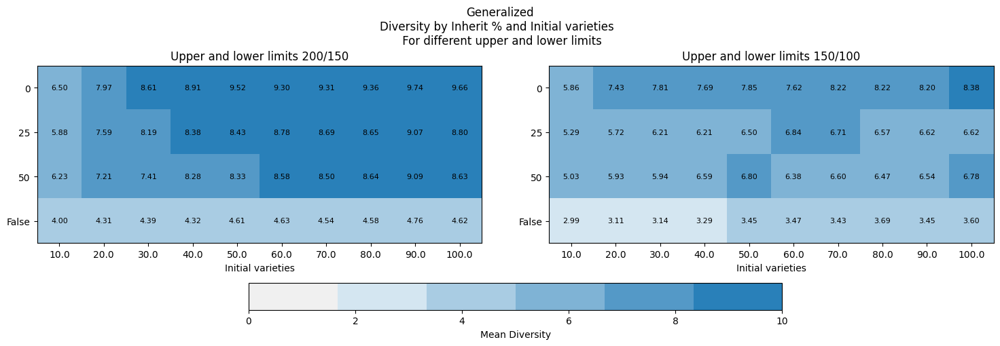

In [67]:
visualize_diversity(DvM_datos, inherits, Dvalphas, 'Generalized', up_low_limits, variable='Initial varieties', vis_type='heatmap')

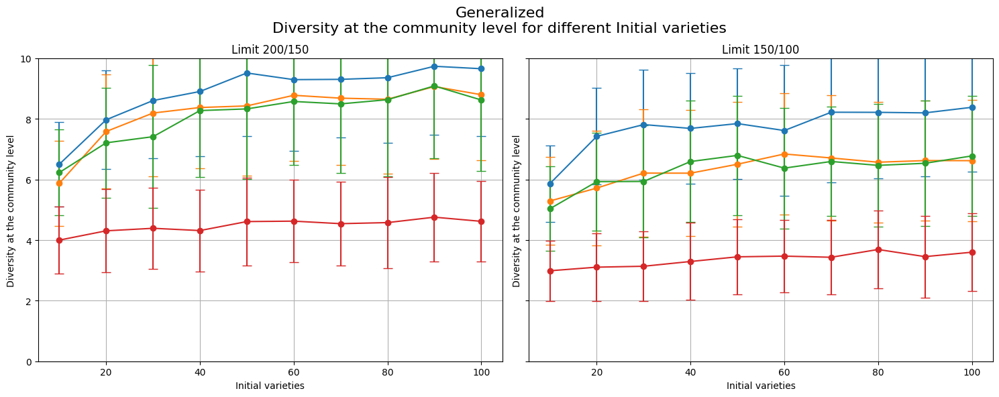

In [68]:
visualize_diversity(DvM_datos, inherits, Dvalphas, 'Generalized', up_low_limits, variable='Initial varieties', vis_type='transversal')

## Pop dynamics

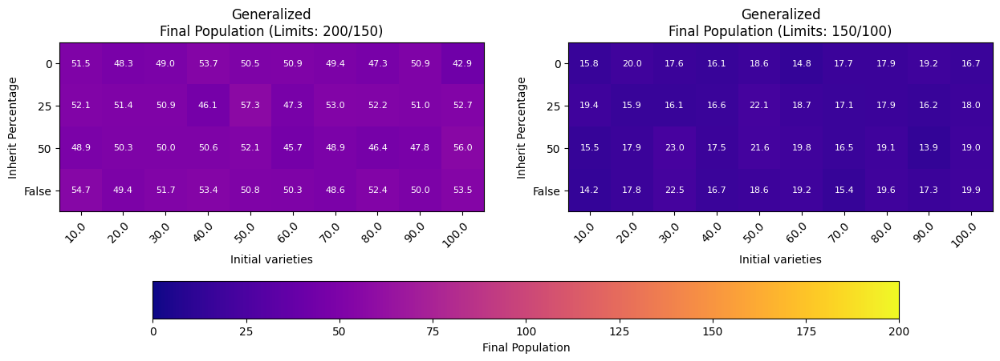

In [69]:
visualize_heatmap(DvM_datos, inherits, Dvalphas, 'Generalized', variable='Initial varieties', up_low_limits=up_low_limits, heatmap_type='alive')

## Mean of children

In [4]:
# This experiment has different values for Mean of children
prob_morte = 0.06 #beta
n = 10 # Mean
m = 40 # Initial UDs
iniciais = m
inherits = [0,25,50, 'False']
#inherits = ['False']
Gcalphas = np.linspace(1,n,n) # Mean of children from 1 to n
up_low_limits = [[200, 150], [150, 100]]
# For data of behaviour
cM = np.empty((len(inherits), len(Gcalphas), len(up_low_limits)), dtype=object) # alive, mean and diversity levels

punto_vista = 50
tiempo = 1000
tempo = list(range(0,tiempo+1,punto_vista))
experiments = 300


print(cM.shape)
start = time.time()
print(f"started at:  {datetime.now()}")
for i, inherit in enumerate(inherits):
    for j, media  in enumerate(Gcalphas):
        for k, (upper_limit, lower_limit) in enumerate(up_low_limits):
            star_configuration = time.time()
            #For population dynamics
            list_alive_UDs = []
            list_vivas_puntos_vista = []
            tasas_crecimiento = []
            #For diversity dynamics
            data_step_mean_var_ud = []
            data_step_var_system = []
            data_step_unique_system = []
            print(f"Experiments with inheritance {inherit} and Mean of Children {media}")
            #Lists to store experiments' diversity data
            data_endo_mean_ud = []
            data_endo_com_level = []
            data_endo_total_varieties = []
            original_media = media
            #To see how frequent goes to extintion
            contador = 0
            for experiment in range(1, experiments+1):
                print(f'experimento {experiment}')
                ## Clans
                clans = (list(range(1, 4)) * (int(iniciais) // 3 + 1))[:int(iniciais)] # Just 3 clans
                random.shuffle(clans)
                if inherit != 'False':
                    #### Initialization
                    UD_generalized.uds = {}
                    instancias_ud = []
                    for id_ud in range(1, int(m) + 1):
                        instancias_ud.append(UD_generalized(id_ud, media, clans.pop()))
                    ## Varieties
                    limited_varieties = True
                    if limited_varieties == False:
                        for id_ud, ud in UD_generalized.uds.items():
                            for _ in range(3):
                                ud.varieties.append(Variety())
                    else:
                        initial_varieties = [Variety() for _ in range (10)]
                        for ud in UD_generalized.uds.values():
                            for _ in range(3):
                                ud.varieties.append(random.choice(initial_varieties))   
                    # Lists for graphs
                    vivas_puntos_vista = [int(m)]
                    vivas_tasa_crecimiento = [int(m)]
            #             mortas_puntos_vista = [0]
                    #For diversity
                    mean_var_ud = []
                    var_system = []
                    unique_system = []
                    var_ud = []
                    var_total = []
                    for ud in [ud for ud in UD_generalized.uds.values() if ud.activa ==True]:
                        var_ud.append(len(ud.varieties))
                        for variety in ud.varieties:
                            var_total.append(variety.variety_id)
                    mean_var_ud.append(np.mean(var_ud))
                    var_system.append(len(var_total))
                    unique_system.append(len(set(var_total)))
                    # Simulation
                    for t in range(1, tiempo):
                        uds_copy = {id_ud: ud for id_ud, ud in UD_generalized.uds.items() if ud.activa}
                        items = list(uds_copy.items())
                        random.shuffle(items)
                        uds_copy = dict(items)
                        alive = len(uds_copy)
                        if alive > upper_limit and (media == original_media):
                            media -= media//2
                            if media >= 4:
                                media = media //2
                        elif alive < lower_limit and media < original_media:
                            media = original_media
                        if not uds_copy: #Extintion
                            # Only 0
                            print(f"acabó en 0 el experimento {experiment} con herencia {inherits[i]} con mean {Gcalphas[j]}")
                            vivas_puntos_vista.extend([0] * (int((tiempo/punto_vista)-(len(vivas_puntos_vista)))))
                            vivas_tasa_crecimiento.extend([0] * (int((tiempo)-(len(vivas_tasa_crecimiento)))))
                            contador += 1
                            break         
                        # Cycle:
                        for id_ud, ud in uds_copy.items():
                            ud.ter_filho()
                            ud.buscar_ud(uds_copy, int(media), inherit, True, 0.2)
                            ud.incrementar_idade()
                            ud.death_probability(prob_morte)
                        # Collecting data
                        vivas_tasa_crecimiento.append(len([ud for id, ud in uds_copy.items() if ud.activa]))
                        if t % punto_vista == 0:
                            viv = len([ud for id, ud in uds_copy.items() if ud.activa])
                            #mort = len([ud for id, ud in uds_copy.items() if not ud.activa])
                            vivas_puntos_vista.append(viv)
                            # For diversity
                            var_ud = []
                            var_total = []
                            for ud in [ud for ud in UD_generalized.uds.values() if ud.activa ==True]:
                                var_ud.append(len(ud.varieties))
                                for variety in ud.varieties:
                                    var_total.append(variety.variety_id)
                            mean_var_ud.append(np.mean(var_ud))
                            var_system.append(len(var_total))
                            unique_system.append(len(set(var_total))) 
                    viv = len([ud for id, ud in UD_generalized.uds.items() if ud.activa])
                    vivas_puntos_vista.append(viv)
                    # For diversity
                    var_ud = []
                    var_total = []
                    for ud in [ud for ud in UD_generalized.uds.values() if ud.activa ==True]:
                        var_ud.append(len(ud.varieties))
                        for variety in ud.varieties:
                            var_total.append(variety.variety_id)
                    mean_var_ud.append(np.mean(var_ud))
                    var_system.append(len(var_total))
                    unique_system.append(len(set(var_total)))
                    alive = (len([ud for id, ud in uds_copy.items() if ud.activa]))
                    if alive >= 1:   
                        total_varieties = []
                        varieties_per_UD = []
                        for ud in [ud for ud in UD_generalized.uds.values() if ud.activa ==True]:
                            varieties_per_UD.append(len(ud.varieties))
                            for variety in ud.varieties:
                                total_varieties.append(variety.variety_id)
                        data_endo_mean_ud.append(np.mean(varieties_per_UD))
                        data_endo_com_level.append(len(set(total_varieties)))
                        data_endo_total_varieties.append(total_varieties)

                else:# Now with inherit == False
                    #### Initialization
                    UD_generalized_al_inh.uds = {}
                    instancias_ud = []
                    for id_ud in range(1, int(m) + 1):
                        instancias_ud.append(UD_generalized_al_inh(id_ud, media, clans.pop()))
                    ## Varieties
                    limited_varieties = True
                    if limited_varieties == False:
                        for id_ud, ud in UD_generalized_al_inh.uds.items():
                            for _ in range(3):
                                ud.varieties.append(Variety())
                    else:
                        initial_varieties = [Variety() for _ in range (10)]
                        for ud in UD_generalized_al_inh.uds.values():
                            for _ in range(3):
                                ud.varieties.append(random.choice(initial_varieties))   
                    # Lists for graphs
                    vivas_puntos_vista = [int(m)]
                    vivas_tasa_crecimiento = [int(m)]
            #             mortas_puntos_vista = [0]
                    #For diversity
                    mean_var_ud = []
                    var_system = []
                    unique_system = []
                    var_ud = []
                    var_total = []
                    for ud in [ud for ud in UD_generalized_al_inh.uds.values() if ud.activa ==True]:
                        var_ud.append(len(ud.varieties))
                        for variety in ud.varieties:
                            var_total.append(variety.variety_id)
                    mean_var_ud.append(np.mean(var_ud))
                    var_system.append(len(var_total))
                    unique_system.append(len(set(var_total)))
                    # Simulation
                    for t in range(1, tiempo):
                        uds_copy = {id_ud: ud for id_ud, ud in UD_generalized_al_inh.uds.items() if ud.activa}
                        items = list(uds_copy.items())
                        random.shuffle(items)
                        uds_copy = dict(items)
                        alive = len(uds_copy)
                        if alive > upper_limit and (media == original_media):
                            media -= media//2
                            if media >= 4:
                                media = media //2
                        elif alive < lower_limit and media < original_media:
                            media = original_media
                        if not uds_copy: #Extintion
                            # Only 0
                            print(f"acabó en 0 el experimento {experiment} con herencia {inherits[i]} con mean {Gcalphas[j]}")
                            vivas_puntos_vista.extend([0] * (int((tiempo/punto_vista)-(len(vivas_puntos_vista)))))
                            vivas_tasa_crecimiento.extend([0] * (int((tiempo)-(len(vivas_tasa_crecimiento)))))
                            contador += 1
                            break         
                        # Cycle:
                        varieties_list = [var for ud in uds_copy.values() for var in ud.varieties]
                        for id_ud, ud in uds_copy.items():
                            ud.ter_filho()
                            ud.buscar_ud(uds_copy, int(media), varieties_list, True, 3, 0.2)
                            ud.incrementar_idade()
                            ud.death_probability(prob_morte)
                        # Collecting data
                        vivas_tasa_crecimiento.append(len([ud for id, ud in uds_copy.items() if ud.activa]))
                        if t % punto_vista == 0:
                            viv = len([ud for id, ud in uds_copy.items() if ud.activa])
                            #mort = len([ud for id, ud in uds_copy.items() if not ud.activa])
                            vivas_puntos_vista.append(viv)
                            # For diversity
                            var_ud = []
                            var_total = []
                            for ud in [ud for ud in UD_generalized_al_inh.uds.values() if ud.activa ==True]:
                                var_ud.append(len(ud.varieties))
                                for variety in ud.varieties:
                                    var_total.append(variety.variety_id)
                            mean_var_ud.append(np.mean(var_ud))
                            var_system.append(len(var_total))
                            unique_system.append(len(set(var_total))) 
                    viv = len([ud for id, ud in UD_generalized_al_inh.uds.items() if ud.activa])
                    vivas_puntos_vista.append(viv)
                    # For diversity
                    var_ud = []
                    var_total = []
                    for ud in [ud for ud in UD_generalized_al_inh.uds.values() if ud.activa ==True]:
                        var_ud.append(len(ud.varieties))
                        for variety in ud.varieties:
                            var_total.append(variety.variety_id)
                    mean_var_ud.append(np.mean(var_ud))
                    var_system.append(len(var_total))
                    unique_system.append(len(set(var_total)))
                    alive = (len([ud for id, ud in uds_copy.items() if ud.activa]))
                    if alive >= 1:   
                        total_varieties = []
                        varieties_per_UD = []
                        for ud in [ud for ud in UD_generalized_al_inh.uds.values() if ud.activa ==True]:
                            varieties_per_UD.append(len(ud.varieties))
                            for variety in ud.varieties:
                                total_varieties.append(variety.variety_id)
                        data_endo_mean_ud.append(np.mean(varieties_per_UD))
                        data_endo_com_level.append(len(set(total_varieties)))
                        data_endo_total_varieties.append(total_varieties)


                #Final colect of the data after the simulation!
                indice_primer_cero = np.where(np.array(vivas_tasa_crecimiento) == 0)[0]            
                if len(indice_primer_cero) > 0:
                    # Get growth rate before the 0
                    tasas_crecimiento.append(np.diff(vivas_tasa_crecimiento[:indice_primer_cero[0] - 1]) / vivas_tasa_crecimiento[:-1][:indice_primer_cero[0] - 2] * 100)
                else:
                    # Growth rate
                    tasas_crecimiento.append(np.diff(vivas_tasa_crecimiento) / vivas_tasa_crecimiento[:-1] * 100)
                # Collect the data
                list_alive_UDs.append(len([ud for id, ud in uds_copy.items() if ud.activa == True])) #For heatmap
                list_vivas_puntos_vista.append(vivas_puntos_vista)
                if alive >= 1:
                    if len(mean_var_ud) == len(tempo):        
                        data_step_var_system.append(var_system)
                        data_step_unique_system.append(unique_system)
                        data_step_mean_var_ud.append(mean_var_ud)

                data_inherit_endo = [data_endo_mean_ud, data_endo_com_level, data_endo_total_varieties]
            data_steps_inherit_endo = [data_step_var_system, data_step_unique_system, data_step_mean_var_ud]
            media = original_media
            end_config = time.time()
            cM[i][j][k] = {'alive': np.mean(list_alive_UDs),
                        'std': np.std(list_alive_UDs),
                        'time used': end_config - star_configuration,
                        'porcentage_extintion': contador/experiments,
                        'tempo': tempo, 
                        'mean': np.mean(list_vivas_puntos_vista, axis=0), 
                        'std':  np.std(list_vivas_puntos_vista, axis=0),
                        'growth rate': np.mean([np.mean(lista) for lista in tasas_crecimiento]),
                        'diversity_info': data_inherit_endo,
                        'diversity_info_steps': data_steps_inherit_endo}
            print(f"""
    The total time of the configuration of inherit percentage {inherit} and initial UDs {m} and mean {media} is  {end_config - star_configuration}
            """)
# Folder
folder_name = 'Experiments_kinship_inheritance_parameters_limits'
if not os.path.exists(folder_name):
    os.makedirs(folder_name)
# Data
heat_std = os.path.join(folder_name, 'Generalized_Mean_children.npy')
np.save(heat_std, cM)
now = datetime.now()
finish = time.time()
print(f"""
It finished at: {now}
It lasted {finish-start}
""")
print("done")

(4, 10, 2)
started at:  2024-11-19 08:17:29.630700
Experiments with inheritance 0 and Mean of Children 1.0
experimento 1
acabó en 0 el experimento 1 con herencia 0 con mean 1.0
experimento 2
acabó en 0 el experimento 2 con herencia 0 con mean 1.0
experimento 3
acabó en 0 el experimento 3 con herencia 0 con mean 1.0
experimento 4
acabó en 0 el experimento 4 con herencia 0 con mean 1.0
experimento 5
acabó en 0 el experimento 5 con herencia 0 con mean 1.0
experimento 6
acabó en 0 el experimento 6 con herencia 0 con mean 1.0
experimento 7


C:\Users\jsolm\Juancho\Juancho\Maestrías\Modelage en Sistemas Complejos\Tesis\Projecto\Modelo\modelo_mio\Agrobiodiversity-model\venv\lib\site-packages\numpy\_core\fromnumeric.py:3596: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\jsolm\Juancho\Juancho\Maestrías\Modelage en Sistemas Complejos\Tesis\Projecto\Modelo\modelo_mio\Agrobiodiversity-model\venv\lib\site-packages\numpy\_core\_methods.py:138: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


acabó en 0 el experimento 7 con herencia 0 con mean 1.0
experimento 8
acabó en 0 el experimento 8 con herencia 0 con mean 1.0
experimento 9
acabó en 0 el experimento 9 con herencia 0 con mean 1.0
experimento 10
acabó en 0 el experimento 10 con herencia 0 con mean 1.0
experimento 11
acabó en 0 el experimento 11 con herencia 0 con mean 1.0
experimento 12
acabó en 0 el experimento 12 con herencia 0 con mean 1.0
experimento 13
acabó en 0 el experimento 13 con herencia 0 con mean 1.0
experimento 14
acabó en 0 el experimento 14 con herencia 0 con mean 1.0
experimento 15
acabó en 0 el experimento 15 con herencia 0 con mean 1.0
experimento 16
acabó en 0 el experimento 16 con herencia 0 con mean 1.0
experimento 17
acabó en 0 el experimento 17 con herencia 0 con mean 1.0
experimento 18
acabó en 0 el experimento 18 con herencia 0 con mean 1.0
experimento 19
acabó en 0 el experimento 19 con herencia 0 con mean 1.0
experimento 20
acabó en 0 el experimento 20 con herencia 0 con mean 1.0
experimento 

acabó en 0 el experimento 126 con herencia 0 con mean 1.0
experimento 127
acabó en 0 el experimento 127 con herencia 0 con mean 1.0
experimento 128
acabó en 0 el experimento 128 con herencia 0 con mean 1.0
experimento 129
acabó en 0 el experimento 129 con herencia 0 con mean 1.0
experimento 130
acabó en 0 el experimento 130 con herencia 0 con mean 1.0
experimento 131
acabó en 0 el experimento 131 con herencia 0 con mean 1.0
experimento 132
acabó en 0 el experimento 132 con herencia 0 con mean 1.0
experimento 133
acabó en 0 el experimento 133 con herencia 0 con mean 1.0
experimento 134
acabó en 0 el experimento 134 con herencia 0 con mean 1.0
experimento 135
acabó en 0 el experimento 135 con herencia 0 con mean 1.0
experimento 136
acabó en 0 el experimento 136 con herencia 0 con mean 1.0
experimento 137
acabó en 0 el experimento 137 con herencia 0 con mean 1.0
experimento 138
acabó en 0 el experimento 138 con herencia 0 con mean 1.0
experimento 139
acabó en 0 el experimento 139 con here

experimento 237
acabó en 0 el experimento 237 con herencia 0 con mean 1.0
experimento 238
acabó en 0 el experimento 238 con herencia 0 con mean 1.0
experimento 239
acabó en 0 el experimento 239 con herencia 0 con mean 1.0
experimento 240
acabó en 0 el experimento 240 con herencia 0 con mean 1.0
experimento 241
acabó en 0 el experimento 241 con herencia 0 con mean 1.0
experimento 242
acabó en 0 el experimento 242 con herencia 0 con mean 1.0
experimento 243
acabó en 0 el experimento 243 con herencia 0 con mean 1.0
experimento 244
acabó en 0 el experimento 244 con herencia 0 con mean 1.0
experimento 245
acabó en 0 el experimento 245 con herencia 0 con mean 1.0
experimento 246
acabó en 0 el experimento 246 con herencia 0 con mean 1.0
experimento 247
acabó en 0 el experimento 247 con herencia 0 con mean 1.0
experimento 248
acabó en 0 el experimento 248 con herencia 0 con mean 1.0
experimento 249
acabó en 0 el experimento 249 con herencia 0 con mean 1.0
experimento 250
acabó en 0 el experime

experimento 67
acabó en 0 el experimento 67 con herencia 0 con mean 1.0
experimento 68
acabó en 0 el experimento 68 con herencia 0 con mean 1.0
experimento 69
acabó en 0 el experimento 69 con herencia 0 con mean 1.0
experimento 70
acabó en 0 el experimento 70 con herencia 0 con mean 1.0
experimento 71
acabó en 0 el experimento 71 con herencia 0 con mean 1.0
experimento 72
acabó en 0 el experimento 72 con herencia 0 con mean 1.0
experimento 73
acabó en 0 el experimento 73 con herencia 0 con mean 1.0
experimento 74
acabó en 0 el experimento 74 con herencia 0 con mean 1.0
experimento 75
acabó en 0 el experimento 75 con herencia 0 con mean 1.0
experimento 76
acabó en 0 el experimento 76 con herencia 0 con mean 1.0
experimento 77
acabó en 0 el experimento 77 con herencia 0 con mean 1.0
experimento 78
acabó en 0 el experimento 78 con herencia 0 con mean 1.0
experimento 79
acabó en 0 el experimento 79 con herencia 0 con mean 1.0
experimento 80
acabó en 0 el experimento 80 con herencia 0 con m

acabó en 0 el experimento 194 con herencia 0 con mean 1.0
experimento 195
acabó en 0 el experimento 195 con herencia 0 con mean 1.0
experimento 196
acabó en 0 el experimento 196 con herencia 0 con mean 1.0
experimento 197
acabó en 0 el experimento 197 con herencia 0 con mean 1.0
experimento 198
acabó en 0 el experimento 198 con herencia 0 con mean 1.0
experimento 199
acabó en 0 el experimento 199 con herencia 0 con mean 1.0
experimento 200
acabó en 0 el experimento 200 con herencia 0 con mean 1.0
experimento 201
acabó en 0 el experimento 201 con herencia 0 con mean 1.0
experimento 202
acabó en 0 el experimento 202 con herencia 0 con mean 1.0
experimento 203
acabó en 0 el experimento 203 con herencia 0 con mean 1.0
experimento 204
acabó en 0 el experimento 204 con herencia 0 con mean 1.0
experimento 205
acabó en 0 el experimento 205 con herencia 0 con mean 1.0
experimento 206
acabó en 0 el experimento 206 con herencia 0 con mean 1.0
experimento 207
acabó en 0 el experimento 207 con here

acabó en 0 el experimento 8 con herencia 0 con mean 2.0
experimento 9
acabó en 0 el experimento 9 con herencia 0 con mean 2.0
experimento 10
acabó en 0 el experimento 10 con herencia 0 con mean 2.0
experimento 11
acabó en 0 el experimento 11 con herencia 0 con mean 2.0
experimento 12
acabó en 0 el experimento 12 con herencia 0 con mean 2.0
experimento 13
acabó en 0 el experimento 13 con herencia 0 con mean 2.0
experimento 14
acabó en 0 el experimento 14 con herencia 0 con mean 2.0
experimento 15
acabó en 0 el experimento 15 con herencia 0 con mean 2.0
experimento 16
acabó en 0 el experimento 16 con herencia 0 con mean 2.0
experimento 17
acabó en 0 el experimento 17 con herencia 0 con mean 2.0
experimento 18
acabó en 0 el experimento 18 con herencia 0 con mean 2.0
experimento 19
acabó en 0 el experimento 19 con herencia 0 con mean 2.0
experimento 20
acabó en 0 el experimento 20 con herencia 0 con mean 2.0
experimento 21
acabó en 0 el experimento 21 con herencia 0 con mean 2.0
experiment

acabó en 0 el experimento 128 con herencia 0 con mean 2.0
experimento 129
acabó en 0 el experimento 129 con herencia 0 con mean 2.0
experimento 130
acabó en 0 el experimento 130 con herencia 0 con mean 2.0
experimento 131
acabó en 0 el experimento 131 con herencia 0 con mean 2.0
experimento 132
acabó en 0 el experimento 132 con herencia 0 con mean 2.0
experimento 133
acabó en 0 el experimento 133 con herencia 0 con mean 2.0
experimento 134
acabó en 0 el experimento 134 con herencia 0 con mean 2.0
experimento 135
acabó en 0 el experimento 135 con herencia 0 con mean 2.0
experimento 136
acabó en 0 el experimento 136 con herencia 0 con mean 2.0
experimento 137
acabó en 0 el experimento 137 con herencia 0 con mean 2.0
experimento 138
acabó en 0 el experimento 138 con herencia 0 con mean 2.0
experimento 139
acabó en 0 el experimento 139 con herencia 0 con mean 2.0
experimento 140
acabó en 0 el experimento 140 con herencia 0 con mean 2.0
experimento 141
acabó en 0 el experimento 141 con here

acabó en 0 el experimento 244 con herencia 0 con mean 2.0
experimento 245
acabó en 0 el experimento 245 con herencia 0 con mean 2.0
experimento 246
acabó en 0 el experimento 246 con herencia 0 con mean 2.0
experimento 247
acabó en 0 el experimento 247 con herencia 0 con mean 2.0
experimento 248
acabó en 0 el experimento 248 con herencia 0 con mean 2.0
experimento 249
acabó en 0 el experimento 249 con herencia 0 con mean 2.0
experimento 250
acabó en 0 el experimento 250 con herencia 0 con mean 2.0
experimento 251
acabó en 0 el experimento 251 con herencia 0 con mean 2.0
experimento 252
acabó en 0 el experimento 252 con herencia 0 con mean 2.0
experimento 253
acabó en 0 el experimento 253 con herencia 0 con mean 2.0
experimento 254
acabó en 0 el experimento 254 con herencia 0 con mean 2.0
experimento 255
acabó en 0 el experimento 255 con herencia 0 con mean 2.0
experimento 256
acabó en 0 el experimento 256 con herencia 0 con mean 2.0
experimento 257
acabó en 0 el experimento 257 con here

experimento 58
acabó en 0 el experimento 58 con herencia 0 con mean 2.0
experimento 59
acabó en 0 el experimento 59 con herencia 0 con mean 2.0
experimento 60
acabó en 0 el experimento 60 con herencia 0 con mean 2.0
experimento 61
acabó en 0 el experimento 61 con herencia 0 con mean 2.0
experimento 62
acabó en 0 el experimento 62 con herencia 0 con mean 2.0
experimento 63
acabó en 0 el experimento 63 con herencia 0 con mean 2.0
experimento 64
acabó en 0 el experimento 64 con herencia 0 con mean 2.0
experimento 65
acabó en 0 el experimento 65 con herencia 0 con mean 2.0
experimento 66
acabó en 0 el experimento 66 con herencia 0 con mean 2.0
experimento 67
acabó en 0 el experimento 67 con herencia 0 con mean 2.0
experimento 68
acabó en 0 el experimento 68 con herencia 0 con mean 2.0
experimento 69
acabó en 0 el experimento 69 con herencia 0 con mean 2.0
experimento 70
acabó en 0 el experimento 70 con herencia 0 con mean 2.0
experimento 71
acabó en 0 el experimento 71 con herencia 0 con m

acabó en 0 el experimento 175 con herencia 0 con mean 2.0
experimento 176
acabó en 0 el experimento 176 con herencia 0 con mean 2.0
experimento 177
acabó en 0 el experimento 177 con herencia 0 con mean 2.0
experimento 178
acabó en 0 el experimento 178 con herencia 0 con mean 2.0
experimento 179
acabó en 0 el experimento 179 con herencia 0 con mean 2.0
experimento 180
acabó en 0 el experimento 180 con herencia 0 con mean 2.0
experimento 181
acabó en 0 el experimento 181 con herencia 0 con mean 2.0
experimento 182
acabó en 0 el experimento 182 con herencia 0 con mean 2.0
experimento 183
acabó en 0 el experimento 183 con herencia 0 con mean 2.0
experimento 184
acabó en 0 el experimento 184 con herencia 0 con mean 2.0
experimento 185
acabó en 0 el experimento 185 con herencia 0 con mean 2.0
experimento 186
acabó en 0 el experimento 186 con herencia 0 con mean 2.0
experimento 187
acabó en 0 el experimento 187 con herencia 0 con mean 2.0
experimento 188
acabó en 0 el experimento 188 con here

acabó en 0 el experimento 287 con herencia 0 con mean 2.0
experimento 288
acabó en 0 el experimento 288 con herencia 0 con mean 2.0
experimento 289
acabó en 0 el experimento 289 con herencia 0 con mean 2.0
experimento 290
acabó en 0 el experimento 290 con herencia 0 con mean 2.0
experimento 291
acabó en 0 el experimento 291 con herencia 0 con mean 2.0
experimento 292
acabó en 0 el experimento 292 con herencia 0 con mean 2.0
experimento 293
acabó en 0 el experimento 293 con herencia 0 con mean 2.0
experimento 294
acabó en 0 el experimento 294 con herencia 0 con mean 2.0
experimento 295
acabó en 0 el experimento 295 con herencia 0 con mean 2.0
experimento 296
acabó en 0 el experimento 296 con herencia 0 con mean 2.0
experimento 297
acabó en 0 el experimento 297 con herencia 0 con mean 2.0
experimento 298
acabó en 0 el experimento 298 con herencia 0 con mean 2.0
experimento 299
acabó en 0 el experimento 299 con herencia 0 con mean 2.0
experimento 300
acabó en 0 el experimento 300 con here

acabó en 0 el experimento 99 con herencia 0 con mean 3.0
experimento 100
acabó en 0 el experimento 100 con herencia 0 con mean 3.0
experimento 101
acabó en 0 el experimento 101 con herencia 0 con mean 3.0
experimento 102
acabó en 0 el experimento 102 con herencia 0 con mean 3.0
experimento 103
acabó en 0 el experimento 103 con herencia 0 con mean 3.0
experimento 104
acabó en 0 el experimento 104 con herencia 0 con mean 3.0
experimento 105
acabó en 0 el experimento 105 con herencia 0 con mean 3.0
experimento 106
acabó en 0 el experimento 106 con herencia 0 con mean 3.0
experimento 107
acabó en 0 el experimento 107 con herencia 0 con mean 3.0
experimento 108
acabó en 0 el experimento 108 con herencia 0 con mean 3.0
experimento 109
acabó en 0 el experimento 109 con herencia 0 con mean 3.0
experimento 110
acabó en 0 el experimento 110 con herencia 0 con mean 3.0
experimento 111
acabó en 0 el experimento 111 con herencia 0 con mean 3.0
experimento 112
acabó en 0 el experimento 112 con heren

acabó en 0 el experimento 210 con herencia 0 con mean 3.0
experimento 211
acabó en 0 el experimento 211 con herencia 0 con mean 3.0
experimento 212
acabó en 0 el experimento 212 con herencia 0 con mean 3.0
experimento 213
acabó en 0 el experimento 213 con herencia 0 con mean 3.0
experimento 214
acabó en 0 el experimento 214 con herencia 0 con mean 3.0
experimento 215
acabó en 0 el experimento 215 con herencia 0 con mean 3.0
experimento 216
acabó en 0 el experimento 216 con herencia 0 con mean 3.0
experimento 217
acabó en 0 el experimento 217 con herencia 0 con mean 3.0
experimento 218
acabó en 0 el experimento 218 con herencia 0 con mean 3.0
experimento 219
acabó en 0 el experimento 219 con herencia 0 con mean 3.0
experimento 220
acabó en 0 el experimento 220 con herencia 0 con mean 3.0
experimento 221
acabó en 0 el experimento 221 con herencia 0 con mean 3.0
experimento 222
acabó en 0 el experimento 222 con herencia 0 con mean 3.0
experimento 223
acabó en 0 el experimento 223 con here

acabó en 0 el experimento 22 con herencia 0 con mean 3.0
experimento 23
acabó en 0 el experimento 23 con herencia 0 con mean 3.0
experimento 24
acabó en 0 el experimento 24 con herencia 0 con mean 3.0
experimento 25
acabó en 0 el experimento 25 con herencia 0 con mean 3.0
experimento 26
acabó en 0 el experimento 26 con herencia 0 con mean 3.0
experimento 27
acabó en 0 el experimento 27 con herencia 0 con mean 3.0
experimento 28
acabó en 0 el experimento 28 con herencia 0 con mean 3.0
experimento 29
acabó en 0 el experimento 29 con herencia 0 con mean 3.0
experimento 30
acabó en 0 el experimento 30 con herencia 0 con mean 3.0
experimento 31
acabó en 0 el experimento 31 con herencia 0 con mean 3.0
experimento 32
acabó en 0 el experimento 32 con herencia 0 con mean 3.0
experimento 33
acabó en 0 el experimento 33 con herencia 0 con mean 3.0
experimento 34
acabó en 0 el experimento 34 con herencia 0 con mean 3.0
experimento 35
acabó en 0 el experimento 35 con herencia 0 con mean 3.0
experim

acabó en 0 el experimento 136 con herencia 0 con mean 3.0
experimento 137
acabó en 0 el experimento 137 con herencia 0 con mean 3.0
experimento 138
acabó en 0 el experimento 138 con herencia 0 con mean 3.0
experimento 139
acabó en 0 el experimento 139 con herencia 0 con mean 3.0
experimento 140
acabó en 0 el experimento 140 con herencia 0 con mean 3.0
experimento 141
acabó en 0 el experimento 141 con herencia 0 con mean 3.0
experimento 142
acabó en 0 el experimento 142 con herencia 0 con mean 3.0
experimento 143
acabó en 0 el experimento 143 con herencia 0 con mean 3.0
experimento 144
acabó en 0 el experimento 144 con herencia 0 con mean 3.0
experimento 145
acabó en 0 el experimento 145 con herencia 0 con mean 3.0
experimento 146
acabó en 0 el experimento 146 con herencia 0 con mean 3.0
experimento 147
acabó en 0 el experimento 147 con herencia 0 con mean 3.0
experimento 148
acabó en 0 el experimento 148 con herencia 0 con mean 3.0
experimento 149
acabó en 0 el experimento 149 con here

acabó en 0 el experimento 247 con herencia 0 con mean 3.0
experimento 248
acabó en 0 el experimento 248 con herencia 0 con mean 3.0
experimento 249
acabó en 0 el experimento 249 con herencia 0 con mean 3.0
experimento 250
acabó en 0 el experimento 250 con herencia 0 con mean 3.0
experimento 251
acabó en 0 el experimento 251 con herencia 0 con mean 3.0
experimento 252
acabó en 0 el experimento 252 con herencia 0 con mean 3.0
experimento 253
acabó en 0 el experimento 253 con herencia 0 con mean 3.0
experimento 254
acabó en 0 el experimento 254 con herencia 0 con mean 3.0
experimento 255
acabó en 0 el experimento 255 con herencia 0 con mean 3.0
experimento 256
acabó en 0 el experimento 256 con herencia 0 con mean 3.0
experimento 257
acabó en 0 el experimento 257 con herencia 0 con mean 3.0
experimento 258
acabó en 0 el experimento 258 con herencia 0 con mean 3.0
experimento 259
acabó en 0 el experimento 259 con herencia 0 con mean 3.0
experimento 260
acabó en 0 el experimento 260 con here

acabó en 0 el experimento 91 con herencia 0 con mean 4.0
experimento 92
experimento 93
acabó en 0 el experimento 93 con herencia 0 con mean 4.0
experimento 94
experimento 95
acabó en 0 el experimento 95 con herencia 0 con mean 4.0
experimento 96
experimento 97
acabó en 0 el experimento 97 con herencia 0 con mean 4.0
experimento 98
acabó en 0 el experimento 98 con herencia 0 con mean 4.0
experimento 99
experimento 100
experimento 101
experimento 102
acabó en 0 el experimento 102 con herencia 0 con mean 4.0
experimento 103
acabó en 0 el experimento 103 con herencia 0 con mean 4.0
experimento 104
experimento 105
experimento 106
acabó en 0 el experimento 106 con herencia 0 con mean 4.0
experimento 107
experimento 108
acabó en 0 el experimento 108 con herencia 0 con mean 4.0
experimento 109
experimento 110
acabó en 0 el experimento 110 con herencia 0 con mean 4.0
experimento 111
experimento 112
acabó en 0 el experimento 112 con herencia 0 con mean 4.0
experimento 113
experimento 114
acabó e

experimento 283
experimento 284
experimento 285
acabó en 0 el experimento 285 con herencia 0 con mean 4.0
experimento 286
experimento 287
acabó en 0 el experimento 287 con herencia 0 con mean 4.0
experimento 288
experimento 289
experimento 290
experimento 291
acabó en 0 el experimento 291 con herencia 0 con mean 4.0
experimento 292
acabó en 0 el experimento 292 con herencia 0 con mean 4.0
experimento 293
acabó en 0 el experimento 293 con herencia 0 con mean 4.0
experimento 294
experimento 295
experimento 296
acabó en 0 el experimento 296 con herencia 0 con mean 4.0
experimento 297
acabó en 0 el experimento 297 con herencia 0 con mean 4.0
experimento 298
experimento 299
experimento 300
acabó en 0 el experimento 300 con herencia 0 con mean 4.0

    The total time of the configuration of inherit percentage 0 and initial UDs 40 and mean 4.0 is  1199.6790263652802
            
Experiments with inheritance 0 and Mean of Children 4.0
experimento 1
experimento 2
acabó en 0 el experimento 2 con

acabó en 0 el experimento 131 con herencia 0 con mean 4.0
experimento 132
experimento 133
acabó en 0 el experimento 133 con herencia 0 con mean 4.0
experimento 134
experimento 135
acabó en 0 el experimento 135 con herencia 0 con mean 4.0
experimento 136
acabó en 0 el experimento 136 con herencia 0 con mean 4.0
experimento 137
experimento 138
experimento 139
experimento 140
acabó en 0 el experimento 140 con herencia 0 con mean 4.0
experimento 141
acabó en 0 el experimento 141 con herencia 0 con mean 4.0
experimento 142
experimento 143
acabó en 0 el experimento 143 con herencia 0 con mean 4.0
experimento 144
experimento 145
acabó en 0 el experimento 145 con herencia 0 con mean 4.0
experimento 146
experimento 147
experimento 148
acabó en 0 el experimento 148 con herencia 0 con mean 4.0
experimento 149
acabó en 0 el experimento 149 con herencia 0 con mean 4.0
experimento 150
experimento 151
acabó en 0 el experimento 151 con herencia 0 con mean 4.0
experimento 152
acabó en 0 el experimento 

experimento 278
acabó en 0 el experimento 278 con herencia 0 con mean 4.0
experimento 279
acabó en 0 el experimento 279 con herencia 0 con mean 4.0
experimento 280
acabó en 0 el experimento 280 con herencia 0 con mean 4.0
experimento 281
acabó en 0 el experimento 281 con herencia 0 con mean 4.0
experimento 282
acabó en 0 el experimento 282 con herencia 0 con mean 4.0
experimento 283
experimento 284
acabó en 0 el experimento 284 con herencia 0 con mean 4.0
experimento 285
acabó en 0 el experimento 285 con herencia 0 con mean 4.0
experimento 286
acabó en 0 el experimento 286 con herencia 0 con mean 4.0
experimento 287
experimento 288
experimento 289
acabó en 0 el experimento 289 con herencia 0 con mean 4.0
experimento 290
experimento 291
acabó en 0 el experimento 291 con herencia 0 con mean 4.0
experimento 292
experimento 293
experimento 294
acabó en 0 el experimento 294 con herencia 0 con mean 4.0
experimento 295
experimento 296
acabó en 0 el experimento 296 con herencia 0 con mean 4.0


experimento 89
experimento 90
experimento 91
experimento 92
experimento 93
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100
experimento 101
experimento 102
experimento 103
experimento 104
experimento 105
experimento 106
experimento 107
experimento 108
experimento 109
experimento 110
experimento 111
experimento 112
experimento 113
experimento 114
experimento 115
experimento 116
experimento 117
experimento 118
experimento 119
experimento 120
experimento 121
experimento 122
experimento 123
experimento 124
experimento 125
experimento 126
experimento 127
experimento 128
experimento 129
experimento 130
experimento 131
experimento 132
experimento 133
experimento 134
experimento 135
experimento 136
experimento 137
experimento 138
experimento 139
experimento 140
experimento 141
experimento 142
experimento 143
experimento 144
experimento 145
experimento 146
experimento 147
experimento 148
experimento 149
experimento 150
experimento 151
exp

experimento 272
experimento 273
experimento 274
experimento 275
experimento 276
experimento 277
experimento 278
experimento 279
experimento 280
experimento 281
experimento 282
experimento 283
experimento 284
experimento 285
experimento 286
experimento 287
experimento 288
experimento 289
experimento 290
experimento 291
experimento 292
experimento 293
experimento 294
experimento 295
experimento 296
experimento 297
experimento 298
experimento 299
experimento 300

    The total time of the configuration of inherit percentage 0 and initial UDs 40 and mean 6.0 is  6617.813791275024
            
Experiments with inheritance 0 and Mean of Children 6.0
experimento 1
experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 

experimento 164
experimento 165
experimento 166
experimento 167
experimento 168
experimento 169
experimento 170
experimento 171
experimento 172
experimento 173
experimento 174
experimento 175
experimento 176
experimento 177
experimento 178
experimento 179
experimento 180
experimento 181
experimento 182
experimento 183
experimento 184
experimento 185
experimento 186
experimento 187
experimento 188
experimento 189
experimento 190
experimento 191
experimento 192
experimento 193
experimento 194
experimento 195
experimento 196
experimento 197
experimento 198
experimento 199
experimento 200
experimento 201
experimento 202
experimento 203
experimento 204
experimento 205
experimento 206
experimento 207
experimento 208
experimento 209
experimento 210
experimento 211
experimento 212
experimento 213
experimento 214
experimento 215
experimento 216
experimento 217
experimento 218
experimento 219
experimento 220
experimento 221
experimento 222
experimento 223
experimento 224
experimento 225
experime

experimento 37
experimento 38
experimento 39
experimento 40
experimento 41
experimento 42
experimento 43
experimento 44
experimento 45
experimento 46
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
experimento 67
experimento 68
experimento 69
experimento 70
experimento 71
experimento 72
experimento 73
experimento 74
experimento 75
experimento 76
experimento 77
experimento 78
experimento 79
experimento 80
experimento 81
experimento 82
experimento 83
experimento 84
experimento 85
experimento 86
experimento 87
experimento 88
experimento 89
experimento 90
experimento 91
experimento 92
experimento 93
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100
experimento 101
experimento 102
experim

experimento 234
experimento 235
experimento 236
experimento 237
experimento 238
experimento 239
experimento 240
experimento 241
experimento 242
experimento 243
experimento 244
experimento 245
experimento 246
experimento 247
experimento 248
experimento 249
experimento 250
experimento 251
experimento 252
experimento 253
experimento 254
experimento 255
experimento 256
experimento 257
experimento 258
experimento 259
experimento 260
experimento 261
experimento 262
experimento 263
experimento 264
experimento 265
experimento 266
experimento 267
experimento 268
experimento 269
experimento 270
experimento 271
experimento 272
experimento 273
experimento 274
experimento 275
experimento 276
experimento 277
experimento 278
experimento 279
experimento 280
experimento 281
experimento 282
experimento 283
experimento 284
experimento 285
experimento 286
experimento 287
experimento 288
experimento 289
experimento 290
experimento 291
experimento 292
experimento 293
experimento 294
experimento 295
experime

experimento 129
experimento 130
experimento 131
experimento 132
experimento 133
experimento 134
experimento 135
experimento 136
experimento 137
experimento 138
experimento 139
experimento 140
acabó en 0 el experimento 140 con herencia 0 con mean 9.0
experimento 141
experimento 142
experimento 143
experimento 144
experimento 145
experimento 146
experimento 147
experimento 148
experimento 149
experimento 150
experimento 151
acabó en 0 el experimento 151 con herencia 0 con mean 9.0
experimento 152
experimento 153
experimento 154
experimento 155
experimento 156
experimento 157
experimento 158
experimento 159
experimento 160
experimento 161
experimento 162
experimento 163
experimento 164
acabó en 0 el experimento 164 con herencia 0 con mean 9.0
experimento 165
experimento 166
experimento 167
experimento 168
experimento 169
experimento 170
experimento 171
experimento 172
experimento 173
experimento 174
experimento 175
experimento 176
experimento 177
experimento 178
experimento 179
experiment

experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
experimento 38
experimento 39
experimento 40
experimento 41
experimento 42
experimento 43
experimento 44
experimento 45
experimento 46
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
experimento 67
experimento 68
exp

acabó en 0 el experimento 57 con herencia 25 con mean 1.0
experimento 58
acabó en 0 el experimento 58 con herencia 25 con mean 1.0
experimento 59
acabó en 0 el experimento 59 con herencia 25 con mean 1.0
experimento 60
acabó en 0 el experimento 60 con herencia 25 con mean 1.0
experimento 61
acabó en 0 el experimento 61 con herencia 25 con mean 1.0
experimento 62
acabó en 0 el experimento 62 con herencia 25 con mean 1.0
experimento 63
acabó en 0 el experimento 63 con herencia 25 con mean 1.0
experimento 64
acabó en 0 el experimento 64 con herencia 25 con mean 1.0
experimento 65
acabó en 0 el experimento 65 con herencia 25 con mean 1.0
experimento 66
acabó en 0 el experimento 66 con herencia 25 con mean 1.0
experimento 67
acabó en 0 el experimento 67 con herencia 25 con mean 1.0
experimento 68
acabó en 0 el experimento 68 con herencia 25 con mean 1.0
experimento 69
acabó en 0 el experimento 69 con herencia 25 con mean 1.0
experimento 70
acabó en 0 el experimento 70 con herencia 25 con me

acabó en 0 el experimento 173 con herencia 25 con mean 1.0
experimento 174
acabó en 0 el experimento 174 con herencia 25 con mean 1.0
experimento 175
acabó en 0 el experimento 175 con herencia 25 con mean 1.0
experimento 176
acabó en 0 el experimento 176 con herencia 25 con mean 1.0
experimento 177
acabó en 0 el experimento 177 con herencia 25 con mean 1.0
experimento 178
acabó en 0 el experimento 178 con herencia 25 con mean 1.0
experimento 179
acabó en 0 el experimento 179 con herencia 25 con mean 1.0
experimento 180
acabó en 0 el experimento 180 con herencia 25 con mean 1.0
experimento 181
acabó en 0 el experimento 181 con herencia 25 con mean 1.0
experimento 182
acabó en 0 el experimento 182 con herencia 25 con mean 1.0
experimento 183
acabó en 0 el experimento 183 con herencia 25 con mean 1.0
experimento 184
acabó en 0 el experimento 184 con herencia 25 con mean 1.0
experimento 185
acabó en 0 el experimento 185 con herencia 25 con mean 1.0
experimento 186
acabó en 0 el experimento

acabó en 0 el experimento 286 con herencia 25 con mean 1.0
experimento 287
acabó en 0 el experimento 287 con herencia 25 con mean 1.0
experimento 288
acabó en 0 el experimento 288 con herencia 25 con mean 1.0
experimento 289
acabó en 0 el experimento 289 con herencia 25 con mean 1.0
experimento 290
acabó en 0 el experimento 290 con herencia 25 con mean 1.0
experimento 291
acabó en 0 el experimento 291 con herencia 25 con mean 1.0
experimento 292
acabó en 0 el experimento 292 con herencia 25 con mean 1.0
experimento 293
acabó en 0 el experimento 293 con herencia 25 con mean 1.0
experimento 294
acabó en 0 el experimento 294 con herencia 25 con mean 1.0
experimento 295
acabó en 0 el experimento 295 con herencia 25 con mean 1.0
experimento 296
acabó en 0 el experimento 296 con herencia 25 con mean 1.0
experimento 297
acabó en 0 el experimento 297 con herencia 25 con mean 1.0
experimento 298
acabó en 0 el experimento 298 con herencia 25 con mean 1.0
experimento 299
acabó en 0 el experimento

acabó en 0 el experimento 106 con herencia 25 con mean 1.0
experimento 107
acabó en 0 el experimento 107 con herencia 25 con mean 1.0
experimento 108
acabó en 0 el experimento 108 con herencia 25 con mean 1.0
experimento 109
acabó en 0 el experimento 109 con herencia 25 con mean 1.0
experimento 110
acabó en 0 el experimento 110 con herencia 25 con mean 1.0
experimento 111
acabó en 0 el experimento 111 con herencia 25 con mean 1.0
experimento 112
acabó en 0 el experimento 112 con herencia 25 con mean 1.0
experimento 113
acabó en 0 el experimento 113 con herencia 25 con mean 1.0
experimento 114
acabó en 0 el experimento 114 con herencia 25 con mean 1.0
experimento 115
acabó en 0 el experimento 115 con herencia 25 con mean 1.0
experimento 116
acabó en 0 el experimento 116 con herencia 25 con mean 1.0
experimento 117
acabó en 0 el experimento 117 con herencia 25 con mean 1.0
experimento 118
acabó en 0 el experimento 118 con herencia 25 con mean 1.0
experimento 119
acabó en 0 el experimento

acabó en 0 el experimento 227 con herencia 25 con mean 1.0
experimento 228
acabó en 0 el experimento 228 con herencia 25 con mean 1.0
experimento 229
acabó en 0 el experimento 229 con herencia 25 con mean 1.0
experimento 230
acabó en 0 el experimento 230 con herencia 25 con mean 1.0
experimento 231
acabó en 0 el experimento 231 con herencia 25 con mean 1.0
experimento 232
acabó en 0 el experimento 232 con herencia 25 con mean 1.0
experimento 233
acabó en 0 el experimento 233 con herencia 25 con mean 1.0
experimento 234
acabó en 0 el experimento 234 con herencia 25 con mean 1.0
experimento 235
acabó en 0 el experimento 235 con herencia 25 con mean 1.0
experimento 236
acabó en 0 el experimento 236 con herencia 25 con mean 1.0
experimento 237
acabó en 0 el experimento 237 con herencia 25 con mean 1.0
experimento 238
acabó en 0 el experimento 238 con herencia 25 con mean 1.0
experimento 239
acabó en 0 el experimento 239 con herencia 25 con mean 1.0
experimento 240
acabó en 0 el experimento

acabó en 0 el experimento 47 con herencia 25 con mean 2.0
experimento 48
acabó en 0 el experimento 48 con herencia 25 con mean 2.0
experimento 49
acabó en 0 el experimento 49 con herencia 25 con mean 2.0
experimento 50
acabó en 0 el experimento 50 con herencia 25 con mean 2.0
experimento 51
acabó en 0 el experimento 51 con herencia 25 con mean 2.0
experimento 52
acabó en 0 el experimento 52 con herencia 25 con mean 2.0
experimento 53
acabó en 0 el experimento 53 con herencia 25 con mean 2.0
experimento 54
acabó en 0 el experimento 54 con herencia 25 con mean 2.0
experimento 55
acabó en 0 el experimento 55 con herencia 25 con mean 2.0
experimento 56
acabó en 0 el experimento 56 con herencia 25 con mean 2.0
experimento 57
acabó en 0 el experimento 57 con herencia 25 con mean 2.0
experimento 58
acabó en 0 el experimento 58 con herencia 25 con mean 2.0
experimento 59
acabó en 0 el experimento 59 con herencia 25 con mean 2.0
experimento 60
acabó en 0 el experimento 60 con herencia 25 con me

acabó en 0 el experimento 160 con herencia 25 con mean 2.0
experimento 161
acabó en 0 el experimento 161 con herencia 25 con mean 2.0
experimento 162
acabó en 0 el experimento 162 con herencia 25 con mean 2.0
experimento 163
acabó en 0 el experimento 163 con herencia 25 con mean 2.0
experimento 164
acabó en 0 el experimento 164 con herencia 25 con mean 2.0
experimento 165
acabó en 0 el experimento 165 con herencia 25 con mean 2.0
experimento 166
acabó en 0 el experimento 166 con herencia 25 con mean 2.0
experimento 167
acabó en 0 el experimento 167 con herencia 25 con mean 2.0
experimento 168
acabó en 0 el experimento 168 con herencia 25 con mean 2.0
experimento 169
acabó en 0 el experimento 169 con herencia 25 con mean 2.0
experimento 170
acabó en 0 el experimento 170 con herencia 25 con mean 2.0
experimento 171
acabó en 0 el experimento 171 con herencia 25 con mean 2.0
experimento 172
acabó en 0 el experimento 172 con herencia 25 con mean 2.0
experimento 173
acabó en 0 el experimento

acabó en 0 el experimento 274 con herencia 25 con mean 2.0
experimento 275
acabó en 0 el experimento 275 con herencia 25 con mean 2.0
experimento 276
acabó en 0 el experimento 276 con herencia 25 con mean 2.0
experimento 277
acabó en 0 el experimento 277 con herencia 25 con mean 2.0
experimento 278
acabó en 0 el experimento 278 con herencia 25 con mean 2.0
experimento 279
acabó en 0 el experimento 279 con herencia 25 con mean 2.0
experimento 280
acabó en 0 el experimento 280 con herencia 25 con mean 2.0
experimento 281
acabó en 0 el experimento 281 con herencia 25 con mean 2.0
experimento 282
acabó en 0 el experimento 282 con herencia 25 con mean 2.0
experimento 283
acabó en 0 el experimento 283 con herencia 25 con mean 2.0
experimento 284
acabó en 0 el experimento 284 con herencia 25 con mean 2.0
experimento 285
acabó en 0 el experimento 285 con herencia 25 con mean 2.0
experimento 286
acabó en 0 el experimento 286 con herencia 25 con mean 2.0
experimento 287
acabó en 0 el experimento

acabó en 0 el experimento 86 con herencia 25 con mean 2.0
experimento 87
acabó en 0 el experimento 87 con herencia 25 con mean 2.0
experimento 88
acabó en 0 el experimento 88 con herencia 25 con mean 2.0
experimento 89
acabó en 0 el experimento 89 con herencia 25 con mean 2.0
experimento 90
acabó en 0 el experimento 90 con herencia 25 con mean 2.0
experimento 91
acabó en 0 el experimento 91 con herencia 25 con mean 2.0
experimento 92
acabó en 0 el experimento 92 con herencia 25 con mean 2.0
experimento 93
acabó en 0 el experimento 93 con herencia 25 con mean 2.0
experimento 94
acabó en 0 el experimento 94 con herencia 25 con mean 2.0
experimento 95
acabó en 0 el experimento 95 con herencia 25 con mean 2.0
experimento 96
acabó en 0 el experimento 96 con herencia 25 con mean 2.0
experimento 97
acabó en 0 el experimento 97 con herencia 25 con mean 2.0
experimento 98
acabó en 0 el experimento 98 con herencia 25 con mean 2.0
experimento 99
acabó en 0 el experimento 99 con herencia 25 con me

experimento 205
acabó en 0 el experimento 205 con herencia 25 con mean 2.0
experimento 206
acabó en 0 el experimento 206 con herencia 25 con mean 2.0
experimento 207
acabó en 0 el experimento 207 con herencia 25 con mean 2.0
experimento 208
acabó en 0 el experimento 208 con herencia 25 con mean 2.0
experimento 209
acabó en 0 el experimento 209 con herencia 25 con mean 2.0
experimento 210
acabó en 0 el experimento 210 con herencia 25 con mean 2.0
experimento 211
acabó en 0 el experimento 211 con herencia 25 con mean 2.0
experimento 212
acabó en 0 el experimento 212 con herencia 25 con mean 2.0
experimento 213
acabó en 0 el experimento 213 con herencia 25 con mean 2.0
experimento 214
acabó en 0 el experimento 214 con herencia 25 con mean 2.0
experimento 215
acabó en 0 el experimento 215 con herencia 25 con mean 2.0
experimento 216
acabó en 0 el experimento 216 con herencia 25 con mean 2.0
experimento 217
acabó en 0 el experimento 217 con herencia 25 con mean 2.0
experimento 218
acabó en 

acabó en 0 el experimento 14 con herencia 25 con mean 3.0
experimento 15
acabó en 0 el experimento 15 con herencia 25 con mean 3.0
experimento 16
acabó en 0 el experimento 16 con herencia 25 con mean 3.0
experimento 17
acabó en 0 el experimento 17 con herencia 25 con mean 3.0
experimento 18
acabó en 0 el experimento 18 con herencia 25 con mean 3.0
experimento 19
acabó en 0 el experimento 19 con herencia 25 con mean 3.0
experimento 20
acabó en 0 el experimento 20 con herencia 25 con mean 3.0
experimento 21
acabó en 0 el experimento 21 con herencia 25 con mean 3.0
experimento 22
acabó en 0 el experimento 22 con herencia 25 con mean 3.0
experimento 23
acabó en 0 el experimento 23 con herencia 25 con mean 3.0
experimento 24
acabó en 0 el experimento 24 con herencia 25 con mean 3.0
experimento 25
acabó en 0 el experimento 25 con herencia 25 con mean 3.0
experimento 26
acabó en 0 el experimento 26 con herencia 25 con mean 3.0
experimento 27
acabó en 0 el experimento 27 con herencia 25 con me

acabó en 0 el experimento 127 con herencia 25 con mean 3.0
experimento 128
acabó en 0 el experimento 128 con herencia 25 con mean 3.0
experimento 129
acabó en 0 el experimento 129 con herencia 25 con mean 3.0
experimento 130
acabó en 0 el experimento 130 con herencia 25 con mean 3.0
experimento 131
acabó en 0 el experimento 131 con herencia 25 con mean 3.0
experimento 132
acabó en 0 el experimento 132 con herencia 25 con mean 3.0
experimento 133
acabó en 0 el experimento 133 con herencia 25 con mean 3.0
experimento 134
acabó en 0 el experimento 134 con herencia 25 con mean 3.0
experimento 135
acabó en 0 el experimento 135 con herencia 25 con mean 3.0
experimento 136
acabó en 0 el experimento 136 con herencia 25 con mean 3.0
experimento 137
acabó en 0 el experimento 137 con herencia 25 con mean 3.0
experimento 138
acabó en 0 el experimento 138 con herencia 25 con mean 3.0
experimento 139
acabó en 0 el experimento 139 con herencia 25 con mean 3.0
experimento 140
acabó en 0 el experimento

acabó en 0 el experimento 239 con herencia 25 con mean 3.0
experimento 240
acabó en 0 el experimento 240 con herencia 25 con mean 3.0
experimento 241
acabó en 0 el experimento 241 con herencia 25 con mean 3.0
experimento 242
acabó en 0 el experimento 242 con herencia 25 con mean 3.0
experimento 243
acabó en 0 el experimento 243 con herencia 25 con mean 3.0
experimento 244
acabó en 0 el experimento 244 con herencia 25 con mean 3.0
experimento 245
acabó en 0 el experimento 245 con herencia 25 con mean 3.0
experimento 246
acabó en 0 el experimento 246 con herencia 25 con mean 3.0
experimento 247
acabó en 0 el experimento 247 con herencia 25 con mean 3.0
experimento 248
acabó en 0 el experimento 248 con herencia 25 con mean 3.0
experimento 249
acabó en 0 el experimento 249 con herencia 25 con mean 3.0
experimento 250
acabó en 0 el experimento 250 con herencia 25 con mean 3.0
experimento 251
acabó en 0 el experimento 251 con herencia 25 con mean 3.0
experimento 252
acabó en 0 el experimento

experimento 50
acabó en 0 el experimento 50 con herencia 25 con mean 3.0
experimento 51
acabó en 0 el experimento 51 con herencia 25 con mean 3.0
experimento 52
acabó en 0 el experimento 52 con herencia 25 con mean 3.0
experimento 53
acabó en 0 el experimento 53 con herencia 25 con mean 3.0
experimento 54
acabó en 0 el experimento 54 con herencia 25 con mean 3.0
experimento 55
acabó en 0 el experimento 55 con herencia 25 con mean 3.0
experimento 56
acabó en 0 el experimento 56 con herencia 25 con mean 3.0
experimento 57
acabó en 0 el experimento 57 con herencia 25 con mean 3.0
experimento 58
acabó en 0 el experimento 58 con herencia 25 con mean 3.0
experimento 59
acabó en 0 el experimento 59 con herencia 25 con mean 3.0
experimento 60
acabó en 0 el experimento 60 con herencia 25 con mean 3.0
experimento 61
acabó en 0 el experimento 61 con herencia 25 con mean 3.0
experimento 62
acabó en 0 el experimento 62 con herencia 25 con mean 3.0
experimento 63
acabó en 0 el experimento 63 con her

acabó en 0 el experimento 163 con herencia 25 con mean 3.0
experimento 164
acabó en 0 el experimento 164 con herencia 25 con mean 3.0
experimento 165
acabó en 0 el experimento 165 con herencia 25 con mean 3.0
experimento 166
acabó en 0 el experimento 166 con herencia 25 con mean 3.0
experimento 167
acabó en 0 el experimento 167 con herencia 25 con mean 3.0
experimento 168
acabó en 0 el experimento 168 con herencia 25 con mean 3.0
experimento 169
acabó en 0 el experimento 169 con herencia 25 con mean 3.0
experimento 170
acabó en 0 el experimento 170 con herencia 25 con mean 3.0
experimento 171
acabó en 0 el experimento 171 con herencia 25 con mean 3.0
experimento 172
acabó en 0 el experimento 172 con herencia 25 con mean 3.0
experimento 173
acabó en 0 el experimento 173 con herencia 25 con mean 3.0
experimento 174
acabó en 0 el experimento 174 con herencia 25 con mean 3.0
experimento 175
acabó en 0 el experimento 175 con herencia 25 con mean 3.0
experimento 176
acabó en 0 el experimento

acabó en 0 el experimento 276 con herencia 25 con mean 3.0
experimento 277
acabó en 0 el experimento 277 con herencia 25 con mean 3.0
experimento 278
acabó en 0 el experimento 278 con herencia 25 con mean 3.0
experimento 279
acabó en 0 el experimento 279 con herencia 25 con mean 3.0
experimento 280
acabó en 0 el experimento 280 con herencia 25 con mean 3.0
experimento 281
acabó en 0 el experimento 281 con herencia 25 con mean 3.0
experimento 282
acabó en 0 el experimento 282 con herencia 25 con mean 3.0
experimento 283
acabó en 0 el experimento 283 con herencia 25 con mean 3.0
experimento 284
acabó en 0 el experimento 284 con herencia 25 con mean 3.0
experimento 285
acabó en 0 el experimento 285 con herencia 25 con mean 3.0
experimento 286
acabó en 0 el experimento 286 con herencia 25 con mean 3.0
experimento 287
acabó en 0 el experimento 287 con herencia 25 con mean 3.0
experimento 288
acabó en 0 el experimento 288 con herencia 25 con mean 3.0
experimento 289
acabó en 0 el experimento

experimento 134
acabó en 0 el experimento 134 con herencia 25 con mean 4.0
experimento 135
experimento 136
acabó en 0 el experimento 136 con herencia 25 con mean 4.0
experimento 137
acabó en 0 el experimento 137 con herencia 25 con mean 4.0
experimento 138
experimento 139
experimento 140
experimento 141
acabó en 0 el experimento 141 con herencia 25 con mean 4.0
experimento 142
acabó en 0 el experimento 142 con herencia 25 con mean 4.0
experimento 143
acabó en 0 el experimento 143 con herencia 25 con mean 4.0
experimento 144
acabó en 0 el experimento 144 con herencia 25 con mean 4.0
experimento 145
acabó en 0 el experimento 145 con herencia 25 con mean 4.0
experimento 146
acabó en 0 el experimento 146 con herencia 25 con mean 4.0
experimento 147
acabó en 0 el experimento 147 con herencia 25 con mean 4.0
experimento 148
acabó en 0 el experimento 148 con herencia 25 con mean 4.0
experimento 149
acabó en 0 el experimento 149 con herencia 25 con mean 4.0
experimento 150
experimento 151
expe

experimento 300

    The total time of the configuration of inherit percentage 25 and initial UDs 40 and mean 4.0 is  717.9230442047119
            
Experiments with inheritance 25 and Mean of Children 4.0
experimento 1
acabó en 0 el experimento 1 con herencia 25 con mean 4.0
experimento 2
experimento 3
acabó en 0 el experimento 3 con herencia 25 con mean 4.0
experimento 4
acabó en 0 el experimento 4 con herencia 25 con mean 4.0
experimento 5
acabó en 0 el experimento 5 con herencia 25 con mean 4.0
experimento 6
acabó en 0 el experimento 6 con herencia 25 con mean 4.0
experimento 7
acabó en 0 el experimento 7 con herencia 25 con mean 4.0
experimento 8
experimento 9
acabó en 0 el experimento 9 con herencia 25 con mean 4.0
experimento 10
experimento 11
acabó en 0 el experimento 11 con herencia 25 con mean 4.0
experimento 12
acabó en 0 el experimento 12 con herencia 25 con mean 4.0
experimento 13
acabó en 0 el experimento 13 con herencia 25 con mean 4.0
experimento 14
experimento 15
acabó

acabó en 0 el experimento 151 con herencia 25 con mean 4.0
experimento 152
acabó en 0 el experimento 152 con herencia 25 con mean 4.0
experimento 153
acabó en 0 el experimento 153 con herencia 25 con mean 4.0
experimento 154
acabó en 0 el experimento 154 con herencia 25 con mean 4.0
experimento 155
acabó en 0 el experimento 155 con herencia 25 con mean 4.0
experimento 156
experimento 157
acabó en 0 el experimento 157 con herencia 25 con mean 4.0
experimento 158
experimento 159
acabó en 0 el experimento 159 con herencia 25 con mean 4.0
experimento 160
acabó en 0 el experimento 160 con herencia 25 con mean 4.0
experimento 161
acabó en 0 el experimento 161 con herencia 25 con mean 4.0
experimento 162
acabó en 0 el experimento 162 con herencia 25 con mean 4.0
experimento 163
acabó en 0 el experimento 163 con herencia 25 con mean 4.0
experimento 164
acabó en 0 el experimento 164 con herencia 25 con mean 4.0
experimento 165
acabó en 0 el experimento 165 con herencia 25 con mean 4.0
experimen

acabó en 0 el experimento 287 con herencia 25 con mean 4.0
experimento 288
acabó en 0 el experimento 288 con herencia 25 con mean 4.0
experimento 289
acabó en 0 el experimento 289 con herencia 25 con mean 4.0
experimento 290
acabó en 0 el experimento 290 con herencia 25 con mean 4.0
experimento 291
acabó en 0 el experimento 291 con herencia 25 con mean 4.0
experimento 292
experimento 293
acabó en 0 el experimento 293 con herencia 25 con mean 4.0
experimento 294
experimento 295
acabó en 0 el experimento 295 con herencia 25 con mean 4.0
experimento 296
acabó en 0 el experimento 296 con herencia 25 con mean 4.0
experimento 297
acabó en 0 el experimento 297 con herencia 25 con mean 4.0
experimento 298
experimento 299
acabó en 0 el experimento 299 con herencia 25 con mean 4.0
experimento 300
acabó en 0 el experimento 300 con herencia 25 con mean 4.0

    The total time of the configuration of inherit percentage 25 and initial UDs 40 and mean 4.0 is  444.51063227653503
            
Experimen

experimento 99
experimento 100
experimento 101
experimento 102
experimento 103
experimento 104
experimento 105
experimento 106
experimento 107
experimento 108
experimento 109
experimento 110
experimento 111
experimento 112
experimento 113
experimento 114
experimento 115
experimento 116
experimento 117
experimento 118
experimento 119
experimento 120
experimento 121
experimento 122
experimento 123
acabó en 0 el experimento 123 con herencia 25 con mean 5.0
experimento 124
experimento 125
experimento 126
experimento 127
experimento 128
experimento 129
experimento 130
experimento 131
experimento 132
experimento 133
experimento 134
experimento 135
experimento 136
experimento 137
experimento 138
experimento 139
experimento 140
experimento 141
experimento 142
experimento 143
experimento 144
experimento 145
experimento 146
experimento 147
experimento 148
experimento 149
experimento 150
experimento 151
experimento 152
experimento 153
experimento 154
experimento 155
experimento 156
experimento 15

experimento 281
experimento 282
experimento 283
experimento 284
experimento 285
experimento 286
experimento 287
experimento 288
experimento 289
experimento 290
experimento 291
experimento 292
experimento 293
experimento 294
experimento 295
experimento 296
experimento 297
experimento 298
experimento 299
experimento 300

    The total time of the configuration of inherit percentage 25 and initial UDs 40 and mean 6.0 is  4166.170250654221
            
Experiments with inheritance 25 and Mean of Children 6.0
experimento 1
experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
expe

experimento 172
experimento 173
experimento 174
experimento 175
experimento 176
experimento 177
experimento 178
experimento 179
experimento 180
experimento 181
experimento 182
experimento 183
experimento 184
experimento 185
experimento 186
experimento 187
experimento 188
experimento 189
experimento 190
experimento 191
experimento 192
experimento 193
experimento 194
experimento 195
experimento 196
experimento 197
experimento 198
experimento 199
experimento 200
experimento 201
experimento 202
experimento 203
experimento 204
experimento 205
experimento 206
experimento 207
experimento 208
acabó en 0 el experimento 208 con herencia 25 con mean 7.0
experimento 209
experimento 210
experimento 211
experimento 212
experimento 213
experimento 214
experimento 215
experimento 216
experimento 217
experimento 218
experimento 219
experimento 220
experimento 221
experimento 222
experimento 223
experimento 224
experimento 225
experimento 226
experimento 227
experimento 228
experimento 229
experimento 2

experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
experimento 67
experimento 68
experimento 69
experimento 70
experimento 71
experimento 72
experimento 73
experimento 74
experimento 75
experimento 76
experimento 77
experimento 78
experimento 79
experimento 80
experimento 81
experimento 82
experimento 83
experimento 84
experimento 85
experimento 86
experimento 87
experimento 88
experimento 89
experimento 90
experimento 91
experimento 92
experimento 93
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100
experimento 101
experimento 102
experimento 103
experimento 104
experimento 105
experimento 106
experimento 107
experimento 108
experimento 109
experimento 110
experimento 111
experimento 112
experimento 113
experimento

experimento 248
experimento 249
experimento 250
experimento 251
experimento 252
experimento 253
experimento 254
experimento 255
experimento 256
experimento 257
experimento 258
experimento 259
experimento 260
experimento 261
experimento 262
experimento 263
experimento 264
experimento 265
experimento 266
experimento 267
experimento 268
experimento 269
experimento 270
experimento 271
experimento 272
experimento 273
experimento 274
experimento 275
experimento 276
experimento 277
experimento 278
experimento 279
experimento 280
experimento 281
experimento 282
experimento 283
experimento 284
experimento 285
experimento 286
experimento 287
experimento 288
experimento 289
experimento 290
experimento 291
experimento 292
experimento 293
experimento 294
experimento 295
experimento 296
experimento 297
experimento 298
experimento 299
experimento 300

    The total time of the configuration of inherit percentage 25 and initial UDs 40 and mean 8.0 is  2094.537754058838
            
Experiments with in

experimento 139
experimento 140
experimento 141
experimento 142
experimento 143
experimento 144
experimento 145
experimento 146
experimento 147
experimento 148
experimento 149
experimento 150
experimento 151
experimento 152
experimento 153
experimento 154
experimento 155
experimento 156
experimento 157
experimento 158
experimento 159
experimento 160
experimento 161
experimento 162
experimento 163
experimento 164
experimento 165
experimento 166
experimento 167
experimento 168
experimento 169
experimento 170
experimento 171
experimento 172
experimento 173
experimento 174
experimento 175
experimento 176
experimento 177
experimento 178
experimento 179
experimento 180
experimento 181
experimento 182
experimento 183
experimento 184
experimento 185
experimento 186
experimento 187
experimento 188
experimento 189
experimento 190
experimento 191
experimento 192
experimento 193
experimento 194
experimento 195
experimento 196
experimento 197
experimento 198
experimento 199
experimento 200
experime

experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
experimento 38
experimento 39
experimento 40
experimento 41
experimento 42
experimento 43
experimento 44
experimento 45
experimento 46
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
experimento 67
experimento 68
experimento 69
experimento 70
experimento 71
experimento 72
experimento 73
experimento 74
experimento 75
experimento 76
experimento 77
experimento 78
experimento 79
experimento 80
experimento 81
experimento 82
experimento 83
experimento 84
experimento 85
experimento 86
experimento 87
experimento 88
experimento 89
experimento 90
experimento 91
experimento 92
experimento 93
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
experiment

acabó en 0 el experimento 69 con herencia 50 con mean 1.0
experimento 70
acabó en 0 el experimento 70 con herencia 50 con mean 1.0
experimento 71
acabó en 0 el experimento 71 con herencia 50 con mean 1.0
experimento 72
acabó en 0 el experimento 72 con herencia 50 con mean 1.0
experimento 73
acabó en 0 el experimento 73 con herencia 50 con mean 1.0
experimento 74
acabó en 0 el experimento 74 con herencia 50 con mean 1.0
experimento 75
acabó en 0 el experimento 75 con herencia 50 con mean 1.0
experimento 76
acabó en 0 el experimento 76 con herencia 50 con mean 1.0
experimento 77
acabó en 0 el experimento 77 con herencia 50 con mean 1.0
experimento 78
acabó en 0 el experimento 78 con herencia 50 con mean 1.0
experimento 79
acabó en 0 el experimento 79 con herencia 50 con mean 1.0
experimento 80
acabó en 0 el experimento 80 con herencia 50 con mean 1.0
experimento 81
acabó en 0 el experimento 81 con herencia 50 con mean 1.0
experimento 82
acabó en 0 el experimento 82 con herencia 50 con me

acabó en 0 el experimento 208 con herencia 50 con mean 1.0
experimento 209
acabó en 0 el experimento 209 con herencia 50 con mean 1.0
experimento 210
acabó en 0 el experimento 210 con herencia 50 con mean 1.0
experimento 211
acabó en 0 el experimento 211 con herencia 50 con mean 1.0
experimento 212
acabó en 0 el experimento 212 con herencia 50 con mean 1.0
experimento 213
acabó en 0 el experimento 213 con herencia 50 con mean 1.0
experimento 214
acabó en 0 el experimento 214 con herencia 50 con mean 1.0
experimento 215
acabó en 0 el experimento 215 con herencia 50 con mean 1.0
experimento 216
acabó en 0 el experimento 216 con herencia 50 con mean 1.0
experimento 217
acabó en 0 el experimento 217 con herencia 50 con mean 1.0
experimento 218
acabó en 0 el experimento 218 con herencia 50 con mean 1.0
experimento 219
acabó en 0 el experimento 219 con herencia 50 con mean 1.0
experimento 220
acabó en 0 el experimento 220 con herencia 50 con mean 1.0
experimento 221
acabó en 0 el experimento

acabó en 0 el experimento 17 con herencia 50 con mean 1.0
experimento 18
acabó en 0 el experimento 18 con herencia 50 con mean 1.0
experimento 19
acabó en 0 el experimento 19 con herencia 50 con mean 1.0
experimento 20
acabó en 0 el experimento 20 con herencia 50 con mean 1.0
experimento 21
acabó en 0 el experimento 21 con herencia 50 con mean 1.0
experimento 22
acabó en 0 el experimento 22 con herencia 50 con mean 1.0
experimento 23
acabó en 0 el experimento 23 con herencia 50 con mean 1.0
experimento 24
acabó en 0 el experimento 24 con herencia 50 con mean 1.0
experimento 25
acabó en 0 el experimento 25 con herencia 50 con mean 1.0
experimento 26
acabó en 0 el experimento 26 con herencia 50 con mean 1.0
experimento 27
acabó en 0 el experimento 27 con herencia 50 con mean 1.0
experimento 28
acabó en 0 el experimento 28 con herencia 50 con mean 1.0
experimento 29
acabó en 0 el experimento 29 con herencia 50 con mean 1.0
experimento 30
acabó en 0 el experimento 30 con herencia 50 con me

experimento 141
acabó en 0 el experimento 141 con herencia 50 con mean 1.0
experimento 142
acabó en 0 el experimento 142 con herencia 50 con mean 1.0
experimento 143
acabó en 0 el experimento 143 con herencia 50 con mean 1.0
experimento 144
acabó en 0 el experimento 144 con herencia 50 con mean 1.0
experimento 145
acabó en 0 el experimento 145 con herencia 50 con mean 1.0
experimento 146
acabó en 0 el experimento 146 con herencia 50 con mean 1.0
experimento 147
acabó en 0 el experimento 147 con herencia 50 con mean 1.0
experimento 148
acabó en 0 el experimento 148 con herencia 50 con mean 1.0
experimento 149
acabó en 0 el experimento 149 con herencia 50 con mean 1.0
experimento 150
acabó en 0 el experimento 150 con herencia 50 con mean 1.0
experimento 151
acabó en 0 el experimento 151 con herencia 50 con mean 1.0
experimento 152
acabó en 0 el experimento 152 con herencia 50 con mean 1.0
experimento 153
acabó en 0 el experimento 153 con herencia 50 con mean 1.0
experimento 154
acabó en 

acabó en 0 el experimento 272 con herencia 50 con mean 1.0
experimento 273
acabó en 0 el experimento 273 con herencia 50 con mean 1.0
experimento 274
acabó en 0 el experimento 274 con herencia 50 con mean 1.0
experimento 275
acabó en 0 el experimento 275 con herencia 50 con mean 1.0
experimento 276
acabó en 0 el experimento 276 con herencia 50 con mean 1.0
experimento 277
acabó en 0 el experimento 277 con herencia 50 con mean 1.0
experimento 278
acabó en 0 el experimento 278 con herencia 50 con mean 1.0
experimento 279
acabó en 0 el experimento 279 con herencia 50 con mean 1.0
experimento 280
acabó en 0 el experimento 280 con herencia 50 con mean 1.0
experimento 281
acabó en 0 el experimento 281 con herencia 50 con mean 1.0
experimento 282
acabó en 0 el experimento 282 con herencia 50 con mean 1.0
experimento 283
acabó en 0 el experimento 283 con herencia 50 con mean 1.0
experimento 284
acabó en 0 el experimento 284 con herencia 50 con mean 1.0
experimento 285
acabó en 0 el experimento

acabó en 0 el experimento 83 con herencia 50 con mean 2.0
experimento 84
acabó en 0 el experimento 84 con herencia 50 con mean 2.0
experimento 85
acabó en 0 el experimento 85 con herencia 50 con mean 2.0
experimento 86
acabó en 0 el experimento 86 con herencia 50 con mean 2.0
experimento 87
acabó en 0 el experimento 87 con herencia 50 con mean 2.0
experimento 88
acabó en 0 el experimento 88 con herencia 50 con mean 2.0
experimento 89
acabó en 0 el experimento 89 con herencia 50 con mean 2.0
experimento 90
acabó en 0 el experimento 90 con herencia 50 con mean 2.0
experimento 91
acabó en 0 el experimento 91 con herencia 50 con mean 2.0
experimento 92
acabó en 0 el experimento 92 con herencia 50 con mean 2.0
experimento 93
acabó en 0 el experimento 93 con herencia 50 con mean 2.0
experimento 94
acabó en 0 el experimento 94 con herencia 50 con mean 2.0
experimento 95
acabó en 0 el experimento 95 con herencia 50 con mean 2.0
experimento 96
acabó en 0 el experimento 96 con herencia 50 con me

experimento 201
acabó en 0 el experimento 201 con herencia 50 con mean 2.0
experimento 202
acabó en 0 el experimento 202 con herencia 50 con mean 2.0
experimento 203
acabó en 0 el experimento 203 con herencia 50 con mean 2.0
experimento 204
acabó en 0 el experimento 204 con herencia 50 con mean 2.0
experimento 205
acabó en 0 el experimento 205 con herencia 50 con mean 2.0
experimento 206
acabó en 0 el experimento 206 con herencia 50 con mean 2.0
experimento 207
acabó en 0 el experimento 207 con herencia 50 con mean 2.0
experimento 208
acabó en 0 el experimento 208 con herencia 50 con mean 2.0
experimento 209
acabó en 0 el experimento 209 con herencia 50 con mean 2.0
experimento 210
acabó en 0 el experimento 210 con herencia 50 con mean 2.0
experimento 211
acabó en 0 el experimento 211 con herencia 50 con mean 2.0
experimento 212
acabó en 0 el experimento 212 con herencia 50 con mean 2.0
experimento 213
acabó en 0 el experimento 213 con herencia 50 con mean 2.0
experimento 214
acabó en 

acabó en 0 el experimento 13 con herencia 50 con mean 2.0
experimento 14
acabó en 0 el experimento 14 con herencia 50 con mean 2.0
experimento 15
acabó en 0 el experimento 15 con herencia 50 con mean 2.0
experimento 16
acabó en 0 el experimento 16 con herencia 50 con mean 2.0
experimento 17
acabó en 0 el experimento 17 con herencia 50 con mean 2.0
experimento 18
acabó en 0 el experimento 18 con herencia 50 con mean 2.0
experimento 19
acabó en 0 el experimento 19 con herencia 50 con mean 2.0
experimento 20
acabó en 0 el experimento 20 con herencia 50 con mean 2.0
experimento 21
acabó en 0 el experimento 21 con herencia 50 con mean 2.0
experimento 22
acabó en 0 el experimento 22 con herencia 50 con mean 2.0
experimento 23
acabó en 0 el experimento 23 con herencia 50 con mean 2.0
experimento 24
acabó en 0 el experimento 24 con herencia 50 con mean 2.0
experimento 25
acabó en 0 el experimento 25 con herencia 50 con mean 2.0
experimento 26
acabó en 0 el experimento 26 con herencia 50 con me

acabó en 0 el experimento 133 con herencia 50 con mean 2.0
experimento 134
acabó en 0 el experimento 134 con herencia 50 con mean 2.0
experimento 135
acabó en 0 el experimento 135 con herencia 50 con mean 2.0
experimento 136
acabó en 0 el experimento 136 con herencia 50 con mean 2.0
experimento 137
acabó en 0 el experimento 137 con herencia 50 con mean 2.0
experimento 138
acabó en 0 el experimento 138 con herencia 50 con mean 2.0
experimento 139
acabó en 0 el experimento 139 con herencia 50 con mean 2.0
experimento 140
acabó en 0 el experimento 140 con herencia 50 con mean 2.0
experimento 141
acabó en 0 el experimento 141 con herencia 50 con mean 2.0
experimento 142
acabó en 0 el experimento 142 con herencia 50 con mean 2.0
experimento 143
acabó en 0 el experimento 143 con herencia 50 con mean 2.0
experimento 144
acabó en 0 el experimento 144 con herencia 50 con mean 2.0
experimento 145
acabó en 0 el experimento 145 con herencia 50 con mean 2.0
experimento 146
acabó en 0 el experimento

acabó en 0 el experimento 248 con herencia 50 con mean 2.0
experimento 249
acabó en 0 el experimento 249 con herencia 50 con mean 2.0
experimento 250
acabó en 0 el experimento 250 con herencia 50 con mean 2.0
experimento 251
acabó en 0 el experimento 251 con herencia 50 con mean 2.0
experimento 252
acabó en 0 el experimento 252 con herencia 50 con mean 2.0
experimento 253
acabó en 0 el experimento 253 con herencia 50 con mean 2.0
experimento 254
acabó en 0 el experimento 254 con herencia 50 con mean 2.0
experimento 255
acabó en 0 el experimento 255 con herencia 50 con mean 2.0
experimento 256
acabó en 0 el experimento 256 con herencia 50 con mean 2.0
experimento 257
acabó en 0 el experimento 257 con herencia 50 con mean 2.0
experimento 258
acabó en 0 el experimento 258 con herencia 50 con mean 2.0
experimento 259
acabó en 0 el experimento 259 con herencia 50 con mean 2.0
experimento 260
acabó en 0 el experimento 260 con herencia 50 con mean 2.0
experimento 261
acabó en 0 el experimento

acabó en 0 el experimento 57 con herencia 50 con mean 3.0
experimento 58
acabó en 0 el experimento 58 con herencia 50 con mean 3.0
experimento 59
acabó en 0 el experimento 59 con herencia 50 con mean 3.0
experimento 60
acabó en 0 el experimento 60 con herencia 50 con mean 3.0
experimento 61
acabó en 0 el experimento 61 con herencia 50 con mean 3.0
experimento 62
acabó en 0 el experimento 62 con herencia 50 con mean 3.0
experimento 63
acabó en 0 el experimento 63 con herencia 50 con mean 3.0
experimento 64
acabó en 0 el experimento 64 con herencia 50 con mean 3.0
experimento 65
acabó en 0 el experimento 65 con herencia 50 con mean 3.0
experimento 66
acabó en 0 el experimento 66 con herencia 50 con mean 3.0
experimento 67
acabó en 0 el experimento 67 con herencia 50 con mean 3.0
experimento 68
acabó en 0 el experimento 68 con herencia 50 con mean 3.0
experimento 69
acabó en 0 el experimento 69 con herencia 50 con mean 3.0
experimento 70
acabó en 0 el experimento 70 con herencia 50 con me

acabó en 0 el experimento 169 con herencia 50 con mean 3.0
experimento 170
acabó en 0 el experimento 170 con herencia 50 con mean 3.0
experimento 171
acabó en 0 el experimento 171 con herencia 50 con mean 3.0
experimento 172
acabó en 0 el experimento 172 con herencia 50 con mean 3.0
experimento 173
acabó en 0 el experimento 173 con herencia 50 con mean 3.0
experimento 174
acabó en 0 el experimento 174 con herencia 50 con mean 3.0
experimento 175
acabó en 0 el experimento 175 con herencia 50 con mean 3.0
experimento 176
acabó en 0 el experimento 176 con herencia 50 con mean 3.0
experimento 177
acabó en 0 el experimento 177 con herencia 50 con mean 3.0
experimento 178
acabó en 0 el experimento 178 con herencia 50 con mean 3.0
experimento 179
acabó en 0 el experimento 179 con herencia 50 con mean 3.0
experimento 180
acabó en 0 el experimento 180 con herencia 50 con mean 3.0
experimento 181
acabó en 0 el experimento 181 con herencia 50 con mean 3.0
experimento 182
acabó en 0 el experimento

acabó en 0 el experimento 279 con herencia 50 con mean 3.0
experimento 280
acabó en 0 el experimento 280 con herencia 50 con mean 3.0
experimento 281
acabó en 0 el experimento 281 con herencia 50 con mean 3.0
experimento 282
acabó en 0 el experimento 282 con herencia 50 con mean 3.0
experimento 283
acabó en 0 el experimento 283 con herencia 50 con mean 3.0
experimento 284
acabó en 0 el experimento 284 con herencia 50 con mean 3.0
experimento 285
acabó en 0 el experimento 285 con herencia 50 con mean 3.0
experimento 286
acabó en 0 el experimento 286 con herencia 50 con mean 3.0
experimento 287
acabó en 0 el experimento 287 con herencia 50 con mean 3.0
experimento 288
acabó en 0 el experimento 288 con herencia 50 con mean 3.0
experimento 289
acabó en 0 el experimento 289 con herencia 50 con mean 3.0
experimento 290
acabó en 0 el experimento 290 con herencia 50 con mean 3.0
experimento 291
acabó en 0 el experimento 291 con herencia 50 con mean 3.0
experimento 292
acabó en 0 el experimento

acabó en 0 el experimento 89 con herencia 50 con mean 3.0
experimento 90
acabó en 0 el experimento 90 con herencia 50 con mean 3.0
experimento 91
acabó en 0 el experimento 91 con herencia 50 con mean 3.0
experimento 92
acabó en 0 el experimento 92 con herencia 50 con mean 3.0
experimento 93
acabó en 0 el experimento 93 con herencia 50 con mean 3.0
experimento 94
acabó en 0 el experimento 94 con herencia 50 con mean 3.0
experimento 95
acabó en 0 el experimento 95 con herencia 50 con mean 3.0
experimento 96
acabó en 0 el experimento 96 con herencia 50 con mean 3.0
experimento 97
acabó en 0 el experimento 97 con herencia 50 con mean 3.0
experimento 98
acabó en 0 el experimento 98 con herencia 50 con mean 3.0
experimento 99
acabó en 0 el experimento 99 con herencia 50 con mean 3.0
experimento 100
acabó en 0 el experimento 100 con herencia 50 con mean 3.0
experimento 101
acabó en 0 el experimento 101 con herencia 50 con mean 3.0
experimento 102
acabó en 0 el experimento 102 con herencia 50 

experimento 202
acabó en 0 el experimento 202 con herencia 50 con mean 3.0
experimento 203
acabó en 0 el experimento 203 con herencia 50 con mean 3.0
experimento 204
acabó en 0 el experimento 204 con herencia 50 con mean 3.0
experimento 205
acabó en 0 el experimento 205 con herencia 50 con mean 3.0
experimento 206
acabó en 0 el experimento 206 con herencia 50 con mean 3.0
experimento 207
acabó en 0 el experimento 207 con herencia 50 con mean 3.0
experimento 208
acabó en 0 el experimento 208 con herencia 50 con mean 3.0
experimento 209
acabó en 0 el experimento 209 con herencia 50 con mean 3.0
experimento 210
acabó en 0 el experimento 210 con herencia 50 con mean 3.0
experimento 211
acabó en 0 el experimento 211 con herencia 50 con mean 3.0
experimento 212
acabó en 0 el experimento 212 con herencia 50 con mean 3.0
experimento 213
acabó en 0 el experimento 213 con herencia 50 con mean 3.0
experimento 214
acabó en 0 el experimento 214 con herencia 50 con mean 3.0
experimento 215
acabó en 

experimento 16
experimento 17
experimento 18
experimento 19
acabó en 0 el experimento 19 con herencia 50 con mean 4.0
experimento 20
acabó en 0 el experimento 20 con herencia 50 con mean 4.0
experimento 21
experimento 22
acabó en 0 el experimento 22 con herencia 50 con mean 4.0
experimento 23
acabó en 0 el experimento 23 con herencia 50 con mean 4.0
experimento 24
acabó en 0 el experimento 24 con herencia 50 con mean 4.0
experimento 25
experimento 26
acabó en 0 el experimento 26 con herencia 50 con mean 4.0
experimento 27
acabó en 0 el experimento 27 con herencia 50 con mean 4.0
experimento 28
acabó en 0 el experimento 28 con herencia 50 con mean 4.0
experimento 29
experimento 30
acabó en 0 el experimento 30 con herencia 50 con mean 4.0
experimento 31
experimento 32
acabó en 0 el experimento 32 con herencia 50 con mean 4.0
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
acabó en 0 el experimento 37 con herencia 50 con mean 4.0
experimento 38
experimento 39
ac

experimento 203
experimento 204
acabó en 0 el experimento 204 con herencia 50 con mean 4.0
experimento 205
experimento 206
acabó en 0 el experimento 206 con herencia 50 con mean 4.0
experimento 207
acabó en 0 el experimento 207 con herencia 50 con mean 4.0
experimento 208
acabó en 0 el experimento 208 con herencia 50 con mean 4.0
experimento 209
experimento 210
experimento 211
experimento 212
acabó en 0 el experimento 212 con herencia 50 con mean 4.0
experimento 213
acabó en 0 el experimento 213 con herencia 50 con mean 4.0
experimento 214
experimento 215
experimento 216
acabó en 0 el experimento 216 con herencia 50 con mean 4.0
experimento 217
acabó en 0 el experimento 217 con herencia 50 con mean 4.0
experimento 218
experimento 219
acabó en 0 el experimento 219 con herencia 50 con mean 4.0
experimento 220
experimento 221
acabó en 0 el experimento 221 con herencia 50 con mean 4.0
experimento 222
experimento 223
experimento 224
experimento 225
acabó en 0 el experimento 225 con herencia

acabó en 0 el experimento 74 con herencia 50 con mean 4.0
experimento 75
acabó en 0 el experimento 75 con herencia 50 con mean 4.0
experimento 76
acabó en 0 el experimento 76 con herencia 50 con mean 4.0
experimento 77
acabó en 0 el experimento 77 con herencia 50 con mean 4.0
experimento 78
acabó en 0 el experimento 78 con herencia 50 con mean 4.0
experimento 79
acabó en 0 el experimento 79 con herencia 50 con mean 4.0
experimento 80
experimento 81
acabó en 0 el experimento 81 con herencia 50 con mean 4.0
experimento 82
experimento 83
experimento 84
acabó en 0 el experimento 84 con herencia 50 con mean 4.0
experimento 85
acabó en 0 el experimento 85 con herencia 50 con mean 4.0
experimento 86
acabó en 0 el experimento 86 con herencia 50 con mean 4.0
experimento 87
acabó en 0 el experimento 87 con herencia 50 con mean 4.0
experimento 88
acabó en 0 el experimento 88 con herencia 50 con mean 4.0
experimento 89
acabó en 0 el experimento 89 con herencia 50 con mean 4.0
experimento 90
acabó 

acabó en 0 el experimento 216 con herencia 50 con mean 4.0
experimento 217
experimento 218
acabó en 0 el experimento 218 con herencia 50 con mean 4.0
experimento 219
experimento 220
acabó en 0 el experimento 220 con herencia 50 con mean 4.0
experimento 221
acabó en 0 el experimento 221 con herencia 50 con mean 4.0
experimento 222
acabó en 0 el experimento 222 con herencia 50 con mean 4.0
experimento 223
experimento 224
acabó en 0 el experimento 224 con herencia 50 con mean 4.0
experimento 225
experimento 226
acabó en 0 el experimento 226 con herencia 50 con mean 4.0
experimento 227
acabó en 0 el experimento 227 con herencia 50 con mean 4.0
experimento 228
experimento 229
experimento 230
acabó en 0 el experimento 230 con herencia 50 con mean 4.0
experimento 231
acabó en 0 el experimento 231 con herencia 50 con mean 4.0
experimento 232
acabó en 0 el experimento 232 con herencia 50 con mean 4.0
experimento 233
acabó en 0 el experimento 233 con herencia 50 con mean 4.0
experimento 234
acab

experimento 185
experimento 186
experimento 187
experimento 188
acabó en 0 el experimento 188 con herencia 50 con mean 5.0
experimento 189
experimento 190
experimento 191
experimento 192
experimento 193
experimento 194
experimento 195
experimento 196
experimento 197
experimento 198
experimento 199
experimento 200
experimento 201
experimento 202
experimento 203
acabó en 0 el experimento 203 con herencia 50 con mean 5.0
experimento 204
experimento 205
experimento 206
experimento 207
experimento 208
experimento 209
experimento 210
experimento 211
experimento 212
experimento 213
experimento 214
experimento 215
experimento 216
experimento 217
experimento 218
experimento 219
experimento 220
experimento 221
experimento 222
experimento 223
experimento 224
experimento 225
experimento 226
experimento 227
experimento 228
experimento 229
experimento 230
experimento 231
experimento 232
experimento 233
experimento 234
experimento 235
experimento 236
experimento 237
experimento 238
experimento 239
ex

experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
experimento 38
experimento 39
experimento 40
experimento 41
experimento 42
experimento 43
experimento 44
experimento 45
experimento 46
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
experimento 67
experimento 68
experimento 69
experimento 70
experimento 71
experimento 72
experimento 73
experimento 74
experimento 75
experimento 76
experimento 77
experimento 78
experimento 79
experimento 80
experimento 81
experimento 82
experimento 83
experimento 84
experimento 85
experimento 86
experimento 87
experimento 88
experimento 89
experimento 90
experimento 91
experimento 92
experimento 93
experiment

experimento 240
experimento 241
experimento 242
experimento 243
experimento 244
experimento 245
experimento 246
experimento 247
experimento 248
experimento 249
experimento 250
experimento 251
experimento 252
experimento 253
experimento 254
experimento 255
experimento 256
experimento 257
experimento 258
experimento 259
experimento 260
experimento 261
experimento 262
experimento 263
experimento 264
experimento 265
experimento 266
experimento 267
experimento 268
experimento 269
experimento 270
experimento 271
experimento 272
experimento 273
experimento 274
experimento 275
experimento 276
experimento 277
experimento 278
experimento 279
experimento 280
experimento 281
experimento 282
experimento 283
experimento 284
experimento 285
experimento 286
experimento 287
experimento 288
experimento 289
experimento 290
experimento 291
experimento 292
experimento 293
experimento 294
experimento 295
experimento 296
experimento 297
experimento 298
experimento 299
experimento 300

    The total time of t

experimento 120
experimento 121
experimento 122
experimento 123
experimento 124
experimento 125
experimento 126
experimento 127
experimento 128
experimento 129
experimento 130
experimento 131
experimento 132
experimento 133
experimento 134
experimento 135
experimento 136
experimento 137
experimento 138
experimento 139
experimento 140
experimento 141
experimento 142
experimento 143
acabó en 0 el experimento 143 con herencia 50 con mean 7.0
experimento 144
experimento 145
experimento 146
experimento 147
experimento 148
experimento 149
experimento 150
experimento 151
experimento 152
experimento 153
experimento 154
experimento 155
experimento 156
experimento 157
experimento 158
experimento 159
experimento 160
experimento 161
experimento 162
experimento 163
experimento 164
experimento 165
experimento 166
experimento 167
experimento 168
experimento 169
experimento 170
experimento 171
experimento 172
experimento 173
experimento 174
experimento 175
experimento 176
experimento 177
experimento 1

experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
experimento 38
experimento 39
experimento 40
experimento 41
experimento 42
experimento 43
experimento 44
experimento 45
experimento 46
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
experimento 67
experimento 68
exp

experimento 212
experimento 213
experimento 214
experimento 215
experimento 216
experimento 217
experimento 218
experimento 219
experimento 220
experimento 221
experimento 222
experimento 223
experimento 224
experimento 225
experimento 226
experimento 227
experimento 228
experimento 229
experimento 230
experimento 231
experimento 232
experimento 233
experimento 234
experimento 235
experimento 236
experimento 237
experimento 238
experimento 239
experimento 240
experimento 241
experimento 242
experimento 243
experimento 244
experimento 245
experimento 246
experimento 247
experimento 248
experimento 249
experimento 250
experimento 251
experimento 252
experimento 253
experimento 254
experimento 255
experimento 256
experimento 257
experimento 258
experimento 259
experimento 260
experimento 261
experimento 262
experimento 263
experimento 264
experimento 265
experimento 266
experimento 267
experimento 268
experimento 269
experimento 270
experimento 271
experimento 272
experimento 273
experime

experimento 103
experimento 104
experimento 105
experimento 106
experimento 107
experimento 108
experimento 109
experimento 110
experimento 111
experimento 112
experimento 113
experimento 114
experimento 115
experimento 116
experimento 117
experimento 118
experimento 119
experimento 120
experimento 121
experimento 122
experimento 123
experimento 124
experimento 125
experimento 126
experimento 127
experimento 128
experimento 129
experimento 130
experimento 131
experimento 132
experimento 133
experimento 134
experimento 135
experimento 136
experimento 137
experimento 138
experimento 139
experimento 140
experimento 141
experimento 142
experimento 143
experimento 144
experimento 145
experimento 146
experimento 147
experimento 148
experimento 149
experimento 150
experimento 151
experimento 152
experimento 153
experimento 154
experimento 155
experimento 156
experimento 157
experimento 158
experimento 159
experimento 160
experimento 161
experimento 162
experimento 163
experimento 164
experime

acabó en 0 el experimento 12 con herencia False con mean 1.0
experimento 13
acabó en 0 el experimento 13 con herencia False con mean 1.0
experimento 14
acabó en 0 el experimento 14 con herencia False con mean 1.0
experimento 15
acabó en 0 el experimento 15 con herencia False con mean 1.0
experimento 16
acabó en 0 el experimento 16 con herencia False con mean 1.0
experimento 17
acabó en 0 el experimento 17 con herencia False con mean 1.0
experimento 18
acabó en 0 el experimento 18 con herencia False con mean 1.0
experimento 19
acabó en 0 el experimento 19 con herencia False con mean 1.0
experimento 20
acabó en 0 el experimento 20 con herencia False con mean 1.0
experimento 21
acabó en 0 el experimento 21 con herencia False con mean 1.0
experimento 22
acabó en 0 el experimento 22 con herencia False con mean 1.0
experimento 23
acabó en 0 el experimento 23 con herencia False con mean 1.0
experimento 24
acabó en 0 el experimento 24 con herencia False con mean 1.0
experimento 25
acabó en 0 e

acabó en 0 el experimento 130 con herencia False con mean 1.0
experimento 131
acabó en 0 el experimento 131 con herencia False con mean 1.0
experimento 132
acabó en 0 el experimento 132 con herencia False con mean 1.0
experimento 133
acabó en 0 el experimento 133 con herencia False con mean 1.0
experimento 134
acabó en 0 el experimento 134 con herencia False con mean 1.0
experimento 135
acabó en 0 el experimento 135 con herencia False con mean 1.0
experimento 136
acabó en 0 el experimento 136 con herencia False con mean 1.0
experimento 137
acabó en 0 el experimento 137 con herencia False con mean 1.0
experimento 138
acabó en 0 el experimento 138 con herencia False con mean 1.0
experimento 139
acabó en 0 el experimento 139 con herencia False con mean 1.0
experimento 140
acabó en 0 el experimento 140 con herencia False con mean 1.0
experimento 141
acabó en 0 el experimento 141 con herencia False con mean 1.0
experimento 142
acabó en 0 el experimento 142 con herencia False con mean 1.0
ex

acabó en 0 el experimento 247 con herencia False con mean 1.0
experimento 248
acabó en 0 el experimento 248 con herencia False con mean 1.0
experimento 249
acabó en 0 el experimento 249 con herencia False con mean 1.0
experimento 250
acabó en 0 el experimento 250 con herencia False con mean 1.0
experimento 251
acabó en 0 el experimento 251 con herencia False con mean 1.0
experimento 252
acabó en 0 el experimento 252 con herencia False con mean 1.0
experimento 253
acabó en 0 el experimento 253 con herencia False con mean 1.0
experimento 254
acabó en 0 el experimento 254 con herencia False con mean 1.0
experimento 255
acabó en 0 el experimento 255 con herencia False con mean 1.0
experimento 256
acabó en 0 el experimento 256 con herencia False con mean 1.0
experimento 257
acabó en 0 el experimento 257 con herencia False con mean 1.0
experimento 258
acabó en 0 el experimento 258 con herencia False con mean 1.0
experimento 259
acabó en 0 el experimento 259 con herencia False con mean 1.0
ex

acabó en 0 el experimento 71 con herencia False con mean 1.0
experimento 72
acabó en 0 el experimento 72 con herencia False con mean 1.0
experimento 73
acabó en 0 el experimento 73 con herencia False con mean 1.0
experimento 74
acabó en 0 el experimento 74 con herencia False con mean 1.0
experimento 75
acabó en 0 el experimento 75 con herencia False con mean 1.0
experimento 76
acabó en 0 el experimento 76 con herencia False con mean 1.0
experimento 77
acabó en 0 el experimento 77 con herencia False con mean 1.0
experimento 78
acabó en 0 el experimento 78 con herencia False con mean 1.0
experimento 79
acabó en 0 el experimento 79 con herencia False con mean 1.0
experimento 80
acabó en 0 el experimento 80 con herencia False con mean 1.0
experimento 81
acabó en 0 el experimento 81 con herencia False con mean 1.0
experimento 82
acabó en 0 el experimento 82 con herencia False con mean 1.0
experimento 83
acabó en 0 el experimento 83 con herencia False con mean 1.0
experimento 84
acabó en 0 e

acabó en 0 el experimento 179 con herencia False con mean 1.0
experimento 180
acabó en 0 el experimento 180 con herencia False con mean 1.0
experimento 181
acabó en 0 el experimento 181 con herencia False con mean 1.0
experimento 182
acabó en 0 el experimento 182 con herencia False con mean 1.0
experimento 183
acabó en 0 el experimento 183 con herencia False con mean 1.0
experimento 184
acabó en 0 el experimento 184 con herencia False con mean 1.0
experimento 185
acabó en 0 el experimento 185 con herencia False con mean 1.0
experimento 186
acabó en 0 el experimento 186 con herencia False con mean 1.0
experimento 187
acabó en 0 el experimento 187 con herencia False con mean 1.0
experimento 188
acabó en 0 el experimento 188 con herencia False con mean 1.0
experimento 189
acabó en 0 el experimento 189 con herencia False con mean 1.0
experimento 190
acabó en 0 el experimento 190 con herencia False con mean 1.0
experimento 191
acabó en 0 el experimento 191 con herencia False con mean 1.0
ex

acabó en 0 el experimento 285 con herencia False con mean 1.0
experimento 286
acabó en 0 el experimento 286 con herencia False con mean 1.0
experimento 287
acabó en 0 el experimento 287 con herencia False con mean 1.0
experimento 288
acabó en 0 el experimento 288 con herencia False con mean 1.0
experimento 289
acabó en 0 el experimento 289 con herencia False con mean 1.0
experimento 290
acabó en 0 el experimento 290 con herencia False con mean 1.0
experimento 291
acabó en 0 el experimento 291 con herencia False con mean 1.0
experimento 292
acabó en 0 el experimento 292 con herencia False con mean 1.0
experimento 293
acabó en 0 el experimento 293 con herencia False con mean 1.0
experimento 294
acabó en 0 el experimento 294 con herencia False con mean 1.0
experimento 295
acabó en 0 el experimento 295 con herencia False con mean 1.0
experimento 296
acabó en 0 el experimento 296 con herencia False con mean 1.0
experimento 297
acabó en 0 el experimento 297 con herencia False con mean 1.0
ex

acabó en 0 el experimento 96 con herencia False con mean 2.0
experimento 97
acabó en 0 el experimento 97 con herencia False con mean 2.0
experimento 98
acabó en 0 el experimento 98 con herencia False con mean 2.0
experimento 99
acabó en 0 el experimento 99 con herencia False con mean 2.0
experimento 100
acabó en 0 el experimento 100 con herencia False con mean 2.0
experimento 101
acabó en 0 el experimento 101 con herencia False con mean 2.0
experimento 102
acabó en 0 el experimento 102 con herencia False con mean 2.0
experimento 103
acabó en 0 el experimento 103 con herencia False con mean 2.0
experimento 104
acabó en 0 el experimento 104 con herencia False con mean 2.0
experimento 105
acabó en 0 el experimento 105 con herencia False con mean 2.0
experimento 106
acabó en 0 el experimento 106 con herencia False con mean 2.0
experimento 107
acabó en 0 el experimento 107 con herencia False con mean 2.0
experimento 108
acabó en 0 el experimento 108 con herencia False con mean 2.0
experimen

acabó en 0 el experimento 203 con herencia False con mean 2.0
experimento 204
acabó en 0 el experimento 204 con herencia False con mean 2.0
experimento 205
acabó en 0 el experimento 205 con herencia False con mean 2.0
experimento 206
acabó en 0 el experimento 206 con herencia False con mean 2.0
experimento 207
acabó en 0 el experimento 207 con herencia False con mean 2.0
experimento 208
acabó en 0 el experimento 208 con herencia False con mean 2.0
experimento 209
acabó en 0 el experimento 209 con herencia False con mean 2.0
experimento 210
acabó en 0 el experimento 210 con herencia False con mean 2.0
experimento 211
acabó en 0 el experimento 211 con herencia False con mean 2.0
experimento 212
acabó en 0 el experimento 212 con herencia False con mean 2.0
experimento 213
acabó en 0 el experimento 213 con herencia False con mean 2.0
experimento 214
acabó en 0 el experimento 214 con herencia False con mean 2.0
experimento 215
acabó en 0 el experimento 215 con herencia False con mean 2.0
ex

acabó en 0 el experimento 11 con herencia False con mean 2.0
experimento 12
acabó en 0 el experimento 12 con herencia False con mean 2.0
experimento 13
acabó en 0 el experimento 13 con herencia False con mean 2.0
experimento 14
acabó en 0 el experimento 14 con herencia False con mean 2.0
experimento 15
acabó en 0 el experimento 15 con herencia False con mean 2.0
experimento 16
acabó en 0 el experimento 16 con herencia False con mean 2.0
experimento 17
acabó en 0 el experimento 17 con herencia False con mean 2.0
experimento 18
acabó en 0 el experimento 18 con herencia False con mean 2.0
experimento 19
acabó en 0 el experimento 19 con herencia False con mean 2.0
experimento 20
acabó en 0 el experimento 20 con herencia False con mean 2.0
experimento 21
acabó en 0 el experimento 21 con herencia False con mean 2.0
experimento 22
acabó en 0 el experimento 22 con herencia False con mean 2.0
experimento 23
acabó en 0 el experimento 23 con herencia False con mean 2.0
experimento 24
acabó en 0 e

experimento 126
acabó en 0 el experimento 126 con herencia False con mean 2.0
experimento 127
acabó en 0 el experimento 127 con herencia False con mean 2.0
experimento 128
acabó en 0 el experimento 128 con herencia False con mean 2.0
experimento 129
acabó en 0 el experimento 129 con herencia False con mean 2.0
experimento 130
acabó en 0 el experimento 130 con herencia False con mean 2.0
experimento 131
acabó en 0 el experimento 131 con herencia False con mean 2.0
experimento 132
acabó en 0 el experimento 132 con herencia False con mean 2.0
experimento 133
acabó en 0 el experimento 133 con herencia False con mean 2.0
experimento 134
acabó en 0 el experimento 134 con herencia False con mean 2.0
experimento 135
acabó en 0 el experimento 135 con herencia False con mean 2.0
experimento 136
acabó en 0 el experimento 136 con herencia False con mean 2.0
experimento 137
acabó en 0 el experimento 137 con herencia False con mean 2.0
experimento 138
acabó en 0 el experimento 138 con herencia False

acabó en 0 el experimento 236 con herencia False con mean 2.0
experimento 237
acabó en 0 el experimento 237 con herencia False con mean 2.0
experimento 238
acabó en 0 el experimento 238 con herencia False con mean 2.0
experimento 239
acabó en 0 el experimento 239 con herencia False con mean 2.0
experimento 240
acabó en 0 el experimento 240 con herencia False con mean 2.0
experimento 241
acabó en 0 el experimento 241 con herencia False con mean 2.0
experimento 242
acabó en 0 el experimento 242 con herencia False con mean 2.0
experimento 243
acabó en 0 el experimento 243 con herencia False con mean 2.0
experimento 244
acabó en 0 el experimento 244 con herencia False con mean 2.0
experimento 245
acabó en 0 el experimento 245 con herencia False con mean 2.0
experimento 246
acabó en 0 el experimento 246 con herencia False con mean 2.0
experimento 247
acabó en 0 el experimento 247 con herencia False con mean 2.0
experimento 248
acabó en 0 el experimento 248 con herencia False con mean 2.0
ex

acabó en 0 el experimento 42 con herencia False con mean 3.0
experimento 43
acabó en 0 el experimento 43 con herencia False con mean 3.0
experimento 44
acabó en 0 el experimento 44 con herencia False con mean 3.0
experimento 45
acabó en 0 el experimento 45 con herencia False con mean 3.0
experimento 46
acabó en 0 el experimento 46 con herencia False con mean 3.0
experimento 47
acabó en 0 el experimento 47 con herencia False con mean 3.0
experimento 48
acabó en 0 el experimento 48 con herencia False con mean 3.0
experimento 49
acabó en 0 el experimento 49 con herencia False con mean 3.0
experimento 50
acabó en 0 el experimento 50 con herencia False con mean 3.0
experimento 51
acabó en 0 el experimento 51 con herencia False con mean 3.0
experimento 52
acabó en 0 el experimento 52 con herencia False con mean 3.0
experimento 53
acabó en 0 el experimento 53 con herencia False con mean 3.0
experimento 54
acabó en 0 el experimento 54 con herencia False con mean 3.0
experimento 55
acabó en 0 e

acabó en 0 el experimento 149 con herencia False con mean 3.0
experimento 150
acabó en 0 el experimento 150 con herencia False con mean 3.0
experimento 151
acabó en 0 el experimento 151 con herencia False con mean 3.0
experimento 152
acabó en 0 el experimento 152 con herencia False con mean 3.0
experimento 153
acabó en 0 el experimento 153 con herencia False con mean 3.0
experimento 154
acabó en 0 el experimento 154 con herencia False con mean 3.0
experimento 155
acabó en 0 el experimento 155 con herencia False con mean 3.0
experimento 156
acabó en 0 el experimento 156 con herencia False con mean 3.0
experimento 157
acabó en 0 el experimento 157 con herencia False con mean 3.0
experimento 158
acabó en 0 el experimento 158 con herencia False con mean 3.0
experimento 159
acabó en 0 el experimento 159 con herencia False con mean 3.0
experimento 160
acabó en 0 el experimento 160 con herencia False con mean 3.0
experimento 161
acabó en 0 el experimento 161 con herencia False con mean 3.0
ex

acabó en 0 el experimento 256 con herencia False con mean 3.0
experimento 257
acabó en 0 el experimento 257 con herencia False con mean 3.0
experimento 258
acabó en 0 el experimento 258 con herencia False con mean 3.0
experimento 259
acabó en 0 el experimento 259 con herencia False con mean 3.0
experimento 260
acabó en 0 el experimento 260 con herencia False con mean 3.0
experimento 261
acabó en 0 el experimento 261 con herencia False con mean 3.0
experimento 262
acabó en 0 el experimento 262 con herencia False con mean 3.0
experimento 263
acabó en 0 el experimento 263 con herencia False con mean 3.0
experimento 264
acabó en 0 el experimento 264 con herencia False con mean 3.0
experimento 265
acabó en 0 el experimento 265 con herencia False con mean 3.0
experimento 266
acabó en 0 el experimento 266 con herencia False con mean 3.0
experimento 267
acabó en 0 el experimento 267 con herencia False con mean 3.0
experimento 268
acabó en 0 el experimento 268 con herencia False con mean 3.0
ex

acabó en 0 el experimento 62 con herencia False con mean 3.0
experimento 63
acabó en 0 el experimento 63 con herencia False con mean 3.0
experimento 64
acabó en 0 el experimento 64 con herencia False con mean 3.0
experimento 65
acabó en 0 el experimento 65 con herencia False con mean 3.0
experimento 66
acabó en 0 el experimento 66 con herencia False con mean 3.0
experimento 67
acabó en 0 el experimento 67 con herencia False con mean 3.0
experimento 68
acabó en 0 el experimento 68 con herencia False con mean 3.0
experimento 69
acabó en 0 el experimento 69 con herencia False con mean 3.0
experimento 70
acabó en 0 el experimento 70 con herencia False con mean 3.0
experimento 71
acabó en 0 el experimento 71 con herencia False con mean 3.0
experimento 72
acabó en 0 el experimento 72 con herencia False con mean 3.0
experimento 73
acabó en 0 el experimento 73 con herencia False con mean 3.0
experimento 74
acabó en 0 el experimento 74 con herencia False con mean 3.0
experimento 75
acabó en 0 e

acabó en 0 el experimento 170 con herencia False con mean 3.0
experimento 171
acabó en 0 el experimento 171 con herencia False con mean 3.0
experimento 172
acabó en 0 el experimento 172 con herencia False con mean 3.0
experimento 173
acabó en 0 el experimento 173 con herencia False con mean 3.0
experimento 174
acabó en 0 el experimento 174 con herencia False con mean 3.0
experimento 175
acabó en 0 el experimento 175 con herencia False con mean 3.0
experimento 176
acabó en 0 el experimento 176 con herencia False con mean 3.0
experimento 177
acabó en 0 el experimento 177 con herencia False con mean 3.0
experimento 178
acabó en 0 el experimento 178 con herencia False con mean 3.0
experimento 179
acabó en 0 el experimento 179 con herencia False con mean 3.0
experimento 180
acabó en 0 el experimento 180 con herencia False con mean 3.0
experimento 181
acabó en 0 el experimento 181 con herencia False con mean 3.0
experimento 182
acabó en 0 el experimento 182 con herencia False con mean 3.0
ex

acabó en 0 el experimento 278 con herencia False con mean 3.0
experimento 279
acabó en 0 el experimento 279 con herencia False con mean 3.0
experimento 280
acabó en 0 el experimento 280 con herencia False con mean 3.0
experimento 281
acabó en 0 el experimento 281 con herencia False con mean 3.0
experimento 282
acabó en 0 el experimento 282 con herencia False con mean 3.0
experimento 283
acabó en 0 el experimento 283 con herencia False con mean 3.0
experimento 284
acabó en 0 el experimento 284 con herencia False con mean 3.0
experimento 285
acabó en 0 el experimento 285 con herencia False con mean 3.0
experimento 286
acabó en 0 el experimento 286 con herencia False con mean 3.0
experimento 287
acabó en 0 el experimento 287 con herencia False con mean 3.0
experimento 288
acabó en 0 el experimento 288 con herencia False con mean 3.0
experimento 289
acabó en 0 el experimento 289 con herencia False con mean 3.0
experimento 290
acabó en 0 el experimento 290 con herencia False con mean 3.0
ex

experimento 144
acabó en 0 el experimento 144 con herencia False con mean 4.0
experimento 145
experimento 146
acabó en 0 el experimento 146 con herencia False con mean 4.0
experimento 147
experimento 148
acabó en 0 el experimento 148 con herencia False con mean 4.0
experimento 149
acabó en 0 el experimento 149 con herencia False con mean 4.0
experimento 150
experimento 151
experimento 152
acabó en 0 el experimento 152 con herencia False con mean 4.0
experimento 153
experimento 154
acabó en 0 el experimento 154 con herencia False con mean 4.0
experimento 155
acabó en 0 el experimento 155 con herencia False con mean 4.0
experimento 156
experimento 157
acabó en 0 el experimento 157 con herencia False con mean 4.0
experimento 158
experimento 159
experimento 160
experimento 161
acabó en 0 el experimento 161 con herencia False con mean 4.0
experimento 162
experimento 163
experimento 164
experimento 165
experimento 166
acabó en 0 el experimento 166 con herencia False con mean 4.0
experimento 

acabó en 0 el experimento 11 con herencia False con mean 4.0
experimento 12
experimento 13
acabó en 0 el experimento 13 con herencia False con mean 4.0
experimento 14
experimento 15
acabó en 0 el experimento 15 con herencia False con mean 4.0
experimento 16
acabó en 0 el experimento 16 con herencia False con mean 4.0
experimento 17
acabó en 0 el experimento 17 con herencia False con mean 4.0
experimento 18
acabó en 0 el experimento 18 con herencia False con mean 4.0
experimento 19
acabó en 0 el experimento 19 con herencia False con mean 4.0
experimento 20
experimento 21
experimento 22
experimento 23
acabó en 0 el experimento 23 con herencia False con mean 4.0
experimento 24
acabó en 0 el experimento 24 con herencia False con mean 4.0
experimento 25
acabó en 0 el experimento 25 con herencia False con mean 4.0
experimento 26
acabó en 0 el experimento 26 con herencia False con mean 4.0
experimento 27
acabó en 0 el experimento 27 con herencia False con mean 4.0
experimento 28
acabó en 0 el

experimento 149
acabó en 0 el experimento 149 con herencia False con mean 4.0
experimento 150
experimento 151
acabó en 0 el experimento 151 con herencia False con mean 4.0
experimento 152
acabó en 0 el experimento 152 con herencia False con mean 4.0
experimento 153
acabó en 0 el experimento 153 con herencia False con mean 4.0
experimento 154
experimento 155
acabó en 0 el experimento 155 con herencia False con mean 4.0
experimento 156
acabó en 0 el experimento 156 con herencia False con mean 4.0
experimento 157
experimento 158
acabó en 0 el experimento 158 con herencia False con mean 4.0
experimento 159
acabó en 0 el experimento 159 con herencia False con mean 4.0
experimento 160
acabó en 0 el experimento 160 con herencia False con mean 4.0
experimento 161
acabó en 0 el experimento 161 con herencia False con mean 4.0
experimento 162
acabó en 0 el experimento 162 con herencia False con mean 4.0
experimento 163
acabó en 0 el experimento 163 con herencia False con mean 4.0
experimento 164


acabó en 0 el experimento 287 con herencia False con mean 4.0
experimento 288
acabó en 0 el experimento 288 con herencia False con mean 4.0
experimento 289
acabó en 0 el experimento 289 con herencia False con mean 4.0
experimento 290
experimento 291
acabó en 0 el experimento 291 con herencia False con mean 4.0
experimento 292
acabó en 0 el experimento 292 con herencia False con mean 4.0
experimento 293
acabó en 0 el experimento 293 con herencia False con mean 4.0
experimento 294
acabó en 0 el experimento 294 con herencia False con mean 4.0
experimento 295
acabó en 0 el experimento 295 con herencia False con mean 4.0
experimento 296
experimento 297
acabó en 0 el experimento 297 con herencia False con mean 4.0
experimento 298
experimento 299
acabó en 0 el experimento 299 con herencia False con mean 4.0
experimento 300
acabó en 0 el experimento 300 con herencia False con mean 4.0

    The total time of the configuration of inherit percentage False and initial UDs 40 and mean 4.0 is  602.1

experimento 108
experimento 109
experimento 110
experimento 111
experimento 112
experimento 113
experimento 114
experimento 115
experimento 116
experimento 117
experimento 118
experimento 119
experimento 120
experimento 121
experimento 122
experimento 123
experimento 124
experimento 125
experimento 126
experimento 127
experimento 128
experimento 129
experimento 130
experimento 131
experimento 132
experimento 133
experimento 134
experimento 135
experimento 136
experimento 137
experimento 138
experimento 139
experimento 140
experimento 141
experimento 142
experimento 143
experimento 144
experimento 145
experimento 146
experimento 147
experimento 148
experimento 149
experimento 150
experimento 151
experimento 152
experimento 153
experimento 154
experimento 155
acabó en 0 el experimento 155 con herencia False con mean 5.0
experimento 156
experimento 157
experimento 158
experimento 159
experimento 160
experimento 161
experimento 162
experimento 163
experimento 164
experimento 165
experiment

experimento 284
experimento 285
experimento 286
experimento 287
experimento 288
experimento 289
experimento 290
experimento 291
experimento 292
experimento 293
experimento 294
experimento 295
experimento 296
experimento 297
experimento 298
experimento 299
experimento 300
acabó en 0 el experimento 300 con herencia False con mean 6.0

    The total time of the configuration of inherit percentage False and initial UDs 40 and mean 6.0 is  5930.03723692894
            
Experiments with inheritance False and Mean of Children 6.0
experimento 1
experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
acabó en 0 el experimento 9 con herencia False con mean 6.0
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28


experimento 170
experimento 171
experimento 172
experimento 173
experimento 174
experimento 175
experimento 176
experimento 177
experimento 178
experimento 179
experimento 180
experimento 181
experimento 182
acabó en 0 el experimento 182 con herencia False con mean 7.0
experimento 183
experimento 184
experimento 185
experimento 186
experimento 187
experimento 188
experimento 189
experimento 190
experimento 191
experimento 192
experimento 193
experimento 194
experimento 195
experimento 196
experimento 197
experimento 198
experimento 199
experimento 200
experimento 201
experimento 202
experimento 203
experimento 204
experimento 205
experimento 206
experimento 207
experimento 208
experimento 209
acabó en 0 el experimento 209 con herencia False con mean 7.0
experimento 210
experimento 211
experimento 212
experimento 213
experimento 214
experimento 215
experimento 216
experimento 217
experimento 218
experimento 219
experimento 220
experimento 221
experimento 222
experimento 223
experimento 

experimento 45
experimento 46
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
experimento 67
experimento 68
experimento 69
experimento 70
experimento 71
experimento 72
experimento 73
experimento 74
experimento 75
experimento 76
experimento 77
experimento 78
experimento 79
experimento 80
experimento 81
experimento 82
experimento 83
experimento 84
experimento 85
experimento 86
experimento 87
experimento 88
experimento 89
experimento 90
experimento 91
experimento 92
experimento 93
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100
experimento 101
experimento 102
experimento 103
experimento 104
experimento 105
experimento 106
experimento 107
experimento 108
experimento 109
experimento 110

experimento 244
experimento 245
experimento 246
experimento 247
experimento 248
experimento 249
experimento 250
experimento 251
experimento 252
experimento 253
experimento 254
experimento 255
experimento 256
experimento 257
experimento 258
experimento 259
experimento 260
experimento 261
experimento 262
experimento 263
acabó en 0 el experimento 263 con herencia False con mean 8.0
experimento 264
experimento 265
experimento 266
experimento 267
experimento 268
experimento 269
experimento 270
experimento 271
experimento 272
experimento 273
experimento 274
experimento 275
experimento 276
experimento 277
experimento 278
experimento 279
experimento 280
experimento 281
experimento 282
experimento 283
experimento 284
experimento 285
experimento 286
experimento 287
experimento 288
experimento 289
experimento 290
experimento 291
experimento 292
experimento 293
experimento 294
experimento 295
experimento 296
experimento 297
experimento 298
experimento 299
experimento 300

    The total time of the

experimento 134
experimento 135
experimento 136
experimento 137
experimento 138
experimento 139
experimento 140
experimento 141
experimento 142
experimento 143
experimento 144
experimento 145
experimento 146
experimento 147
experimento 148
experimento 149
experimento 150
experimento 151
experimento 152
experimento 153
experimento 154
experimento 155
experimento 156
experimento 157
experimento 158
experimento 159
experimento 160
experimento 161
experimento 162
experimento 163
experimento 164
experimento 165
experimento 166
experimento 167
experimento 168
experimento 169
experimento 170
experimento 171
experimento 172
experimento 173
experimento 174
experimento 175
experimento 176
experimento 177
experimento 178
experimento 179
experimento 180
experimento 181
experimento 182
experimento 183
experimento 184
experimento 185
experimento 186
experimento 187
experimento 188
experimento 189
experimento 190
experimento 191
experimento 192
experimento 193
experimento 194
experimento 195
experime

experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
experimento 38
experimento 39
experimento 40
experimento 41
experimento 42
experimento 43
experimento 44
experimento 45
experimento 46
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
experimento 67
experimento 68
experimento 69
experimento 70
experimento 71
experimento 72
experimento 73
experimento 74
experimento 75
experimento 76
experimento 77
experimento 78
experimento 79
experimento 80
experimento 81
experimento 82
experimento 83
experimento 84
experimento 85
experimento 86
experimento 87
experimento 88
experiment

In [7]:
# Dowload the documents
#As a reference
n = 10 # Mean
# m = 40 # Initial UDs
inherits = [0,25,50, 'False']
Gcalphas = np.linspace(1,n,n) # Mean of children from 1 to n
up_low_limits = [[200, 150], [150, 100]]
punto_vista = 50
tiempo = 1000
tempo = list(range(0,tiempo+1,punto_vista))

#Folders
folder_name = 'Experiments_kinship_inheritance_parameters_limits'
heat_std = os.path.join(folder_name, 'Generalized_Mean_children.npy')

## General Data
GcM_datos = np.load(heat_std, allow_pickle=True)

## Diversity dynamics

C:\Users\jsolm\Juancho\Juancho\Maestrías\Modelage en Sistemas Complejos\Tesis\Projecto\Modelo\modelo_mio\Agrobiodiversity-model\venv\lib\site-packages\numpy\_core\fromnumeric.py:3596: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\jsolm\Juancho\Juancho\Maestrías\Modelage en Sistemas Complejos\Tesis\Projecto\Modelo\modelo_mio\Agrobiodiversity-model\venv\lib\site-packages\numpy\_core\_methods.py:138: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\jsolm\Juancho\Juancho\Maestrías\Modelage en Sistemas Complejos\Tesis\Projecto\Modelo\modelo_mio\Agrobiodiversity-model\venv\lib\site-packages\numpy\_core\fromnumeric.py:3596: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\jsolm\Juancho\Juancho\Maestrías\Modelage en Sistemas Complejos\Tesis\Projecto\Modelo\modelo_mio\Agrobiodiversity-model\venv\lib\site-packages\numpy\_core\_methods.py:138: 

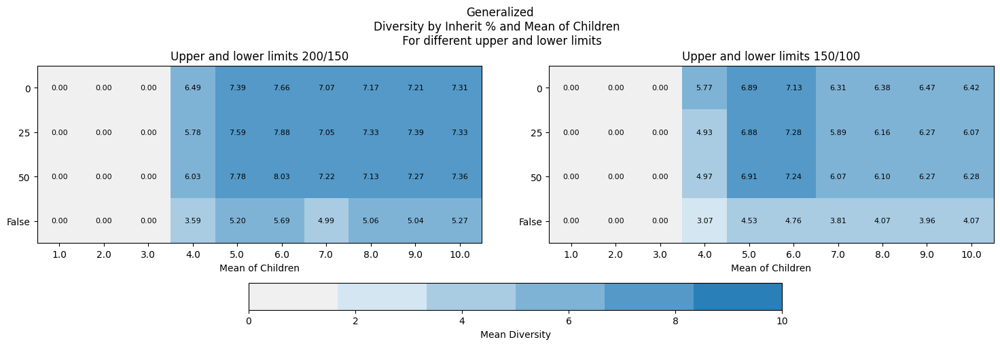

In [8]:
visualize_diversity(GcM_datos, inherits, Gcalphas, 'Generalized', up_low_limits, variable='Mean of Children', vis_type='heatmap')

C:\Users\jsolm\Juancho\Juancho\Maestrías\Modelage en Sistemas Complejos\Tesis\Projecto\Modelo\modelo_mio\Agrobiodiversity-model\venv\lib\site-packages\numpy\_core\fromnumeric.py:3596: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\jsolm\Juancho\Juancho\Maestrías\Modelage en Sistemas Complejos\Tesis\Projecto\Modelo\modelo_mio\Agrobiodiversity-model\venv\lib\site-packages\numpy\_core\_methods.py:138: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\jsolm\Juancho\Juancho\Maestrías\Modelage en Sistemas Complejos\Tesis\Projecto\Modelo\modelo_mio\Agrobiodiversity-model\venv\lib\site-packages\numpy\_core\_methods.py:218: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\jsolm\Juancho\Juancho\Maestrías\Modelage en Sistemas Complejos\Tesis\Projecto\Modelo\modelo_mio\Agrobiodiversity-model\venv\lib\site-packages\numpy\_core

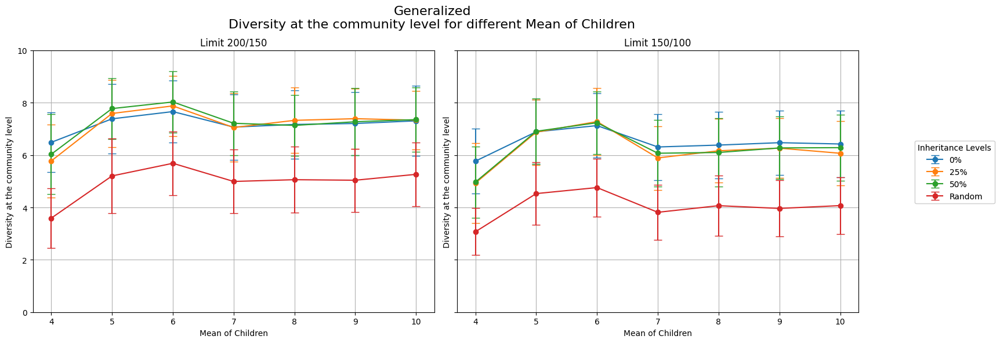

In [9]:
visualize_diversity(GcM_datos, inherits, Gcalphas, 'Generalized', up_low_limits, variable='Mean of Children', vis_type='transversal')

# Pop dynamics

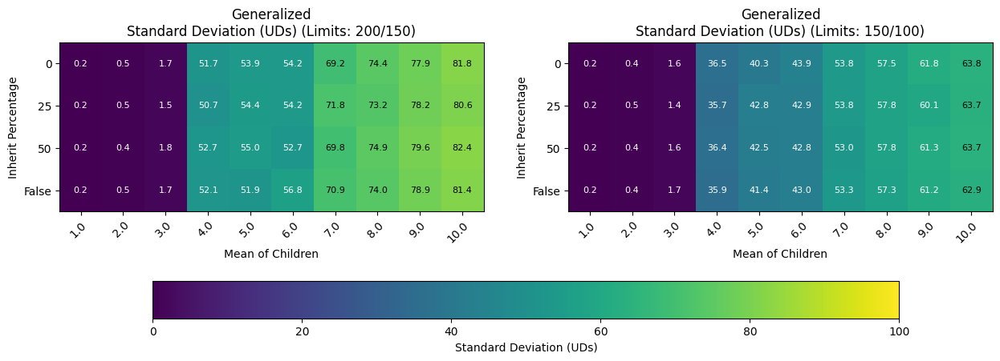

In [12]:
visualize_heatmap(GcM_datos, inherits, Gcalphas, 'Generalized', variable='Mean of Children', up_low_limits=up_low_limits, heatmap_type='std')

## Mean varieties

In [8]:
# This experiment has different values for Initial varieties mv
prob_morte = 0.06 #beta
media = 4 # Mean
m = 40
#v = 10 # Initial varieties
mv = 10
inherits = [0,25,50, 'False']
# inherits = [0,25,50] #Values for inherit
#inherits = [0, 'False'] #Values for inherit
Gmvalphas = np.linspace(1,mv,mv)# Mean varieties from 1 to mv
up_low_limits = [[200, 150], [150, 100]]
# For data of behaviour
vM = np.empty((len(inherits), len(Gmvalphas), len(up_low_limits)), dtype=object) # alive, mean and diversity levels

punto_vista = 50
tiempo = 1000
tempo = list(range(0,tiempo+1,punto_vista))
experiments = 300


print(vM.shape)
start = time.time()
print(f"started at:  {datetime.now()}")
for i, inherit in enumerate(inherits):
    for j, mvarieties  in enumerate(Gmvalphas):
        for k, (upper_limit, lower_limit) in enumerate(up_low_limits):
            star_configuration = time.time()
            #For population dynamics
            list_alive_UDs = []
            list_vivas_puntos_vista = []
            tasas_crecimiento = []
            #For diversity dynamics
            data_step_mean_var_ud = []
            data_step_var_system = []
            data_step_unique_system = []
            print(f"Experiments with inheritance {inherit} Initial UDs {m} and Mean varieties {mvarieties}")
            #Lists to store experiments' diversity data
            data_endo_mean_ud = []
            data_endo_com_level = []
            data_endo_total_varieties = []
            original_media = media
            #To see how frequent goes to extintion
            contador = 0
            for experiment in range(1, experiments+1):
                print(f'experimento {experiment}')
                ## Clans
                clans = (list(range(1, 4)) * (int(m) // 3 + 1))[:int(m)] # Just 3 clans
                random.shuffle(clans)
                if inherit != 'False':
                    #### Initialization
                    UD_generalized.uds = {}
                    instancias_ud = []
                    for id_ud in range(1, int(m) + 1):
                        instancias_ud.append(UD_generalized(id_ud, media, clans.pop()))
                    ## Varieties
                    limited_varieties = True
                    if limited_varieties == False:
                        for id_ud, ud in UD_generalized.uds.items():
                            for _ in range(3):
                                ud.varieties.append(Variety())
                    else:
                        initial_varieties = [Variety() for _ in range (int(10))]
                        for ud in UD_generalized.uds.values():
                            for _ in range(int(mvarieties)):
                                ud.varieties.append(random.choice(initial_varieties))   
                    # Lists for graphs
                    vivas_puntos_vista = [int(m)]
                    vivas_tasa_crecimiento = [int(m)]
            #             mortas_puntos_vista = [0]
                    #For diversity
                    mean_var_ud = []
                    var_system = []
                    unique_system = []
                    var_ud = []
                    var_total = []
                    for ud in [ud for ud in UD_generalized.uds.values() if ud.activa ==True]:
                        var_ud.append(len(ud.varieties))
                        for variety in ud.varieties:
                            var_total.append(variety.variety_id)
                    mean_var_ud.append(np.mean(var_ud))
                    var_system.append(len(var_total))
                    unique_system.append(len(set(var_total)))
                    # Simulation
                    for t in range(1, tiempo):
                        uds_copy = {id_ud: ud for id_ud, ud in UD_generalized.uds.items() if ud.activa}
                        items = list(uds_copy.items())
                        random.shuffle(items)
                        uds_copy = dict(items)
                        alive = len(uds_copy)
                        if alive > upper_limit and (media == original_media):
                            media -= media//2
                            if media >= 4:
                                media = media //2
                        elif alive < lower_limit and media < original_media:
                            media = original_media
                        if not uds_copy: #Extintion
                            # Only 0
                            print(f"acabó en 0 el experimento {experiment} con herencia {inherits[i]} con unidades {Gmvalphas[j]}")
                            vivas_puntos_vista.extend([0] * (int((tiempo/punto_vista)-(len(vivas_puntos_vista)))))
                            vivas_tasa_crecimiento.extend([0] * (int((tiempo)-(len(vivas_tasa_crecimiento)))))
                            contador += 1
                            break         
                        # Cycle:
                        for id_ud, ud in uds_copy.items():
                            ud.ter_filho()
                            ud.buscar_ud(uds_copy, int(media), inherit, True, 0.2)
                            ud.incrementar_idade()
                            ud.death_probability(prob_morte)
                        # Collecting data
                        vivas_tasa_crecimiento.append(len([ud for id, ud in uds_copy.items() if ud.activa]))
                        if t % punto_vista == 0:
                            viv = len([ud for id, ud in uds_copy.items() if ud.activa])
                            #mort = len([ud for id, ud in uds_copy.items() if not ud.activa])
                            vivas_puntos_vista.append(viv)
                            # For diversity
                            var_ud = []
                            var_total = []
                            for ud in [ud for ud in UD_generalized.uds.values() if ud.activa ==True]:
                                var_ud.append(len(ud.varieties))
                                for variety in ud.varieties:
                                    var_total.append(variety.variety_id)
                            mean_var_ud.append(np.mean(var_ud))
                            var_system.append(len(var_total))
                            unique_system.append(len(set(var_total))) 
                    viv = len([ud for id, ud in UD_generalized.uds.items() if ud.activa])
                    vivas_puntos_vista.append(viv)
                    # For diversity
                    var_ud = []
                    var_total = []
                    for ud in [ud for ud in UD_generalized.uds.values() if ud.activa ==True]:
                        var_ud.append(len(ud.varieties))
                        for variety in ud.varieties:
                            var_total.append(variety.variety_id)
                    mean_var_ud.append(np.mean(var_ud))
                    var_system.append(len(var_total))
                    unique_system.append(len(set(var_total)))
                    alive = (len([ud for id, ud in uds_copy.items() if ud.activa]))
                    if alive >= 1:   
                        total_varieties = []
                        varieties_per_UD = []
                        for ud in [ud for ud in UD_generalized.uds.values() if ud.activa ==True]:
                            varieties_per_UD.append(len(ud.varieties))
                            for variety in ud.varieties:
                                total_varieties.append(variety.variety_id)
                        data_endo_mean_ud.append(np.mean(varieties_per_UD))
                        data_endo_com_level.append(len(set(total_varieties)))
                        data_endo_total_varieties.append(total_varieties)

                else:# Now with inherit == False
                    #### Initialization
                    UD_generalized_al_inh.uds = {}
                    instancias_ud = []
                    for id_ud in range(1, int(m) + 1):
                        instancias_ud.append(UD_generalized_al_inh(id_ud, media, clans.pop()))
                    ## Varieties
                    limited_varieties = True
                    if limited_varieties == False:
                        for id_ud, ud in UD_generalized_al_inh.uds.items():
                            for _ in range(3):
                                ud.varieties.append(Variety())
                    else:
                        initial_varieties = [Variety() for _ in range (int(10))]
                        for ud in UD_generalized_al_inh.uds.values():
                            for _ in range(int(mvarieties)):
                                ud.varieties.append(random.choice(initial_varieties))   
                    # Lists for graphs
                    vivas_puntos_vista = [int(m)]
                    vivas_tasa_crecimiento = [int(m)]
            #             mortas_puntos_vista = [0]
                    #For diversity
                    mean_var_ud = []
                    var_system = []
                    unique_system = []
                    var_ud = []
                    var_total = []
                    for ud in [ud for ud in UD_generalized_al_inh.uds.values() if ud.activa ==True]:
                        var_ud.append(len(ud.varieties))
                        for variety in ud.varieties:
                            var_total.append(variety.variety_id)
                    mean_var_ud.append(np.mean(var_ud))
                    var_system.append(len(var_total))
                    unique_system.append(len(set(var_total)))
                    # Simulation
                    for t in range(1, tiempo):
                        uds_copy = {id_ud: ud for id_ud, ud in UD_generalized_al_inh.uds.items() if ud.activa}
                        items = list(uds_copy.items())
                        random.shuffle(items)
                        uds_copy = dict(items)
                        alive = len(uds_copy)
                        if alive > upper_limit and (media == original_media):
                            media -= media//2
                            if media >= 4:
                                media = media //2
                        elif alive < lower_limit and media < original_media:
                            media = original_media
                        if not uds_copy: #Extintion
                            # Only 0
                            print(f"acabó en 0 el experimento {experiment} con herencia {inherits[i]} con unidades {Gmvalphas[j]}")
                            vivas_puntos_vista.extend([0] * (int((tiempo/punto_vista)-(len(vivas_puntos_vista)))))
                            vivas_tasa_crecimiento.extend([0] * (int((tiempo)-(len(vivas_tasa_crecimiento)))))
                            contador += 1
                            break         
                        # Cycle:
                        varieties_list = [var for ud in uds_copy.values() for var in ud.varieties]
                        for id_ud, ud in uds_copy.items():
                            ud.ter_filho()
                            ud.buscar_ud(uds_copy, int(media), varieties_list, True, int(mvarieties), 0.2)
                            ud.incrementar_idade()
                            ud.death_probability(prob_morte)
                        # Collecting data
                        vivas_tasa_crecimiento.append(len([ud for id, ud in uds_copy.items() if ud.activa]))
                        if t % punto_vista == 0:
                            viv = len([ud for id, ud in uds_copy.items() if ud.activa])
                            #mort = len([ud for id, ud in uds_copy.items() if not ud.activa])
                            vivas_puntos_vista.append(viv)
                            # For diversity
                            var_ud = []
                            var_total = []
                            for ud in [ud for ud in UD_generalized_al_inh.uds.values() if ud.activa ==True]:
                                var_ud.append(len(ud.varieties))
                                for variety in ud.varieties:
                                    var_total.append(variety.variety_id)
                            mean_var_ud.append(np.mean(var_ud))
                            var_system.append(len(var_total))
                            unique_system.append(len(set(var_total))) 
                    viv = len([ud for id, ud in UD_generalized_al_inh.uds.items() if ud.activa])
                    vivas_puntos_vista.append(viv)
                    # For diversity
                    var_ud = []
                    var_total = []
                    for ud in [ud for ud in UD_generalized_al_inh.uds.values() if ud.activa ==True]:
                        var_ud.append(len(ud.varieties))
                        for variety in ud.varieties:
                            var_total.append(variety.variety_id)
                    mean_var_ud.append(np.mean(var_ud))
                    var_system.append(len(var_total))
                    unique_system.append(len(set(var_total)))
                    alive = (len([ud for id, ud in uds_copy.items() if ud.activa]))
                    if alive >= 1:   
                        total_varieties = []
                        varieties_per_UD = []
                        for ud in [ud for ud in UD_generalized_al_inh.uds.values() if ud.activa ==True]:
                            varieties_per_UD.append(len(ud.varieties))
                            for variety in ud.varieties:
                                total_varieties.append(variety.variety_id)
                        data_endo_mean_ud.append(np.mean(varieties_per_UD))
                        data_endo_com_level.append(len(set(total_varieties)))
                        data_endo_total_varieties.append(total_varieties)


                #Final colect of the data after the simulation!
                indice_primer_cero = np.where(np.array(vivas_tasa_crecimiento) == 0)[0]            
                if len(indice_primer_cero) > 0:
                    # Get growth rate before the 0
                    tasas_crecimiento.append(np.diff(vivas_tasa_crecimiento[:indice_primer_cero[0] - 1]) / vivas_tasa_crecimiento[:-1][:indice_primer_cero[0] - 2] * 100)
                else:
                    # Growth rate
                    tasas_crecimiento.append(np.diff(vivas_tasa_crecimiento) / vivas_tasa_crecimiento[:-1] * 100)
                # Collect the data
                list_alive_UDs.append(len([ud for id, ud in uds_copy.items() if ud.activa == True])) #For heatmap
                list_vivas_puntos_vista.append(vivas_puntos_vista)
                if alive >= 1:
                    if len(mean_var_ud) == len(tempo):        
                        data_step_var_system.append(var_system)
                        data_step_unique_system.append(unique_system)
                        data_step_mean_var_ud.append(mean_var_ud)

                data_inherit_endo = [data_endo_mean_ud, data_endo_com_level, data_endo_total_varieties]
            data_steps_inherit_endo = [data_step_var_system, data_step_unique_system, data_step_mean_var_ud]
            media = original_media
            end_config = time.time()
            vM[i][j][k] = {'alive': np.mean(list_alive_UDs),
                        'std': np.std(list_alive_UDs),
                        'time used': end_config - star_configuration,
                        'porcentage_extintion': contador/experiments,
                        'tempo': tempo, 
                        'mean': np.mean(list_vivas_puntos_vista, axis=0), 
                        'std':  np.std(list_vivas_puntos_vista, axis=0),
                        'growth rate': np.mean([np.mean(lista) for lista in tasas_crecimiento]),
                        'diversity_info': data_inherit_endo,
                        'diversity_info_steps': data_steps_inherit_endo}
            print(f"""
    The total time of the configuration of inherit percentage {inherit}, 
      initial UDs {m} and Mean varieties {mvarieties} is  {end_config - star_configuration}
            """)
# Folder
folder_name = 'Experiments_kinship_inheritance_parameters_limits'
if not os.path.exists(folder_name):
    os.makedirs(folder_name)
# Heatmap and std
heat_std = os.path.join(folder_name, 'Generalized_Initial_Mean_varieties.npy')
np.save(heat_std, vM)
now = datetime.now()
finish = time.time()
print(f"""
It finished at: {now}
It lasted {finish-start}
""")
print("done")

(4, 10, 2)
started at:  2024-11-21 14:59:46.252340
Experiments with inheritance 0 Initial UDs 40 and Mean varieties 1.0
experimento 1
acabó en 0 el experimento 1 con herencia 0 con unidades 1.0
experimento 2
experimento 3
acabó en 0 el experimento 3 con herencia 0 con unidades 1.0
experimento 4
experimento 5
experimento 6
experimento 7
acabó en 0 el experimento 7 con herencia 0 con unidades 1.0
experimento 8
acabó en 0 el experimento 8 con herencia 0 con unidades 1.0
experimento 9
experimento 10
experimento 11
acabó en 0 el experimento 11 con herencia 0 con unidades 1.0
experimento 12
experimento 13
acabó en 0 el experimento 13 con herencia 0 con unidades 1.0
experimento 14
experimento 15
experimento 16
experimento 17
acabó en 0 el experimento 17 con herencia 0 con unidades 1.0
experimento 18
experimento 19
experimento 20
acabó en 0 el experimento 20 con herencia 0 con unidades 1.0
experimento 21
acabó en 0 el experimento 21 con herencia 0 con unidades 1.0
experimento 22
experimento 23

acabó en 0 el experimento 168 con herencia 0 con unidades 1.0
experimento 169
experimento 170
acabó en 0 el experimento 170 con herencia 0 con unidades 1.0
experimento 171
acabó en 0 el experimento 171 con herencia 0 con unidades 1.0
experimento 172
experimento 173
acabó en 0 el experimento 173 con herencia 0 con unidades 1.0
experimento 174
experimento 175
acabó en 0 el experimento 175 con herencia 0 con unidades 1.0
experimento 176
acabó en 0 el experimento 176 con herencia 0 con unidades 1.0
experimento 177
acabó en 0 el experimento 177 con herencia 0 con unidades 1.0
experimento 178
experimento 179
experimento 180
experimento 181
acabó en 0 el experimento 181 con herencia 0 con unidades 1.0
experimento 182
experimento 183
experimento 184
acabó en 0 el experimento 184 con herencia 0 con unidades 1.0
experimento 185
experimento 186
experimento 187
experimento 188
acabó en 0 el experimento 188 con herencia 0 con unidades 1.0
experimento 189
acabó en 0 el experimento 189 con herencia 0

experimento 31
experimento 32
acabó en 0 el experimento 32 con herencia 0 con unidades 1.0
experimento 33
acabó en 0 el experimento 33 con herencia 0 con unidades 1.0
experimento 34
acabó en 0 el experimento 34 con herencia 0 con unidades 1.0
experimento 35
acabó en 0 el experimento 35 con herencia 0 con unidades 1.0
experimento 36
experimento 37
acabó en 0 el experimento 37 con herencia 0 con unidades 1.0
experimento 38
acabó en 0 el experimento 38 con herencia 0 con unidades 1.0
experimento 39
acabó en 0 el experimento 39 con herencia 0 con unidades 1.0
experimento 40
experimento 41
acabó en 0 el experimento 41 con herencia 0 con unidades 1.0
experimento 42
experimento 43
acabó en 0 el experimento 43 con herencia 0 con unidades 1.0
experimento 44
acabó en 0 el experimento 44 con herencia 0 con unidades 1.0
experimento 45
experimento 46
acabó en 0 el experimento 46 con herencia 0 con unidades 1.0
experimento 47
acabó en 0 el experimento 47 con herencia 0 con unidades 1.0
experimento 4

acabó en 0 el experimento 177 con herencia 0 con unidades 1.0
experimento 178
acabó en 0 el experimento 178 con herencia 0 con unidades 1.0
experimento 179
experimento 180
acabó en 0 el experimento 180 con herencia 0 con unidades 1.0
experimento 181
acabó en 0 el experimento 181 con herencia 0 con unidades 1.0
experimento 182
acabó en 0 el experimento 182 con herencia 0 con unidades 1.0
experimento 183
acabó en 0 el experimento 183 con herencia 0 con unidades 1.0
experimento 184
acabó en 0 el experimento 184 con herencia 0 con unidades 1.0
experimento 185
acabó en 0 el experimento 185 con herencia 0 con unidades 1.0
experimento 186
experimento 187
acabó en 0 el experimento 187 con herencia 0 con unidades 1.0
experimento 188
experimento 189
acabó en 0 el experimento 189 con herencia 0 con unidades 1.0
experimento 190
experimento 191
experimento 192
acabó en 0 el experimento 192 con herencia 0 con unidades 1.0
experimento 193
acabó en 0 el experimento 193 con herencia 0 con unidades 1.0


experimento 19
acabó en 0 el experimento 19 con herencia 0 con unidades 2.0
experimento 20
acabó en 0 el experimento 20 con herencia 0 con unidades 2.0
experimento 21
acabó en 0 el experimento 21 con herencia 0 con unidades 2.0
experimento 22
acabó en 0 el experimento 22 con herencia 0 con unidades 2.0
experimento 23
acabó en 0 el experimento 23 con herencia 0 con unidades 2.0
experimento 24
experimento 25
acabó en 0 el experimento 25 con herencia 0 con unidades 2.0
experimento 26
acabó en 0 el experimento 26 con herencia 0 con unidades 2.0
experimento 27
acabó en 0 el experimento 27 con herencia 0 con unidades 2.0
experimento 28
experimento 29
acabó en 0 el experimento 29 con herencia 0 con unidades 2.0
experimento 30
experimento 31
experimento 32
acabó en 0 el experimento 32 con herencia 0 con unidades 2.0
experimento 33
acabó en 0 el experimento 33 con herencia 0 con unidades 2.0
experimento 34
experimento 35
experimento 36
experimento 37
acabó en 0 el experimento 37 con herencia 0 

acabó en 0 el experimento 186 con herencia 0 con unidades 2.0
experimento 187
experimento 188
experimento 189
acabó en 0 el experimento 189 con herencia 0 con unidades 2.0
experimento 190
acabó en 0 el experimento 190 con herencia 0 con unidades 2.0
experimento 191
acabó en 0 el experimento 191 con herencia 0 con unidades 2.0
experimento 192
experimento 193
acabó en 0 el experimento 193 con herencia 0 con unidades 2.0
experimento 194
experimento 195
experimento 196
acabó en 0 el experimento 196 con herencia 0 con unidades 2.0
experimento 197
acabó en 0 el experimento 197 con herencia 0 con unidades 2.0
experimento 198
acabó en 0 el experimento 198 con herencia 0 con unidades 2.0
experimento 199
acabó en 0 el experimento 199 con herencia 0 con unidades 2.0
experimento 200
acabó en 0 el experimento 200 con herencia 0 con unidades 2.0
experimento 201
experimento 202
experimento 203
acabó en 0 el experimento 203 con herencia 0 con unidades 2.0
experimento 204
experimento 205
acabó en 0 el 

acabó en 0 el experimento 46 con herencia 0 con unidades 2.0
experimento 47
acabó en 0 el experimento 47 con herencia 0 con unidades 2.0
experimento 48
acabó en 0 el experimento 48 con herencia 0 con unidades 2.0
experimento 49
acabó en 0 el experimento 49 con herencia 0 con unidades 2.0
experimento 50
experimento 51
experimento 52
experimento 53
acabó en 0 el experimento 53 con herencia 0 con unidades 2.0
experimento 54
experimento 55
acabó en 0 el experimento 55 con herencia 0 con unidades 2.0
experimento 56
acabó en 0 el experimento 56 con herencia 0 con unidades 2.0
experimento 57
experimento 58
acabó en 0 el experimento 58 con herencia 0 con unidades 2.0
experimento 59
acabó en 0 el experimento 59 con herencia 0 con unidades 2.0
experimento 60
acabó en 0 el experimento 60 con herencia 0 con unidades 2.0
experimento 61
acabó en 0 el experimento 61 con herencia 0 con unidades 2.0
experimento 62
acabó en 0 el experimento 62 con herencia 0 con unidades 2.0
experimento 63
experimento 6

experimento 187
acabó en 0 el experimento 187 con herencia 0 con unidades 2.0
experimento 188
experimento 189
acabó en 0 el experimento 189 con herencia 0 con unidades 2.0
experimento 190
acabó en 0 el experimento 190 con herencia 0 con unidades 2.0
experimento 191
acabó en 0 el experimento 191 con herencia 0 con unidades 2.0
experimento 192
acabó en 0 el experimento 192 con herencia 0 con unidades 2.0
experimento 193
experimento 194
experimento 195
acabó en 0 el experimento 195 con herencia 0 con unidades 2.0
experimento 196
acabó en 0 el experimento 196 con herencia 0 con unidades 2.0
experimento 197
experimento 198
acabó en 0 el experimento 198 con herencia 0 con unidades 2.0
experimento 199
acabó en 0 el experimento 199 con herencia 0 con unidades 2.0
experimento 200
acabó en 0 el experimento 200 con herencia 0 con unidades 2.0
experimento 201
acabó en 0 el experimento 201 con herencia 0 con unidades 2.0
experimento 202
acabó en 0 el experimento 202 con herencia 0 con unidades 2.0


experimento 34
acabó en 0 el experimento 34 con herencia 0 con unidades 3.0
experimento 35
experimento 36
acabó en 0 el experimento 36 con herencia 0 con unidades 3.0
experimento 37
acabó en 0 el experimento 37 con herencia 0 con unidades 3.0
experimento 38
experimento 39
experimento 40
experimento 41
acabó en 0 el experimento 41 con herencia 0 con unidades 3.0
experimento 42
experimento 43
acabó en 0 el experimento 43 con herencia 0 con unidades 3.0
experimento 44
experimento 45
experimento 46
acabó en 0 el experimento 46 con herencia 0 con unidades 3.0
experimento 47
acabó en 0 el experimento 47 con herencia 0 con unidades 3.0
experimento 48
acabó en 0 el experimento 48 con herencia 0 con unidades 3.0
experimento 49
experimento 50
acabó en 0 el experimento 50 con herencia 0 con unidades 3.0
experimento 51
experimento 52
acabó en 0 el experimento 52 con herencia 0 con unidades 3.0
experimento 53
experimento 54
acabó en 0 el experimento 54 con herencia 0 con unidades 3.0
experimento 55

experimento 208
acabó en 0 el experimento 208 con herencia 0 con unidades 3.0
experimento 209
experimento 210
experimento 211
acabó en 0 el experimento 211 con herencia 0 con unidades 3.0
experimento 212
acabó en 0 el experimento 212 con herencia 0 con unidades 3.0
experimento 213
experimento 214
experimento 215
experimento 216
acabó en 0 el experimento 216 con herencia 0 con unidades 3.0
experimento 217
acabó en 0 el experimento 217 con herencia 0 con unidades 3.0
experimento 218
experimento 219
experimento 220
acabó en 0 el experimento 220 con herencia 0 con unidades 3.0
experimento 221
experimento 222
experimento 223
experimento 224
experimento 225
acabó en 0 el experimento 225 con herencia 0 con unidades 3.0
experimento 226
acabó en 0 el experimento 226 con herencia 0 con unidades 3.0
experimento 227
acabó en 0 el experimento 227 con herencia 0 con unidades 3.0
experimento 228
acabó en 0 el experimento 228 con herencia 0 con unidades 3.0
experimento 229
acabó en 0 el experimento 22

acabó en 0 el experimento 62 con herencia 0 con unidades 3.0
experimento 63
experimento 64
acabó en 0 el experimento 64 con herencia 0 con unidades 3.0
experimento 65
experimento 66
acabó en 0 el experimento 66 con herencia 0 con unidades 3.0
experimento 67
experimento 68
acabó en 0 el experimento 68 con herencia 0 con unidades 3.0
experimento 69
acabó en 0 el experimento 69 con herencia 0 con unidades 3.0
experimento 70
acabó en 0 el experimento 70 con herencia 0 con unidades 3.0
experimento 71
acabó en 0 el experimento 71 con herencia 0 con unidades 3.0
experimento 72
experimento 73
experimento 74
acabó en 0 el experimento 74 con herencia 0 con unidades 3.0
experimento 75
experimento 76
acabó en 0 el experimento 76 con herencia 0 con unidades 3.0
experimento 77
experimento 78
acabó en 0 el experimento 78 con herencia 0 con unidades 3.0
experimento 79
experimento 80
acabó en 0 el experimento 80 con herencia 0 con unidades 3.0
experimento 81
acabó en 0 el experimento 81 con herencia 0 

experimento 199
experimento 200
acabó en 0 el experimento 200 con herencia 0 con unidades 3.0
experimento 201
experimento 202
acabó en 0 el experimento 202 con herencia 0 con unidades 3.0
experimento 203
acabó en 0 el experimento 203 con herencia 0 con unidades 3.0
experimento 204
acabó en 0 el experimento 204 con herencia 0 con unidades 3.0
experimento 205
experimento 206
acabó en 0 el experimento 206 con herencia 0 con unidades 3.0
experimento 207
acabó en 0 el experimento 207 con herencia 0 con unidades 3.0
experimento 208
acabó en 0 el experimento 208 con herencia 0 con unidades 3.0
experimento 209
acabó en 0 el experimento 209 con herencia 0 con unidades 3.0
experimento 210
acabó en 0 el experimento 210 con herencia 0 con unidades 3.0
experimento 211
experimento 212
acabó en 0 el experimento 212 con herencia 0 con unidades 3.0
experimento 213
experimento 214
acabó en 0 el experimento 214 con herencia 0 con unidades 3.0
experimento 215
acabó en 0 el experimento 215 con herencia 0 c

acabó en 0 el experimento 41 con herencia 0 con unidades 4.0
experimento 42
acabó en 0 el experimento 42 con herencia 0 con unidades 4.0
experimento 43
experimento 44
acabó en 0 el experimento 44 con herencia 0 con unidades 4.0
experimento 45
acabó en 0 el experimento 45 con herencia 0 con unidades 4.0
experimento 46
experimento 47
experimento 48
acabó en 0 el experimento 48 con herencia 0 con unidades 4.0
experimento 49
experimento 50
experimento 51
acabó en 0 el experimento 51 con herencia 0 con unidades 4.0
experimento 52
experimento 53
acabó en 0 el experimento 53 con herencia 0 con unidades 4.0
experimento 54
acabó en 0 el experimento 54 con herencia 0 con unidades 4.0
experimento 55
experimento 56
experimento 57
acabó en 0 el experimento 57 con herencia 0 con unidades 4.0
experimento 58
acabó en 0 el experimento 58 con herencia 0 con unidades 4.0
experimento 59
acabó en 0 el experimento 59 con herencia 0 con unidades 4.0
experimento 60
acabó en 0 el experimento 60 con herencia 0 

experimento 235
acabó en 0 el experimento 235 con herencia 0 con unidades 4.0
experimento 236
experimento 237
experimento 238
experimento 239
acabó en 0 el experimento 239 con herencia 0 con unidades 4.0
experimento 240
experimento 241
acabó en 0 el experimento 241 con herencia 0 con unidades 4.0
experimento 242
acabó en 0 el experimento 242 con herencia 0 con unidades 4.0
experimento 243
acabó en 0 el experimento 243 con herencia 0 con unidades 4.0
experimento 244
acabó en 0 el experimento 244 con herencia 0 con unidades 4.0
experimento 245
acabó en 0 el experimento 245 con herencia 0 con unidades 4.0
experimento 246
experimento 247
experimento 248
experimento 249
acabó en 0 el experimento 249 con herencia 0 con unidades 4.0
experimento 250
experimento 251
experimento 252
acabó en 0 el experimento 252 con herencia 0 con unidades 4.0
experimento 253
experimento 254
acabó en 0 el experimento 254 con herencia 0 con unidades 4.0
experimento 255
experimento 256
acabó en 0 el experimento 25

acabó en 0 el experimento 93 con herencia 0 con unidades 4.0
experimento 94
experimento 95
acabó en 0 el experimento 95 con herencia 0 con unidades 4.0
experimento 96
experimento 97
acabó en 0 el experimento 97 con herencia 0 con unidades 4.0
experimento 98
acabó en 0 el experimento 98 con herencia 0 con unidades 4.0
experimento 99
experimento 100
experimento 101
experimento 102
experimento 103
acabó en 0 el experimento 103 con herencia 0 con unidades 4.0
experimento 104
acabó en 0 el experimento 104 con herencia 0 con unidades 4.0
experimento 105
experimento 106
acabó en 0 el experimento 106 con herencia 0 con unidades 4.0
experimento 107
experimento 108
experimento 109
experimento 110
acabó en 0 el experimento 110 con herencia 0 con unidades 4.0
experimento 111
experimento 112
acabó en 0 el experimento 112 con herencia 0 con unidades 4.0
experimento 113
experimento 114
experimento 115
acabó en 0 el experimento 115 con herencia 0 con unidades 4.0
experimento 116
experimento 117
acabó 

acabó en 0 el experimento 242 con herencia 0 con unidades 4.0
experimento 243
acabó en 0 el experimento 243 con herencia 0 con unidades 4.0
experimento 244
acabó en 0 el experimento 244 con herencia 0 con unidades 4.0
experimento 245
experimento 246
acabó en 0 el experimento 246 con herencia 0 con unidades 4.0
experimento 247
acabó en 0 el experimento 247 con herencia 0 con unidades 4.0
experimento 248
experimento 249
experimento 250
experimento 251
acabó en 0 el experimento 251 con herencia 0 con unidades 4.0
experimento 252
acabó en 0 el experimento 252 con herencia 0 con unidades 4.0
experimento 253
acabó en 0 el experimento 253 con herencia 0 con unidades 4.0
experimento 254
acabó en 0 el experimento 254 con herencia 0 con unidades 4.0
experimento 255
experimento 256
acabó en 0 el experimento 256 con herencia 0 con unidades 4.0
experimento 257
acabó en 0 el experimento 257 con herencia 0 con unidades 4.0
experimento 258
experimento 259
acabó en 0 el experimento 259 con herencia 0 c

acabó en 0 el experimento 86 con herencia 0 con unidades 5.0
experimento 87
experimento 88
acabó en 0 el experimento 88 con herencia 0 con unidades 5.0
experimento 89
experimento 90
acabó en 0 el experimento 90 con herencia 0 con unidades 5.0
experimento 91
acabó en 0 el experimento 91 con herencia 0 con unidades 5.0
experimento 92
acabó en 0 el experimento 92 con herencia 0 con unidades 5.0
experimento 93
experimento 94
acabó en 0 el experimento 94 con herencia 0 con unidades 5.0
experimento 95
acabó en 0 el experimento 95 con herencia 0 con unidades 5.0
experimento 96
acabó en 0 el experimento 96 con herencia 0 con unidades 5.0
experimento 97
experimento 98
acabó en 0 el experimento 98 con herencia 0 con unidades 5.0
experimento 99
acabó en 0 el experimento 99 con herencia 0 con unidades 5.0
experimento 100
experimento 101
experimento 102
acabó en 0 el experimento 102 con herencia 0 con unidades 5.0
experimento 103
acabó en 0 el experimento 103 con herencia 0 con unidades 5.0
experim

experimento 261
acabó en 0 el experimento 261 con herencia 0 con unidades 5.0
experimento 262
experimento 263
acabó en 0 el experimento 263 con herencia 0 con unidades 5.0
experimento 264
experimento 265
acabó en 0 el experimento 265 con herencia 0 con unidades 5.0
experimento 266
acabó en 0 el experimento 266 con herencia 0 con unidades 5.0
experimento 267
experimento 268
acabó en 0 el experimento 268 con herencia 0 con unidades 5.0
experimento 269
experimento 270
experimento 271
acabó en 0 el experimento 271 con herencia 0 con unidades 5.0
experimento 272
experimento 273
experimento 274
experimento 275
acabó en 0 el experimento 275 con herencia 0 con unidades 5.0
experimento 276
experimento 277
acabó en 0 el experimento 277 con herencia 0 con unidades 5.0
experimento 278
acabó en 0 el experimento 278 con herencia 0 con unidades 5.0
experimento 279
experimento 280
experimento 281
acabó en 0 el experimento 281 con herencia 0 con unidades 5.0
experimento 282
experimento 283
experimento 

acabó en 0 el experimento 114 con herencia 0 con unidades 5.0
experimento 115
acabó en 0 el experimento 115 con herencia 0 con unidades 5.0
experimento 116
acabó en 0 el experimento 116 con herencia 0 con unidades 5.0
experimento 117
experimento 118
acabó en 0 el experimento 118 con herencia 0 con unidades 5.0
experimento 119
acabó en 0 el experimento 119 con herencia 0 con unidades 5.0
experimento 120
acabó en 0 el experimento 120 con herencia 0 con unidades 5.0
experimento 121
acabó en 0 el experimento 121 con herencia 0 con unidades 5.0
experimento 122
experimento 123
acabó en 0 el experimento 123 con herencia 0 con unidades 5.0
experimento 124
experimento 125
acabó en 0 el experimento 125 con herencia 0 con unidades 5.0
experimento 126
acabó en 0 el experimento 126 con herencia 0 con unidades 5.0
experimento 127
acabó en 0 el experimento 127 con herencia 0 con unidades 5.0
experimento 128
acabó en 0 el experimento 128 con herencia 0 con unidades 5.0
experimento 129
acabó en 0 el ex

experimento 251
acabó en 0 el experimento 251 con herencia 0 con unidades 5.0
experimento 252
experimento 253
acabó en 0 el experimento 253 con herencia 0 con unidades 5.0
experimento 254
acabó en 0 el experimento 254 con herencia 0 con unidades 5.0
experimento 255
acabó en 0 el experimento 255 con herencia 0 con unidades 5.0
experimento 256
acabó en 0 el experimento 256 con herencia 0 con unidades 5.0
experimento 257
experimento 258
acabó en 0 el experimento 258 con herencia 0 con unidades 5.0
experimento 259
acabó en 0 el experimento 259 con herencia 0 con unidades 5.0
experimento 260
acabó en 0 el experimento 260 con herencia 0 con unidades 5.0
experimento 261
experimento 262
acabó en 0 el experimento 262 con herencia 0 con unidades 5.0
experimento 263
experimento 264
experimento 265
acabó en 0 el experimento 265 con herencia 0 con unidades 5.0
experimento 266
acabó en 0 el experimento 266 con herencia 0 con unidades 5.0
experimento 267
experimento 268
acabó en 0 el experimento 268 

experimento 119
acabó en 0 el experimento 119 con herencia 0 con unidades 6.0
experimento 120
acabó en 0 el experimento 120 con herencia 0 con unidades 6.0
experimento 121
experimento 122
experimento 123
experimento 124
experimento 125
acabó en 0 el experimento 125 con herencia 0 con unidades 6.0
experimento 126
acabó en 0 el experimento 126 con herencia 0 con unidades 6.0
experimento 127
acabó en 0 el experimento 127 con herencia 0 con unidades 6.0
experimento 128
experimento 129
acabó en 0 el experimento 129 con herencia 0 con unidades 6.0
experimento 130
acabó en 0 el experimento 130 con herencia 0 con unidades 6.0
experimento 131
acabó en 0 el experimento 131 con herencia 0 con unidades 6.0
experimento 132
acabó en 0 el experimento 132 con herencia 0 con unidades 6.0
experimento 133
experimento 134
acabó en 0 el experimento 134 con herencia 0 con unidades 6.0
experimento 135
experimento 136
experimento 137
experimento 138
acabó en 0 el experimento 138 con herencia 0 con unidades 6.

experimento 2
experimento 3
acabó en 0 el experimento 3 con herencia 0 con unidades 6.0
experimento 4
acabó en 0 el experimento 4 con herencia 0 con unidades 6.0
experimento 5
acabó en 0 el experimento 5 con herencia 0 con unidades 6.0
experimento 6
acabó en 0 el experimento 6 con herencia 0 con unidades 6.0
experimento 7
acabó en 0 el experimento 7 con herencia 0 con unidades 6.0
experimento 8
acabó en 0 el experimento 8 con herencia 0 con unidades 6.0
experimento 9
acabó en 0 el experimento 9 con herencia 0 con unidades 6.0
experimento 10
acabó en 0 el experimento 10 con herencia 0 con unidades 6.0
experimento 11
acabó en 0 el experimento 11 con herencia 0 con unidades 6.0
experimento 12
experimento 13
acabó en 0 el experimento 13 con herencia 0 con unidades 6.0
experimento 14
acabó en 0 el experimento 14 con herencia 0 con unidades 6.0
experimento 15
acabó en 0 el experimento 15 con herencia 0 con unidades 6.0
experimento 16
acabó en 0 el experimento 16 con herencia 0 con unidades 6

acabó en 0 el experimento 149 con herencia 0 con unidades 6.0
experimento 150
acabó en 0 el experimento 150 con herencia 0 con unidades 6.0
experimento 151
experimento 152
acabó en 0 el experimento 152 con herencia 0 con unidades 6.0
experimento 153
experimento 154
acabó en 0 el experimento 154 con herencia 0 con unidades 6.0
experimento 155
experimento 156
experimento 157
acabó en 0 el experimento 157 con herencia 0 con unidades 6.0
experimento 158
acabó en 0 el experimento 158 con herencia 0 con unidades 6.0
experimento 159
experimento 160
experimento 161
acabó en 0 el experimento 161 con herencia 0 con unidades 6.0
experimento 162
experimento 163
acabó en 0 el experimento 163 con herencia 0 con unidades 6.0
experimento 164
experimento 165
acabó en 0 el experimento 165 con herencia 0 con unidades 6.0
experimento 166
acabó en 0 el experimento 166 con herencia 0 con unidades 6.0
experimento 167
acabó en 0 el experimento 167 con herencia 0 con unidades 6.0
experimento 168
experimento 16

experimento 292
experimento 293
acabó en 0 el experimento 293 con herencia 0 con unidades 6.0
experimento 294
acabó en 0 el experimento 294 con herencia 0 con unidades 6.0
experimento 295
acabó en 0 el experimento 295 con herencia 0 con unidades 6.0
experimento 296
acabó en 0 el experimento 296 con herencia 0 con unidades 6.0
experimento 297
acabó en 0 el experimento 297 con herencia 0 con unidades 6.0
experimento 298
experimento 299
acabó en 0 el experimento 299 con herencia 0 con unidades 6.0
experimento 300
acabó en 0 el experimento 300 con herencia 0 con unidades 6.0

    The total time of the configuration of inherit percentage 0, 
      initial UDs 40 and Mean varieties 6.0 is  655.6015737056732
            
Experiments with inheritance 0 Initial UDs 40 and Mean varieties 7.0
experimento 1
acabó en 0 el experimento 1 con herencia 0 con unidades 7.0
experimento 2
acabó en 0 el experimento 2 con herencia 0 con unidades 7.0
experimento 3
experimento 4
experimento 5
experimento 6
aca

acabó en 0 el experimento 171 con herencia 0 con unidades 7.0
experimento 172
experimento 173
experimento 174
acabó en 0 el experimento 174 con herencia 0 con unidades 7.0
experimento 175
acabó en 0 el experimento 175 con herencia 0 con unidades 7.0
experimento 176
acabó en 0 el experimento 176 con herencia 0 con unidades 7.0
experimento 177
experimento 178
acabó en 0 el experimento 178 con herencia 0 con unidades 7.0
experimento 179
acabó en 0 el experimento 179 con herencia 0 con unidades 7.0
experimento 180
experimento 181
acabó en 0 el experimento 181 con herencia 0 con unidades 7.0
experimento 182
acabó en 0 el experimento 182 con herencia 0 con unidades 7.0
experimento 183
acabó en 0 el experimento 183 con herencia 0 con unidades 7.0
experimento 184
acabó en 0 el experimento 184 con herencia 0 con unidades 7.0
experimento 185
experimento 186
experimento 187
acabó en 0 el experimento 187 con herencia 0 con unidades 7.0
experimento 188
acabó en 0 el experimento 188 con herencia 0 c

acabó en 0 el experimento 24 con herencia 0 con unidades 7.0
experimento 25
acabó en 0 el experimento 25 con herencia 0 con unidades 7.0
experimento 26
acabó en 0 el experimento 26 con herencia 0 con unidades 7.0
experimento 27
acabó en 0 el experimento 27 con herencia 0 con unidades 7.0
experimento 28
acabó en 0 el experimento 28 con herencia 0 con unidades 7.0
experimento 29
experimento 30
experimento 31
acabó en 0 el experimento 31 con herencia 0 con unidades 7.0
experimento 32
acabó en 0 el experimento 32 con herencia 0 con unidades 7.0
experimento 33
acabó en 0 el experimento 33 con herencia 0 con unidades 7.0
experimento 34
acabó en 0 el experimento 34 con herencia 0 con unidades 7.0
experimento 35
acabó en 0 el experimento 35 con herencia 0 con unidades 7.0
experimento 36
acabó en 0 el experimento 36 con herencia 0 con unidades 7.0
experimento 37
acabó en 0 el experimento 37 con herencia 0 con unidades 7.0
experimento 38
experimento 39
experimento 40
acabó en 0 el experimento 40

acabó en 0 el experimento 162 con herencia 0 con unidades 7.0
experimento 163
acabó en 0 el experimento 163 con herencia 0 con unidades 7.0
experimento 164
acabó en 0 el experimento 164 con herencia 0 con unidades 7.0
experimento 165
acabó en 0 el experimento 165 con herencia 0 con unidades 7.0
experimento 166
acabó en 0 el experimento 166 con herencia 0 con unidades 7.0
experimento 167
acabó en 0 el experimento 167 con herencia 0 con unidades 7.0
experimento 168
acabó en 0 el experimento 168 con herencia 0 con unidades 7.0
experimento 169
acabó en 0 el experimento 169 con herencia 0 con unidades 7.0
experimento 170
acabó en 0 el experimento 170 con herencia 0 con unidades 7.0
experimento 171
experimento 172
acabó en 0 el experimento 172 con herencia 0 con unidades 7.0
experimento 173
experimento 174
acabó en 0 el experimento 174 con herencia 0 con unidades 7.0
experimento 175
experimento 176
acabó en 0 el experimento 176 con herencia 0 con unidades 7.0
experimento 177
acabó en 0 el ex

acabó en 0 el experimento 300 con herencia 0 con unidades 7.0

    The total time of the configuration of inherit percentage 0, 
      initial UDs 40 and Mean varieties 7.0 is  638.5040011405945
            
Experiments with inheritance 0 Initial UDs 40 and Mean varieties 8.0
experimento 1
acabó en 0 el experimento 1 con herencia 0 con unidades 8.0
experimento 2
experimento 3
experimento 4
acabó en 0 el experimento 4 con herencia 0 con unidades 8.0
experimento 5
acabó en 0 el experimento 5 con herencia 0 con unidades 8.0
experimento 6
experimento 7
acabó en 0 el experimento 7 con herencia 0 con unidades 8.0
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
acabó en 0 el experimento 12 con herencia 0 con unidades 8.0
experimento 13
experimento 14
acabó en 0 el experimento 14 con herencia 0 con unidades 8.0
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
acabó en 0 el experimento 20 con herencia 0 con unidades 8.0
experimen

experimento 174
experimento 175
acabó en 0 el experimento 175 con herencia 0 con unidades 8.0
experimento 176
experimento 177
acabó en 0 el experimento 177 con herencia 0 con unidades 8.0
experimento 178
experimento 179
acabó en 0 el experimento 179 con herencia 0 con unidades 8.0
experimento 180
acabó en 0 el experimento 180 con herencia 0 con unidades 8.0
experimento 181
acabó en 0 el experimento 181 con herencia 0 con unidades 8.0
experimento 182
experimento 183
acabó en 0 el experimento 183 con herencia 0 con unidades 8.0
experimento 184
experimento 185
acabó en 0 el experimento 185 con herencia 0 con unidades 8.0
experimento 186
experimento 187
acabó en 0 el experimento 187 con herencia 0 con unidades 8.0
experimento 188
acabó en 0 el experimento 188 con herencia 0 con unidades 8.0
experimento 189
acabó en 0 el experimento 189 con herencia 0 con unidades 8.0
experimento 190
experimento 191
experimento 192
acabó en 0 el experimento 192 con herencia 0 con unidades 8.0
experimento 19

acabó en 0 el experimento 40 con herencia 0 con unidades 8.0
experimento 41
acabó en 0 el experimento 41 con herencia 0 con unidades 8.0
experimento 42
experimento 43
experimento 44
acabó en 0 el experimento 44 con herencia 0 con unidades 8.0
experimento 45
acabó en 0 el experimento 45 con herencia 0 con unidades 8.0
experimento 46
acabó en 0 el experimento 46 con herencia 0 con unidades 8.0
experimento 47
acabó en 0 el experimento 47 con herencia 0 con unidades 8.0
experimento 48
experimento 49
experimento 50
acabó en 0 el experimento 50 con herencia 0 con unidades 8.0
experimento 51
acabó en 0 el experimento 51 con herencia 0 con unidades 8.0
experimento 52
acabó en 0 el experimento 52 con herencia 0 con unidades 8.0
experimento 53
acabó en 0 el experimento 53 con herencia 0 con unidades 8.0
experimento 54
experimento 55
acabó en 0 el experimento 55 con herencia 0 con unidades 8.0
experimento 56
experimento 57
experimento 58
acabó en 0 el experimento 58 con herencia 0 con unidades 8.

experimento 180
acabó en 0 el experimento 180 con herencia 0 con unidades 8.0
experimento 181
acabó en 0 el experimento 181 con herencia 0 con unidades 8.0
experimento 182
experimento 183
acabó en 0 el experimento 183 con herencia 0 con unidades 8.0
experimento 184
acabó en 0 el experimento 184 con herencia 0 con unidades 8.0
experimento 185
acabó en 0 el experimento 185 con herencia 0 con unidades 8.0
experimento 186
acabó en 0 el experimento 186 con herencia 0 con unidades 8.0
experimento 187
experimento 188
acabó en 0 el experimento 188 con herencia 0 con unidades 8.0
experimento 189
acabó en 0 el experimento 189 con herencia 0 con unidades 8.0
experimento 190
acabó en 0 el experimento 190 con herencia 0 con unidades 8.0
experimento 191
experimento 192
acabó en 0 el experimento 192 con herencia 0 con unidades 8.0
experimento 193
acabó en 0 el experimento 193 con herencia 0 con unidades 8.0
experimento 194
acabó en 0 el experimento 194 con herencia 0 con unidades 8.0
experimento 195


experimento 21
acabó en 0 el experimento 21 con herencia 0 con unidades 9.0
experimento 22
acabó en 0 el experimento 22 con herencia 0 con unidades 9.0
experimento 23
acabó en 0 el experimento 23 con herencia 0 con unidades 9.0
experimento 24
experimento 25
experimento 26
acabó en 0 el experimento 26 con herencia 0 con unidades 9.0
experimento 27
acabó en 0 el experimento 27 con herencia 0 con unidades 9.0
experimento 28
acabó en 0 el experimento 28 con herencia 0 con unidades 9.0
experimento 29
experimento 30
acabó en 0 el experimento 30 con herencia 0 con unidades 9.0
experimento 31
acabó en 0 el experimento 31 con herencia 0 con unidades 9.0
experimento 32
acabó en 0 el experimento 32 con herencia 0 con unidades 9.0
experimento 33
experimento 34
experimento 35
acabó en 0 el experimento 35 con herencia 0 con unidades 9.0
experimento 36
acabó en 0 el experimento 36 con herencia 0 con unidades 9.0
experimento 37
experimento 38
acabó en 0 el experimento 38 con herencia 0 con unidades 9.

experimento 178
acabó en 0 el experimento 178 con herencia 0 con unidades 9.0
experimento 179
experimento 180
acabó en 0 el experimento 180 con herencia 0 con unidades 9.0
experimento 181
acabó en 0 el experimento 181 con herencia 0 con unidades 9.0
experimento 182
experimento 183
experimento 184
acabó en 0 el experimento 184 con herencia 0 con unidades 9.0
experimento 185
acabó en 0 el experimento 185 con herencia 0 con unidades 9.0
experimento 186
experimento 187
acabó en 0 el experimento 187 con herencia 0 con unidades 9.0
experimento 188
experimento 189
experimento 190
experimento 191
acabó en 0 el experimento 191 con herencia 0 con unidades 9.0
experimento 192
experimento 193
acabó en 0 el experimento 193 con herencia 0 con unidades 9.0
experimento 194
acabó en 0 el experimento 194 con herencia 0 con unidades 9.0
experimento 195
experimento 196
experimento 197
experimento 198
experimento 199
acabó en 0 el experimento 199 con herencia 0 con unidades 9.0
experimento 200
experimento 

acabó en 0 el experimento 42 con herencia 0 con unidades 9.0
experimento 43
acabó en 0 el experimento 43 con herencia 0 con unidades 9.0
experimento 44
acabó en 0 el experimento 44 con herencia 0 con unidades 9.0
experimento 45
acabó en 0 el experimento 45 con herencia 0 con unidades 9.0
experimento 46
acabó en 0 el experimento 46 con herencia 0 con unidades 9.0
experimento 47
experimento 48
acabó en 0 el experimento 48 con herencia 0 con unidades 9.0
experimento 49
experimento 50
acabó en 0 el experimento 50 con herencia 0 con unidades 9.0
experimento 51
acabó en 0 el experimento 51 con herencia 0 con unidades 9.0
experimento 52
acabó en 0 el experimento 52 con herencia 0 con unidades 9.0
experimento 53
acabó en 0 el experimento 53 con herencia 0 con unidades 9.0
experimento 54
experimento 55
acabó en 0 el experimento 55 con herencia 0 con unidades 9.0
experimento 56
acabó en 0 el experimento 56 con herencia 0 con unidades 9.0
experimento 57
acabó en 0 el experimento 57 con herencia 0

experimento 184
acabó en 0 el experimento 184 con herencia 0 con unidades 9.0
experimento 185
experimento 186
acabó en 0 el experimento 186 con herencia 0 con unidades 9.0
experimento 187
experimento 188
acabó en 0 el experimento 188 con herencia 0 con unidades 9.0
experimento 189
acabó en 0 el experimento 189 con herencia 0 con unidades 9.0
experimento 190
experimento 191
acabó en 0 el experimento 191 con herencia 0 con unidades 9.0
experimento 192
acabó en 0 el experimento 192 con herencia 0 con unidades 9.0
experimento 193
acabó en 0 el experimento 193 con herencia 0 con unidades 9.0
experimento 194
experimento 195
acabó en 0 el experimento 195 con herencia 0 con unidades 9.0
experimento 196
acabó en 0 el experimento 196 con herencia 0 con unidades 9.0
experimento 197
acabó en 0 el experimento 197 con herencia 0 con unidades 9.0
experimento 198
acabó en 0 el experimento 198 con herencia 0 con unidades 9.0
experimento 199
acabó en 0 el experimento 199 con herencia 0 con unidades 9.0


experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
acabó en 0 el experimento 26 con herencia 0 con unidades 10.0
experimento 27
experimento 28
acabó en 0 el experimento 28 con herencia 0 con unidades 10.0
experimento 29
acabó en 0 el experimento 29 con herencia 0 con unidades 10.0
experimento 30
acabó en 0 el experimento 30 con herencia 0 con unidades 10.0
experimento 31
acabó en 0 el experimento 31 con herencia 0 con unidades 10.0
experimento 32
experimento 33
acabó en 0 el experimento 33 con herencia 0 con unidades 10.0
experimento 34
experimento 35
acabó en 0 el experimento 35 con herencia 0 con unidades 10.0
experimento 36
experimento 37
acabó en 0 el experimento 37 con herencia 0 con unidades 10.0
experimento 38
experimento 39
acabó en 0 el experimento 39 con herencia 0 con unidades 10.0
experimento 40
acabó en 0 el experimento 40 con herencia 0 con unidades 10.0
experimento 41
acabó en 0 el experimento 41 con herencia 0 con unidades 10.0
experimento 42
aca

experimento 200
acabó en 0 el experimento 200 con herencia 0 con unidades 10.0
experimento 201
experimento 202
experimento 203
acabó en 0 el experimento 203 con herencia 0 con unidades 10.0
experimento 204
experimento 205
experimento 206
experimento 207
experimento 208
acabó en 0 el experimento 208 con herencia 0 con unidades 10.0
experimento 209
experimento 210
acabó en 0 el experimento 210 con herencia 0 con unidades 10.0
experimento 211
experimento 212
acabó en 0 el experimento 212 con herencia 0 con unidades 10.0
experimento 213
experimento 214
experimento 215
acabó en 0 el experimento 215 con herencia 0 con unidades 10.0
experimento 216
experimento 217
experimento 218
acabó en 0 el experimento 218 con herencia 0 con unidades 10.0
experimento 219
experimento 220
experimento 221
experimento 222
acabó en 0 el experimento 222 con herencia 0 con unidades 10.0
experimento 223
experimento 224
experimento 225
experimento 226
acabó en 0 el experimento 226 con herencia 0 con unidades 10.0
e

acabó en 0 el experimento 67 con herencia 0 con unidades 10.0
experimento 68
experimento 69
acabó en 0 el experimento 69 con herencia 0 con unidades 10.0
experimento 70
acabó en 0 el experimento 70 con herencia 0 con unidades 10.0
experimento 71
acabó en 0 el experimento 71 con herencia 0 con unidades 10.0
experimento 72
acabó en 0 el experimento 72 con herencia 0 con unidades 10.0
experimento 73
acabó en 0 el experimento 73 con herencia 0 con unidades 10.0
experimento 74
acabó en 0 el experimento 74 con herencia 0 con unidades 10.0
experimento 75
acabó en 0 el experimento 75 con herencia 0 con unidades 10.0
experimento 76
experimento 77
experimento 78
acabó en 0 el experimento 78 con herencia 0 con unidades 10.0
experimento 79
acabó en 0 el experimento 79 con herencia 0 con unidades 10.0
experimento 80
experimento 81
experimento 82
acabó en 0 el experimento 82 con herencia 0 con unidades 10.0
experimento 83
acabó en 0 el experimento 83 con herencia 0 con unidades 10.0
experimento 84
e

experimento 203
acabó en 0 el experimento 203 con herencia 0 con unidades 10.0
experimento 204
experimento 205
acabó en 0 el experimento 205 con herencia 0 con unidades 10.0
experimento 206
experimento 207
experimento 208
experimento 209
experimento 210
acabó en 0 el experimento 210 con herencia 0 con unidades 10.0
experimento 211
acabó en 0 el experimento 211 con herencia 0 con unidades 10.0
experimento 212
experimento 213
acabó en 0 el experimento 213 con herencia 0 con unidades 10.0
experimento 214
acabó en 0 el experimento 214 con herencia 0 con unidades 10.0
experimento 215
acabó en 0 el experimento 215 con herencia 0 con unidades 10.0
experimento 216
acabó en 0 el experimento 216 con herencia 0 con unidades 10.0
experimento 217
acabó en 0 el experimento 217 con herencia 0 con unidades 10.0
experimento 218
acabó en 0 el experimento 218 con herencia 0 con unidades 10.0
experimento 219
experimento 220
experimento 221
acabó en 0 el experimento 221 con herencia 0 con unidades 10.0
exp

experimento 53
acabó en 0 el experimento 53 con herencia 25 con unidades 1.0
experimento 54
experimento 55
acabó en 0 el experimento 55 con herencia 25 con unidades 1.0
experimento 56
acabó en 0 el experimento 56 con herencia 25 con unidades 1.0
experimento 57
experimento 58
acabó en 0 el experimento 58 con herencia 25 con unidades 1.0
experimento 59
acabó en 0 el experimento 59 con herencia 25 con unidades 1.0
experimento 60
acabó en 0 el experimento 60 con herencia 25 con unidades 1.0
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
acabó en 0 el experimento 65 con herencia 25 con unidades 1.0
experimento 66
acabó en 0 el experimento 66 con herencia 25 con unidades 1.0
experimento 67
acabó en 0 el experimento 67 con herencia 25 con unidades 1.0
experimento 68
acabó en 0 el experimento 68 con herencia 25 con unidades 1.0
experimento 69
experimento 70
experimento 71
acabó en 0 el experimento 71 con herencia 25 con unidades 1.0
experimento 72
acabó en 0 el expe

acabó en 0 el experimento 230 con herencia 25 con unidades 1.0
experimento 231
experimento 232
acabó en 0 el experimento 232 con herencia 25 con unidades 1.0
experimento 233
experimento 234
experimento 235
experimento 236
acabó en 0 el experimento 236 con herencia 25 con unidades 1.0
experimento 237
experimento 238
experimento 239
acabó en 0 el experimento 239 con herencia 25 con unidades 1.0
experimento 240
experimento 241
acabó en 0 el experimento 241 con herencia 25 con unidades 1.0
experimento 242
experimento 243
acabó en 0 el experimento 243 con herencia 25 con unidades 1.0
experimento 244
acabó en 0 el experimento 244 con herencia 25 con unidades 1.0
experimento 245
acabó en 0 el experimento 245 con herencia 25 con unidades 1.0
experimento 246
experimento 247
experimento 248
experimento 249
acabó en 0 el experimento 249 con herencia 25 con unidades 1.0
experimento 250
experimento 251
acabó en 0 el experimento 251 con herencia 25 con unidades 1.0
experimento 252
experimento 253
ex

acabó en 0 el experimento 84 con herencia 25 con unidades 1.0
experimento 85
experimento 86
experimento 87
acabó en 0 el experimento 87 con herencia 25 con unidades 1.0
experimento 88
acabó en 0 el experimento 88 con herencia 25 con unidades 1.0
experimento 89
acabó en 0 el experimento 89 con herencia 25 con unidades 1.0
experimento 90
experimento 91
acabó en 0 el experimento 91 con herencia 25 con unidades 1.0
experimento 92
experimento 93
acabó en 0 el experimento 93 con herencia 25 con unidades 1.0
experimento 94
acabó en 0 el experimento 94 con herencia 25 con unidades 1.0
experimento 95
acabó en 0 el experimento 95 con herencia 25 con unidades 1.0
experimento 96
experimento 97
acabó en 0 el experimento 97 con herencia 25 con unidades 1.0
experimento 98
acabó en 0 el experimento 98 con herencia 25 con unidades 1.0
experimento 99
acabó en 0 el experimento 99 con herencia 25 con unidades 1.0
experimento 100
experimento 101
acabó en 0 el experimento 101 con herencia 25 con unidades 1.

experimento 223
acabó en 0 el experimento 223 con herencia 25 con unidades 1.0
experimento 224
experimento 225
acabó en 0 el experimento 225 con herencia 25 con unidades 1.0
experimento 226
acabó en 0 el experimento 226 con herencia 25 con unidades 1.0
experimento 227
acabó en 0 el experimento 227 con herencia 25 con unidades 1.0
experimento 228
acabó en 0 el experimento 228 con herencia 25 con unidades 1.0
experimento 229
acabó en 0 el experimento 229 con herencia 25 con unidades 1.0
experimento 230
acabó en 0 el experimento 230 con herencia 25 con unidades 1.0
experimento 231
acabó en 0 el experimento 231 con herencia 25 con unidades 1.0
experimento 232
acabó en 0 el experimento 232 con herencia 25 con unidades 1.0
experimento 233
acabó en 0 el experimento 233 con herencia 25 con unidades 1.0
experimento 234
acabó en 0 el experimento 234 con herencia 25 con unidades 1.0
experimento 235
acabó en 0 el experimento 235 con herencia 25 con unidades 1.0
experimento 236
experimento 237
acab

acabó en 0 el experimento 60 con herencia 25 con unidades 2.0
experimento 61
experimento 62
acabó en 0 el experimento 62 con herencia 25 con unidades 2.0
experimento 63
experimento 64
experimento 65
experimento 66
acabó en 0 el experimento 66 con herencia 25 con unidades 2.0
experimento 67
acabó en 0 el experimento 67 con herencia 25 con unidades 2.0
experimento 68
experimento 69
acabó en 0 el experimento 69 con herencia 25 con unidades 2.0
experimento 70
acabó en 0 el experimento 70 con herencia 25 con unidades 2.0
experimento 71
acabó en 0 el experimento 71 con herencia 25 con unidades 2.0
experimento 72
acabó en 0 el experimento 72 con herencia 25 con unidades 2.0
experimento 73
experimento 74
experimento 75
experimento 76
acabó en 0 el experimento 76 con herencia 25 con unidades 2.0
experimento 77
acabó en 0 el experimento 77 con herencia 25 con unidades 2.0
experimento 78
experimento 79
experimento 80
acabó en 0 el experimento 80 con herencia 25 con unidades 2.0
experimento 81
exp

experimento 217
acabó en 0 el experimento 217 con herencia 25 con unidades 2.0
experimento 218
acabó en 0 el experimento 218 con herencia 25 con unidades 2.0
experimento 219
acabó en 0 el experimento 219 con herencia 25 con unidades 2.0
experimento 220
experimento 221
experimento 222
acabó en 0 el experimento 222 con herencia 25 con unidades 2.0
experimento 223
experimento 224
acabó en 0 el experimento 224 con herencia 25 con unidades 2.0
experimento 225
experimento 226
acabó en 0 el experimento 226 con herencia 25 con unidades 2.0
experimento 227
experimento 228
acabó en 0 el experimento 228 con herencia 25 con unidades 2.0
experimento 229
acabó en 0 el experimento 229 con herencia 25 con unidades 2.0
experimento 230
experimento 231
acabó en 0 el experimento 231 con herencia 25 con unidades 2.0
experimento 232
acabó en 0 el experimento 232 con herencia 25 con unidades 2.0
experimento 233
experimento 234
acabó en 0 el experimento 234 con herencia 25 con unidades 2.0
experimento 235
exp

experimento 79
experimento 80
experimento 81
experimento 82
acabó en 0 el experimento 82 con herencia 25 con unidades 2.0
experimento 83
experimento 84
acabó en 0 el experimento 84 con herencia 25 con unidades 2.0
experimento 85
acabó en 0 el experimento 85 con herencia 25 con unidades 2.0
experimento 86
acabó en 0 el experimento 86 con herencia 25 con unidades 2.0
experimento 87
experimento 88
acabó en 0 el experimento 88 con herencia 25 con unidades 2.0
experimento 89
acabó en 0 el experimento 89 con herencia 25 con unidades 2.0
experimento 90
acabó en 0 el experimento 90 con herencia 25 con unidades 2.0
experimento 91
experimento 92
acabó en 0 el experimento 92 con herencia 25 con unidades 2.0
experimento 93
acabó en 0 el experimento 93 con herencia 25 con unidades 2.0
experimento 94
acabó en 0 el experimento 94 con herencia 25 con unidades 2.0
experimento 95
experimento 96
acabó en 0 el experimento 96 con herencia 25 con unidades 2.0
experimento 97
acabó en 0 el experimento 97 con 

experimento 215
acabó en 0 el experimento 215 con herencia 25 con unidades 2.0
experimento 216
acabó en 0 el experimento 216 con herencia 25 con unidades 2.0
experimento 217
acabó en 0 el experimento 217 con herencia 25 con unidades 2.0
experimento 218
acabó en 0 el experimento 218 con herencia 25 con unidades 2.0
experimento 219
acabó en 0 el experimento 219 con herencia 25 con unidades 2.0
experimento 220
acabó en 0 el experimento 220 con herencia 25 con unidades 2.0
experimento 221
acabó en 0 el experimento 221 con herencia 25 con unidades 2.0
experimento 222
acabó en 0 el experimento 222 con herencia 25 con unidades 2.0
experimento 223
acabó en 0 el experimento 223 con herencia 25 con unidades 2.0
experimento 224
acabó en 0 el experimento 224 con herencia 25 con unidades 2.0
experimento 225
acabó en 0 el experimento 225 con herencia 25 con unidades 2.0
experimento 226
acabó en 0 el experimento 226 con herencia 25 con unidades 2.0
experimento 227
acabó en 0 el experimento 227 con he

acabó en 0 el experimento 50 con herencia 25 con unidades 3.0
experimento 51
acabó en 0 el experimento 51 con herencia 25 con unidades 3.0
experimento 52
experimento 53
experimento 54
acabó en 0 el experimento 54 con herencia 25 con unidades 3.0
experimento 55
experimento 56
acabó en 0 el experimento 56 con herencia 25 con unidades 3.0
experimento 57
experimento 58
experimento 59
acabó en 0 el experimento 59 con herencia 25 con unidades 3.0
experimento 60
experimento 61
experimento 62
acabó en 0 el experimento 62 con herencia 25 con unidades 3.0
experimento 63
experimento 64
experimento 65
acabó en 0 el experimento 65 con herencia 25 con unidades 3.0
experimento 66
acabó en 0 el experimento 66 con herencia 25 con unidades 3.0
experimento 67
acabó en 0 el experimento 67 con herencia 25 con unidades 3.0
experimento 68
acabó en 0 el experimento 68 con herencia 25 con unidades 3.0
experimento 69
experimento 70
experimento 71
acabó en 0 el experimento 71 con herencia 25 con unidades 3.0
exp

experimento 233
acabó en 0 el experimento 233 con herencia 25 con unidades 3.0
experimento 234
experimento 235
experimento 236
experimento 237
experimento 238
acabó en 0 el experimento 238 con herencia 25 con unidades 3.0
experimento 239
experimento 240
acabó en 0 el experimento 240 con herencia 25 con unidades 3.0
experimento 241
acabó en 0 el experimento 241 con herencia 25 con unidades 3.0
experimento 242
experimento 243
acabó en 0 el experimento 243 con herencia 25 con unidades 3.0
experimento 244
acabó en 0 el experimento 244 con herencia 25 con unidades 3.0
experimento 245
experimento 246
acabó en 0 el experimento 246 con herencia 25 con unidades 3.0
experimento 247
experimento 248
acabó en 0 el experimento 248 con herencia 25 con unidades 3.0
experimento 249
experimento 250
acabó en 0 el experimento 250 con herencia 25 con unidades 3.0
experimento 251
experimento 252
acabó en 0 el experimento 252 con herencia 25 con unidades 3.0
experimento 253
experimento 254
acabó en 0 el expe

experimento 85
experimento 86
acabó en 0 el experimento 86 con herencia 25 con unidades 3.0
experimento 87
acabó en 0 el experimento 87 con herencia 25 con unidades 3.0
experimento 88
experimento 89
experimento 90
acabó en 0 el experimento 90 con herencia 25 con unidades 3.0
experimento 91
experimento 92
acabó en 0 el experimento 92 con herencia 25 con unidades 3.0
experimento 93
experimento 94
experimento 95
acabó en 0 el experimento 95 con herencia 25 con unidades 3.0
experimento 96
acabó en 0 el experimento 96 con herencia 25 con unidades 3.0
experimento 97
acabó en 0 el experimento 97 con herencia 25 con unidades 3.0
experimento 98
acabó en 0 el experimento 98 con herencia 25 con unidades 3.0
experimento 99
experimento 100
acabó en 0 el experimento 100 con herencia 25 con unidades 3.0
experimento 101
acabó en 0 el experimento 101 con herencia 25 con unidades 3.0
experimento 102
experimento 103
acabó en 0 el experimento 103 con herencia 25 con unidades 3.0
experimento 104
experiment

acabó en 0 el experimento 239 con herencia 25 con unidades 3.0
experimento 240
acabó en 0 el experimento 240 con herencia 25 con unidades 3.0
experimento 241
experimento 242
acabó en 0 el experimento 242 con herencia 25 con unidades 3.0
experimento 243
acabó en 0 el experimento 243 con herencia 25 con unidades 3.0
experimento 244
acabó en 0 el experimento 244 con herencia 25 con unidades 3.0
experimento 245
acabó en 0 el experimento 245 con herencia 25 con unidades 3.0
experimento 246
acabó en 0 el experimento 246 con herencia 25 con unidades 3.0
experimento 247
acabó en 0 el experimento 247 con herencia 25 con unidades 3.0
experimento 248
experimento 249
acabó en 0 el experimento 249 con herencia 25 con unidades 3.0
experimento 250
experimento 251
acabó en 0 el experimento 251 con herencia 25 con unidades 3.0
experimento 252
acabó en 0 el experimento 252 con herencia 25 con unidades 3.0
experimento 253
acabó en 0 el experimento 253 con herencia 25 con unidades 3.0
experimento 254
expe

acabó en 0 el experimento 97 con herencia 25 con unidades 4.0
experimento 98
acabó en 0 el experimento 98 con herencia 25 con unidades 4.0
experimento 99
acabó en 0 el experimento 99 con herencia 25 con unidades 4.0
experimento 100
acabó en 0 el experimento 100 con herencia 25 con unidades 4.0
experimento 101
acabó en 0 el experimento 101 con herencia 25 con unidades 4.0
experimento 102
experimento 103
acabó en 0 el experimento 103 con herencia 25 con unidades 4.0
experimento 104
experimento 105
experimento 106
experimento 107
experimento 108
acabó en 0 el experimento 108 con herencia 25 con unidades 4.0
experimento 109
experimento 110
acabó en 0 el experimento 110 con herencia 25 con unidades 4.0
experimento 111
experimento 112
acabó en 0 el experimento 112 con herencia 25 con unidades 4.0
experimento 113
experimento 114
experimento 115
experimento 116
experimento 117
acabó en 0 el experimento 117 con herencia 25 con unidades 4.0
experimento 118
experimento 119
experimento 120
experim

experimento 281
acabó en 0 el experimento 281 con herencia 25 con unidades 4.0
experimento 282
acabó en 0 el experimento 282 con herencia 25 con unidades 4.0
experimento 283
experimento 284
acabó en 0 el experimento 284 con herencia 25 con unidades 4.0
experimento 285
experimento 286
acabó en 0 el experimento 286 con herencia 25 con unidades 4.0
experimento 287
experimento 288
experimento 289
acabó en 0 el experimento 289 con herencia 25 con unidades 4.0
experimento 290
acabó en 0 el experimento 290 con herencia 25 con unidades 4.0
experimento 291
acabó en 0 el experimento 291 con herencia 25 con unidades 4.0
experimento 292
experimento 293
acabó en 0 el experimento 293 con herencia 25 con unidades 4.0
experimento 294
experimento 295
experimento 296
acabó en 0 el experimento 296 con herencia 25 con unidades 4.0
experimento 297
acabó en 0 el experimento 297 con herencia 25 con unidades 4.0
experimento 298
acabó en 0 el experimento 298 con herencia 25 con unidades 4.0
experimento 299
exp

experimento 122
experimento 123
acabó en 0 el experimento 123 con herencia 25 con unidades 4.0
experimento 124
acabó en 0 el experimento 124 con herencia 25 con unidades 4.0
experimento 125
experimento 126
acabó en 0 el experimento 126 con herencia 25 con unidades 4.0
experimento 127
acabó en 0 el experimento 127 con herencia 25 con unidades 4.0
experimento 128
acabó en 0 el experimento 128 con herencia 25 con unidades 4.0
experimento 129
experimento 130
acabó en 0 el experimento 130 con herencia 25 con unidades 4.0
experimento 131
acabó en 0 el experimento 131 con herencia 25 con unidades 4.0
experimento 132
acabó en 0 el experimento 132 con herencia 25 con unidades 4.0
experimento 133
acabó en 0 el experimento 133 con herencia 25 con unidades 4.0
experimento 134
acabó en 0 el experimento 134 con herencia 25 con unidades 4.0
experimento 135
acabó en 0 el experimento 135 con herencia 25 con unidades 4.0
experimento 136
acabó en 0 el experimento 136 con herencia 25 con unidades 4.0
expe

experimento 271
acabó en 0 el experimento 271 con herencia 25 con unidades 4.0
experimento 272
acabó en 0 el experimento 272 con herencia 25 con unidades 4.0
experimento 273
acabó en 0 el experimento 273 con herencia 25 con unidades 4.0
experimento 274
experimento 275
acabó en 0 el experimento 275 con herencia 25 con unidades 4.0
experimento 276
acabó en 0 el experimento 276 con herencia 25 con unidades 4.0
experimento 277
acabó en 0 el experimento 277 con herencia 25 con unidades 4.0
experimento 278
experimento 279
experimento 280
acabó en 0 el experimento 280 con herencia 25 con unidades 4.0
experimento 281
acabó en 0 el experimento 281 con herencia 25 con unidades 4.0
experimento 282
acabó en 0 el experimento 282 con herencia 25 con unidades 4.0
experimento 283
experimento 284
experimento 285
experimento 286
experimento 287
experimento 288
acabó en 0 el experimento 288 con herencia 25 con unidades 4.0
experimento 289
acabó en 0 el experimento 289 con herencia 25 con unidades 4.0
exp

experimento 135
experimento 136
acabó en 0 el experimento 136 con herencia 25 con unidades 5.0
experimento 137
experimento 138
experimento 139
experimento 140
experimento 141
experimento 142
experimento 143
acabó en 0 el experimento 143 con herencia 25 con unidades 5.0
experimento 144
acabó en 0 el experimento 144 con herencia 25 con unidades 5.0
experimento 145
acabó en 0 el experimento 145 con herencia 25 con unidades 5.0
experimento 146
experimento 147
acabó en 0 el experimento 147 con herencia 25 con unidades 5.0
experimento 148
experimento 149
experimento 150
acabó en 0 el experimento 150 con herencia 25 con unidades 5.0
experimento 151
acabó en 0 el experimento 151 con herencia 25 con unidades 5.0
experimento 152
experimento 153
acabó en 0 el experimento 153 con herencia 25 con unidades 5.0
experimento 154
acabó en 0 el experimento 154 con herencia 25 con unidades 5.0
experimento 155
acabó en 0 el experimento 155 con herencia 25 con unidades 5.0
experimento 156
experimento 157
ex

acabó en 0 el experimento 7 con herencia 25 con unidades 5.0
experimento 8
acabó en 0 el experimento 8 con herencia 25 con unidades 5.0
experimento 9
experimento 10
acabó en 0 el experimento 10 con herencia 25 con unidades 5.0
experimento 11
acabó en 0 el experimento 11 con herencia 25 con unidades 5.0
experimento 12
acabó en 0 el experimento 12 con herencia 25 con unidades 5.0
experimento 13
acabó en 0 el experimento 13 con herencia 25 con unidades 5.0
experimento 14
acabó en 0 el experimento 14 con herencia 25 con unidades 5.0
experimento 15
acabó en 0 el experimento 15 con herencia 25 con unidades 5.0
experimento 16
acabó en 0 el experimento 16 con herencia 25 con unidades 5.0
experimento 17
acabó en 0 el experimento 17 con herencia 25 con unidades 5.0
experimento 18
experimento 19
acabó en 0 el experimento 19 con herencia 25 con unidades 5.0
experimento 20
acabó en 0 el experimento 20 con herencia 25 con unidades 5.0
experimento 21
acabó en 0 el experimento 21 con herencia 25 con u

acabó en 0 el experimento 150 con herencia 25 con unidades 5.0
experimento 151
acabó en 0 el experimento 151 con herencia 25 con unidades 5.0
experimento 152
acabó en 0 el experimento 152 con herencia 25 con unidades 5.0
experimento 153
acabó en 0 el experimento 153 con herencia 25 con unidades 5.0
experimento 154
acabó en 0 el experimento 154 con herencia 25 con unidades 5.0
experimento 155
experimento 156
experimento 157
acabó en 0 el experimento 157 con herencia 25 con unidades 5.0
experimento 158
acabó en 0 el experimento 158 con herencia 25 con unidades 5.0
experimento 159
experimento 160
experimento 161
acabó en 0 el experimento 161 con herencia 25 con unidades 5.0
experimento 162
experimento 163
acabó en 0 el experimento 163 con herencia 25 con unidades 5.0
experimento 164
acabó en 0 el experimento 164 con herencia 25 con unidades 5.0
experimento 165
experimento 166
experimento 167
acabó en 0 el experimento 167 con herencia 25 con unidades 5.0
experimento 168
acabó en 0 el exper

experimento 300
acabó en 0 el experimento 300 con herencia 25 con unidades 5.0

    The total time of the configuration of inherit percentage 25, 
      initial UDs 40 and Mean varieties 5.0 is  697.1910269260406
            
Experiments with inheritance 25 Initial UDs 40 and Mean varieties 6.0
experimento 1
experimento 2
acabó en 0 el experimento 2 con herencia 25 con unidades 6.0
experimento 3
acabó en 0 el experimento 3 con herencia 25 con unidades 6.0
experimento 4
experimento 5
experimento 6
acabó en 0 el experimento 6 con herencia 25 con unidades 6.0
experimento 7
experimento 8
acabó en 0 el experimento 8 con herencia 25 con unidades 6.0
experimento 9
experimento 10
experimento 11
acabó en 0 el experimento 11 con herencia 25 con unidades 6.0
experimento 12
acabó en 0 el experimento 12 con herencia 25 con unidades 6.0
experimento 13
experimento 14
acabó en 0 el experimento 14 con herencia 25 con unidades 6.0
experimento 15
acabó en 0 el experimento 15 con herencia 25 con unidades 

experimento 180
experimento 181
experimento 182
experimento 183
experimento 184
acabó en 0 el experimento 184 con herencia 25 con unidades 6.0
experimento 185
experimento 186
experimento 187
acabó en 0 el experimento 187 con herencia 25 con unidades 6.0
experimento 188
experimento 189
experimento 190
acabó en 0 el experimento 190 con herencia 25 con unidades 6.0
experimento 191
experimento 192
acabó en 0 el experimento 192 con herencia 25 con unidades 6.0
experimento 193
experimento 194
experimento 195
acabó en 0 el experimento 195 con herencia 25 con unidades 6.0
experimento 196
experimento 197
experimento 198
experimento 199
acabó en 0 el experimento 199 con herencia 25 con unidades 6.0
experimento 200
acabó en 0 el experimento 200 con herencia 25 con unidades 6.0
experimento 201
acabó en 0 el experimento 201 con herencia 25 con unidades 6.0
experimento 202
experimento 203
acabó en 0 el experimento 203 con herencia 25 con unidades 6.0
experimento 204
experimento 205
acabó en 0 el exp

acabó en 0 el experimento 40 con herencia 25 con unidades 6.0
experimento 41
acabó en 0 el experimento 41 con herencia 25 con unidades 6.0
experimento 42
experimento 43
acabó en 0 el experimento 43 con herencia 25 con unidades 6.0
experimento 44
experimento 45
experimento 46
experimento 47
acabó en 0 el experimento 47 con herencia 25 con unidades 6.0
experimento 48
acabó en 0 el experimento 48 con herencia 25 con unidades 6.0
experimento 49
acabó en 0 el experimento 49 con herencia 25 con unidades 6.0
experimento 50
acabó en 0 el experimento 50 con herencia 25 con unidades 6.0
experimento 51
acabó en 0 el experimento 51 con herencia 25 con unidades 6.0
experimento 52
acabó en 0 el experimento 52 con herencia 25 con unidades 6.0
experimento 53
acabó en 0 el experimento 53 con herencia 25 con unidades 6.0
experimento 54
acabó en 0 el experimento 54 con herencia 25 con unidades 6.0
experimento 55
experimento 56
acabó en 0 el experimento 56 con herencia 25 con unidades 6.0
experimento 57
e

acabó en 0 el experimento 178 con herencia 25 con unidades 6.0
experimento 179
experimento 180
acabó en 0 el experimento 180 con herencia 25 con unidades 6.0
experimento 181
acabó en 0 el experimento 181 con herencia 25 con unidades 6.0
experimento 182
acabó en 0 el experimento 182 con herencia 25 con unidades 6.0
experimento 183
acabó en 0 el experimento 183 con herencia 25 con unidades 6.0
experimento 184
acabó en 0 el experimento 184 con herencia 25 con unidades 6.0
experimento 185
acabó en 0 el experimento 185 con herencia 25 con unidades 6.0
experimento 186
acabó en 0 el experimento 186 con herencia 25 con unidades 6.0
experimento 187
acabó en 0 el experimento 187 con herencia 25 con unidades 6.0
experimento 188
experimento 189
acabó en 0 el experimento 189 con herencia 25 con unidades 6.0
experimento 190
acabó en 0 el experimento 190 con herencia 25 con unidades 6.0
experimento 191
acabó en 0 el experimento 191 con herencia 25 con unidades 6.0
experimento 192
experimento 193
acab

experimento 22
experimento 23
experimento 24
acabó en 0 el experimento 24 con herencia 25 con unidades 7.0
experimento 25
experimento 26
acabó en 0 el experimento 26 con herencia 25 con unidades 7.0
experimento 27
experimento 28
experimento 29
acabó en 0 el experimento 29 con herencia 25 con unidades 7.0
experimento 30
experimento 31
experimento 32
experimento 33
acabó en 0 el experimento 33 con herencia 25 con unidades 7.0
experimento 34
experimento 35
experimento 36
acabó en 0 el experimento 36 con herencia 25 con unidades 7.0
experimento 37
experimento 38
experimento 39
acabó en 0 el experimento 39 con herencia 25 con unidades 7.0
experimento 40
experimento 41
acabó en 0 el experimento 41 con herencia 25 con unidades 7.0
experimento 42
experimento 43
experimento 44
acabó en 0 el experimento 44 con herencia 25 con unidades 7.0
experimento 45
experimento 46
acabó en 0 el experimento 46 con herencia 25 con unidades 7.0
experimento 47
acabó en 0 el experimento 47 con herencia 25 con uni

acabó en 0 el experimento 199 con herencia 25 con unidades 7.0
experimento 200
acabó en 0 el experimento 200 con herencia 25 con unidades 7.0
experimento 201
acabó en 0 el experimento 201 con herencia 25 con unidades 7.0
experimento 202
experimento 203
acabó en 0 el experimento 203 con herencia 25 con unidades 7.0
experimento 204
acabó en 0 el experimento 204 con herencia 25 con unidades 7.0
experimento 205
acabó en 0 el experimento 205 con herencia 25 con unidades 7.0
experimento 206
experimento 207
acabó en 0 el experimento 207 con herencia 25 con unidades 7.0
experimento 208
acabó en 0 el experimento 208 con herencia 25 con unidades 7.0
experimento 209
acabó en 0 el experimento 209 con herencia 25 con unidades 7.0
experimento 210
acabó en 0 el experimento 210 con herencia 25 con unidades 7.0
experimento 211
acabó en 0 el experimento 211 con herencia 25 con unidades 7.0
experimento 212
acabó en 0 el experimento 212 con herencia 25 con unidades 7.0
experimento 213
experimento 214
acab

acabó en 0 el experimento 58 con herencia 25 con unidades 7.0
experimento 59
acabó en 0 el experimento 59 con herencia 25 con unidades 7.0
experimento 60
acabó en 0 el experimento 60 con herencia 25 con unidades 7.0
experimento 61
acabó en 0 el experimento 61 con herencia 25 con unidades 7.0
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
acabó en 0 el experimento 66 con herencia 25 con unidades 7.0
experimento 67
acabó en 0 el experimento 67 con herencia 25 con unidades 7.0
experimento 68
experimento 69
acabó en 0 el experimento 69 con herencia 25 con unidades 7.0
experimento 70
acabó en 0 el experimento 70 con herencia 25 con unidades 7.0
experimento 71
acabó en 0 el experimento 71 con herencia 25 con unidades 7.0
experimento 72
experimento 73
acabó en 0 el experimento 73 con herencia 25 con unidades 7.0
experimento 74
acabó en 0 el experimento 74 con herencia 25 con unidades 7.0
experimento 75
acabó en 0 el experimento 75 con herencia 25 con unidades 7.0
e

acabó en 0 el experimento 192 con herencia 25 con unidades 7.0
experimento 193
acabó en 0 el experimento 193 con herencia 25 con unidades 7.0
experimento 194
experimento 195
acabó en 0 el experimento 195 con herencia 25 con unidades 7.0
experimento 196
acabó en 0 el experimento 196 con herencia 25 con unidades 7.0
experimento 197
experimento 198
acabó en 0 el experimento 198 con herencia 25 con unidades 7.0
experimento 199
acabó en 0 el experimento 199 con herencia 25 con unidades 7.0
experimento 200
acabó en 0 el experimento 200 con herencia 25 con unidades 7.0
experimento 201
experimento 202
experimento 203
acabó en 0 el experimento 203 con herencia 25 con unidades 7.0
experimento 204
experimento 205
acabó en 0 el experimento 205 con herencia 25 con unidades 7.0
experimento 206
acabó en 0 el experimento 206 con herencia 25 con unidades 7.0
experimento 207
acabó en 0 el experimento 207 con herencia 25 con unidades 7.0
experimento 208
acabó en 0 el experimento 208 con herencia 25 con u

experimento 37
experimento 38
acabó en 0 el experimento 38 con herencia 25 con unidades 8.0
experimento 39
experimento 40
experimento 41
experimento 42
experimento 43
acabó en 0 el experimento 43 con herencia 25 con unidades 8.0
experimento 44
acabó en 0 el experimento 44 con herencia 25 con unidades 8.0
experimento 45
acabó en 0 el experimento 45 con herencia 25 con unidades 8.0
experimento 46
acabó en 0 el experimento 46 con herencia 25 con unidades 8.0
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
acabó en 0 el experimento 52 con herencia 25 con unidades 8.0
experimento 53
acabó en 0 el experimento 53 con herencia 25 con unidades 8.0
experimento 54
experimento 55
experimento 56
acabó en 0 el experimento 56 con herencia 25 con unidades 8.0
experimento 57
acabó en 0 el experimento 57 con herencia 25 con unidades 8.0
experimento 58
experimento 59
experimento 60
acabó en 0 el experimento 60 con herencia 25 con unidades 8.0
experimento 61
exper

acabó en 0 el experimento 218 con herencia 25 con unidades 8.0
experimento 219
experimento 220
experimento 221
acabó en 0 el experimento 221 con herencia 25 con unidades 8.0
experimento 222
acabó en 0 el experimento 222 con herencia 25 con unidades 8.0
experimento 223
acabó en 0 el experimento 223 con herencia 25 con unidades 8.0
experimento 224
experimento 225
experimento 226
acabó en 0 el experimento 226 con herencia 25 con unidades 8.0
experimento 227
experimento 228
experimento 229
acabó en 0 el experimento 229 con herencia 25 con unidades 8.0
experimento 230
experimento 231
experimento 232
experimento 233
acabó en 0 el experimento 233 con herencia 25 con unidades 8.0
experimento 234
acabó en 0 el experimento 234 con herencia 25 con unidades 8.0
experimento 235
experimento 236
experimento 237
acabó en 0 el experimento 237 con herencia 25 con unidades 8.0
experimento 238
acabó en 0 el experimento 238 con herencia 25 con unidades 8.0
experimento 239
experimento 240
experimento 241
ac

experimento 65
acabó en 0 el experimento 65 con herencia 25 con unidades 8.0
experimento 66
acabó en 0 el experimento 66 con herencia 25 con unidades 8.0
experimento 67
acabó en 0 el experimento 67 con herencia 25 con unidades 8.0
experimento 68
acabó en 0 el experimento 68 con herencia 25 con unidades 8.0
experimento 69
acabó en 0 el experimento 69 con herencia 25 con unidades 8.0
experimento 70
acabó en 0 el experimento 70 con herencia 25 con unidades 8.0
experimento 71
experimento 72
acabó en 0 el experimento 72 con herencia 25 con unidades 8.0
experimento 73
experimento 74
experimento 75
experimento 76
experimento 77
acabó en 0 el experimento 77 con herencia 25 con unidades 8.0
experimento 78
acabó en 0 el experimento 78 con herencia 25 con unidades 8.0
experimento 79
experimento 80
acabó en 0 el experimento 80 con herencia 25 con unidades 8.0
experimento 81
acabó en 0 el experimento 81 con herencia 25 con unidades 8.0
experimento 82
acabó en 0 el experimento 82 con herencia 25 con

acabó en 0 el experimento 206 con herencia 25 con unidades 8.0
experimento 207
experimento 208
acabó en 0 el experimento 208 con herencia 25 con unidades 8.0
experimento 209
acabó en 0 el experimento 209 con herencia 25 con unidades 8.0
experimento 210
experimento 211
acabó en 0 el experimento 211 con herencia 25 con unidades 8.0
experimento 212
acabó en 0 el experimento 212 con herencia 25 con unidades 8.0
experimento 213
acabó en 0 el experimento 213 con herencia 25 con unidades 8.0
experimento 214
experimento 215
acabó en 0 el experimento 215 con herencia 25 con unidades 8.0
experimento 216
experimento 217
acabó en 0 el experimento 217 con herencia 25 con unidades 8.0
experimento 218
experimento 219
experimento 220
acabó en 0 el experimento 220 con herencia 25 con unidades 8.0
experimento 221
acabó en 0 el experimento 221 con herencia 25 con unidades 8.0
experimento 222
experimento 223
acabó en 0 el experimento 223 con herencia 25 con unidades 8.0
experimento 224
acabó en 0 el exper

experimento 59
acabó en 0 el experimento 59 con herencia 25 con unidades 9.0
experimento 60
experimento 61
acabó en 0 el experimento 61 con herencia 25 con unidades 9.0
experimento 62
acabó en 0 el experimento 62 con herencia 25 con unidades 9.0
experimento 63
acabó en 0 el experimento 63 con herencia 25 con unidades 9.0
experimento 64
acabó en 0 el experimento 64 con herencia 25 con unidades 9.0
experimento 65
acabó en 0 el experimento 65 con herencia 25 con unidades 9.0
experimento 66
experimento 67
acabó en 0 el experimento 67 con herencia 25 con unidades 9.0
experimento 68
acabó en 0 el experimento 68 con herencia 25 con unidades 9.0
experimento 69
acabó en 0 el experimento 69 con herencia 25 con unidades 9.0
experimento 70
acabó en 0 el experimento 70 con herencia 25 con unidades 9.0
experimento 71
experimento 72
experimento 73
acabó en 0 el experimento 73 con herencia 25 con unidades 9.0
experimento 74
acabó en 0 el experimento 74 con herencia 25 con unidades 9.0
experimento 75
e

acabó en 0 el experimento 237 con herencia 25 con unidades 9.0
experimento 238
experimento 239
experimento 240
acabó en 0 el experimento 240 con herencia 25 con unidades 9.0
experimento 241
experimento 242
acabó en 0 el experimento 242 con herencia 25 con unidades 9.0
experimento 243
experimento 244
acabó en 0 el experimento 244 con herencia 25 con unidades 9.0
experimento 245
experimento 246
acabó en 0 el experimento 246 con herencia 25 con unidades 9.0
experimento 247
experimento 248
experimento 249
acabó en 0 el experimento 249 con herencia 25 con unidades 9.0
experimento 250
acabó en 0 el experimento 250 con herencia 25 con unidades 9.0
experimento 251
experimento 252
acabó en 0 el experimento 252 con herencia 25 con unidades 9.0
experimento 253
acabó en 0 el experimento 253 con herencia 25 con unidades 9.0
experimento 254
acabó en 0 el experimento 254 con herencia 25 con unidades 9.0
experimento 255
acabó en 0 el experimento 255 con herencia 25 con unidades 9.0
experimento 256
aca

acabó en 0 el experimento 75 con herencia 25 con unidades 9.0
experimento 76
acabó en 0 el experimento 76 con herencia 25 con unidades 9.0
experimento 77
experimento 78
experimento 79
acabó en 0 el experimento 79 con herencia 25 con unidades 9.0
experimento 80
acabó en 0 el experimento 80 con herencia 25 con unidades 9.0
experimento 81
acabó en 0 el experimento 81 con herencia 25 con unidades 9.0
experimento 82
acabó en 0 el experimento 82 con herencia 25 con unidades 9.0
experimento 83
acabó en 0 el experimento 83 con herencia 25 con unidades 9.0
experimento 84
experimento 85
acabó en 0 el experimento 85 con herencia 25 con unidades 9.0
experimento 86
acabó en 0 el experimento 86 con herencia 25 con unidades 9.0
experimento 87
experimento 88
acabó en 0 el experimento 88 con herencia 25 con unidades 9.0
experimento 89
experimento 90
acabó en 0 el experimento 90 con herencia 25 con unidades 9.0
experimento 91
acabó en 0 el experimento 91 con herencia 25 con unidades 9.0
experimento 92
a

acabó en 0 el experimento 216 con herencia 25 con unidades 9.0
experimento 217
experimento 218
experimento 219
acabó en 0 el experimento 219 con herencia 25 con unidades 9.0
experimento 220
acabó en 0 el experimento 220 con herencia 25 con unidades 9.0
experimento 221
acabó en 0 el experimento 221 con herencia 25 con unidades 9.0
experimento 222
acabó en 0 el experimento 222 con herencia 25 con unidades 9.0
experimento 223
acabó en 0 el experimento 223 con herencia 25 con unidades 9.0
experimento 224
experimento 225
experimento 226
experimento 227
acabó en 0 el experimento 227 con herencia 25 con unidades 9.0
experimento 228
experimento 229
acabó en 0 el experimento 229 con herencia 25 con unidades 9.0
experimento 230
experimento 231
acabó en 0 el experimento 231 con herencia 25 con unidades 9.0
experimento 232
acabó en 0 el experimento 232 con herencia 25 con unidades 9.0
experimento 233
experimento 234
acabó en 0 el experimento 234 con herencia 25 con unidades 9.0
experimento 235
exp

acabó en 0 el experimento 71 con herencia 25 con unidades 10.0
experimento 72
acabó en 0 el experimento 72 con herencia 25 con unidades 10.0
experimento 73
acabó en 0 el experimento 73 con herencia 25 con unidades 10.0
experimento 74
experimento 75
experimento 76
experimento 77
acabó en 0 el experimento 77 con herencia 25 con unidades 10.0
experimento 78
experimento 79
experimento 80
acabó en 0 el experimento 80 con herencia 25 con unidades 10.0
experimento 81
experimento 82
acabó en 0 el experimento 82 con herencia 25 con unidades 10.0
experimento 83
acabó en 0 el experimento 83 con herencia 25 con unidades 10.0
experimento 84
acabó en 0 el experimento 84 con herencia 25 con unidades 10.0
experimento 85
acabó en 0 el experimento 85 con herencia 25 con unidades 10.0
experimento 86
acabó en 0 el experimento 86 con herencia 25 con unidades 10.0
experimento 87
experimento 88
acabó en 0 el experimento 88 con herencia 25 con unidades 10.0
experimento 89
acabó en 0 el experimento 89 con here

acabó en 0 el experimento 243 con herencia 25 con unidades 10.0
experimento 244
experimento 245
experimento 246
acabó en 0 el experimento 246 con herencia 25 con unidades 10.0
experimento 247
acabó en 0 el experimento 247 con herencia 25 con unidades 10.0
experimento 248
acabó en 0 el experimento 248 con herencia 25 con unidades 10.0
experimento 249
experimento 250
acabó en 0 el experimento 250 con herencia 25 con unidades 10.0
experimento 251
experimento 252
experimento 253
acabó en 0 el experimento 253 con herencia 25 con unidades 10.0
experimento 254
experimento 255
acabó en 0 el experimento 255 con herencia 25 con unidades 10.0
experimento 256
acabó en 0 el experimento 256 con herencia 25 con unidades 10.0
experimento 257
experimento 258
acabó en 0 el experimento 258 con herencia 25 con unidades 10.0
experimento 259
acabó en 0 el experimento 259 con herencia 25 con unidades 10.0
experimento 260
experimento 261
acabó en 0 el experimento 261 con herencia 25 con unidades 10.0
experime

acabó en 0 el experimento 85 con herencia 25 con unidades 10.0
experimento 86
acabó en 0 el experimento 86 con herencia 25 con unidades 10.0
experimento 87
acabó en 0 el experimento 87 con herencia 25 con unidades 10.0
experimento 88
experimento 89
acabó en 0 el experimento 89 con herencia 25 con unidades 10.0
experimento 90
experimento 91
experimento 92
acabó en 0 el experimento 92 con herencia 25 con unidades 10.0
experimento 93
acabó en 0 el experimento 93 con herencia 25 con unidades 10.0
experimento 94
experimento 95
experimento 96
experimento 97
acabó en 0 el experimento 97 con herencia 25 con unidades 10.0
experimento 98
experimento 99
acabó en 0 el experimento 99 con herencia 25 con unidades 10.0
experimento 100
experimento 101
acabó en 0 el experimento 101 con herencia 25 con unidades 10.0
experimento 102
experimento 103
experimento 104
experimento 105
acabó en 0 el experimento 105 con herencia 25 con unidades 10.0
experimento 106
acabó en 0 el experimento 106 con herencia 25 

acabó en 0 el experimento 223 con herencia 25 con unidades 10.0
experimento 224
acabó en 0 el experimento 224 con herencia 25 con unidades 10.0
experimento 225
experimento 226
acabó en 0 el experimento 226 con herencia 25 con unidades 10.0
experimento 227
acabó en 0 el experimento 227 con herencia 25 con unidades 10.0
experimento 228
acabó en 0 el experimento 228 con herencia 25 con unidades 10.0
experimento 229
experimento 230
experimento 231
acabó en 0 el experimento 231 con herencia 25 con unidades 10.0
experimento 232
experimento 233
acabó en 0 el experimento 233 con herencia 25 con unidades 10.0
experimento 234
experimento 235
experimento 236
acabó en 0 el experimento 236 con herencia 25 con unidades 10.0
experimento 237
acabó en 0 el experimento 237 con herencia 25 con unidades 10.0
experimento 238
acabó en 0 el experimento 238 con herencia 25 con unidades 10.0
experimento 239
acabó en 0 el experimento 239 con herencia 25 con unidades 10.0
experimento 240
experimento 241
acabó en

acabó en 0 el experimento 72 con herencia 50 con unidades 1.0
experimento 73
acabó en 0 el experimento 73 con herencia 50 con unidades 1.0
experimento 74
acabó en 0 el experimento 74 con herencia 50 con unidades 1.0
experimento 75
experimento 76
experimento 77
acabó en 0 el experimento 77 con herencia 50 con unidades 1.0
experimento 78
acabó en 0 el experimento 78 con herencia 50 con unidades 1.0
experimento 79
experimento 80
experimento 81
acabó en 0 el experimento 81 con herencia 50 con unidades 1.0
experimento 82
acabó en 0 el experimento 82 con herencia 50 con unidades 1.0
experimento 83
experimento 84
acabó en 0 el experimento 84 con herencia 50 con unidades 1.0
experimento 85
experimento 86
acabó en 0 el experimento 86 con herencia 50 con unidades 1.0
experimento 87
acabó en 0 el experimento 87 con herencia 50 con unidades 1.0
experimento 88
acabó en 0 el experimento 88 con herencia 50 con unidades 1.0
experimento 89
experimento 90
experimento 91
acabó en 0 el experimento 91 con 

experimento 236
acabó en 0 el experimento 236 con herencia 50 con unidades 1.0
experimento 237
experimento 238
experimento 239
acabó en 0 el experimento 239 con herencia 50 con unidades 1.0
experimento 240
experimento 241
acabó en 0 el experimento 241 con herencia 50 con unidades 1.0
experimento 242
acabó en 0 el experimento 242 con herencia 50 con unidades 1.0
experimento 243
experimento 244
acabó en 0 el experimento 244 con herencia 50 con unidades 1.0
experimento 245
acabó en 0 el experimento 245 con herencia 50 con unidades 1.0
experimento 246
acabó en 0 el experimento 246 con herencia 50 con unidades 1.0
experimento 247
experimento 248
experimento 249
experimento 250
experimento 251
acabó en 0 el experimento 251 con herencia 50 con unidades 1.0
experimento 252
experimento 253
acabó en 0 el experimento 253 con herencia 50 con unidades 1.0
experimento 254
acabó en 0 el experimento 254 con herencia 50 con unidades 1.0
experimento 255
acabó en 0 el experimento 255 con herencia 50 con 

acabó en 0 el experimento 88 con herencia 50 con unidades 1.0
experimento 89
acabó en 0 el experimento 89 con herencia 50 con unidades 1.0
experimento 90
acabó en 0 el experimento 90 con herencia 50 con unidades 1.0
experimento 91
acabó en 0 el experimento 91 con herencia 50 con unidades 1.0
experimento 92
experimento 93
acabó en 0 el experimento 93 con herencia 50 con unidades 1.0
experimento 94
acabó en 0 el experimento 94 con herencia 50 con unidades 1.0
experimento 95
experimento 96
acabó en 0 el experimento 96 con herencia 50 con unidades 1.0
experimento 97
acabó en 0 el experimento 97 con herencia 50 con unidades 1.0
experimento 98
experimento 99
acabó en 0 el experimento 99 con herencia 50 con unidades 1.0
experimento 100
acabó en 0 el experimento 100 con herencia 50 con unidades 1.0
experimento 101
acabó en 0 el experimento 101 con herencia 50 con unidades 1.0
experimento 102
acabó en 0 el experimento 102 con herencia 50 con unidades 1.0
experimento 103
experimento 104
experime

acabó en 0 el experimento 235 con herencia 50 con unidades 1.0
experimento 236
experimento 237
acabó en 0 el experimento 237 con herencia 50 con unidades 1.0
experimento 238
acabó en 0 el experimento 238 con herencia 50 con unidades 1.0
experimento 239
acabó en 0 el experimento 239 con herencia 50 con unidades 1.0
experimento 240
experimento 241
acabó en 0 el experimento 241 con herencia 50 con unidades 1.0
experimento 242
experimento 243
acabó en 0 el experimento 243 con herencia 50 con unidades 1.0
experimento 244
acabó en 0 el experimento 244 con herencia 50 con unidades 1.0
experimento 245
experimento 246
experimento 247
acabó en 0 el experimento 247 con herencia 50 con unidades 1.0
experimento 248
acabó en 0 el experimento 248 con herencia 50 con unidades 1.0
experimento 249
acabó en 0 el experimento 249 con herencia 50 con unidades 1.0
experimento 250
experimento 251
experimento 252
experimento 253
experimento 254
experimento 255
acabó en 0 el experimento 255 con herencia 50 con 

experimento 90
experimento 91
acabó en 0 el experimento 91 con herencia 50 con unidades 2.0
experimento 92
experimento 93
experimento 94
acabó en 0 el experimento 94 con herencia 50 con unidades 2.0
experimento 95
experimento 96
experimento 97
acabó en 0 el experimento 97 con herencia 50 con unidades 2.0
experimento 98
acabó en 0 el experimento 98 con herencia 50 con unidades 2.0
experimento 99
experimento 100
experimento 101
experimento 102
experimento 103
experimento 104
experimento 105
experimento 106
experimento 107
experimento 108
acabó en 0 el experimento 108 con herencia 50 con unidades 2.0
experimento 109
acabó en 0 el experimento 109 con herencia 50 con unidades 2.0
experimento 110
acabó en 0 el experimento 110 con herencia 50 con unidades 2.0
experimento 111
experimento 112
acabó en 0 el experimento 112 con herencia 50 con unidades 2.0
experimento 113
acabó en 0 el experimento 113 con herencia 50 con unidades 2.0
experimento 114
experimento 115
acabó en 0 el experimento 115 c

acabó en 0 el experimento 249 con herencia 50 con unidades 2.0
experimento 250
experimento 251
experimento 252
experimento 253
experimento 254
experimento 255
experimento 256
acabó en 0 el experimento 256 con herencia 50 con unidades 2.0
experimento 257
experimento 258
experimento 259
experimento 260
experimento 261
experimento 262
experimento 263
experimento 264
experimento 265
acabó en 0 el experimento 265 con herencia 50 con unidades 2.0
experimento 266
experimento 267
experimento 268
experimento 269
acabó en 0 el experimento 269 con herencia 50 con unidades 2.0
experimento 270
acabó en 0 el experimento 270 con herencia 50 con unidades 2.0
experimento 271
experimento 272
experimento 273
experimento 274
acabó en 0 el experimento 274 con herencia 50 con unidades 2.0
experimento 275
experimento 276
acabó en 0 el experimento 276 con herencia 50 con unidades 2.0
experimento 277
acabó en 0 el experimento 277 con herencia 50 con unidades 2.0
experimento 278
experimento 279
experimento 280


acabó en 0 el experimento 112 con herencia 50 con unidades 2.0
experimento 113
acabó en 0 el experimento 113 con herencia 50 con unidades 2.0
experimento 114
acabó en 0 el experimento 114 con herencia 50 con unidades 2.0
experimento 115
acabó en 0 el experimento 115 con herencia 50 con unidades 2.0
experimento 116
acabó en 0 el experimento 116 con herencia 50 con unidades 2.0
experimento 117
acabó en 0 el experimento 117 con herencia 50 con unidades 2.0
experimento 118
acabó en 0 el experimento 118 con herencia 50 con unidades 2.0
experimento 119
experimento 120
experimento 121
acabó en 0 el experimento 121 con herencia 50 con unidades 2.0
experimento 122
acabó en 0 el experimento 122 con herencia 50 con unidades 2.0
experimento 123
acabó en 0 el experimento 123 con herencia 50 con unidades 2.0
experimento 124
acabó en 0 el experimento 124 con herencia 50 con unidades 2.0
experimento 125
acabó en 0 el experimento 125 con herencia 50 con unidades 2.0
experimento 126
experimento 127
acab

acabó en 0 el experimento 250 con herencia 50 con unidades 2.0
experimento 251
acabó en 0 el experimento 251 con herencia 50 con unidades 2.0
experimento 252
experimento 253
acabó en 0 el experimento 253 con herencia 50 con unidades 2.0
experimento 254
acabó en 0 el experimento 254 con herencia 50 con unidades 2.0
experimento 255
acabó en 0 el experimento 255 con herencia 50 con unidades 2.0
experimento 256
acabó en 0 el experimento 256 con herencia 50 con unidades 2.0
experimento 257
acabó en 0 el experimento 257 con herencia 50 con unidades 2.0
experimento 258
acabó en 0 el experimento 258 con herencia 50 con unidades 2.0
experimento 259
experimento 260
acabó en 0 el experimento 260 con herencia 50 con unidades 2.0
experimento 261
experimento 262
acabó en 0 el experimento 262 con herencia 50 con unidades 2.0
experimento 263
experimento 264
experimento 265
acabó en 0 el experimento 265 con herencia 50 con unidades 2.0
experimento 266
acabó en 0 el experimento 266 con herencia 50 con u

experimento 106
acabó en 0 el experimento 106 con herencia 50 con unidades 3.0
experimento 107
experimento 108
acabó en 0 el experimento 108 con herencia 50 con unidades 3.0
experimento 109
experimento 110
acabó en 0 el experimento 110 con herencia 50 con unidades 3.0
experimento 111
acabó en 0 el experimento 111 con herencia 50 con unidades 3.0
experimento 112
acabó en 0 el experimento 112 con herencia 50 con unidades 3.0
experimento 113
experimento 114
experimento 115
experimento 116
acabó en 0 el experimento 116 con herencia 50 con unidades 3.0
experimento 117
acabó en 0 el experimento 117 con herencia 50 con unidades 3.0
experimento 118
acabó en 0 el experimento 118 con herencia 50 con unidades 3.0
experimento 119
acabó en 0 el experimento 119 con herencia 50 con unidades 3.0
experimento 120
experimento 121
experimento 122
experimento 123
acabó en 0 el experimento 123 con herencia 50 con unidades 3.0
experimento 124
experimento 125
experimento 126
acabó en 0 el experimento 126 con 

experimento 266
experimento 267
experimento 268
experimento 269
acabó en 0 el experimento 269 con herencia 50 con unidades 3.0
experimento 270
acabó en 0 el experimento 270 con herencia 50 con unidades 3.0
experimento 271
experimento 272
experimento 273
acabó en 0 el experimento 273 con herencia 50 con unidades 3.0
experimento 274
experimento 275
acabó en 0 el experimento 275 con herencia 50 con unidades 3.0
experimento 276
experimento 277
acabó en 0 el experimento 277 con herencia 50 con unidades 3.0
experimento 278
acabó en 0 el experimento 278 con herencia 50 con unidades 3.0
experimento 279
acabó en 0 el experimento 279 con herencia 50 con unidades 3.0
experimento 280
acabó en 0 el experimento 280 con herencia 50 con unidades 3.0
experimento 281
experimento 282
acabó en 0 el experimento 282 con herencia 50 con unidades 3.0
experimento 283
experimento 284
acabó en 0 el experimento 284 con herencia 50 con unidades 3.0
experimento 285
acabó en 0 el experimento 285 con herencia 50 con 

experimento 110
acabó en 0 el experimento 110 con herencia 50 con unidades 3.0
experimento 111
experimento 112
acabó en 0 el experimento 112 con herencia 50 con unidades 3.0
experimento 113
acabó en 0 el experimento 113 con herencia 50 con unidades 3.0
experimento 114
acabó en 0 el experimento 114 con herencia 50 con unidades 3.0
experimento 115
acabó en 0 el experimento 115 con herencia 50 con unidades 3.0
experimento 116
acabó en 0 el experimento 116 con herencia 50 con unidades 3.0
experimento 117
experimento 118
experimento 119
acabó en 0 el experimento 119 con herencia 50 con unidades 3.0
experimento 120
experimento 121
acabó en 0 el experimento 121 con herencia 50 con unidades 3.0
experimento 122
acabó en 0 el experimento 122 con herencia 50 con unidades 3.0
experimento 123
experimento 124
acabó en 0 el experimento 124 con herencia 50 con unidades 3.0
experimento 125
acabó en 0 el experimento 125 con herencia 50 con unidades 3.0
experimento 126
experimento 127
experimento 128
aca

experimento 253
experimento 254
acabó en 0 el experimento 254 con herencia 50 con unidades 3.0
experimento 255
acabó en 0 el experimento 255 con herencia 50 con unidades 3.0
experimento 256
acabó en 0 el experimento 256 con herencia 50 con unidades 3.0
experimento 257
experimento 258
experimento 259
experimento 260
acabó en 0 el experimento 260 con herencia 50 con unidades 3.0
experimento 261
acabó en 0 el experimento 261 con herencia 50 con unidades 3.0
experimento 262
experimento 263
acabó en 0 el experimento 263 con herencia 50 con unidades 3.0
experimento 264
acabó en 0 el experimento 264 con herencia 50 con unidades 3.0
experimento 265
experimento 266
acabó en 0 el experimento 266 con herencia 50 con unidades 3.0
experimento 267
experimento 268
experimento 269
acabó en 0 el experimento 269 con herencia 50 con unidades 3.0
experimento 270
experimento 271
acabó en 0 el experimento 271 con herencia 50 con unidades 3.0
experimento 272
acabó en 0 el experimento 272 con herencia 50 con 

experimento 108
acabó en 0 el experimento 108 con herencia 50 con unidades 4.0
experimento 109
acabó en 0 el experimento 109 con herencia 50 con unidades 4.0
experimento 110
experimento 111
experimento 112
experimento 113
acabó en 0 el experimento 113 con herencia 50 con unidades 4.0
experimento 114
experimento 115
acabó en 0 el experimento 115 con herencia 50 con unidades 4.0
experimento 116
experimento 117
experimento 118
experimento 119
acabó en 0 el experimento 119 con herencia 50 con unidades 4.0
experimento 120
experimento 121
experimento 122
acabó en 0 el experimento 122 con herencia 50 con unidades 4.0
experimento 123
acabó en 0 el experimento 123 con herencia 50 con unidades 4.0
experimento 124
experimento 125
acabó en 0 el experimento 125 con herencia 50 con unidades 4.0
experimento 126
experimento 127
experimento 128
experimento 129
acabó en 0 el experimento 129 con herencia 50 con unidades 4.0
experimento 130
experimento 131
experimento 132
experimento 133
experimento 134
e

experimento 294
acabó en 0 el experimento 294 con herencia 50 con unidades 4.0
experimento 295
experimento 296
experimento 297
experimento 298
acabó en 0 el experimento 298 con herencia 50 con unidades 4.0
experimento 299
acabó en 0 el experimento 299 con herencia 50 con unidades 4.0
experimento 300
acabó en 0 el experimento 300 con herencia 50 con unidades 4.0

    The total time of the configuration of inherit percentage 50, 
      initial UDs 40 and Mean varieties 4.0 is  1191.4168853759766
            
Experiments with inheritance 50 Initial UDs 40 and Mean varieties 4.0
experimento 1
experimento 2
acabó en 0 el experimento 2 con herencia 50 con unidades 4.0
experimento 3
experimento 4
acabó en 0 el experimento 4 con herencia 50 con unidades 4.0
experimento 5
acabó en 0 el experimento 5 con herencia 50 con unidades 4.0
experimento 6
acabó en 0 el experimento 6 con herencia 50 con unidades 4.0
experimento 7
acabó en 0 el experimento 7 con herencia 50 con unidades 4.0
experimento 8
a

acabó en 0 el experimento 134 con herencia 50 con unidades 4.0
experimento 135
acabó en 0 el experimento 135 con herencia 50 con unidades 4.0
experimento 136
acabó en 0 el experimento 136 con herencia 50 con unidades 4.0
experimento 137
acabó en 0 el experimento 137 con herencia 50 con unidades 4.0
experimento 138
experimento 139
acabó en 0 el experimento 139 con herencia 50 con unidades 4.0
experimento 140
experimento 141
experimento 142
acabó en 0 el experimento 142 con herencia 50 con unidades 4.0
experimento 143
acabó en 0 el experimento 143 con herencia 50 con unidades 4.0
experimento 144
experimento 145
acabó en 0 el experimento 145 con herencia 50 con unidades 4.0
experimento 146
experimento 147
acabó en 0 el experimento 147 con herencia 50 con unidades 4.0
experimento 148
acabó en 0 el experimento 148 con herencia 50 con unidades 4.0
experimento 149
acabó en 0 el experimento 149 con herencia 50 con unidades 4.0
experimento 150
acabó en 0 el experimento 150 con herencia 50 con u

experimento 270
experimento 271
acabó en 0 el experimento 271 con herencia 50 con unidades 4.0
experimento 272
experimento 273
acabó en 0 el experimento 273 con herencia 50 con unidades 4.0
experimento 274
experimento 275
experimento 276
experimento 277
acabó en 0 el experimento 277 con herencia 50 con unidades 4.0
experimento 278
acabó en 0 el experimento 278 con herencia 50 con unidades 4.0
experimento 279
acabó en 0 el experimento 279 con herencia 50 con unidades 4.0
experimento 280
acabó en 0 el experimento 280 con herencia 50 con unidades 4.0
experimento 281
experimento 282
acabó en 0 el experimento 282 con herencia 50 con unidades 4.0
experimento 283
experimento 284
acabó en 0 el experimento 284 con herencia 50 con unidades 4.0
experimento 285
acabó en 0 el experimento 285 con herencia 50 con unidades 4.0
experimento 286
acabó en 0 el experimento 286 con herencia 50 con unidades 4.0
experimento 287
acabó en 0 el experimento 287 con herencia 50 con unidades 4.0
experimento 288
aca

experimento 123
acabó en 0 el experimento 123 con herencia 50 con unidades 5.0
experimento 124
experimento 125
acabó en 0 el experimento 125 con herencia 50 con unidades 5.0
experimento 126
experimento 127
acabó en 0 el experimento 127 con herencia 50 con unidades 5.0
experimento 128
experimento 129
acabó en 0 el experimento 129 con herencia 50 con unidades 5.0
experimento 130
experimento 131
experimento 132
experimento 133
acabó en 0 el experimento 133 con herencia 50 con unidades 5.0
experimento 134
experimento 135
acabó en 0 el experimento 135 con herencia 50 con unidades 5.0
experimento 136
experimento 137
acabó en 0 el experimento 137 con herencia 50 con unidades 5.0
experimento 138
acabó en 0 el experimento 138 con herencia 50 con unidades 5.0
experimento 139
experimento 140
acabó en 0 el experimento 140 con herencia 50 con unidades 5.0
experimento 141
acabó en 0 el experimento 141 con herencia 50 con unidades 5.0
experimento 142
acabó en 0 el experimento 142 con herencia 50 con 

acabó en 0 el experimento 284 con herencia 50 con unidades 5.0
experimento 285
acabó en 0 el experimento 285 con herencia 50 con unidades 5.0
experimento 286
experimento 287
acabó en 0 el experimento 287 con herencia 50 con unidades 5.0
experimento 288
experimento 289
experimento 290
experimento 291
acabó en 0 el experimento 291 con herencia 50 con unidades 5.0
experimento 292
experimento 293
experimento 294
acabó en 0 el experimento 294 con herencia 50 con unidades 5.0
experimento 295
acabó en 0 el experimento 295 con herencia 50 con unidades 5.0
experimento 296
experimento 297
acabó en 0 el experimento 297 con herencia 50 con unidades 5.0
experimento 298
experimento 299
acabó en 0 el experimento 299 con herencia 50 con unidades 5.0
experimento 300

    The total time of the configuration of inherit percentage 50, 
      initial UDs 40 and Mean varieties 5.0 is  1041.918624639511
            
Experiments with inheritance 50 Initial UDs 40 and Mean varieties 5.0
experimento 1
acabó en 

acabó en 0 el experimento 129 con herencia 50 con unidades 5.0
experimento 130
acabó en 0 el experimento 130 con herencia 50 con unidades 5.0
experimento 131
acabó en 0 el experimento 131 con herencia 50 con unidades 5.0
experimento 132
acabó en 0 el experimento 132 con herencia 50 con unidades 5.0
experimento 133
experimento 134
acabó en 0 el experimento 134 con herencia 50 con unidades 5.0
experimento 135
experimento 136
acabó en 0 el experimento 136 con herencia 50 con unidades 5.0
experimento 137
acabó en 0 el experimento 137 con herencia 50 con unidades 5.0
experimento 138
acabó en 0 el experimento 138 con herencia 50 con unidades 5.0
experimento 139
experimento 140
acabó en 0 el experimento 140 con herencia 50 con unidades 5.0
experimento 141
experimento 142
acabó en 0 el experimento 142 con herencia 50 con unidades 5.0
experimento 143
acabó en 0 el experimento 143 con herencia 50 con unidades 5.0
experimento 144
acabó en 0 el experimento 144 con herencia 50 con unidades 5.0
expe

acabó en 0 el experimento 271 con herencia 50 con unidades 5.0
experimento 272
acabó en 0 el experimento 272 con herencia 50 con unidades 5.0
experimento 273
acabó en 0 el experimento 273 con herencia 50 con unidades 5.0
experimento 274
acabó en 0 el experimento 274 con herencia 50 con unidades 5.0
experimento 275
acabó en 0 el experimento 275 con herencia 50 con unidades 5.0
experimento 276
acabó en 0 el experimento 276 con herencia 50 con unidades 5.0
experimento 277
experimento 278
experimento 279
acabó en 0 el experimento 279 con herencia 50 con unidades 5.0
experimento 280
acabó en 0 el experimento 280 con herencia 50 con unidades 5.0
experimento 281
acabó en 0 el experimento 281 con herencia 50 con unidades 5.0
experimento 282
acabó en 0 el experimento 282 con herencia 50 con unidades 5.0
experimento 283
acabó en 0 el experimento 283 con herencia 50 con unidades 5.0
experimento 284
experimento 285
acabó en 0 el experimento 285 con herencia 50 con unidades 5.0
experimento 286
acab

experimento 131
acabó en 0 el experimento 131 con herencia 50 con unidades 6.0
experimento 132
acabó en 0 el experimento 132 con herencia 50 con unidades 6.0
experimento 133
acabó en 0 el experimento 133 con herencia 50 con unidades 6.0
experimento 134
acabó en 0 el experimento 134 con herencia 50 con unidades 6.0
experimento 135
acabó en 0 el experimento 135 con herencia 50 con unidades 6.0
experimento 136
experimento 137
experimento 138
experimento 139
acabó en 0 el experimento 139 con herencia 50 con unidades 6.0
experimento 140
experimento 141
experimento 142
experimento 143
experimento 144
experimento 145
acabó en 0 el experimento 145 con herencia 50 con unidades 6.0
experimento 146
acabó en 0 el experimento 146 con herencia 50 con unidades 6.0
experimento 147
acabó en 0 el experimento 147 con herencia 50 con unidades 6.0
experimento 148
experimento 149
acabó en 0 el experimento 149 con herencia 50 con unidades 6.0
experimento 150
acabó en 0 el experimento 150 con herencia 50 con 

experimento 290
acabó en 0 el experimento 290 con herencia 50 con unidades 6.0
experimento 291
experimento 292
experimento 293
experimento 294
acabó en 0 el experimento 294 con herencia 50 con unidades 6.0
experimento 295
experimento 296
experimento 297
experimento 298
experimento 299
experimento 300
acabó en 0 el experimento 300 con herencia 50 con unidades 6.0

    The total time of the configuration of inherit percentage 50, 
      initial UDs 40 and Mean varieties 6.0 is  1102.5764634609222
            
Experiments with inheritance 50 Initial UDs 40 and Mean varieties 6.0
experimento 1
experimento 2
experimento 3
experimento 4
acabó en 0 el experimento 4 con herencia 50 con unidades 6.0
experimento 5
experimento 6
acabó en 0 el experimento 6 con herencia 50 con unidades 6.0
experimento 7
acabó en 0 el experimento 7 con herencia 50 con unidades 6.0
experimento 8
acabó en 0 el experimento 8 con herencia 50 con unidades 6.0
experimento 9
acabó en 0 el experimento 9 con herencia 50 con

acabó en 0 el experimento 134 con herencia 50 con unidades 6.0
experimento 135
experimento 136
acabó en 0 el experimento 136 con herencia 50 con unidades 6.0
experimento 137
experimento 138
experimento 139
experimento 140
experimento 141
acabó en 0 el experimento 141 con herencia 50 con unidades 6.0
experimento 142
acabó en 0 el experimento 142 con herencia 50 con unidades 6.0
experimento 143
acabó en 0 el experimento 143 con herencia 50 con unidades 6.0
experimento 144
experimento 145
acabó en 0 el experimento 145 con herencia 50 con unidades 6.0
experimento 146
acabó en 0 el experimento 146 con herencia 50 con unidades 6.0
experimento 147
experimento 148
acabó en 0 el experimento 148 con herencia 50 con unidades 6.0
experimento 149
experimento 150
acabó en 0 el experimento 150 con herencia 50 con unidades 6.0
experimento 151
acabó en 0 el experimento 151 con herencia 50 con unidades 6.0
experimento 152
acabó en 0 el experimento 152 con herencia 50 con unidades 6.0
experimento 153
aca

experimento 270
acabó en 0 el experimento 270 con herencia 50 con unidades 6.0
experimento 271
acabó en 0 el experimento 271 con herencia 50 con unidades 6.0
experimento 272
acabó en 0 el experimento 272 con herencia 50 con unidades 6.0
experimento 273
acabó en 0 el experimento 273 con herencia 50 con unidades 6.0
experimento 274
experimento 275
experimento 276
experimento 277
acabó en 0 el experimento 277 con herencia 50 con unidades 6.0
experimento 278
acabó en 0 el experimento 278 con herencia 50 con unidades 6.0
experimento 279
acabó en 0 el experimento 279 con herencia 50 con unidades 6.0
experimento 280
acabó en 0 el experimento 280 con herencia 50 con unidades 6.0
experimento 281
acabó en 0 el experimento 281 con herencia 50 con unidades 6.0
experimento 282
experimento 283
acabó en 0 el experimento 283 con herencia 50 con unidades 6.0
experimento 284
acabó en 0 el experimento 284 con herencia 50 con unidades 6.0
experimento 285
experimento 286
experimento 287
acabó en 0 el exper

acabó en 0 el experimento 132 con herencia 50 con unidades 7.0
experimento 133
acabó en 0 el experimento 133 con herencia 50 con unidades 7.0
experimento 134
acabó en 0 el experimento 134 con herencia 50 con unidades 7.0
experimento 135
acabó en 0 el experimento 135 con herencia 50 con unidades 7.0
experimento 136
experimento 137
experimento 138
acabó en 0 el experimento 138 con herencia 50 con unidades 7.0
experimento 139
experimento 140
experimento 141
experimento 142
acabó en 0 el experimento 142 con herencia 50 con unidades 7.0
experimento 143
acabó en 0 el experimento 143 con herencia 50 con unidades 7.0
experimento 144
acabó en 0 el experimento 144 con herencia 50 con unidades 7.0
experimento 145
experimento 146
experimento 147
acabó en 0 el experimento 147 con herencia 50 con unidades 7.0
experimento 148
experimento 149
acabó en 0 el experimento 149 con herencia 50 con unidades 7.0
experimento 150
experimento 151
acabó en 0 el experimento 151 con herencia 50 con unidades 7.0
exp

acabó en 0 el experimento 1 con herencia 50 con unidades 7.0
experimento 2
acabó en 0 el experimento 2 con herencia 50 con unidades 7.0
experimento 3
acabó en 0 el experimento 3 con herencia 50 con unidades 7.0
experimento 4
acabó en 0 el experimento 4 con herencia 50 con unidades 7.0
experimento 5
acabó en 0 el experimento 5 con herencia 50 con unidades 7.0
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
acabó en 0 el experimento 11 con herencia 50 con unidades 7.0
experimento 12
acabó en 0 el experimento 12 con herencia 50 con unidades 7.0
experimento 13
experimento 14
acabó en 0 el experimento 14 con herencia 50 con unidades 7.0
experimento 15
acabó en 0 el experimento 15 con herencia 50 con unidades 7.0
experimento 16
acabó en 0 el experimento 16 con herencia 50 con unidades 7.0
experimento 17
acabó en 0 el experimento 17 con herencia 50 con unidades 7.0
experimento 18
acabó en 0 el experimento 18 con herencia 50 con unidades 7.0
experimento 19

acabó en 0 el experimento 139 con herencia 50 con unidades 7.0
experimento 140
experimento 141
experimento 142
acabó en 0 el experimento 142 con herencia 50 con unidades 7.0
experimento 143
acabó en 0 el experimento 143 con herencia 50 con unidades 7.0
experimento 144
experimento 145
acabó en 0 el experimento 145 con herencia 50 con unidades 7.0
experimento 146
acabó en 0 el experimento 146 con herencia 50 con unidades 7.0
experimento 147
experimento 148
acabó en 0 el experimento 148 con herencia 50 con unidades 7.0
experimento 149
acabó en 0 el experimento 149 con herencia 50 con unidades 7.0
experimento 150
acabó en 0 el experimento 150 con herencia 50 con unidades 7.0
experimento 151
acabó en 0 el experimento 151 con herencia 50 con unidades 7.0
experimento 152
acabó en 0 el experimento 152 con herencia 50 con unidades 7.0
experimento 153
experimento 154
acabó en 0 el experimento 154 con herencia 50 con unidades 7.0
experimento 155
acabó en 0 el experimento 155 con herencia 50 con u

acabó en 0 el experimento 284 con herencia 50 con unidades 7.0
experimento 285
acabó en 0 el experimento 285 con herencia 50 con unidades 7.0
experimento 286
acabó en 0 el experimento 286 con herencia 50 con unidades 7.0
experimento 287
acabó en 0 el experimento 287 con herencia 50 con unidades 7.0
experimento 288
experimento 289
acabó en 0 el experimento 289 con herencia 50 con unidades 7.0
experimento 290
experimento 291
acabó en 0 el experimento 291 con herencia 50 con unidades 7.0
experimento 292
acabó en 0 el experimento 292 con herencia 50 con unidades 7.0
experimento 293
experimento 294
experimento 295
acabó en 0 el experimento 295 con herencia 50 con unidades 7.0
experimento 296
acabó en 0 el experimento 296 con herencia 50 con unidades 7.0
experimento 297
experimento 298
acabó en 0 el experimento 298 con herencia 50 con unidades 7.0
experimento 299
acabó en 0 el experimento 299 con herencia 50 con unidades 7.0
experimento 300
acabó en 0 el experimento 300 con herencia 50 con u

acabó en 0 el experimento 146 con herencia 50 con unidades 8.0
experimento 147
experimento 148
experimento 149
acabó en 0 el experimento 149 con herencia 50 con unidades 8.0
experimento 150
experimento 151
acabó en 0 el experimento 151 con herencia 50 con unidades 8.0
experimento 152
experimento 153
experimento 154
experimento 155
acabó en 0 el experimento 155 con herencia 50 con unidades 8.0
experimento 156
acabó en 0 el experimento 156 con herencia 50 con unidades 8.0
experimento 157
experimento 158
experimento 159
experimento 160
acabó en 0 el experimento 160 con herencia 50 con unidades 8.0
experimento 161
acabó en 0 el experimento 161 con herencia 50 con unidades 8.0
experimento 162
acabó en 0 el experimento 162 con herencia 50 con unidades 8.0
experimento 163
experimento 164
experimento 165
experimento 166
acabó en 0 el experimento 166 con herencia 50 con unidades 8.0
experimento 167
experimento 168
acabó en 0 el experimento 168 con herencia 50 con unidades 8.0
experimento 169
ac

experimento 18
acabó en 0 el experimento 18 con herencia 50 con unidades 8.0
experimento 19
acabó en 0 el experimento 19 con herencia 50 con unidades 8.0
experimento 20
experimento 21
acabó en 0 el experimento 21 con herencia 50 con unidades 8.0
experimento 22
acabó en 0 el experimento 22 con herencia 50 con unidades 8.0
experimento 23
acabó en 0 el experimento 23 con herencia 50 con unidades 8.0
experimento 24
experimento 25
experimento 26
acabó en 0 el experimento 26 con herencia 50 con unidades 8.0
experimento 27
acabó en 0 el experimento 27 con herencia 50 con unidades 8.0
experimento 28
acabó en 0 el experimento 28 con herencia 50 con unidades 8.0
experimento 29
acabó en 0 el experimento 29 con herencia 50 con unidades 8.0
experimento 30
experimento 31
acabó en 0 el experimento 31 con herencia 50 con unidades 8.0
experimento 32
acabó en 0 el experimento 32 con herencia 50 con unidades 8.0
experimento 33
acabó en 0 el experimento 33 con herencia 50 con unidades 8.0
experimento 34
a

experimento 150
acabó en 0 el experimento 150 con herencia 50 con unidades 8.0
experimento 151
acabó en 0 el experimento 151 con herencia 50 con unidades 8.0
experimento 152
experimento 153
acabó en 0 el experimento 153 con herencia 50 con unidades 8.0
experimento 154
acabó en 0 el experimento 154 con herencia 50 con unidades 8.0
experimento 155
experimento 156
acabó en 0 el experimento 156 con herencia 50 con unidades 8.0
experimento 157
acabó en 0 el experimento 157 con herencia 50 con unidades 8.0
experimento 158
experimento 159
acabó en 0 el experimento 159 con herencia 50 con unidades 8.0
experimento 160
experimento 161
acabó en 0 el experimento 161 con herencia 50 con unidades 8.0
experimento 162
acabó en 0 el experimento 162 con herencia 50 con unidades 8.0
experimento 163
acabó en 0 el experimento 163 con herencia 50 con unidades 8.0
experimento 164
experimento 165
acabó en 0 el experimento 165 con herencia 50 con unidades 8.0
experimento 166
experimento 167
experimento 168
aca

acabó en 0 el experimento 293 con herencia 50 con unidades 8.0
experimento 294
acabó en 0 el experimento 294 con herencia 50 con unidades 8.0
experimento 295
experimento 296
experimento 297
acabó en 0 el experimento 297 con herencia 50 con unidades 8.0
experimento 298
experimento 299
acabó en 0 el experimento 299 con herencia 50 con unidades 8.0
experimento 300
acabó en 0 el experimento 300 con herencia 50 con unidades 8.0

    The total time of the configuration of inherit percentage 50, 
      initial UDs 40 and Mean varieties 8.0 is  654.9813814163208
            
Experiments with inheritance 50 Initial UDs 40 and Mean varieties 9.0
experimento 1
experimento 2
acabó en 0 el experimento 2 con herencia 50 con unidades 9.0
experimento 3
acabó en 0 el experimento 3 con herencia 50 con unidades 9.0
experimento 4
experimento 5
acabó en 0 el experimento 5 con herencia 50 con unidades 9.0
experimento 6
acabó en 0 el experimento 6 con herencia 50 con unidades 9.0
experimento 7
experimento 8


acabó en 0 el experimento 163 con herencia 50 con unidades 9.0
experimento 164
experimento 165
experimento 166
acabó en 0 el experimento 166 con herencia 50 con unidades 9.0
experimento 167
experimento 168
acabó en 0 el experimento 168 con herencia 50 con unidades 9.0
experimento 169
acabó en 0 el experimento 169 con herencia 50 con unidades 9.0
experimento 170
experimento 171
acabó en 0 el experimento 171 con herencia 50 con unidades 9.0
experimento 172
acabó en 0 el experimento 172 con herencia 50 con unidades 9.0
experimento 173
experimento 174
acabó en 0 el experimento 174 con herencia 50 con unidades 9.0
experimento 175
experimento 176
acabó en 0 el experimento 176 con herencia 50 con unidades 9.0
experimento 177
acabó en 0 el experimento 177 con herencia 50 con unidades 9.0
experimento 178
experimento 179
acabó en 0 el experimento 179 con herencia 50 con unidades 9.0
experimento 180
acabó en 0 el experimento 180 con herencia 50 con unidades 9.0
experimento 181
experimento 182
aca

experimento 32
experimento 33
acabó en 0 el experimento 33 con herencia 50 con unidades 9.0
experimento 34
acabó en 0 el experimento 34 con herencia 50 con unidades 9.0
experimento 35
experimento 36
acabó en 0 el experimento 36 con herencia 50 con unidades 9.0
experimento 37
acabó en 0 el experimento 37 con herencia 50 con unidades 9.0
experimento 38
acabó en 0 el experimento 38 con herencia 50 con unidades 9.0
experimento 39
acabó en 0 el experimento 39 con herencia 50 con unidades 9.0
experimento 40
experimento 41
acabó en 0 el experimento 41 con herencia 50 con unidades 9.0
experimento 42
acabó en 0 el experimento 42 con herencia 50 con unidades 9.0
experimento 43
experimento 44
acabó en 0 el experimento 44 con herencia 50 con unidades 9.0
experimento 45
acabó en 0 el experimento 45 con herencia 50 con unidades 9.0
experimento 46
acabó en 0 el experimento 46 con herencia 50 con unidades 9.0
experimento 47
acabó en 0 el experimento 47 con herencia 50 con unidades 9.0
experimento 48
a

acabó en 0 el experimento 171 con herencia 50 con unidades 9.0
experimento 172
acabó en 0 el experimento 172 con herencia 50 con unidades 9.0
experimento 173
acabó en 0 el experimento 173 con herencia 50 con unidades 9.0
experimento 174
experimento 175
acabó en 0 el experimento 175 con herencia 50 con unidades 9.0
experimento 176
experimento 177
acabó en 0 el experimento 177 con herencia 50 con unidades 9.0
experimento 178
acabó en 0 el experimento 178 con herencia 50 con unidades 9.0
experimento 179
acabó en 0 el experimento 179 con herencia 50 con unidades 9.0
experimento 180
acabó en 0 el experimento 180 con herencia 50 con unidades 9.0
experimento 181
acabó en 0 el experimento 181 con herencia 50 con unidades 9.0
experimento 182
acabó en 0 el experimento 182 con herencia 50 con unidades 9.0
experimento 183
acabó en 0 el experimento 183 con herencia 50 con unidades 9.0
experimento 184
acabó en 0 el experimento 184 con herencia 50 con unidades 9.0
experimento 185
experimento 186
expe

experimento 2
experimento 3
acabó en 0 el experimento 3 con herencia 50 con unidades 10.0
experimento 4
acabó en 0 el experimento 4 con herencia 50 con unidades 10.0
experimento 5
acabó en 0 el experimento 5 con herencia 50 con unidades 10.0
experimento 6
acabó en 0 el experimento 6 con herencia 50 con unidades 10.0
experimento 7
acabó en 0 el experimento 7 con herencia 50 con unidades 10.0
experimento 8
experimento 9
experimento 10
acabó en 0 el experimento 10 con herencia 50 con unidades 10.0
experimento 11
acabó en 0 el experimento 11 con herencia 50 con unidades 10.0
experimento 12
experimento 13
acabó en 0 el experimento 13 con herencia 50 con unidades 10.0
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
acabó en 0 el experimento 20 con herencia 50 con unidades 10.0
experimento 21
experimento 22
experimento 23
experimento 24
acabó en 0 el experimento 24 con herencia 50 con unidades 10.0
experimento 25
acabó en 0 el experimen

experimento 177
experimento 178
experimento 179
acabó en 0 el experimento 179 con herencia 50 con unidades 10.0
experimento 180
acabó en 0 el experimento 180 con herencia 50 con unidades 10.0
experimento 181
experimento 182
experimento 183
experimento 184
experimento 185
acabó en 0 el experimento 185 con herencia 50 con unidades 10.0
experimento 186
experimento 187
experimento 188
acabó en 0 el experimento 188 con herencia 50 con unidades 10.0
experimento 189
experimento 190
acabó en 0 el experimento 190 con herencia 50 con unidades 10.0
experimento 191
acabó en 0 el experimento 191 con herencia 50 con unidades 10.0
experimento 192
acabó en 0 el experimento 192 con herencia 50 con unidades 10.0
experimento 193
experimento 194
experimento 195
experimento 196
acabó en 0 el experimento 196 con herencia 50 con unidades 10.0
experimento 197
acabó en 0 el experimento 197 con herencia 50 con unidades 10.0
experimento 198
acabó en 0 el experimento 198 con herencia 50 con unidades 10.0
experime

experimento 36
experimento 37
acabó en 0 el experimento 37 con herencia 50 con unidades 10.0
experimento 38
acabó en 0 el experimento 38 con herencia 50 con unidades 10.0
experimento 39
acabó en 0 el experimento 39 con herencia 50 con unidades 10.0
experimento 40
acabó en 0 el experimento 40 con herencia 50 con unidades 10.0
experimento 41
acabó en 0 el experimento 41 con herencia 50 con unidades 10.0
experimento 42
acabó en 0 el experimento 42 con herencia 50 con unidades 10.0
experimento 43
acabó en 0 el experimento 43 con herencia 50 con unidades 10.0
experimento 44
acabó en 0 el experimento 44 con herencia 50 con unidades 10.0
experimento 45
acabó en 0 el experimento 45 con herencia 50 con unidades 10.0
experimento 46
acabó en 0 el experimento 46 con herencia 50 con unidades 10.0
experimento 47
experimento 48
acabó en 0 el experimento 48 con herencia 50 con unidades 10.0
experimento 49
experimento 50
acabó en 0 el experimento 50 con herencia 50 con unidades 10.0
experimento 51
expe

acabó en 0 el experimento 176 con herencia 50 con unidades 10.0
experimento 177
acabó en 0 el experimento 177 con herencia 50 con unidades 10.0
experimento 178
acabó en 0 el experimento 178 con herencia 50 con unidades 10.0
experimento 179
acabó en 0 el experimento 179 con herencia 50 con unidades 10.0
experimento 180
acabó en 0 el experimento 180 con herencia 50 con unidades 10.0
experimento 181
acabó en 0 el experimento 181 con herencia 50 con unidades 10.0
experimento 182
experimento 183
acabó en 0 el experimento 183 con herencia 50 con unidades 10.0
experimento 184
experimento 185
experimento 186
acabó en 0 el experimento 186 con herencia 50 con unidades 10.0
experimento 187
acabó en 0 el experimento 187 con herencia 50 con unidades 10.0
experimento 188
acabó en 0 el experimento 188 con herencia 50 con unidades 10.0
experimento 189
acabó en 0 el experimento 189 con herencia 50 con unidades 10.0
experimento 190
acabó en 0 el experimento 190 con herencia 50 con unidades 10.0
experime

acabó en 0 el experimento 1 con herencia False con unidades 1.0
experimento 2
acabó en 0 el experimento 2 con herencia False con unidades 1.0
experimento 3
acabó en 0 el experimento 3 con herencia False con unidades 1.0
experimento 4
experimento 5
acabó en 0 el experimento 5 con herencia False con unidades 1.0
experimento 6
experimento 7
acabó en 0 el experimento 7 con herencia False con unidades 1.0
experimento 8
acabó en 0 el experimento 8 con herencia False con unidades 1.0
experimento 9
experimento 10
experimento 11
experimento 12
acabó en 0 el experimento 12 con herencia False con unidades 1.0
experimento 13
acabó en 0 el experimento 13 con herencia False con unidades 1.0
experimento 14
experimento 15
acabó en 0 el experimento 15 con herencia False con unidades 1.0
experimento 16
acabó en 0 el experimento 16 con herencia False con unidades 1.0
experimento 17
experimento 18
acabó en 0 el experimento 18 con herencia False con unidades 1.0
experimento 19
experimento 20
experimento 21

experimento 167
acabó en 0 el experimento 167 con herencia False con unidades 1.0
experimento 168
acabó en 0 el experimento 168 con herencia False con unidades 1.0
experimento 169
acabó en 0 el experimento 169 con herencia False con unidades 1.0
experimento 170
acabó en 0 el experimento 170 con herencia False con unidades 1.0
experimento 171
acabó en 0 el experimento 171 con herencia False con unidades 1.0
experimento 172
experimento 173
experimento 174
experimento 175
acabó en 0 el experimento 175 con herencia False con unidades 1.0
experimento 176
experimento 177
acabó en 0 el experimento 177 con herencia False con unidades 1.0
experimento 178
acabó en 0 el experimento 178 con herencia False con unidades 1.0
experimento 179
experimento 180
acabó en 0 el experimento 180 con herencia False con unidades 1.0
experimento 181
acabó en 0 el experimento 181 con herencia False con unidades 1.0
experimento 182
experimento 183
acabó en 0 el experimento 183 con herencia False con unidades 1.0
ex

experimento 23
acabó en 0 el experimento 23 con herencia False con unidades 1.0
experimento 24
experimento 25
acabó en 0 el experimento 25 con herencia False con unidades 1.0
experimento 26
acabó en 0 el experimento 26 con herencia False con unidades 1.0
experimento 27
acabó en 0 el experimento 27 con herencia False con unidades 1.0
experimento 28
experimento 29
acabó en 0 el experimento 29 con herencia False con unidades 1.0
experimento 30
acabó en 0 el experimento 30 con herencia False con unidades 1.0
experimento 31
acabó en 0 el experimento 31 con herencia False con unidades 1.0
experimento 32
acabó en 0 el experimento 32 con herencia False con unidades 1.0
experimento 33
acabó en 0 el experimento 33 con herencia False con unidades 1.0
experimento 34
experimento 35
acabó en 0 el experimento 35 con herencia False con unidades 1.0
experimento 36
acabó en 0 el experimento 36 con herencia False con unidades 1.0
experimento 37
acabó en 0 el experimento 37 con herencia False con unidades

experimento 158
experimento 159
acabó en 0 el experimento 159 con herencia False con unidades 1.0
experimento 160
experimento 161
experimento 162
experimento 163
acabó en 0 el experimento 163 con herencia False con unidades 1.0
experimento 164
acabó en 0 el experimento 164 con herencia False con unidades 1.0
experimento 165
acabó en 0 el experimento 165 con herencia False con unidades 1.0
experimento 166
acabó en 0 el experimento 166 con herencia False con unidades 1.0
experimento 167
acabó en 0 el experimento 167 con herencia False con unidades 1.0
experimento 168
acabó en 0 el experimento 168 con herencia False con unidades 1.0
experimento 169
experimento 170
experimento 171
acabó en 0 el experimento 171 con herencia False con unidades 1.0
experimento 172
experimento 173
experimento 174
acabó en 0 el experimento 174 con herencia False con unidades 1.0
experimento 175
experimento 176
experimento 177
acabó en 0 el experimento 177 con herencia False con unidades 1.0
experimento 178
acab

experimento 2
experimento 3
experimento 4
acabó en 0 el experimento 4 con herencia False con unidades 2.0
experimento 5
experimento 6
experimento 7
acabó en 0 el experimento 7 con herencia False con unidades 2.0
experimento 8
acabó en 0 el experimento 8 con herencia False con unidades 2.0
experimento 9
acabó en 0 el experimento 9 con herencia False con unidades 2.0
experimento 10
acabó en 0 el experimento 10 con herencia False con unidades 2.0
experimento 11
experimento 12
acabó en 0 el experimento 12 con herencia False con unidades 2.0
experimento 13
experimento 14
acabó en 0 el experimento 14 con herencia False con unidades 2.0
experimento 15
experimento 16
acabó en 0 el experimento 16 con herencia False con unidades 2.0
experimento 17
experimento 18
experimento 19
acabó en 0 el experimento 19 con herencia False con unidades 2.0
experimento 20
acabó en 0 el experimento 20 con herencia False con unidades 2.0
experimento 21
experimento 22
acabó en 0 el experimento 22 con herencia False

experimento 186
experimento 187
acabó en 0 el experimento 187 con herencia False con unidades 2.0
experimento 188
experimento 189
experimento 190
experimento 191
acabó en 0 el experimento 191 con herencia False con unidades 2.0
experimento 192
experimento 193
experimento 194
acabó en 0 el experimento 194 con herencia False con unidades 2.0
experimento 195
experimento 196
acabó en 0 el experimento 196 con herencia False con unidades 2.0
experimento 197
acabó en 0 el experimento 197 con herencia False con unidades 2.0
experimento 198
experimento 199
experimento 200
experimento 201
acabó en 0 el experimento 201 con herencia False con unidades 2.0
experimento 202
experimento 203
experimento 204
experimento 205
experimento 206
experimento 207
acabó en 0 el experimento 207 con herencia False con unidades 2.0
experimento 208
acabó en 0 el experimento 208 con herencia False con unidades 2.0
experimento 209
acabó en 0 el experimento 209 con herencia False con unidades 2.0
experimento 210
acabó 

acabó en 0 el experimento 38 con herencia False con unidades 2.0
experimento 39
acabó en 0 el experimento 39 con herencia False con unidades 2.0
experimento 40
acabó en 0 el experimento 40 con herencia False con unidades 2.0
experimento 41
experimento 42
acabó en 0 el experimento 42 con herencia False con unidades 2.0
experimento 43
acabó en 0 el experimento 43 con herencia False con unidades 2.0
experimento 44
acabó en 0 el experimento 44 con herencia False con unidades 2.0
experimento 45
acabó en 0 el experimento 45 con herencia False con unidades 2.0
experimento 46
acabó en 0 el experimento 46 con herencia False con unidades 2.0
experimento 47
experimento 48
acabó en 0 el experimento 48 con herencia False con unidades 2.0
experimento 49
acabó en 0 el experimento 49 con herencia False con unidades 2.0
experimento 50
experimento 51
acabó en 0 el experimento 51 con herencia False con unidades 2.0
experimento 52
experimento 53
acabó en 0 el experimento 53 con herencia False con unidades

experimento 178
experimento 179
acabó en 0 el experimento 179 con herencia False con unidades 2.0
experimento 180
acabó en 0 el experimento 180 con herencia False con unidades 2.0
experimento 181
acabó en 0 el experimento 181 con herencia False con unidades 2.0
experimento 182
acabó en 0 el experimento 182 con herencia False con unidades 2.0
experimento 183
acabó en 0 el experimento 183 con herencia False con unidades 2.0
experimento 184
acabó en 0 el experimento 184 con herencia False con unidades 2.0
experimento 185
acabó en 0 el experimento 185 con herencia False con unidades 2.0
experimento 186
acabó en 0 el experimento 186 con herencia False con unidades 2.0
experimento 187
acabó en 0 el experimento 187 con herencia False con unidades 2.0
experimento 188
experimento 189
acabó en 0 el experimento 189 con herencia False con unidades 2.0
experimento 190
acabó en 0 el experimento 190 con herencia False con unidades 2.0
experimento 191
acabó en 0 el experimento 191 con herencia False c

acabó en 0 el experimento 1 con herencia False con unidades 3.0
experimento 2
acabó en 0 el experimento 2 con herencia False con unidades 3.0
experimento 3
experimento 4
experimento 5
acabó en 0 el experimento 5 con herencia False con unidades 3.0
experimento 6
experimento 7
experimento 8
experimento 9
acabó en 0 el experimento 9 con herencia False con unidades 3.0
experimento 10
acabó en 0 el experimento 10 con herencia False con unidades 3.0
experimento 11
acabó en 0 el experimento 11 con herencia False con unidades 3.0
experimento 12
experimento 13
experimento 14
experimento 15
acabó en 0 el experimento 15 con herencia False con unidades 3.0
experimento 16
experimento 17
experimento 18
acabó en 0 el experimento 18 con herencia False con unidades 3.0
experimento 19
acabó en 0 el experimento 19 con herencia False con unidades 3.0
experimento 20
acabó en 0 el experimento 20 con herencia False con unidades 3.0
experimento 21
experimento 22
experimento 23
acabó en 0 el experimento 23 con

acabó en 0 el experimento 173 con herencia False con unidades 3.0
experimento 174
experimento 175
acabó en 0 el experimento 175 con herencia False con unidades 3.0
experimento 176
experimento 177
experimento 178
acabó en 0 el experimento 178 con herencia False con unidades 3.0
experimento 179
experimento 180
acabó en 0 el experimento 180 con herencia False con unidades 3.0
experimento 181
experimento 182
acabó en 0 el experimento 182 con herencia False con unidades 3.0
experimento 183
experimento 184
experimento 185
acabó en 0 el experimento 185 con herencia False con unidades 3.0
experimento 186
acabó en 0 el experimento 186 con herencia False con unidades 3.0
experimento 187
acabó en 0 el experimento 187 con herencia False con unidades 3.0
experimento 188
acabó en 0 el experimento 188 con herencia False con unidades 3.0
experimento 189
experimento 190
acabó en 0 el experimento 190 con herencia False con unidades 3.0
experimento 191
acabó en 0 el experimento 191 con herencia False con

acabó en 0 el experimento 33 con herencia False con unidades 3.0
experimento 34
acabó en 0 el experimento 34 con herencia False con unidades 3.0
experimento 35
acabó en 0 el experimento 35 con herencia False con unidades 3.0
experimento 36
acabó en 0 el experimento 36 con herencia False con unidades 3.0
experimento 37
experimento 38
acabó en 0 el experimento 38 con herencia False con unidades 3.0
experimento 39
acabó en 0 el experimento 39 con herencia False con unidades 3.0
experimento 40
experimento 41
acabó en 0 el experimento 41 con herencia False con unidades 3.0
experimento 42
experimento 43
acabó en 0 el experimento 43 con herencia False con unidades 3.0
experimento 44
acabó en 0 el experimento 44 con herencia False con unidades 3.0
experimento 45
acabó en 0 el experimento 45 con herencia False con unidades 3.0
experimento 46
experimento 47
acabó en 0 el experimento 47 con herencia False con unidades 3.0
experimento 48
acabó en 0 el experimento 48 con herencia False con unidades

experimento 170
acabó en 0 el experimento 170 con herencia False con unidades 3.0
experimento 171
acabó en 0 el experimento 171 con herencia False con unidades 3.0
experimento 172
acabó en 0 el experimento 172 con herencia False con unidades 3.0
experimento 173
acabó en 0 el experimento 173 con herencia False con unidades 3.0
experimento 174
acabó en 0 el experimento 174 con herencia False con unidades 3.0
experimento 175
acabó en 0 el experimento 175 con herencia False con unidades 3.0
experimento 176
acabó en 0 el experimento 176 con herencia False con unidades 3.0
experimento 177
experimento 178
acabó en 0 el experimento 178 con herencia False con unidades 3.0
experimento 179
experimento 180
acabó en 0 el experimento 180 con herencia False con unidades 3.0
experimento 181
experimento 182
experimento 183
acabó en 0 el experimento 183 con herencia False con unidades 3.0
experimento 184
experimento 185
experimento 186
experimento 187
acabó en 0 el experimento 187 con herencia False con

acabó en 0 el experimento 10 con herencia False con unidades 4.0
experimento 11
experimento 12
acabó en 0 el experimento 12 con herencia False con unidades 4.0
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
acabó en 0 el experimento 18 con herencia False con unidades 4.0
experimento 19
acabó en 0 el experimento 19 con herencia False con unidades 4.0
experimento 20
acabó en 0 el experimento 20 con herencia False con unidades 4.0
experimento 21
acabó en 0 el experimento 21 con herencia False con unidades 4.0
experimento 22
experimento 23
acabó en 0 el experimento 23 con herencia False con unidades 4.0
experimento 24
acabó en 0 el experimento 24 con herencia False con unidades 4.0
experimento 25
acabó en 0 el experimento 25 con herencia False con unidades 4.0
experimento 26
experimento 27
experimento 28
acabó en 0 el experimento 28 con herencia False con unidades 4.0
experimento 29
experimento 30
acabó en 0 el experimento 30 con herencia False co

acabó en 0 el experimento 183 con herencia False con unidades 4.0
experimento 184
acabó en 0 el experimento 184 con herencia False con unidades 4.0
experimento 185
experimento 186
experimento 187
acabó en 0 el experimento 187 con herencia False con unidades 4.0
experimento 188
experimento 189
acabó en 0 el experimento 189 con herencia False con unidades 4.0
experimento 190
acabó en 0 el experimento 190 con herencia False con unidades 4.0
experimento 191
experimento 192
acabó en 0 el experimento 192 con herencia False con unidades 4.0
experimento 193
acabó en 0 el experimento 193 con herencia False con unidades 4.0
experimento 194
experimento 195
acabó en 0 el experimento 195 con herencia False con unidades 4.0
experimento 196
experimento 197
experimento 198
experimento 199
experimento 200
acabó en 0 el experimento 200 con herencia False con unidades 4.0
experimento 201
experimento 202
acabó en 0 el experimento 202 con herencia False con unidades 4.0
experimento 203
acabó en 0 el experi

acabó en 0 el experimento 39 con herencia False con unidades 4.0
experimento 40
acabó en 0 el experimento 40 con herencia False con unidades 4.0
experimento 41
acabó en 0 el experimento 41 con herencia False con unidades 4.0
experimento 42
acabó en 0 el experimento 42 con herencia False con unidades 4.0
experimento 43
experimento 44
acabó en 0 el experimento 44 con herencia False con unidades 4.0
experimento 45
acabó en 0 el experimento 45 con herencia False con unidades 4.0
experimento 46
acabó en 0 el experimento 46 con herencia False con unidades 4.0
experimento 47
experimento 48
acabó en 0 el experimento 48 con herencia False con unidades 4.0
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
acabó en 0 el experimento 53 con herencia False con unidades 4.0
experimento 54
acabó en 0 el experimento 54 con herencia False con unidades 4.0
experimento 55
acabó en 0 el experimento 55 con herencia False con unidades 4.0
experimento 56
experimento 57
experimento 58


acabó en 0 el experimento 178 con herencia False con unidades 4.0
experimento 179
acabó en 0 el experimento 179 con herencia False con unidades 4.0
experimento 180
acabó en 0 el experimento 180 con herencia False con unidades 4.0
experimento 181
experimento 182
acabó en 0 el experimento 182 con herencia False con unidades 4.0
experimento 183
experimento 184
experimento 185
experimento 186
acabó en 0 el experimento 186 con herencia False con unidades 4.0
experimento 187
acabó en 0 el experimento 187 con herencia False con unidades 4.0
experimento 188
experimento 189
acabó en 0 el experimento 189 con herencia False con unidades 4.0
experimento 190
experimento 191
acabó en 0 el experimento 191 con herencia False con unidades 4.0
experimento 192
experimento 193
experimento 194
experimento 195
experimento 196
experimento 197
experimento 198
experimento 199
acabó en 0 el experimento 199 con herencia False con unidades 4.0
experimento 200
acabó en 0 el experimento 200 con herencia False con u

experimento 15
experimento 16
experimento 17
experimento 18
acabó en 0 el experimento 18 con herencia False con unidades 5.0
experimento 19
acabó en 0 el experimento 19 con herencia False con unidades 5.0
experimento 20
acabó en 0 el experimento 20 con herencia False con unidades 5.0
experimento 21
experimento 22
acabó en 0 el experimento 22 con herencia False con unidades 5.0
experimento 23
acabó en 0 el experimento 23 con herencia False con unidades 5.0
experimento 24
acabó en 0 el experimento 24 con herencia False con unidades 5.0
experimento 25
experimento 26
experimento 27
acabó en 0 el experimento 27 con herencia False con unidades 5.0
experimento 28
experimento 29
acabó en 0 el experimento 29 con herencia False con unidades 5.0
experimento 30
acabó en 0 el experimento 30 con herencia False con unidades 5.0
experimento 31
experimento 32
experimento 33
acabó en 0 el experimento 33 con herencia False con unidades 5.0
experimento 34
acabó en 0 el experimento 34 con herencia False co

acabó en 0 el experimento 181 con herencia False con unidades 5.0
experimento 182
experimento 183
acabó en 0 el experimento 183 con herencia False con unidades 5.0
experimento 184
experimento 185
experimento 186
experimento 187
experimento 188
experimento 189
acabó en 0 el experimento 189 con herencia False con unidades 5.0
experimento 190
acabó en 0 el experimento 190 con herencia False con unidades 5.0
experimento 191
experimento 192
acabó en 0 el experimento 192 con herencia False con unidades 5.0
experimento 193
experimento 194
experimento 195
experimento 196
experimento 197
experimento 198
acabó en 0 el experimento 198 con herencia False con unidades 5.0
experimento 199
experimento 200
experimento 201
acabó en 0 el experimento 201 con herencia False con unidades 5.0
experimento 202
acabó en 0 el experimento 202 con herencia False con unidades 5.0
experimento 203
acabó en 0 el experimento 203 con herencia False con unidades 5.0
experimento 204
experimento 205
acabó en 0 el experime

acabó en 0 el experimento 39 con herencia False con unidades 5.0
experimento 40
acabó en 0 el experimento 40 con herencia False con unidades 5.0
experimento 41
acabó en 0 el experimento 41 con herencia False con unidades 5.0
experimento 42
experimento 43
acabó en 0 el experimento 43 con herencia False con unidades 5.0
experimento 44
acabó en 0 el experimento 44 con herencia False con unidades 5.0
experimento 45
experimento 46
acabó en 0 el experimento 46 con herencia False con unidades 5.0
experimento 47
experimento 48
acabó en 0 el experimento 48 con herencia False con unidades 5.0
experimento 49
experimento 50
acabó en 0 el experimento 50 con herencia False con unidades 5.0
experimento 51
experimento 52
acabó en 0 el experimento 52 con herencia False con unidades 5.0
experimento 53
acabó en 0 el experimento 53 con herencia False con unidades 5.0
experimento 54
acabó en 0 el experimento 54 con herencia False con unidades 5.0
experimento 55
experimento 56
acabó en 0 el experimento 56 c

acabó en 0 el experimento 173 con herencia False con unidades 5.0
experimento 174
acabó en 0 el experimento 174 con herencia False con unidades 5.0
experimento 175
experimento 176
acabó en 0 el experimento 176 con herencia False con unidades 5.0
experimento 177
acabó en 0 el experimento 177 con herencia False con unidades 5.0
experimento 178
experimento 179
experimento 180
acabó en 0 el experimento 180 con herencia False con unidades 5.0
experimento 181
acabó en 0 el experimento 181 con herencia False con unidades 5.0
experimento 182
acabó en 0 el experimento 182 con herencia False con unidades 5.0
experimento 183
acabó en 0 el experimento 183 con herencia False con unidades 5.0
experimento 184
acabó en 0 el experimento 184 con herencia False con unidades 5.0
experimento 185
acabó en 0 el experimento 185 con herencia False con unidades 5.0
experimento 186
acabó en 0 el experimento 186 con herencia False con unidades 5.0
experimento 187
acabó en 0 el experimento 187 con herencia False c

experimento 29
acabó en 0 el experimento 29 con herencia False con unidades 6.0
experimento 30
acabó en 0 el experimento 30 con herencia False con unidades 6.0
experimento 31
acabó en 0 el experimento 31 con herencia False con unidades 6.0
experimento 32
experimento 33
experimento 34
acabó en 0 el experimento 34 con herencia False con unidades 6.0
experimento 35
experimento 36
acabó en 0 el experimento 36 con herencia False con unidades 6.0
experimento 37
experimento 38
experimento 39
experimento 40
experimento 41
acabó en 0 el experimento 41 con herencia False con unidades 6.0
experimento 42
acabó en 0 el experimento 42 con herencia False con unidades 6.0
experimento 43
experimento 44
acabó en 0 el experimento 44 con herencia False con unidades 6.0
experimento 45
acabó en 0 el experimento 45 con herencia False con unidades 6.0
experimento 46
experimento 47
experimento 48
experimento 49
acabó en 0 el experimento 49 con herencia False con unidades 6.0
experimento 50
acabó en 0 el experi

experimento 188
experimento 189
acabó en 0 el experimento 189 con herencia False con unidades 6.0
experimento 190
acabó en 0 el experimento 190 con herencia False con unidades 6.0
experimento 191
experimento 192
experimento 193
acabó en 0 el experimento 193 con herencia False con unidades 6.0
experimento 194
acabó en 0 el experimento 194 con herencia False con unidades 6.0
experimento 195
experimento 196
experimento 197
experimento 198
experimento 199
experimento 200
acabó en 0 el experimento 200 con herencia False con unidades 6.0
experimento 201
acabó en 0 el experimento 201 con herencia False con unidades 6.0
experimento 202
acabó en 0 el experimento 202 con herencia False con unidades 6.0
experimento 203
experimento 204
acabó en 0 el experimento 204 con herencia False con unidades 6.0
experimento 205
acabó en 0 el experimento 205 con herencia False con unidades 6.0
experimento 206
acabó en 0 el experimento 206 con herencia False con unidades 6.0
experimento 207
acabó en 0 el experi

acabó en 0 el experimento 46 con herencia False con unidades 6.0
experimento 47
acabó en 0 el experimento 47 con herencia False con unidades 6.0
experimento 48
experimento 49
acabó en 0 el experimento 49 con herencia False con unidades 6.0
experimento 50
experimento 51
acabó en 0 el experimento 51 con herencia False con unidades 6.0
experimento 52
experimento 53
acabó en 0 el experimento 53 con herencia False con unidades 6.0
experimento 54
acabó en 0 el experimento 54 con herencia False con unidades 6.0
experimento 55
acabó en 0 el experimento 55 con herencia False con unidades 6.0
experimento 56
acabó en 0 el experimento 56 con herencia False con unidades 6.0
experimento 57
experimento 58
acabó en 0 el experimento 58 con herencia False con unidades 6.0
experimento 59
acabó en 0 el experimento 59 con herencia False con unidades 6.0
experimento 60
acabó en 0 el experimento 60 con herencia False con unidades 6.0
experimento 61
acabó en 0 el experimento 61 con herencia False con unidades

acabó en 0 el experimento 183 con herencia False con unidades 6.0
experimento 184
acabó en 0 el experimento 184 con herencia False con unidades 6.0
experimento 185
acabó en 0 el experimento 185 con herencia False con unidades 6.0
experimento 186
experimento 187
experimento 188
experimento 189
acabó en 0 el experimento 189 con herencia False con unidades 6.0
experimento 190
experimento 191
experimento 192
acabó en 0 el experimento 192 con herencia False con unidades 6.0
experimento 193
acabó en 0 el experimento 193 con herencia False con unidades 6.0
experimento 194
acabó en 0 el experimento 194 con herencia False con unidades 6.0
experimento 195
acabó en 0 el experimento 195 con herencia False con unidades 6.0
experimento 196
acabó en 0 el experimento 196 con herencia False con unidades 6.0
experimento 197
acabó en 0 el experimento 197 con herencia False con unidades 6.0
experimento 198
acabó en 0 el experimento 198 con herencia False con unidades 6.0
experimento 199
acabó en 0 el expe

experimento 19
acabó en 0 el experimento 19 con herencia False con unidades 7.0
experimento 20
experimento 21
experimento 22
acabó en 0 el experimento 22 con herencia False con unidades 7.0
experimento 23
experimento 24
acabó en 0 el experimento 24 con herencia False con unidades 7.0
experimento 25
experimento 26
experimento 27
acabó en 0 el experimento 27 con herencia False con unidades 7.0
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
acabó en 0 el experimento 33 con herencia False con unidades 7.0
experimento 34
acabó en 0 el experimento 34 con herencia False con unidades 7.0
experimento 35
experimento 36
acabó en 0 el experimento 36 con herencia False con unidades 7.0
experimento 37
acabó en 0 el experimento 37 con herencia False con unidades 7.0
experimento 38
acabó en 0 el experimento 38 con herencia False con unidades 7.0
experimento 39
acabó en 0 el experimento 39 con herencia False con unidades 7.0
experimento 40
acabó en 0 el experi

acabó en 0 el experimento 187 con herencia False con unidades 7.0
experimento 188
experimento 189
experimento 190
experimento 191
experimento 192
experimento 193
experimento 194
experimento 195
experimento 196
experimento 197
acabó en 0 el experimento 197 con herencia False con unidades 7.0
experimento 198
experimento 199
experimento 200
acabó en 0 el experimento 200 con herencia False con unidades 7.0
experimento 201
experimento 202
acabó en 0 el experimento 202 con herencia False con unidades 7.0
experimento 203
experimento 204
acabó en 0 el experimento 204 con herencia False con unidades 7.0
experimento 205
experimento 206
acabó en 0 el experimento 206 con herencia False con unidades 7.0
experimento 207
experimento 208
acabó en 0 el experimento 208 con herencia False con unidades 7.0
experimento 209
acabó en 0 el experimento 209 con herencia False con unidades 7.0
experimento 210
experimento 211
acabó en 0 el experimento 211 con herencia False con unidades 7.0
experimento 212
experi

acabó en 0 el experimento 40 con herencia False con unidades 7.0
experimento 41
acabó en 0 el experimento 41 con herencia False con unidades 7.0
experimento 42
experimento 43
acabó en 0 el experimento 43 con herencia False con unidades 7.0
experimento 44
acabó en 0 el experimento 44 con herencia False con unidades 7.0
experimento 45
acabó en 0 el experimento 45 con herencia False con unidades 7.0
experimento 46
experimento 47
experimento 48
acabó en 0 el experimento 48 con herencia False con unidades 7.0
experimento 49
experimento 50
acabó en 0 el experimento 50 con herencia False con unidades 7.0
experimento 51
acabó en 0 el experimento 51 con herencia False con unidades 7.0
experimento 52
acabó en 0 el experimento 52 con herencia False con unidades 7.0
experimento 53
acabó en 0 el experimento 53 con herencia False con unidades 7.0
experimento 54
acabó en 0 el experimento 54 con herencia False con unidades 7.0
experimento 55
experimento 56
acabó en 0 el experimento 56 con herencia Fal

experimento 186
acabó en 0 el experimento 186 con herencia False con unidades 7.0
experimento 187
acabó en 0 el experimento 187 con herencia False con unidades 7.0
experimento 188
experimento 189
acabó en 0 el experimento 189 con herencia False con unidades 7.0
experimento 190
acabó en 0 el experimento 190 con herencia False con unidades 7.0
experimento 191
acabó en 0 el experimento 191 con herencia False con unidades 7.0
experimento 192
acabó en 0 el experimento 192 con herencia False con unidades 7.0
experimento 193
acabó en 0 el experimento 193 con herencia False con unidades 7.0
experimento 194
acabó en 0 el experimento 194 con herencia False con unidades 7.0
experimento 195
experimento 196
acabó en 0 el experimento 196 con herencia False con unidades 7.0
experimento 197
experimento 198
experimento 199
acabó en 0 el experimento 199 con herencia False con unidades 7.0
experimento 200
experimento 201
acabó en 0 el experimento 201 con herencia False con unidades 7.0
experimento 202
ex

experimento 11
experimento 12
experimento 13
acabó en 0 el experimento 13 con herencia False con unidades 8.0
experimento 14
experimento 15
experimento 16
experimento 17
acabó en 0 el experimento 17 con herencia False con unidades 8.0
experimento 18
experimento 19
acabó en 0 el experimento 19 con herencia False con unidades 8.0
experimento 20
experimento 21
experimento 22
acabó en 0 el experimento 22 con herencia False con unidades 8.0
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
acabó en 0 el experimento 27 con herencia False con unidades 8.0
experimento 28
acabó en 0 el experimento 28 con herencia False con unidades 8.0
experimento 29
acabó en 0 el experimento 29 con herencia False con unidades 8.0
experimento 30
experimento 31
experimento 32
acabó en 0 el experimento 32 con herencia False con unidades 8.0
experimento 33
acabó en 0 el experimento 33 con herencia False con unidades 8.0
experimento 34
experimento 35
experimento 36
acabó en 0 el experimento

experimento 195
experimento 196
experimento 197
acabó en 0 el experimento 197 con herencia False con unidades 8.0
experimento 198
acabó en 0 el experimento 198 con herencia False con unidades 8.0
experimento 199
acabó en 0 el experimento 199 con herencia False con unidades 8.0
experimento 200
acabó en 0 el experimento 200 con herencia False con unidades 8.0
experimento 201
acabó en 0 el experimento 201 con herencia False con unidades 8.0
experimento 202
experimento 203
experimento 204
experimento 205
experimento 206
experimento 207
acabó en 0 el experimento 207 con herencia False con unidades 8.0
experimento 208
acabó en 0 el experimento 208 con herencia False con unidades 8.0
experimento 209
experimento 210
experimento 211
acabó en 0 el experimento 211 con herencia False con unidades 8.0
experimento 212
experimento 213
acabó en 0 el experimento 213 con herencia False con unidades 8.0
experimento 214
experimento 215
acabó en 0 el experimento 215 con herencia False con unidades 8.0
expe

experimento 47
acabó en 0 el experimento 47 con herencia False con unidades 8.0
experimento 48
experimento 49
acabó en 0 el experimento 49 con herencia False con unidades 8.0
experimento 50
acabó en 0 el experimento 50 con herencia False con unidades 8.0
experimento 51
experimento 52
experimento 53
acabó en 0 el experimento 53 con herencia False con unidades 8.0
experimento 54
experimento 55
acabó en 0 el experimento 55 con herencia False con unidades 8.0
experimento 56
experimento 57
experimento 58
acabó en 0 el experimento 58 con herencia False con unidades 8.0
experimento 59
experimento 60
acabó en 0 el experimento 60 con herencia False con unidades 8.0
experimento 61
experimento 62
acabó en 0 el experimento 62 con herencia False con unidades 8.0
experimento 63
acabó en 0 el experimento 63 con herencia False con unidades 8.0
experimento 64
experimento 65
acabó en 0 el experimento 65 con herencia False con unidades 8.0
experimento 66
experimento 67
acabó en 0 el experimento 67 con he

acabó en 0 el experimento 194 con herencia False con unidades 8.0
experimento 195
acabó en 0 el experimento 195 con herencia False con unidades 8.0
experimento 196
acabó en 0 el experimento 196 con herencia False con unidades 8.0
experimento 197
acabó en 0 el experimento 197 con herencia False con unidades 8.0
experimento 198
experimento 199
acabó en 0 el experimento 199 con herencia False con unidades 8.0
experimento 200
experimento 201
acabó en 0 el experimento 201 con herencia False con unidades 8.0
experimento 202
acabó en 0 el experimento 202 con herencia False con unidades 8.0
experimento 203
acabó en 0 el experimento 203 con herencia False con unidades 8.0
experimento 204
experimento 205
experimento 206
acabó en 0 el experimento 206 con herencia False con unidades 8.0
experimento 207
acabó en 0 el experimento 207 con herencia False con unidades 8.0
experimento 208
experimento 209
acabó en 0 el experimento 209 con herencia False con unidades 8.0
experimento 210
experimento 211
ex

experimento 23
acabó en 0 el experimento 23 con herencia False con unidades 9.0
experimento 24
acabó en 0 el experimento 24 con herencia False con unidades 9.0
experimento 25
experimento 26
acabó en 0 el experimento 26 con herencia False con unidades 9.0
experimento 27
experimento 28
acabó en 0 el experimento 28 con herencia False con unidades 9.0
experimento 29
experimento 30
acabó en 0 el experimento 30 con herencia False con unidades 9.0
experimento 31
acabó en 0 el experimento 31 con herencia False con unidades 9.0
experimento 32
experimento 33
acabó en 0 el experimento 33 con herencia False con unidades 9.0
experimento 34
experimento 35
experimento 36
experimento 37
experimento 38
acabó en 0 el experimento 38 con herencia False con unidades 9.0
experimento 39
acabó en 0 el experimento 39 con herencia False con unidades 9.0
experimento 40
experimento 41
experimento 42
experimento 43
acabó en 0 el experimento 43 con herencia False con unidades 9.0
experimento 44
acabó en 0 el experi

acabó en 0 el experimento 184 con herencia False con unidades 9.0
experimento 185
experimento 186
experimento 187
acabó en 0 el experimento 187 con herencia False con unidades 9.0
experimento 188
acabó en 0 el experimento 188 con herencia False con unidades 9.0
experimento 189
experimento 190
acabó en 0 el experimento 190 con herencia False con unidades 9.0
experimento 191
acabó en 0 el experimento 191 con herencia False con unidades 9.0
experimento 192
experimento 193
experimento 194
acabó en 0 el experimento 194 con herencia False con unidades 9.0
experimento 195
experimento 196
experimento 197
acabó en 0 el experimento 197 con herencia False con unidades 9.0
experimento 198
experimento 199
acabó en 0 el experimento 199 con herencia False con unidades 9.0
experimento 200
acabó en 0 el experimento 200 con herencia False con unidades 9.0
experimento 201
experimento 202
acabó en 0 el experimento 202 con herencia False con unidades 9.0
experimento 203
experimento 204
acabó en 0 el experi

acabó en 0 el experimento 40 con herencia False con unidades 9.0
experimento 41
acabó en 0 el experimento 41 con herencia False con unidades 9.0
experimento 42
acabó en 0 el experimento 42 con herencia False con unidades 9.0
experimento 43
acabó en 0 el experimento 43 con herencia False con unidades 9.0
experimento 44
acabó en 0 el experimento 44 con herencia False con unidades 9.0
experimento 45
experimento 46
acabó en 0 el experimento 46 con herencia False con unidades 9.0
experimento 47
acabó en 0 el experimento 47 con herencia False con unidades 9.0
experimento 48
experimento 49
acabó en 0 el experimento 49 con herencia False con unidades 9.0
experimento 50
acabó en 0 el experimento 50 con herencia False con unidades 9.0
experimento 51
acabó en 0 el experimento 51 con herencia False con unidades 9.0
experimento 52
acabó en 0 el experimento 52 con herencia False con unidades 9.0
experimento 53
acabó en 0 el experimento 53 con herencia False con unidades 9.0
experimento 54
acabó en 0

experimento 181
acabó en 0 el experimento 181 con herencia False con unidades 9.0
experimento 182
experimento 183
acabó en 0 el experimento 183 con herencia False con unidades 9.0
experimento 184
experimento 185
acabó en 0 el experimento 185 con herencia False con unidades 9.0
experimento 186
acabó en 0 el experimento 186 con herencia False con unidades 9.0
experimento 187
acabó en 0 el experimento 187 con herencia False con unidades 9.0
experimento 188
acabó en 0 el experimento 188 con herencia False con unidades 9.0
experimento 189
experimento 190
experimento 191
acabó en 0 el experimento 191 con herencia False con unidades 9.0
experimento 192
experimento 193
acabó en 0 el experimento 193 con herencia False con unidades 9.0
experimento 194
experimento 195
acabó en 0 el experimento 195 con herencia False con unidades 9.0
experimento 196
acabó en 0 el experimento 196 con herencia False con unidades 9.0
experimento 197
acabó en 0 el experimento 197 con herencia False con unidades 9.0
ex

experimento 5
acabó en 0 el experimento 5 con herencia False con unidades 10.0
experimento 6
experimento 7
acabó en 0 el experimento 7 con herencia False con unidades 10.0
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
acabó en 0 el experimento 12 con herencia False con unidades 10.0
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
acabó en 0 el experimento 17 con herencia False con unidades 10.0
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
acabó en 0 el experimento 22 con herencia False con unidades 10.0
experimento 23
experimento 24
acabó en 0 el experimento 24 con herencia False con unidades 10.0
experimento 25
experimento 26
experimento 27
acabó en 0 el experimento 27 con herencia False con unidades 10.0
experimento 28
acabó en 0 el experimento 28 con herencia False con unidades 10.0
experimento 29
acabó en 0 el experimento 29 con herencia False con unidades 10.0
experimento 30
experimento 31
acabó en

experimento 188
acabó en 0 el experimento 188 con herencia False con unidades 10.0
experimento 189
experimento 190
acabó en 0 el experimento 190 con herencia False con unidades 10.0
experimento 191
experimento 192
experimento 193
acabó en 0 el experimento 193 con herencia False con unidades 10.0
experimento 194
experimento 195
experimento 196
acabó en 0 el experimento 196 con herencia False con unidades 10.0
experimento 197
acabó en 0 el experimento 197 con herencia False con unidades 10.0
experimento 198
experimento 199
acabó en 0 el experimento 199 con herencia False con unidades 10.0
experimento 200
acabó en 0 el experimento 200 con herencia False con unidades 10.0
experimento 201
experimento 202
experimento 203
experimento 204
acabó en 0 el experimento 204 con herencia False con unidades 10.0
experimento 205
experimento 206
acabó en 0 el experimento 206 con herencia False con unidades 10.0
experimento 207
acabó en 0 el experimento 207 con herencia False con unidades 10.0
experiment

experimento 39
acabó en 0 el experimento 39 con herencia False con unidades 10.0
experimento 40
acabó en 0 el experimento 40 con herencia False con unidades 10.0
experimento 41
experimento 42
experimento 43
acabó en 0 el experimento 43 con herencia False con unidades 10.0
experimento 44
acabó en 0 el experimento 44 con herencia False con unidades 10.0
experimento 45
acabó en 0 el experimento 45 con herencia False con unidades 10.0
experimento 46
acabó en 0 el experimento 46 con herencia False con unidades 10.0
experimento 47
experimento 48
acabó en 0 el experimento 48 con herencia False con unidades 10.0
experimento 49
acabó en 0 el experimento 49 con herencia False con unidades 10.0
experimento 50
acabó en 0 el experimento 50 con herencia False con unidades 10.0
experimento 51
acabó en 0 el experimento 51 con herencia False con unidades 10.0
experimento 52
acabó en 0 el experimento 52 con herencia False con unidades 10.0
experimento 53
experimento 54
acabó en 0 el experimento 54 con h

acabó en 0 el experimento 178 con herencia False con unidades 10.0
experimento 179
acabó en 0 el experimento 179 con herencia False con unidades 10.0
experimento 180
acabó en 0 el experimento 180 con herencia False con unidades 10.0
experimento 181
acabó en 0 el experimento 181 con herencia False con unidades 10.0
experimento 182
experimento 183
acabó en 0 el experimento 183 con herencia False con unidades 10.0
experimento 184
acabó en 0 el experimento 184 con herencia False con unidades 10.0
experimento 185
experimento 186
experimento 187
experimento 188
experimento 189
acabó en 0 el experimento 189 con herencia False con unidades 10.0
experimento 190
acabó en 0 el experimento 190 con herencia False con unidades 10.0
experimento 191
experimento 192
acabó en 0 el experimento 192 con herencia False con unidades 10.0
experimento 193
acabó en 0 el experimento 193 con herencia False con unidades 10.0
experimento 194
experimento 195
experimento 196
acabó en 0 el experimento 196 con herencia

In [77]:
# Dowload the documents
#As a reference
mv = 10 # Mean
inherits = [0,25,50, 'False']
#inherits = [0,'False']
Gmvalphas = np.linspace(1,mv,mv) # Mean of children from 1 to n
up_low_limits = [[200, 150], [150, 100]]
punto_vista = 50
tiempo = 1000
tempo = list(range(0,tiempo+1,punto_vista))

#Folders
folder_name = 'Experiments_kinship_inheritance_parameters_limits'
heat_std = os.path.join(folder_name, 'Generalized_Initial_Mean_varieties.npy')

## General Data
GmvM_datos = np.load(heat_std, allow_pickle=True)

## Diversity dynamics

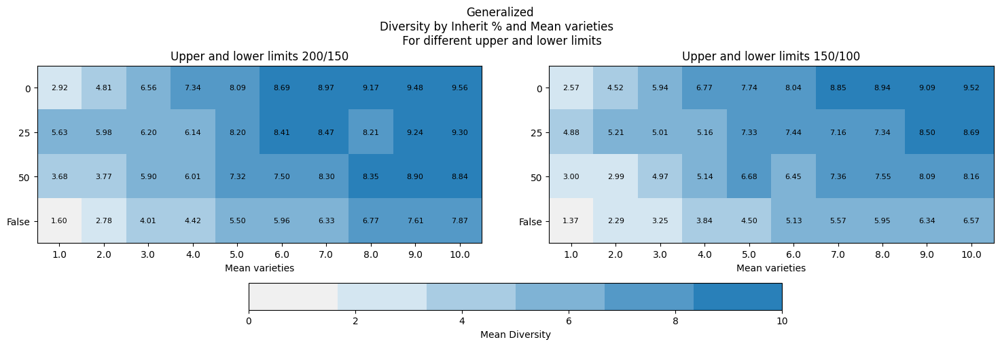

In [78]:
visualize_diversity(GmvM_datos, inherits, Gmvalphas, 'Generalized', up_low_limits, variable='Mean varieties', vis_type='heatmap')

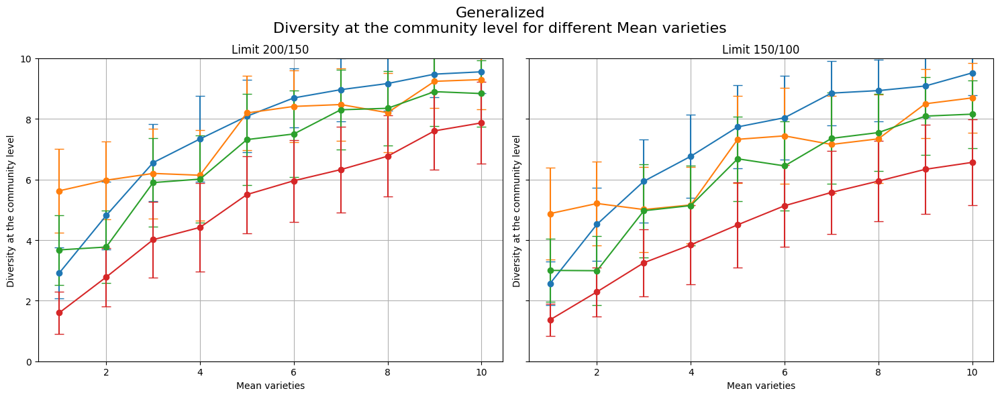

In [79]:
visualize_diversity(GmvM_datos, inherits, Gmvalphas, 'Generalized', up_low_limits, variable='Mean varieties', vis_type='transversal')

## Population Dynamics

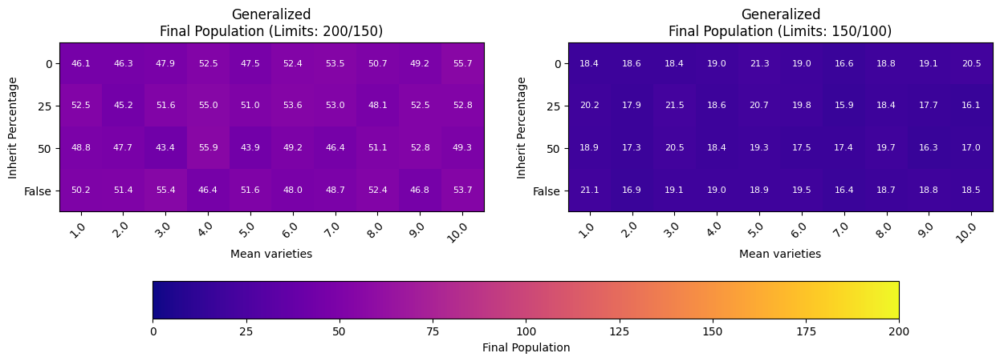

In [82]:
visualize_heatmap(GmvM_datos, inherits, Gmvalphas, 'Generalized', variable='Mean varieties', up_low_limits=up_low_limits, heatmap_type='alive')